# Stability Analysis VCF Comparison

## Table Of Contents

---
### [Step 1 - Initialization](#Step-1--Initialization)
<ol>
 <li>Imported Libraries</li>
 <li>Common Functions</li>
</ol>

### [Step 2 - Reading Files](#Step-2--Reading-Files)
<ol>
 <li>Reading CSV File (SNPs) (export <strong>'Export Sheet'</strong> as .csv <a href="https://docs.google.com/spreadsheets/d/1mDAMd1wk54RlQFEqKvuIQAwg_ajwCjZA7q2Lwkwx7Mo/edit?usp=sharing">from here</a>) </li>
 <li>Reading CSV File (Indels) (export <strong>'Export Sheet'</strong> as .csv <a href="https://docs.google.com/spreadsheets/d/1JVHZlCrh5VafV3JtbeXTsRFjU8ZLvkJmENCgq4hQdgA/edit?usp=sharing">from here</a>) </li>
 <li>Reading all SNP VCF files from Google Drive (<a href="https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing">download files from here</a>)</li>
    <li>Reading all Indel VCF files from Google Drive (<a href="https://drive.google.com/drive/folders/1zdC_THQvRqXscc-scfM78cm8sCOADIjx?usp=sharing">download files from here</a>)</li>
 <li>Reading High Confidence VCF's</li>
 <li>Reading Paper Validated VCF's</li>
 <li>Plotting the intersection variants of High Confidence and Paper Validated VCF's</li>
</ol>

### [Step 3 - Filtering VCFs](#Step-3--Filtering-VCFs)
<ol>
 <li>Filtering each generated VCF (SNPs)</li>
 <li>Filtering each generated VCF (Indels)</li>
 <li>Plotting Length counts of VCF's after each filtering steps(SNPs-Indels)</li>
</ol>

### [Step 4 - Matching Features](#Step-4--Matching-Features)
<ol>
 <li>Matching VCFs files with CSV file properties using the 'TestCaseNo' column (SNPs) </li>
 <li>Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (SNPs) </li>
 <li>Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (SNPs)</li>
 <li>Matching VCFs files with CSV file properties using the 'TestCaseNo' column (Indels) </li>
 <li>Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (Indels) </li>
 <li>Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (Indels)</li>

</ol>

### [Step 5 -  Execution Time Analysis](#Step-5--Execution-Time-Analysis)
<ol>
 <li>Plotting execution times</li>
</ol>

### [Step 6 -  Heatmaps](#Step-6--Heatmaps)
<ol>
 <li>Heatmap between Generated VCFs with Intersection / Union. (SNPs)</li>
 <li>Heatmap between Generated VCFs with Intersection / Union. (Indels)</li>
 <li>Plotting Heatmap with cluster</li>
</ol>

### [Step 7 - Mean of Intersection/Union](#Step-7--Mean-of-Intersection/Union)
<ol>
 <li>Visualizing Mean Intersection/Union Values (SNPs)</li>
 <li>Visualizing Mean Intersection/Union Values (Indels)</li>
</ol>

### [Step 8 - Recall / Precision / F1-Score](#Step-8--Recall-/-Precision-/-F1-Score)
<ol>
 <li>Calculation of Inter/Union, Precision, Recall, f1_score</li>
 <li>Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper and Variant Caller</li>
 <li>Scatter Plot of Precision vs. Recall, Grouped by Centers, and Differentiated by Mapper, Variant Caller, baseRecalibration and isTrimmed</li>
</ol>

### [Step 9 - ANOVA calculation for SNPs](#Step-9--ANOVA-calculation-for-SNPs)
<ol>
 <li>Creating ANOVA-model dataframe</li>
 <li>Plotting ANOVA combinations of 7 independent variables that affect the result by more than 1%</li>
</ol>

### [Step 10 - ANOVA calculation for SNPs](#Step-10--Cancer-Gene-Census-(CGC))
<ol>
 <li>Creating ANOVA-model dataframe</li>
 <li>Plotting ANOVA combinations of 7 independent variables that affect the result by more than 1%</li>
</ol>


### TODO:
<ol>
 <li>Calculation for Step 8 and 9 for Indels. </li>
</ol>

## Step 1- Initialization 

### Imported Libraries

In [3]:
import os
import allel
import numpy as np
import matplotlib.pyplot as plt
import random
import community
from numpy import linalg as LA
from tqdm import tqdm
import pandas as pd
from scipy import stats, interpolate
import time
import seaborn as sns
import matplotlib.colors
import math
import scipy.io as sio
from skimage import data, segmentation, color
from skimage.future import graph
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from matplotlib_venn import venn2, venn2_circles, venn2_unweighted, venn3, venn3_circles
from matplotlib import pyplot as plt, lines as Line2D
from xgboost import XGBClassifier, XGBRegressor, plot_importance
from venn import pseudovenn, venn
import plotly.io as pio
import pingouin as pg #!pip install pingouin
from scipy.stats import ttest_rel
from matplotlib.patches import PathPatch
import statsmodels.api as sm
from statsmodels.formula.api import ols
!pip install pysam
import matplotlib.colors as mcolors
import itertools
from matplotlib.patches import Patch
from matplotlib.gridspec import GridSpec


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/outdated/utils.py:18: OutdatedPackageWarning:

The package pingouin is out of date. Your version is 0.3.12, the latest is 0.5.5.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.



In [4]:
#!conda install -c conda-forge py-xgboost-cpu -y
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

In [5]:
!pip install -U seaborn
!pip install seaborn --upgrade

### Common Funtions

In [6]:
#Deleting indels from VCF
def remove_indels(t):
    t = t[t["REF"].apply(len) == 1 ]
    t = t[t["ALT_1"].apply(len) == 1]
    return t 

#Apply Filters
def filtersControl(key,df,VCName):
    df = df.copy()
    df = df if VCName == 'SomaticSniper' else df[df['FILTER_PASS'].astype("bool")== True]
    df = df[df['is_snp'].astype("bool")==True]
    return df

#Jaccard Similarity function for two sets ( int / )
def js_set(s1, s2):
    intersection = len(list(set(s1).intersection(s2)))
    union = uni(s1,s2)
    if union == 0:
        return 0;
    return np.float64(round((float(intersection) / union) * 100) / 100);

#The intersection of two sets is the set of all the common elements of both the sets. 
def intersec(s1,s2):
    return len(s1.intersection(s2))

#The union of two sets is the set of all the elements of both the sets without duplicates.
def uni(s1,s2):
    return len(s1.union(s2))

#The difference between two sets is the set of all the elements in first set that are not present in the second set. 
def dif(s1,s2):
    return len(s1.difference(s2))

#Percentage of intersects:
def percentage_intersects(intersection,count):
    return np.float64(round((float(intersection) / count) * 100) / 100);

def intersection_over_union(set1, set2):
    intersection_cardinality = len(set.intersection(*[set(set1), set(set2)]))
    union_cardinality = len(set.union(*[set(set1), set(set2)]))
    if union_cardinality == 0:
        return 0
    else:
        return intersection_cardinality / float(union_cardinality)

#intersection/union:
#def inter_union(s1,s2):
#    return np.float64(round((float(intersec(s1,s2) / uni(s1,s2))) * 100) / 100);
def inter_union(s1, s2):
    intersection = len(s1.intersection(s2))
    union = len(s1.union(s2))
    return round(intersection / union, 2)

# Get True Positives
def get_true_pos(pred, real):
    return len(pred & real);

# Get False Positives
def get_false_pos(pred, real):
    return len(pred - real);

# Get False Negatives
def get_false_neg(pred, real):
    return len(real - pred);

# Get TruePositive/FalsePositive
def get_precision(pred, real):
    tp = get_true_pos(pred, real) 
    fp = get_false_pos(pred, real) 
    return (1.0 * tp) / (tp + fp);

# Get TruePositive/FalseNegative
def get_recall(pred, real):
    tp = get_true_pos(pred, real)
    fn = get_false_neg(pred, real)
    return (1.0 * tp) / (tp + fn);

# Get TruePositive/FalseNegative
def get_f1score(pred, real):
    p = get_precision(pred,real)
    r = get_recall(pred, real)
    
    if(p + r == 0 ):
        return 0
    else:
        return (2.0 * ((p * r)/(p + r)));

def calculate_frequency(d):
    frequency = {}
    for key, values in tqdm(d.items()):
        for value in values:
            if (key, value) in frequency:
                frequency[(key, value)] += 1
            else:
                frequency[(key, value)] = 1
    return frequency

def create_dataframe(frequency_dict):
    df = pd.DataFrame(columns=["id", "list_item", "frequency"])
    for (key, value), freq in tqdm(frequency_dict.items()):
        df = df.append({"id": key, "list_item": value, "frequency": freq}, ignore_index=True)
    return df

def adjust_box_widths(g, fac):
    """
    Adjust the withs of a seaborn-generated boxplot.
    """

    # iterating through Axes instances
    for ax in g.axes:

        # iterating through axes artists:
        for c in ax.get_children():

            # searching for PathPatches
            if isinstance(c, PathPatch):
                # getting current width of box:
                p = c.get_path()
                verts = p.vertices
                verts_sub = verts[:-1]
                xmin = np.min(verts_sub[:, 0])
                xmax = np.max(verts_sub[:, 0])
                xmid = 0.5*(xmin+xmax)
                xhalf = 0.5*(xmax - xmin)

                # setting new width of box
                xmin_new = xmid-fac*xhalf
                xmax_new = xmid+fac*xhalf
                verts_sub[verts_sub[:, 0] == xmin, 0] = xmin_new
                verts_sub[verts_sub[:, 0] == xmax, 0] = xmax_new

                # setting new width of median line
                for l in ax.lines:
                    if np.all(l.get_xdata() == [xmin, xmax]):
                        l.set_xdata([xmin_new, xmax_new])
                        
                        
# Enrich results_finito with metadata from vcfcomparison_df_full
def enrich_results_with_metadata(results_df, comparison_df):
    # Ensure TestCaseNo is a string and remove "TestCase " prefix
    comparison_df['TestCaseNo'] = comparison_df['TestCaseNo'].astype(str).str.replace('TestCase ', '')

    # Select relevant columns for vcf1 and vcf2
    metadata_columns = ['TestCaseNo', 'Mapper', 'VariantCaller', 'Sample', 'isTrimmed', 'baseRecalibration']

    # Rename columns for merging vcf1 and vcf2 metadata separately
    vcf1_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf1_{col}" for col in metadata_columns}
    )
    vcf2_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf2_{col}" for col in metadata_columns}
    )

    # Merge vcf1 metadata
    enriched_df = results_df.merge(vcf1_metadata, left_on='vcf1', right_on='vcf1_TestCaseNo', how='left')
    
    # Merge vcf2 metadata
    enriched_df = enriched_df.merge(vcf2_metadata, left_on='vcf2', right_on='vcf2_TestCaseNo', how='left')

    # Drop unnecessary TestCaseNo columns from the merge
    enriched_df.drop(['vcf1_TestCaseNo', 'vcf2_TestCaseNo'], axis=1, inplace=True)

    return enriched_df

## Step 2- Reading Files

### 1- Reading CSV File (SNPs)

In [7]:
#headerList=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author"]
csv_file_df = pd.read_csv('vcf/TestCases.csv')
csv_file_df.head()

,TestCaseNo,phase,Sample,operatingSystem,HOW,isTrimmed,baseRecalibration,Mapper,M_Version,Variant Caller,VC_Version,ReferenceGenom,Duplicates,Variant Filter,FilterPass,SOMATICfilter,remove_indels,Sort,File Link,Result VCF Count,Kim yaptı :),Slurm_id,Donanım,ElapsedTime
0,TestCase 1,notReady,LL,Linux,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
1,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/11CFGjN...,NaN,GUL EDA,29812.0,a047,07:15:00
2,TestCase 3,notReady,LL,NaN,Uhem + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN
3,TestCase 4,notReady,LL,MAC,Local,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GAMZE,NaN,NaN,NaN
4,TestCase 5,notReady,LL,NaN,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg19,MARK,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GÜL EDA,NaN,NaN,NaN


### 2- Reading CSV File (Indels)

In [8]:
csv_file_df_indels = pd.read_csv('vcf/TestCases_Indels.csv')
csv_file_df_indels.head()

,IDs,phase,Sample,HOW,isTrimmed,baseRecalibration,Mapper,Variant Caller,Duplicates,File Link,Result VCF Count,Kim yaptı :),Notes:
0,TestCase 1,done,LL,Uhem + COSAP,yes,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1wBcuLv...,NaN,Gül Eda,NaN
1,TestCase 2,done,LL,Uhem + COSAP,yes,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1IpGEQ-...,NaN,Gül Eda,NaN
2,TestCase 3,done,LL,Uhem + COSAP,yes,yes,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/1d4D9UC...,NaN,Gül Eda,NaN
3,TestCase 4,done,LL,Uhem + COSAP,yes,yes,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1Ei63_F...,NaN,Gül Eda,NaN
4,TestCase 5,done,LL,Uhem + COSAP,yes,no,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1UB4I9T...,NaN,Gül Eda,NaN


### 3- Reading SNP VCF files from Google Drive

In [9]:
vcf_filenames = {}
for root, directories, filenames in os.walk('vcf/TESTCASES_bedded'):
    for fn in filenames:
        if fn == '.DS_Store' or fn == 'fixed.recode.vcf' or fn == 'gatk.recode.vcf':
            continue
        elif fn.endswith('.vcf'):
            vcf_filenames[root[30:]] = os.path.join(root, fn)
            
print("Total file count:", len(vcf_filenames))


Total file count: 480


In [10]:
vcf_filenames

{'296': 'vcf/TESTCASES_bedded/TestCase 296/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf',
 '606': 'vcf/TESTCASES_bedded/TestCase 606/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf',
 '262': 'vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf',
 '853': 'vcf/TESTCASES_bedded/TestCase 853/snp_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf',
 '639': 'vcf/TESTCASES_bedded/TestCase 639/snp_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf',
 '601': 'vcf/TESTCASES_bedded/TestCase 601/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf',
 '854': 'vcf/TESTCASES_bedded/TestCase 854/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf',
 '637': 'vcf/TESTCASES_bedded/TestCase 637/snp_SRR7890880_bwa2

In [11]:
vcfcomparison_df = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full = pd.DataFrame(columns=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","Sort","FileLink","Result VCF Count","Author","Slurm_id","Node","ElapsedTime"])

for index, row in csv_file_df.iterrows():
    for key in vcf_filenames:
        if int(key)-1 == index:
            vcfcomparison_df.loc[len(vcfcomparison_df.index)] = [key , row[2],row[7],row[9],"0"] 
            vcfcomparison_df_full.loc[len(vcfcomparison_df_full.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],row[10],row[11],row[12],row[13],row[14],row[15],row[16],row[17],row[18],"0",row[20],row[21],row[22],row[23]]

In [12]:
vcfcomparison_df_full

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,Sort,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/11CFGjN...,0,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1I7r5au...,0,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1AN-msy...,0,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1hhxI84...,0,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1sxq7kO...,0,GUL EDA,29811.0,a078,07:36:41
5,TestCase 32,done,EA,Linux,Altay + COSAP,NO,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1aU_EFn...,0,GUL EDA,29811.0,a078,09:57:30
6,TestCase 38,done,EA,Linux,Altay + COSAP,YES,NO,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1Zi72RD...,0,GUL EDA,29811.0,a078,06:05:48
7,TestCase 44,done,EA,Linux,Altay + COSAP,NO,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1L-ZfgL...,0,GUL EDA,29811.0,a078,10:37:11
8,TestCase 50,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1RmzNj5...,0,GUL EDA,29813.0,a063,03:34:43
9,TestCase 56,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Strelka,NaN,hg38,MARK,NaN,NaN,NaN,NaN,NaN,https://drive.google.com/drive/folders/1UAhDec...,0,GUL EDA,29813.0,a063,01:39:41


### 4- Reading Indel VCF files from Google Drive

In [13]:
vcf_filenames_indels = {}
for root, directories, filenames in os.walk('vcf/TESTCASES_bedded_indels'):
    #print(root)
    for fn in filenames:
        if fn == '.DS_Store' or fn == 'fixed.recode.vcf' or fn == 'gatk.recode.vcf':
            continue;
        else:
            vcf_filenames_indels[root[28:]] = os.path.join(root,fn)
            
print("Total file count:", len(vcf_filenames_indels)) #SomaticSniper has no InDels

Total file count: 320


In [14]:
vcfcomparison_df_indels = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full_indels = pd.DataFrame(columns=["TestCaseNo","phase","Sample","Environment","isTrimmed","baseRecalibration","Mapper","VariantCaller","Duplicates","FileLink","Result VCF Count","Author"])

for index, row in csv_file_df_indels.iterrows():
    for key in vcf_filenames_indels:
        if int(key)-1 == index:
            vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels.index)] = [key , row[2],row[6],row[7],"0"] 
            vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],"0",row[11]]

### 5- Reading High Confidence VCF's

In [15]:
# Validated VCF's
categories = ['LL', 'NC', 'EA', 'IL', 'FD']
all_filenames = {}

for category in tqdm(categories):
    category_filenames = {}
    for root, directories, filenames in os.walk(f'vcf/validated_vcfs/{category}'):
        for fn in filenames:
            if fn != '.DS_Store':
                category_filenames[root[22:]] = os.path.join(root, fn)
    all_filenames[category] = category_filenames

# Accessing filenames for LL category
#ll_filenames = all_filenames.get('LL', {})

100%|██████████| 5/5 [00:00<00:00, 529.60it/s]


In [16]:
def process_files(filenames):
    sets_dict = {}
    progression_bar = tqdm(filenames)
    for key in progression_bar:
        progression_bar.set_description("Processing « %s »" % key)
        temp = allel.vcf_to_dataframe(filenames[key], fields='variants/*')
        if len(temp) != 0:
            sets_dict[key] = set(temp[["CHROM", "POS", "REF", "ALT_1"]].apply(lambda row: "_".join(map(str, row)), axis=1))
    return sets_dict

ll_sets_dict = process_files(all_filenames.get('LL', {}))
nc_sets_dict = process_files(all_filenames.get('NC', {}))
ea_sets_dict = process_files(all_filenames.get('EA', {}))
il_sets_dict = process_files(all_filenames.get('IL', {}))
fd_sets_dict = process_files(all_filenames.get('FD', {}))

def print_set_count(name, all_validated_set):
    print(f"{name} Validated Set Count: {len(all_validated_set)}")
    
print_set_count("EA", set.intersection(*ll_sets_dict.values()))

Processing « bowtie/mutect »: 100%|██████████| 9/9 [00:06<00:00,  1.33it/s]       

EA Validated Set Count: 2388


### 6- Reading Paper Validated VCF's (without indels)


In [17]:
temp = allel.vcf_to_dataframe('vcf/hc_bed_filtered.recode.vcf',fields='variants/*')
temp = remove_indels(temp)
high_confidence = set(temp[["CHROM","POS","REF","ALT_1"]].apply(lambda row: "_".join(map(str, row)), axis=1))

### 7- Plotting the intersection variants of High Confidence and Paper Validated VCF's

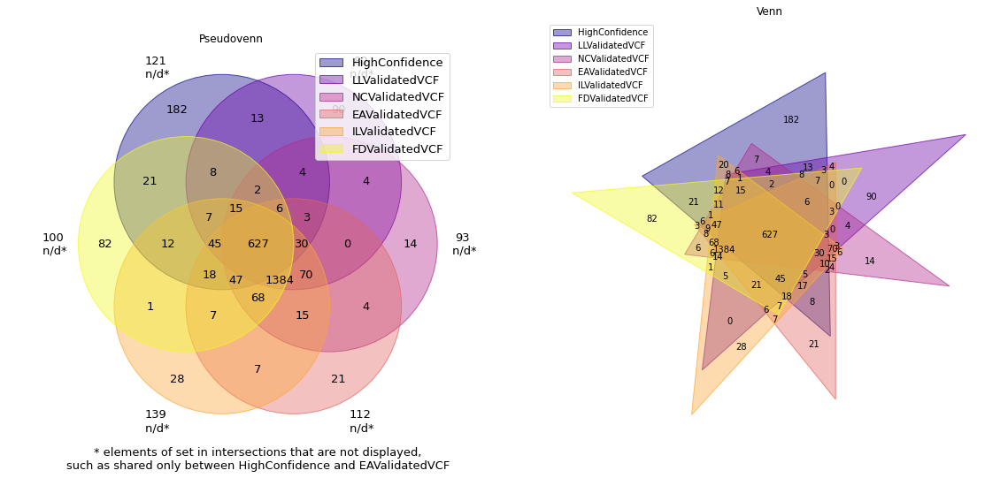

In [18]:
dataset_dict = {"HighConfidence":high_confidence,
                "LLValidatedVCF":set.intersection(*ll_sets_dict.values()),
                "NCValidatedVCF":set.intersection(*nc_sets_dict.values()),
                "EAValidatedVCF":set.intersection(*ea_sets_dict.values()),
                "ILValidatedVCF":set.intersection(*il_sets_dict.values()),
                "FDValidatedVCF":set.intersection(*fd_sets_dict.values())
               }

fig, axes = plt.subplots(1, 2, figsize=(20, 10))

# Plot pseudovenn on the first subplot
axes[0].set_title("Pseudovenn")
pseudovenn(dataset_dict, cmap="plasma", ax=axes[0])

# Plot venn on the second subplot
axes[1].set_title("Venn")
venn(dataset_dict, cmap="plasma", fontsize=10, legend_loc="upper left", ax=axes[1])

plt.show()

## Step 3- Filtering VCFs

### 1- Filtering each generated VCF (SNPs)

In [19]:
import os
import pandas as pd
from tqdm import tqdm
import allel

# Define the paths for saving the CSV files
save_path = "dfs/"
csv_file = os.path.join(save_path, "filtering_df.csv")
sets_dict_csv_file = os.path.join(save_path, "sets_dict.csv")

# Ensure the directory exists
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Check if both CSV files exist
if os.path.exists(csv_file) and os.path.exists(sets_dict_csv_file):
    filtering_df = pd.read_csv(csv_file)
    sets_dict_df = pd.read_csv(sets_dict_csv_file)
    sets_dict = sets_dict_df.groupby('Key')['Identifier'].apply(set).to_dict()
    # Ensure all keys are strings
    sets_dict = {str(key): value for key, value in sets_dict.items()}
    print("Both filtering_df and sets_dict DataFrames already exist. Skipping calculations.")
else:
    sets_dict = {}
    filtering_data = []

    vcf_comparison_dict = {row[0]: row[3] for _, row in vcfcomparison_df.iterrows()}

    progression_bar = tqdm(vcf_filenames)
    for key in progression_bar:
        # Creating a dataframe for each vcf.
        temp = allel.vcf_to_dataframe(vcf_filenames[key], fields='variants/*')
        progression_bar.set_description("Processing « %s »" % key)
        VCName = vcf_comparison_dict.get(key)

        total_len = len(temp)
        temp = remove_indels(filtersControl(key, temp, VCName))
        without_indels_len = len(temp)

        filtering_data.append((key, total_len, len(temp), without_indels_len))

        temp["Identifier"] = temp[["CHROM", "POS", "REF", "ALT_1"]].astype(str).agg("_".join, axis=1)
        sets_dict[key] = set(temp["Identifier"])

    filtering_df = pd.DataFrame(filtering_data, columns=["Key", "Total Length", "After FilterPass", "After RemoveIndels"])

    # Save the filtering_df DataFrame to a CSV file
    filtering_df.to_csv(csv_file, index=False)
    print("filtering_df DataFrame has been processed and saved.")

    # Convert sets_dict to a DataFrame for saving to CSV
    sets_dict_df = pd.DataFrame([(key, identifier) for key, identifiers in sets_dict.items() for identifier in identifiers],
                                columns=["Key", "Identifier"])

    # Save the sets_dict DataFrame to a CSV file
    sets_dict_df.to_csv(sets_dict_csv_file, index=False)
    print("sets_dict DataFrame has been processed and saved.")


Both filtering_df and sets_dict DataFrames already exist. Skipping calculations.


### 2- Filtering each generated VCF (Indels)

In [20]:
import os
import pandas as pd
from tqdm import tqdm
import allel

# Define the paths for saving the CSV files
save_path = "dfs/"
csv_file_indels = os.path.join(save_path, "filtering_df_indels.csv")
sets_dict_csv_file_indels = os.path.join(save_path, "sets_dict_indels.csv")

# Ensure the directory exists
if not os.path.exists(save_path):
    os.makedirs(save_path)

# Check if both CSV files exist
if os.path.exists(csv_file_indels) and os.path.exists(sets_dict_csv_file_indels):
    filtering_df_indels = pd.read_csv(csv_file_indels)
    sets_dict_df_indels = pd.read_csv(sets_dict_csv_file_indels)
    sets_dict_indels = sets_dict_df_indels.groupby('Key')['Identifier'].apply(set).to_dict()
    print("Both filtering_df_indels and sets_dict_indels DataFrames already exist. Skipping calculations.")
else:
    sets_dict_indels = {}
    filtering_data_indels = []

    vcf_comparison_dict_indels = {row[0]: row[3] for index, row in vcfcomparison_df_indels.iterrows()}

    progression_bar = tqdm(vcf_filenames_indels)
    for key in progression_bar:
        # Creating a dataframe for each VCF.
        temp = allel.vcf_to_dataframe(vcf_filenames_indels[key], fields='variants/*')
        progression_bar.set_description("Processing « %s »" % key)
        VCName = vcf_comparison_dict_indels.get(key)

        total_len = len(temp)
        temp = temp if VCName == 'SomaticSniper' else temp[temp['FILTER_PASS'].astype("bool") == True]
        after_Filterpass_len = len(temp)

        filtering_data_indels.append((key, total_len, after_Filterpass_len))

        sets_dict_indels[key] = set(temp["CHROM"].astype(str) + "_" + temp["POS"].astype(str) + "_" + temp["REF"].astype(str) + "_" + temp["ALT_1"].astype(str))

    filtering_df_indels = pd.DataFrame(filtering_data_indels, columns=["Key", "Total Length", "After FilterPass"])

    # Save the filtering_df_indels DataFrame to a CSV file
    filtering_df_indels.to_csv(csv_file_indels, index=False)
    print("filtering_df_indels DataFrame has been processed and saved.")

    # Convert sets_dict_indels to a DataFrame for saving to CSV
    sets_dict_df_indels = pd.DataFrame([(key, identifier) for key, identifiers in sets_dict_indels.items() for identifier in identifiers],
                                       columns=["Key", "Identifier"])

    # Save the sets_dict_indels DataFrame to a CSV file
    sets_dict_df_indels.to_csv(sets_dict_csv_file_indels, index=False)
    print("sets_dict_indels DataFrame has been processed and saved.")


Both filtering_df_indels and sets_dict_indels DataFrames already exist. Skipping calculations.


### 3-Plotting Length counts of VCF's after each filtering steps

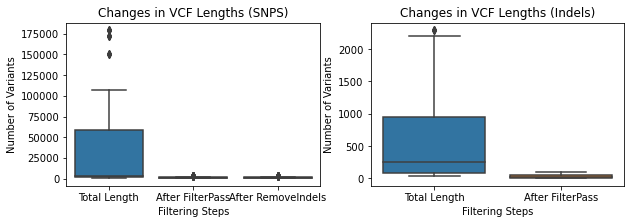

In [21]:
fig, axes = plt.subplots(1, 2, figsize=(10, 3))

sns.boxplot(x="variable", y="value", data=pd.melt(filtering_df.drop("Key", axis=1)),  ax=axes[0])
axes[0].set_title("Changes in VCF Lengths (SNPS)")
axes[0].set_xlabel("Filtering Steps")
axes[0].set_ylabel("Number of Variants")

sns.boxplot(x="variable", y="value", data=pd.melt(filtering_df_indels.drop("Key", axis=1)),  ax=axes[1])
axes[1].set_title("Changes in VCF Lengths (Indels)")
axes[1].set_xlabel("Filtering Steps")
axes[1].set_ylabel("Number of Variants")

plt.show()

## Step 4- Matching Features

In [22]:
def calculate_region_size(bed_file):
    region_size = 0
    with open(bed_file, 'r') as f:
        for line in f:
            fields = line.strip().split('\t')
            start = int(fields[1])
            end = int(fields[2])
            region_size += end - start
    return region_size

bed_file = 'vcf/sorted_exome_hc.bed'
region_size_bp = calculate_region_size(bed_file)
print("Size of region:", region_size_bp, "bp")

Size of region: 80762432 bp


In [23]:
def calculate_tmb(num_somatic_mutations, region_size_bp):
    region_size_mb = region_size_bp / 1000000
    tmb = num_somatic_mutations / region_size_mb
    return tmb

In [24]:
tmb_list_snp = sets_dict.copy()

for key in vcf_filenames:
    tmb = calculate_tmb(len(sets_dict[key]), region_size_bp)
    tmb_list_snp[key] = tmb 
    
#tmb_list_snp

### 1- Matching VCFs files with CSV file columns using the 'TestCaseNo' column (SNPs)

In [25]:
vcfcomparison_df = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_midi = pd.DataFrame(columns=["isTrimmed","baseRecalibration","Mapper","VariantCaller","ReferenceGenom","Duplicates"])
vcfcomparison_df_full = pd.DataFrame(columns=["TestCaseNo","phase","Sample","operatingSystem","Environment","isTrimmed","baseRecalibration","Mapper","M_Version","VariantCaller","VC_Version","ReferenceGenom","Duplicates","VariantFilter","FilterPass","SOMATICfilter","remove_indels","TMB","FileLink","Result VCF Count","Author","Slurm_id","Node","ElapsedTime"])

for index, row in csv_file_df.iterrows():
    for key in vcf_filenames:
        if int(key)-1 == index:
            vcfcomparison_df.loc[len(vcfcomparison_df.index)] = [key , row[2],row[7],row[9],len(sets_dict[key])] 
            vcfcomparison_df_midi.loc[len(vcfcomparison_df_midi.index)] = [row[5],row[6],row[7],row[9],row[11],row[12]]
            vcfcomparison_df_full.loc[len(vcfcomparison_df_full.index)] = [row[0],row[1],row[2],row[3],row[4],row[5],row[6],row[7],row[8],row[9],row[10],row[11],row[12],row[13],row[14],row[15],row[16],tmb_list_snp[key],row[18],len(sets_dict[key]),row[20],row[21],row[22],row[23]]
            
vcfcomparison_df_full.head()

,TestCaseNo,phase,Sample,operatingSystem,Environment,isTrimmed,baseRecalibration,Mapper,M_Version,VariantCaller,VC_Version,ReferenceGenom,Duplicates,VariantFilter,FilterPass,SOMATICfilter,remove_indels,TMB,FileLink,Result VCF Count,Author,Slurm_id,Node,ElapsedTime
0,TestCase 2,done,EA,Linux,Altay + COSAP,YES,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.613695,https://drive.google.com/drive/folders/11CFGjN...,1261,GUL EDA,29812.0,a047,07:15:00
1,TestCase 8,done,EA,Linux,Altay + COSAP,NO,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.799425,https://drive.google.com/drive/folders/1I7r5au...,1276,GUL EDA,29812.0,a047,06:12:47
2,TestCase 14,done,EA,Linux,Altay + COSAP,YES,NO,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,16.009919,https://drive.google.com/drive/folders/1AN-msy...,1293,GUL EDA,29812.0,a047,05:48:51
3,TestCase 20,done,EA,Linux,Altay + COSAP,NO,YES,BWA,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,15.316527,https://drive.google.com/drive/folders/1hhxI84...,1237,GUL EDA,29812.0,a047,07:44:08
4,TestCase 26,done,EA,Linux,Altay + COSAP,YES,YES,BOWTIE,NaN,Mutect,NaN,hg38,MARK,NaN,NaN,NaN,NaN,13.397318,https://drive.google.com/drive/folders/1sxq7kO...,1082,GUL EDA,29811.0,a078,07:36:41


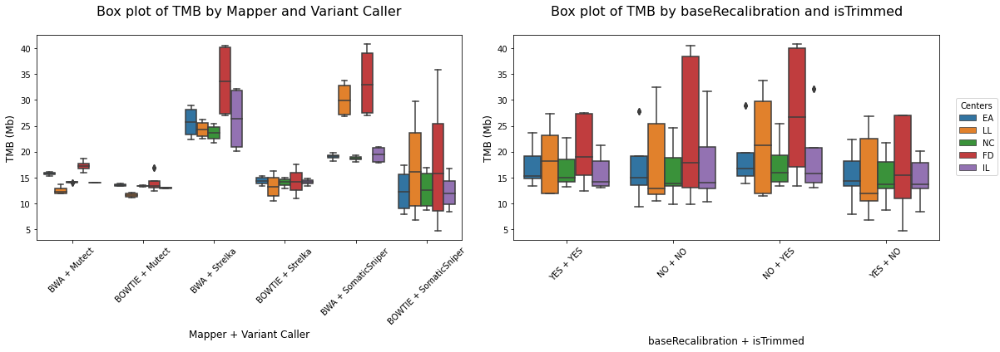

In [26]:

df = vcfcomparison_df_full.copy()
# Combine Mapper and VariantCaller
df['Mapper_VariantCaller'] = df['Mapper'] + ' + ' + df['VariantCaller']
df['baseRecalibration_isTrimmed'] = df['baseRecalibration'] + ' + ' + df['isTrimmed']

# Plot box plot
# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
colors = sns.color_palette("muted")


# Plot box plots
sns.boxplot(ax=axes[0], x='Mapper_VariantCaller', y='TMB', hue='Sample', data=df)
sns.boxplot(ax=axes[1], x='baseRecalibration_isTrimmed', y='TMB', hue='Sample', data=df)

# Set titles and labels
axes[0].set_title('Box plot of TMB by Mapper and Variant Caller\n', fontsize=16)
axes[0].set_ylabel('TMB (Mb)', fontsize=12)
axes[0].set_xlabel('Mapper + Variant Caller', fontsize=12)
axes[0].tick_params(axis='x', labelrotation=45)
#axes[0].legend(title='Center', fontsize=10)

axes[1].set_title('Box plot of TMB by baseRecalibration and isTrimmed\n', fontsize=16)
axes[1].set_ylabel('TMB (Mb)', fontsize=12)
axes[1].set_xlabel('\n\n\n\nbaseRecalibration + isTrimmed', fontsize=12)
axes[1].tick_params(axis='x', labelrotation=45)
#axes[1].legend(title='Center', fontsize=10)

axes[0].legend_.remove()
axes[1].legend_.remove()
# Add a single combined legend below the plots

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='center left', bbox_to_anchor=(0.98, 0.6), fontsize=10, title='Centers', borderaxespad=2, frameon=True)

plt.tight_layout()
plt.savefig("tmb.pdf", format="pdf", bbox_inches="tight")

plt.show()

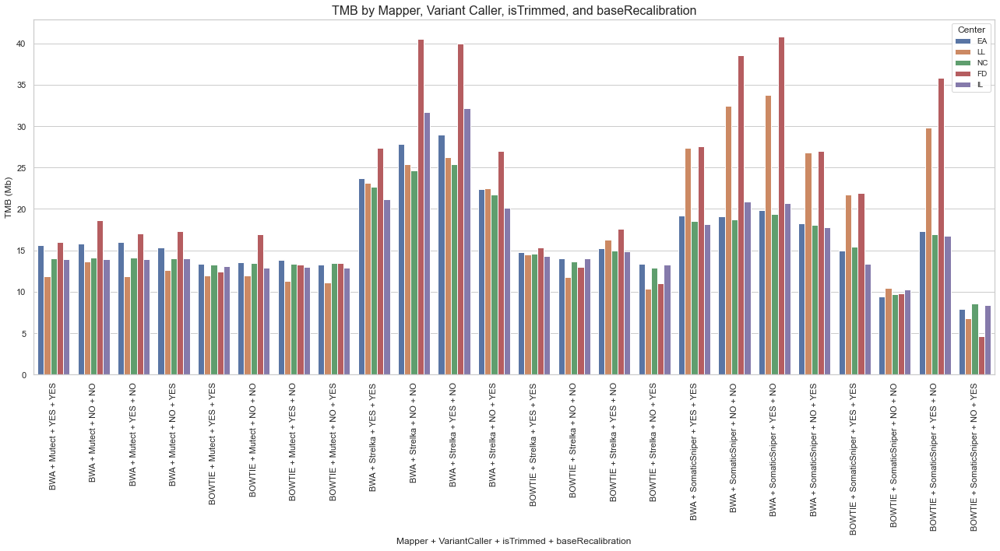

In [27]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already loaded and contains the necessary columns

df = vcfcomparison_df_full.copy()

# Combine Mapper, VariantCaller, isTrimmed, and baseRecalibration
df['Mapper_VariantCaller_isTrimmed_baseRecalibration'] = (
    df['Mapper'] + ' + ' + df['VariantCaller'] + ' + ' + df['isTrimmed'] + ' + ' + df['baseRecalibration']
)

# Create a grouped bar plot
plt.figure(figsize=(18, 10))

sns.set(style="whitegrid")

# Using seaborn's barplot with dodge to group by 'Sample'
sns.barplot(
    x='Mapper_VariantCaller_isTrimmed_baseRecalibration',
    y='TMB',
    hue='Sample',
    data=df,
    dodge=True,
    ci=None  # Remove the confidence interval bars for clarity
)

# Set title and labels
plt.title('TMB by Mapper, Variant Caller, isTrimmed, and baseRecalibration', fontsize=16)
plt.ylabel('TMB (Mb)', fontsize=12)
plt.xlabel('Mapper + VariantCaller + isTrimmed + baseRecalibration', fontsize=12)
plt.xticks(rotation=90)
plt.legend(title='Center', fontsize=10)

# Adjust layout and save the figure
plt.tight_layout()
plt.savefig("tmb_grouped_bar.pdf", format="pdf", bbox_inches="tight")

plt.show()


### 1.1 TMB

Text(0.5, 0.98, 'VariantCaller')

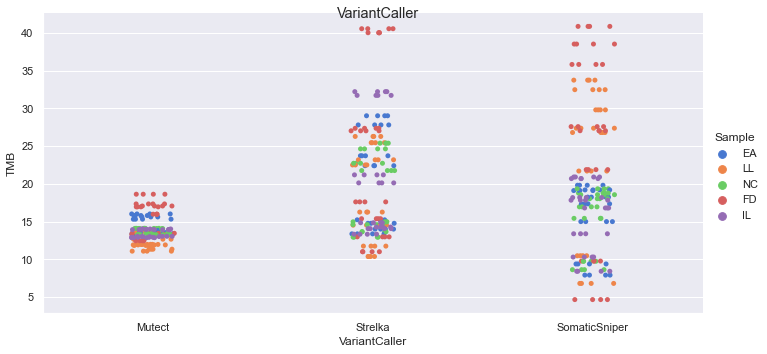

In [28]:
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='TMB', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

### 2- Plotting All Variant Counts based on their 'Variant Callers' and 'Centers' (SNPs)

Text(0.5, 0.98, 'VariantCaller')

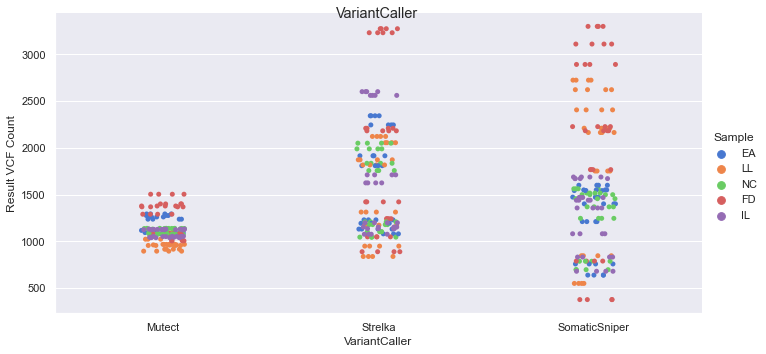

In [29]:
sns.set(rc={"figure.figsize":(3, 4)})
cp = sns.catplot(x='VariantCaller', y='Result VCF Count', data=vcfcomparison_df_full,hue='Sample',height=5, aspect=2,palette=sns.color_palette("muted"))
cp.fig.suptitle('VariantCaller')

### 3- Plotting All Variant Counts based on their 'Mapper, Variant Callers' and 'Centers' (SNPs)

In [30]:
fig = px.scatter(
    vcfcomparison_df_full,
    x="VariantCaller",
    y="Result VCF Count",
    color = "Mapper",
    symbol = "VariantCaller",
    facet_col= 'Sample',
    hover_data=['Environment','TestCaseNo'],
    color_discrete_sequence=sns.color_palette("muted").as_hex(),#['#55a3cd', '#4954b0', '#282739', '#3b2127', '#9c2f45', '#e96f36'], 
).update_layout(
    title={
        'y':0.95,
        'x':0.4,
        'xanchor': 'center',
        'yanchor': 'top'},
    yaxis_tickformat="%H:%M:%S",
    showlegend=True,
    title_text="Variant Count for each TestCase(SNPs)",
    font=dict(
        size=8
    )
)
# Rotate x-axis labels
fig.update_xaxes(tickangle=90)
fig.update_traces(marker = dict(size=6))

fig.write_image("variant_count_testcase_snps.pdf", format="pdf")

fig.show()

### 4- Matching VCFs files with CSV file columns using the 'TestCaseNo' column (Indels)


In [31]:
vcfcomparison_df_indels = pd.DataFrame(columns=["TestCase", "data", "mapper", "variantCaller", "VCFLength"])
vcfcomparison_df_full_indels = pd.DataFrame(columns=["TestCaseNo","phase","Sample","Environment","isTrimmed",
                                                     "baseRecalibration","Mapper","VariantCaller","Duplicates",
                                                     "FileLink","Result VCF Count","Author"])

for index, row in csv_file_df_indels.iterrows():
    for key in vcf_filenames_indels:
        # Ensure the key type matches the dictionary
        key_int = int(key)  # Convert key to integer

        if key_int - 1 == index:
            # Check if key exists in the dictionary before accessing
            if key_int in sets_dict_indels:
                vcfcomparison_df_indels.loc[len(vcfcomparison_df_indels.index)] = [
                    key, row[2], row[6], row[7], len(sets_dict_indels[key_int])
                ]
                
                vcfcomparison_df_full_indels.loc[len(vcfcomparison_df_full_indels.index)] = [
                    row[0], row[1], row[2], row[3], row[4], row[5], row[6], row[7], row[8],
                    row[9], len(sets_dict_indels[key_int]), row[11]
                ]
            else:
                print(f"Key {key_int} not found in sets_dict_indels")


In [32]:
vcfcomparison_df_full_indels

,TestCaseNo,phase,Sample,Environment,isTrimmed,baseRecalibration,Mapper,VariantCaller,Duplicates,FileLink,Result VCF Count,Author
0,TestCase 1,done,LL,Uhem + COSAP,yes,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1wBcuLv...,59,Gül Eda
1,TestCase 2,done,LL,Uhem + COSAP,yes,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1IpGEQ-...,15,Gül Eda
2,TestCase 3,done,LL,Uhem + COSAP,yes,yes,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/1d4D9UC...,25,Gül Eda
3,TestCase 4,done,LL,Uhem + COSAP,yes,yes,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1Ei63_F...,13,Gül Eda
4,TestCase 5,done,LL,Uhem + COSAP,yes,no,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1UB4I9T...,60,Gül Eda
5,TestCase 6,done,LL,Uhem + COSAP,yes,no,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1zMMrpF...,14,Gül Eda
6,TestCase 7,done,LL,Uhem + COSAP,yes,no,Bowtie,Mutect,MARK,https://drive.google.com/drive/folders/12Cd2n0...,23,Gül Eda
7,TestCase 8,done,LL,Uhem + COSAP,yes,no,Bowtie,Strelka,MARK,https://drive.google.com/drive/folders/1tIl-qK...,12,Gül Eda
8,TestCase 9,done,LL,Uhem + COSAP,no,yes,BWA,Mutect,MARK,https://drive.google.com/drive/folders/1TZho1d...,65,Gül Eda
9,TestCase 10,done,LL,Uhem + COSAP,no,yes,BWA,Strelka,MARK,https://drive.google.com/drive/folders/1Rl3_fL...,3,Gül Eda


# VCFEVAL

In [33]:
import os
import shutil
import subprocess
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm import tqdm
from subprocess import check_output
from itertools import product
from itertools import combinations
import os
import subprocess
import shutil
from tqdm import tqdm
import pandas as pd
from concurrent.futures import ThreadPoolExecutor, as_completed


In [34]:
reference_fasta = 'vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta'
reference_sdf = 'vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf'

In [35]:
RESULTS_COLUMNS = ['vcf1', 'vcf2', 'f_measure', 'precision', 'recall']
results_finito = pd.DataFrame(columns=RESULTS_COLUMNS)
os.environ["PATH"] += os.pathsep + "/path/to/rtg"  # Replace /path/to/rtg with the actual path


In [34]:
import os
import subprocess
import shutil
import pandas as pd
from itertools import product
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# Global cache'ler
disease_sample_cache = {}
vcfeval_result_cache = {}

# Execution mode flag (True: paralel, False: seri)
parallel = False  # İstenirse True yapılabilir

# -------------------------------------------------------------------
# Varsayılan: vcfcomparison_df_full, vcf_filenames ve reference_sdf önceden tanımlı
# Örnek:
#   vcfcomparison_df_full = pd.read_csv("vcf_comparison_data.csv")
#   vcf_filenames = { "1": "/path/to/vcf1", "2": "/path/to/vcf2", ... }
#   reference_sdf = "/path/to/reference.sdf"
# -------------------------------------------------------------------

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full['Duplicates'] == 'MARK')
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df['TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames: TestCaseNo ile vcf_filenames sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames = {
    str(tc): vcf_filenames[str(tc)]
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Her iki VCF dosyası arasında karşılaştırma yapılıyor.
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
]
# İsteğe bağlı: İlk 128 çifti sınırlayabilirsiniz:
# vcf_pairs = vcf_pairs[:128]

# -------------------------------------------------------------------
# Fonksiyonlar
# -------------------------------------------------------------------

def parse_summary_file(summary_file):
    """
    summary.txt dosyasını okuyup, f_measure, precision ve recall değerlerini sözlük olarak döndürür.
    Örneğin, summary.txt içeriği şu şekilde ise:
    
        Threshold  True-pos-baseline  True-pos-call  False-pos  False-neg  Precision  Sensitivity  F-measure
        ----------------------------------------------------------------------------------------------------
             None                  0              0          0        956        NaN       0.0000        NaN
             
    Bu durumda, parse edilen sözlükte bazı metrikler NaN olacaktır.
    """
    f_measure, precision, recall = None, None, None

    if not os.path.exists(summary_file):
        return None

    with open(summary_file, 'r') as f:
        lines = f.readlines()
        for line in lines:
            parts = line.strip().split()
            if len(parts) > 6 and parts[0] not in ['Threshold', '----------------------------------------------------------------------------------------------------']:
                try:
                    if parts[0] == 'None':
                        # parts[-3] => Precision, parts[-2] => Sensitivity, parts[-1] => F-measure
                        precision = float(parts[-3])
                        recall    = float(parts[-2])
                        f_measure = float(parts[-1])
                except ValueError:
                    continue

    return {'f_measure': f_measure, 'precision': precision, 'recall': recall}


def _get_disease_sample_cached(vcf_path: str, variant_caller: str, isBaseLine: bool = True) -> str:
    """
    vcf_path ve variant_caller bilgisine göre bcftools ile sample listesini elde eder.
    Eğer sample sütunu boşsa "ALT" döner.
    Eğer isBaseLine False ve variant caller "mutect" ise, sample listesindeki ikinci eleman (varsa) kullanılır.
    SomaticSniper için de ikinci sample tercih edilir.
    
    Ek olarak, bcftools sonucunda elde edilen sample değeri, eğer normal sample ise, aşağıdaki tabloda
    tanımlı aynı hasta grubunun TUMOR sample’ına dönüştürülür:
    
        LL    SRR7890851    NORMAL      ->  SRR7890850 (TUMOR)
        FD1   SRR7890880    NORMAL      ->  SRR7890879 (TUMOR)
        IL1   SRR7890874    NORMAL      ->  SRR7890883 (TUMOR)
        NC    SRR7890845    NORMAL      ->  SRR7890844 (TUMOR)
        EA    SRR7890919    NORMAL      ->  SRR7890918 (TUMOR)
    """
    cache_key = (vcf_path, variant_caller, isBaseLine)
    if cache_key in disease_sample_cache:
        return disease_sample_cache[cache_key]

    cmd = ['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path + '.gz']
    process = subprocess.run(cmd, check=True, stdout=subprocess.PIPE)
    decoded_output = process.stdout.decode('utf-8', errors='replace').strip()
    samples = decoded_output.split("\n") if decoded_output else []

    if not samples or (len(samples) == 1 and samples[0] == ''):
        sample = "ALT"
    else:
        if not isBaseLine and variant_caller.lower() == 'mutect':
            sample = samples[1] if len(samples) >= 2 else samples[0]
        elif variant_caller.lower() == 'somaticsniper':
            sample = samples[1] if len(samples) >= 2 else samples[0]
        else:
            sample = samples[0]

    # Normal sample’dan TUMOR sample’a dönüşümü sağlayan sözlük
    normal_to_tumor = {
        "SRR7890851": "SRR7890850",  # LL: Normal -> Tumor
        "SRR7890880": "SRR7890879",  # FD1: Normal -> Tumor
        "SRR7890874": "SRR7890883",  # IL1: Normal -> Tumor
        "SRR7890845": "SRR7890844",  # NC: Normal -> Tumor
        "SRR7890919": "SRR7890918",  # EA: Normal -> Tumor
    }

    # Eğer elde edilen sample normal sample ise, varsa karşılık gelen TUMOR sample’ı kullan.
    if sample in normal_to_tumor:
        sample = normal_to_tumor[sample]

    disease_sample_cache[cache_key] = sample
    return sample



def run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar=None):
    """
    İki VCF dosyası için vcfeval çalıştırır.
    Eğer summary.txt dosyası mevcutsa, parse edip döndürür;
    ancak parse edilen sonuçta herhangi bir metrik NaN ise,
    _get_disease_sample_cached fonksiyonunda vcf2 için isBaseLine=False kullanılarak alternatif sample seçimiyle,
    aynı output_dir altında yeniden çalıştırılır.
    Sonuç cache'lenir.
    """
    cache_key = (vcf1, variant_caller1, vcf2, variant_caller2)
    if cache_key in vcfeval_result_cache:
        return vcfeval_result_cache[cache_key]

    summary_file = os.path.join(output_dir, 'summary.txt')

    if os.path.exists(summary_file):
        result = parse_summary_file(summary_file)
        if result is not None and any(pd.isna(result[m]) for m in result):
            tqdm.write("NaN values found in summary.txt. Rerunning vcfeval with alternative sample selection.")
            # Silmeden önce, output_dir'nin mevcut olduğundan emin olun:
            if os.path.exists(output_dir):
                shutil.rmtree(output_dir)
            # NOT: rtg vcfeval çıktıyı oluştururken kendi dizinini oluşturacaktır, bu yüzden os.makedirs() çağırmayınız.
            sample1 = _get_disease_sample_cached(vcf1, variant_caller1, isBaseLine=True)
            sample2 = _get_disease_sample_cached(vcf2, variant_caller2, isBaseLine=False)
            cmd = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1}.gz" '
                f'--calls "{vcf2}.gz" '
                f'-o "{output_dir}" '
                f'--squash-ploidy '
                f'--sample {sample1},{sample2}'
            )
            tqdm.write(cmd)
            result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process.returncode, cmd,
                    output=result_process.stdout, stderr=result_process.stderr
                )
            result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
        vcfeval_result_cache[cache_key] = result
        return result

    # Eğer summary.txt mevcut değilse, öncelikle output_dir varsa silin.
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    # rtg vcfeval çıktıyı oluşturacağı için output_dir oluşturmayın.
    sample1 = _get_disease_sample_cached(vcf1, variant_caller1, isBaseLine=True)
    sample2 = _get_disease_sample_cached(vcf2, variant_caller2, isBaseLine=True)
    cmd = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1}.gz" '
        f'--calls "{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--squash-ploidy '
        f'--sample {sample1},{sample2}'
    )
    tqdm.write(cmd)
    result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result_process.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
        raise subprocess.CalledProcessError(
            result_process.returncode, cmd,
            output=result_process.stdout, stderr=result_process.stderr
        )
    result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
    if result is not None and any(pd.isna(result[m]) for m in result):
        # Eğer elde edilen sonuçlarda NaN varsa, aynı output_dir'yi silip yeniden çalıştırıyoruz.
        if os.path.exists(output_dir):
            shutil.rmtree(output_dir)
        sample1 = _get_disease_sample_cached(vcf1, variant_caller1, isBaseLine=True)
        sample2 = _get_disease_sample_cached(vcf2, variant_caller2, isBaseLine=False)
        cmd = (
            f'rtg vcfeval '
            f'--template "{reference_sdf}" '
            f'--baseline "{vcf1}.gz" '
            f'--calls "{vcf2}.gz" '
            f'-o "{output_dir}" '
            f'--squash-ploidy '
            f'--sample {sample1},{sample2}'
        )
        tqdm.write("Rerunning vcfeval with alternative sample selection:")
        tqdm.write(cmd)
        result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        if result_process.returncode != 0:
            tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
            raise subprocess.CalledProcessError(
                result_process.returncode, cmd,
                output=result_process.stdout, stderr=result_process.stderr
            )
        result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
    vcfeval_result_cache[cache_key] = result
    return result

# -------------------------------------------------------------------
# MAIN
# -------------------------------------------------------------------

output_base_dir = "vcf_evaluation_results_compare_all"
os.makedirs(output_base_dir, exist_ok=True)

results_list = []

progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
for key1, vcf1, key2, vcf2 in progress_bar:
    progress_bar.set_description(f"Comparing {key1} vs {key2}")
    output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
    variant_caller1 = variant_caller_map.get(key1, 'default')
    variant_caller2 = variant_caller_map.get(key2, 'default')
    done_file = os.path.join(output_dir, 'done')

    if os.path.exists(done_file):
        tqdm.write(f"Done file exists for {key1} vs {key2}. Retrieving results.")
        summary_path = os.path.join(output_dir, 'summary.txt')
        result = parse_summary_file(summary_path)
        if result is not None and any(pd.isna(result[m]) for m in result):
            tqdm.write(f"NaN values found in summary.txt for {key1} vs {key2}. Rerunning vcfeval with alternative sample selection.")
            if os.path.exists(output_dir):
                shutil.rmtree(output_dir)
            sample1 = _get_disease_sample_cached(vcf1, variant_caller1, isBaseLine=True)
            sample2 = _get_disease_sample_cached(vcf2, variant_caller2, isBaseLine=False)
            cmd = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1}.gz" '
                f'--calls "{vcf2}.gz" '
                f'-o "{output_dir}" '
                f'--squash-ploidy '
                f'--sample {sample1},{sample2}'
            )
            tqdm.write(cmd)
            result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process.returncode, cmd,
                    output=result_process.stdout, stderr=result_process.stderr
                )
            result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
    else:
        if os.path.exists(output_dir):
            tqdm.write(f"Directory exists for {key1} vs {key2}. Removing and recalculating.")
            shutil.rmtree(output_dir)
        result = run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar)
    
    if result:
        result.update({'vcf1': key1, 'vcf2': key2})
        results_list.append(result)
    progress_bar.update(1)

results_finito = pd.DataFrame(results_list)
print(results_finito)


Comparing 147 vs 773:   1%|▍                                     | 68/6400 [00:00<00:19, 320.91it/s]

Done file exists for 147 vs 147. Retrieving results.
Done file exists for 147 vs 148. Retrieving results.
Done file exists for 147 vs 150. Retrieving results.
Done file exists for 147 vs 153. Retrieving results.
Done file exists for 147 vs 154. Retrieving results.
Done file exists for 147 vs 156. Retrieving results.
Done file exists for 147 vs 159. Retrieving results.
Done file exists for 147 vs 160. Retrieving results.
Done file exists for 147 vs 162. Retrieving results.
Done file exists for 147 vs 165. Retrieving results.
Done file exists for 147 vs 166. Retrieving results.
Done file exists for 147 vs 168. Retrieving results.
Done file exists for 147 vs 171. Retrieving results.
Done file exists for 147 vs 172. Retrieving results.
Done file exists for 147 vs 174. Retrieving results.
Done file exists for 147 vs 177. Retrieving results.
Done file exists for 147 vs 178. Retrieving results.
Done file exists for 147 vs 180. Retrieving results.
Done file exists for 147 vs 183. Retrieving re

Comparing 148 vs 595:   2%|▊                                    | 132/6400 [00:00<00:19, 323.48it/s]

Done file exists for 147 vs 773. Retrieving results.
Done file exists for 147 vs 774. Retrieving results.
Done file exists for 147 vs 775. Retrieving results.
Done file exists for 147 vs 776. Retrieving results.
Done file exists for 147 vs 785. Retrieving results.
Done file exists for 147 vs 786. Retrieving results.
Done file exists for 147 vs 787. Retrieving results.
Done file exists for 147 vs 788. Retrieving results.
Done file exists for 147 vs 789. Retrieving results.
Done file exists for 147 vs 790. Retrieving results.
Done file exists for 147 vs 791. Retrieving results.
Done file exists for 147 vs 792. Retrieving results.
Done file exists for 148 vs 147. Retrieving results.
Done file exists for 148 vs 148. Retrieving results.
Done file exists for 148 vs 150. Retrieving results.
Done file exists for 148 vs 153. Retrieving results.
Done file exists for 148 vs 154. Retrieving results.
Done file exists for 148 vs 156. Retrieving results.
Done file exists for 148 vs 159. Retrieving re

Comparing 150 vs 274:   3%|█▏                                   | 200/6400 [00:00<00:19, 323.79it/s]

Done file exists for 148 vs 596. Retrieving results.
Done file exists for 148 vs 599. Retrieving results.
Done file exists for 148 vs 600. Retrieving results.
Done file exists for 148 vs 607. Retrieving results.
Done file exists for 148 vs 608. Retrieving results.
Done file exists for 148 vs 611. Retrieving results.
Done file exists for 148 vs 612. Retrieving results.
Done file exists for 148 vs 619. Retrieving results.
Done file exists for 148 vs 620. Retrieving results.
Done file exists for 148 vs 623. Retrieving results.
Done file exists for 148 vs 624. Retrieving results.
Done file exists for 148 vs 769. Retrieving results.
Done file exists for 148 vs 770. Retrieving results.
Done file exists for 148 vs 771. Retrieving results.
Done file exists for 148 vs 772. Retrieving results.
Done file exists for 148 vs 773. Retrieving results.
Done file exists for 148 vs 774. Retrieving results.
Done file exists for 148 vs 775. Retrieving results.
Done file exists for 148 vs 776. Retrieving re

Comparing 153 vs 190:   4%|█▌                                   | 262/6400 [00:00<00:19, 320.14it/s]

Done file exists for 150 vs 274. Retrieving results.
Done file exists for 150 vs 276. Retrieving results.
Done file exists for 150 vs 279. Retrieving results.
Done file exists for 150 vs 280. Retrieving results.
Done file exists for 150 vs 282. Retrieving results.
Done file exists for 150 vs 285. Retrieving results.
Done file exists for 150 vs 286. Retrieving results.
Done file exists for 150 vs 288. Retrieving results.
Done file exists for 150 vs 583. Retrieving results.
Done file exists for 150 vs 584. Retrieving results.
Done file exists for 150 vs 587. Retrieving results.
Done file exists for 150 vs 588. Retrieving results.
Done file exists for 150 vs 595. Retrieving results.
Done file exists for 150 vs 596. Retrieving results.
Done file exists for 150 vs 599. Retrieving results.
Done file exists for 150 vs 600. Retrieving results.
Done file exists for 150 vs 607. Retrieving results.
Done file exists for 150 vs 608. Retrieving results.
Done file exists for 150 vs 611. Retrieving re

Comparing 154 vs 160:   5%|█▉                                   | 327/6400 [00:01<00:18, 322.98it/s]

Done file exists for 153 vs 192. Retrieving results.
Done file exists for 153 vs 243. Retrieving results.
Done file exists for 153 vs 244. Retrieving results.
Done file exists for 153 vs 246. Retrieving results.
Done file exists for 153 vs 249. Retrieving results.
Done file exists for 153 vs 250. Retrieving results.
Done file exists for 153 vs 252. Retrieving results.
Done file exists for 153 vs 255. Retrieving results.
Done file exists for 153 vs 256. Retrieving results.
Done file exists for 153 vs 258. Retrieving results.
Done file exists for 153 vs 261. Retrieving results.
Done file exists for 153 vs 262. Retrieving results.
Done file exists for 153 vs 264. Retrieving results.
Done file exists for 153 vs 267. Retrieving results.
Done file exists for 153 vs 268. Retrieving results.
Done file exists for 153 vs 270. Retrieving results.
Done file exists for 153 vs 273. Retrieving results.
Done file exists for 153 vs 274. Retrieving results.
Done file exists for 153 vs 276. Retrieving re

Comparing 154 vs 776:   6%|██▎                                  | 391/6400 [00:01<00:18, 316.74it/s]

Done file exists for 154 vs 160. Retrieving results.
Done file exists for 154 vs 162. Retrieving results.
Done file exists for 154 vs 165. Retrieving results.
Done file exists for 154 vs 166. Retrieving results.
Done file exists for 154 vs 168. Retrieving results.
Done file exists for 154 vs 171. Retrieving results.
Done file exists for 154 vs 172. Retrieving results.
Done file exists for 154 vs 174. Retrieving results.
Done file exists for 154 vs 177. Retrieving results.
Done file exists for 154 vs 178. Retrieving results.
Done file exists for 154 vs 180. Retrieving results.
Done file exists for 154 vs 183. Retrieving results.
Done file exists for 154 vs 184. Retrieving results.
Done file exists for 154 vs 186. Retrieving results.
Done file exists for 154 vs 189. Retrieving results.
Done file exists for 154 vs 190. Retrieving results.
Done file exists for 154 vs 192. Retrieving results.
Done file exists for 154 vs 243. Retrieving results.
Done file exists for 154 vs 244. Retrieving re

Comparing 156 vs 619:   7%|██▋                                  | 460/6400 [00:01<00:17, 330.29it/s]

Done file exists for 154 vs 785. Retrieving results.
Done file exists for 154 vs 786. Retrieving results.
Done file exists for 154 vs 787. Retrieving results.
Done file exists for 154 vs 788. Retrieving results.
Done file exists for 154 vs 789. Retrieving results.
Done file exists for 154 vs 790. Retrieving results.
Done file exists for 154 vs 791. Retrieving results.
Done file exists for 154 vs 792. Retrieving results.
Done file exists for 156 vs 147. Retrieving results.
Done file exists for 156 vs 148. Retrieving results.
Done file exists for 156 vs 150. Retrieving results.
Done file exists for 156 vs 153. Retrieving results.
Done file exists for 156 vs 154. Retrieving results.
Done file exists for 156 vs 156. Retrieving results.
Done file exists for 156 vs 159. Retrieving results.
Done file exists for 156 vs 160. Retrieving results.
Done file exists for 156 vs 162. Retrieving results.
Done file exists for 156 vs 165. Retrieving results.
Done file exists for 156 vs 166. Retrieving re

Comparing 159 vs 583:   8%|███                                  | 528/6400 [00:01<00:17, 330.00it/s]

Done file exists for 156 vs 620. Retrieving results.
Done file exists for 156 vs 623. Retrieving results.
Done file exists for 156 vs 624. Retrieving results.
Done file exists for 156 vs 769. Retrieving results.
Done file exists for 156 vs 770. Retrieving results.
Done file exists for 156 vs 771. Retrieving results.
Done file exists for 156 vs 772. Retrieving results.
Done file exists for 156 vs 773. Retrieving results.
Done file exists for 156 vs 774. Retrieving results.
Done file exists for 156 vs 775. Retrieving results.
Done file exists for 156 vs 776. Retrieving results.
Done file exists for 156 vs 785. Retrieving results.
Done file exists for 156 vs 786. Retrieving results.
Done file exists for 156 vs 787. Retrieving results.
Done file exists for 156 vs 788. Retrieving results.
Done file exists for 156 vs 789. Retrieving results.
Done file exists for 156 vs 790. Retrieving results.
Done file exists for 156 vs 791. Retrieving results.
Done file exists for 156 vs 792. Retrieving re

Done file exists for 159 vs 584. Retrieving results.
Done file exists for 159 vs 587. Retrieving results.
Done file exists for 159 vs 588. Retrieving results.
Done file exists for 159 vs 595. Retrieving results.
Done file exists for 159 vs 596. Retrieving results.
Done file exists for 159 vs 599. Retrieving results.
Done file exists for 159 vs 600. Retrieving results.
Done file exists for 159 vs 607. Retrieving results.
Done file exists for 159 vs 608. Retrieving results.
Done file exists for 159 vs 611. Retrieving results.
Done file exists for 159 vs 612. Retrieving results.
Done file exists for 159 vs 619. Retrieving results.
Done file exists for 159 vs 620. Retrieving results.
Done file exists for 159 vs 623. Retrieving results.
Done file exists for 159 vs 624. Retrieving results.
Done file exists for 159 vs 769. Retrieving results.
Done file exists for 159 vs 770. Retrieving results.
Done file exists for 159 vs 771. Retrieving results.
Done file exists for 159 vs 772. Retrieving re

Comparing 162 vs 183:  10%|███▊                                 | 658/6400 [00:02<00:17, 323.43it/s]

Done file exists for 160 vs 258. Retrieving results.
Done file exists for 160 vs 261. Retrieving results.
Done file exists for 160 vs 262. Retrieving results.
Done file exists for 160 vs 264. Retrieving results.
Done file exists for 160 vs 267. Retrieving results.
Done file exists for 160 vs 268. Retrieving results.
Done file exists for 160 vs 270. Retrieving results.
Done file exists for 160 vs 273. Retrieving results.
Done file exists for 160 vs 274. Retrieving results.
Done file exists for 160 vs 276. Retrieving results.
Done file exists for 160 vs 279. Retrieving results.
Done file exists for 160 vs 280. Retrieving results.
Done file exists for 160 vs 282. Retrieving results.
Done file exists for 160 vs 285. Retrieving results.
Done file exists for 160 vs 286. Retrieving results.
Done file exists for 160 vs 288. Retrieving results.
Done file exists for 160 vs 583. Retrieving results.
Done file exists for 160 vs 584. Retrieving results.
Done file exists for 160 vs 587. Retrieving re

Comparing 165 vs 153:  11%|████▏                                | 723/6400 [00:02<00:17, 322.91it/s]

Done file exists for 162 vs 184. Retrieving results.
Done file exists for 162 vs 186. Retrieving results.
Done file exists for 162 vs 189. Retrieving results.
Done file exists for 162 vs 190. Retrieving results.
Done file exists for 162 vs 192. Retrieving results.
Done file exists for 162 vs 243. Retrieving results.
Done file exists for 162 vs 244. Retrieving results.
Done file exists for 162 vs 246. Retrieving results.
Done file exists for 162 vs 249. Retrieving results.
Done file exists for 162 vs 250. Retrieving results.
Done file exists for 162 vs 252. Retrieving results.
Done file exists for 162 vs 255. Retrieving results.
Done file exists for 162 vs 256. Retrieving results.
Done file exists for 162 vs 258. Retrieving results.
Done file exists for 162 vs 261. Retrieving results.
Done file exists for 162 vs 262. Retrieving results.
Done file exists for 162 vs 264. Retrieving results.
Done file exists for 162 vs 267. Retrieving results.
Done file exists for 162 vs 268. Retrieving re

                                                                                                    IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Comparing 250 vs 774:  36%|████████████▉                       | 2309/6400 [00:06<00:12, 329.30it/s]

Done file exists for 250 vs 150. Retrieving results.
Done file exists for 250 vs 153. Retrieving results.
Done file exists for 250 vs 154. Retrieving results.
Done file exists for 250 vs 156. Retrieving results.
Done file exists for 250 vs 159. Retrieving results.
Done file exists for 250 vs 160. Retrieving results.
Done file exists for 250 vs 162. Retrieving results.
Done file exists for 250 vs 165. Retrieving results.
Done file exists for 250 vs 166. Retrieving results.
Done file exists for 250 vs 168. Retrieving results.
Done file exists for 250 vs 171. Retrieving results.
Done file exists for 250 vs 172. Retrieving results.
Done file exists for 250 vs 174. Retrieving results.
Done file exists for 250 vs 177. Retrieving results.
Done file exists for 250 vs 178. Retrieving results.
Done file exists for 250 vs 180. Retrieving results.
Done file exists for 250 vs 183. Retrieving results.
Done file exists for 250 vs 184. Retrieving results.
Done file exists for 250 vs 186. Retrieving re

Comparing 255 vs 282:  38%|█████████████▋                      | 2444/6400 [00:07<00:11, 331.50it/s]

Done file exists for 252 vs 607. Retrieving results.
Done file exists for 252 vs 608. Retrieving results.
Done file exists for 252 vs 611. Retrieving results.
Done file exists for 252 vs 612. Retrieving results.
Done file exists for 252 vs 619. Retrieving results.
Done file exists for 252 vs 620. Retrieving results.
Done file exists for 252 vs 623. Retrieving results.
Done file exists for 252 vs 624. Retrieving results.
Done file exists for 252 vs 769. Retrieving results.
Done file exists for 252 vs 770. Retrieving results.
Done file exists for 252 vs 771. Retrieving results.
Done file exists for 252 vs 772. Retrieving results.
Done file exists for 252 vs 773. Retrieving results.
Done file exists for 252 vs 774. Retrieving results.
Done file exists for 252 vs 775. Retrieving results.
Done file exists for 252 vs 776. Retrieving results.
Done file exists for 252 vs 785. Retrieving results.
Done file exists for 252 vs 786. Retrieving results.
Done file exists for 252 vs 787. Retrieving re

Comparing 256 vs 250:  39%|██████████████                      | 2508/6400 [00:07<00:11, 324.39it/s]

Done file exists for 255 vs 282. Retrieving results.
Done file exists for 255 vs 285. Retrieving results.
Done file exists for 255 vs 286. Retrieving results.
Done file exists for 255 vs 288. Retrieving results.
Done file exists for 255 vs 583. Retrieving results.
Done file exists for 255 vs 584. Retrieving results.
Done file exists for 255 vs 587. Retrieving results.
Done file exists for 255 vs 588. Retrieving results.
Done file exists for 255 vs 595. Retrieving results.
Done file exists for 255 vs 596. Retrieving results.
Done file exists for 255 vs 599. Retrieving results.
Done file exists for 255 vs 600. Retrieving results.
Done file exists for 255 vs 607. Retrieving results.
Done file exists for 255 vs 608. Retrieving results.
Done file exists for 255 vs 611. Retrieving results.
Done file exists for 255 vs 612. Retrieving results.
Done file exists for 255 vs 619. Retrieving results.
Done file exists for 255 vs 620. Retrieving results.
Done file exists for 255 vs 623. Retrieving re

Done file exists for 256 vs 250. Retrieving results.
Done file exists for 256 vs 252. Retrieving results.
Done file exists for 256 vs 255. Retrieving results.
Done file exists for 256 vs 256. Retrieving results.
Done file exists for 256 vs 258. Retrieving results.
Done file exists for 256 vs 261. Retrieving results.
Done file exists for 256 vs 262. Retrieving results.
Done file exists for 256 vs 264. Retrieving results.
Done file exists for 256 vs 267. Retrieving results.
Done file exists for 256 vs 268. Retrieving results.
Done file exists for 256 vs 270. Retrieving results.
Done file exists for 256 vs 273. Retrieving results.
Done file exists for 256 vs 274. Retrieving results.
Done file exists for 256 vs 276. Retrieving results.
Done file exists for 256 vs 279. Retrieving results.
Done file exists for 256 vs 280. Retrieving results.
Done file exists for 256 vs 282. Retrieving results.
Done file exists for 256 vs 285. Retrieving results.
Done file exists for 256 vs 286. Retrieving re

Comparing 258 vs 788:  41%|██████████████▊                     | 2635/6400 [00:07<00:11, 318.97it/s]

Done file exists for 258 vs 168. Retrieving results.
Done file exists for 258 vs 171. Retrieving results.
Done file exists for 258 vs 172. Retrieving results.
Done file exists for 258 vs 174. Retrieving results.
Done file exists for 258 vs 177. Retrieving results.
Done file exists for 258 vs 178. Retrieving results.
Done file exists for 258 vs 180. Retrieving results.
Done file exists for 258 vs 183. Retrieving results.
Done file exists for 258 vs 184. Retrieving results.
Done file exists for 258 vs 186. Retrieving results.
Done file exists for 258 vs 189. Retrieving results.
Done file exists for 258 vs 190. Retrieving results.
Done file exists for 258 vs 192. Retrieving results.
Done file exists for 258 vs 243. Retrieving results.
Done file exists for 258 vs 244. Retrieving results.
Done file exists for 258 vs 246. Retrieving results.
Done file exists for 258 vs 249. Retrieving results.
Done file exists for 258 vs 250. Retrieving results.
Done file exists for 258 vs 252. Retrieving re

Comparing 261 vs 620:  42%|███████████████▏                    | 2701/6400 [00:08<00:11, 321.45it/s]

Done file exists for 258 vs 789. Retrieving results.
Done file exists for 258 vs 790. Retrieving results.
Done file exists for 258 vs 791. Retrieving results.
Done file exists for 258 vs 792. Retrieving results.
Done file exists for 261 vs 147. Retrieving results.
Done file exists for 261 vs 148. Retrieving results.
Done file exists for 261 vs 150. Retrieving results.
Done file exists for 261 vs 153. Retrieving results.
Done file exists for 261 vs 154. Retrieving results.
Done file exists for 261 vs 156. Retrieving results.
Done file exists for 261 vs 159. Retrieving results.
Done file exists for 261 vs 160. Retrieving results.
Done file exists for 261 vs 162. Retrieving results.
Done file exists for 261 vs 165. Retrieving results.
Done file exists for 261 vs 166. Retrieving results.
Done file exists for 261 vs 168. Retrieving results.
Done file exists for 261 vs 171. Retrieving results.
Done file exists for 261 vs 172. Retrieving results.
Done file exists for 261 vs 174. Retrieving re

Done file exists for 261 vs 623. Retrieving results.
Done file exists for 261 vs 624. Retrieving results.
Done file exists for 261 vs 769. Retrieving results.
Done file exists for 261 vs 770. Retrieving results.
Done file exists for 261 vs 771. Retrieving results.
Done file exists for 261 vs 772. Retrieving results.
Done file exists for 261 vs 773. Retrieving results.
Done file exists for 261 vs 774. Retrieving results.
Done file exists for 261 vs 775. Retrieving results.
Done file exists for 261 vs 776. Retrieving results.
Done file exists for 261 vs 785. Retrieving results.
Done file exists for 261 vs 786. Retrieving results.
Done file exists for 261 vs 787. Retrieving results.
Done file exists for 261 vs 788. Retrieving results.
Done file exists for 261 vs 789. Retrieving results.
Done file exists for 261 vs 790. Retrieving results.
Done file exists for 261 vs 791. Retrieving results.
Done file exists for 261 vs 792. Retrieving results.
Done file exists for 262 vs 147. Retrieving re

Comparing 264 vs 255:  44%|███████████████▉                    | 2830/6400 [00:08<00:11, 319.16it/s]

Done file exists for 262 vs 286. Retrieving results.
Done file exists for 262 vs 288. Retrieving results.
Done file exists for 262 vs 583. Retrieving results.
Done file exists for 262 vs 584. Retrieving results.
Done file exists for 262 vs 587. Retrieving results.
Done file exists for 262 vs 588. Retrieving results.
Done file exists for 262 vs 595. Retrieving results.
Done file exists for 262 vs 596. Retrieving results.
Done file exists for 262 vs 599. Retrieving results.
Done file exists for 262 vs 600. Retrieving results.
Done file exists for 262 vs 607. Retrieving results.
Done file exists for 262 vs 608. Retrieving results.
Done file exists for 262 vs 611. Retrieving results.
Done file exists for 262 vs 612. Retrieving results.
Done file exists for 262 vs 619. Retrieving results.
Done file exists for 262 vs 620. Retrieving results.
Done file exists for 262 vs 623. Retrieving results.
Done file exists for 262 vs 624. Retrieving results.
Done file exists for 262 vs 769. Retrieving re

Comparing 267 vs 587:  46%|████████████████▍                   | 2930/6400 [00:08<00:13, 254.09it/s]

Done file exists for 267 vs 171. Retrieving results.
Done file exists for 267 vs 172. Retrieving results.
Done file exists for 267 vs 174. Retrieving results.
Done file exists for 267 vs 177. Retrieving results.
Done file exists for 267 vs 178. Retrieving results.
Done file exists for 267 vs 180. Retrieving results.
Done file exists for 267 vs 183. Retrieving results.
Done file exists for 267 vs 184. Retrieving results.
Done file exists for 267 vs 186. Retrieving results.
Done file exists for 267 vs 189. Retrieving results.
Done file exists for 267 vs 190. Retrieving results.
Done file exists for 267 vs 192. Retrieving results.
Done file exists for 267 vs 243. Retrieving results.
Done file exists for 267 vs 244. Retrieving results.
Done file exists for 267 vs 246. Retrieving results.
Done file exists for 267 vs 249. Retrieving results.
Done file exists for 267 vs 250. Retrieving results.
Done file exists for 267 vs 252. Retrieving results.
Done file exists for 267 vs 255. Retrieving re

Comparing 268 vs 255:  47%|████████████████▊                   | 2990/6400 [00:09<00:12, 273.98it/s]

Done file exists for 267 vs 587. Retrieving results.
Done file exists for 267 vs 588. Retrieving results.
Done file exists for 267 vs 595. Retrieving results.
Done file exists for 267 vs 596. Retrieving results.
Done file exists for 267 vs 599. Retrieving results.
Done file exists for 267 vs 600. Retrieving results.
Done file exists for 267 vs 607. Retrieving results.
Done file exists for 267 vs 608. Retrieving results.
Done file exists for 267 vs 611. Retrieving results.
Done file exists for 267 vs 612. Retrieving results.
Done file exists for 267 vs 619. Retrieving results.
Done file exists for 267 vs 620. Retrieving results.
Done file exists for 267 vs 623. Retrieving results.
Done file exists for 267 vs 624. Retrieving results.
Done file exists for 267 vs 769. Retrieving results.
Done file exists for 267 vs 770. Retrieving results.
Done file exists for 267 vs 771. Retrieving results.
Done file exists for 267 vs 772. Retrieving results.
Done file exists for 267 vs 773. Retrieving re

                                                                                                    IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

                                                                                                    

Done file exists for 274 vs 268. Retrieving results.
Done file exists for 274 vs 270. Retrieving results.
Done file exists for 274 vs 273. Retrieving results.
Done file exists for 274 vs 274. Retrieving results.
Done file exists for 274 vs 276. Retrieving results.
Done file exists for 274 vs 279. Retrieving results.
Done file exists for 274 vs 280. Retrieving results.
Done file exists for 274 vs 282. Retrieving results.
Done file exists for 274 vs 285. Retrieving results.
Done file exists for 274 vs 286. Retrieving results.
Done file exists for 274 vs 288. Retrieving results.
Done file exists for 274 vs 583. Retrieving results.
Done file exists for 274 vs 584. Retrieving results.
Done file exists for 274 vs 587. Retrieving results.
Done file exists for 274 vs 588. Retrieving results.
Done file exists for 274 vs 595. Retrieving results.
Done file exists for 274 vs 596. Retrieving results.
Done file exists for 274 vs 599. Retrieving results.
Done file exists for 274 vs 600. Retrieving re

Comparing 276 vs 789:  52%|██████████████████▉                 | 3356/6400 [00:10<00:10, 298.77it/s]

Done file exists for 276 vs 180. Retrieving results.
Done file exists for 276 vs 183. Retrieving results.
Done file exists for 276 vs 184. Retrieving results.
Done file exists for 276 vs 186. Retrieving results.
Done file exists for 276 vs 189. Retrieving results.
Done file exists for 276 vs 190. Retrieving results.
Done file exists for 276 vs 192. Retrieving results.
Done file exists for 276 vs 243. Retrieving results.
Done file exists for 276 vs 244. Retrieving results.
Done file exists for 276 vs 246. Retrieving results.
Done file exists for 276 vs 249. Retrieving results.
Done file exists for 276 vs 250. Retrieving results.
Done file exists for 276 vs 252. Retrieving results.
Done file exists for 276 vs 255. Retrieving results.
Done file exists for 276 vs 256. Retrieving results.
Done file exists for 276 vs 258. Retrieving results.
Done file exists for 276 vs 261. Retrieving results.
Done file exists for 276 vs 262. Retrieving results.
Done file exists for 276 vs 264. Retrieving re

Done file exists for 276 vs 790. Retrieving results.
Done file exists for 276 vs 791. Retrieving results.
Done file exists for 276 vs 792. Retrieving results.
Done file exists for 279 vs 147. Retrieving results.
Done file exists for 279 vs 148. Retrieving results.
Done file exists for 279 vs 150. Retrieving results.
Done file exists for 279 vs 153. Retrieving results.
Done file exists for 279 vs 154. Retrieving results.
Done file exists for 279 vs 156. Retrieving results.
Done file exists for 279 vs 159. Retrieving results.
Done file exists for 279 vs 160. Retrieving results.
Done file exists for 279 vs 162. Retrieving results.
Done file exists for 279 vs 165. Retrieving results.
Done file exists for 279 vs 166. Retrieving results.
Done file exists for 279 vs 168. Retrieving results.
Done file exists for 279 vs 171. Retrieving results.
Done file exists for 279 vs 172. Retrieving results.
Done file exists for 279 vs 174. Retrieving results.
Done file exists for 279 vs 177. Retrieving re

Comparing 280 vs 244:  54%|███████████████████▍                | 3465/6400 [00:10<00:10, 273.93it/s]

Done file exists for 279 vs 607. Retrieving results.
Done file exists for 279 vs 608. Retrieving results.
Done file exists for 279 vs 611. Retrieving results.
Done file exists for 279 vs 612. Retrieving results.
Done file exists for 279 vs 619. Retrieving results.
Done file exists for 279 vs 620. Retrieving results.
Done file exists for 279 vs 623. Retrieving results.
Done file exists for 279 vs 624. Retrieving results.
Done file exists for 279 vs 769. Retrieving results.
Done file exists for 279 vs 770. Retrieving results.
Done file exists for 279 vs 771. Retrieving results.
Done file exists for 279 vs 772. Retrieving results.
Done file exists for 279 vs 773. Retrieving results.
Done file exists for 279 vs 774. Retrieving results.
Done file exists for 279 vs 775. Retrieving results.
Done file exists for 279 vs 776. Retrieving results.
Done file exists for 279 vs 785. Retrieving results.
Done file exists for 279 vs 786. Retrieving results.
Done file exists for 279 vs 787. Retrieving re

Comparing 280 vs 792:  55%|███████████████████▊                | 3519/6400 [00:10<00:10, 271.13it/s]

Done file exists for 280 vs 244. Retrieving results.
Done file exists for 280 vs 246. Retrieving results.
Done file exists for 280 vs 249. Retrieving results.
Done file exists for 280 vs 250. Retrieving results.
Done file exists for 280 vs 252. Retrieving results.
Done file exists for 280 vs 255. Retrieving results.
Done file exists for 280 vs 256. Retrieving results.
Done file exists for 280 vs 258. Retrieving results.
Done file exists for 280 vs 261. Retrieving results.
Done file exists for 280 vs 262. Retrieving results.
Done file exists for 280 vs 264. Retrieving results.
Done file exists for 280 vs 267. Retrieving results.
Done file exists for 280 vs 268. Retrieving results.
Done file exists for 280 vs 270. Retrieving results.
Done file exists for 280 vs 273. Retrieving results.
Done file exists for 280 vs 274. Retrieving results.
Done file exists for 280 vs 276. Retrieving results.
Done file exists for 280 vs 279. Retrieving results.
Done file exists for 280 vs 280. Retrieving re

Comparing 282 vs 583:  56%|████████████████████                | 3568/6400 [00:11<00:11, 256.99it/s]

Done file exists for 280 vs 792. Retrieving results.
Done file exists for 282 vs 147. Retrieving results.
Done file exists for 282 vs 148. Retrieving results.
Done file exists for 282 vs 150. Retrieving results.
Done file exists for 282 vs 153. Retrieving results.
Done file exists for 282 vs 154. Retrieving results.
Done file exists for 282 vs 156. Retrieving results.
Done file exists for 282 vs 159. Retrieving results.
Done file exists for 282 vs 160. Retrieving results.
Done file exists for 282 vs 162. Retrieving results.
Done file exists for 282 vs 165. Retrieving results.
Done file exists for 282 vs 166. Retrieving results.
Done file exists for 282 vs 168. Retrieving results.
Done file exists for 282 vs 171. Retrieving results.
Done file exists for 282 vs 172. Retrieving results.
Done file exists for 282 vs 174. Retrieving results.
Done file exists for 282 vs 177. Retrieving results.
Done file exists for 282 vs 178. Retrieving results.
Done file exists for 282 vs 180. Retrieving re

Comparing 285 vs 190:  57%|████████████████████▎               | 3622/6400 [00:11<00:10, 258.16it/s]

Done file exists for 282 vs 584. Retrieving results.
Done file exists for 282 vs 587. Retrieving results.
Done file exists for 282 vs 588. Retrieving results.
Done file exists for 282 vs 595. Retrieving results.
Done file exists for 282 vs 596. Retrieving results.
Done file exists for 282 vs 599. Retrieving results.
Done file exists for 282 vs 600. Retrieving results.
Done file exists for 282 vs 607. Retrieving results.
Done file exists for 282 vs 608. Retrieving results.
Done file exists for 282 vs 611. Retrieving results.
Done file exists for 282 vs 612. Retrieving results.
Done file exists for 282 vs 619. Retrieving results.
Done file exists for 282 vs 620. Retrieving results.
Done file exists for 282 vs 623. Retrieving results.
Done file exists for 282 vs 624. Retrieving results.
Done file exists for 282 vs 769. Retrieving results.
Done file exists for 282 vs 770. Retrieving results.
Done file exists for 282 vs 771. Retrieving results.
Done file exists for 282 vs 772. Retrieving re

Comparing 285 vs 775:  57%|████████████████████▋               | 3670/6400 [00:11<00:10, 254.36it/s]

Done file exists for 285 vs 190. Retrieving results.
Done file exists for 285 vs 192. Retrieving results.
Done file exists for 285 vs 243. Retrieving results.
Done file exists for 285 vs 244. Retrieving results.
Done file exists for 285 vs 246. Retrieving results.
Done file exists for 285 vs 249. Retrieving results.
Done file exists for 285 vs 250. Retrieving results.
Done file exists for 285 vs 252. Retrieving results.
Done file exists for 285 vs 255. Retrieving results.
Done file exists for 285 vs 256. Retrieving results.
Done file exists for 285 vs 258. Retrieving results.
Done file exists for 285 vs 261. Retrieving results.
Done file exists for 285 vs 262. Retrieving results.
Done file exists for 285 vs 264. Retrieving results.
Done file exists for 285 vs 267. Retrieving results.
Done file exists for 285 vs 268. Retrieving results.
Done file exists for 285 vs 270. Retrieving results.
Done file exists for 285 vs 273. Retrieving results.
Done file exists for 285 vs 274. Retrieving re

Comparing 286 vs 584:  58%|████████████████████▉               | 3729/6400 [00:11<00:10, 259.40it/s]

Done file exists for 285 vs 776. Retrieving results.
Done file exists for 285 vs 785. Retrieving results.
Done file exists for 285 vs 786. Retrieving results.
Done file exists for 285 vs 787. Retrieving results.
Done file exists for 285 vs 788. Retrieving results.
Done file exists for 285 vs 789. Retrieving results.
Done file exists for 285 vs 790. Retrieving results.
Done file exists for 285 vs 791. Retrieving results.
Done file exists for 285 vs 792. Retrieving results.
Done file exists for 286 vs 147. Retrieving results.
Done file exists for 286 vs 148. Retrieving results.
Done file exists for 286 vs 150. Retrieving results.
Done file exists for 286 vs 153. Retrieving results.
Done file exists for 286 vs 154. Retrieving results.
Done file exists for 286 vs 156. Retrieving results.
Done file exists for 286 vs 159. Retrieving results.
Done file exists for 286 vs 160. Retrieving results.
Done file exists for 286 vs 162. Retrieving results.
Done file exists for 286 vs 165. Retrieving re

Done file exists for 286 vs 587. Retrieving results.
Done file exists for 286 vs 588. Retrieving results.
Done file exists for 286 vs 595. Retrieving results.
Done file exists for 286 vs 596. Retrieving results.
Done file exists for 286 vs 599. Retrieving results.
Done file exists for 286 vs 600. Retrieving results.
Done file exists for 286 vs 607. Retrieving results.
Done file exists for 286 vs 608. Retrieving results.
Done file exists for 286 vs 611. Retrieving results.
Done file exists for 286 vs 612. Retrieving results.
Done file exists for 286 vs 619. Retrieving results.
Done file exists for 286 vs 620. Retrieving results.
Done file exists for 286 vs 623. Retrieving results.
Done file exists for 286 vs 624. Retrieving results.
Done file exists for 286 vs 769. Retrieving results.
Done file exists for 286 vs 770. Retrieving results.
Done file exists for 286 vs 771. Retrieving results.
Done file exists for 286 vs 772. Retrieving results.
Done file exists for 286 vs 773. Retrieving re

Comparing 288 vs 785:  60%|█████████████████████▌              | 3832/6400 [00:12<00:10, 253.75it/s]

Done file exists for 288 vs 183. Retrieving results.
Done file exists for 288 vs 184. Retrieving results.
Done file exists for 288 vs 186. Retrieving results.
Done file exists for 288 vs 189. Retrieving results.
Done file exists for 288 vs 190. Retrieving results.
Done file exists for 288 vs 192. Retrieving results.
Done file exists for 288 vs 243. Retrieving results.
Done file exists for 288 vs 244. Retrieving results.
Done file exists for 288 vs 246. Retrieving results.
Done file exists for 288 vs 249. Retrieving results.
Done file exists for 288 vs 250. Retrieving results.
Done file exists for 288 vs 252. Retrieving results.
Done file exists for 288 vs 255. Retrieving results.
Done file exists for 288 vs 256. Retrieving results.
Done file exists for 288 vs 258. Retrieving results.
Done file exists for 288 vs 261. Retrieving results.
Done file exists for 288 vs 262. Retrieving results.
Done file exists for 288 vs 264. Retrieving results.
Done file exists for 288 vs 267. Retrieving re

Comparing 583 vs 588:  61%|█████████████████████▉              | 3891/6400 [00:12<00:09, 270.88it/s]

Done file exists for 288 vs 786. Retrieving results.
Done file exists for 288 vs 787. Retrieving results.
Done file exists for 288 vs 788. Retrieving results.
Done file exists for 288 vs 789. Retrieving results.
Done file exists for 288 vs 790. Retrieving results.
Done file exists for 288 vs 791. Retrieving results.
Done file exists for 288 vs 792. Retrieving results.
Done file exists for 583 vs 147. Retrieving results.
Done file exists for 583 vs 148. Retrieving results.
Done file exists for 583 vs 150. Retrieving results.
Done file exists for 583 vs 153. Retrieving results.
Done file exists for 583 vs 154. Retrieving results.
Done file exists for 583 vs 156. Retrieving results.
Done file exists for 583 vs 159. Retrieving results.
Done file exists for 583 vs 160. Retrieving results.
Done file exists for 583 vs 162. Retrieving results.
Done file exists for 583 vs 165. Retrieving results.
Done file exists for 583 vs 166. Retrieving results.
Done file exists for 583 vs 168. Retrieving re

Comparing 584 vs 258:  62%|██████████████████████▏             | 3952/6400 [00:12<00:08, 285.69it/s]

Done file exists for 583 vs 595. Retrieving results.
Done file exists for 583 vs 596. Retrieving results.
Done file exists for 583 vs 599. Retrieving results.
Done file exists for 583 vs 600. Retrieving results.
Done file exists for 583 vs 607. Retrieving results.
Done file exists for 583 vs 608. Retrieving results.
Done file exists for 583 vs 611. Retrieving results.
Done file exists for 583 vs 612. Retrieving results.
Done file exists for 583 vs 619. Retrieving results.
Done file exists for 583 vs 620. Retrieving results.
Done file exists for 583 vs 623. Retrieving results.
Done file exists for 583 vs 624. Retrieving results.
Done file exists for 583 vs 769. Retrieving results.
Done file exists for 583 vs 770. Retrieving results.
Done file exists for 583 vs 771. Retrieving results.
Done file exists for 583 vs 772. Retrieving results.
Done file exists for 583 vs 773. Retrieving results.
Done file exists for 583 vs 774. Retrieving results.
Done file exists for 583 vs 775. Retrieving re

Comparing 587 vs 165:  63%|██████████████████████▌             | 4009/6400 [00:12<00:08, 286.30it/s]

Done file exists for 584 vs 258. Retrieving results.
Done file exists for 584 vs 261. Retrieving results.
Done file exists for 584 vs 262. Retrieving results.
Done file exists for 584 vs 264. Retrieving results.
Done file exists for 584 vs 267. Retrieving results.
Done file exists for 584 vs 268. Retrieving results.
Done file exists for 584 vs 270. Retrieving results.
Done file exists for 584 vs 273. Retrieving results.
Done file exists for 584 vs 274. Retrieving results.
Done file exists for 584 vs 276. Retrieving results.
Done file exists for 584 vs 279. Retrieving results.
Done file exists for 584 vs 280. Retrieving results.
Done file exists for 584 vs 282. Retrieving results.
Done file exists for 584 vs 285. Retrieving results.
Done file exists for 584 vs 286. Retrieving results.
Done file exists for 584 vs 288. Retrieving results.
Done file exists for 584 vs 583. Retrieving results.
Done file exists for 584 vs 584. Retrieving results.
Done file exists for 584 vs 587. Retrieving re

Done file exists for 587 vs 166. Retrieving results.
Done file exists for 587 vs 168. Retrieving results.
Done file exists for 587 vs 171. Retrieving results.
Done file exists for 587 vs 172. Retrieving results.
Done file exists for 587 vs 174. Retrieving results.
Done file exists for 587 vs 177. Retrieving results.
Done file exists for 587 vs 178. Retrieving results.
Done file exists for 587 vs 180. Retrieving results.
Done file exists for 587 vs 183. Retrieving results.
Done file exists for 587 vs 184. Retrieving results.
Done file exists for 587 vs 186. Retrieving results.
Done file exists for 587 vs 189. Retrieving results.
Done file exists for 587 vs 190. Retrieving results.
Done file exists for 587 vs 192. Retrieving results.
Done file exists for 587 vs 243. Retrieving results.
Done file exists for 587 vs 244. Retrieving results.
Done file exists for 587 vs 246. Retrieving results.
Done file exists for 587 vs 249. Retrieving results.
Done file exists for 587 vs 250. Retrieving re

Comparing 588 vs 596:  65%|███████████████████████▏            | 4133/6400 [00:13<00:07, 302.37it/s]

Done file exists for 587 vs 771. Retrieving results.
Done file exists for 587 vs 772. Retrieving results.
Done file exists for 587 vs 773. Retrieving results.
Done file exists for 587 vs 774. Retrieving results.
Done file exists for 587 vs 775. Retrieving results.
Done file exists for 587 vs 776. Retrieving results.
Done file exists for 587 vs 785. Retrieving results.
Done file exists for 587 vs 786. Retrieving results.
Done file exists for 587 vs 787. Retrieving results.
Done file exists for 587 vs 788. Retrieving results.
Done file exists for 587 vs 789. Retrieving results.
Done file exists for 587 vs 790. Retrieving results.
Done file exists for 587 vs 791. Retrieving results.
Done file exists for 587 vs 792. Retrieving results.
Done file exists for 588 vs 147. Retrieving results.
Done file exists for 588 vs 148. Retrieving results.
Done file exists for 588 vs 150. Retrieving results.
Done file exists for 588 vs 153. Retrieving results.
Done file exists for 588 vs 154. Retrieving re

Comparing 595 vs 267:  66%|███████████████████████▌            | 4196/6400 [00:13<00:07, 306.46it/s]

Done file exists for 588 vs 599. Retrieving results.
Done file exists for 588 vs 600. Retrieving results.
Done file exists for 588 vs 607. Retrieving results.
Done file exists for 588 vs 608. Retrieving results.
Done file exists for 588 vs 611. Retrieving results.
Done file exists for 588 vs 612. Retrieving results.
Done file exists for 588 vs 619. Retrieving results.
Done file exists for 588 vs 620. Retrieving results.
Done file exists for 588 vs 623. Retrieving results.
Done file exists for 588 vs 624. Retrieving results.
Done file exists for 588 vs 769. Retrieving results.
Done file exists for 588 vs 770. Retrieving results.
Done file exists for 588 vs 771. Retrieving results.
Done file exists for 588 vs 772. Retrieving results.
Done file exists for 588 vs 773. Retrieving results.
Done file exists for 588 vs 774. Retrieving results.
Done file exists for 588 vs 775. Retrieving results.
Done file exists for 588 vs 776. Retrieving results.
Done file exists for 588 vs 785. Retrieving re

Comparing 596 vs 184:  67%|███████████████████████▉            | 4259/6400 [00:13<00:06, 313.48it/s]

Done file exists for 595 vs 268. Retrieving results.
Done file exists for 595 vs 270. Retrieving results.
Done file exists for 595 vs 273. Retrieving results.
Done file exists for 595 vs 274. Retrieving results.
Done file exists for 595 vs 276. Retrieving results.
Done file exists for 595 vs 279. Retrieving results.
Done file exists for 595 vs 280. Retrieving results.
Done file exists for 595 vs 282. Retrieving results.
Done file exists for 595 vs 285. Retrieving results.
Done file exists for 595 vs 286. Retrieving results.
Done file exists for 595 vs 288. Retrieving results.
Done file exists for 595 vs 583. Retrieving results.
Done file exists for 595 vs 584. Retrieving results.
Done file exists for 595 vs 587. Retrieving results.
Done file exists for 595 vs 588. Retrieving results.
Done file exists for 595 vs 595. Retrieving results.
Done file exists for 595 vs 596. Retrieving results.
Done file exists for 595 vs 599. Retrieving results.
Done file exists for 595 vs 600. Retrieving re

Done file exists for 596 vs 186. Retrieving results.
Done file exists for 596 vs 189. Retrieving results.
Done file exists for 596 vs 190. Retrieving results.
Done file exists for 596 vs 192. Retrieving results.
Done file exists for 596 vs 243. Retrieving results.
Done file exists for 596 vs 244. Retrieving results.
Done file exists for 596 vs 246. Retrieving results.
Done file exists for 596 vs 249. Retrieving results.
Done file exists for 596 vs 250. Retrieving results.
Done file exists for 596 vs 252. Retrieving results.
Done file exists for 596 vs 255. Retrieving results.
Done file exists for 596 vs 256. Retrieving results.
Done file exists for 596 vs 258. Retrieving results.
Done file exists for 596 vs 261. Retrieving results.
Done file exists for 596 vs 262. Retrieving results.
Done file exists for 596 vs 264. Retrieving results.
Done file exists for 596 vs 267. Retrieving results.
Done file exists for 596 vs 268. Retrieving results.
Done file exists for 596 vs 270. Retrieving re

Comparing 599 vs 273:  68%|████████████████████████▌           | 4359/6400 [00:13<00:07, 264.88it/s]

Done file exists for 596 vs 785. Retrieving results.
Done file exists for 596 vs 786. Retrieving results.
Done file exists for 596 vs 787. Retrieving results.
Done file exists for 596 vs 788. Retrieving results.
Done file exists for 596 vs 789. Retrieving results.
Done file exists for 596 vs 790. Retrieving results.
Done file exists for 596 vs 791. Retrieving results.
Done file exists for 596 vs 792. Retrieving results.
Done file exists for 599 vs 147. Retrieving results.
Done file exists for 599 vs 148. Retrieving results.
Done file exists for 599 vs 150. Retrieving results.
Done file exists for 599 vs 153. Retrieving results.
Done file exists for 599 vs 154. Retrieving results.
Done file exists for 599 vs 156. Retrieving results.
Done file exists for 599 vs 159. Retrieving results.
Done file exists for 599 vs 160. Retrieving results.
Done file exists for 599 vs 162. Retrieving results.
Done file exists for 599 vs 165. Retrieving results.
Done file exists for 599 vs 166. Retrieving re

Comparing 600 vs 785:  70%|█████████████████████████▏          | 4472/6400 [00:14<00:07, 273.21it/s]

Done file exists for 600 vs 172. Retrieving results.
Done file exists for 600 vs 174. Retrieving results.
Done file exists for 600 vs 177. Retrieving results.
Done file exists for 600 vs 178. Retrieving results.
Done file exists for 600 vs 180. Retrieving results.
Done file exists for 600 vs 183. Retrieving results.
Done file exists for 600 vs 184. Retrieving results.
Done file exists for 600 vs 186. Retrieving results.
Done file exists for 600 vs 189. Retrieving results.
Done file exists for 600 vs 190. Retrieving results.
Done file exists for 600 vs 192. Retrieving results.
Done file exists for 600 vs 243. Retrieving results.
Done file exists for 600 vs 244. Retrieving results.
Done file exists for 600 vs 246. Retrieving results.
Done file exists for 600 vs 249. Retrieving results.
Done file exists for 600 vs 250. Retrieving results.
Done file exists for 600 vs 252. Retrieving results.
Done file exists for 600 vs 255. Retrieving results.
Done file exists for 600 vs 256. Retrieving re

Comparing 607 vs 595:  71%|█████████████████████████▍          | 4532/6400 [00:14<00:06, 283.16it/s]

Done file exists for 600 vs 786. Retrieving results.
Done file exists for 600 vs 787. Retrieving results.
Done file exists for 600 vs 788. Retrieving results.
Done file exists for 600 vs 789. Retrieving results.
Done file exists for 600 vs 790. Retrieving results.
Done file exists for 600 vs 791. Retrieving results.
Done file exists for 600 vs 792. Retrieving results.
Done file exists for 607 vs 147. Retrieving results.
Done file exists for 607 vs 148. Retrieving results.
Done file exists for 607 vs 150. Retrieving results.
Done file exists for 607 vs 153. Retrieving results.
Done file exists for 607 vs 154. Retrieving results.
Done file exists for 607 vs 156. Retrieving results.
Done file exists for 607 vs 159. Retrieving results.
Done file exists for 607 vs 160. Retrieving results.
Done file exists for 607 vs 162. Retrieving results.
Done file exists for 607 vs 165. Retrieving results.
Done file exists for 607 vs 166. Retrieving results.
Done file exists for 607 vs 168. Retrieving re

Done file exists for 607 vs 596. Retrieving results.
Done file exists for 607 vs 599. Retrieving results.
Done file exists for 607 vs 600. Retrieving results.
Done file exists for 607 vs 607. Retrieving results.
Done file exists for 607 vs 608. Retrieving results.
Done file exists for 607 vs 611. Retrieving results.
Done file exists for 607 vs 612. Retrieving results.
Done file exists for 607 vs 619. Retrieving results.
Done file exists for 607 vs 620. Retrieving results.
Done file exists for 607 vs 623. Retrieving results.
Done file exists for 607 vs 624. Retrieving results.
Done file exists for 607 vs 769. Retrieving results.
Done file exists for 607 vs 770. Retrieving results.
Done file exists for 607 vs 771. Retrieving results.
Done file exists for 607 vs 772. Retrieving results.
Done file exists for 607 vs 773. Retrieving results.
Done file exists for 607 vs 774. Retrieving results.
Done file exists for 607 vs 775. Retrieving results.
Done file exists for 607 vs 776. Retrieving re

Comparing 608 vs 775:  72%|██████████████████████████          | 4630/6400 [00:14<00:06, 253.11it/s]

Done file exists for 608 vs 192. Retrieving results.
Done file exists for 608 vs 243. Retrieving results.
Done file exists for 608 vs 244. Retrieving results.
Done file exists for 608 vs 246. Retrieving results.
Done file exists for 608 vs 249. Retrieving results.
Done file exists for 608 vs 250. Retrieving results.
Done file exists for 608 vs 252. Retrieving results.
Done file exists for 608 vs 255. Retrieving results.
Done file exists for 608 vs 256. Retrieving results.
Done file exists for 608 vs 258. Retrieving results.
Done file exists for 608 vs 261. Retrieving results.
Done file exists for 608 vs 262. Retrieving results.
Done file exists for 608 vs 264. Retrieving results.
Done file exists for 608 vs 267. Retrieving results.
Done file exists for 608 vs 268. Retrieving results.
Done file exists for 608 vs 270. Retrieving results.
Done file exists for 608 vs 273. Retrieving results.
Done file exists for 608 vs 274. Retrieving results.
Done file exists for 608 vs 276. Retrieving re

Comparing 611 vs 274:  73%|██████████████████████████▎         | 4680/6400 [00:15<00:07, 245.49it/s]

Done file exists for 608 vs 776. Retrieving results.
Done file exists for 608 vs 785. Retrieving results.
Done file exists for 608 vs 786. Retrieving results.
Done file exists for 608 vs 787. Retrieving results.
Done file exists for 608 vs 788. Retrieving results.
Done file exists for 608 vs 789. Retrieving results.
Done file exists for 608 vs 790. Retrieving results.
Done file exists for 608 vs 791. Retrieving results.
Done file exists for 608 vs 792. Retrieving results.
Done file exists for 611 vs 147. Retrieving results.
Done file exists for 611 vs 148. Retrieving results.
Done file exists for 611 vs 150. Retrieving results.
Done file exists for 611 vs 153. Retrieving results.
Done file exists for 611 vs 154. Retrieving results.
Done file exists for 611 vs 156. Retrieving results.
Done file exists for 611 vs 159. Retrieving results.
Done file exists for 611 vs 160. Retrieving results.
Done file exists for 611 vs 162. Retrieving results.
Done file exists for 611 vs 165. Retrieving re

Comparing 612 vs 162:  74%|██████████████████████████▌         | 4728/6400 [00:15<00:06, 241.75it/s]

Done file exists for 611 vs 274. Retrieving results.
Done file exists for 611 vs 276. Retrieving results.
Done file exists for 611 vs 279. Retrieving results.
Done file exists for 611 vs 280. Retrieving results.
Done file exists for 611 vs 282. Retrieving results.
Done file exists for 611 vs 285. Retrieving results.
Done file exists for 611 vs 286. Retrieving results.
Done file exists for 611 vs 288. Retrieving results.
Done file exists for 611 vs 583. Retrieving results.
Done file exists for 611 vs 584. Retrieving results.
Done file exists for 611 vs 587. Retrieving results.
Done file exists for 611 vs 588. Retrieving results.
Done file exists for 611 vs 595. Retrieving results.
Done file exists for 611 vs 596. Retrieving results.
Done file exists for 611 vs 599. Retrieving results.
Done file exists for 611 vs 600. Retrieving results.
Done file exists for 611 vs 607. Retrieving results.
Done file exists for 611 vs 608. Retrieving results.
Done file exists for 611 vs 611. Retrieving re

Comparing 612 vs 607:  75%|██████████████████████████▊         | 4776/6400 [00:15<00:06, 238.45it/s]

Done file exists for 612 vs 162. Retrieving results.
Done file exists for 612 vs 165. Retrieving results.
Done file exists for 612 vs 166. Retrieving results.
Done file exists for 612 vs 168. Retrieving results.
Done file exists for 612 vs 171. Retrieving results.
Done file exists for 612 vs 172. Retrieving results.
Done file exists for 612 vs 174. Retrieving results.
Done file exists for 612 vs 177. Retrieving results.
Done file exists for 612 vs 178. Retrieving results.
Done file exists for 612 vs 180. Retrieving results.
Done file exists for 612 vs 183. Retrieving results.
Done file exists for 612 vs 184. Retrieving results.
Done file exists for 612 vs 186. Retrieving results.
Done file exists for 612 vs 189. Retrieving results.
Done file exists for 612 vs 190. Retrieving results.
Done file exists for 612 vs 192. Retrieving results.
Done file exists for 612 vs 243. Retrieving results.
Done file exists for 612 vs 244. Retrieving results.
Done file exists for 612 vs 246. Retrieving re

Comparing 619 vs 243:  75%|███████████████████████████▏        | 4825/6400 [00:15<00:06, 240.51it/s]

Done file exists for 612 vs 607. Retrieving results.
Done file exists for 612 vs 608. Retrieving results.
Done file exists for 612 vs 611. Retrieving results.
Done file exists for 612 vs 612. Retrieving results.
Done file exists for 612 vs 619. Retrieving results.
Done file exists for 612 vs 620. Retrieving results.
Done file exists for 612 vs 623. Retrieving results.
Done file exists for 612 vs 624. Retrieving results.
Done file exists for 612 vs 769. Retrieving results.
Done file exists for 612 vs 770. Retrieving results.
Done file exists for 612 vs 771. Retrieving results.
Done file exists for 612 vs 772. Retrieving results.
Done file exists for 612 vs 773. Retrieving results.
Done file exists for 612 vs 774. Retrieving results.
Done file exists for 612 vs 775. Retrieving results.
Done file exists for 612 vs 776. Retrieving results.
Done file exists for 612 vs 785. Retrieving results.
Done file exists for 612 vs 786. Retrieving results.
Done file exists for 612 vs 787. Retrieving re

Done file exists for 619 vs 244. Retrieving results.
Done file exists for 619 vs 246. Retrieving results.
Done file exists for 619 vs 249. Retrieving results.
Done file exists for 619 vs 250. Retrieving results.
Done file exists for 619 vs 252. Retrieving results.
Done file exists for 619 vs 255. Retrieving results.
Done file exists for 619 vs 256. Retrieving results.
Done file exists for 619 vs 258. Retrieving results.
Done file exists for 619 vs 261. Retrieving results.
Done file exists for 619 vs 262. Retrieving results.
Done file exists for 619 vs 264. Retrieving results.
Done file exists for 619 vs 267. Retrieving results.
Done file exists for 619 vs 268. Retrieving results.
Done file exists for 619 vs 270. Retrieving results.
Done file exists for 619 vs 273. Retrieving results.
Done file exists for 619 vs 274. Retrieving results.
Done file exists for 619 vs 276. Retrieving results.
Done file exists for 619 vs 279. Retrieving results.
Done file exists for 619 vs 280. Retrieving re

Comparing 620 vs 276:  77%|███████████████████████████▋        | 4921/6400 [00:16<00:06, 240.44it/s]

Done file exists for 619 vs 785. Retrieving results.
Done file exists for 619 vs 786. Retrieving results.
Done file exists for 619 vs 787. Retrieving results.
Done file exists for 619 vs 788. Retrieving results.
Done file exists for 619 vs 789. Retrieving results.
Done file exists for 619 vs 790. Retrieving results.
Done file exists for 619 vs 791. Retrieving results.
Done file exists for 619 vs 792. Retrieving results.
Done file exists for 620 vs 147. Retrieving results.
Done file exists for 620 vs 148. Retrieving results.
Done file exists for 620 vs 150. Retrieving results.
Done file exists for 620 vs 153. Retrieving results.
Done file exists for 620 vs 154. Retrieving results.
Done file exists for 620 vs 156. Retrieving results.
Done file exists for 620 vs 159. Retrieving results.
Done file exists for 620 vs 160. Retrieving results.
Done file exists for 620 vs 162. Retrieving results.
Done file exists for 620 vs 165. Retrieving results.
Done file exists for 620 vs 166. Retrieving re

Comparing 623 vs 162:  78%|███████████████████████████▉        | 4968/6400 [00:16<00:06, 238.01it/s]

Done file exists for 620 vs 276. Retrieving results.
Done file exists for 620 vs 279. Retrieving results.
Done file exists for 620 vs 280. Retrieving results.
Done file exists for 620 vs 282. Retrieving results.
Done file exists for 620 vs 285. Retrieving results.
Done file exists for 620 vs 286. Retrieving results.
Done file exists for 620 vs 288. Retrieving results.
Done file exists for 620 vs 583. Retrieving results.
Done file exists for 620 vs 584. Retrieving results.
Done file exists for 620 vs 587. Retrieving results.
Done file exists for 620 vs 588. Retrieving results.
Done file exists for 620 vs 595. Retrieving results.
Done file exists for 620 vs 596. Retrieving results.
Done file exists for 620 vs 599. Retrieving results.
Done file exists for 620 vs 600. Retrieving results.
Done file exists for 620 vs 607. Retrieving results.
Done file exists for 620 vs 608. Retrieving results.
Done file exists for 620 vs 611. Retrieving results.
Done file exists for 620 vs 612. Retrieving re

Comparing 623 vs 607:  78%|████████████████████████████▏       | 5016/6400 [00:16<00:05, 235.62it/s]

Done file exists for 623 vs 162. Retrieving results.
Done file exists for 623 vs 165. Retrieving results.
Done file exists for 623 vs 166. Retrieving results.
Done file exists for 623 vs 168. Retrieving results.
Done file exists for 623 vs 171. Retrieving results.
Done file exists for 623 vs 172. Retrieving results.
Done file exists for 623 vs 174. Retrieving results.
Done file exists for 623 vs 177. Retrieving results.
Done file exists for 623 vs 178. Retrieving results.
Done file exists for 623 vs 180. Retrieving results.
Done file exists for 623 vs 183. Retrieving results.
Done file exists for 623 vs 184. Retrieving results.
Done file exists for 623 vs 186. Retrieving results.
Done file exists for 623 vs 189. Retrieving results.
Done file exists for 623 vs 190. Retrieving results.
Done file exists for 623 vs 192. Retrieving results.
Done file exists for 623 vs 243. Retrieving results.
Done file exists for 623 vs 244. Retrieving results.
Done file exists for 623 vs 246. Retrieving re

Comparing 624 vs 192:  79%|████████████████████████████▍       | 5063/6400 [00:16<00:05, 234.28it/s]

Done file exists for 623 vs 607. Retrieving results.
Done file exists for 623 vs 608. Retrieving results.
Done file exists for 623 vs 611. Retrieving results.
Done file exists for 623 vs 612. Retrieving results.
Done file exists for 623 vs 619. Retrieving results.
Done file exists for 623 vs 620. Retrieving results.
Done file exists for 623 vs 623. Retrieving results.
Done file exists for 623 vs 624. Retrieving results.
Done file exists for 623 vs 769. Retrieving results.
Done file exists for 623 vs 770. Retrieving results.
Done file exists for 623 vs 771. Retrieving results.
Done file exists for 623 vs 772. Retrieving results.
Done file exists for 623 vs 773. Retrieving results.
Done file exists for 623 vs 774. Retrieving results.
Done file exists for 623 vs 775. Retrieving results.
Done file exists for 623 vs 776. Retrieving results.
Done file exists for 623 vs 785. Retrieving results.
Done file exists for 623 vs 786. Retrieving results.
Done file exists for 623 vs 787. Retrieving re

Comparing 624 vs 789:  80%|████████████████████████████▊       | 5116/6400 [00:17<00:05, 246.17it/s]

Done file exists for 624 vs 243. Retrieving results.
Done file exists for 624 vs 244. Retrieving results.
Done file exists for 624 vs 246. Retrieving results.
Done file exists for 624 vs 249. Retrieving results.
Done file exists for 624 vs 250. Retrieving results.
Done file exists for 624 vs 252. Retrieving results.
Done file exists for 624 vs 255. Retrieving results.
Done file exists for 624 vs 256. Retrieving results.
Done file exists for 624 vs 258. Retrieving results.
Done file exists for 624 vs 261. Retrieving results.
Done file exists for 624 vs 262. Retrieving results.
Done file exists for 624 vs 264. Retrieving results.
Done file exists for 624 vs 267. Retrieving results.
Done file exists for 624 vs 268. Retrieving results.
Done file exists for 624 vs 270. Retrieving results.
Done file exists for 624 vs 273. Retrieving results.
Done file exists for 624 vs 274. Retrieving results.
Done file exists for 624 vs 276. Retrieving results.
Done file exists for 624 vs 279. Retrieving re

Comparing 769 vs 595:  81%|█████████████████████████████       | 5172/6400 [00:17<00:04, 252.40it/s]

Done file exists for 624 vs 790. Retrieving results.
Done file exists for 624 vs 791. Retrieving results.
Done file exists for 624 vs 792. Retrieving results.
Done file exists for 769 vs 147. Retrieving results.
Done file exists for 769 vs 148. Retrieving results.
Done file exists for 769 vs 150. Retrieving results.
Done file exists for 769 vs 153. Retrieving results.
Done file exists for 769 vs 154. Retrieving results.
Done file exists for 769 vs 156. Retrieving results.
Done file exists for 769 vs 159. Retrieving results.
Done file exists for 769 vs 160. Retrieving results.
Done file exists for 769 vs 162. Retrieving results.
Done file exists for 769 vs 165. Retrieving results.
Done file exists for 769 vs 166. Retrieving results.
Done file exists for 769 vs 168. Retrieving results.
Done file exists for 769 vs 171. Retrieving results.
Done file exists for 769 vs 172. Retrieving results.
Done file exists for 769 vs 174. Retrieving results.
Done file exists for 769 vs 177. Retrieving re

Comparing 770 vs 611:  82%|█████████████████████████████▌      | 5258/6400 [00:17<00:04, 244.63it/s]

Done file exists for 770 vs 160. Retrieving results.
Done file exists for 770 vs 162. Retrieving results.
Done file exists for 770 vs 165. Retrieving results.
Done file exists for 770 vs 166. Retrieving results.
Done file exists for 770 vs 168. Retrieving results.
Done file exists for 770 vs 171. Retrieving results.
Done file exists for 770 vs 172. Retrieving results.
Done file exists for 770 vs 174. Retrieving results.
Done file exists for 770 vs 177. Retrieving results.
Done file exists for 770 vs 178. Retrieving results.
Done file exists for 770 vs 180. Retrieving results.
Done file exists for 770 vs 183. Retrieving results.
Done file exists for 770 vs 184. Retrieving results.
Done file exists for 770 vs 186. Retrieving results.
Done file exists for 770 vs 189. Retrieving results.
Done file exists for 770 vs 190. Retrieving results.
Done file exists for 770 vs 192. Retrieving results.
Done file exists for 770 vs 243. Retrieving results.
Done file exists for 770 vs 244. Retrieving re

Comparing 771 vs 244:  83%|█████████████████████████████▊      | 5305/6400 [00:17<00:04, 235.45it/s]

Done file exists for 770 vs 612. Retrieving results.
Done file exists for 770 vs 619. Retrieving results.
Done file exists for 770 vs 620. Retrieving results.
Done file exists for 770 vs 623. Retrieving results.
Done file exists for 770 vs 624. Retrieving results.
Done file exists for 770 vs 769. Retrieving results.
Done file exists for 770 vs 770. Retrieving results.
Done file exists for 770 vs 771. Retrieving results.
Done file exists for 770 vs 772. Retrieving results.
Done file exists for 770 vs 773. Retrieving results.
Done file exists for 770 vs 774. Retrieving results.
Done file exists for 770 vs 775. Retrieving results.
Done file exists for 770 vs 776. Retrieving results.
Done file exists for 770 vs 785. Retrieving results.
Done file exists for 770 vs 786. Retrieving results.
Done file exists for 770 vs 787. Retrieving results.
Done file exists for 770 vs 788. Retrieving results.
Done file exists for 770 vs 789. Retrieving results.
Done file exists for 770 vs 790. Retrieving re

Done file exists for 771 vs 246. Retrieving results.
Done file exists for 771 vs 249. Retrieving results.
Done file exists for 771 vs 250. Retrieving results.
Done file exists for 771 vs 252. Retrieving results.
Done file exists for 771 vs 255. Retrieving results.
Done file exists for 771 vs 256. Retrieving results.
Done file exists for 771 vs 258. Retrieving results.
Done file exists for 771 vs 261. Retrieving results.
Done file exists for 771 vs 262. Retrieving results.
Done file exists for 771 vs 264. Retrieving results.
Done file exists for 771 vs 267. Retrieving results.
Done file exists for 771 vs 268. Retrieving results.
Done file exists for 771 vs 270. Retrieving results.
Done file exists for 771 vs 273. Retrieving results.
Done file exists for 771 vs 274. Retrieving results.
Done file exists for 771 vs 276. Retrieving results.
Done file exists for 771 vs 279. Retrieving results.
Done file exists for 771 vs 280. Retrieving results.
Done file exists for 771 vs 282. Retrieving re

Comparing 771 vs 775:  84%|██████████████████████████████      | 5350/6400 [00:18<00:04, 228.61it/s]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Done file exists for 775 vs 250. Retrieving results.
Done file exists for 775 vs 252. Retrieving results.
Done file exists for 775 vs 255. Retrieving results.
Done file exists for 775 vs 256. Retrieving results.
Done file exists for 775 vs 258. Retrieving results.
Done file exists for 775 vs 261. Retrieving results.
Done file exists for 775 vs 262. Retrieving results.
Done file exists for 775 vs 264. Retrieving results.
Done file exists for 775 vs 267. Retrieving results.
Done file exists for 775 vs 268. Retrieving results.
Done file exists for 775 vs 270. Retrieving results.
Done file exists for 775 vs 273. Retrieving results.
Done file exists for 775 vs 274. Retrieving results.
Done file exists for 775 vs 276. Retrieving results.
Done file exists for 775 vs 279. Retrieving results.
Done file exists for 775 vs 280. Retrieving results.
Done file exists for 775 vs 282. Retrieving results.
Done file exists for 775 vs 285. Retrieving results.
Done file exists for 775 vs 286. Retrieving re

Comparing 776 vs 162:  89%|███████████████████████████████▉    | 5688/6400 [00:19<00:04, 171.03it/s]

Done file exists for 775 vs 595. Retrieving results.
Done file exists for 775 vs 596. Retrieving results.
Done file exists for 775 vs 599. Retrieving results.
Done file exists for 775 vs 600. Retrieving results.
Done file exists for 775 vs 607. Retrieving results.
Done file exists for 775 vs 608. Retrieving results.
Done file exists for 775 vs 611. Retrieving results.
Done file exists for 775 vs 612. Retrieving results.
Done file exists for 775 vs 619. Retrieving results.
Done file exists for 775 vs 620. Retrieving results.
Done file exists for 775 vs 623. Retrieving results.
Done file exists for 775 vs 624. Retrieving results.
Done file exists for 775 vs 769. Retrieving results.
Done file exists for 775 vs 770. Retrieving results.
Done file exists for 775 vs 771. Retrieving results.
Done file exists for 775 vs 772. Retrieving results.
Done file exists for 775 vs 773. Retrieving results.
Done file exists for 775 vs 774. Retrieving results.
Done file exists for 775 vs 775. Retrieving re

Done file exists for 776 vs 583. Retrieving results.
Done file exists for 776 vs 584. Retrieving results.
Done file exists for 776 vs 587. Retrieving results.
Done file exists for 776 vs 588. Retrieving results.
Done file exists for 776 vs 595. Retrieving results.
Done file exists for 776 vs 596. Retrieving results.
Done file exists for 776 vs 599. Retrieving results.
Done file exists for 776 vs 600. Retrieving results.
Done file exists for 776 vs 607. Retrieving results.
Done file exists for 776 vs 608. Retrieving results.
Done file exists for 776 vs 611. Retrieving results.
Done file exists for 776 vs 612. Retrieving results.
Done file exists for 776 vs 619. Retrieving results.
Done file exists for 776 vs 620. Retrieving results.
Done file exists for 776 vs 623. Retrieving results.
Done file exists for 776 vs 624. Retrieving results.
Done file exists for 776 vs 769. Retrieving results.
Done file exists for 776 vs 770. Retrieving results.
Done file exists for 776 vs 771. Retrieving re

Comparing 785 vs 791:  91%|████████████████████████████████▊   | 5838/6400 [00:20<00:02, 234.53it/s]

Done file exists for 785 vs 186. Retrieving results.
Done file exists for 785 vs 189. Retrieving results.
Done file exists for 785 vs 190. Retrieving results.
Done file exists for 785 vs 192. Retrieving results.
Done file exists for 785 vs 243. Retrieving results.
Done file exists for 785 vs 244. Retrieving results.
Done file exists for 785 vs 246. Retrieving results.
Done file exists for 785 vs 249. Retrieving results.
Done file exists for 785 vs 250. Retrieving results.
Done file exists for 785 vs 252. Retrieving results.
Done file exists for 785 vs 255. Retrieving results.
Done file exists for 785 vs 256. Retrieving results.
Done file exists for 785 vs 258. Retrieving results.
Done file exists for 785 vs 261. Retrieving results.
Done file exists for 785 vs 262. Retrieving results.
Done file exists for 785 vs 264. Retrieving results.
Done file exists for 785 vs 267. Retrieving results.
Done file exists for 785 vs 268. Retrieving results.
Done file exists for 785 vs 270. Retrieving re

Comparing 786 vs 587:  92%|█████████████████████████████████▏  | 5890/6400 [00:20<00:02, 250.91it/s]

Done file exists for 785 vs 791. Retrieving results.
Done file exists for 785 vs 792. Retrieving results.
Done file exists for 786 vs 147. Retrieving results.
Done file exists for 786 vs 148. Retrieving results.
Done file exists for 786 vs 150. Retrieving results.
Done file exists for 786 vs 153. Retrieving results.
Done file exists for 786 vs 154. Retrieving results.
Done file exists for 786 vs 156. Retrieving results.
Done file exists for 786 vs 159. Retrieving results.
Done file exists for 786 vs 160. Retrieving results.
Done file exists for 786 vs 162. Retrieving results.
Done file exists for 786 vs 165. Retrieving results.
Done file exists for 786 vs 166. Retrieving results.
Done file exists for 786 vs 168. Retrieving results.
Done file exists for 786 vs 171. Retrieving results.
Done file exists for 786 vs 172. Retrieving results.
Done file exists for 786 vs 174. Retrieving results.
Done file exists for 786 vs 177. Retrieving results.
Done file exists for 786 vs 178. Retrieving re

Comparing 787 vs 246:  93%|█████████████████████████████████▍  | 5946/6400 [00:20<00:01, 259.25it/s]

Done file exists for 786 vs 588. Retrieving results.
Done file exists for 786 vs 595. Retrieving results.
Done file exists for 786 vs 596. Retrieving results.
Done file exists for 786 vs 599. Retrieving results.
Done file exists for 786 vs 600. Retrieving results.
Done file exists for 786 vs 607. Retrieving results.
Done file exists for 786 vs 608. Retrieving results.
Done file exists for 786 vs 611. Retrieving results.
Done file exists for 786 vs 612. Retrieving results.
Done file exists for 786 vs 619. Retrieving results.
Done file exists for 786 vs 620. Retrieving results.
Done file exists for 786 vs 623. Retrieving results.
Done file exists for 786 vs 624. Retrieving results.
Done file exists for 786 vs 769. Retrieving results.
Done file exists for 786 vs 770. Retrieving results.
Done file exists for 786 vs 771. Retrieving results.
Done file exists for 786 vs 772. Retrieving results.
Done file exists for 786 vs 773. Retrieving results.
Done file exists for 786 vs 774. Retrieving re

Done file exists for 787 vs 249. Retrieving results.
Done file exists for 787 vs 250. Retrieving results.
Done file exists for 787 vs 252. Retrieving results.
Done file exists for 787 vs 255. Retrieving results.
Done file exists for 787 vs 256. Retrieving results.
Done file exists for 787 vs 258. Retrieving results.
Done file exists for 787 vs 261. Retrieving results.
Done file exists for 787 vs 262. Retrieving results.
Done file exists for 787 vs 264. Retrieving results.
Done file exists for 787 vs 267. Retrieving results.
Done file exists for 787 vs 268. Retrieving results.
Done file exists for 787 vs 270. Retrieving results.
Done file exists for 787 vs 273. Retrieving results.
Done file exists for 787 vs 274. Retrieving results.
Done file exists for 787 vs 276. Retrieving results.
Done file exists for 787 vs 279. Retrieving results.
Done file exists for 787 vs 280. Retrieving results.
Done file exists for 787 vs 282. Retrieving results.
Done file exists for 787 vs 285. Retrieving re

Done file exists for 788 vs 148. Retrieving results.
Done file exists for 788 vs 150. Retrieving results.
Done file exists for 788 vs 153. Retrieving results.
Done file exists for 788 vs 154. Retrieving results.
Done file exists for 788 vs 156. Retrieving results.
Done file exists for 788 vs 159. Retrieving results.
Done file exists for 788 vs 160. Retrieving results.
Done file exists for 788 vs 162. Retrieving results.
Done file exists for 788 vs 165. Retrieving results.
Done file exists for 788 vs 166. Retrieving results.
Done file exists for 788 vs 168. Retrieving results.
Done file exists for 788 vs 171. Retrieving results.
Done file exists for 788 vs 172. Retrieving results.
Done file exists for 788 vs 174. Retrieving results.
Done file exists for 788 vs 177. Retrieving results.
Done file exists for 788 vs 178. Retrieving results.
Done file exists for 788 vs 180. Retrieving results.
Done file exists for 788 vs 183. Retrieving results.
Done file exists for 788 vs 184. Retrieving re

Comparing 789 vs 244:  95%|██████████████████████████████████▎ | 6105/6400 [00:21<00:01, 255.17it/s]

Done file exists for 788 vs 595. Retrieving results.
Done file exists for 788 vs 596. Retrieving results.
Done file exists for 788 vs 599. Retrieving results.
Done file exists for 788 vs 600. Retrieving results.
Done file exists for 788 vs 607. Retrieving results.
Done file exists for 788 vs 608. Retrieving results.
Done file exists for 788 vs 611. Retrieving results.
Done file exists for 788 vs 612. Retrieving results.
Done file exists for 788 vs 619. Retrieving results.
Done file exists for 788 vs 620. Retrieving results.
Done file exists for 788 vs 623. Retrieving results.
Done file exists for 788 vs 624. Retrieving results.
Done file exists for 788 vs 769. Retrieving results.
Done file exists for 788 vs 770. Retrieving results.
Done file exists for 788 vs 771. Retrieving results.
Done file exists for 788 vs 772. Retrieving results.
Done file exists for 788 vs 773. Retrieving results.
Done file exists for 788 vs 774. Retrieving results.
Done file exists for 788 vs 775. Retrieving re

Comparing 790 vs 154:  96%|██████████████████████████████████▋ | 6164/6400 [00:21<00:00, 276.10it/s]

Done file exists for 789 vs 244. Retrieving results.
Done file exists for 789 vs 246. Retrieving results.
Done file exists for 789 vs 249. Retrieving results.
Done file exists for 789 vs 250. Retrieving results.
Done file exists for 789 vs 252. Retrieving results.
Done file exists for 789 vs 255. Retrieving results.
Done file exists for 789 vs 256. Retrieving results.
Done file exists for 789 vs 258. Retrieving results.
Done file exists for 789 vs 261. Retrieving results.
Done file exists for 789 vs 262. Retrieving results.
Done file exists for 789 vs 264. Retrieving results.
Done file exists for 789 vs 267. Retrieving results.
Done file exists for 789 vs 268. Retrieving results.
Done file exists for 789 vs 270. Retrieving results.
Done file exists for 789 vs 273. Retrieving results.
Done file exists for 789 vs 274. Retrieving results.
Done file exists for 789 vs 276. Retrieving results.
Done file exists for 789 vs 279. Retrieving results.
Done file exists for 789 vs 280. Retrieving re

Done file exists for 790 vs 156. Retrieving results.
Done file exists for 790 vs 159. Retrieving results.
Done file exists for 790 vs 160. Retrieving results.
Done file exists for 790 vs 162. Retrieving results.
Done file exists for 790 vs 165. Retrieving results.
Done file exists for 790 vs 166. Retrieving results.
Done file exists for 790 vs 168. Retrieving results.
Done file exists for 790 vs 171. Retrieving results.
Done file exists for 790 vs 172. Retrieving results.
Done file exists for 790 vs 174. Retrieving results.
Done file exists for 790 vs 177. Retrieving results.
Done file exists for 790 vs 178. Retrieving results.
Done file exists for 790 vs 180. Retrieving results.
Done file exists for 790 vs 183. Retrieving results.
Done file exists for 790 vs 184. Retrieving results.
Done file exists for 790 vs 186. Retrieving results.
Done file exists for 790 vs 189. Retrieving results.
Done file exists for 790 vs 190. Retrieving results.
Done file exists for 790 vs 192. Retrieving re

Comparing 791 vs 282:  98%|███████████████████████████████████▎| 6284/6400 [00:21<00:00, 291.69it/s]

Done file exists for 790 vs 771. Retrieving results.
Done file exists for 790 vs 772. Retrieving results.
Done file exists for 790 vs 773. Retrieving results.
Done file exists for 790 vs 774. Retrieving results.
Done file exists for 790 vs 775. Retrieving results.
Done file exists for 790 vs 776. Retrieving results.
Done file exists for 790 vs 785. Retrieving results.
Done file exists for 790 vs 786. Retrieving results.
Done file exists for 790 vs 787. Retrieving results.
Done file exists for 790 vs 788. Retrieving results.
Done file exists for 790 vs 789. Retrieving results.
Done file exists for 790 vs 790. Retrieving results.
Done file exists for 790 vs 791. Retrieving results.
Done file exists for 790 vs 792. Retrieving results.
Done file exists for 791 vs 147. Retrieving results.
Done file exists for 791 vs 148. Retrieving results.
Done file exists for 791 vs 150. Retrieving results.
Done file exists for 791 vs 153. Retrieving results.
Done file exists for 791 vs 154. Retrieving re

Comparing 792 vs 244:  99%|███████████████████████████████████▋| 6345/6400 [00:22<00:00, 292.72it/s]

Done file exists for 791 vs 285. Retrieving results.
Done file exists for 791 vs 286. Retrieving results.
Done file exists for 791 vs 288. Retrieving results.
Done file exists for 791 vs 583. Retrieving results.
Done file exists for 791 vs 584. Retrieving results.
Done file exists for 791 vs 587. Retrieving results.
Done file exists for 791 vs 588. Retrieving results.
Done file exists for 791 vs 595. Retrieving results.
Done file exists for 791 vs 596. Retrieving results.
Done file exists for 791 vs 599. Retrieving results.
Done file exists for 791 vs 600. Retrieving results.
Done file exists for 791 vs 607. Retrieving results.
Done file exists for 791 vs 608. Retrieving results.
Done file exists for 791 vs 611. Retrieving results.
Done file exists for 791 vs 612. Retrieving results.
Done file exists for 791 vs 619. Retrieving results.
Done file exists for 791 vs 620. Retrieving results.
Done file exists for 791 vs 623. Retrieving results.
Done file exists for 791 vs 624. Retrieving re

Comparing 792 vs 792: 100%|████████████████████████████████████| 6400/6400 [00:22<00:00, 287.50it/s]


Done file exists for 792 vs 244. Retrieving results.
Done file exists for 792 vs 246. Retrieving results.
Done file exists for 792 vs 249. Retrieving results.
Done file exists for 792 vs 250. Retrieving results.
Done file exists for 792 vs 252. Retrieving results.
Done file exists for 792 vs 255. Retrieving results.
Done file exists for 792 vs 256. Retrieving results.
Done file exists for 792 vs 258. Retrieving results.
Done file exists for 792 vs 261. Retrieving results.
Done file exists for 792 vs 262. Retrieving results.
Done file exists for 792 vs 264. Retrieving results.
Done file exists for 792 vs 267. Retrieving results.
Done file exists for 792 vs 268. Retrieving results.
Done file exists for 792 vs 270. Retrieving results.
Done file exists for 792 vs 273. Retrieving results.
Done file exists for 792 vs 274. Retrieving results.
Done file exists for 792 vs 276. Retrieving results.
Done file exists for 792 vs 279. Retrieving results.
Done file exists for 792 vs 280. Retrieving re

In [167]:
import os
import subprocess
import shutil
import pandas as pd
from itertools import product
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# Global cache'ler
disease_sample_cache = {}
vcfeval_result_cache = {}

# Execution mode flag (True: paralel, False: seri)
parallel = False  # İstenirse True yapılabilir

# -------------------------------------------------------------------
# Varsayılan: vcfcomparison_df_full, vcf_filenames ve reference_sdf önceden tanımlı
# Örnek:
#   vcfcomparison_df_full = pd.read_csv("vcf_comparison_data.csv")
#   vcf_filenames = { "1": "/path/to/vcf1", "2": "/path/to/vcf2", ... }
#   reference_sdf = "/path/to/reference.sdf"
# -------------------------------------------------------------------

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Örneğin: Strelka hariç
    #(vcfcomparison_df_full['Sample'] == 'LL') &                         # Sample: FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment: Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates: MARK
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df['TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames: TestCaseNo ile vcf_filenames sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames = {
    str(tc): vcf_filenames[str(tc)]
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Burada, her iki VCF dosyası arasında karşılaştırma yapıyoruz.
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
]
#vcf_pairs = vcf_pairs[:128]  # İlk 128 çifti sınırlıyoruz

# -------------------------------------------------------------------
# Fonksiyonlar
# -------------------------------------------------------------------

def parse_summary_file(summary_file):
    """
    summary.txt dosyasını okuyup, f_measure, precision ve recall değerlerini sözlük olarak döndürür.
    """
    f_measure, precision, recall = None, None, None

    if not os.path.exists(summary_file):
        return None

    with open(summary_file, 'r') as f:
        lines = f.readlines()

        # Dosya içeriğinde metrikleri arıyoruz.
        for line in lines:
            parts = line.strip().split()
            if len(parts) > 6 and parts[0] != 'Threshold' and parts[0] != '----------------------------------------------------------------------------------------------------':
                try:
                    if parts[0] == 'None':
                        f_measure = float(parts[-1])
                        precision = float(parts[-3])
                        recall = float(parts[-2])
                except ValueError:
                    continue

    return {'f_measure': f_measure, 'precision': precision, 'recall': recall}


def _get_disease_sample_cached(vcf_path: str, variant_caller: str) -> str:
    cache_key = (vcf_path, variant_caller)
    if cache_key in disease_sample_cache:
        return disease_sample_cache[cache_key]

    # bcftools ile sample listesini elde ediyoruz.
    cmd = ['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path + '.gz']
    process = subprocess.run(cmd, check=True, stdout=subprocess.PIPE)
    output_bytes = process.stdout

    decoded_output = output_bytes.decode('utf-8', errors='replace').strip()
    samples = decoded_output.split("\n") if decoded_output else []

    # Eğer sample sütunu yoksa veya boşsa, "ALT" değeri kullanılacak.
    if not samples or (len(samples) == 1 and samples[0] == ''):
        sample = "ALT"
    else:
        # Mutect için bcftools çıktısındaki ilk sample, SomaticSniper için ikinci sample alınmalı.
        if variant_caller.lower() == 'somaticsniper':
            # Eğer ikinci sample mevcutsa, onu kullan; aksi halde ilk sample'ı al.
            sample = samples[1] if len(samples) >= 2 else samples[0]
        else:
            sample = samples[0] 

    disease_sample_cache[cache_key] = sample
    return sample


def run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar=None):
    """
    İki VCF dosyası için vcfeval çalıştırır. Eğer summary.txt dosyası zaten mevcutsa,
    önceden hesaplanmış sonuçları parse edip döndürür. Sonuç, cache'e kaydedilir.
    """
    cache_key = (vcf1, variant_caller1, vcf2, variant_caller2)
    if cache_key in vcfeval_result_cache:
        return vcfeval_result_cache[cache_key]

    summary_file = os.path.join(output_dir, 'summary.txt')

    if os.path.exists(summary_file):
        result = parse_summary_file(summary_file)
        vcfeval_result_cache[cache_key] = result
        return result

    # Variant caller bilgilerine göre sample bilgilerini alıyoruz.
    sample1 = _get_disease_sample_cached(vcf1, variant_caller1)
    sample2 = _get_disease_sample_cached(vcf2, variant_caller2)
    
    cmd = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1}.gz" '
        f'--calls "{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--squash-ploidy '
        f'--sample {sample1},{sample2}'
    )
    print(cmd)
    result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result_process.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
        raise subprocess.CalledProcessError(
            result_process.returncode, cmd, output=result_process.stdout, stderr=result_process.stderr
        )

    parsed_result = parse_summary_file(summary_file)
    vcfeval_result_cache[cache_key] = parsed_result
    return parsed_result

# -------------------------------------------------------------------
# MAIN
# -------------------------------------------------------------------

output_base_dir = "vcf_evaluation_results_compare_all"
os.makedirs(output_base_dir, exist_ok=True)

results_list = []

if parallel:
    with ThreadPoolExecutor(max_workers=(os.cpu_count() or 4) * 2) as executor:
        futures = {
            executor.submit(
                run_vcfeval_if_not_exists, 
                vcf1, 
                vcf2, 
                os.path.join(output_base_dir, f"{key1}_vs_{key2}"),
                variant_caller_map.get(key1, 'default'),
                variant_caller_map.get(key2, 'default'),
                tqdm
            ): (key1, key2)
            for key1, vcf1, key2, vcf2 in vcf_pairs
        }
        
        progress_bar = tqdm(total=len(futures), desc="Comparing VCF files", ncols=100)
        for future in as_completed(futures):
            key1, key2 = futures[future]
            progress_bar.set_description(f"Comparing {key1} vs {key2}")
            try:
                result = future.result()
                if result:
                    result.update({'vcf1': key1, 'vcf2': key2})
                    results_list.append(result)
            except subprocess.CalledProcessError as e:
                tqdm.write(f"Error comparing {key1} vs {key2}: {e.stderr.decode()}")
            progress_bar.update(1)
        progress_bar.close()
else:
    progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
    for key1, vcf1, key2, vcf2 in progress_bar:
        progress_bar.set_description(f"Comparing {key1} vs {key2}")
        output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
        variant_caller1 = variant_caller_map.get(key1, 'default')
        variant_caller2 = variant_caller_map.get(key2, 'default')
        done_file = os.path.join(output_dir, 'done')

        if os.path.exists(done_file):
            tqdm.write(f"Done file exists for {key1} vs {key2}. Retrieving results.")
            result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
        else:
            if os.path.exists(output_dir):
                tqdm.write(f"Directory exists for {key1} vs {key2}. Removing and recalculating.")
                shutil.rmtree(output_dir)
            result = run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar)
        
        if result:
            result.update({'vcf1': key1, 'vcf2': key2})
            results_list.append(result)

results_finito = pd.DataFrame(results_list)
print(results_finito)


Comparing 147 vs 148:   0%|                                                | 0/6400 [00:00<?, ?it/s]

Done file exists for 147 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 150:   0%|                                     | 2/6400 [00:13<12:24:34,  6.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 154:   0%|                                     | 3/6400 [00:27<15:40:23,  8.82s/it]

Done file exists for 147 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 156:   0%|                                     | 5/6400 [00:39<14:22:49,  8.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 160:   0%|                                     | 6/6400 [00:52<16:39:15,  9.38s/it]

Done file exists for 147 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 162:   0%|                                     | 8/6400 [01:04<15:02:24,  8.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 166:   0%|                                     | 9/6400 [01:17<17:06:50,  9.64s/it]

Done file exists for 147 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 168:   0%|                                    | 11/6400 [01:33<16:14:07,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 172:   0%|                                    | 12/6400 [01:45<18:06:10, 10.20s/it]

Done file exists for 147 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 174:   0%|                                    | 14/6400 [01:58<16:04:12,  9.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 178:   0%|                                    | 15/6400 [02:10<17:42:25,  9.98s/it]

Done file exists for 147 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 180:   0%|                                    | 17/6400 [02:23<15:46:14,  8.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 184:   0%|                                    | 18/6400 [02:36<17:41:42,  9.98s/it]

Done file exists for 147 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 186:   0%|                                    | 20/6400 [02:47<15:30:52,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 190:   0%|                                    | 21/6400 [03:00<17:29:03,  9.87s/it]

Done file exists for 147 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 147 vs 192:   0%|▏                                   | 23/6400 [03:12<15:27:36,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 147 vs 244:   0%|▏                                   | 24/6400 [03:24<17:13:03,  9.72s/it]

Done file exists for 147 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 246:   0%|▏                                   | 26/6400 [03:36<15:16:31,  8.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 250:   0%|▏                                   | 27/6400 [03:46<16:02:44,  9.06s/it]

Done file exists for 147 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 252:   0%|▏                                   | 29/6400 [03:57<14:01:00,  7.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 256:   0%|▏                                   | 30/6400 [04:07<15:08:47,  8.56s/it]

Done file exists for 147 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 258:   0%|▏                                   | 32/6400 [04:22<14:40:02,  8.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 262:   1%|▏                                   | 33/6400 [04:32<15:42:15,  8.88s/it]

Done file exists for 147 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 264:   1%|▏                                   | 35/6400 [04:42<13:39:24,  7.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 268:   1%|▏                                   | 36/6400 [04:53<14:54:51,  8.44s/it]

Done file exists for 147 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 270:   1%|▏                                   | 38/6400 [05:02<13:00:33,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 274:   1%|▏                                   | 39/6400 [05:13<14:45:34,  8.35s/it]

Done file exists for 147 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 276:   1%|▏                                   | 41/6400 [05:23<12:58:24,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 280:   1%|▏                                   | 42/6400 [05:33<14:15:01,  8.07s/it]

Done file exists for 147 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 282:   1%|▏                                   | 44/6400 [05:42<12:33:03,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 286:   1%|▎                                   | 45/6400 [05:52<13:52:51,  7.86s/it]

Done file exists for 147 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 288:   1%|▎                                   | 47/6400 [06:02<12:19:57,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 583:   1%|▎                                   | 48/6400 [06:12<13:52:47,  7.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 584:   1%|▎                                   | 49/6400 [06:22<15:00:25,  8.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 587:   1%|▎                                   | 50/6400 [06:32<15:48:58,  8.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 588:   1%|▎                                   | 51/6400 [06:42<16:16:58,  9.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 595:   1%|▎                                   | 52/6400 [06:52<16:35:31,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 596:   1%|▎                                   | 53/6400 [07:02<17:01:29,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 599:   1%|▎                                   | 54/6400 [07:12<17:17:30,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 600:   1%|▎                                   | 55/6400 [07:22<17:38:35, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 607:   1%|▎                                   | 56/6400 [07:33<17:44:48, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 608:   1%|▎                                   | 57/6400 [07:43<17:42:46, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 611:   1%|▎                                   | 58/6400 [07:53<17:40:59, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 612:   1%|▎                                   | 59/6400 [08:03<17:33:45,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 619:   1%|▎                                   | 60/6400 [08:12<17:33:13,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 620:   1%|▎                                   | 61/6400 [08:22<17:33:50,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 147 vs 623:   1%|▎                                   | 62/6400 [08:33<17:36:48, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 624:   1%|▎                                   | 63/6400 [08:42<17:32:13,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 769:   1%|▎                                   | 64/6400 [08:52<17:27:05,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 770:   1%|▎                                   | 65/6400 [09:03<17:42:53, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 771:   1%|▎                                   | 66/6400 [09:13<17:42:04, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 772:   1%|▍                                   | 67/6400 [09:23<17:36:05, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 773:   1%|▍                                   | 68/6400 [09:32<17:30:28,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 774:   1%|▍                                   | 69/6400 [09:42<17:25:08,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 775:   1%|▍                                   | 70/6400 [09:52<17:21:59,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 776:   1%|▍                                   | 71/6400 [10:02<17:29:52,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 147 vs 785:   1%|▍                                   | 72/6400 [10:12<17:28:41,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 786:   1%|▍                                   | 73/6400 [10:22<17:23:39,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 787:   1%|▍                                   | 74/6400 [10:32<17:27:55,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 788:   1%|▍                                   | 75/6400 [10:42<17:27:17,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 789:   1%|▍                                   | 76/6400 [10:52<17:32:20,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 790:   1%|▍                                   | 77/6400 [11:02<17:34:14, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 791:   1%|▍                                   | 78/6400 [11:12<17:28:03,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 147 vs 792:   1%|▍                                   | 79/6400 [11:22<17:35:03, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/147_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 148 vs 147:   1%|▍                                   | 80/6400 [11:32<17:25:05,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 150:   1%|▍                                   | 81/6400 [11:42<17:34:19, 10.01s/it]

Done file exists for 148 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 153:   1%|▍                                   | 83/6400 [11:52<15:04:46,  8.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 156:   1%|▍                                   | 84/6400 [12:02<15:50:10,  9.03s/it]

Done file exists for 148 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 159:   1%|▍                                   | 86/6400 [12:12<13:42:18,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 162:   1%|▍                                   | 87/6400 [12:23<14:53:56,  8.50s/it]

Done file exists for 148 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 165:   1%|▌                                   | 89/6400 [12:33<13:08:42,  7.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 168:   1%|▌                                   | 90/6400 [12:43<14:20:37,  8.18s/it]

Done file exists for 148 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 171:   1%|▌                                   | 92/6400 [12:53<12:41:12,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 174:   1%|▌                                   | 93/6400 [13:03<14:30:38,  8.28s/it]

Done file exists for 148 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 177:   1%|▌                                   | 95/6400 [13:13<12:47:47,  7.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 180:   2%|▌                                   | 96/6400 [13:23<14:11:56,  8.11s/it]

Done file exists for 148 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 183:   2%|▌                                   | 98/6400 [13:33<12:22:17,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 186:   2%|▌                                   | 99/6400 [13:43<13:53:47,  7.94s/it]

Done file exists for 148 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 189:   2%|▌                                  | 101/6400 [13:52<12:12:05,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 148 vs 192:   2%|▌                                  | 102/6400 [14:02<13:44:01,  7.85s/it]

Done file exists for 148 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 148 vs 243:   2%|▌                                  | 104/6400 [14:12<12:11:18,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 246:   2%|▌                                  | 105/6400 [14:22<13:36:25,  7.78s/it]

Done file exists for 148 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 249:   2%|▌                                  | 107/6400 [14:32<12:07:55,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 252:   2%|▌                                  | 108/6400 [14:41<13:40:05,  7.82s/it]

Done file exists for 148 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 255:   2%|▌                                  | 110/6400 [14:51<12:06:29,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 258:   2%|▌                                  | 111/6400 [15:01<13:41:55,  7.84s/it]

Done file exists for 148 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 261:   2%|▌                                  | 113/6400 [15:11<12:15:38,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 264:   2%|▌                                  | 114/6400 [15:21<13:51:31,  7.94s/it]

Done file exists for 148 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 267:   2%|▋                                  | 116/6400 [15:31<12:16:15,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 270:   2%|▋                                  | 117/6400 [15:41<13:43:52,  7.87s/it]

Done file exists for 148 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 273:   2%|▋                                  | 119/6400 [15:50<12:02:02,  6.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 276:   2%|▋                                  | 120/6400 [16:00<13:29:20,  7.73s/it]

Done file exists for 148 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 279:   2%|▋                                  | 122/6400 [16:10<12:00:48,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 282:   2%|▋                                  | 123/6400 [16:20<13:37:48,  7.82s/it]

Done file exists for 148 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 285:   2%|▋                                  | 125/6400 [16:30<12:09:32,  6.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 288:   2%|▋                                  | 126/6400 [16:40<13:36:59,  7.81s/it]

Done file exists for 148 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 583:   2%|▋                                  | 128/6400 [16:49<12:06:15,  6.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 584:   2%|▋                                  | 129/6400 [17:00<13:49:42,  7.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 587:   2%|▋                                  | 130/6400 [17:10<15:04:32,  8.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 588:   2%|▋                                  | 131/6400 [17:20<15:49:03,  9.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 595:   2%|▋                                  | 132/6400 [17:31<16:34:16,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 596:   2%|▋                                  | 133/6400 [17:41<17:01:44,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 599:   2%|▋                                  | 134/6400 [17:51<17:15:04,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 600:   2%|▋                                  | 135/6400 [18:01<17:17:54,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 607:   2%|▋                                  | 136/6400 [18:11<17:25:43, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 608:   2%|▋                                  | 137/6400 [18:22<17:32:38, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 611:   2%|▊                                  | 138/6400 [18:32<17:39:02, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 612:   2%|▊                                  | 139/6400 [18:42<17:39:14, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 619:   2%|▊                                  | 140/6400 [18:52<17:28:43, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 620:   2%|▊                                  | 141/6400 [19:03<17:53:29, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 148 vs 623:   2%|▊                                  | 142/6400 [19:13<17:57:34, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 624:   2%|▊                                  | 143/6400 [19:23<17:53:19, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 769:   2%|▊                                  | 144/6400 [19:34<17:50:18, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 770:   2%|▊                                  | 145/6400 [19:44<17:41:03, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 771:   2%|▊                                  | 146/6400 [19:54<17:32:34, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 772:   2%|▊                                  | 147/6400 [20:04<17:37:22, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 773:   2%|▊                                  | 148/6400 [20:14<17:33:59, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 774:   2%|▊                                  | 149/6400 [20:24<17:24:15, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 775:   2%|▊                                  | 150/6400 [20:34<17:25:40, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 776:   2%|▊                                  | 151/6400 [20:43<17:07:04,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 148 vs 785:   2%|▊                                  | 152/6400 [20:53<17:00:15,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 786:   2%|▊                                  | 153/6400 [21:03<17:24:48, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 787:   2%|▊                                  | 154/6400 [21:14<17:28:03, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 788:   2%|▊                                  | 155/6400 [21:24<17:34:21, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 789:   2%|▊                                  | 156/6400 [21:34<17:33:16, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 790:   2%|▊                                  | 157/6400 [21:44<17:32:03, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 791:   2%|▊                                  | 158/6400 [21:54<17:38:59, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 148 vs 792:   2%|▊                                  | 159/6400 [22:04<17:28:24, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/148_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 150 vs 147:   2%|▉                                  | 160/6400 [22:14<17:26:45, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 148:   3%|▉                                  | 161/6400 [22:24<17:24:28, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 150:   3%|▉                                  | 162/6400 [22:35<17:34:26, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 153:   3%|▉                                  | 163/6400 [22:45<17:43:22, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 154:   3%|▉                                  | 164/6400 [22:56<17:56:10, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 156:   3%|▉                                  | 165/6400 [23:06<18:04:32, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 159:   3%|▉                                  | 166/6400 [23:17<18:11:15, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 160:   3%|▉                                  | 167/6400 [23:27<18:10:20, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 162:   3%|▉                                  | 168/6400 [23:38<18:02:59, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 165:   3%|▉                                  | 169/6400 [23:48<17:54:07, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 166:   3%|▉                                  | 170/6400 [23:58<17:47:30, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 168:   3%|▉                                  | 171/6400 [24:08<17:50:34, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 171:   3%|▉                                  | 172/6400 [24:19<17:51:03, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 172:   3%|▉                                  | 173/6400 [24:29<17:48:04, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 174:   3%|▉                                  | 174/6400 [24:39<17:50:14, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 177:   3%|▉                                  | 175/6400 [24:50<17:47:37, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 178:   3%|▉                                  | 176/6400 [25:00<17:45:44, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 180:   3%|▉                                  | 177/6400 [25:10<17:50:47, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 183:   3%|▉                                  | 178/6400 [25:21<17:59:20, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 184:   3%|▉                                  | 179/6400 [25:31<18:06:36, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 186:   3%|▉                                  | 180/6400 [25:42<18:00:25, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 189:   3%|▉                                  | 181/6400 [25:52<17:55:23, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 150 vs 190:   3%|▉                                  | 182/6400 [26:04<18:56:35, 10.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 150 vs 192:   3%|█                                  | 183/6400 [26:15<18:55:26, 10.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 150 vs 243:   3%|█                                  | 184/6400 [26:33<22:32:28, 13.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 244:   3%|█                                  | 185/6400 [26:45<21:38:14, 12.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 246:   3%|█                                  | 186/6400 [26:55<20:29:32, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 249:   3%|█                                  | 187/6400 [27:05<19:47:48, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 250:   3%|█                                  | 188/6400 [27:16<19:18:52, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 252:   3%|█                                  | 189/6400 [27:26<18:50:00, 10.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 255:   3%|█                                  | 190/6400 [27:36<18:09:24, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 256:   3%|█                                  | 191/6400 [27:46<17:56:26, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 258:   3%|█                                  | 192/6400 [27:56<17:39:37, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 261:   3%|█                                  | 193/6400 [28:06<17:23:04, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 262:   3%|█                                  | 194/6400 [28:15<17:17:05, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 264:   3%|█                                  | 195/6400 [28:25<17:06:31,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 267:   3%|█                                  | 196/6400 [28:35<17:01:11,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 268:   3%|█                                  | 197/6400 [28:44<16:52:47,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 270:   3%|█                                  | 198/6400 [28:54<16:53:59,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 273:   3%|█                                  | 199/6400 [29:04<16:53:02,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 274:   3%|█                                  | 200/6400 [29:14<16:52:43,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 276:   3%|█                                  | 201/6400 [29:24<16:57:44,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 279:   3%|█                                  | 202/6400 [29:34<17:12:08,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 280:   3%|█                                  | 203/6400 [29:44<17:12:37, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 282:   3%|█                                  | 204/6400 [29:54<17:08:00,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 285:   3%|█                                  | 205/6400 [30:04<17:09:32,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 286:   3%|█▏                                 | 206/6400 [30:14<17:08:53,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 288:   3%|█▏                                 | 207/6400 [30:24<17:01:49,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 583:   3%|█▏                                 | 208/6400 [30:33<16:56:05,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 584:   3%|█▏                                 | 209/6400 [30:43<16:59:56,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 587:   3%|█▏                                 | 210/6400 [30:53<17:02:00,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 588:   3%|█▏                                 | 211/6400 [31:03<17:06:25,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 595:   3%|█▏                                 | 212/6400 [31:14<17:09:04,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 596:   3%|█▏                                 | 213/6400 [31:24<17:13:11, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 599:   3%|█▏                                 | 214/6400 [31:34<17:09:56,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 600:   3%|█▏                                 | 215/6400 [31:44<17:10:19, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 607:   3%|█▏                                 | 216/6400 [31:54<17:13:10, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 608:   3%|█▏                                 | 217/6400 [32:04<17:17:09, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 611:   3%|█▏                                 | 218/6400 [32:14<17:14:37, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 612:   3%|█▏                                 | 219/6400 [32:24<17:11:19, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 619:   3%|█▏                                 | 220/6400 [32:33<16:57:21,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 620:   3%|█▏                                 | 221/6400 [32:43<17:03:19,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 150 vs 623:   3%|█▏                                 | 222/6400 [32:54<17:09:45, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 624:   3%|█▏                                 | 223/6400 [33:04<17:16:27, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 769:   4%|█▏                                 | 224/6400 [33:14<17:12:16, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 770:   4%|█▏                                 | 225/6400 [33:24<17:25:31, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 771:   4%|█▏                                 | 226/6400 [33:34<17:28:47, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 772:   4%|█▏                                 | 227/6400 [33:45<17:33:26, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 773:   4%|█▏                                 | 228/6400 [33:55<17:29:09, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 774:   4%|█▎                                 | 229/6400 [34:04<17:10:14, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 775:   4%|█▎                                 | 230/6400 [34:14<16:51:38,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 776:   4%|█▎                                 | 231/6400 [34:24<16:59:00,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 150 vs 785:   4%|█▎                                 | 232/6400 [34:34<17:03:03,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 786:   4%|█▎                                 | 233/6400 [34:44<16:58:34,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 787:   4%|█▎                                 | 234/6400 [34:54<17:03:14,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 788:   4%|█▎                                 | 235/6400 [35:04<17:08:17, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 789:   4%|█▎                                 | 236/6400 [35:13<16:46:06,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 790:   4%|█▎                                 | 237/6400 [35:23<16:48:31,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 791:   4%|█▎                                 | 238/6400 [35:33<16:49:57,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 150 vs 792:   4%|█▎                                 | 239/6400 [35:43<16:41:47,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/150_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 153 vs 148:   4%|█▎                                 | 240/6400 [35:52<16:41:58,  9.76s/it]

Done file exists for 153 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 150:   4%|█▎                                 | 242/6400 [36:02<14:15:33,  8.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 154:   4%|█▎                                 | 243/6400 [36:12<15:00:00,  8.77s/it]

Done file exists for 153 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 156:   4%|█▎                                 | 245/6400 [36:23<13:08:20,  7.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 160:   4%|█▎                                 | 246/6400 [36:33<14:25:48,  8.44s/it]

Done file exists for 153 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 162:   4%|█▎                                 | 248/6400 [36:43<12:40:31,  7.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 166:   4%|█▎                                 | 249/6400 [36:53<13:55:42,  8.15s/it]

Done file exists for 153 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 168:   4%|█▎                                 | 251/6400 [37:03<12:18:19,  7.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 172:   4%|█▍                                 | 252/6400 [37:13<13:42:51,  8.03s/it]

Done file exists for 153 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 174:   4%|█▍                                 | 254/6400 [37:23<12:12:35,  7.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 178:   4%|█▍                                 | 255/6400 [37:33<13:42:39,  8.03s/it]

Done file exists for 153 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 180:   4%|█▍                                 | 257/6400 [37:43<12:05:23,  7.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 184:   4%|█▍                                 | 258/6400 [37:53<13:37:06,  7.98s/it]

Done file exists for 153 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 186:   4%|█▍                                 | 260/6400 [38:03<12:10:31,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 190:   4%|█▍                                 | 261/6400 [38:13<13:36:32,  7.98s/it]

Done file exists for 153 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 153 vs 192:   4%|█▍                                 | 263/6400 [38:23<12:07:06,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 153 vs 244:   4%|█▍                                 | 264/6400 [38:33<13:35:45,  7.98s/it]

Done file exists for 153 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 246:   4%|█▍                                 | 266/6400 [38:43<12:04:19,  7.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 250:   4%|█▍                                 | 267/6400 [38:53<13:31:42,  7.94s/it]

Done file exists for 153 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 252:   4%|█▍                                 | 269/6400 [39:04<12:15:03,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 256:   4%|█▍                                 | 270/6400 [39:14<13:46:43,  8.09s/it]

Done file exists for 153 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 258:   4%|█▍                                 | 272/6400 [39:25<12:22:36,  7.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 262:   4%|█▍                                 | 273/6400 [39:35<13:58:20,  8.21s/it]

Done file exists for 153 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 264:   4%|█▌                                 | 275/6400 [39:45<12:21:25,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 268:   4%|█▌                                 | 276/6400 [39:55<13:39:36,  8.03s/it]

Done file exists for 153 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 270:   4%|█▌                                 | 278/6400 [40:05<12:04:06,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 274:   4%|█▌                                 | 279/6400 [40:15<13:17:11,  7.81s/it]

Done file exists for 153 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 276:   4%|█▌                                 | 281/6400 [40:24<11:47:48,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 280:   4%|█▌                                 | 282/6400 [40:34<12:55:06,  7.60s/it]

Done file exists for 153 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 282:   4%|█▌                                 | 284/6400 [40:43<11:28:15,  6.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 286:   4%|█▌                                 | 285/6400 [40:53<12:59:29,  7.65s/it]

Done file exists for 153 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 288:   4%|█▌                                 | 287/6400 [41:03<11:41:08,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 583:   4%|█▌                                 | 288/6400 [41:13<13:16:21,  7.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 584:   5%|█▌                                 | 289/6400 [41:23<14:14:33,  8.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 587:   5%|█▌                                 | 290/6400 [41:33<15:10:24,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 588:   5%|█▌                                 | 291/6400 [41:43<15:50:35,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 595:   5%|█▌                                 | 292/6400 [41:54<16:26:07,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 596:   5%|█▌                                 | 293/6400 [42:04<16:47:00,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 599:   5%|█▌                                 | 294/6400 [42:15<17:07:52, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 600:   5%|█▌                                 | 295/6400 [42:25<17:27:25, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 607:   5%|█▌                                 | 296/6400 [42:36<17:33:45, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 608:   5%|█▌                                 | 297/6400 [42:46<17:40:50, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 611:   5%|█▋                                 | 298/6400 [42:57<17:44:07, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 612:   5%|█▋                                 | 299/6400 [43:08<17:48:43, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 619:   5%|█▋                                 | 300/6400 [43:18<17:56:37, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 620:   5%|█▋                                 | 301/6400 [43:29<18:11:10, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 153 vs 623:   5%|█▋                                 | 302/6400 [43:40<18:11:56, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 624:   5%|█▋                                 | 303/6400 [43:50<17:43:57, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 769:   5%|█▋                                 | 304/6400 [44:00<17:39:30, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 770:   5%|█▋                                 | 305/6400 [44:11<17:45:51, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 771:   5%|█▋                                 | 306/6400 [44:22<17:46:19, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 772:   5%|█▋                                 | 307/6400 [44:32<17:40:53, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 773:   5%|█▋                                 | 308/6400 [44:42<17:34:04, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 774:   5%|█▋                                 | 309/6400 [44:53<17:33:36, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 775:   5%|█▋                                 | 310/6400 [45:03<17:29:02, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 776:   5%|█▋                                 | 311/6400 [45:13<17:35:27, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 153 vs 785:   5%|█▋                                 | 312/6400 [45:24<17:32:57, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 786:   5%|█▋                                 | 313/6400 [45:34<17:26:51, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 787:   5%|█▋                                 | 314/6400 [45:44<17:27:55, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 788:   5%|█▋                                 | 315/6400 [45:54<17:20:03, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 789:   5%|█▋                                 | 316/6400 [46:05<17:20:24, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 790:   5%|█▋                                 | 317/6400 [46:15<17:30:50, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 791:   5%|█▋                                 | 318/6400 [46:25<17:31:05, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 153 vs 792:   5%|█▋                                 | 319/6400 [46:36<17:25:43, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/153_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 154 vs 147:   5%|█▊                                 | 320/6400 [46:46<17:30:32, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 150:   5%|█▊                                 | 321/6400 [46:57<17:37:02, 10.43s/it]

Done file exists for 154 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 153:   5%|█▊                                 | 323/6400 [47:07<14:57:47,  8.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 156:   5%|█▊                                 | 324/6400 [47:18<15:46:28,  9.35s/it]

Done file exists for 154 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 159:   5%|█▊                                 | 326/6400 [47:28<13:45:33,  8.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 162:   5%|█▊                                 | 327/6400 [47:39<15:03:33,  8.93s/it]

Done file exists for 154 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 165:   5%|█▊                                 | 329/6400 [47:49<13:09:14,  7.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 168:   5%|█▊                                 | 330/6400 [48:00<14:32:05,  8.62s/it]

Done file exists for 154 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 171:   5%|█▊                                 | 332/6400 [48:10<12:40:31,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 174:   5%|█▊                                 | 333/6400 [48:20<14:12:40,  8.43s/it]

Done file exists for 154 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 177:   5%|█▊                                 | 335/6400 [48:31<12:37:08,  7.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 180:   5%|█▊                                 | 336/6400 [48:41<14:05:50,  8.37s/it]

Done file exists for 154 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 183:   5%|█▊                                 | 338/6400 [48:52<12:31:35,  7.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 186:   5%|█▊                                 | 339/6400 [49:03<14:14:53,  8.46s/it]

Done file exists for 154 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 189:   5%|█▊                                 | 341/6400 [49:14<12:39:34,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 154 vs 192:   5%|█▊                                 | 342/6400 [49:24<14:18:10,  8.50s/it]

Done file exists for 154 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 154 vs 243:   5%|█▉                                 | 344/6400 [49:35<12:38:40,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 246:   5%|█▉                                 | 345/6400 [49:45<14:03:56,  8.36s/it]

Done file exists for 154 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 249:   5%|█▉                                 | 347/6400 [49:56<12:30:01,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 252:   5%|█▉                                 | 348/6400 [50:06<14:06:27,  8.39s/it]

Done file exists for 154 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 255:   5%|█▉                                 | 350/6400 [50:17<12:34:48,  7.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 258:   5%|█▉                                 | 351/6400 [50:27<13:59:31,  8.33s/it]

Done file exists for 154 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 261:   6%|█▉                                 | 353/6400 [50:37<12:20:05,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 264:   6%|█▉                                 | 354/6400 [50:48<13:55:15,  8.29s/it]

Done file exists for 154 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 267:   6%|█▉                                 | 356/6400 [50:58<12:21:27,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 270:   6%|█▉                                 | 357/6400 [51:09<13:58:10,  8.32s/it]

Done file exists for 154 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 273:   6%|█▉                                 | 359/6400 [51:19<12:27:17,  7.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 276:   6%|█▉                                 | 360/6400 [51:29<13:42:01,  8.17s/it]

Done file exists for 154 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 279:   6%|█▉                                 | 362/6400 [51:40<12:19:58,  7.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 282:   6%|█▉                                 | 363/6400 [51:51<13:46:38,  8.22s/it]

Done file exists for 154 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 285:   6%|█▉                                 | 365/6400 [52:01<12:15:22,  7.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 288:   6%|██                                 | 366/6400 [52:11<13:37:56,  8.13s/it]

Done file exists for 154 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 583:   6%|██                                 | 368/6400 [52:21<12:09:43,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 584:   6%|██                                 | 369/6400 [52:32<13:46:36,  8.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 587:   6%|██                                 | 370/6400 [52:42<14:51:50,  8.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 588:   6%|██                                 | 371/6400 [52:53<15:41:43,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 595:   6%|██                                 | 372/6400 [53:03<16:08:16,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 596:   6%|██                                 | 373/6400 [53:13<16:29:25,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 599:   6%|██                                 | 374/6400 [53:24<16:52:33, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 600:   6%|██                                 | 375/6400 [53:34<17:00:16, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 607:   6%|██                                 | 376/6400 [53:45<17:15:23, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 608:   6%|██                                 | 377/6400 [53:55<17:16:52, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 611:   6%|██                                 | 378/6400 [54:06<17:16:13, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 612:   6%|██                                 | 379/6400 [54:16<17:14:32, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 619:   6%|██                                 | 380/6400 [54:26<17:14:11, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 620:   6%|██                                 | 381/6400 [54:37<17:17:29, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 154 vs 623:   6%|██                                 | 382/6400 [54:47<17:17:34, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 624:   6%|██                                 | 383/6400 [54:57<17:15:07, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 769:   6%|██                                 | 384/6400 [55:08<17:20:04, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 770:   6%|██                                 | 385/6400 [55:18<17:22:54, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 771:   6%|██                                 | 386/6400 [55:29<17:22:59, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 772:   6%|██                                 | 387/6400 [55:39<17:24:16, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 773:   6%|██                                 | 388/6400 [55:49<17:18:13, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 774:   6%|██▏                                | 389/6400 [56:00<17:20:29, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 775:   6%|██▏                                | 390/6400 [56:10<17:23:22, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 776:   6%|██▏                                | 391/6400 [56:21<17:17:54, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 154 vs 785:   6%|██▏                                | 392/6400 [56:30<16:57:15, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 786:   6%|██▏                                | 393/6400 [56:40<16:56:59, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 787:   6%|██▏                                | 394/6400 [56:51<17:01:06, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 788:   6%|██▏                                | 395/6400 [57:01<17:09:02, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 789:   6%|██▏                                | 396/6400 [57:12<17:15:13, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 790:   6%|██▏                                | 397/6400 [57:21<16:59:35, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 791:   6%|██▏                                | 398/6400 [57:32<17:09:41, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 154 vs 792:   6%|██▏                                | 399/6400 [57:42<17:04:22, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/154_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 156 vs 147:   6%|██▏                                | 400/6400 [57:52<17:06:35, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 148:   6%|██▏                                | 401/6400 [58:03<17:12:38, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 150:   6%|██▏                                | 402/6400 [58:13<17:17:31, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 153:   6%|██▏                                | 403/6400 [58:24<17:27:27, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 154:   6%|██▏                                | 404/6400 [58:35<17:26:11, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 156:   6%|██▏                                | 405/6400 [58:45<17:22:04, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 159:   6%|██▏                                | 406/6400 [58:55<17:19:16, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 160:   6%|██▏                                | 407/6400 [59:06<17:16:54, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 162:   6%|██▏                                | 408/6400 [59:16<17:24:10, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 165:   6%|██▏                                | 409/6400 [59:27<17:23:44, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 166:   6%|██▏                                | 410/6400 [59:37<17:30:50, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 168:   6%|██▏                                | 411/6400 [59:48<17:21:32, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 171:   6%|██▎                                | 412/6400 [59:58<17:21:02, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 172:   6%|██▏                              | 413/6400 [1:00:09<17:24:36, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 174:   6%|██▏                              | 414/6400 [1:00:19<17:20:02, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 177:   6%|██▏                              | 415/6400 [1:00:30<17:25:24, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 178:   6%|██▏                              | 416/6400 [1:00:40<17:24:25, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 180:   7%|██▏                              | 417/6400 [1:00:50<17:22:27, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 183:   7%|██▏                              | 418/6400 [1:01:01<17:22:58, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 184:   7%|██▏                              | 419/6400 [1:01:11<17:28:16, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 186:   7%|██▏                              | 420/6400 [1:01:22<17:32:23, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 189:   7%|██▏                              | 421/6400 [1:01:33<17:28:05, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 156 vs 190:   7%|██▏                              | 422/6400 [1:01:43<17:28:48, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 156 vs 192:   7%|██▏                              | 423/6400 [1:01:54<17:30:06, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 156 vs 243:   7%|██▏                              | 424/6400 [1:02:04<17:23:33, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 244:   7%|██▏                              | 425/6400 [1:02:14<17:10:52, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 246:   7%|██▏                              | 426/6400 [1:02:25<17:17:05, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 249:   7%|██▏                              | 427/6400 [1:02:35<17:18:08, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 250:   7%|██▏                              | 428/6400 [1:02:45<17:10:46, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 252:   7%|██▏                              | 429/6400 [1:02:56<17:09:32, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 255:   7%|██▏                              | 430/6400 [1:03:06<17:08:17, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 256:   7%|██▏                              | 431/6400 [1:03:17<17:23:31, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 258:   7%|██▏                              | 432/6400 [1:03:26<17:00:06, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 261:   7%|██▏                              | 433/6400 [1:03:37<17:06:31, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 262:   7%|██▏                              | 434/6400 [1:03:47<17:05:52, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 264:   7%|██▏                              | 435/6400 [1:03:58<17:08:51, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 267:   7%|██▏                              | 436/6400 [1:04:08<17:03:47, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 268:   7%|██▎                              | 437/6400 [1:04:18<17:04:28, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 270:   7%|██▎                              | 438/6400 [1:04:28<17:00:09, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 273:   7%|██▎                              | 439/6400 [1:04:39<17:02:21, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 274:   7%|██▎                              | 440/6400 [1:04:49<17:02:42, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 276:   7%|██▎                              | 441/6400 [1:04:59<17:02:49, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 279:   7%|██▎                              | 442/6400 [1:05:10<17:09:35, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 280:   7%|██▎                              | 443/6400 [1:05:20<17:15:52, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 282:   7%|██▎                              | 444/6400 [1:05:31<17:06:33, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 285:   7%|██▎                              | 445/6400 [1:05:41<17:10:43, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 286:   7%|██▎                              | 446/6400 [1:05:51<17:00:45, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 288:   7%|██▎                              | 447/6400 [1:06:01<16:57:04, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 583:   7%|██▎                              | 448/6400 [1:06:12<16:59:15, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 584:   7%|██▎                              | 449/6400 [1:06:22<17:07:07, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 587:   7%|██▎                              | 450/6400 [1:06:33<17:08:00, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 588:   7%|██▎                              | 451/6400 [1:06:43<17:06:10, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 595:   7%|██▎                              | 452/6400 [1:06:53<16:56:24, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 596:   7%|██▎                              | 453/6400 [1:07:03<16:56:31, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 599:   7%|██▎                              | 454/6400 [1:07:14<17:05:24, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 600:   7%|██▎                              | 455/6400 [1:07:24<17:11:11, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 607:   7%|██▎                              | 456/6400 [1:07:35<17:19:31, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 608:   7%|██▎                              | 457/6400 [1:07:45<17:16:48, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 611:   7%|██▎                              | 458/6400 [1:07:56<17:12:08, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 612:   7%|██▎                              | 459/6400 [1:08:06<17:07:42, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 619:   7%|██▎                              | 460/6400 [1:08:16<17:09:05, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 620:   7%|██▍                              | 461/6400 [1:08:27<17:05:00, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 156 vs 623:   7%|██▍                              | 462/6400 [1:08:37<17:12:21, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 624:   7%|██▍                              | 463/6400 [1:08:48<17:08:21, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 769:   7%|██▍                              | 464/6400 [1:08:58<17:05:20, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 770:   7%|██▍                              | 465/6400 [1:09:08<17:03:28, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 771:   7%|██▍                              | 466/6400 [1:09:19<17:14:55, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 772:   7%|██▍                              | 467/6400 [1:09:29<17:15:49, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 773:   7%|██▍                              | 468/6400 [1:09:40<17:18:05, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 774:   7%|██▍                              | 469/6400 [1:09:50<17:04:28, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 775:   7%|██▍                              | 470/6400 [1:10:00<17:01:04, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 776:   7%|██▍                              | 471/6400 [1:10:11<17:04:58, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 156 vs 785:   7%|██▍                              | 472/6400 [1:10:21<17:15:45, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 786:   7%|██▍                              | 473/6400 [1:10:32<17:05:55, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 787:   7%|██▍                              | 474/6400 [1:10:42<16:56:26, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 788:   7%|██▍                              | 475/6400 [1:10:52<16:50:59, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 789:   7%|██▍                              | 476/6400 [1:11:01<16:28:37, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 790:   7%|██▍                              | 477/6400 [1:11:12<16:44:27, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 791:   7%|██▍                              | 478/6400 [1:11:22<16:49:42, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 156 vs 792:   7%|██▍                              | 479/6400 [1:11:32<16:47:33, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/156_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 159 vs 148:   8%|██▍                              | 480/6400 [1:11:43<16:49:16, 10.23s/it]

Done file exists for 159 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 150:   8%|██▍                              | 482/6400 [1:11:53<14:20:23,  8.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 154:   8%|██▍                              | 483/6400 [1:12:04<15:10:36,  9.23s/it]

Done file exists for 159 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 156:   8%|██▌                              | 485/6400 [1:12:14<13:11:27,  8.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 160:   8%|██▌                              | 486/6400 [1:12:25<14:34:18,  8.87s/it]

Done file exists for 159 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 162:   8%|██▌                              | 488/6400 [1:12:35<12:46:40,  7.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 166:   8%|██▌                              | 489/6400 [1:12:46<14:00:12,  8.53s/it]

Done file exists for 159 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 168:   8%|██▌                              | 491/6400 [1:12:56<12:22:07,  7.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 172:   8%|██▌                              | 492/6400 [1:13:06<13:31:42,  8.24s/it]

Done file exists for 159 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 174:   8%|██▌                              | 494/6400 [1:13:17<12:16:10,  7.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 178:   8%|██▌                              | 495/6400 [1:13:28<13:44:04,  8.37s/it]

Done file exists for 159 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 180:   8%|██▌                              | 497/6400 [1:13:38<12:10:41,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 184:   8%|██▌                              | 498/6400 [1:13:48<13:32:49,  8.26s/it]

Done file exists for 159 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 186:   8%|██▌                              | 500/6400 [1:13:58<11:53:34,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 190:   8%|██▌                              | 501/6400 [1:14:09<13:24:26,  8.18s/it]

Done file exists for 159 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 159 vs 192:   8%|██▌                              | 503/6400 [1:14:19<11:59:15,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 159 vs 244:   8%|██▌                              | 504/6400 [1:14:29<13:22:46,  8.17s/it]

Done file exists for 159 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 246:   8%|██▌                              | 506/6400 [1:14:40<11:55:17,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 250:   8%|██▌                              | 507/6400 [1:14:50<13:22:50,  8.17s/it]

Done file exists for 159 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 252:   8%|██▌                              | 509/6400 [1:15:00<11:50:10,  7.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 256:   8%|██▋                              | 510/6400 [1:15:10<13:20:24,  8.15s/it]

Done file exists for 159 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 258:   8%|██▋                              | 512/6400 [1:15:21<11:59:11,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 262:   8%|██▋                              | 513/6400 [1:15:31<13:26:48,  8.22s/it]

Done file exists for 159 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 264:   8%|██▋                              | 515/6400 [1:15:42<11:54:53,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 268:   8%|██▋                              | 516/6400 [1:15:52<13:18:01,  8.14s/it]

Done file exists for 159 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 270:   8%|██▋                              | 518/6400 [1:16:02<11:48:57,  7.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 274:   8%|██▋                              | 519/6400 [1:16:12<13:19:43,  8.16s/it]

Done file exists for 159 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 276:   8%|██▋                              | 521/6400 [1:16:22<11:48:50,  7.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 280:   8%|██▋                              | 522/6400 [1:16:33<13:13:58,  8.10s/it]

Done file exists for 159 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 282:   8%|██▋                              | 524/6400 [1:16:43<11:46:05,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 286:   8%|██▋                              | 525/6400 [1:16:53<13:23:17,  8.20s/it]

Done file exists for 159 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 288:   8%|██▋                              | 527/6400 [1:17:04<11:52:38,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 583:   8%|██▋                              | 528/6400 [1:17:14<13:21:44,  8.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 584:   8%|██▋                              | 529/6400 [1:17:24<14:12:19,  8.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 587:   8%|██▋                              | 530/6400 [1:17:34<15:00:31,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 588:   8%|██▋                              | 531/6400 [1:17:45<15:31:54,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 595:   8%|██▋                              | 532/6400 [1:17:55<15:50:53,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 596:   8%|██▋                              | 533/6400 [1:18:05<16:09:14,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 599:   8%|██▊                              | 534/6400 [1:18:16<16:30:10, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 600:   8%|██▊                              | 535/6400 [1:18:26<16:36:01, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 607:   8%|██▊                              | 536/6400 [1:18:36<16:41:44, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 608:   8%|██▊                              | 537/6400 [1:18:47<16:40:33, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 611:   8%|██▊                              | 538/6400 [1:18:57<16:49:24, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 612:   8%|██▊                              | 539/6400 [1:19:08<16:50:36, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 619:   8%|██▊                              | 540/6400 [1:19:18<16:54:36, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 620:   8%|██▊                              | 541/6400 [1:19:28<16:54:40, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 159 vs 623:   8%|██▊                              | 542/6400 [1:19:39<16:56:26, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 624:   8%|██▊                              | 543/6400 [1:19:49<16:51:17, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 769:   8%|██▊                              | 544/6400 [1:19:59<16:47:36, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 770:   9%|██▊                              | 545/6400 [1:20:09<16:38:25, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 771:   9%|██▊                              | 546/6400 [1:20:20<16:57:11, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 772:   9%|██▊                              | 547/6400 [1:20:31<16:56:40, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 773:   9%|██▊                              | 548/6400 [1:20:41<16:58:50, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 774:   9%|██▊                              | 549/6400 [1:20:51<16:52:42, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 775:   9%|██▊                              | 550/6400 [1:21:02<16:51:43, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 776:   9%|██▊                              | 551/6400 [1:21:13<17:07:10, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 159 vs 785:   9%|██▊                              | 552/6400 [1:21:23<16:59:01, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 786:   9%|██▊                              | 553/6400 [1:21:33<16:39:02, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 787:   9%|██▊                              | 554/6400 [1:21:43<16:32:56, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 788:   9%|██▊                              | 555/6400 [1:21:53<16:28:03, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 789:   9%|██▊                              | 556/6400 [1:22:03<16:35:11, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 790:   9%|██▊                              | 557/6400 [1:22:13<16:33:29, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 791:   9%|██▉                              | 558/6400 [1:22:24<16:40:15, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 159 vs 792:   9%|██▉                              | 559/6400 [1:22:34<16:46:35, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/159_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 160 vs 147:   9%|██▉                              | 560/6400 [1:22:44<16:33:21, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 150:   9%|██▉                              | 561/6400 [1:22:55<16:40:52, 10.28s/it]

Done file exists for 160 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 153:   9%|██▉                              | 563/6400 [1:23:05<14:09:12,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 156:   9%|██▉                              | 564/6400 [1:23:16<15:13:05,  9.39s/it]

Done file exists for 160 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 159:   9%|██▉                              | 566/6400 [1:23:26<13:11:05,  8.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 162:   9%|██▉                              | 567/6400 [1:23:37<14:16:27,  8.81s/it]

Done file exists for 160 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 165:   9%|██▉                              | 569/6400 [1:23:47<12:33:18,  7.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 168:   9%|██▉                              | 570/6400 [1:23:58<13:53:19,  8.58s/it]

Done file exists for 160 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 171:   9%|██▉                              | 572/6400 [1:24:08<12:15:34,  7.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 174:   9%|██▉                              | 573/6400 [1:24:19<13:41:15,  8.46s/it]

Done file exists for 160 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 177:   9%|██▉                              | 575/6400 [1:24:29<12:05:25,  7.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 180:   9%|██▉                              | 576/6400 [1:24:39<13:25:50,  8.30s/it]

Done file exists for 160 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 183:   9%|██▉                              | 578/6400 [1:24:49<11:52:19,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 186:   9%|██▉                              | 579/6400 [1:24:59<13:05:32,  8.10s/it]

Done file exists for 160 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 189:   9%|██▉                              | 581/6400 [1:25:10<11:39:13,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 160 vs 192:   9%|███                              | 582/6400 [1:25:20<12:57:46,  8.02s/it]

Done file exists for 160 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 160 vs 243:   9%|███                              | 584/6400 [1:25:30<11:33:52,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 246:   9%|███                              | 585/6400 [1:25:40<13:07:54,  8.13s/it]

Done file exists for 160 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 249:   9%|███                              | 587/6400 [1:25:50<11:36:31,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 252:   9%|███                              | 588/6400 [1:26:01<13:15:04,  8.21s/it]

Done file exists for 160 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 255:   9%|███                              | 590/6400 [1:26:11<11:41:52,  7.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 258:   9%|███                              | 591/6400 [1:26:21<13:09:10,  8.15s/it]

Done file exists for 160 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 261:   9%|███                              | 593/6400 [1:26:31<11:41:06,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 264:   9%|███                              | 594/6400 [1:26:42<13:12:00,  8.18s/it]

Done file exists for 160 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 267:   9%|███                              | 596/6400 [1:26:52<11:43:44,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 270:   9%|███                              | 597/6400 [1:27:02<13:09:04,  8.16s/it]

Done file exists for 160 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 273:   9%|███                              | 599/6400 [1:27:13<11:43:38,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 276:   9%|███                              | 600/6400 [1:27:23<13:14:28,  8.22s/it]

Done file exists for 160 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 279:   9%|███                              | 602/6400 [1:27:34<11:48:55,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 282:   9%|███                              | 603/6400 [1:27:44<13:11:42,  8.19s/it]

Done file exists for 160 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 285:   9%|███                              | 605/6400 [1:27:54<11:43:23,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 288:   9%|███                              | 606/6400 [1:28:04<13:04:53,  8.13s/it]

Done file exists for 160 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 583:  10%|███▏                             | 608/6400 [1:28:15<11:39:09,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 584:  10%|███▏                             | 609/6400 [1:28:24<12:50:06,  7.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 587:  10%|███▏                             | 610/6400 [1:28:35<14:00:44,  8.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 588:  10%|███▏                             | 611/6400 [1:28:45<14:42:30,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 595:  10%|███▏                             | 612/6400 [1:28:55<15:11:40,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 596:  10%|███▏                             | 613/6400 [1:29:05<15:34:12,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 599:  10%|███▏                             | 614/6400 [1:29:16<16:02:41,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 600:  10%|███▏                             | 615/6400 [1:29:26<16:13:18, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 607:  10%|███▏                             | 616/6400 [1:29:37<16:21:57, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 608:  10%|███▏                             | 617/6400 [1:29:47<16:27:10, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 611:  10%|███▏                             | 618/6400 [1:29:57<16:32:43, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 612:  10%|███▏                             | 619/6400 [1:30:08<16:32:07, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 619:  10%|███▏                             | 620/6400 [1:30:18<16:38:36, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 620:  10%|███▏                             | 621/6400 [1:30:29<16:35:08, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 160 vs 623:  10%|███▏                             | 622/6400 [1:30:39<16:48:39, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 624:  10%|███▏                             | 623/6400 [1:30:49<16:37:38, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 769:  10%|███▏                             | 624/6400 [1:31:00<16:28:54, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 770:  10%|███▏                             | 625/6400 [1:31:10<16:35:26, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 771:  10%|███▏                             | 626/6400 [1:31:21<16:40:29, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 772:  10%|███▏                             | 627/6400 [1:31:31<16:40:18, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 773:  10%|███▏                             | 628/6400 [1:31:41<16:36:29, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 774:  10%|███▏                             | 629/6400 [1:31:52<16:34:51, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 775:  10%|███▏                             | 630/6400 [1:32:02<16:34:52, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 776:  10%|███▎                             | 631/6400 [1:32:12<16:28:53, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 160 vs 785:  10%|███▎                             | 632/6400 [1:32:23<16:36:46, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 786:  10%|███▎                             | 633/6400 [1:32:33<16:36:11, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 787:  10%|███▎                             | 634/6400 [1:32:43<16:31:48, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 788:  10%|███▎                             | 635/6400 [1:32:53<16:09:44, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 789:  10%|███▎                             | 636/6400 [1:33:03<16:15:10, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 790:  10%|███▎                             | 637/6400 [1:33:13<16:17:08, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 791:  10%|███▎                             | 638/6400 [1:33:24<16:24:00, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 160 vs 792:  10%|███▎                             | 639/6400 [1:33:34<16:18:27, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/160_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 162 vs 147:  10%|███▎                             | 640/6400 [1:33:44<16:19:21, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 148:  10%|███▎                             | 641/6400 [1:33:55<16:32:23, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 150:  10%|███▎                             | 642/6400 [1:34:05<16:21:08, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 153:  10%|███▎                             | 643/6400 [1:34:15<16:25:51, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 154:  10%|███▎                             | 644/6400 [1:34:25<16:31:20, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 156:  10%|███▎                             | 645/6400 [1:34:36<16:29:50, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 159:  10%|███▎                             | 646/6400 [1:34:46<16:34:13, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 160:  10%|███▎                             | 647/6400 [1:34:56<16:32:39, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 162:  10%|███▎                             | 648/6400 [1:35:07<16:25:21, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 165:  10%|███▎                             | 649/6400 [1:35:18<16:43:35, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 166:  10%|███▎                             | 650/6400 [1:35:28<16:38:37, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 168:  10%|███▎                             | 651/6400 [1:35:38<16:24:58, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 171:  10%|███▎                             | 652/6400 [1:35:48<16:28:48, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 172:  10%|███▎                             | 653/6400 [1:35:58<16:25:58, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 174:  10%|███▎                             | 654/6400 [1:36:09<16:30:15, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 177:  10%|███▍                             | 655/6400 [1:36:20<16:41:33, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 178:  10%|███▍                             | 656/6400 [1:36:30<16:44:11, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 180:  10%|███▍                             | 657/6400 [1:36:40<16:38:31, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 183:  10%|███▍                             | 658/6400 [1:36:51<16:34:00, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 184:  10%|███▍                             | 659/6400 [1:37:01<16:34:21, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 186:  10%|███▍                             | 660/6400 [1:37:12<16:33:15, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 189:  10%|███▍                             | 661/6400 [1:37:22<16:39:30, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 162 vs 190:  10%|███▍                             | 662/6400 [1:37:33<16:42:18, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 162 vs 192:  10%|███▍                             | 663/6400 [1:37:43<16:34:56, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 162 vs 243:  10%|███▍                             | 664/6400 [1:37:53<16:36:16, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 244:  10%|███▍                             | 665/6400 [1:38:03<16:26:39, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 246:  10%|███▍                             | 666/6400 [1:38:13<16:06:42, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 249:  10%|███▍                             | 667/6400 [1:38:24<16:17:16, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 250:  10%|███▍                             | 668/6400 [1:38:34<16:19:32, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 252:  10%|███▍                             | 669/6400 [1:38:44<16:18:01, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 255:  10%|███▍                             | 670/6400 [1:38:54<16:14:19, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 256:  10%|███▍                             | 671/6400 [1:39:04<16:14:41, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 258:  10%|███▍                             | 672/6400 [1:39:15<16:34:51, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 261:  11%|███▍                             | 673/6400 [1:39:25<16:20:02, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 262:  11%|███▍                             | 674/6400 [1:39:36<16:28:43, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 264:  11%|███▍                             | 675/6400 [1:39:46<16:19:46, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 267:  11%|███▍                             | 676/6400 [1:39:56<16:17:29, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 268:  11%|███▍                             | 677/6400 [1:40:06<16:20:58, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 270:  11%|███▍                             | 678/6400 [1:40:17<16:16:05, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 273:  11%|███▌                             | 679/6400 [1:40:27<16:14:09, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 274:  11%|███▌                             | 680/6400 [1:40:36<15:53:38, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 276:  11%|███▌                             | 681/6400 [1:40:47<16:02:08, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 279:  11%|███▌                             | 682/6400 [1:40:57<16:09:08, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 280:  11%|███▌                             | 683/6400 [1:41:07<16:07:38, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 282:  11%|███▌                             | 684/6400 [1:41:18<16:26:17, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 285:  11%|███▌                             | 685/6400 [1:41:28<16:13:57, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 286:  11%|███▌                             | 686/6400 [1:41:38<16:16:49, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 288:  11%|███▌                             | 687/6400 [1:41:48<16:18:25, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 583:  11%|███▌                             | 688/6400 [1:41:59<16:13:13, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 584:  11%|███▌                             | 689/6400 [1:42:09<16:17:02, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 587:  11%|███▌                             | 690/6400 [1:42:19<16:20:16, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 588:  11%|███▌                             | 691/6400 [1:42:30<16:31:23, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 595:  11%|███▌                             | 692/6400 [1:42:40<16:19:08, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 596:  11%|███▌                             | 693/6400 [1:42:51<16:27:34, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 599:  11%|███▌                             | 694/6400 [1:43:01<16:18:43, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 600:  11%|███▌                             | 695/6400 [1:43:12<16:35:11, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 607:  11%|███▌                             | 696/6400 [1:43:22<16:38:43, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 608:  11%|███▌                             | 697/6400 [1:43:33<16:51:34, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 611:  11%|███▌                             | 698/6400 [1:43:43<16:39:09, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 612:  11%|███▌                             | 699/6400 [1:43:54<16:37:07, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 619:  11%|███▌                             | 700/6400 [1:44:04<16:27:04, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 620:  11%|███▌                             | 701/6400 [1:44:15<16:34:46, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 162 vs 623:  11%|███▌                             | 702/6400 [1:44:25<16:37:51, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 624:  11%|███▌                             | 703/6400 [1:44:35<16:32:44, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 769:  11%|███▋                             | 704/6400 [1:44:46<16:28:34, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 770:  11%|███▋                             | 705/6400 [1:44:56<16:25:08, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 771:  11%|███▋                             | 706/6400 [1:45:06<16:22:51, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 772:  11%|███▋                             | 707/6400 [1:45:17<16:41:38, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 773:  11%|███▋                             | 708/6400 [1:45:28<16:29:29, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 774:  11%|███▋                             | 709/6400 [1:45:38<16:20:43, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 775:  11%|███▋                             | 710/6400 [1:45:48<16:23:45, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 776:  11%|███▋                             | 711/6400 [1:45:58<16:14:40, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 162 vs 785:  11%|███▋                             | 712/6400 [1:46:08<16:13:39, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 786:  11%|███▋                             | 713/6400 [1:46:19<16:10:53, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 787:  11%|███▋                             | 714/6400 [1:46:29<16:13:54, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 788:  11%|███▋                             | 715/6400 [1:46:39<16:06:51, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 789:  11%|███▋                             | 716/6400 [1:46:49<16:06:38, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 790:  11%|███▋                             | 717/6400 [1:46:59<16:08:48, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 791:  11%|███▋                             | 718/6400 [1:47:09<15:54:19, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 162 vs 792:  11%|███▋                             | 719/6400 [1:47:20<16:04:58, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/162_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 165 vs 148:  11%|███▋                             | 720/6400 [1:47:30<16:06:20, 10.21s/it]

Done file exists for 165 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 150:  11%|███▋                             | 722/6400 [1:47:40<13:42:48,  8.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 154:  11%|███▋                             | 723/6400 [1:47:51<14:32:46,  9.22s/it]

Done file exists for 165 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 156:  11%|███▋                             | 725/6400 [1:48:01<12:34:49,  7.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 160:  11%|███▋                             | 726/6400 [1:48:11<13:26:20,  8.53s/it]

Done file exists for 165 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 162:  11%|███▊                             | 728/6400 [1:48:21<11:51:49,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 166:  11%|███▊                             | 729/6400 [1:48:31<13:12:59,  8.39s/it]

Done file exists for 165 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 168:  11%|███▊                             | 731/6400 [1:48:42<11:40:02,  7.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 172:  11%|███▊                             | 732/6400 [1:48:52<13:04:08,  8.30s/it]

Done file exists for 165 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 174:  11%|███▊                             | 734/6400 [1:49:02<11:35:37,  7.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 178:  11%|███▊                             | 735/6400 [1:49:13<13:08:01,  8.35s/it]

Done file exists for 165 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 180:  12%|███▊                             | 737/6400 [1:49:24<11:47:12,  7.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 184:  12%|███▊                             | 738/6400 [1:49:34<13:01:01,  8.28s/it]

Done file exists for 165 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 186:  12%|███▊                             | 740/6400 [1:49:45<11:34:45,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 190:  12%|███▊                             | 741/6400 [1:49:55<12:56:05,  8.23s/it]

Done file exists for 165 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 165 vs 192:  12%|███▊                             | 743/6400 [1:50:05<11:30:10,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 165 vs 244:  12%|███▊                             | 744/6400 [1:50:16<13:08:37,  8.37s/it]

Done file exists for 165 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 246:  12%|███▊                             | 746/6400 [1:50:26<11:35:18,  7.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 250:  12%|███▊                             | 747/6400 [1:50:36<12:51:59,  8.19s/it]

Done file exists for 165 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 252:  12%|███▊                             | 749/6400 [1:50:47<11:26:50,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 256:  12%|███▊                             | 750/6400 [1:50:57<12:47:43,  8.15s/it]

Done file exists for 165 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 258:  12%|███▉                             | 752/6400 [1:51:07<11:19:08,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 262:  12%|███▉                             | 753/6400 [1:51:18<12:55:55,  8.24s/it]

Done file exists for 165 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 264:  12%|███▉                             | 755/6400 [1:51:28<11:26:34,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 268:  12%|███▉                             | 756/6400 [1:51:38<12:43:30,  8.12s/it]

Done file exists for 165 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 270:  12%|███▉                             | 758/6400 [1:51:48<11:13:49,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 274:  12%|███▉                             | 759/6400 [1:51:58<12:39:56,  8.08s/it]

Done file exists for 165 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 276:  12%|███▉                             | 761/6400 [1:52:07<11:03:20,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 280:  12%|███▉                             | 762/6400 [1:52:18<12:40:23,  8.09s/it]

Done file exists for 165 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 282:  12%|███▉                             | 764/6400 [1:52:28<11:22:00,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 286:  12%|███▉                             | 765/6400 [1:52:38<12:38:19,  8.07s/it]

Done file exists for 165 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 288:  12%|███▉                             | 767/6400 [1:52:49<11:15:31,  7.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 583:  12%|███▉                             | 768/6400 [1:52:59<12:30:01,  7.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 584:  12%|███▉                             | 769/6400 [1:53:09<13:38:59,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 587:  12%|███▉                             | 770/6400 [1:53:20<14:47:25,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 588:  12%|███▉                             | 771/6400 [1:53:30<15:08:34,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 595:  12%|███▉                             | 772/6400 [1:53:41<15:38:17, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 596:  12%|███▉                             | 773/6400 [1:53:51<15:37:21,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 599:  12%|███▉                             | 774/6400 [1:54:02<15:50:07, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 600:  12%|███▉                             | 775/6400 [1:54:12<15:54:43, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 607:  12%|████                             | 776/6400 [1:54:22<15:53:22, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 608:  12%|████                             | 777/6400 [1:54:32<16:02:27, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 611:  12%|████                             | 778/6400 [1:54:43<16:06:15, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 612:  12%|████                             | 779/6400 [1:54:53<16:08:39, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 619:  12%|████                             | 780/6400 [1:55:03<16:02:49, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 620:  12%|████                             | 781/6400 [1:55:14<16:05:59, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 165 vs 623:  12%|████                             | 782/6400 [1:55:24<16:12:25, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 624:  12%|████                             | 783/6400 [1:55:35<16:15:17, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 769:  12%|████                             | 784/6400 [1:55:45<16:02:32, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 770:  12%|████                             | 785/6400 [1:55:55<16:07:18, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 771:  12%|████                             | 786/6400 [1:56:05<16:01:34, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 772:  12%|████                             | 787/6400 [1:56:16<16:02:33, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 773:  12%|████                             | 788/6400 [1:56:26<15:57:26, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 774:  12%|████                             | 789/6400 [1:56:36<15:54:13, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 775:  12%|████                             | 790/6400 [1:56:47<16:04:27, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 776:  12%|████                             | 791/6400 [1:56:57<15:56:22, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 165 vs 785:  12%|████                             | 792/6400 [1:57:07<16:03:35, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 786:  12%|████                             | 793/6400 [1:57:18<16:10:42, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 787:  12%|████                             | 794/6400 [1:57:28<16:18:32, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 788:  12%|████                             | 795/6400 [1:57:38<16:08:01, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 789:  12%|████                             | 796/6400 [1:57:48<15:57:21, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 790:  12%|████                             | 797/6400 [1:57:58<15:44:25, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 791:  12%|████                             | 798/6400 [1:58:08<15:42:12, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 165 vs 792:  12%|████                             | 799/6400 [1:58:19<15:58:36, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/165_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 166 vs 147:  12%|████▏                            | 800/6400 [1:58:29<16:03:57, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 150:  13%|████▏                            | 801/6400 [1:58:40<16:00:05, 10.29s/it]

Done file exists for 166 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 153:  13%|████▏                            | 803/6400 [1:58:50<13:38:02,  8.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 156:  13%|████▏                            | 804/6400 [1:58:59<13:52:16,  8.92s/it]

Done file exists for 166 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 159:  13%|████▏                            | 806/6400 [1:59:10<12:08:48,  7.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 162:  13%|████▏                            | 807/6400 [1:59:20<13:27:14,  8.66s/it]

Done file exists for 166 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 165:  13%|████▏                            | 809/6400 [1:59:31<11:48:26,  7.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 168:  13%|████▏                            | 810/6400 [1:59:41<12:49:43,  8.26s/it]

Done file exists for 166 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 171:  13%|████▏                            | 812/6400 [1:59:51<11:23:22,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 174:  13%|████▏                            | 813/6400 [2:00:01<12:42:29,  8.19s/it]

Done file exists for 166 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 177:  13%|████▏                            | 815/6400 [2:00:12<11:19:40,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 180:  13%|████▏                            | 816/6400 [2:00:22<12:47:08,  8.24s/it]

Done file exists for 166 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 183:  13%|████▏                            | 818/6400 [2:00:32<11:17:17,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 186:  13%|████▏                            | 819/6400 [2:00:42<12:42:02,  8.19s/it]

Done file exists for 166 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 189:  13%|████▏                            | 821/6400 [2:00:52<11:12:46,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 166 vs 192:  13%|████▏                            | 822/6400 [2:01:03<12:41:12,  8.19s/it]

Done file exists for 166 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 166 vs 243:  13%|████▏                            | 824/6400 [2:01:14<11:24:15,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 246:  13%|████▎                            | 825/6400 [2:01:24<12:42:31,  8.21s/it]

Done file exists for 166 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 249:  13%|████▎                            | 827/6400 [2:01:34<11:17:44,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 252:  13%|████▎                            | 828/6400 [2:01:44<12:37:41,  8.16s/it]

Done file exists for 166 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 255:  13%|████▎                            | 830/6400 [2:01:55<11:14:06,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 258:  13%|████▎                            | 831/6400 [2:02:05<12:30:49,  8.09s/it]

Done file exists for 166 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 261:  13%|████▎                            | 833/6400 [2:02:15<11:15:42,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 264:  13%|████▎                            | 834/6400 [2:02:26<12:48:44,  8.29s/it]

Done file exists for 166 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 267:  13%|████▎                            | 836/6400 [2:02:36<11:20:07,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 270:  13%|████▎                            | 837/6400 [2:02:47<12:48:18,  8.29s/it]

Done file exists for 166 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 273:  13%|████▎                            | 839/6400 [2:02:57<11:17:59,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 276:  13%|████▎                            | 840/6400 [2:03:07<12:30:37,  8.10s/it]

Done file exists for 166 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 279:  13%|████▎                            | 842/6400 [2:03:17<11:12:27,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 282:  13%|████▎                            | 843/6400 [2:03:28<12:29:41,  8.09s/it]

Done file exists for 166 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 285:  13%|████▎                            | 845/6400 [2:03:38<11:07:09,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 288:  13%|████▎                            | 846/6400 [2:03:48<12:19:49,  7.99s/it]

Done file exists for 166 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 583:  13%|████▎                            | 848/6400 [2:03:57<10:47:43,  7.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 584:  13%|████▍                            | 849/6400 [2:04:07<12:21:06,  8.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 587:  13%|████▍                            | 850/6400 [2:04:18<13:31:44,  8.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 588:  13%|████▍                            | 851/6400 [2:04:28<14:13:06,  9.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 595:  13%|████▍                            | 852/6400 [2:04:38<14:33:14,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 596:  13%|████▍                            | 853/6400 [2:04:49<15:03:32,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 599:  13%|████▍                            | 854/6400 [2:04:59<15:18:20,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 600:  13%|████▍                            | 855/6400 [2:05:09<15:31:44, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 607:  13%|████▍                            | 856/6400 [2:05:20<15:42:10, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 608:  13%|████▍                            | 857/6400 [2:05:30<15:50:36, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 611:  13%|████▍                            | 858/6400 [2:05:41<15:50:16, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 612:  13%|████▍                            | 859/6400 [2:05:51<16:04:05, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 619:  13%|████▍                            | 860/6400 [2:06:02<15:54:05, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 620:  13%|████▍                            | 861/6400 [2:06:12<16:02:32, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 166 vs 623:  13%|████▍                            | 862/6400 [2:06:23<16:01:23, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 624:  13%|████▍                            | 863/6400 [2:06:33<15:49:35, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 769:  14%|████▍                            | 864/6400 [2:06:43<15:41:36, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 770:  14%|████▍                            | 865/6400 [2:06:52<15:32:08, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 771:  14%|████▍                            | 866/6400 [2:07:03<15:37:49, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 772:  14%|████▍                            | 867/6400 [2:07:13<15:41:41, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 773:  14%|████▍                            | 868/6400 [2:07:24<15:53:36, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 774:  14%|████▍                            | 869/6400 [2:07:34<15:47:33, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 775:  14%|████▍                            | 870/6400 [2:07:44<15:48:15, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 776:  14%|████▍                            | 871/6400 [2:07:55<15:50:01, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 166 vs 785:  14%|████▍                            | 872/6400 [2:08:04<15:34:17, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 786:  14%|████▌                            | 873/6400 [2:08:14<15:28:30, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 787:  14%|████▌                            | 874/6400 [2:08:25<15:34:53, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 788:  14%|████▌                            | 875/6400 [2:08:34<15:21:48, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 789:  14%|████▌                            | 876/6400 [2:08:44<15:21:39, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 790:  14%|████▌                            | 877/6400 [2:08:54<15:21:44, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 791:  14%|████▌                            | 878/6400 [2:09:04<15:28:02, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 166 vs 792:  14%|████▌                            | 879/6400 [2:09:15<15:36:31, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/166_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 168 vs 147:  14%|████▌                            | 880/6400 [2:09:25<15:38:00, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 148:  14%|████▌                            | 881/6400 [2:09:35<15:31:51, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 150:  14%|████▌                            | 882/6400 [2:09:45<15:29:42, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 153:  14%|████▌                            | 883/6400 [2:09:55<15:33:00, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 154:  14%|████▌                            | 884/6400 [2:10:06<15:38:27, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 156:  14%|████▌                            | 885/6400 [2:10:16<15:34:08, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 159:  14%|████▌                            | 886/6400 [2:10:26<15:34:39, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 160:  14%|████▌                            | 887/6400 [2:10:36<15:34:50, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 162:  14%|████▌                            | 888/6400 [2:10:47<15:42:19, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 165:  14%|████▌                            | 889/6400 [2:10:57<15:54:15, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 166:  14%|████▌                            | 890/6400 [2:11:07<15:46:37, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 168:  14%|████▌                            | 891/6400 [2:11:18<16:01:54, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 171:  14%|████▌                            | 892/6400 [2:11:29<15:55:20, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 172:  14%|████▌                            | 893/6400 [2:11:39<15:51:47, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 174:  14%|████▌                            | 894/6400 [2:11:48<15:27:09, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 177:  14%|████▌                            | 895/6400 [2:11:59<15:35:32, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 178:  14%|████▌                            | 896/6400 [2:12:09<15:43:40, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 180:  14%|████▋                            | 897/6400 [2:12:19<15:41:21, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 183:  14%|████▋                            | 898/6400 [2:12:30<15:56:24, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 184:  14%|████▋                            | 899/6400 [2:12:40<15:33:17, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 186:  14%|████▋                            | 900/6400 [2:12:51<15:49:32, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 189:  14%|████▋                            | 901/6400 [2:13:01<15:41:44, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 168 vs 190:  14%|████▋                            | 902/6400 [2:13:11<15:54:15, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 168 vs 192:  14%|████▋                            | 903/6400 [2:13:22<15:50:41, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 168 vs 243:  14%|████▋                            | 904/6400 [2:13:32<15:50:36, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 244:  14%|████▋                            | 905/6400 [2:13:42<15:41:43, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 246:  14%|████▋                            | 906/6400 [2:13:53<15:45:10, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 249:  14%|████▋                            | 907/6400 [2:14:02<15:32:08, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 250:  14%|████▋                            | 908/6400 [2:14:13<15:35:45, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 252:  14%|████▋                            | 909/6400 [2:14:23<15:32:02, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 255:  14%|████▋                            | 910/6400 [2:14:33<15:35:11, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 256:  14%|████▋                            | 911/6400 [2:14:43<15:36:07, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 258:  14%|████▋                            | 912/6400 [2:14:54<15:31:49, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 261:  14%|████▋                            | 913/6400 [2:15:04<15:28:29, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 262:  14%|████▋                            | 914/6400 [2:15:14<15:38:01, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 264:  14%|████▋                            | 915/6400 [2:15:25<15:43:29, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 267:  14%|████▋                            | 916/6400 [2:15:35<15:40:53, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 268:  14%|████▋                            | 917/6400 [2:15:45<15:40:29, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 270:  14%|████▋                            | 918/6400 [2:15:55<15:30:58, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 273:  14%|████▋                            | 919/6400 [2:16:05<15:31:03, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 274:  14%|████▋                            | 920/6400 [2:16:15<15:20:45, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 276:  14%|████▋                            | 921/6400 [2:16:25<15:18:52, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 279:  14%|████▊                            | 922/6400 [2:16:35<15:16:49, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 280:  14%|████▊                            | 923/6400 [2:16:45<15:24:31, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 282:  14%|████▊                            | 924/6400 [2:16:55<15:19:21, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 285:  14%|████▊                            | 925/6400 [2:17:05<15:10:09,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 286:  14%|████▊                            | 926/6400 [2:17:15<15:14:10, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 288:  14%|████▊                            | 927/6400 [2:17:25<15:20:49, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 583:  14%|████▊                            | 928/6400 [2:17:36<15:25:06, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 584:  15%|████▊                            | 929/6400 [2:17:46<15:27:12, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 587:  15%|████▊                            | 930/6400 [2:17:56<15:35:47, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 588:  15%|████▊                            | 931/6400 [2:18:06<15:23:50, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 595:  15%|████▊                            | 932/6400 [2:18:17<15:27:39, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 596:  15%|████▊                            | 933/6400 [2:18:27<15:37:38, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 599:  15%|████▊                            | 934/6400 [2:18:37<15:33:04, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 600:  15%|████▊                            | 935/6400 [2:18:47<15:28:29, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 607:  15%|████▊                            | 936/6400 [2:18:57<15:26:53, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 608:  15%|████▊                            | 937/6400 [2:19:08<15:41:58, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 611:  15%|████▊                            | 938/6400 [2:19:19<15:47:19, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 612:  15%|████▊                            | 939/6400 [2:19:29<15:42:59, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 619:  15%|████▊                            | 940/6400 [2:19:39<15:30:21, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 620:  15%|████▊                            | 941/6400 [2:19:49<15:38:34, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 168 vs 623:  15%|████▊                            | 942/6400 [2:20:00<15:45:32, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 624:  15%|████▊                            | 943/6400 [2:20:10<15:42:54, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 769:  15%|████▊                            | 944/6400 [2:20:21<15:50:24, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 770:  15%|████▊                            | 945/6400 [2:20:31<15:26:19, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 771:  15%|████▉                            | 946/6400 [2:20:41<15:24:03, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 772:  15%|████▉                            | 947/6400 [2:20:50<15:08:42, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 773:  15%|████▉                            | 948/6400 [2:21:00<15:02:03,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 774:  15%|████▉                            | 949/6400 [2:21:10<15:06:58,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 775:  15%|████▉                            | 950/6400 [2:21:21<15:26:09, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 776:  15%|████▉                            | 951/6400 [2:21:31<15:21:49, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 168 vs 785:  15%|████▉                            | 952/6400 [2:21:41<15:25:58, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 786:  15%|████▉                            | 953/6400 [2:21:51<15:24:45, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 787:  15%|████▉                            | 954/6400 [2:22:01<15:21:24, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 788:  15%|████▉                            | 955/6400 [2:22:12<15:24:57, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 789:  15%|████▉                            | 956/6400 [2:22:22<15:25:19, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 790:  15%|████▉                            | 957/6400 [2:22:33<15:39:06, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 791:  15%|████▉                            | 958/6400 [2:22:43<15:32:29, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 168 vs 792:  15%|████▉                            | 959/6400 [2:22:53<15:33:12, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/168_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 171 vs 148:  15%|████▉                            | 960/6400 [2:23:03<15:17:02, 10.11s/it]

Done file exists for 171 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 150:  15%|████▉                            | 962/6400 [2:23:13<13:00:47,  8.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 154:  15%|████▉                            | 963/6400 [2:23:23<13:45:35,  9.11s/it]

Done file exists for 171 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 156:  15%|████▉                            | 965/6400 [2:23:34<11:58:15,  7.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 160:  15%|████▉                            | 966/6400 [2:23:44<13:03:12,  8.65s/it]

Done file exists for 171 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 162:  15%|████▉                            | 968/6400 [2:23:54<11:27:13,  7.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 166:  15%|████▉                            | 969/6400 [2:24:05<12:45:54,  8.46s/it]

Done file exists for 171 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 168:  15%|█████                            | 971/6400 [2:24:15<11:13:40,  7.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 172:  15%|█████                            | 972/6400 [2:24:24<12:09:30,  8.06s/it]

Done file exists for 171 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 174:  15%|█████                            | 974/6400 [2:24:34<10:44:35,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 178:  15%|█████                            | 975/6400 [2:24:45<12:13:54,  8.12s/it]

Done file exists for 171 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 180:  15%|█████                            | 977/6400 [2:24:55<10:57:52,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 184:  15%|█████                            | 978/6400 [2:25:05<12:15:36,  8.14s/it]

Done file exists for 171 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 186:  15%|█████                            | 980/6400 [2:25:16<11:01:11,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 190:  15%|█████                            | 981/6400 [2:25:26<12:14:48,  8.14s/it]

Done file exists for 171 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 171 vs 192:  15%|█████                            | 983/6400 [2:25:37<10:53:29,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 171 vs 244:  15%|█████                            | 984/6400 [2:25:47<12:16:31,  8.16s/it]

Done file exists for 171 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 246:  15%|█████                            | 986/6400 [2:25:57<10:55:23,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 250:  15%|█████                            | 987/6400 [2:26:08<12:26:44,  8.28s/it]

Done file exists for 171 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 252:  15%|█████                            | 989/6400 [2:26:18<10:58:31,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 256:  15%|█████                            | 990/6400 [2:26:28<12:21:24,  8.22s/it]

Done file exists for 171 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 258:  16%|█████                            | 992/6400 [2:26:38<10:54:20,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 262:  16%|█████                            | 993/6400 [2:26:49<12:13:20,  8.14s/it]

Done file exists for 171 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 264:  16%|█████▏                           | 995/6400 [2:26:58<10:47:06,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 268:  16%|█████▏                           | 996/6400 [2:27:09<12:10:54,  8.12s/it]

Done file exists for 171 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 270:  16%|█████▏                           | 998/6400 [2:27:19<10:50:16,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 274:  16%|█████▏                           | 999/6400 [2:27:31<12:48:35,  8.54s/it]

Done file exists for 171 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 276:  16%|█████                           | 1001/6400 [2:27:41<11:17:48,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 280:  16%|█████                           | 1002/6400 [2:27:51<12:21:40,  8.24s/it]

Done file exists for 171 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 282:  16%|█████                           | 1004/6400 [2:28:01<10:55:22,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 286:  16%|█████                           | 1005/6400 [2:28:10<11:55:12,  7.95s/it]

Done file exists for 171 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 288:  16%|█████                           | 1007/6400 [2:28:21<10:38:10,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 583:  16%|█████                           | 1008/6400 [2:28:31<11:56:11,  7.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 584:  16%|█████                           | 1009/6400 [2:28:41<12:56:08,  8.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 587:  16%|█████                           | 1010/6400 [2:28:51<13:41:52,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 588:  16%|█████                           | 1011/6400 [2:29:01<14:02:25,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 595:  16%|█████                           | 1012/6400 [2:29:12<14:33:26,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 596:  16%|█████                           | 1013/6400 [2:29:22<14:42:08,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 599:  16%|█████                           | 1014/6400 [2:29:32<15:01:30, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 600:  16%|█████                           | 1015/6400 [2:29:43<15:05:39, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 607:  16%|█████                           | 1016/6400 [2:29:53<15:13:09, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 608:  16%|█████                           | 1017/6400 [2:30:03<15:08:50, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 611:  16%|█████                           | 1018/6400 [2:30:13<15:09:34, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 612:  16%|█████                           | 1019/6400 [2:30:23<15:16:56, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 619:  16%|█████                           | 1020/6400 [2:30:33<14:53:33,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 620:  16%|█████                           | 1021/6400 [2:30:43<15:02:54, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 171 vs 623:  16%|█████                           | 1022/6400 [2:30:53<14:53:04,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 624:  16%|█████                           | 1023/6400 [2:31:03<14:54:59,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 769:  16%|█████                           | 1024/6400 [2:31:13<15:04:16, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 770:  16%|█████▏                          | 1025/6400 [2:31:24<15:11:39, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 771:  16%|█████▏                          | 1026/6400 [2:31:34<15:16:17, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 772:  16%|█████▏                          | 1027/6400 [2:31:44<15:07:53, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 773:  16%|█████▏                          | 1028/6400 [2:31:54<15:12:40, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 774:  16%|█████▏                          | 1029/6400 [2:32:04<15:10:40, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 775:  16%|█████▏                          | 1030/6400 [2:32:15<15:11:45, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 776:  16%|█████▏                          | 1031/6400 [2:32:25<15:18:00, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 171 vs 785:  16%|█████▏                          | 1032/6400 [2:32:35<15:08:19, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 786:  16%|█████▏                          | 1033/6400 [2:32:45<15:13:16, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 787:  16%|█████▏                          | 1034/6400 [2:32:55<15:07:54, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 788:  16%|█████▏                          | 1035/6400 [2:33:06<15:10:17, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 789:  16%|█████▏                          | 1036/6400 [2:33:16<15:17:36, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 790:  16%|█████▏                          | 1037/6400 [2:33:26<15:12:21, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 791:  16%|█████▏                          | 1038/6400 [2:33:36<15:18:14, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 171 vs 792:  16%|█████▏                          | 1039/6400 [2:33:46<15:11:00, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/171_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 172 vs 147:  16%|█████▏                          | 1040/6400 [2:33:57<15:12:28, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 150:  16%|█████▏                          | 1041/6400 [2:34:07<15:08:17, 10.17s/it]

Done file exists for 172 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 153:  16%|█████▏                          | 1043/6400 [2:34:17<12:54:13,  8.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 156:  16%|█████▏                          | 1044/6400 [2:34:27<13:22:51,  8.99s/it]

Done file exists for 172 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 159:  16%|█████▏                          | 1046/6400 [2:34:37<11:38:40,  7.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 162:  16%|█████▏                          | 1047/6400 [2:34:47<12:43:31,  8.56s/it]

Done file exists for 172 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 165:  16%|█████▏                          | 1049/6400 [2:34:58<11:11:45,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 168:  16%|█████▎                          | 1050/6400 [2:35:08<12:22:47,  8.33s/it]

Done file exists for 172 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 171:  16%|█████▎                          | 1052/6400 [2:35:19<11:02:03,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 174:  16%|█████▎                          | 1053/6400 [2:35:29<12:14:39,  8.24s/it]

Done file exists for 172 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 177:  16%|█████▎                          | 1055/6400 [2:35:39<10:56:02,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 180:  16%|█████▎                          | 1056/6400 [2:35:50<12:13:46,  8.24s/it]

Done file exists for 172 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 183:  17%|█████▎                          | 1058/6400 [2:35:59<10:39:01,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 186:  17%|█████▎                          | 1059/6400 [2:36:10<12:13:56,  8.25s/it]

Done file exists for 172 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 189:  17%|█████▎                          | 1061/6400 [2:36:20<10:52:12,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 172 vs 192:  17%|█████▎                          | 1062/6400 [2:36:30<12:11:43,  8.22s/it]

Done file exists for 172 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 172 vs 243:  17%|█████▎                          | 1064/6400 [2:36:40<10:45:42,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 246:  17%|█████▎                          | 1065/6400 [2:36:50<11:55:37,  8.05s/it]

Done file exists for 172 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 249:  17%|█████▎                          | 1067/6400 [2:37:01<10:37:13,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 252:  17%|█████▎                          | 1068/6400 [2:37:11<11:55:06,  8.05s/it]

Done file exists for 172 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 255:  17%|█████▎                          | 1070/6400 [2:37:21<10:37:13,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 258:  17%|█████▎                          | 1071/6400 [2:37:31<12:04:23,  8.16s/it]

Done file exists for 172 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 261:  17%|█████▎                          | 1073/6400 [2:37:45<11:28:51,  7.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 264:  17%|█████▎                          | 1074/6400 [2:37:55<12:20:58,  8.35s/it]

Done file exists for 172 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 267:  17%|█████▍                          | 1076/6400 [2:38:04<10:47:38,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 270:  17%|█████▍                          | 1077/6400 [2:38:14<11:52:16,  8.03s/it]

Done file exists for 172 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 273:  17%|█████▍                          | 1079/6400 [2:38:24<10:31:38,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 276:  17%|█████▍                          | 1080/6400 [2:38:35<11:58:09,  8.10s/it]

Done file exists for 172 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 279:  17%|█████▍                          | 1082/6400 [2:38:45<10:36:33,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 282:  17%|█████▍                          | 1083/6400 [2:38:55<11:59:59,  8.12s/it]

Done file exists for 172 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 285:  17%|█████▍                          | 1085/6400 [2:39:05<10:35:32,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 288:  17%|█████▍                          | 1086/6400 [2:39:15<11:57:16,  8.10s/it]

Done file exists for 172 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 583:  17%|█████▍                          | 1088/6400 [2:39:25<10:33:28,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 584:  17%|█████▍                          | 1089/6400 [2:39:36<12:09:08,  8.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 587:  17%|█████▍                          | 1090/6400 [2:39:46<12:59:40,  8.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 588:  17%|█████▍                          | 1091/6400 [2:39:56<13:29:18,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 595:  17%|█████▍                          | 1092/6400 [2:40:06<13:56:35,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 596:  17%|█████▍                          | 1093/6400 [2:40:16<14:10:41,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 599:  17%|█████▍                          | 1094/6400 [2:40:26<14:25:34,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 600:  17%|█████▍                          | 1095/6400 [2:40:37<14:48:05, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 607:  17%|█████▍                          | 1096/6400 [2:40:47<14:41:41,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 608:  17%|█████▍                          | 1097/6400 [2:40:57<14:50:05, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 611:  17%|█████▍                          | 1098/6400 [2:41:07<14:47:46, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 612:  17%|█████▍                          | 1099/6400 [2:41:18<15:07:58, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 619:  17%|█████▌                          | 1100/6400 [2:41:27<14:43:05, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 620:  17%|█████▌                          | 1101/6400 [2:41:37<14:34:05,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 172 vs 623:  17%|█████▌                          | 1102/6400 [2:41:47<14:49:56, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 624:  17%|█████▌                          | 1103/6400 [2:41:57<14:47:06, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 769:  17%|█████▌                          | 1104/6400 [2:42:07<14:41:15,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 770:  17%|█████▌                          | 1105/6400 [2:42:17<14:46:57, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 771:  17%|█████▌                          | 1106/6400 [2:42:27<14:47:52, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 772:  17%|█████▌                          | 1107/6400 [2:42:38<14:57:23, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 773:  17%|█████▌                          | 1108/6400 [2:42:48<14:52:36, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 774:  17%|█████▌                          | 1109/6400 [2:42:58<14:45:15, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 775:  17%|█████▌                          | 1110/6400 [2:43:08<14:39:58,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 776:  17%|█████▌                          | 1111/6400 [2:43:18<14:54:47, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 172 vs 785:  17%|█████▌                          | 1112/6400 [2:43:28<14:47:12, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 786:  17%|█████▌                          | 1113/6400 [2:43:38<14:58:47, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 787:  17%|█████▌                          | 1114/6400 [2:43:49<14:56:45, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 788:  17%|█████▌                          | 1115/6400 [2:43:59<14:56:46, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 789:  17%|█████▌                          | 1116/6400 [2:44:09<14:55:57, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 790:  17%|█████▌                          | 1117/6400 [2:44:19<15:03:47, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 791:  17%|█████▌                          | 1118/6400 [2:44:29<14:48:58, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 172 vs 792:  17%|█████▌                          | 1119/6400 [2:44:39<14:50:05, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/172_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 174 vs 147:  18%|█████▌                          | 1120/6400 [2:44:49<14:40:10, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 148:  18%|█████▌                          | 1121/6400 [2:45:00<14:55:25, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 150:  18%|█████▌                          | 1122/6400 [2:45:10<14:55:20, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 153:  18%|█████▌                          | 1123/6400 [2:45:20<15:01:34, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 154:  18%|█████▌                          | 1124/6400 [2:45:30<14:55:21, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 156:  18%|█████▋                          | 1125/6400 [2:45:40<14:44:29, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 159:  18%|█████▋                          | 1126/6400 [2:45:50<14:50:50, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 160:  18%|█████▋                          | 1127/6400 [2:46:01<14:52:18, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 162:  18%|█████▋                          | 1128/6400 [2:46:11<14:52:34, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 165:  18%|█████▋                          | 1129/6400 [2:46:21<15:02:40, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 166:  18%|█████▋                          | 1130/6400 [2:46:31<14:56:45, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 168:  18%|█████▋                          | 1131/6400 [2:46:41<14:40:12, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 171:  18%|█████▋                          | 1132/6400 [2:46:51<14:47:44, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 172:  18%|█████▋                          | 1133/6400 [2:47:02<15:00:18, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 174:  18%|█████▋                          | 1134/6400 [2:47:12<15:02:29, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 177:  18%|█████▋                          | 1135/6400 [2:47:23<15:09:45, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 178:  18%|█████▋                          | 1136/6400 [2:47:33<15:14:50, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 180:  18%|█████▋                          | 1137/6400 [2:47:43<14:49:37, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 183:  18%|█████▋                          | 1138/6400 [2:47:53<14:51:07, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 184:  18%|█████▋                          | 1139/6400 [2:48:03<14:49:14, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 186:  18%|█████▋                          | 1140/6400 [2:48:13<14:52:39, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 189:  18%|█████▋                          | 1141/6400 [2:48:24<14:54:22, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 174 vs 190:  18%|█████▋                          | 1142/6400 [2:48:34<14:55:53, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 174 vs 192:  18%|█████▋                          | 1143/6400 [2:48:44<14:57:39, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 174 vs 243:  18%|█████▋                          | 1144/6400 [2:48:55<15:04:01, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 244:  18%|█████▋                          | 1145/6400 [2:49:05<14:55:09, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 246:  18%|█████▋                          | 1146/6400 [2:49:15<15:11:00, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 249:  18%|█████▋                          | 1147/6400 [2:49:25<14:57:19, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 250:  18%|█████▋                          | 1148/6400 [2:49:36<14:56:59, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 252:  18%|█████▋                          | 1149/6400 [2:49:46<14:52:50, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 255:  18%|█████▊                          | 1150/6400 [2:49:56<14:57:31, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 256:  18%|█████▊                          | 1151/6400 [2:50:06<14:48:55, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 258:  18%|█████▊                          | 1152/6400 [2:50:16<14:44:40, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 261:  18%|█████▊                          | 1153/6400 [2:50:26<14:44:31, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 262:  18%|█████▊                          | 1154/6400 [2:50:36<14:41:06, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 264:  18%|█████▊                          | 1155/6400 [2:50:46<14:41:47, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 267:  18%|█████▊                          | 1156/6400 [2:50:56<14:38:16, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 268:  18%|█████▊                          | 1157/6400 [2:51:06<14:29:49,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 270:  18%|█████▊                          | 1158/6400 [2:51:16<14:33:57, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 273:  18%|█████▊                          | 1159/6400 [2:51:26<14:38:33, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 274:  18%|█████▊                          | 1160/6400 [2:51:36<14:29:24,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 276:  18%|█████▊                          | 1161/6400 [2:51:46<14:29:48,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 279:  18%|█████▊                          | 1162/6400 [2:51:56<14:43:36, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 280:  18%|█████▊                          | 1163/6400 [2:52:07<14:42:38, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 282:  18%|█████▊                          | 1164/6400 [2:52:17<14:42:43, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 285:  18%|█████▊                          | 1165/6400 [2:52:28<15:08:20, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 286:  18%|█████▊                          | 1166/6400 [2:52:38<14:58:32, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 288:  18%|█████▊                          | 1167/6400 [2:52:48<14:53:30, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 583:  18%|█████▊                          | 1168/6400 [2:52:58<14:47:48, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 584:  18%|█████▊                          | 1169/6400 [2:53:08<14:48:07, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 587:  18%|█████▊                          | 1170/6400 [2:53:19<14:53:58, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 588:  18%|█████▊                          | 1171/6400 [2:53:29<14:49:13, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 595:  18%|█████▊                          | 1172/6400 [2:53:39<14:46:36, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 596:  18%|█████▊                          | 1173/6400 [2:53:49<14:53:14, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 599:  18%|█████▊                          | 1174/6400 [2:53:59<14:51:23, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 600:  18%|█████▉                          | 1175/6400 [2:54:10<14:49:12, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 607:  18%|█████▉                          | 1176/6400 [2:54:20<14:54:23, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 608:  18%|█████▉                          | 1177/6400 [2:54:30<14:58:54, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 611:  18%|█████▉                          | 1178/6400 [2:54:41<14:57:13, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 612:  18%|█████▉                          | 1179/6400 [2:54:51<14:51:34, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 619:  18%|█████▉                          | 1180/6400 [2:55:01<14:49:18, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 620:  18%|█████▉                          | 1181/6400 [2:55:11<14:58:04, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 174 vs 623:  18%|█████▉                          | 1182/6400 [2:55:22<15:03:10, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 624:  18%|█████▉                          | 1183/6400 [2:55:32<15:04:52, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 769:  18%|█████▉                          | 1184/6400 [2:55:42<14:52:23, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 770:  19%|█████▉                          | 1185/6400 [2:55:53<14:49:57, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 771:  19%|█████▉                          | 1186/6400 [2:56:03<14:43:33, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 772:  19%|█████▉                          | 1187/6400 [2:56:13<14:43:00, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 773:  19%|█████▉                          | 1188/6400 [2:56:23<14:41:19, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 774:  19%|█████▉                          | 1189/6400 [2:56:33<14:38:23, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 775:  19%|█████▉                          | 1190/6400 [2:56:43<14:31:49, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 776:  19%|█████▉                          | 1191/6400 [2:56:53<14:31:37, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 174 vs 785:  19%|█████▉                          | 1192/6400 [2:57:03<14:29:43, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 786:  19%|█████▉                          | 1193/6400 [2:57:13<14:35:10, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 787:  19%|█████▉                          | 1194/6400 [2:57:23<14:39:27, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 788:  19%|█████▉                          | 1195/6400 [2:57:34<14:45:51, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 789:  19%|█████▉                          | 1196/6400 [2:57:44<14:46:35, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 790:  19%|█████▉                          | 1197/6400 [2:57:54<14:47:25, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 791:  19%|█████▉                          | 1198/6400 [2:58:04<14:48:44, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 174 vs 792:  19%|█████▉                          | 1199/6400 [2:58:15<14:48:01, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/174_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 177 vs 148:  19%|██████                          | 1200/6400 [2:58:25<14:44:46, 10.21s/it]

Done file exists for 177 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 150:  19%|██████                          | 1202/6400 [2:58:35<12:36:07,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 154:  19%|██████                          | 1203/6400 [2:58:46<13:13:34,  9.16s/it]

Done file exists for 177 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 156:  19%|██████                          | 1205/6400 [2:58:56<11:28:53,  7.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 160:  19%|██████                          | 1206/6400 [2:59:06<12:31:49,  8.68s/it]

Done file exists for 177 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 162:  19%|██████                          | 1208/6400 [2:59:17<11:06:59,  7.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 166:  19%|██████                          | 1209/6400 [2:59:28<12:20:24,  8.56s/it]

Done file exists for 177 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 168:  19%|██████                          | 1211/6400 [2:59:38<10:56:47,  7.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 172:  19%|██████                          | 1212/6400 [2:59:49<12:06:20,  8.40s/it]

Done file exists for 177 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 174:  19%|██████                          | 1214/6400 [2:59:59<10:44:16,  7.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 178:  19%|██████                          | 1215/6400 [3:00:10<12:03:03,  8.37s/it]

Done file exists for 177 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 180:  19%|██████                          | 1217/6400 [3:00:20<10:44:20,  7.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 184:  19%|██████                          | 1218/6400 [3:00:31<12:00:02,  8.34s/it]

Done file exists for 177 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 186:  19%|██████                          | 1220/6400 [3:00:41<10:44:37,  7.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 190:  19%|██████                          | 1221/6400 [3:00:52<12:08:57,  8.45s/it]

Done file exists for 177 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 177 vs 192:  19%|██████                          | 1223/6400 [3:01:03<10:46:52,  7.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 177 vs 244:  19%|██████                          | 1224/6400 [3:01:13<12:02:09,  8.37s/it]

Done file exists for 177 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 246:  19%|██████▏                         | 1226/6400 [3:01:24<10:41:34,  7.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 250:  19%|██████▏                         | 1227/6400 [3:01:33<11:38:15,  8.10s/it]

Done file exists for 177 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 252:  19%|██████▏                         | 1229/6400 [3:01:43<10:19:31,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 256:  19%|██████▏                         | 1230/6400 [3:01:53<11:29:38,  8.00s/it]

Done file exists for 177 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 258:  19%|██████▏                         | 1232/6400 [3:02:04<10:14:31,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 262:  19%|██████▏                         | 1233/6400 [3:02:14<11:37:16,  8.10s/it]

Done file exists for 177 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 264:  19%|██████▏                         | 1235/6400 [3:02:25<10:25:12,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 268:  19%|██████▏                         | 1236/6400 [3:02:35<11:43:44,  8.18s/it]

Done file exists for 177 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 270:  19%|██████▏                         | 1238/6400 [3:02:45<10:25:42,  7.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 274:  19%|██████▏                         | 1239/6400 [3:02:55<11:24:25,  7.96s/it]

Done file exists for 177 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 276:  19%|██████▏                         | 1241/6400 [3:03:05<10:07:41,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 280:  19%|██████▏                         | 1242/6400 [3:03:15<11:30:16,  8.03s/it]

Done file exists for 177 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 282:  19%|██████▏                         | 1244/6400 [3:03:25<10:13:56,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 286:  19%|██████▏                         | 1245/6400 [3:03:36<11:39:39,  8.14s/it]

Done file exists for 177 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 288:  19%|██████▏                         | 1247/6400 [3:03:46<10:20:12,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 583:  20%|██████▏                         | 1248/6400 [3:03:56<11:37:25,  8.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 584:  20%|██████▏                         | 1249/6400 [3:04:06<12:34:49,  8.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 587:  20%|██████▎                         | 1250/6400 [3:04:17<13:17:15,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 588:  20%|██████▎                         | 1251/6400 [3:04:27<13:38:52,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 595:  20%|██████▎                         | 1252/6400 [3:04:37<13:55:02,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 596:  20%|██████▎                         | 1253/6400 [3:04:47<14:10:32,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 599:  20%|██████▎                         | 1254/6400 [3:04:58<14:19:17, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 600:  20%|██████▎                         | 1255/6400 [3:05:08<14:23:38, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 607:  20%|██████▎                         | 1256/6400 [3:05:18<14:35:55, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 608:  20%|██████▎                         | 1257/6400 [3:05:29<14:38:34, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 611:  20%|██████▎                         | 1258/6400 [3:05:39<14:37:14, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 612:  20%|██████▎                         | 1259/6400 [3:05:49<14:36:36, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 619:  20%|██████▎                         | 1260/6400 [3:05:59<14:36:53, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 620:  20%|██████▎                         | 1261/6400 [3:06:10<14:38:44, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 177 vs 623:  20%|██████▎                         | 1262/6400 [3:06:20<14:43:23, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 624:  20%|██████▎                         | 1263/6400 [3:06:30<14:30:19, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 769:  20%|██████▎                         | 1264/6400 [3:06:40<14:26:36, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 770:  20%|██████▎                         | 1265/6400 [3:06:50<14:22:36, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 771:  20%|██████▎                         | 1266/6400 [3:07:00<14:24:38, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 772:  20%|██████▎                         | 1267/6400 [3:07:11<14:34:39, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 773:  20%|██████▎                         | 1268/6400 [3:07:21<14:30:29, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 774:  20%|██████▎                         | 1269/6400 [3:07:31<14:36:31, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 775:  20%|██████▎                         | 1270/6400 [3:07:41<14:27:02, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 776:  20%|██████▎                         | 1271/6400 [3:07:51<14:27:00, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 177 vs 785:  20%|██████▎                         | 1272/6400 [3:08:01<14:26:22, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 786:  20%|██████▎                         | 1273/6400 [3:08:12<14:30:36, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 787:  20%|██████▎                         | 1274/6400 [3:08:22<14:33:35, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 788:  20%|██████▍                         | 1275/6400 [3:08:32<14:33:06, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 789:  20%|██████▍                         | 1276/6400 [3:08:42<14:26:59, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 790:  20%|██████▍                         | 1277/6400 [3:08:52<14:11:08,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 791:  20%|██████▍                         | 1278/6400 [3:09:02<14:13:36, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 177 vs 792:  20%|██████▍                         | 1279/6400 [3:09:12<14:18:33, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/177_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 178 vs 147:  20%|██████▍                         | 1280/6400 [3:09:22<14:24:32, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 150:  20%|██████▍                         | 1281/6400 [3:09:33<14:36:36, 10.27s/it]

Done file exists for 178 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 153:  20%|██████▍                         | 1283/6400 [3:09:43<12:27:46,  8.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 156:  20%|██████▍                         | 1284/6400 [3:09:53<12:51:16,  9.05s/it]

Done file exists for 178 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 159:  20%|██████▍                         | 1286/6400 [3:10:03<11:10:28,  7.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 162:  20%|██████▍                         | 1287/6400 [3:10:13<12:06:34,  8.53s/it]

Done file exists for 178 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 165:  20%|██████▍                         | 1289/6400 [3:10:24<10:40:27,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 168:  20%|██████▍                         | 1290/6400 [3:10:34<11:58:32,  8.44s/it]

Done file exists for 178 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 171:  20%|██████▍                         | 1292/6400 [3:10:44<10:32:00,  7.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 174:  20%|██████▍                         | 1293/6400 [3:10:55<11:46:49,  8.30s/it]

Done file exists for 178 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 177:  20%|██████▍                         | 1295/6400 [3:11:05<10:27:22,  7.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 180:  20%|██████▍                         | 1296/6400 [3:11:16<12:03:37,  8.51s/it]

Done file exists for 178 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 183:  20%|██████▍                         | 1298/6400 [3:11:27<10:40:25,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 186:  20%|██████▍                         | 1299/6400 [3:11:38<12:00:52,  8.48s/it]

Done file exists for 178 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 189:  20%|██████▌                         | 1301/6400 [3:11:48<10:36:08,  7.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 178 vs 192:  20%|██████▌                         | 1302/6400 [3:11:58<11:47:20,  8.32s/it]

Done file exists for 178 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 178 vs 243:  20%|██████▌                         | 1304/6400 [3:12:08<10:21:58,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 246:  20%|██████▌                         | 1305/6400 [3:12:18<11:38:43,  8.23s/it]

Done file exists for 178 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 249:  20%|██████▌                         | 1307/6400 [3:12:29<10:25:35,  7.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 252:  20%|██████▌                         | 1308/6400 [3:12:40<11:39:29,  8.24s/it]

Done file exists for 178 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 255:  20%|██████▌                         | 1310/6400 [3:12:49<10:11:35,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 258:  20%|██████▌                         | 1311/6400 [3:12:59<11:24:11,  8.07s/it]

Done file exists for 178 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 261:  21%|██████▌                         | 1313/6400 [3:13:09<10:08:16,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 264:  21%|██████▌                         | 1314/6400 [3:13:20<11:28:34,  8.12s/it]

Done file exists for 178 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 267:  21%|██████▌                         | 1316/6400 [3:13:29<10:00:00,  7.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 270:  21%|██████▌                         | 1317/6400 [3:13:39<11:20:25,  8.03s/it]

Done file exists for 178 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 273:  21%|██████▌                         | 1319/6400 [3:13:50<10:07:10,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 276:  21%|██████▌                         | 1320/6400 [3:14:00<11:21:15,  8.05s/it]

Done file exists for 178 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 279:  21%|██████▌                         | 1322/6400 [3:14:10<10:06:56,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 282:  21%|██████▌                         | 1323/6400 [3:14:20<11:23:01,  8.07s/it]

Done file exists for 178 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 285:  21%|██████▋                         | 1325/6400 [3:14:30<10:05:23,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 288:  21%|██████▋                         | 1326/6400 [3:14:40<11:12:59,  7.96s/it]

Done file exists for 178 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 583:  21%|██████▊                          | 1328/6400 [3:14:50<9:56:57,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 584:  21%|██████▋                         | 1329/6400 [3:15:00<11:22:25,  8.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 587:  21%|██████▋                         | 1330/6400 [3:15:11<12:19:38,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 588:  21%|██████▋                         | 1331/6400 [3:15:21<13:00:11,  9.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 595:  21%|██████▋                         | 1332/6400 [3:15:31<13:22:41,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 596:  21%|██████▋                         | 1333/6400 [3:15:41<13:41:48,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 599:  21%|██████▋                         | 1334/6400 [3:15:51<13:49:12,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 600:  21%|██████▋                         | 1335/6400 [3:16:02<14:04:03, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 607:  21%|██████▋                         | 1336/6400 [3:16:12<14:11:39, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 608:  21%|██████▋                         | 1337/6400 [3:16:23<14:20:38, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 611:  21%|██████▋                         | 1338/6400 [3:16:32<14:10:24, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 612:  21%|██████▋                         | 1339/6400 [3:16:43<14:11:41, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 619:  21%|██████▋                         | 1340/6400 [3:16:53<14:11:53, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 620:  21%|██████▋                         | 1341/6400 [3:17:03<14:19:10, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 178 vs 623:  21%|██████▋                         | 1342/6400 [3:17:14<14:25:15, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 624:  21%|██████▋                         | 1343/6400 [3:17:24<14:37:51, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 769:  21%|██████▋                         | 1344/6400 [3:17:34<14:25:23, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 770:  21%|██████▋                         | 1345/6400 [3:17:44<14:17:48, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 771:  21%|██████▋                         | 1346/6400 [3:17:55<14:21:32, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 772:  21%|██████▋                         | 1347/6400 [3:18:05<14:22:34, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 773:  21%|██████▋                         | 1348/6400 [3:18:15<14:17:06, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 774:  21%|██████▋                         | 1349/6400 [3:18:25<14:24:59, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 775:  21%|██████▊                         | 1350/6400 [3:18:36<14:26:27, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 776:  21%|██████▊                         | 1351/6400 [3:18:46<14:26:29, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 178 vs 785:  21%|██████▊                         | 1352/6400 [3:18:55<14:06:26, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 786:  21%|██████▊                         | 1353/6400 [3:19:06<14:06:20, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 787:  21%|██████▊                         | 1354/6400 [3:19:16<14:22:23, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 788:  21%|██████▊                         | 1355/6400 [3:19:26<14:19:45, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 789:  21%|██████▊                         | 1356/6400 [3:19:37<14:18:49, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 790:  21%|██████▊                         | 1357/6400 [3:19:47<14:17:19, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 791:  21%|██████▊                         | 1358/6400 [3:19:57<14:18:37, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 178 vs 792:  21%|██████▊                         | 1359/6400 [3:20:07<14:19:20, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/178_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 180 vs 147:  21%|██████▊                         | 1360/6400 [3:20:17<14:15:00, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 148:  21%|██████▊                         | 1361/6400 [3:20:28<14:15:10, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 150:  21%|██████▊                         | 1362/6400 [3:20:38<14:21:00, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 153:  21%|██████▊                         | 1363/6400 [3:20:48<14:25:26, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 154:  21%|██████▊                         | 1364/6400 [3:20:59<14:28:09, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 156:  21%|██████▊                         | 1365/6400 [3:21:09<14:33:50, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 159:  21%|██████▊                         | 1366/6400 [3:21:20<14:34:47, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 160:  21%|██████▊                         | 1367/6400 [3:21:30<14:29:59, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 162:  21%|██████▊                         | 1368/6400 [3:21:40<14:30:41, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 165:  21%|██████▊                         | 1369/6400 [3:21:50<14:19:31, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 166:  21%|██████▊                         | 1370/6400 [3:22:00<14:13:58, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 168:  21%|██████▊                         | 1371/6400 [3:22:11<14:13:05, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 171:  21%|██████▊                         | 1372/6400 [3:22:21<14:15:52, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 172:  21%|██████▊                         | 1373/6400 [3:22:31<14:24:45, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 174:  21%|██████▊                         | 1374/6400 [3:22:42<14:19:06, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 177:  21%|██████▉                         | 1375/6400 [3:22:52<14:11:46, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 178:  22%|██████▉                         | 1376/6400 [3:23:02<14:13:28, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 180:  22%|██████▉                         | 1377/6400 [3:23:12<14:19:26, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 183:  22%|██████▉                         | 1378/6400 [3:23:23<14:21:25, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 184:  22%|██████▉                         | 1379/6400 [3:23:32<14:00:48, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 186:  22%|██████▉                         | 1380/6400 [3:23:42<13:59:22, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 189:  22%|██████▉                         | 1381/6400 [3:23:52<14:05:45, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 180 vs 190:  22%|██████▉                         | 1382/6400 [3:24:02<14:04:14, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 180 vs 192:  22%|██████▉                         | 1383/6400 [3:24:13<14:05:10, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 180 vs 243:  22%|██████▉                         | 1384/6400 [3:24:23<14:07:08, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 244:  22%|██████▉                         | 1385/6400 [3:24:33<14:08:38, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 246:  22%|██████▉                         | 1386/6400 [3:24:43<14:03:33, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 249:  22%|██████▉                         | 1387/6400 [3:24:53<14:07:08, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 250:  22%|██████▉                         | 1388/6400 [3:25:03<14:08:12, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 252:  22%|██████▉                         | 1389/6400 [3:25:14<14:17:21, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 255:  22%|██████▉                         | 1390/6400 [3:25:24<14:13:00, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 256:  22%|██████▉                         | 1391/6400 [3:25:34<14:07:42, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 258:  22%|██████▉                         | 1392/6400 [3:25:44<14:08:00, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 261:  22%|██████▉                         | 1393/6400 [3:25:55<14:18:45, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 262:  22%|██████▉                         | 1394/6400 [3:26:05<14:13:02, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 264:  22%|██████▉                         | 1395/6400 [3:26:15<14:10:22, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 267:  22%|██████▉                         | 1396/6400 [3:26:25<14:08:17, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 268:  22%|██████▉                         | 1397/6400 [3:26:35<14:05:50, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 270:  22%|██████▉                         | 1398/6400 [3:26:45<14:09:36, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 273:  22%|██████▉                         | 1399/6400 [3:26:56<14:09:58, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 274:  22%|███████                         | 1400/6400 [3:27:06<14:07:42, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 276:  22%|███████                         | 1401/6400 [3:27:16<14:18:16, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 279:  22%|███████                         | 1402/6400 [3:27:27<14:28:07, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 280:  22%|███████                         | 1403/6400 [3:27:37<14:05:28, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 282:  22%|███████                         | 1404/6400 [3:27:47<14:01:57, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 285:  22%|███████                         | 1405/6400 [3:27:56<13:55:40, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 286:  22%|███████                         | 1406/6400 [3:28:06<13:50:44,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 288:  22%|███████                         | 1407/6400 [3:28:17<13:55:27, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 583:  22%|███████                         | 1408/6400 [3:28:26<13:52:58, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 584:  22%|███████                         | 1409/6400 [3:28:37<13:57:58, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 587:  22%|███████                         | 1410/6400 [3:28:47<14:07:26, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 588:  22%|███████                         | 1411/6400 [3:28:57<14:04:12, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 595:  22%|███████                         | 1412/6400 [3:29:07<14:02:18, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 596:  22%|███████                         | 1413/6400 [3:29:17<14:02:41, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 599:  22%|███████                         | 1414/6400 [3:29:28<14:12:42, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 600:  22%|███████                         | 1415/6400 [3:29:38<14:11:29, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 607:  22%|███████                         | 1416/6400 [3:29:49<14:14:24, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 608:  22%|███████                         | 1417/6400 [3:29:59<14:18:13, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 611:  22%|███████                         | 1418/6400 [3:30:09<14:20:19, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 612:  22%|███████                         | 1419/6400 [3:30:19<14:05:10, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 619:  22%|███████                         | 1420/6400 [3:30:29<13:53:09, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 620:  22%|███████                         | 1421/6400 [3:30:39<13:47:42,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 180 vs 623:  22%|███████                         | 1422/6400 [3:30:49<13:57:53, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 624:  22%|███████                         | 1423/6400 [3:31:00<14:05:43, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 769:  22%|███████                         | 1424/6400 [3:31:10<14:05:12, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 770:  22%|███████▏                        | 1425/6400 [3:31:20<14:15:10, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 771:  22%|███████▏                        | 1426/6400 [3:31:31<14:13:27, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 772:  22%|███████▏                        | 1427/6400 [3:31:41<14:13:27, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 773:  22%|███████▏                        | 1428/6400 [3:31:51<14:09:12, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 774:  22%|███████▏                        | 1429/6400 [3:32:01<14:05:34, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 775:  22%|███████▏                        | 1430/6400 [3:32:11<14:04:10, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 776:  22%|███████▏                        | 1431/6400 [3:32:21<14:03:02, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 180 vs 785:  22%|███████▏                        | 1432/6400 [3:32:32<14:00:24, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 786:  22%|███████▏                        | 1433/6400 [3:32:42<13:58:47, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 787:  22%|███████▏                        | 1434/6400 [3:32:51<13:51:11, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 788:  22%|███████▏                        | 1435/6400 [3:33:02<13:51:51, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 789:  22%|███████▏                        | 1436/6400 [3:33:12<13:56:12, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 790:  22%|███████▏                        | 1437/6400 [3:33:22<13:53:31, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 791:  22%|███████▏                        | 1438/6400 [3:33:32<13:54:30, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 180 vs 792:  22%|███████▏                        | 1439/6400 [3:33:41<13:37:34,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/180_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 183 vs 148:  22%|███████▏                        | 1440/6400 [3:33:51<13:42:55,  9.95s/it]

Done file exists for 183 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 150:  23%|███████▏                        | 1442/6400 [3:34:02<11:40:55,  8.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 154:  23%|███████▏                        | 1443/6400 [3:34:12<12:37:26,  9.17s/it]

Done file exists for 183 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 156:  23%|███████▏                        | 1445/6400 [3:34:22<10:55:32,  7.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 160:  23%|███████▏                        | 1446/6400 [3:34:33<11:55:57,  8.67s/it]

Done file exists for 183 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 162:  23%|███████▏                        | 1448/6400 [3:34:43<10:28:14,  7.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 166:  23%|███████▏                        | 1449/6400 [3:34:54<11:43:22,  8.52s/it]

Done file exists for 183 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 168:  23%|███████▎                        | 1451/6400 [3:35:04<10:20:35,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 172:  23%|███████▎                        | 1452/6400 [3:35:14<11:27:27,  8.34s/it]

Done file exists for 183 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 174:  23%|███████▎                        | 1454/6400 [3:35:24<10:00:59,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 178:  23%|███████▎                        | 1455/6400 [3:35:34<11:14:21,  8.18s/it]

Done file exists for 183 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 180:  23%|███████▌                         | 1457/6400 [3:35:45<9:59:55,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 184:  23%|███████▎                        | 1458/6400 [3:35:55<11:14:06,  8.18s/it]

Done file exists for 183 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 186:  23%|███████▎                        | 1460/6400 [3:36:05<10:00:14,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 190:  23%|███████▎                        | 1461/6400 [3:36:16<11:10:36,  8.15s/it]

Done file exists for 183 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 183 vs 192:  23%|███████▌                         | 1463/6400 [3:36:26<9:58:37,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 183 vs 244:  23%|███████▎                        | 1464/6400 [3:36:36<11:15:50,  8.22s/it]

Done file exists for 183 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 246:  23%|███████▎                        | 1466/6400 [3:36:48<10:16:51,  7.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 250:  23%|███████▎                        | 1467/6400 [3:36:59<11:31:52,  8.42s/it]

Done file exists for 183 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 252:  23%|███████▎                        | 1469/6400 [3:37:09<10:15:59,  7.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 256:  23%|███████▎                        | 1470/6400 [3:37:20<11:28:31,  8.38s/it]

Done file exists for 183 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 258:  23%|███████▎                        | 1472/6400 [3:37:30<10:11:42,  7.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 262:  23%|███████▎                        | 1473/6400 [3:37:41<11:20:28,  8.29s/it]

Done file exists for 183 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 264:  23%|███████▍                        | 1475/6400 [3:37:51<10:02:22,  7.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 268:  23%|███████▍                        | 1476/6400 [3:38:01<11:09:58,  8.16s/it]

Done file exists for 183 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 270:  23%|███████▌                         | 1478/6400 [3:38:11<9:58:42,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 274:  23%|███████▍                        | 1479/6400 [3:38:22<11:10:38,  8.18s/it]

Done file exists for 183 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 276:  23%|███████▋                         | 1481/6400 [3:38:32<9:53:13,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 280:  23%|███████▍                        | 1482/6400 [3:38:42<11:04:32,  8.11s/it]

Done file exists for 183 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 282:  23%|███████▋                         | 1484/6400 [3:38:52<9:44:44,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 286:  23%|███████▍                        | 1485/6400 [3:39:02<11:03:21,  8.10s/it]

Done file exists for 183 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 288:  23%|███████▋                         | 1487/6400 [3:39:12<9:50:06,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 583:  23%|███████▍                        | 1488/6400 [3:39:22<11:02:53,  8.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 584:  23%|███████▍                        | 1489/6400 [3:39:32<11:48:18,  8.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 587:  23%|███████▍                        | 1490/6400 [3:39:42<12:24:07,  9.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 588:  23%|███████▍                        | 1491/6400 [3:39:53<12:48:05,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 595:  23%|███████▍                        | 1492/6400 [3:40:03<13:03:05,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 596:  23%|███████▍                        | 1493/6400 [3:40:13<13:15:37,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 599:  23%|███████▍                        | 1494/6400 [3:40:23<13:31:52,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 600:  23%|███████▍                        | 1495/6400 [3:40:33<13:37:32, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 607:  23%|███████▍                        | 1496/6400 [3:40:44<13:44:30, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 608:  23%|███████▍                        | 1497/6400 [3:40:54<13:45:51, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 611:  23%|███████▍                        | 1498/6400 [3:41:04<13:46:38, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 612:  23%|███████▍                        | 1499/6400 [3:41:14<13:52:11, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 619:  23%|███████▌                        | 1500/6400 [3:41:25<13:58:14, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 620:  23%|███████▌                        | 1501/6400 [3:41:35<14:01:47, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 183 vs 623:  23%|███████▌                        | 1502/6400 [3:41:46<14:14:09, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 624:  23%|███████▌                        | 1503/6400 [3:41:56<14:15:44, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 769:  24%|███████▌                        | 1504/6400 [3:42:07<14:08:49, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 770:  24%|███████▌                        | 1505/6400 [3:42:17<14:04:51, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 771:  24%|███████▌                        | 1506/6400 [3:42:27<14:01:48, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 772:  24%|███████▌                        | 1507/6400 [3:42:37<13:54:01, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 773:  24%|███████▌                        | 1508/6400 [3:42:47<13:55:20, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 774:  24%|███████▌                        | 1509/6400 [3:42:57<13:48:27, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 775:  24%|███████▌                        | 1510/6400 [3:43:08<13:48:54, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 776:  24%|███████▌                        | 1511/6400 [3:43:18<13:49:06, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 183 vs 785:  24%|███████▌                        | 1512/6400 [3:43:28<13:51:15, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 786:  24%|███████▌                        | 1513/6400 [3:43:38<13:54:17, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 787:  24%|███████▌                        | 1514/6400 [3:43:48<13:37:35, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 788:  24%|███████▌                        | 1515/6400 [3:43:58<13:38:20, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 789:  24%|███████▌                        | 1516/6400 [3:44:08<13:41:33, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 790:  24%|███████▌                        | 1517/6400 [3:44:18<13:44:52, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 791:  24%|███████▌                        | 1518/6400 [3:44:29<13:46:36, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 183 vs 792:  24%|███████▌                        | 1519/6400 [3:44:39<13:45:59, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/183_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 184 vs 147:  24%|███████▌                        | 1520/6400 [3:44:49<13:41:18, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 150:  24%|███████▌                        | 1521/6400 [3:44:59<13:48:04, 10.18s/it]

Done file exists for 184 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 153:  24%|███████▌                        | 1523/6400 [3:45:10<11:49:56,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 156:  24%|███████▌                        | 1524/6400 [3:45:20<12:34:17,  9.28s/it]

Done file exists for 184 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 159:  24%|███████▋                        | 1526/6400 [3:45:31<10:52:09,  8.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 162:  24%|███████▋                        | 1527/6400 [3:45:41<11:52:56,  8.78s/it]

Done file exists for 184 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 165:  24%|███████▋                        | 1529/6400 [3:45:52<10:25:44,  7.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 168:  24%|███████▋                        | 1530/6400 [3:46:02<11:24:15,  8.43s/it]

Done file exists for 184 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 171:  24%|███████▋                        | 1532/6400 [3:46:12<10:06:31,  7.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 174:  24%|███████▋                        | 1533/6400 [3:46:22<11:12:15,  8.29s/it]

Done file exists for 184 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 177:  24%|███████▉                         | 1535/6400 [3:46:32<9:53:44,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 180:  24%|███████▋                        | 1536/6400 [3:46:42<10:59:40,  8.14s/it]

Done file exists for 184 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 183:  24%|███████▉                         | 1538/6400 [3:46:53<9:44:15,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 186:  24%|███████▋                        | 1539/6400 [3:47:03<10:58:17,  8.13s/it]

Done file exists for 184 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 189:  24%|███████▉                         | 1541/6400 [3:47:13<9:47:50,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 184 vs 192:  24%|███████▋                        | 1542/6400 [3:47:24<11:07:12,  8.24s/it]

Done file exists for 184 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 184 vs 243:  24%|███████▉                         | 1544/6400 [3:47:34<9:53:04,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 246:  24%|███████▋                        | 1545/6400 [3:47:44<10:58:03,  8.13s/it]

Done file exists for 184 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 249:  24%|███████▉                         | 1547/6400 [3:47:54<9:33:47,  7.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 252:  24%|███████▋                        | 1548/6400 [3:48:04<10:44:24,  7.97s/it]

Done file exists for 184 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 255:  24%|███████▉                         | 1550/6400 [3:48:14<9:33:55,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 258:  24%|███████▊                        | 1551/6400 [3:48:24<10:49:07,  8.03s/it]

Done file exists for 184 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 261:  24%|████████                         | 1553/6400 [3:48:34<9:38:40,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 264:  24%|███████▊                        | 1554/6400 [3:48:45<10:57:10,  8.14s/it]

Done file exists for 184 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 267:  24%|████████                         | 1556/6400 [3:48:55<9:46:17,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 270:  24%|███████▊                        | 1557/6400 [3:49:05<11:02:14,  8.20s/it]

Done file exists for 184 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 273:  24%|████████                         | 1559/6400 [3:49:16<9:50:56,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 276:  24%|███████▊                        | 1560/6400 [3:49:26<10:59:37,  8.18s/it]

Done file exists for 184 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 279:  24%|████████                         | 1562/6400 [3:49:37<9:46:42,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 282:  24%|███████▊                        | 1563/6400 [3:49:47<10:56:56,  8.15s/it]

Done file exists for 184 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 285:  24%|████████                         | 1565/6400 [3:49:57<9:42:54,  7.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 288:  24%|███████▊                        | 1566/6400 [3:50:07<10:47:02,  8.03s/it]

Done file exists for 184 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 583:  24%|████████                         | 1568/6400 [3:50:17<9:35:36,  7.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 584:  25%|███████▊                        | 1569/6400 [3:50:27<10:40:50,  7.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 587:  25%|███████▊                        | 1570/6400 [3:50:37<11:40:24,  8.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 588:  25%|███████▊                        | 1571/6400 [3:50:48<12:17:46,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 595:  25%|███████▊                        | 1572/6400 [3:50:58<12:41:04,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 596:  25%|███████▊                        | 1573/6400 [3:51:08<13:04:02,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 599:  25%|███████▊                        | 1574/6400 [3:51:18<13:19:33,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 600:  25%|███████▉                        | 1575/6400 [3:51:28<13:18:59,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 607:  25%|███████▉                        | 1576/6400 [3:51:38<13:21:44,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 608:  25%|███████▉                        | 1577/6400 [3:51:49<13:26:44, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 611:  25%|███████▉                        | 1578/6400 [3:51:59<13:30:18, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 612:  25%|███████▉                        | 1579/6400 [3:52:09<13:31:13, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 619:  25%|███████▉                        | 1580/6400 [3:52:19<13:27:57, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 620:  25%|███████▉                        | 1581/6400 [3:52:30<13:45:08, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 184 vs 623:  25%|███████▉                        | 1582/6400 [3:52:40<13:46:03, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 624:  25%|███████▉                        | 1583/6400 [3:52:50<13:46:44, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 769:  25%|███████▉                        | 1584/6400 [3:53:00<13:38:05, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 770:  25%|███████▉                        | 1585/6400 [3:53:11<13:39:32, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 771:  25%|███████▉                        | 1586/6400 [3:53:21<13:40:45, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 772:  25%|███████▉                        | 1587/6400 [3:53:31<13:36:47, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 773:  25%|███████▉                        | 1588/6400 [3:53:41<13:28:39, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 774:  25%|███████▉                        | 1589/6400 [3:53:51<13:27:14, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 775:  25%|███████▉                        | 1590/6400 [3:54:01<13:31:28, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 776:  25%|███████▉                        | 1591/6400 [3:54:11<13:33:13, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 184 vs 785:  25%|███████▉                        | 1592/6400 [3:54:21<13:27:42, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 786:  25%|███████▉                        | 1593/6400 [3:54:31<13:22:12, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 787:  25%|███████▉                        | 1594/6400 [3:54:41<13:20:13,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 788:  25%|███████▉                        | 1595/6400 [3:54:51<13:27:17, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 789:  25%|███████▉                        | 1596/6400 [3:55:01<13:15:08,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 790:  25%|███████▉                        | 1597/6400 [3:55:11<13:28:53, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 791:  25%|███████▉                        | 1598/6400 [3:55:22<13:33:01, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 184 vs 792:  25%|███████▉                        | 1599/6400 [3:55:32<13:26:54, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/184_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 186 vs 147:  25%|████████                        | 1600/6400 [3:55:41<13:21:04, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 148:  25%|████████                        | 1601/6400 [3:55:52<13:25:21, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 150:  25%|████████                        | 1602/6400 [3:56:02<13:26:03, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 153:  25%|████████                        | 1603/6400 [3:56:12<13:30:58, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 154:  25%|████████                        | 1604/6400 [3:56:22<13:38:11, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 156:  25%|████████                        | 1605/6400 [3:56:33<13:39:17, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 159:  25%|████████                        | 1606/6400 [3:56:43<13:38:33, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 160:  25%|████████                        | 1607/6400 [3:56:53<13:39:08, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 162:  25%|████████                        | 1608/6400 [3:57:04<13:40:45, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 165:  25%|████████                        | 1609/6400 [3:57:14<13:48:39, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 166:  25%|████████                        | 1610/6400 [3:57:25<13:55:12, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 168:  25%|████████                        | 1611/6400 [3:57:35<13:52:26, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 171:  25%|████████                        | 1612/6400 [3:57:46<13:50:54, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 172:  25%|████████                        | 1613/6400 [3:57:56<13:48:48, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 174:  25%|████████                        | 1614/6400 [3:58:06<13:43:24, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 177:  25%|████████                        | 1615/6400 [3:58:16<13:39:20, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 178:  25%|████████                        | 1616/6400 [3:58:27<13:40:37, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 180:  25%|████████                        | 1617/6400 [3:58:36<13:30:14, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 183:  25%|████████                        | 1618/6400 [3:58:47<13:28:54, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 184:  25%|████████                        | 1619/6400 [3:58:57<13:27:13, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 186:  25%|████████                        | 1620/6400 [3:59:07<13:28:10, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 189:  25%|████████                        | 1621/6400 [3:59:17<13:30:01, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 186 vs 190:  25%|████████                        | 1622/6400 [3:59:27<13:35:53, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 186 vs 192:  25%|████████                        | 1623/6400 [3:59:38<13:34:39, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 186 vs 243:  25%|████████                        | 1624/6400 [3:59:48<13:40:19, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 244:  25%|████████▏                       | 1625/6400 [3:59:58<13:28:01, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 246:  25%|████████▏                       | 1626/6400 [4:00:08<13:25:12, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 249:  25%|████████▏                       | 1627/6400 [4:00:18<13:29:19, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 250:  25%|████████▏                       | 1628/6400 [4:00:28<13:30:24, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 252:  25%|████████▏                       | 1629/6400 [4:00:38<13:18:52, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 255:  25%|████████▏                       | 1630/6400 [4:00:48<13:19:12, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 256:  25%|████████▏                       | 1631/6400 [4:00:58<13:21:22, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 258:  26%|████████▏                       | 1632/6400 [4:01:08<13:20:52, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 261:  26%|████████▏                       | 1633/6400 [4:01:21<14:09:07, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 262:  26%|████████▏                       | 1634/6400 [4:01:31<13:54:08, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 264:  26%|████████▏                       | 1635/6400 [4:01:41<13:42:00, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 267:  26%|████████▏                       | 1636/6400 [4:01:51<13:38:54, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 268:  26%|████████▏                       | 1637/6400 [4:02:01<13:29:00, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 270:  26%|████████▏                       | 1638/6400 [4:02:11<13:32:24, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 273:  26%|████████▏                       | 1639/6400 [4:02:21<13:33:09, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 274:  26%|████████▏                       | 1640/6400 [4:02:32<13:36:07, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 276:  26%|████████▏                       | 1641/6400 [4:02:42<13:28:01, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 279:  26%|████████▏                       | 1642/6400 [4:02:52<13:19:15, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 280:  26%|████████▏                       | 1643/6400 [4:03:01<13:13:41, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 282:  26%|████████▏                       | 1644/6400 [4:03:11<13:12:14,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 285:  26%|████████▏                       | 1645/6400 [4:03:21<13:14:04, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 286:  26%|████████▏                       | 1646/6400 [4:03:32<13:15:43, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 288:  26%|████████▏                       | 1647/6400 [4:03:41<12:57:14,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 583:  26%|████████▏                       | 1648/6400 [4:03:51<12:59:05,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 584:  26%|████████▏                       | 1649/6400 [4:04:01<13:12:55, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 587:  26%|████████▎                       | 1650/6400 [4:04:12<13:23:21, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 588:  26%|████████▎                       | 1651/6400 [4:04:21<13:01:41,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 595:  26%|████████▎                       | 1652/6400 [4:04:30<12:50:05,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 596:  26%|████████▎                       | 1653/6400 [4:04:40<13:02:03,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 599:  26%|████████▎                       | 1654/6400 [4:04:50<12:53:14,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 600:  26%|████████▎                       | 1655/6400 [4:05:00<13:00:32,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 607:  26%|████████▎                       | 1656/6400 [4:05:10<13:08:44,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 608:  26%|████████▎                       | 1657/6400 [4:05:21<13:23:54, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 611:  26%|████████▎                       | 1658/6400 [4:05:31<13:28:27, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 612:  26%|████████▎                       | 1659/6400 [4:05:41<13:22:37, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 619:  26%|████████▎                       | 1660/6400 [4:05:51<13:18:46, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 620:  26%|████████▎                       | 1661/6400 [4:06:02<13:25:50, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 186 vs 623:  26%|████████▎                       | 1662/6400 [4:06:12<13:22:43, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 624:  26%|████████▎                       | 1663/6400 [4:06:22<13:29:06, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 769:  26%|████████▎                       | 1664/6400 [4:06:32<13:27:35, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 770:  26%|████████▎                       | 1665/6400 [4:06:43<13:28:04, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 771:  26%|████████▎                       | 1666/6400 [4:06:53<13:31:09, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 772:  26%|████████▎                       | 1667/6400 [4:07:03<13:34:17, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 773:  26%|████████▎                       | 1668/6400 [4:07:14<13:40:50, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 774:  26%|████████▎                       | 1669/6400 [4:07:24<13:26:06, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 775:  26%|████████▎                       | 1670/6400 [4:07:34<13:23:08, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 776:  26%|████████▎                       | 1671/6400 [4:07:44<13:24:02, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 186 vs 785:  26%|████████▎                       | 1672/6400 [4:07:54<13:20:27, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 786:  26%|████████▎                       | 1673/6400 [4:08:05<13:23:51, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 787:  26%|████████▎                       | 1674/6400 [4:08:15<13:25:18, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 788:  26%|████████▍                       | 1675/6400 [4:08:25<13:19:11, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 789:  26%|████████▍                       | 1676/6400 [4:08:35<13:22:36, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 790:  26%|████████▍                       | 1677/6400 [4:08:45<13:22:07, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 791:  26%|████████▍                       | 1678/6400 [4:08:55<13:19:38, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 186 vs 792:  26%|████████▍                       | 1679/6400 [4:09:05<13:18:01, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/186_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 189 vs 148:  26%|████████▍                       | 1680/6400 [4:09:16<13:28:52, 10.28s/it]

Done file exists for 189 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_148" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 150:  26%|████████▍                       | 1682/6400 [4:09:27<11:29:50,  8.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_150" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 154:  26%|████████▍                       | 1683/6400 [4:09:37<12:15:09,  9.35s/it]

Done file exists for 189 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_154" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 156:  26%|████████▍                       | 1685/6400 [4:09:48<10:36:00,  8.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_156" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 160:  26%|████████▍                       | 1686/6400 [4:09:58<11:31:33,  8.80s/it]

Done file exists for 189 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_160" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 162:  26%|████████▍                       | 1688/6400 [4:10:09<10:07:06,  7.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_162" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 166:  26%|████████▍                       | 1689/6400 [4:10:19<11:09:51,  8.53s/it]

Done file exists for 189 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_166" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 168:  26%|████████▋                        | 1691/6400 [4:10:29<9:50:02,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_168" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 172:  26%|████████▍                       | 1692/6400 [4:10:39<10:51:57,  8.31s/it]

Done file exists for 189 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_172" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 174:  26%|████████▋                        | 1694/6400 [4:10:50<9:40:55,  7.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_174" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 178:  26%|████████▍                       | 1695/6400 [4:11:00<10:47:39,  8.26s/it]

Done file exists for 189 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_178" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 180:  27%|████████▊                        | 1697/6400 [4:11:11<9:34:15,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_180" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 184:  27%|████████▍                       | 1698/6400 [4:11:21<10:48:03,  8.27s/it]

Done file exists for 189 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_184" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 186:  27%|████████▊                        | 1700/6400 [4:11:31<9:35:36,  7.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_186" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 190:  27%|████████▌                       | 1701/6400 [4:11:41<10:37:33,  8.14s/it]

Done file exists for 189 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_190" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 189 vs 192:  27%|████████▊                        | 1703/6400 [4:11:52<9:25:25,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_192" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 189 vs 244:  27%|████████▌                       | 1704/6400 [4:12:02<10:38:57,  8.16s/it]

Done file exists for 189 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_244" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 246:  27%|████████▊                        | 1706/6400 [4:12:12<9:26:54,  7.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_246" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 250:  27%|████████▌                       | 1707/6400 [4:12:22<10:25:57,  8.00s/it]

Done file exists for 189 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_250" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 252:  27%|████████▊                        | 1709/6400 [4:12:32<9:16:52,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_252" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 256:  27%|████████▌                       | 1710/6400 [4:12:42<10:28:37,  8.04s/it]

Done file exists for 189 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_256" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 258:  27%|████████▊                        | 1712/6400 [4:12:52<9:20:05,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_258" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 262:  27%|████████▌                       | 1713/6400 [4:13:03<10:27:51,  8.04s/it]

Done file exists for 189 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_262" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 264:  27%|████████▊                        | 1715/6400 [4:13:13<9:20:22,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_264" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 268:  27%|████████▌                       | 1716/6400 [4:13:23<10:29:43,  8.07s/it]

Done file exists for 189 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_268" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 270:  27%|████████▊                        | 1718/6400 [4:13:33<9:19:00,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_270" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 274:  27%|████████▌                       | 1719/6400 [4:13:43<10:25:09,  8.01s/it]

Done file exists for 189 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_274" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 276:  27%|████████▊                        | 1721/6400 [4:13:53<9:08:01,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_276" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 280:  27%|████████▌                       | 1722/6400 [4:14:02<10:12:43,  7.86s/it]

Done file exists for 189 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_280" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 282:  27%|████████▉                        | 1724/6400 [4:14:12<9:05:28,  7.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_282" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 286:  27%|████████▋                       | 1725/6400 [4:14:22<10:13:24,  7.87s/it]

Done file exists for 189 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_286" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 288:  27%|████████▉                        | 1727/6400 [4:14:32<9:03:16,  6.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_288" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 583:  27%|████████▋                       | 1728/6400 [4:14:42<10:02:55,  7.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_583" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 584:  27%|████████▋                       | 1729/6400 [4:14:52<10:59:50,  8.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_584" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 587:  27%|████████▋                       | 1730/6400 [4:15:01<11:24:48,  8.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_587" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 588:  27%|████████▋                       | 1731/6400 [4:15:12<11:58:51,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_588" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 595:  27%|████████▋                       | 1732/6400 [4:15:22<12:19:48,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_595" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 596:  27%|████████▋                       | 1733/6400 [4:15:32<12:34:48,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_596" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 599:  27%|████████▋                       | 1734/6400 [4:15:42<12:47:40,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_599" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 600:  27%|████████▋                       | 1735/6400 [4:15:52<12:53:33,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_600" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 607:  27%|████████▋                       | 1736/6400 [4:16:03<13:04:27, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_607" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 608:  27%|████████▋                       | 1737/6400 [4:16:13<13:12:39, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_608" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 611:  27%|████████▋                       | 1738/6400 [4:16:24<13:17:59, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_611" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 612:  27%|████████▋                       | 1739/6400 [4:16:34<13:10:33, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_612" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 619:  27%|████████▋                       | 1740/6400 [4:16:43<12:53:10,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_619" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 620:  27%|████████▋                       | 1741/6400 [4:16:53<12:58:05, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_620" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 189 vs 623:  27%|████████▋                       | 1742/6400 [4:17:04<13:06:05, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_623" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 624:  27%|████████▋                       | 1743/6400 [4:17:14<13:17:56, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_624" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 769:  27%|████████▋                       | 1744/6400 [4:17:25<13:20:20, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_769" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 770:  27%|████████▋                       | 1745/6400 [4:17:35<13:19:00, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_770" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 771:  27%|████████▋                       | 1746/6400 [4:17:45<13:20:06, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_771" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 772:  27%|████████▋                       | 1747/6400 [4:17:55<13:18:33, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_772" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 773:  27%|████████▋                       | 1748/6400 [4:18:06<13:15:10, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_773" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 774:  27%|████████▋                       | 1749/6400 [4:18:16<13:11:13, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_774" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 775:  27%|████████▊                       | 1750/6400 [4:18:26<13:17:59, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_775" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 776:  27%|████████▊                       | 1751/6400 [4:18:36<13:16:52, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_776" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 189 vs 785:  27%|████████▊                       | 1752/6400 [4:18:46<13:10:26, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_785" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 786:  27%|████████▊                       | 1753/6400 [4:18:57<13:06:24, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_786" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 787:  27%|████████▊                       | 1754/6400 [4:19:07<13:05:51, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_787" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 788:  27%|████████▊                       | 1755/6400 [4:19:18<13:22:03, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_788" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 789:  27%|████████▊                       | 1756/6400 [4:19:28<13:14:29, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_789" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 790:  27%|████████▊                       | 1757/6400 [4:19:38<13:07:52, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_790" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 791:  27%|████████▊                       | 1758/6400 [4:19:47<12:59:04, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_791" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 189 vs 792:  27%|████████▊                       | 1759/6400 [4:19:57<12:59:05, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/189_vs_792" --squash-ploidy --sample SRR7890850,TUMOR


Comparing 190 vs 147:  28%|████████▊                       | 1760/6400 [4:20:07<12:54:36, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_147" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 150:  28%|████████▊                       | 1761/6400 [4:20:17<12:49:43,  9.96s/it]

Done file exists for 190 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_150" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 153:  28%|████████▊                       | 1763/6400 [4:20:27<10:58:10,  8.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_153" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 156:  28%|████████▊                       | 1764/6400 [4:20:37<11:31:26,  8.95s/it]

Done file exists for 190 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_156" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 159:  28%|████████▊                       | 1766/6400 [4:20:48<10:04:41,  7.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_159" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 162:  28%|████████▊                       | 1767/6400 [4:20:58<11:01:44,  8.57s/it]

Done file exists for 190 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_162" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 165:  28%|█████████                        | 1769/6400 [4:21:08<9:42:11,  7.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_165" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 168:  28%|████████▊                       | 1770/6400 [4:21:19<10:58:18,  8.53s/it]

Done file exists for 190 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_168" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 171:  28%|█████████▏                       | 1772/6400 [4:21:30<9:40:23,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_171" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 174:  28%|████████▊                       | 1773/6400 [4:21:40<10:43:43,  8.35s/it]

Done file exists for 190 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_174" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 177:  28%|█████████▏                       | 1775/6400 [4:21:50<9:30:12,  7.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_177" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 180:  28%|████████▉                       | 1776/6400 [4:22:00<10:35:24,  8.24s/it]

Done file exists for 190 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_180" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 183:  28%|█████████▏                       | 1778/6400 [4:22:10<9:16:01,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_183" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 186:  28%|████████▉                       | 1779/6400 [4:22:21<10:29:27,  8.17s/it]

Done file exists for 190 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_186" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 189:  28%|█████████▏                       | 1781/6400 [4:22:31<9:21:06,  7.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_189" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 190 vs 192:  28%|████████▉                       | 1782/6400 [4:22:41<10:27:41,  8.16s/it]

Done file exists for 190 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_192" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 190 vs 243:  28%|█████████▏                       | 1784/6400 [4:22:51<9:15:49,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_243" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 246:  28%|████████▉                       | 1785/6400 [4:23:01<10:22:41,  8.10s/it]

Done file exists for 190 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_246" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 249:  28%|█████████▏                       | 1787/6400 [4:23:11<9:07:53,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_249" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 252:  28%|████████▉                       | 1788/6400 [4:23:21<10:20:03,  8.07s/it]

Done file exists for 190 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_252" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 255:  28%|█████████▏                       | 1790/6400 [4:23:31<9:10:22,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_255" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 258:  28%|████████▉                       | 1791/6400 [4:23:42<10:18:36,  8.05s/it]

Done file exists for 190 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_258" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 261:  28%|█████████▏                       | 1793/6400 [4:23:52<9:11:02,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_261" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 264:  28%|████████▉                       | 1794/6400 [4:24:02<10:19:03,  8.06s/it]

Done file exists for 190 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_264" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 267:  28%|█████████▎                       | 1796/6400 [4:24:12<9:11:01,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_267" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 270:  28%|████████▉                       | 1797/6400 [4:24:22<10:15:58,  8.03s/it]

Done file exists for 190 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_270" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 273:  28%|█████████▎                       | 1799/6400 [4:24:32<9:04:32,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_273" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 276:  28%|█████████                       | 1800/6400 [4:24:42<10:06:47,  7.91s/it]

Done file exists for 190 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_276" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 279:  28%|█████████▎                       | 1802/6400 [4:24:52<8:59:57,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_279" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 282:  28%|█████████                       | 1803/6400 [4:25:02<10:15:00,  8.03s/it]

Done file exists for 190 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_282" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 285:  28%|█████████▎                       | 1805/6400 [4:25:13<9:08:50,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_285" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 288:  28%|█████████                       | 1806/6400 [4:25:23<10:22:18,  8.13s/it]

Done file exists for 190 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_288" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 583:  28%|█████████▎                       | 1808/6400 [4:25:33<9:10:09,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_583" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 584:  28%|█████████                       | 1809/6400 [4:25:43<10:23:40,  8.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_584" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 587:  28%|█████████                       | 1810/6400 [4:25:54<11:09:50,  8.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_587" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 588:  28%|█████████                       | 1811/6400 [4:26:04<11:41:21,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_588" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 595:  28%|█████████                       | 1812/6400 [4:26:13<11:47:34,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_595" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 596:  28%|█████████                       | 1813/6400 [4:26:23<12:11:04,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_596" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 599:  28%|█████████                       | 1814/6400 [4:26:34<12:28:40,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_599" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 600:  28%|█████████                       | 1815/6400 [4:26:44<12:31:14,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_600" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 607:  28%|█████████                       | 1816/6400 [4:26:53<12:21:40,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_607" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 608:  28%|█████████                       | 1817/6400 [4:27:03<12:34:36,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_608" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 611:  28%|█████████                       | 1818/6400 [4:27:14<12:48:39, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_611" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 612:  28%|█████████                       | 1819/6400 [4:27:24<13:01:24, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_612" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 619:  28%|█████████                       | 1820/6400 [4:27:35<12:57:37, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_619" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 620:  28%|█████████                       | 1821/6400 [4:27:45<12:53:00, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_620" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 190 vs 623:  28%|█████████                       | 1822/6400 [4:27:55<12:58:51, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_623" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 624:  28%|█████████                       | 1823/6400 [4:28:05<12:58:48, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_624" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 769:  28%|█████████                       | 1824/6400 [4:28:15<12:58:12, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_769" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 770:  29%|█████████▏                      | 1825/6400 [4:28:25<12:50:19, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_770" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 771:  29%|█████████▏                      | 1826/6400 [4:28:36<12:54:33, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_771" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 772:  29%|█████████▏                      | 1827/6400 [4:28:45<12:38:50,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_772" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 773:  29%|█████████▏                      | 1828/6400 [4:28:55<12:42:33, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_773" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 774:  29%|█████████▏                      | 1829/6400 [4:29:05<12:43:37, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_774" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 775:  29%|█████████▏                      | 1830/6400 [4:29:15<12:40:06,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_775" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 776:  29%|█████████▏                      | 1831/6400 [4:29:25<12:35:58,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_776" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 190 vs 785:  29%|█████████▏                      | 1832/6400 [4:29:35<12:39:20,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_785" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 786:  29%|█████████▏                      | 1833/6400 [4:29:45<12:35:44,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_786" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 787:  29%|█████████▏                      | 1834/6400 [4:29:55<12:45:53, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_787" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 788:  29%|█████████▏                      | 1835/6400 [4:30:05<12:31:19,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_788" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 789:  29%|█████████▏                      | 1836/6400 [4:30:15<12:43:29, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_789" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 790:  29%|█████████▏                      | 1837/6400 [4:30:25<12:40:07,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_790" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 791:  29%|█████████▏                      | 1838/6400 [4:30:35<12:40:44, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_791" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 190 vs 792:  29%|█████████▏                      | 1839/6400 [4:30:45<12:40:04, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/190_vs_792" --squash-ploidy --sample SRR7890918,TUMOR


Comparing 192 vs 147:  29%|█████████▏                      | 1840/6400 [4:30:55<12:42:11, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_147" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 148:  29%|█████████▏                      | 1841/6400 [4:31:05<12:52:19, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_148" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 150:  29%|█████████▏                      | 1842/6400 [4:31:16<13:01:37, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_150" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 153:  29%|█████████▏                      | 1843/6400 [4:31:26<13:01:02, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_153" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 154:  29%|█████████▏                      | 1844/6400 [4:31:37<12:59:59, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_154" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 156:  29%|█████████▏                      | 1845/6400 [4:31:47<13:02:53, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_156" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 159:  29%|█████████▏                      | 1846/6400 [4:31:57<12:59:08, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_159" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 160:  29%|█████████▏                      | 1847/6400 [4:32:07<12:52:03, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_160" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 162:  29%|█████████▏                      | 1848/6400 [4:32:18<13:02:11, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_162" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 165:  29%|█████████▏                      | 1849/6400 [4:32:28<13:05:55, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_165" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 166:  29%|█████████▎                      | 1850/6400 [4:32:39<13:05:09, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_166" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 168:  29%|█████████▎                      | 1851/6400 [4:32:48<12:51:50, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_168" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 171:  29%|█████████▎                      | 1852/6400 [4:32:58<12:49:46, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_171" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 172:  29%|█████████▎                      | 1853/6400 [4:33:08<12:37:47, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_172" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 174:  29%|█████████▎                      | 1854/6400 [4:33:19<12:48:36, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_174" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 177:  29%|█████████▎                      | 1855/6400 [4:33:29<12:50:48, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_177" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 178:  29%|█████████▎                      | 1856/6400 [4:33:39<12:52:27, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_178" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 180:  29%|█████████▎                      | 1857/6400 [4:33:49<12:52:46, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_180" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 183:  29%|█████████▎                      | 1858/6400 [4:34:00<12:55:03, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_183" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 184:  29%|█████████▎                      | 1859/6400 [4:34:10<12:58:21, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_184" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 186:  29%|█████████▎                      | 1860/6400 [4:34:20<12:58:51, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_186" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 189:  29%|█████████▎                      | 1861/6400 [4:34:30<12:46:29, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_189" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 192 vs 190:  29%|█████████▎                      | 1862/6400 [4:34:40<12:42:40, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_190" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 192 vs 192:  29%|█████████▎                      | 1863/6400 [4:34:50<12:33:08,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_192" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 192 vs 243:  29%|█████████▎                      | 1864/6400 [4:35:00<12:37:30, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_243" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 244:  29%|█████████▎                      | 1865/6400 [4:35:10<12:47:25, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_244" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 246:  29%|█████████▎                      | 1866/6400 [4:35:21<12:52:18, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_246" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 249:  29%|█████████▎                      | 1867/6400 [4:35:31<12:48:18, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_249" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 250:  29%|█████████▎                      | 1868/6400 [4:35:41<12:49:19, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_250" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 252:  29%|█████████▎                      | 1869/6400 [4:35:51<12:52:14, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_252" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 255:  29%|█████████▎                      | 1870/6400 [4:36:01<12:48:11, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_255" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 256:  29%|█████████▎                      | 1871/6400 [4:36:12<12:59:01, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_256" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 258:  29%|█████████▎                      | 1872/6400 [4:36:22<12:56:21, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_258" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 261:  29%|█████████▎                      | 1873/6400 [4:36:32<12:52:36, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_261" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 262:  29%|█████████▎                      | 1874/6400 [4:36:42<12:45:02, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_262" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 264:  29%|█████████▍                      | 1875/6400 [4:36:52<12:38:35, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_264" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 267:  29%|█████████▍                      | 1876/6400 [4:37:02<12:39:14, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_267" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 268:  29%|█████████▍                      | 1877/6400 [4:37:13<12:48:38, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_268" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 270:  29%|█████████▍                      | 1878/6400 [4:37:23<12:53:27, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_270" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 273:  29%|█████████▍                      | 1879/6400 [4:37:33<12:41:02, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_273" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 274:  29%|█████████▍                      | 1880/6400 [4:37:43<12:36:22, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_274" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 276:  29%|█████████▍                      | 1881/6400 [4:37:53<12:40:18, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_276" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 279:  29%|█████████▍                      | 1882/6400 [4:38:03<12:35:27, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_279" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 280:  29%|█████████▍                      | 1883/6400 [4:38:13<12:36:11, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_280" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 282:  29%|█████████▍                      | 1884/6400 [4:38:23<12:38:43, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_282" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 285:  29%|█████████▍                      | 1885/6400 [4:38:32<12:21:31,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_285" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 286:  29%|█████████▍                      | 1886/6400 [4:38:42<12:25:08,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_286" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 288:  29%|█████████▍                      | 1887/6400 [4:38:52<12:10:25,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_288" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 583:  30%|█████████▍                      | 1888/6400 [4:39:02<12:19:59,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_583" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 584:  30%|█████████▍                      | 1889/6400 [4:39:13<12:40:43, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_584" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 587:  30%|█████████▍                      | 1890/6400 [4:39:23<12:54:18, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_587" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 588:  30%|█████████▍                      | 1891/6400 [4:39:34<12:55:30, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_588" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 595:  30%|█████████▍                      | 1892/6400 [4:39:44<12:53:39, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_595" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 596:  30%|█████████▍                      | 1893/6400 [4:39:55<13:02:53, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_596" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 599:  30%|█████████▍                      | 1894/6400 [4:40:05<13:04:17, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_599" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 600:  30%|█████████▍                      | 1895/6400 [4:40:15<12:59:50, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_600" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 607:  30%|█████████▍                      | 1896/6400 [4:40:26<12:54:00, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_607" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 608:  30%|█████████▍                      | 1897/6400 [4:40:36<12:50:44, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_608" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 611:  30%|█████████▍                      | 1898/6400 [4:40:46<12:52:38, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_611" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 612:  30%|█████████▍                      | 1899/6400 [4:40:56<12:46:55, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_612" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 619:  30%|█████████▌                      | 1900/6400 [4:41:06<12:48:36, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_619" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 620:  30%|█████████▌                      | 1901/6400 [4:41:17<13:01:20, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_620" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 192 vs 623:  30%|█████████▌                      | 1902/6400 [4:41:28<13:02:10, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_623" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 624:  30%|█████████▌                      | 1903/6400 [4:41:38<13:04:36, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_624" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 769:  30%|█████████▌                      | 1904/6400 [4:41:48<12:49:18, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_769" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 770:  30%|█████████▌                      | 1905/6400 [4:41:58<12:41:52, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_770" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 771:  30%|█████████▌                      | 1906/6400 [4:42:08<12:38:46, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_771" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 772:  30%|█████████▌                      | 1907/6400 [4:42:19<12:46:44, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_772" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 773:  30%|█████████▌                      | 1908/6400 [4:42:29<12:51:37, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_773" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 774:  30%|█████████▌                      | 1909/6400 [4:42:39<12:33:51, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_774" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 775:  30%|█████████▌                      | 1910/6400 [4:42:49<12:38:20, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_775" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 776:  30%|█████████▌                      | 1911/6400 [4:42:59<12:41:29, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_776" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 192 vs 785:  30%|█████████▌                      | 1912/6400 [4:43:09<12:38:26, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_785" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 786:  30%|█████████▌                      | 1913/6400 [4:43:20<12:48:14, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_786" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 787:  30%|█████████▌                      | 1914/6400 [4:43:29<12:30:32, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_787" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 788:  30%|█████████▌                      | 1915/6400 [4:43:39<12:33:56, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_788" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 789:  30%|█████████▌                      | 1916/6400 [4:43:49<12:31:32, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_789" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 790:  30%|█████████▌                      | 1917/6400 [4:44:00<12:35:24, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_790" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 791:  30%|█████████▌                      | 1918/6400 [4:44:10<12:33:23, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_791" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 192 vs 792:  30%|█████████▌                      | 1919/6400 [4:44:19<12:22:05,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/192_vs_792" --squash-ploidy --sample SRR7890844,TUMOR


Comparing 243 vs 148:  30%|█████████▌                      | 1920/6400 [4:44:29<12:22:05,  9.94s/it]

Done file exists for 243 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 150:  30%|█████████▌                      | 1922/6400 [4:44:39<10:30:37,  8.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 154:  30%|█████████▌                      | 1923/6400 [4:44:49<11:12:46,  9.02s/it]

Done file exists for 243 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 156:  30%|█████████▉                       | 1925/6400 [4:44:59<9:42:36,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 160:  30%|█████████▋                      | 1926/6400 [4:45:09<10:32:00,  8.48s/it]

Done file exists for 243 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 162:  30%|█████████▉                       | 1928/6400 [4:45:20<9:18:02,  7.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 166:  30%|█████████▉                       | 1929/6400 [4:45:29<9:56:10,  8.00s/it]

Done file exists for 243 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 168:  30%|█████████▉                       | 1931/6400 [4:45:39<8:43:51,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 172:  30%|█████████▉                       | 1932/6400 [4:45:49<9:50:33,  7.93s/it]

Done file exists for 243 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 174:  30%|█████████▉                       | 1934/6400 [4:45:58<8:35:59,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 178:  30%|█████████▉                       | 1935/6400 [4:46:08<9:47:44,  7.90s/it]

Done file exists for 243 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 180:  30%|█████████▉                       | 1937/6400 [4:46:17<8:36:41,  6.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 184:  30%|█████████▉                       | 1938/6400 [4:46:28<9:47:16,  7.90s/it]

Done file exists for 243 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 186:  30%|██████████                       | 1940/6400 [4:46:38<8:45:27,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 190:  30%|██████████                       | 1941/6400 [4:46:48<9:44:55,  7.87s/it]

Done file exists for 243 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 243 vs 192:  30%|██████████                       | 1943/6400 [4:46:58<8:42:47,  7.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 243 vs 244:  30%|██████████                       | 1944/6400 [4:47:08<9:53:54,  8.00s/it]

Done file exists for 243 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 246:  30%|██████████                       | 1946/6400 [4:47:18<8:51:33,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 250:  30%|█████████▋                      | 1947/6400 [4:47:29<10:04:21,  8.14s/it]

Done file exists for 243 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 252:  30%|██████████                       | 1949/6400 [4:47:38<8:40:31,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 256:  30%|██████████                       | 1950/6400 [4:47:48<9:50:33,  7.96s/it]

Done file exists for 243 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 258:  30%|██████████                       | 1952/6400 [4:47:58<8:42:13,  7.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 262:  31%|██████████                       | 1953/6400 [4:48:08<9:48:20,  7.94s/it]

Done file exists for 243 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 264:  31%|██████████                       | 1955/6400 [4:48:18<8:46:44,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 268:  31%|██████████                       | 1956/6400 [4:48:27<9:22:30,  7.59s/it]

Done file exists for 243 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 270:  31%|██████████                       | 1958/6400 [4:48:37<8:28:22,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 274:  31%|██████████                       | 1959/6400 [4:48:47<9:35:04,  7.77s/it]

Done file exists for 243 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 276:  31%|██████████                       | 1961/6400 [4:48:57<8:35:51,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 280:  31%|██████████                       | 1962/6400 [4:49:07<9:41:01,  7.86s/it]

Done file exists for 243 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 282:  31%|██████████▏                      | 1964/6400 [4:49:17<8:39:58,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 286:  31%|██████████▏                      | 1965/6400 [4:49:27<9:41:14,  7.86s/it]

Done file exists for 243 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 288:  31%|██████████▏                      | 1967/6400 [4:49:37<8:31:43,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 583:  31%|██████████▏                      | 1968/6400 [4:49:47<9:42:24,  7.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 584:  31%|█████████▊                      | 1969/6400 [4:49:57<10:33:08,  8.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 587:  31%|█████████▊                      | 1970/6400 [4:50:06<10:55:38,  8.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 588:  31%|█████████▊                      | 1971/6400 [4:50:17<11:29:57,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 595:  31%|█████████▊                      | 1972/6400 [4:50:27<11:45:30,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 596:  31%|█████████▊                      | 1973/6400 [4:50:37<11:48:28,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 599:  31%|█████████▊                      | 1974/6400 [4:50:46<11:44:53,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 600:  31%|█████████▉                      | 1975/6400 [4:50:55<11:39:54,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 607:  31%|█████████▉                      | 1976/6400 [4:51:05<11:34:38,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 608:  31%|█████████▉                      | 1977/6400 [4:51:15<11:45:24,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 611:  31%|█████████▉                      | 1978/6400 [4:51:24<11:51:07,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 612:  31%|█████████▉                      | 1979/6400 [4:51:33<11:33:43,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 619:  31%|█████████▉                      | 1980/6400 [4:51:43<11:41:31,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 620:  31%|█████████▉                      | 1981/6400 [4:51:52<11:38:18,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 243 vs 623:  31%|█████████▉                      | 1982/6400 [4:52:02<11:49:11,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 624:  31%|█████████▉                      | 1983/6400 [4:52:12<11:51:44,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 769:  31%|█████████▉                      | 1984/6400 [4:52:22<11:59:42,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 770:  31%|█████████▉                      | 1985/6400 [4:52:32<12:08:57,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 771:  31%|█████████▉                      | 1986/6400 [4:52:42<12:07:41,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 772:  31%|█████████▉                      | 1987/6400 [4:52:52<12:00:54,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 773:  31%|█████████▉                      | 1988/6400 [4:53:01<11:48:02,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 774:  31%|█████████▉                      | 1989/6400 [4:53:11<11:55:50,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 775:  31%|█████████▉                      | 1990/6400 [4:53:21<12:07:06,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 776:  31%|█████████▉                      | 1991/6400 [4:53:31<12:10:11,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 243 vs 785:  31%|█████████▉                      | 1992/6400 [4:53:40<11:40:02,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 786:  31%|█████████▉                      | 1993/6400 [4:53:50<11:50:44,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 787:  31%|█████████▉                      | 1994/6400 [4:53:59<11:25:37,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 788:  31%|█████████▉                      | 1995/6400 [4:54:09<11:41:08,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 789:  31%|█████████▉                      | 1996/6400 [4:54:18<11:36:13,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 790:  31%|█████████▉                      | 1997/6400 [4:54:28<11:52:01,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 791:  31%|█████████▉                      | 1998/6400 [4:54:38<11:54:00,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 243 vs 792:  31%|█████████▉                      | 1999/6400 [4:54:48<12:00:36,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/243_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 147:  31%|██████████                      | 2000/6400 [4:54:58<12:03:38,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 150:  31%|██████████                      | 2001/6400 [4:55:08<12:10:05,  9.96s/it]

Done file exists for 244 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 153:  31%|██████████                      | 2003/6400 [4:55:19<10:28:19,  8.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 156:  31%|██████████                      | 2004/6400 [4:55:29<10:58:42,  8.99s/it]

Done file exists for 244 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 159:  31%|██████████▎                      | 2006/6400 [4:55:39<9:35:28,  7.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 162:  31%|██████████                      | 2007/6400 [4:55:49<10:10:46,  8.34s/it]

Done file exists for 244 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 165:  31%|██████████▎                      | 2009/6400 [4:55:59<8:56:16,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 168:  31%|██████████▎                      | 2010/6400 [4:56:08<9:47:47,  8.03s/it]

Done file exists for 244 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 171:  31%|██████████▎                      | 2012/6400 [4:56:19<8:44:10,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 174:  31%|██████████▍                      | 2013/6400 [4:56:29<9:44:38,  8.00s/it]

Done file exists for 244 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 177:  31%|██████████▍                      | 2015/6400 [4:56:39<8:39:23,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 180:  32%|██████████▍                      | 2016/6400 [4:56:48<9:30:43,  7.81s/it]

Done file exists for 244 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 183:  32%|██████████▍                      | 2018/6400 [4:56:58<8:23:42,  6.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 186:  32%|██████████▍                      | 2019/6400 [4:57:07<9:16:18,  7.62s/it]

Done file exists for 244 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 189:  32%|██████████▍                      | 2021/6400 [4:57:18<8:28:32,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 244 vs 192:  32%|██████████▍                      | 2022/6400 [4:57:28<9:44:27,  8.01s/it]

Done file exists for 244 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 244 vs 243:  32%|██████████▍                      | 2024/6400 [4:57:38<8:38:00,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 246:  32%|██████████▍                      | 2025/6400 [4:57:47<9:22:28,  7.71s/it]

Done file exists for 244 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 249:  32%|██████████▍                      | 2027/6400 [4:57:57<8:20:52,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 252:  32%|██████████▍                      | 2028/6400 [4:58:06<9:00:46,  7.42s/it]

Done file exists for 244 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 255:  32%|██████████▍                      | 2030/6400 [4:58:16<8:13:24,  6.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 258:  32%|██████████▍                      | 2031/6400 [4:58:26<9:18:58,  7.68s/it]

Done file exists for 244 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 261:  32%|██████████▍                      | 2033/6400 [4:58:36<8:17:17,  6.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 264:  32%|██████████▍                      | 2034/6400 [4:58:46<9:23:09,  7.74s/it]

Done file exists for 244 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 267:  32%|██████████▍                      | 2036/6400 [4:58:55<8:10:27,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 270:  32%|██████████▌                      | 2037/6400 [4:59:04<9:02:53,  7.47s/it]

Done file exists for 244 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 273:  32%|██████████▌                      | 2039/6400 [4:59:12<7:51:54,  6.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 276:  32%|██████████▌                      | 2040/6400 [4:59:22<9:04:56,  7.50s/it]

Done file exists for 244 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 279:  32%|██████████▌                      | 2042/6400 [4:59:32<8:06:27,  6.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 282:  32%|██████████▌                      | 2043/6400 [4:59:41<9:06:53,  7.53s/it]

Done file exists for 244 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 285:  32%|██████████▌                      | 2045/6400 [4:59:50<7:54:35,  6.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 288:  32%|██████████▌                      | 2046/6400 [4:59:58<8:33:27,  7.08s/it]

Done file exists for 244 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 583:  32%|██████████▌                      | 2048/6400 [5:00:08<7:44:16,  6.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 584:  32%|██████████▌                      | 2049/6400 [5:00:17<8:51:39,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 587:  32%|██████████▌                      | 2050/6400 [5:00:27<9:55:03,  8.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 588:  32%|██████████▎                     | 2051/6400 [5:00:37<10:36:15,  8.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 595:  32%|██████████▎                     | 2052/6400 [5:00:47<10:57:04,  9.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 596:  32%|██████████▎                     | 2053/6400 [5:00:57<11:12:51,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 599:  32%|██████████▎                     | 2054/6400 [5:01:06<11:15:33,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 600:  32%|██████████▎                     | 2055/6400 [5:01:17<11:39:27,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 607:  32%|██████████▎                     | 2056/6400 [5:01:26<11:27:09,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 608:  32%|██████████▎                     | 2057/6400 [5:01:35<11:27:43,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 611:  32%|██████████▎                     | 2058/6400 [5:01:46<11:40:49,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 612:  32%|██████████▎                     | 2059/6400 [5:01:55<11:37:37,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 619:  32%|██████████▎                     | 2060/6400 [5:02:05<11:40:39,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 620:  32%|██████████▎                     | 2061/6400 [5:02:14<11:37:42,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 244 vs 623:  32%|██████████▎                     | 2062/6400 [5:02:24<11:44:17,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 624:  32%|██████████▎                     | 2063/6400 [5:02:34<11:50:18,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 769:  32%|██████████▎                     | 2064/6400 [5:02:45<11:55:56,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 770:  32%|██████████▎                     | 2065/6400 [5:02:54<11:49:49,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 771:  32%|██████████▎                     | 2066/6400 [5:03:04<11:53:55,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 772:  32%|██████████▎                     | 2067/6400 [5:03:15<12:04:55, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 773:  32%|██████████▎                     | 2068/6400 [5:03:24<11:52:07,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 774:  32%|██████████▎                     | 2069/6400 [5:03:34<11:54:57,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 775:  32%|██████████▎                     | 2070/6400 [5:03:44<12:03:40, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 776:  32%|██████████▎                     | 2071/6400 [5:03:54<12:00:59,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 244 vs 785:  32%|██████████▎                     | 2072/6400 [5:04:04<11:57:02,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 786:  32%|██████████▎                     | 2073/6400 [5:04:13<11:24:53,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 787:  32%|██████████▎                     | 2074/6400 [5:04:23<11:36:02,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 788:  32%|██████████▍                     | 2075/6400 [5:04:33<11:44:21,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 789:  32%|██████████▍                     | 2076/6400 [5:04:42<11:45:43,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 790:  32%|██████████▍                     | 2077/6400 [5:04:52<11:31:13,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 791:  32%|██████████▍                     | 2078/6400 [5:05:01<11:17:15,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 244 vs 792:  32%|██████████▍                     | 2079/6400 [5:05:11<11:31:24,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/244_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 147:  32%|██████████▍                     | 2080/6400 [5:05:21<11:46:18,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 148:  33%|██████████▍                     | 2081/6400 [5:05:31<11:57:51,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 150:  33%|██████████▍                     | 2082/6400 [5:05:41<12:01:11, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 153:  33%|██████████▍                     | 2083/6400 [5:05:52<12:07:57, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 154:  33%|██████████▍                     | 2084/6400 [5:06:02<12:10:34, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 156:  33%|██████████▍                     | 2085/6400 [5:06:12<12:12:16, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 159:  33%|██████████▍                     | 2086/6400 [5:06:22<12:10:30, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 160:  33%|██████████▍                     | 2087/6400 [5:06:32<12:05:47, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 162:  33%|██████████▍                     | 2088/6400 [5:06:42<11:58:56, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 165:  33%|██████████▍                     | 2089/6400 [5:06:52<11:58:55, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 166:  33%|██████████▍                     | 2090/6400 [5:07:01<11:45:09,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 168:  33%|██████████▍                     | 2091/6400 [5:07:11<11:47:25,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 171:  33%|██████████▍                     | 2092/6400 [5:07:21<11:36:32,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 172:  33%|██████████▍                     | 2093/6400 [5:07:31<11:51:30,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 174:  33%|██████████▍                     | 2094/6400 [5:07:41<11:58:21, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 177:  33%|██████████▍                     | 2095/6400 [5:07:51<11:55:41,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 178:  33%|██████████▍                     | 2096/6400 [5:08:01<12:00:59, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 180:  33%|██████████▍                     | 2097/6400 [5:08:12<12:06:44, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 183:  33%|██████████▍                     | 2098/6400 [5:08:21<11:49:56,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 184:  33%|██████████▍                     | 2099/6400 [5:08:31<11:42:17,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 186:  33%|██████████▌                     | 2100/6400 [5:08:41<11:49:35,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 189:  33%|██████████▌                     | 2101/6400 [5:08:51<11:58:47, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 246 vs 190:  33%|██████████▌                     | 2102/6400 [5:09:01<12:03:04, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 246 vs 192:  33%|██████████▌                     | 2103/6400 [5:09:11<11:59:21, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 246 vs 243:  33%|██████████▌                     | 2104/6400 [5:09:21<11:48:05,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 244:  33%|██████████▌                     | 2105/6400 [5:09:30<11:23:03,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 246:  33%|██████████▌                     | 2106/6400 [5:09:40<11:34:25,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 249:  33%|██████████▌                     | 2107/6400 [5:09:50<11:38:02,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 250:  33%|██████████▌                     | 2108/6400 [5:10:00<11:45:09,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 252:  33%|██████████▌                     | 2109/6400 [5:10:10<11:54:41,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 255:  33%|██████████▌                     | 2110/6400 [5:10:20<12:01:24, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 256:  33%|██████████▌                     | 2111/6400 [5:10:30<12:02:14, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 258:  33%|██████████▌                     | 2112/6400 [5:10:40<11:59:16, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 261:  33%|██████████▌                     | 2113/6400 [5:10:51<12:02:18, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 262:  33%|██████████▌                     | 2114/6400 [5:11:01<12:00:23, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 264:  33%|██████████▌                     | 2115/6400 [5:11:11<12:04:56, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 267:  33%|██████████▌                     | 2116/6400 [5:11:21<11:55:47, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 268:  33%|██████████▌                     | 2117/6400 [5:11:30<11:38:48,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 270:  33%|██████████▌                     | 2118/6400 [5:11:40<11:48:06,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 273:  33%|██████████▌                     | 2119/6400 [5:11:50<11:44:43,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 274:  33%|██████████▌                     | 2120/6400 [5:12:00<11:44:23,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 276:  33%|██████████▌                     | 2121/6400 [5:12:09<11:39:28,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 279:  33%|██████████▌                     | 2122/6400 [5:12:18<11:17:13,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 280:  33%|██████████▌                     | 2123/6400 [5:12:29<11:51:12,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 282:  33%|██████████▌                     | 2124/6400 [5:12:38<11:21:45,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 285:  33%|██████████▋                     | 2125/6400 [5:12:48<11:32:54,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 286:  33%|██████████▋                     | 2126/6400 [5:12:58<11:33:37,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 288:  33%|██████████▋                     | 2127/6400 [5:13:07<11:30:11,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 583:  33%|██████████▋                     | 2128/6400 [5:13:18<11:42:37,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 584:  33%|██████████▋                     | 2129/6400 [5:13:27<11:34:41,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 587:  33%|██████████▋                     | 2130/6400 [5:13:37<11:35:58,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 588:  33%|██████████▋                     | 2131/6400 [5:13:46<11:24:09,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 595:  33%|██████████▋                     | 2132/6400 [5:13:55<11:15:24,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 596:  33%|██████████▋                     | 2133/6400 [5:14:05<11:23:38,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 599:  33%|██████████▋                     | 2134/6400 [5:14:16<11:36:03,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 600:  33%|██████████▋                     | 2135/6400 [5:14:26<11:39:43,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 607:  33%|██████████▋                     | 2136/6400 [5:14:36<11:46:05,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 608:  33%|██████████▋                     | 2137/6400 [5:14:46<11:50:47, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 611:  33%|██████████▋                     | 2138/6400 [5:14:56<11:54:57, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 612:  33%|██████████▋                     | 2139/6400 [5:15:06<11:49:01,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 619:  33%|██████████▋                     | 2140/6400 [5:15:16<11:56:46, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 620:  33%|██████████▋                     | 2141/6400 [5:15:26<11:54:48, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 246 vs 623:  33%|██████████▋                     | 2142/6400 [5:15:36<11:43:06,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 624:  33%|██████████▋                     | 2143/6400 [5:15:45<11:37:59,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 769:  34%|██████████▋                     | 2144/6400 [5:15:55<11:42:19,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 770:  34%|██████████▋                     | 2145/6400 [5:16:04<11:22:56,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 771:  34%|██████████▋                     | 2146/6400 [5:16:14<11:14:11,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 772:  34%|██████████▋                     | 2147/6400 [5:16:24<11:21:00,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 773:  34%|██████████▋                     | 2148/6400 [5:16:33<11:11:39,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 774:  34%|██████████▋                     | 2149/6400 [5:16:42<11:01:11,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 775:  34%|██████████▊                     | 2150/6400 [5:16:52<11:17:47,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 776:  34%|██████████▊                     | 2151/6400 [5:17:01<11:09:41,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 246 vs 785:  34%|██████████▊                     | 2152/6400 [5:17:10<11:02:44,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 786:  34%|██████████▊                     | 2153/6400 [5:17:19<10:50:20,  9.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 787:  34%|██████████▊                     | 2154/6400 [5:17:29<11:19:35,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 788:  34%|██████████▊                     | 2155/6400 [5:17:39<11:22:31,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 789:  34%|██████████▊                     | 2156/6400 [5:17:49<11:25:00,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 790:  34%|██████████▊                     | 2157/6400 [5:17:59<11:29:13,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 791:  34%|██████████▊                     | 2158/6400 [5:18:07<11:01:24,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 246 vs 792:  34%|██████████▊                     | 2159/6400 [5:18:18<11:22:03,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/246_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 148:  34%|██████████▊                     | 2160/6400 [5:18:28<11:26:07,  9.71s/it]

Done file exists for 249 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 150:  34%|███████████▏                     | 2162/6400 [5:18:37<9:39:18,  8.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 154:  34%|██████████▊                     | 2163/6400 [5:18:47<10:25:31,  8.86s/it]

Done file exists for 249 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 156:  34%|███████████▏                     | 2165/6400 [5:18:57<8:57:34,  7.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 160:  34%|███████████▏                     | 2166/6400 [5:19:07<9:50:37,  8.37s/it]

Done file exists for 249 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 162:  34%|███████████▏                     | 2168/6400 [5:19:18<8:49:32,  7.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 166:  34%|███████████▏                     | 2169/6400 [5:19:28<9:47:21,  8.33s/it]

Done file exists for 249 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 168:  34%|███████████▏                     | 2171/6400 [5:19:38<8:31:51,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 172:  34%|███████████▏                     | 2172/6400 [5:19:48<9:32:48,  8.13s/it]

Done file exists for 249 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 174:  34%|███████████▏                     | 2174/6400 [5:19:58<8:28:44,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 178:  34%|███████████▏                     | 2175/6400 [5:20:08<9:28:27,  8.07s/it]

Done file exists for 249 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 180:  34%|███████████▏                     | 2177/6400 [5:20:18<8:24:29,  7.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 184:  34%|███████████▏                     | 2178/6400 [5:20:28<9:23:50,  8.01s/it]

Done file exists for 249 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 186:  34%|███████████▏                     | 2180/6400 [5:20:38<8:21:58,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 190:  34%|███████████▏                     | 2181/6400 [5:20:48<9:23:30,  8.01s/it]

Done file exists for 249 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 249 vs 192:  34%|███████████▎                     | 2183/6400 [5:20:58<8:15:33,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 249 vs 244:  34%|███████████▎                     | 2184/6400 [5:21:08<9:22:04,  8.00s/it]

Done file exists for 249 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 246:  34%|███████████▎                     | 2186/6400 [5:21:17<8:07:23,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 250:  34%|███████████▎                     | 2187/6400 [5:21:26<8:41:23,  7.43s/it]

Done file exists for 249 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 252:  34%|███████████▎                     | 2189/6400 [5:21:36<7:49:05,  6.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 256:  34%|███████████▎                     | 2190/6400 [5:21:46<9:03:48,  7.75s/it]

Done file exists for 249 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 258:  34%|███████████▎                     | 2192/6400 [5:21:56<8:06:10,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 262:  34%|███████████▎                     | 2193/6400 [5:22:06<9:08:03,  7.82s/it]

Done file exists for 249 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 264:  34%|███████████▎                     | 2195/6400 [5:22:14<7:52:33,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 268:  34%|███████████▎                     | 2196/6400 [5:22:25<9:08:12,  7.82s/it]

Done file exists for 249 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 270:  34%|███████████▎                     | 2198/6400 [5:22:34<8:05:10,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 274:  34%|███████████▎                     | 2199/6400 [5:22:44<9:07:34,  7.82s/it]

Done file exists for 249 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 276:  34%|███████████▎                     | 2201/6400 [5:22:54<8:07:27,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 280:  34%|███████████▎                     | 2202/6400 [5:23:04<9:13:36,  7.91s/it]

Done file exists for 249 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 282:  34%|███████████▎                     | 2204/6400 [5:23:14<8:14:41,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 286:  34%|███████████▎                     | 2205/6400 [5:23:23<8:45:56,  7.52s/it]

Done file exists for 249 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 288:  34%|███████████▍                     | 2207/6400 [5:23:32<7:39:40,  6.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 583:  34%|███████████▍                     | 2208/6400 [5:23:42<8:55:20,  7.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 584:  35%|███████████▍                     | 2209/6400 [5:23:52<9:51:20,  8.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 587:  35%|███████████                     | 2210/6400 [5:24:02<10:11:01,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 588:  35%|███████████                     | 2211/6400 [5:24:12<10:35:21,  9.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 595:  35%|███████████                     | 2212/6400 [5:24:22<10:52:29,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 596:  35%|███████████                     | 2213/6400 [5:24:32<11:12:59,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 599:  35%|███████████                     | 2214/6400 [5:24:42<11:15:13,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 600:  35%|███████████                     | 2215/6400 [5:24:52<11:24:32,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 607:  35%|███████████                     | 2216/6400 [5:25:02<11:28:46,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 608:  35%|███████████                     | 2217/6400 [5:25:12<11:29:44,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 611:  35%|███████████                     | 2218/6400 [5:25:22<11:45:15, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 612:  35%|███████████                     | 2219/6400 [5:25:32<11:39:07, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 619:  35%|███████████                     | 2220/6400 [5:25:42<11:34:11,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 620:  35%|███████████                     | 2221/6400 [5:25:52<11:43:30, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 249 vs 623:  35%|███████████                     | 2222/6400 [5:26:03<11:49:04, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 624:  35%|███████████                     | 2223/6400 [5:26:12<11:20:48,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 769:  35%|███████████                     | 2224/6400 [5:26:21<11:04:55,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 770:  35%|███████████▏                    | 2225/6400 [5:26:30<11:01:58,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 771:  35%|███████████▏                    | 2226/6400 [5:26:40<11:01:42,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 772:  35%|███████████▏                    | 2227/6400 [5:26:50<11:14:32,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 773:  35%|███████████▏                    | 2228/6400 [5:26:59<11:06:47,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 774:  35%|███████████▏                    | 2229/6400 [5:27:08<11:00:51,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 775:  35%|███████████▏                    | 2230/6400 [5:27:19<11:19:24,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 776:  35%|███████████▏                    | 2231/6400 [5:27:28<11:15:11,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 249 vs 785:  35%|███████████▏                    | 2232/6400 [5:27:38<11:06:40,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 786:  35%|███████████▏                    | 2233/6400 [5:27:48<11:10:45,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 787:  35%|███████████▏                    | 2234/6400 [5:27:57<11:00:39,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 788:  35%|███████████▏                    | 2235/6400 [5:28:06<11:04:54,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 789:  35%|███████████▏                    | 2236/6400 [5:28:16<11:14:31,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 790:  35%|███████████▏                    | 2237/6400 [5:28:25<10:48:49,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 791:  35%|███████████▏                    | 2238/6400 [5:28:35<11:06:09,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 249 vs 792:  35%|███████████▏                    | 2239/6400 [5:28:44<10:59:45,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/249_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 147:  35%|███████████▏                    | 2240/6400 [5:28:54<10:57:56,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 150:  35%|███████████▏                    | 2241/6400 [5:29:04<11:12:55,  9.71s/it]

Done file exists for 250 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 153:  35%|███████████▌                     | 2243/6400 [5:29:14<9:32:13,  8.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 156:  35%|███████████▏                    | 2244/6400 [5:29:24<10:16:22,  8.90s/it]

Done file exists for 250 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 159:  35%|███████████▌                     | 2246/6400 [5:29:34<8:56:22,  7.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 162:  35%|███████████▌                     | 2247/6400 [5:29:44<9:45:14,  8.46s/it]

Done file exists for 250 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 165:  35%|███████████▌                     | 2249/6400 [5:29:55<8:34:02,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 168:  35%|███████████▌                     | 2250/6400 [5:30:04<9:25:50,  8.18s/it]

Done file exists for 250 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 171:  35%|███████████▌                     | 2252/6400 [5:30:15<8:22:38,  7.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 174:  35%|███████████▌                     | 2253/6400 [5:30:24<9:08:45,  7.94s/it]

Done file exists for 250 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 177:  35%|███████████▋                     | 2255/6400 [5:30:34<8:07:47,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 180:  35%|███████████▋                     | 2256/6400 [5:30:44<9:00:07,  7.82s/it]

Done file exists for 250 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 183:  35%|███████████▋                     | 2258/6400 [5:30:54<8:02:21,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 186:  35%|███████████▋                     | 2259/6400 [5:31:03<8:51:33,  7.70s/it]

Done file exists for 250 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 189:  35%|███████████▋                     | 2261/6400 [5:31:14<7:56:54,  6.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 250 vs 192:  35%|███████████▋                     | 2262/6400 [5:31:24<9:03:33,  7.88s/it]

Done file exists for 250 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 250 vs 243:  35%|███████████▋                     | 2264/6400 [5:31:34<8:04:34,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 246:  35%|███████████▋                     | 2265/6400 [5:31:43<8:50:19,  7.70s/it]

Done file exists for 250 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 249:  35%|███████████▋                     | 2267/6400 [5:31:53<7:55:40,  6.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 252:  35%|███████████▋                     | 2268/6400 [5:32:03<8:58:52,  7.82s/it]

Done file exists for 250 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 255:  35%|███████████▋                     | 2270/6400 [5:32:13<8:03:03,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 258:  35%|███████████▋                     | 2271/6400 [5:32:24<9:10:09,  7.99s/it]

Done file exists for 250 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 261:  36%|███████████▋                     | 2273/6400 [5:32:34<8:08:04,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 264:  36%|███████████▋                     | 2274/6400 [5:32:43<9:00:22,  7.86s/it]

Done file exists for 250 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 267:  36%|███████████▋                     | 2276/6400 [5:32:52<7:46:47,  6.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 270:  36%|███████████▋                     | 2277/6400 [5:33:02<8:56:05,  7.80s/it]

Done file exists for 250 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 273:  36%|███████████▊                     | 2279/6400 [5:33:11<7:48:11,  6.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 276:  36%|███████████▊                     | 2280/6400 [5:33:21<8:56:47,  7.82s/it]

Done file exists for 250 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 279:  36%|███████████▊                     | 2282/6400 [5:33:30<7:49:52,  6.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 282:  36%|███████████▊                     | 2283/6400 [5:33:40<8:56:55,  7.83s/it]

Done file exists for 250 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 285:  36%|███████████▊                     | 2285/6400 [5:33:49<7:41:56,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 288:  36%|███████████▊                     | 2286/6400 [5:33:57<8:19:18,  7.28s/it]

Done file exists for 250 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 583:  36%|███████████▊                     | 2288/6400 [5:34:07<7:28:54,  6.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 584:  36%|███████████▊                     | 2289/6400 [5:34:17<8:46:44,  7.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 587:  36%|███████████▊                     | 2290/6400 [5:34:27<9:34:58,  8.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 588:  36%|███████████▍                    | 2291/6400 [5:34:37<10:03:47,  8.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 595:  36%|███████████▍                    | 2292/6400 [5:34:47<10:26:38,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 596:  36%|███████████▍                    | 2293/6400 [5:34:57<10:30:54,  9.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 599:  36%|███████████▍                    | 2294/6400 [5:35:06<10:44:39,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 600:  36%|███████████▍                    | 2295/6400 [5:35:17<11:05:50,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 607:  36%|███████████▍                    | 2296/6400 [5:35:26<10:57:19,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 608:  36%|███████████▍                    | 2297/6400 [5:35:36<10:52:04,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 611:  36%|███████████▍                    | 2298/6400 [5:35:46<11:02:25,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 612:  36%|███████████▍                    | 2299/6400 [5:35:55<11:04:02,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 619:  36%|███████████▌                    | 2300/6400 [5:36:06<11:11:22,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 620:  36%|███████████▌                    | 2301/6400 [5:36:16<11:18:25,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 250 vs 623:  36%|███████████▌                    | 2302/6400 [5:36:26<11:20:02,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 624:  36%|███████████▌                    | 2303/6400 [5:36:35<11:05:58,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 769:  36%|███████████▌                    | 2304/6400 [5:36:45<11:08:24,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 770:  36%|███████████▌                    | 2305/6400 [5:36:55<11:13:05,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 771:  36%|███████████▌                    | 2306/6400 [5:37:04<11:06:38,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 772:  36%|███████████▌                    | 2307/6400 [5:37:15<11:24:21, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 773:  36%|███████████▌                    | 2308/6400 [5:37:25<11:12:25,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 774:  36%|███████████▌                    | 2309/6400 [5:37:35<11:17:38,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 775:  36%|███████████▌                    | 2310/6400 [5:37:45<11:26:15, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 776:  36%|███████████▌                    | 2311/6400 [5:37:55<11:17:00,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 250 vs 785:  36%|███████████▌                    | 2312/6400 [5:38:04<11:08:48,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 786:  36%|███████████▌                    | 2313/6400 [5:38:13<10:54:43,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 787:  36%|███████████▌                    | 2314/6400 [5:38:23<11:04:50,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 788:  36%|███████████▌                    | 2315/6400 [5:38:33<11:07:36,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 789:  36%|███████████▌                    | 2316/6400 [5:38:44<11:14:19,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 790:  36%|███████████▌                    | 2317/6400 [5:38:54<11:16:03,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 791:  36%|███████████▌                    | 2318/6400 [5:39:03<11:15:50,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 250 vs 792:  36%|███████████▌                    | 2319/6400 [5:39:14<11:27:46, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/250_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 147:  36%|███████████▌                    | 2320/6400 [5:39:24<11:30:13, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 148:  36%|███████████▌                    | 2321/6400 [5:39:34<11:16:55,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 150:  36%|███████████▌                    | 2322/6400 [5:39:43<11:12:37,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 153:  36%|███████████▌                    | 2323/6400 [5:39:53<11:01:22,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 154:  36%|███████████▌                    | 2324/6400 [5:40:03<11:11:31,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 156:  36%|███████████▋                    | 2325/6400 [5:40:13<11:16:22,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 159:  36%|███████████▋                    | 2326/6400 [5:40:23<11:19:26, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 160:  36%|███████████▋                    | 2327/6400 [5:40:33<11:19:28, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 162:  36%|███████████▋                    | 2328/6400 [5:40:43<11:08:00,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 165:  36%|███████████▋                    | 2329/6400 [5:40:53<11:10:47,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 166:  36%|███████████▋                    | 2330/6400 [5:41:02<11:01:43,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 168:  36%|███████████▋                    | 2331/6400 [5:41:12<11:01:07,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 171:  36%|███████████▋                    | 2332/6400 [5:41:22<11:11:15,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 172:  36%|███████████▋                    | 2333/6400 [5:41:32<11:15:29,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 174:  36%|███████████▋                    | 2334/6400 [5:41:42<11:01:21,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 177:  36%|███████████▋                    | 2335/6400 [5:41:52<11:07:12,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 178:  36%|███████████▋                    | 2336/6400 [5:42:02<11:15:41,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 180:  37%|███████████▋                    | 2337/6400 [5:42:11<11:03:20,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 183:  37%|███████████▋                    | 2338/6400 [5:42:21<11:09:56,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 184:  37%|███████████▋                    | 2339/6400 [5:42:32<11:15:22,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 186:  37%|███████████▋                    | 2340/6400 [5:42:42<11:14:48,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 189:  37%|███████████▋                    | 2341/6400 [5:42:51<11:02:52,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 252 vs 190:  37%|███████████▋                    | 2342/6400 [5:43:00<10:54:36,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 252 vs 192:  37%|███████████▋                    | 2343/6400 [5:43:10<11:01:19,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 252 vs 243:  37%|███████████▋                    | 2344/6400 [5:43:21<11:20:17, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 244:  37%|███████████▋                    | 2345/6400 [5:43:30<11:04:21,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 246:  37%|███████████▋                    | 2346/6400 [5:43:39<10:46:42,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 249:  37%|███████████▋                    | 2347/6400 [5:43:49<10:52:09,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 250:  37%|███████████▋                    | 2348/6400 [5:43:59<10:45:13,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 252:  37%|███████████▋                    | 2349/6400 [5:44:09<10:58:06,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 255:  37%|███████████▊                    | 2350/6400 [5:44:19<11:06:56,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 256:  37%|███████████▊                    | 2351/6400 [5:44:29<11:09:10,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 258:  37%|███████████▊                    | 2352/6400 [5:44:39<11:10:19,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 261:  37%|███████████▊                    | 2353/6400 [5:44:48<10:58:18,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 262:  37%|███████████▊                    | 2354/6400 [5:44:58<11:07:06,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 264:  37%|███████████▊                    | 2355/6400 [5:45:08<11:06:40,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 267:  37%|███████████▊                    | 2356/6400 [5:45:17<10:49:53,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 268:  37%|███████████▊                    | 2357/6400 [5:45:26<10:36:57,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 270:  37%|███████████▊                    | 2358/6400 [5:45:36<10:49:11,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 273:  37%|███████████▊                    | 2359/6400 [5:45:46<10:43:57,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 274:  37%|███████████▊                    | 2360/6400 [5:45:55<10:32:54,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 276:  37%|███████████▊                    | 2361/6400 [5:46:05<10:42:10,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 279:  37%|███████████▊                    | 2362/6400 [5:46:13<10:23:04,  9.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 280:  37%|███████████▊                    | 2363/6400 [5:46:23<10:36:23,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 282:  37%|███████████▊                    | 2364/6400 [5:46:32<10:20:18,  9.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 285:  37%|███████████▊                    | 2365/6400 [5:46:41<10:24:31,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 286:  37%|███████████▊                    | 2366/6400 [5:46:51<10:33:57,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 288:  37%|███████████▊                    | 2367/6400 [5:47:00<10:14:22,  9.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 583:  37%|███████████▊                    | 2368/6400 [5:47:10<10:35:04,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 584:  37%|███████████▊                    | 2369/6400 [5:47:20<10:57:35,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 587:  37%|███████████▊                    | 2370/6400 [5:47:31<11:05:00,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 588:  37%|███████████▊                    | 2371/6400 [5:47:39<10:39:48,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 595:  37%|███████████▊                    | 2372/6400 [5:47:49<10:53:32,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 596:  37%|███████████▊                    | 2373/6400 [5:47:59<10:59:07,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 599:  37%|███████████▊                    | 2374/6400 [5:48:10<11:08:00,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 600:  37%|███████████▉                    | 2375/6400 [5:48:19<10:52:29,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 607:  37%|███████████▉                    | 2376/6400 [5:48:29<11:01:14,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 608:  37%|███████████▉                    | 2377/6400 [5:48:39<11:11:01, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 611:  37%|███████████▉                    | 2378/6400 [5:48:49<11:08:23,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 612:  37%|███████████▉                    | 2379/6400 [5:48:59<11:07:48,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 619:  37%|███████████▉                    | 2380/6400 [5:49:09<10:59:38,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 620:  37%|███████████▉                    | 2381/6400 [5:49:19<11:07:49,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 252 vs 623:  37%|███████████▉                    | 2382/6400 [5:49:29<11:12:34, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 624:  37%|███████████▉                    | 2383/6400 [5:49:38<10:37:06,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 769:  37%|███████████▉                    | 2384/6400 [5:49:47<10:39:56,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 770:  37%|███████████▉                    | 2385/6400 [5:49:56<10:32:40,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 771:  37%|███████████▉                    | 2386/6400 [5:50:07<10:45:07,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 772:  37%|███████████▉                    | 2387/6400 [5:50:17<10:54:17,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 773:  37%|███████████▉                    | 2388/6400 [5:50:26<10:51:54,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 774:  37%|███████████▉                    | 2389/6400 [5:50:36<10:46:43,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 775:  37%|███████████▉                    | 2390/6400 [5:50:45<10:37:51,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 776:  37%|███████████▉                    | 2391/6400 [5:50:55<10:50:13,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 252 vs 785:  37%|███████████▉                    | 2392/6400 [5:51:05<10:56:23,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 786:  37%|███████████▉                    | 2393/6400 [5:51:16<11:07:14,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 787:  37%|███████████▉                    | 2394/6400 [5:51:24<10:42:32,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 788:  37%|███████████▉                    | 2395/6400 [5:51:34<10:50:13,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 789:  37%|███████████▉                    | 2396/6400 [5:51:43<10:27:50,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 790:  37%|███████████▉                    | 2397/6400 [5:51:53<10:43:31,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 791:  37%|███████████▉                    | 2398/6400 [5:52:04<10:58:40,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 252 vs 792:  37%|███████████▉                    | 2399/6400 [5:52:13<10:42:16,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/252_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 148:  38%|████████████                    | 2400/6400 [5:52:23<10:54:46,  9.82s/it]

Done file exists for 255 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 150:  38%|████████████▍                    | 2402/6400 [5:52:33<9:21:03,  8.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 154:  38%|████████████▍                    | 2403/6400 [5:52:44<9:57:27,  8.97s/it]

Done file exists for 255 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 156:  38%|████████████▍                    | 2405/6400 [5:52:54<8:39:26,  7.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 160:  38%|████████████▍                    | 2406/6400 [5:53:04<9:26:56,  8.52s/it]

Done file exists for 255 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 162:  38%|████████████▍                    | 2408/6400 [5:53:14<8:19:03,  7.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 166:  38%|████████████▍                    | 2409/6400 [5:53:24<8:56:01,  8.06s/it]

Done file exists for 255 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 168:  38%|████████████▍                    | 2411/6400 [5:53:33<7:54:08,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 172:  38%|████████████▍                    | 2412/6400 [5:53:43<8:51:05,  7.99s/it]

Done file exists for 255 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 174:  38%|████████████▍                    | 2414/6400 [5:53:54<7:54:55,  7.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 178:  38%|████████████▍                    | 2415/6400 [5:54:04<8:57:42,  8.10s/it]

Done file exists for 255 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 180:  38%|████████████▍                    | 2417/6400 [5:54:14<7:49:40,  7.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 184:  38%|████████████▍                    | 2418/6400 [5:54:24<8:54:49,  8.06s/it]

Done file exists for 255 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 186:  38%|████████████▍                    | 2420/6400 [5:54:34<7:53:59,  7.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 190:  38%|████████████▍                    | 2421/6400 [5:54:44<8:51:54,  8.02s/it]

Done file exists for 255 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 255 vs 192:  38%|████████████▍                    | 2423/6400 [5:54:54<7:53:06,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 255 vs 244:  38%|████████████▍                    | 2424/6400 [5:55:04<8:54:22,  8.06s/it]

Done file exists for 255 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 246:  38%|████████████▌                    | 2426/6400 [5:55:13<7:43:53,  7.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 250:  38%|████████████▌                    | 2427/6400 [5:55:24<8:49:52,  8.00s/it]

Done file exists for 255 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 252:  38%|████████████▌                    | 2429/6400 [5:55:33<7:42:44,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 256:  38%|████████████▌                    | 2430/6400 [5:55:43<8:36:56,  7.81s/it]

Done file exists for 255 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 258:  38%|████████████▌                    | 2432/6400 [5:55:51<7:25:51,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 262:  38%|████████████▌                    | 2433/6400 [5:56:00<8:15:44,  7.50s/it]

Done file exists for 255 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 264:  38%|████████████▌                    | 2435/6400 [5:56:10<7:24:53,  6.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 268:  38%|████████████▌                    | 2436/6400 [5:56:21<8:33:44,  7.78s/it]

Done file exists for 255 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 270:  38%|████████████▌                    | 2438/6400 [5:56:30<7:37:30,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 274:  38%|████████████▌                    | 2439/6400 [5:56:41<8:39:08,  7.86s/it]

Done file exists for 255 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 276:  38%|████████████▌                    | 2441/6400 [5:56:50<7:37:54,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 280:  38%|████████████▌                    | 2442/6400 [5:56:59<8:11:28,  7.45s/it]

Done file exists for 255 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 282:  38%|████████████▌                    | 2444/6400 [5:57:07<7:10:34,  6.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 286:  38%|████████████▌                    | 2445/6400 [5:57:18<8:27:47,  7.70s/it]

Done file exists for 255 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 288:  38%|████████████▌                    | 2447/6400 [5:57:28<7:37:07,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 583:  38%|████████████▌                    | 2448/6400 [5:57:38<8:34:15,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 584:  38%|████████████▋                    | 2449/6400 [5:57:48<9:24:48,  8.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 587:  38%|████████████▋                    | 2450/6400 [5:57:58<9:48:42,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 588:  38%|████████████▎                   | 2451/6400 [5:58:08<10:10:16,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 595:  38%|████████████▎                   | 2452/6400 [5:58:18<10:18:50,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 596:  38%|████████████▎                   | 2453/6400 [5:58:28<10:38:47,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 599:  38%|████████████▎                   | 2454/6400 [5:58:39<10:46:44,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 600:  38%|████████████▎                   | 2455/6400 [5:58:49<10:54:51,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 607:  38%|████████████▎                   | 2456/6400 [5:58:58<10:29:56,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 608:  38%|████████████▎                   | 2457/6400 [5:59:07<10:30:37,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 611:  38%|████████████▎                   | 2458/6400 [5:59:18<10:53:15,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 612:  38%|████████████▎                   | 2459/6400 [5:59:28<10:50:17,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 619:  38%|████████████▎                   | 2460/6400 [5:59:37<10:31:56,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 620:  38%|████████████▎                   | 2461/6400 [5:59:47<10:40:44,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 255 vs 623:  38%|████████████▎                   | 2462/6400 [5:59:57<10:53:30,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 624:  38%|████████████▎                   | 2463/6400 [6:00:07<10:53:30,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 769:  38%|████████████▎                   | 2464/6400 [6:00:20<11:57:46, 10.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 770:  39%|████████████▎                   | 2465/6400 [6:00:31<11:43:09, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 771:  39%|████████████▎                   | 2466/6400 [6:00:41<11:29:29, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 772:  39%|████████████▎                   | 2467/6400 [6:00:50<11:07:40, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 773:  39%|████████████▎                   | 2468/6400 [6:00:59<10:45:51,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 774:  39%|████████████▎                   | 2469/6400 [6:01:09<10:47:11,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 775:  39%|████████████▎                   | 2470/6400 [6:01:19<10:42:24,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 776:  39%|████████████▎                   | 2471/6400 [6:01:29<10:43:39,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 255 vs 785:  39%|████████████▎                   | 2472/6400 [6:01:39<10:47:31,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 786:  39%|████████████▎                   | 2473/6400 [6:01:48<10:44:29,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 787:  39%|████████████▎                   | 2474/6400 [6:01:57<10:22:33,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 788:  39%|████████████▍                   | 2475/6400 [6:02:07<10:31:59,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 789:  39%|████████████▍                   | 2476/6400 [6:02:16<10:09:28,  9.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 790:  39%|████████████▍                   | 2477/6400 [6:02:26<10:25:28,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 791:  39%|████████████▍                   | 2478/6400 [6:02:36<10:31:50,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 255 vs 792:  39%|████████████▍                   | 2479/6400 [6:02:44<10:11:55,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/255_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 147:  39%|████████████▍                   | 2480/6400 [6:02:53<10:08:14,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 150:  39%|████████████▍                   | 2481/6400 [6:03:04<10:23:52,  9.55s/it]

Done file exists for 256 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 153:  39%|████████████▊                    | 2483/6400 [6:03:13<8:52:19,  8.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 156:  39%|████████████▊                    | 2484/6400 [6:03:23<9:20:37,  8.59s/it]

Done file exists for 256 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 159:  39%|████████████▊                    | 2486/6400 [6:03:33<8:05:38,  7.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 162:  39%|████████████▊                    | 2487/6400 [6:03:43<8:55:30,  8.21s/it]

Done file exists for 256 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 165:  39%|████████████▊                    | 2489/6400 [6:03:53<7:53:00,  7.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 168:  39%|████████████▊                    | 2490/6400 [6:04:02<8:32:13,  7.86s/it]

Done file exists for 256 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 171:  39%|████████████▊                    | 2492/6400 [6:04:12<7:37:02,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 174:  39%|████████████▊                    | 2493/6400 [6:04:22<8:40:01,  7.99s/it]

Done file exists for 256 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 177:  39%|████████████▊                    | 2495/6400 [6:04:32<7:42:24,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 180:  39%|████████████▊                    | 2496/6400 [6:04:43<8:42:29,  8.03s/it]

Done file exists for 256 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 183:  39%|████████████▉                    | 2498/6400 [6:04:52<7:37:18,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 186:  39%|████████████▉                    | 2499/6400 [6:05:02<8:36:55,  7.95s/it]

Done file exists for 256 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 189:  39%|████████████▉                    | 2501/6400 [6:05:12<7:43:37,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 256 vs 192:  39%|████████████▉                    | 2502/6400 [6:05:23<8:45:45,  8.09s/it]

Done file exists for 256 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 256 vs 243:  39%|████████████▉                    | 2504/6400 [6:05:33<7:45:00,  7.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 246:  39%|████████████▉                    | 2505/6400 [6:05:43<8:38:19,  7.98s/it]

Done file exists for 256 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 249:  39%|████████████▉                    | 2507/6400 [6:05:53<7:40:18,  7.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 252:  39%|████████████▉                    | 2508/6400 [6:06:03<8:46:00,  8.11s/it]

Done file exists for 256 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 255:  39%|████████████▉                    | 2510/6400 [6:06:13<7:42:58,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 258:  39%|████████████▉                    | 2511/6400 [6:06:22<8:12:39,  7.60s/it]

Done file exists for 256 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 261:  39%|████████████▉                    | 2513/6400 [6:06:31<7:13:33,  6.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 264:  39%|████████████▉                    | 2514/6400 [6:06:41<8:19:55,  7.72s/it]

Done file exists for 256 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 267:  39%|████████████▉                    | 2516/6400 [6:06:50<7:18:18,  6.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 270:  39%|████████████▉                    | 2517/6400 [6:06:59<8:05:37,  7.50s/it]

Done file exists for 256 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 273:  39%|████████████▉                    | 2519/6400 [6:07:09<7:18:06,  6.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 276:  39%|████████████▉                    | 2520/6400 [6:07:18<7:57:43,  7.39s/it]

Done file exists for 256 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 279:  39%|█████████████                    | 2522/6400 [6:07:27<7:02:31,  6.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 282:  39%|█████████████                    | 2523/6400 [6:07:36<7:40:16,  7.12s/it]

Done file exists for 256 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 285:  39%|█████████████                    | 2525/6400 [6:07:46<6:59:51,  6.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 288:  39%|█████████████                    | 2526/6400 [6:07:56<8:12:06,  7.62s/it]

Done file exists for 256 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 583:  40%|█████████████                    | 2528/6400 [6:08:06<7:18:50,  6.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 584:  40%|█████████████                    | 2529/6400 [6:08:16<8:28:31,  7.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 587:  40%|█████████████                    | 2530/6400 [6:08:26<8:56:33,  8.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 588:  40%|█████████████                    | 2531/6400 [6:08:34<9:01:51,  8.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 595:  40%|█████████████                    | 2532/6400 [6:08:44<9:31:26,  8.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 596:  40%|█████████████                    | 2533/6400 [6:08:54<9:56:19,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 599:  40%|████████████▋                   | 2534/6400 [6:09:05<10:14:45,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 600:  40%|████████████▋                   | 2535/6400 [6:09:14<10:19:23,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 607:  40%|████████████▋                   | 2536/6400 [6:09:25<10:36:00,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 608:  40%|████████████▋                   | 2537/6400 [6:09:35<10:41:55,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 611:  40%|████████████▋                   | 2538/6400 [6:09:44<10:26:47,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 612:  40%|████████████▋                   | 2539/6400 [6:09:53<10:03:39,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 619:  40%|████████████▋                   | 2540/6400 [6:10:03<10:11:26,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 620:  40%|████████████▋                   | 2541/6400 [6:10:12<10:10:05,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 256 vs 623:  40%|████████████▋                   | 2542/6400 [6:10:22<10:27:29,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 624:  40%|████████████▋                   | 2543/6400 [6:10:31<10:08:57,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 769:  40%|████████████▋                   | 2544/6400 [6:10:41<10:09:25,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 770:  40%|████████████▋                   | 2545/6400 [6:10:50<10:08:23,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 771:  40%|████████████▋                   | 2546/6400 [6:10:59<10:06:27,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 772:  40%|████████████▋                   | 2547/6400 [6:11:09<10:15:44,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 773:  40%|████████████▋                   | 2548/6400 [6:11:19<10:10:46,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 774:  40%|████████████▋                   | 2549/6400 [6:11:29<10:19:08,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 775:  40%|████████████▊                   | 2550/6400 [6:11:39<10:25:22,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 776:  40%|████████████▊                   | 2551/6400 [6:11:49<10:35:30,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 256 vs 785:  40%|████████████▊                   | 2552/6400 [6:11:59<10:32:25,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 786:  40%|████████████▊                   | 2553/6400 [6:12:09<10:35:34,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 787:  40%|████████████▊                   | 2554/6400 [6:12:19<10:36:20,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 788:  40%|████████████▊                   | 2555/6400 [6:12:28<10:30:22,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 789:  40%|████████████▊                   | 2556/6400 [6:12:38<10:34:46,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 790:  40%|████████████▊                   | 2557/6400 [6:12:48<10:34:47,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 791:  40%|████████████▊                   | 2558/6400 [6:12:58<10:34:07,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 256 vs 792:  40%|████████████▊                   | 2559/6400 [6:13:08<10:39:03,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/256_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 147:  40%|████████████▊                   | 2560/6400 [6:13:19<10:47:44, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 148:  40%|████████████▊                   | 2561/6400 [6:13:28<10:33:36,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 150:  40%|████████████▊                   | 2562/6400 [6:13:38<10:26:18,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 153:  40%|████████████▊                   | 2563/6400 [6:13:48<10:31:24,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 154:  40%|████████████▊                   | 2564/6400 [6:13:58<10:32:15,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 156:  40%|████████████▊                   | 2565/6400 [6:14:07<10:24:02,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 159:  40%|████████████▊                   | 2566/6400 [6:14:17<10:19:28,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 160:  40%|████████████▊                   | 2567/6400 [6:14:27<10:26:34,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 162:  40%|████████████▊                   | 2568/6400 [6:14:37<10:28:59,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 165:  40%|████████████▊                   | 2569/6400 [6:14:46<10:24:02,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 166:  40%|████████████▊                   | 2570/6400 [6:14:56<10:17:36,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 168:  40%|████████████▊                   | 2571/6400 [6:15:06<10:27:12,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 171:  40%|████████████▊                   | 2572/6400 [6:15:17<10:42:04, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 172:  40%|████████████▊                   | 2573/6400 [6:15:27<10:42:54, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 174:  40%|████████████▊                   | 2574/6400 [6:15:37<10:39:56, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 177:  40%|████████████▉                   | 2575/6400 [6:15:46<10:29:27,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 178:  40%|████████████▉                   | 2576/6400 [6:15:56<10:34:49,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 180:  40%|████████████▉                   | 2577/6400 [6:16:06<10:37:45, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 183:  40%|████████████▉                   | 2578/6400 [6:16:17<10:40:14, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 184:  40%|████████████▉                   | 2579/6400 [6:16:26<10:31:19,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 186:  40%|████████████▉                   | 2580/6400 [6:16:36<10:33:14,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 189:  40%|████████████▉                   | 2581/6400 [6:16:46<10:24:04,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 258 vs 190:  40%|████████████▉                   | 2582/6400 [6:16:56<10:26:41,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 258 vs 192:  40%|████████████▉                   | 2583/6400 [6:17:05<10:14:45,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 258 vs 243:  40%|████████████▉                   | 2584/6400 [6:17:15<10:18:40,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 244:  40%|████████████▉                   | 2585/6400 [6:17:24<10:10:01,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 246:  40%|████████████▉                   | 2586/6400 [6:17:33<10:04:06,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 249:  40%|████████████▉                   | 2587/6400 [6:17:44<10:17:11,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 250:  40%|████████████▉                   | 2588/6400 [6:17:54<10:24:05,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 252:  40%|████████████▉                   | 2589/6400 [6:18:04<10:26:07,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 255:  40%|████████████▉                   | 2590/6400 [6:18:14<10:34:30,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 256:  40%|████████████▉                   | 2591/6400 [6:18:24<10:37:31, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 258:  40%|████████████▉                   | 2592/6400 [6:18:32<10:07:10,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 261:  41%|████████████▉                   | 2593/6400 [6:18:42<10:08:03,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 262:  41%|█████████████▍                   | 2594/6400 [6:18:51<9:52:52,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 264:  41%|████████████▉                   | 2595/6400 [6:19:01<10:05:52,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 267:  41%|████████████▉                   | 2596/6400 [6:19:12<10:26:47,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 268:  41%|████████████▉                   | 2597/6400 [6:19:22<10:37:11, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 270:  41%|████████████▉                   | 2598/6400 [6:19:32<10:37:11, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 273:  41%|████████████▉                   | 2599/6400 [6:19:41<10:18:47,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 274:  41%|█████████████                   | 2600/6400 [6:19:51<10:15:01,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 276:  41%|█████████████                   | 2601/6400 [6:20:01<10:26:34,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 279:  41%|█████████████                   | 2602/6400 [6:20:11<10:27:41,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 280:  41%|█████████████                   | 2603/6400 [6:20:21<10:34:25, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 282:  41%|█████████████                   | 2604/6400 [6:20:31<10:37:03, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 285:  41%|█████████████                   | 2605/6400 [6:20:42<10:36:00, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 286:  41%|█████████████                   | 2606/6400 [6:20:51<10:27:03,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 288:  41%|█████████████                   | 2607/6400 [6:21:01<10:27:33,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 583:  41%|█████████████                   | 2608/6400 [6:21:10<10:08:26,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 584:  41%|█████████████                   | 2609/6400 [6:21:20<10:21:26,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 587:  41%|█████████████                   | 2610/6400 [6:21:30<10:12:50,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 588:  41%|█████████████                   | 2611/6400 [6:21:39<10:03:29,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 595:  41%|█████████████▍                   | 2612/6400 [6:21:48<9:51:11,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 596:  41%|█████████████                   | 2613/6400 [6:21:58<10:01:25,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 599:  41%|█████████████                   | 2614/6400 [6:22:08<10:13:10,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 600:  41%|█████████████                   | 2615/6400 [6:22:18<10:18:07,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 607:  41%|█████████████                   | 2616/6400 [6:22:28<10:26:25,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 608:  41%|█████████████                   | 2617/6400 [6:22:38<10:15:25,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 611:  41%|█████████████                   | 2618/6400 [6:22:47<10:16:47,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 612:  41%|█████████████                   | 2619/6400 [6:22:57<10:21:14,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 619:  41%|█████████████                   | 2620/6400 [6:23:07<10:19:49,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 620:  41%|█████████████                   | 2621/6400 [6:23:18<10:32:02, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 258 vs 623:  41%|█████████████                   | 2622/6400 [6:23:28<10:30:57, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 624:  41%|█████████████                   | 2623/6400 [6:23:38<10:30:35, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 769:  41%|█████████████                   | 2624/6400 [6:23:47<10:25:21,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 770:  41%|█████████████▏                  | 2625/6400 [6:23:57<10:13:48,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 771:  41%|█████████████▏                  | 2626/6400 [6:24:06<10:04:34,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 772:  41%|█████████████▏                  | 2627/6400 [6:24:16<10:10:31,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 773:  41%|█████████████▏                  | 2628/6400 [6:24:26<10:14:31,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 774:  41%|█████████████▏                  | 2629/6400 [6:24:36<10:14:51,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 775:  41%|█████████████▏                  | 2630/6400 [6:24:45<10:13:30,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 776:  41%|█████████████▏                  | 2631/6400 [6:24:55<10:05:50,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 258 vs 785:  41%|█████████████▌                   | 2632/6400 [6:25:04<9:53:57,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 786:  41%|█████████████▌                   | 2633/6400 [6:25:13<9:53:42,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 787:  41%|█████████████▏                  | 2634/6400 [6:25:23<10:02:36,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 788:  41%|█████████████▏                  | 2635/6400 [6:25:33<10:05:19,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 789:  41%|█████████████▏                  | 2636/6400 [6:25:43<10:11:10,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 790:  41%|█████████████▌                   | 2637/6400 [6:25:52<9:53:16,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 791:  41%|█████████████▌                   | 2638/6400 [6:26:02<9:59:49,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 258 vs 792:  41%|█████████████▌                   | 2639/6400 [6:26:11<9:50:09,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/258_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 148:  41%|█████████████▏                  | 2640/6400 [6:26:21<10:00:36,  9.58s/it]

Done file exists for 261 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 150:  41%|█████████████▌                   | 2642/6400 [6:26:31<8:35:45,  8.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 154:  41%|█████████████▋                   | 2643/6400 [6:26:40<9:00:50,  8.64s/it]

Done file exists for 261 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 156:  41%|█████████████▋                   | 2645/6400 [6:26:50<7:47:26,  7.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 160:  41%|█████████████▋                   | 2646/6400 [6:27:00<8:36:40,  8.26s/it]

Done file exists for 261 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 162:  41%|█████████████▋                   | 2648/6400 [6:27:09<7:30:14,  7.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 166:  41%|█████████████▋                   | 2649/6400 [6:27:19<8:23:27,  8.05s/it]

Done file exists for 261 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 168:  41%|█████████████▋                   | 2651/6400 [6:27:30<7:28:53,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 172:  41%|█████████████▋                   | 2652/6400 [6:27:39<8:11:47,  7.87s/it]

Done file exists for 261 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 174:  41%|█████████████▋                   | 2654/6400 [6:27:49<7:20:11,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 178:  41%|█████████████▋                   | 2655/6400 [6:27:59<8:10:47,  7.86s/it]

Done file exists for 261 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 180:  42%|█████████████▋                   | 2657/6400 [6:28:10<7:21:29,  7.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 184:  42%|█████████████▋                   | 2658/6400 [6:28:20<8:15:04,  7.94s/it]

Done file exists for 261 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 186:  42%|█████████████▋                   | 2660/6400 [6:28:30<7:19:46,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 190:  42%|█████████████▋                   | 2661/6400 [6:28:40<8:14:43,  7.94s/it]

Done file exists for 261 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 261 vs 192:  42%|█████████████▋                   | 2663/6400 [6:28:50<7:18:30,  7.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 261 vs 244:  42%|█████████████▋                   | 2664/6400 [6:28:59<8:00:56,  7.72s/it]

Done file exists for 261 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 246:  42%|█████████████▋                   | 2666/6400 [6:29:07<6:56:47,  6.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 250:  42%|█████████████▊                   | 2667/6400 [6:29:18<8:08:42,  7.85s/it]

Done file exists for 261 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 252:  42%|█████████████▊                   | 2669/6400 [6:29:28<7:14:23,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 256:  42%|█████████████▊                   | 2670/6400 [6:29:38<8:07:39,  7.84s/it]

Done file exists for 261 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 258:  42%|█████████████▊                   | 2672/6400 [6:29:48<7:12:48,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 262:  42%|█████████████▊                   | 2673/6400 [6:29:57<8:06:39,  7.83s/it]

Done file exists for 261 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 264:  42%|█████████████▊                   | 2675/6400 [6:30:07<7:07:51,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 268:  42%|█████████████▊                   | 2676/6400 [6:30:16<7:50:58,  7.59s/it]

Done file exists for 261 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 270:  42%|█████████████▊                   | 2678/6400 [6:30:27<7:08:14,  6.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 274:  42%|█████████████▊                   | 2679/6400 [6:30:36<7:58:40,  7.72s/it]

Done file exists for 261 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 276:  42%|█████████████▊                   | 2681/6400 [6:30:46<7:05:35,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 280:  42%|█████████████▊                   | 2682/6400 [6:30:55<7:48:12,  7.56s/it]

Done file exists for 261 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 282:  42%|█████████████▊                   | 2684/6400 [6:31:04<6:48:50,  6.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 286:  42%|█████████████▊                   | 2685/6400 [6:31:14<7:59:00,  7.74s/it]

Done file exists for 261 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 288:  42%|█████████████▊                   | 2687/6400 [6:31:24<7:02:24,  6.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 583:  42%|█████████████▊                   | 2688/6400 [6:31:34<8:03:19,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 584:  42%|█████████████▊                   | 2689/6400 [6:31:44<8:45:11,  8.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 587:  42%|█████████████▊                   | 2690/6400 [6:31:54<9:14:55,  8.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 588:  42%|█████████████▉                   | 2691/6400 [6:32:04<9:31:02,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 595:  42%|█████████████▉                   | 2692/6400 [6:32:14<9:42:37,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 596:  42%|█████████████▉                   | 2693/6400 [6:32:23<9:48:22,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 599:  42%|█████████████▉                   | 2694/6400 [6:32:33<9:44:45,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 600:  42%|█████████████▉                   | 2695/6400 [6:32:42<9:38:20,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 607:  42%|█████████████▉                   | 2696/6400 [6:32:52<9:54:59,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 608:  42%|█████████████▍                  | 2697/6400 [6:33:02<10:04:12,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 611:  42%|█████████████▍                  | 2698/6400 [6:33:13<10:18:39, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 612:  42%|█████████████▍                  | 2699/6400 [6:33:23<10:22:35, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 619:  42%|█████████████▌                  | 2700/6400 [6:33:33<10:07:43,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 620:  42%|█████████████▌                  | 2701/6400 [6:33:42<10:02:52,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 261 vs 623:  42%|█████████████▌                  | 2702/6400 [6:33:52<10:04:13,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 624:  42%|█████████████▌                  | 2703/6400 [6:34:02<10:06:26,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 769:  42%|█████████████▉                   | 2704/6400 [6:34:11<9:51:09,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 770:  42%|█████████████▉                   | 2705/6400 [6:34:21<9:54:17,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 771:  42%|█████████████▌                  | 2706/6400 [6:34:31<10:00:07,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 772:  42%|█████████████▌                  | 2707/6400 [6:34:41<10:06:05,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 773:  42%|█████████████▉                   | 2708/6400 [6:34:50<9:58:50,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 774:  42%|█████████████▉                   | 2709/6400 [6:34:59<9:47:28,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 775:  42%|█████████████▉                   | 2710/6400 [6:35:09<9:56:11,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 776:  42%|█████████████▌                  | 2711/6400 [6:35:20<10:09:39,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 261 vs 785:  42%|█████████████▉                   | 2712/6400 [6:35:29<9:59:20,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 786:  42%|█████████████▌                  | 2713/6400 [6:35:39<10:01:33,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 787:  42%|█████████████▌                  | 2714/6400 [6:35:49<10:02:47,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 788:  42%|█████████████▉                   | 2715/6400 [6:35:57<9:38:20,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 789:  42%|██████████████                   | 2716/6400 [6:36:07<9:32:48,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 790:  42%|██████████████                   | 2717/6400 [6:36:17<9:45:21,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 791:  42%|██████████████                   | 2718/6400 [6:36:26<9:50:30,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 261 vs 792:  42%|██████████████                   | 2719/6400 [6:36:36<9:52:08,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/261_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 147:  42%|██████████████                   | 2720/6400 [6:36:45<9:34:27,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 150:  43%|██████████████                   | 2721/6400 [6:36:55<9:44:01,  9.52s/it]

Done file exists for 262 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 153:  43%|██████████████                   | 2723/6400 [6:37:04<8:15:48,  8.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 156:  43%|██████████████                   | 2724/6400 [6:37:14<8:46:12,  8.59s/it]

Done file exists for 262 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 159:  43%|██████████████                   | 2726/6400 [6:37:24<7:43:16,  7.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 162:  43%|██████████████                   | 2727/6400 [6:37:35<8:35:22,  8.42s/it]

Done file exists for 262 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 165:  43%|██████████████                   | 2729/6400 [6:37:45<7:32:03,  7.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 168:  43%|██████████████                   | 2730/6400 [6:37:55<8:19:27,  8.17s/it]

Done file exists for 262 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 171:  43%|██████████████                   | 2732/6400 [6:38:05<7:24:09,  7.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 174:  43%|██████████████                   | 2733/6400 [6:38:15<8:22:46,  8.23s/it]

Done file exists for 262 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 177:  43%|██████████████                   | 2735/6400 [6:38:25<7:22:29,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 180:  43%|██████████████                   | 2736/6400 [6:38:35<8:10:27,  8.03s/it]

Done file exists for 262 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 183:  43%|██████████████                   | 2738/6400 [6:38:45<7:13:05,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 186:  43%|██████████████                   | 2739/6400 [6:38:55<8:01:46,  7.90s/it]

Done file exists for 262 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 189:  43%|██████████████▏                  | 2741/6400 [6:39:05<7:09:40,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 262 vs 192:  43%|██████████████▏                  | 2742/6400 [6:39:16<8:14:01,  8.10s/it]

Done file exists for 262 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 262 vs 243:  43%|██████████████▏                  | 2744/6400 [6:39:25<7:12:50,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 246:  43%|██████████████▏                  | 2745/6400 [6:39:35<8:09:23,  8.03s/it]

Done file exists for 262 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 249:  43%|██████████████▏                  | 2747/6400 [6:39:44<6:59:02,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 252:  43%|██████████████▏                  | 2748/6400 [6:39:54<7:57:43,  7.85s/it]

Done file exists for 262 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 255:  43%|██████████████▏                  | 2750/6400 [6:40:04<7:06:57,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 258:  43%|██████████████▏                  | 2751/6400 [6:40:14<7:58:07,  7.86s/it]

Done file exists for 262 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 261:  43%|██████████████▏                  | 2753/6400 [6:40:24<7:05:53,  7.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 264:  43%|██████████████▏                  | 2754/6400 [6:40:32<7:32:53,  7.45s/it]

Done file exists for 262 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 267:  43%|██████████████▏                  | 2756/6400 [6:40:42<6:49:13,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 270:  43%|██████████████▏                  | 2757/6400 [6:40:52<7:44:24,  7.65s/it]

Done file exists for 262 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 273:  43%|██████████████▏                  | 2759/6400 [6:41:02<6:55:26,  6.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 276:  43%|██████████████▏                  | 2760/6400 [6:41:12<7:53:13,  7.80s/it]

Done file exists for 262 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 279:  43%|██████████████▏                  | 2762/6400 [6:41:23<7:05:25,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 282:  43%|██████████████▏                  | 2763/6400 [6:41:32<7:56:01,  7.85s/it]

Done file exists for 262 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 285:  43%|██████████████▎                  | 2765/6400 [6:41:42<6:57:02,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 288:  43%|██████████████▎                  | 2766/6400 [6:41:52<7:55:20,  7.85s/it]

Done file exists for 262 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 583:  43%|██████████████▎                  | 2768/6400 [6:42:00<6:52:23,  6.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 584:  43%|██████████████▎                  | 2769/6400 [6:42:10<7:36:38,  7.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 587:  43%|██████████████▎                  | 2770/6400 [6:42:19<8:11:40,  8.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 588:  43%|██████████████▎                  | 2771/6400 [6:42:30<8:58:29,  8.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 595:  43%|██████████████▎                  | 2772/6400 [6:42:40<9:16:35,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 596:  43%|██████████████▎                  | 2773/6400 [6:42:50<9:30:27,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 599:  43%|██████████████▎                  | 2774/6400 [6:43:00<9:38:37,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 600:  43%|██████████████▎                  | 2775/6400 [6:43:08<9:18:23,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 607:  43%|██████████████▎                  | 2776/6400 [6:43:17<9:11:53,  9.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 608:  43%|██████████████▎                  | 2777/6400 [6:43:27<9:26:48,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 611:  43%|██████████████▎                  | 2778/6400 [6:43:36<9:25:47,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 612:  43%|██████████████▎                  | 2779/6400 [6:43:45<9:07:52,  9.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 619:  43%|██████████████▎                  | 2780/6400 [6:43:55<9:25:13,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 620:  43%|██████████████▎                  | 2781/6400 [6:44:04<9:22:53,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 262 vs 623:  43%|██████████████▎                  | 2782/6400 [6:44:14<9:39:03,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 624:  43%|██████████████▎                  | 2783/6400 [6:44:24<9:46:26,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 769:  44%|██████████████▎                  | 2784/6400 [6:44:34<9:46:55,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 770:  44%|██████████████▎                  | 2785/6400 [6:44:44<9:48:29,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 771:  44%|██████████████▎                  | 2786/6400 [6:44:53<9:39:57,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 772:  44%|██████████████▎                  | 2787/6400 [6:45:03<9:45:56,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 773:  44%|██████████████▍                  | 2788/6400 [6:45:13<9:46:38,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 774:  44%|██████████████▍                  | 2789/6400 [6:45:22<9:39:02,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 775:  44%|██████████████▍                  | 2790/6400 [6:45:32<9:42:49,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 776:  44%|██████████████▍                  | 2791/6400 [6:45:42<9:52:43,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 262 vs 785:  44%|██████████████▍                  | 2792/6400 [6:45:52<9:49:59,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 786:  44%|██████████████▍                  | 2793/6400 [6:46:02<9:51:01,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 787:  44%|██████████████▍                  | 2794/6400 [6:46:12<9:55:50,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 788:  44%|██████████████▍                  | 2795/6400 [6:46:21<9:45:49,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 789:  44%|██████████████▍                  | 2796/6400 [6:46:30<9:33:11,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 790:  44%|██████████████▍                  | 2797/6400 [6:46:40<9:36:19,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 791:  44%|██████████████▍                  | 2798/6400 [6:46:50<9:40:37,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 262 vs 792:  44%|██████████████▍                  | 2799/6400 [6:47:00<9:36:39,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/262_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 147:  44%|██████████████▍                  | 2800/6400 [6:47:10<9:44:10,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 148:  44%|██████████████▍                  | 2801/6400 [6:47:19<9:45:59,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 150:  44%|██████████████                  | 2802/6400 [6:47:30<10:00:49, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 153:  44%|██████████████▍                  | 2803/6400 [6:47:40<9:59:18, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 154:  44%|██████████████                  | 2804/6400 [6:47:50<10:03:18, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 156:  44%|██████████████                  | 2805/6400 [6:48:00<10:04:20, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 159:  44%|██████████████                  | 2806/6400 [6:48:10<10:02:13, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 160:  44%|██████████████                  | 2807/6400 [6:48:20<10:01:48, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 162:  44%|██████████████                  | 2808/6400 [6:48:30<10:01:26, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 165:  44%|██████████████▍                  | 2809/6400 [6:48:40<9:59:32, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 166:  44%|██████████████▍                  | 2810/6400 [6:48:50<9:46:07,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 168:  44%|██████████████▍                  | 2811/6400 [6:48:59<9:39:22,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 171:  44%|██████████████▍                  | 2812/6400 [6:49:09<9:49:48,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 172:  44%|██████████████▌                  | 2813/6400 [6:49:20<9:59:47, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 174:  44%|██████████████▌                  | 2814/6400 [6:49:30<9:58:04, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 177:  44%|██████████████▌                  | 2815/6400 [6:49:40<9:57:04,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 178:  44%|██████████████▌                  | 2816/6400 [6:49:50<9:56:46,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 180:  44%|██████████████▌                  | 2817/6400 [6:50:00<9:58:34, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 183:  44%|██████████████▌                  | 2818/6400 [6:50:10<9:55:29,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 184:  44%|██████████████▌                  | 2819/6400 [6:50:19<9:52:38,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 186:  44%|██████████████▌                  | 2820/6400 [6:50:29<9:51:05,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 189:  44%|██████████████▌                  | 2821/6400 [6:50:39<9:53:33,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 264 vs 190:  44%|██████████████▌                  | 2822/6400 [6:50:49<9:54:09,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 264 vs 192:  44%|██████████████▌                  | 2823/6400 [6:50:59<9:54:30,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 264 vs 243:  44%|██████████████                  | 2824/6400 [6:51:10<10:04:19, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 244:  44%|██████████████▌                  | 2825/6400 [6:51:19<9:52:41,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 246:  44%|██████████████▌                  | 2826/6400 [6:51:28<9:29:09,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 249:  44%|██████████████▌                  | 2827/6400 [6:51:38<9:43:18,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 250:  44%|██████████████▌                  | 2828/6400 [6:51:48<9:49:47,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 252:  44%|██████████████▌                  | 2829/6400 [6:51:59<9:53:57,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 255:  44%|██████████████▌                  | 2830/6400 [6:52:09<9:58:46, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 256:  44%|██████████████▌                  | 2831/6400 [6:52:19<9:56:07, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 258:  44%|██████████████▌                  | 2832/6400 [6:52:29<9:50:56,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 261:  44%|██████████████▌                  | 2833/6400 [6:52:39<9:54:04,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 262:  44%|██████████████▌                  | 2834/6400 [6:52:49<9:55:57, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 264:  44%|██████████████▌                  | 2835/6400 [6:52:58<9:36:30,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 267:  44%|██████████████▌                  | 2836/6400 [6:53:07<9:34:32,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 268:  44%|██████████████▋                  | 2837/6400 [6:53:17<9:26:38,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 270:  44%|██████████████▋                  | 2838/6400 [6:53:27<9:35:17,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 273:  44%|██████████████▋                  | 2839/6400 [6:53:37<9:47:18,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 274:  44%|██████████████▋                  | 2840/6400 [6:53:46<9:39:41,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 276:  44%|██████████████▋                  | 2841/6400 [6:53:56<9:43:07,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 279:  44%|██████████████▋                  | 2842/6400 [6:54:06<9:40:18,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 280:  44%|██████████████▋                  | 2843/6400 [6:54:16<9:43:40,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 282:  44%|██████████████▋                  | 2844/6400 [6:54:26<9:48:08,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 285:  44%|██████████████▋                  | 2845/6400 [6:54:36<9:41:27,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 286:  44%|██████████████▋                  | 2846/6400 [6:54:44<9:13:59,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 288:  44%|██████████████▋                  | 2847/6400 [6:54:53<9:01:53,  9.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 583:  44%|██████████████▋                  | 2848/6400 [6:55:03<9:15:19,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 584:  45%|██████████████▋                  | 2849/6400 [6:55:13<9:40:18,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 587:  45%|██████████████▋                  | 2850/6400 [6:55:23<9:41:11,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 588:  45%|██████████████▋                  | 2851/6400 [6:55:32<9:18:40,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 595:  45%|██████████████▋                  | 2852/6400 [6:55:41<9:09:44,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 596:  45%|██████████████▋                  | 2853/6400 [6:55:50<9:10:04,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 599:  45%|██████████████▋                  | 2854/6400 [6:56:00<9:19:21,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 600:  45%|██████████████▋                  | 2855/6400 [6:56:08<9:01:24,  9.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 607:  45%|██████████████▋                  | 2856/6400 [6:56:18<9:17:02,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 608:  45%|██████████████▋                  | 2857/6400 [6:56:28<9:17:36,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 611:  45%|██████████████▋                  | 2858/6400 [6:56:37<9:14:56,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 612:  45%|██████████████▋                  | 2859/6400 [6:56:46<9:01:02,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 619:  45%|██████████████▋                  | 2860/6400 [6:56:56<9:14:20,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 620:  45%|██████████████▊                  | 2861/6400 [6:57:06<9:22:10,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 264 vs 623:  45%|██████████████▊                  | 2862/6400 [6:57:16<9:28:45,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 624:  45%|██████████████▊                  | 2863/6400 [6:57:26<9:41:51,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 769:  45%|██████████████▊                  | 2864/6400 [6:57:36<9:41:25,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 770:  45%|██████████████▊                  | 2865/6400 [6:57:45<9:37:05,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 771:  45%|██████████████▊                  | 2866/6400 [6:57:55<9:39:52,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 772:  45%|██████████████▊                  | 2867/6400 [6:58:05<9:40:53,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 773:  45%|██████████████▊                  | 2868/6400 [6:58:15<9:31:31,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 774:  45%|██████████████▊                  | 2869/6400 [6:58:24<9:20:32,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 775:  45%|██████████████▊                  | 2870/6400 [6:58:34<9:25:34,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 776:  45%|██████████████▊                  | 2871/6400 [6:58:44<9:33:07,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 264 vs 785:  45%|██████████████▊                  | 2872/6400 [6:58:53<9:34:25,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 786:  45%|██████████████▊                  | 2873/6400 [6:59:02<9:14:25,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 787:  45%|██████████████▊                  | 2874/6400 [6:59:12<9:27:16,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 788:  45%|██████████████▊                  | 2875/6400 [6:59:21<9:08:39,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 789:  45%|██████████████▊                  | 2876/6400 [6:59:31<9:24:20,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 790:  45%|██████████████▊                  | 2877/6400 [6:59:41<9:33:04,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 791:  45%|██████████████▊                  | 2878/6400 [6:59:50<9:11:59,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 264 vs 792:  45%|██████████████▊                  | 2879/6400 [6:59:59<9:05:29,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/264_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 148:  45%|██████████████▊                  | 2880/6400 [7:00:07<8:50:11,  9.04s/it]

Done file exists for 267 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 150:  45%|██████████████▊                  | 2882/6400 [7:00:17<7:38:45,  7.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 154:  45%|██████████████▊                  | 2883/6400 [7:00:27<8:20:29,  8.54s/it]

Done file exists for 267 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 156:  45%|██████████████▉                  | 2885/6400 [7:00:38<7:20:30,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 160:  45%|██████████████▉                  | 2886/6400 [7:00:48<8:06:10,  8.30s/it]

Done file exists for 267 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 162:  45%|██████████████▉                  | 2888/6400 [7:00:57<7:04:03,  7.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 166:  45%|██████████████▉                  | 2889/6400 [7:01:07<7:52:02,  8.07s/it]

Done file exists for 267 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 168:  45%|██████████████▉                  | 2891/6400 [7:01:18<7:00:34,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 172:  45%|██████████████▉                  | 2892/6400 [7:01:27<7:40:46,  7.88s/it]

Done file exists for 267 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 174:  45%|██████████████▉                  | 2894/6400 [7:01:37<6:45:19,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 178:  45%|██████████████▉                  | 2895/6400 [7:01:46<7:28:25,  7.68s/it]

Done file exists for 267 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 180:  45%|██████████████▉                  | 2897/6400 [7:01:56<6:41:37,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 184:  45%|██████████████▉                  | 2898/6400 [7:02:06<7:38:58,  7.86s/it]

Done file exists for 267 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 186:  45%|██████████████▉                  | 2900/6400 [7:02:16<6:47:32,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 190:  45%|██████████████▉                  | 2901/6400 [7:02:27<7:47:32,  8.02s/it]

Done file exists for 267 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 267 vs 192:  45%|██████████████▉                  | 2903/6400 [7:02:36<6:48:24,  7.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 267 vs 244:  45%|██████████████▉                  | 2904/6400 [7:02:45<7:30:50,  7.74s/it]

Done file exists for 267 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 246:  45%|██████████████▉                  | 2906/6400 [7:02:55<6:40:51,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 250:  45%|██████████████▉                  | 2907/6400 [7:03:05<7:37:29,  7.86s/it]

Done file exists for 267 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 252:  45%|██████████████▉                  | 2909/6400 [7:03:15<6:45:24,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 256:  45%|███████████████                  | 2910/6400 [7:03:24<7:28:14,  7.71s/it]

Done file exists for 267 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 258:  46%|███████████████                  | 2912/6400 [7:03:34<6:40:39,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 262:  46%|███████████████                  | 2913/6400 [7:03:44<7:30:39,  7.75s/it]

Done file exists for 267 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 264:  46%|███████████████                  | 2915/6400 [7:03:54<6:41:09,  6.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 268:  46%|███████████████                  | 2916/6400 [7:04:04<7:35:02,  7.84s/it]

Done file exists for 267 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 270:  46%|███████████████                  | 2918/6400 [7:04:14<6:43:39,  6.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 274:  46%|███████████████                  | 2919/6400 [7:04:24<7:38:53,  7.91s/it]

Done file exists for 267 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 276:  46%|███████████████                  | 2921/6400 [7:04:34<6:50:27,  7.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 280:  46%|███████████████                  | 2922/6400 [7:04:44<7:41:17,  7.96s/it]

Done file exists for 267 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 282:  46%|███████████████                  | 2924/6400 [7:04:54<6:46:03,  7.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 286:  46%|███████████████                  | 2925/6400 [7:05:03<7:27:57,  7.73s/it]

Done file exists for 267 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 288:  46%|███████████████                  | 2927/6400 [7:05:13<6:40:57,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 583:  46%|███████████████                  | 2928/6400 [7:05:23<7:33:25,  7.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 584:  46%|███████████████                  | 2929/6400 [7:05:33<8:11:29,  8.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 587:  46%|███████████████                  | 2930/6400 [7:05:43<8:39:10,  8.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 588:  46%|███████████████                  | 2931/6400 [7:05:54<8:58:29,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 595:  46%|███████████████                  | 2932/6400 [7:06:03<9:02:29,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 596:  46%|███████████████                  | 2933/6400 [7:06:14<9:19:02,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 599:  46%|███████████████▏                 | 2934/6400 [7:06:24<9:24:47,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 600:  46%|███████████████▏                 | 2935/6400 [7:06:33<9:13:23,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 607:  46%|███████████████▏                 | 2936/6400 [7:06:41<8:56:01,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 608:  46%|███████████████▏                 | 2937/6400 [7:06:51<9:10:54,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 611:  46%|███████████████▏                 | 2938/6400 [7:07:02<9:23:32,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 612:  46%|███████████████▏                 | 2939/6400 [7:07:11<9:07:55,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 619:  46%|███████████████▏                 | 2940/6400 [7:07:21<9:23:38,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 620:  46%|███████████████▏                 | 2941/6400 [7:07:31<9:26:03,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 267 vs 623:  46%|███████████████▏                 | 2942/6400 [7:07:40<9:20:26,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 624:  46%|███████████████▏                 | 2943/6400 [7:07:50<9:20:08,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 769:  46%|███████████████▏                 | 2944/6400 [7:07:59<9:05:14,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 770:  46%|███████████████▏                 | 2945/6400 [7:08:09<9:14:56,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 771:  46%|███████████████▏                 | 2946/6400 [7:08:19<9:25:26,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 772:  46%|███████████████▏                 | 2947/6400 [7:08:29<9:25:58,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 773:  46%|███████████████▏                 | 2948/6400 [7:08:39<9:24:32,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 774:  46%|███████████████▏                 | 2949/6400 [7:08:49<9:25:10,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 775:  46%|███████████████▏                 | 2950/6400 [7:08:59<9:27:24,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 776:  46%|███████████████▏                 | 2951/6400 [7:09:09<9:29:22,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 267 vs 785:  46%|███████████████▏                 | 2952/6400 [7:09:19<9:34:54, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 786:  46%|███████████████▏                 | 2953/6400 [7:09:28<9:24:47,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 787:  46%|███████████████▏                 | 2954/6400 [7:09:38<9:27:02,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 788:  46%|███████████████▏                 | 2955/6400 [7:09:48<9:19:00,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 789:  46%|███████████████▏                 | 2956/6400 [7:09:58<9:22:43,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 790:  46%|███████████████▏                 | 2957/6400 [7:10:08<9:23:09,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 791:  46%|███████████████▎                 | 2958/6400 [7:10:18<9:30:41,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 267 vs 792:  46%|███████████████▎                 | 2959/6400 [7:10:28<9:32:14,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/267_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 147:  46%|███████████████▎                 | 2960/6400 [7:10:38<9:29:52,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 150:  46%|███████████████▎                 | 2961/6400 [7:10:48<9:28:11,  9.91s/it]

Done file exists for 268 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 153:  46%|███████████████▎                 | 2963/6400 [7:10:58<8:04:02,  8.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 156:  46%|███████████████▎                 | 2964/6400 [7:11:08<8:30:47,  8.92s/it]

Done file exists for 268 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 159:  46%|███████████████▎                 | 2966/6400 [7:11:18<7:26:16,  7.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 162:  46%|███████████████▎                 | 2967/6400 [7:11:28<8:01:25,  8.41s/it]

Done file exists for 268 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 165:  46%|███████████████▎                 | 2969/6400 [7:11:38<7:01:09,  7.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 168:  46%|███████████████▎                 | 2970/6400 [7:11:48<7:48:58,  8.20s/it]

Done file exists for 268 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 171:  46%|███████████████▎                 | 2972/6400 [7:11:58<6:55:45,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 174:  46%|███████████████▎                 | 2973/6400 [7:12:08<7:44:50,  8.14s/it]

Done file exists for 268 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 177:  46%|███████████████▎                 | 2975/6400 [7:12:18<6:46:13,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 180:  46%|███████████████▎                 | 2976/6400 [7:12:28<7:34:02,  7.96s/it]

Done file exists for 268 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 183:  47%|███████████████▎                 | 2978/6400 [7:12:37<6:36:33,  6.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 186:  47%|███████████████▎                 | 2979/6400 [7:12:46<7:19:29,  7.71s/it]

Done file exists for 268 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 189:  47%|███████████████▎                 | 2981/6400 [7:12:56<6:31:21,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 268 vs 192:  47%|███████████████▍                 | 2982/6400 [7:13:06<7:29:30,  7.89s/it]

Done file exists for 268 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 268 vs 243:  47%|███████████████▍                 | 2984/6400 [7:13:17<6:44:12,  7.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 246:  47%|███████████████▍                 | 2985/6400 [7:13:27<7:32:40,  7.95s/it]

Done file exists for 268 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 249:  47%|███████████████▍                 | 2987/6400 [7:13:36<6:34:44,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 252:  47%|███████████████▍                 | 2988/6400 [7:13:46<7:25:39,  7.84s/it]

Done file exists for 268 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 255:  47%|███████████████▍                 | 2990/6400 [7:13:55<6:31:11,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 258:  47%|███████████████▍                 | 2991/6400 [7:14:04<6:59:02,  7.38s/it]

Done file exists for 268 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 261:  47%|███████████████▍                 | 2993/6400 [7:14:13<6:13:09,  6.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 264:  47%|███████████████▍                 | 2994/6400 [7:14:23<7:09:27,  7.57s/it]

Done file exists for 268 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 267:  47%|███████████████▍                 | 2996/6400 [7:14:32<6:19:09,  6.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 270:  47%|███████████████▍                 | 2997/6400 [7:14:42<7:10:33,  7.59s/it]

Done file exists for 268 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 273:  47%|███████████████▍                 | 2999/6400 [7:14:51<6:18:58,  6.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 276:  47%|███████████████▍                 | 3000/6400 [7:15:00<6:53:09,  7.29s/it]

Done file exists for 268 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 279:  47%|███████████████▍                 | 3002/6400 [7:15:10<6:16:22,  6.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 282:  47%|███████████████▍                 | 3003/6400 [7:15:21<7:19:44,  7.77s/it]

Done file exists for 268 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 285:  47%|███████████████▍                 | 3005/6400 [7:15:30<6:31:56,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 288:  47%|███████████████▍                 | 3006/6400 [7:15:41<7:25:47,  7.88s/it]

Done file exists for 268 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 583:  47%|███████████████▌                 | 3008/6400 [7:15:50<6:29:12,  6.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 584:  47%|███████████████▌                 | 3009/6400 [7:15:59<7:18:15,  7.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 587:  47%|███████████████▌                 | 3010/6400 [7:16:09<7:45:03,  8.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 588:  47%|███████████████▌                 | 3011/6400 [7:16:19<8:13:53,  8.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 595:  47%|███████████████▌                 | 3012/6400 [7:16:27<8:10:45,  8.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 596:  47%|███████████████▌                 | 3013/6400 [7:16:37<8:30:05,  9.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 599:  47%|███████████████▌                 | 3014/6400 [7:16:47<8:43:23,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 600:  47%|███████████████▌                 | 3015/6400 [7:16:56<8:41:30,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 607:  47%|███████████████▌                 | 3016/6400 [7:17:05<8:30:41,  9.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 608:  47%|███████████████▌                 | 3017/6400 [7:17:15<8:55:39,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 611:  47%|███████████████▌                 | 3018/6400 [7:17:25<9:01:28,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 612:  47%|███████████████▌                 | 3019/6400 [7:17:36<9:14:34,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 619:  47%|███████████████▌                 | 3020/6400 [7:17:45<9:10:50,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 620:  47%|███████████████▌                 | 3021/6400 [7:17:56<9:19:45,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 268 vs 623:  47%|███████████████▌                 | 3022/6400 [7:18:06<9:23:45, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 624:  47%|███████████████▌                 | 3023/6400 [7:18:16<9:22:00,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 769:  47%|███████████████▌                 | 3024/6400 [7:18:25<9:10:14,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 770:  47%|███████████████▌                 | 3025/6400 [7:18:34<9:03:48,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 771:  47%|███████████████▌                 | 3026/6400 [7:18:44<9:08:47,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 772:  47%|███████████████▌                 | 3027/6400 [7:18:53<8:56:41,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 773:  47%|███████████████▌                 | 3028/6400 [7:19:03<8:59:32,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 774:  47%|███████████████▌                 | 3029/6400 [7:19:13<9:08:42,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 775:  47%|███████████████▌                 | 3030/6400 [7:19:23<9:13:20,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 776:  47%|███████████████▋                 | 3031/6400 [7:19:33<9:04:48,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 268 vs 785:  47%|███████████████▋                 | 3032/6400 [7:19:42<9:01:42,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 786:  47%|███████████████▋                 | 3033/6400 [7:19:53<9:13:24,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 787:  47%|███████████████▋                 | 3034/6400 [7:20:03<9:16:27,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 788:  47%|███████████████▋                 | 3035/6400 [7:20:11<8:57:42,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 789:  47%|███████████████▋                 | 3036/6400 [7:20:21<8:54:52,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 790:  47%|███████████████▋                 | 3037/6400 [7:20:31<9:00:49,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 791:  47%|███████████████▋                 | 3038/6400 [7:20:41<9:07:33,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 268 vs 792:  47%|███████████████▋                 | 3039/6400 [7:20:51<9:10:37,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/268_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 147:  48%|███████████████▋                 | 3040/6400 [7:21:01<9:16:30,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 148:  48%|███████████████▋                 | 3041/6400 [7:21:11<9:23:11, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 150:  48%|███████████████▋                 | 3042/6400 [7:21:22<9:26:40, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 153:  48%|███████████████▋                 | 3043/6400 [7:21:32<9:24:41, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 154:  48%|███████████████▋                 | 3044/6400 [7:21:41<9:19:58, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 156:  48%|███████████████▋                 | 3045/6400 [7:21:51<9:17:51,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 159:  48%|███████████████▋                 | 3046/6400 [7:22:01<9:17:24,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 160:  48%|███████████████▋                 | 3047/6400 [7:22:11<9:10:39,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 162:  48%|███████████████▋                 | 3048/6400 [7:22:20<8:58:52,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 165:  48%|███████████████▋                 | 3049/6400 [7:22:30<9:12:56,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 166:  48%|███████████████▋                 | 3050/6400 [7:22:40<9:12:09,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 168:  48%|███████████████▋                 | 3051/6400 [7:22:50<9:06:48,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 171:  48%|███████████████▋                 | 3052/6400 [7:22:59<9:00:09,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 172:  48%|███████████████▋                 | 3053/6400 [7:23:09<8:55:41,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 174:  48%|███████████████▋                 | 3054/6400 [7:23:19<9:10:25,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 177:  48%|███████████████▊                 | 3055/6400 [7:23:29<9:01:27,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 178:  48%|███████████████▊                 | 3056/6400 [7:23:38<9:02:52,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 180:  48%|███████████████▊                 | 3057/6400 [7:23:48<9:06:03,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 183:  48%|███████████████▊                 | 3058/6400 [7:23:58<9:07:46,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 184:  48%|███████████████▊                 | 3059/6400 [7:24:08<9:09:21,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 186:  48%|███████████████▊                 | 3060/6400 [7:24:18<9:13:09,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 189:  48%|███████████████▊                 | 3061/6400 [7:24:28<9:10:49,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 270 vs 190:  48%|███████████████▊                 | 3062/6400 [7:24:38<9:10:08,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 270 vs 192:  48%|███████████████▊                 | 3063/6400 [7:24:47<9:00:25,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 270 vs 243:  48%|███████████████▊                 | 3064/6400 [7:24:58<9:09:09,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 244:  48%|███████████████▊                 | 3065/6400 [7:25:08<9:10:50,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 246:  48%|███████████████▊                 | 3066/6400 [7:25:17<9:03:24,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 249:  48%|███████████████▊                 | 3067/6400 [7:25:27<9:10:43,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 250:  48%|███████████████▊                 | 3068/6400 [7:25:37<9:02:54,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 252:  48%|███████████████▊                 | 3069/6400 [7:25:46<8:50:08,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 255:  48%|███████████████▊                 | 3070/6400 [7:25:56<8:59:04,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 256:  48%|███████████████▊                 | 3071/6400 [7:26:06<9:02:14,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 258:  48%|███████████████▊                 | 3072/6400 [7:26:16<9:08:19,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 261:  48%|███████████████▊                 | 3073/6400 [7:26:26<9:09:16,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 262:  48%|███████████████▊                 | 3074/6400 [7:26:35<8:58:32,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 264:  48%|███████████████▊                 | 3075/6400 [7:26:45<8:57:40,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 267:  48%|███████████████▊                 | 3076/6400 [7:26:54<8:43:57,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 268:  48%|███████████████▊                 | 3077/6400 [7:27:03<8:43:24,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 270:  48%|███████████████▊                 | 3078/6400 [7:27:13<8:55:49,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 273:  48%|███████████████▉                 | 3079/6400 [7:27:23<8:52:35,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 274:  48%|███████████████▉                 | 3080/6400 [7:27:33<9:01:55,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 276:  48%|███████████████▉                 | 3081/6400 [7:27:43<9:02:02,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 279:  48%|███████████████▉                 | 3082/6400 [7:27:53<9:05:36,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 280:  48%|███████████████▉                 | 3083/6400 [7:28:02<8:56:18,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 282:  48%|███████████████▉                 | 3084/6400 [7:28:11<8:36:40,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 285:  48%|███████████████▉                 | 3085/6400 [7:28:20<8:33:34,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 286:  48%|███████████████▉                 | 3086/6400 [7:28:28<8:16:55,  9.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 288:  48%|███████████████▉                 | 3087/6400 [7:28:37<8:19:06,  9.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 583:  48%|███████████████▉                 | 3088/6400 [7:28:47<8:29:15,  9.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 584:  48%|███████████████▉                 | 3089/6400 [7:28:57<8:36:56,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 587:  48%|███████████████▉                 | 3090/6400 [7:29:06<8:36:45,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 588:  48%|███████████████▉                 | 3091/6400 [7:29:17<9:01:41,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 595:  48%|███████████████▉                 | 3092/6400 [7:29:27<9:04:50,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 596:  48%|███████████████▉                 | 3093/6400 [7:29:37<9:01:50,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 599:  48%|███████████████▉                 | 3094/6400 [7:29:47<9:04:30,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 600:  48%|███████████████▉                 | 3095/6400 [7:29:56<8:53:09,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 607:  48%|███████████████▉                 | 3096/6400 [7:30:06<8:58:45,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 608:  48%|███████████████▉                 | 3097/6400 [7:30:16<9:01:27,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 611:  48%|███████████████▉                 | 3098/6400 [7:30:26<9:02:57,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 612:  48%|███████████████▉                 | 3099/6400 [7:30:35<8:49:17,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 619:  48%|███████████████▉                 | 3100/6400 [7:30:44<8:49:29,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 620:  48%|███████████████▉                 | 3101/6400 [7:30:54<8:53:35,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 270 vs 623:  48%|███████████████▉                 | 3102/6400 [7:31:04<8:46:28,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 624:  48%|███████████████▉                 | 3103/6400 [7:31:13<8:39:46,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 769:  48%|████████████████                 | 3104/6400 [7:31:23<8:49:49,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 770:  49%|████████████████                 | 3105/6400 [7:31:32<8:41:37,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 771:  49%|████████████████                 | 3106/6400 [7:31:42<8:48:25,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 772:  49%|████████████████                 | 3107/6400 [7:31:52<8:50:39,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 773:  49%|████████████████                 | 3108/6400 [7:32:01<8:48:58,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 774:  49%|████████████████                 | 3109/6400 [7:32:11<8:51:21,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 775:  49%|████████████████                 | 3110/6400 [7:32:21<8:55:54,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 776:  49%|████████████████                 | 3111/6400 [7:32:31<9:00:22,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 270 vs 785:  49%|████████████████                 | 3112/6400 [7:32:41<8:58:37,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 786:  49%|████████████████                 | 3113/6400 [7:32:51<9:03:05,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 787:  49%|████████████████                 | 3114/6400 [7:33:01<9:07:35, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 788:  49%|████████████████                 | 3115/6400 [7:33:12<9:13:24, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 789:  49%|████████████████                 | 3116/6400 [7:33:22<9:18:13, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 790:  49%|████████████████                 | 3117/6400 [7:33:32<9:11:03, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 791:  49%|████████████████                 | 3118/6400 [7:33:42<9:14:06, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 270 vs 792:  49%|████████████████                 | 3119/6400 [7:33:52<9:12:36, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/270_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 148:  49%|████████████████                 | 3120/6400 [7:34:02<9:07:38, 10.02s/it]

Done file exists for 273 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 150:  49%|████████████████                 | 3122/6400 [7:34:12<7:42:56,  8.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 154:  49%|████████████████                 | 3123/6400 [7:34:22<8:09:46,  8.97s/it]

Done file exists for 273 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 156:  49%|████████████████                 | 3125/6400 [7:34:32<7:03:50,  7.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 160:  49%|████████████████                 | 3126/6400 [7:34:41<7:28:21,  8.22s/it]

Done file exists for 273 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 162:  49%|████████████████▏                | 3128/6400 [7:34:51<6:35:31,  7.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 166:  49%|████████████████▏                | 3129/6400 [7:35:00<7:11:10,  7.91s/it]

Done file exists for 273 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 168:  49%|████████████████▏                | 3131/6400 [7:35:11<6:25:29,  7.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 172:  49%|████████████████▏                | 3132/6400 [7:35:21<7:20:39,  8.09s/it]

Done file exists for 273 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 174:  49%|████████████████▏                | 3134/6400 [7:35:31<6:27:40,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 178:  49%|████████████████▏                | 3135/6400 [7:35:41<7:13:01,  7.96s/it]

Done file exists for 273 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 180:  49%|████████████████▏                | 3137/6400 [7:35:51<6:24:04,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 184:  49%|████████████████▏                | 3138/6400 [7:36:01<7:11:15,  7.93s/it]

Done file exists for 273 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 186:  49%|████████████████▏                | 3140/6400 [7:36:10<6:18:02,  6.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 190:  49%|████████████████▏                | 3141/6400 [7:36:20<7:08:31,  7.89s/it]

Done file exists for 273 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 273 vs 192:  49%|████████████████▏                | 3143/6400 [7:36:30<6:20:29,  7.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 273 vs 244:  49%|████████████████▏                | 3144/6400 [7:36:39<6:55:21,  7.65s/it]

Done file exists for 273 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 246:  49%|████████████████▏                | 3146/6400 [7:36:49<6:12:35,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 250:  49%|████████████████▏                | 3147/6400 [7:36:59<7:01:59,  7.78s/it]

Done file exists for 273 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 252:  49%|████████████████▏                | 3149/6400 [7:37:09<6:15:49,  6.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 256:  49%|████████████████▏                | 3150/6400 [7:37:19<7:01:10,  7.78s/it]

Done file exists for 273 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 258:  49%|████████████████▎                | 3152/6400 [7:37:28<6:10:28,  6.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 262:  49%|████████████████▎                | 3153/6400 [7:37:37<6:41:36,  7.42s/it]

Done file exists for 273 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 264:  49%|████████████████▎                | 3155/6400 [7:37:47<5:59:57,  6.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 268:  49%|████████████████▎                | 3156/6400 [7:37:55<6:30:01,  7.21s/it]

Done file exists for 273 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 270:  49%|████████████████▎                | 3158/6400 [7:38:05<5:52:14,  6.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 274:  49%|████████████████▎                | 3159/6400 [7:38:16<7:12:45,  8.01s/it]

Done file exists for 273 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 276:  49%|████████████████▎                | 3161/6400 [7:38:26<6:21:28,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 280:  49%|████████████████▎                | 3162/6400 [7:38:37<7:15:59,  8.08s/it]

Done file exists for 273 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 282:  49%|████████████████▎                | 3164/6400 [7:38:47<6:29:29,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 286:  49%|████████████████▎                | 3165/6400 [7:38:57<7:08:21,  7.94s/it]

Done file exists for 273 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 288:  49%|████████████████▎                | 3167/6400 [7:39:06<6:19:02,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 583:  50%|████████████████▎                | 3168/6400 [7:39:17<7:18:06,  8.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 584:  50%|████████████████▎                | 3169/6400 [7:39:27<7:37:39,  8.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 587:  50%|████████████████▎                | 3170/6400 [7:39:36<7:52:02,  8.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 588:  50%|████████████████▎                | 3171/6400 [7:39:46<8:05:49,  9.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 595:  50%|████████████████▎                | 3172/6400 [7:39:54<8:00:49,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 596:  50%|████████████████▎                | 3173/6400 [7:40:04<8:16:00,  9.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 599:  50%|████████████████▎                | 3174/6400 [7:40:14<8:27:25,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 600:  50%|████████████████▎                | 3175/6400 [7:40:24<8:29:13,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 607:  50%|████████████████▍                | 3176/6400 [7:40:33<8:33:47,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 608:  50%|████████████████▍                | 3177/6400 [7:40:43<8:29:51,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 611:  50%|████████████████▍                | 3178/6400 [7:40:52<8:28:26,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 612:  50%|████████████████▍                | 3179/6400 [7:41:01<8:25:37,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 619:  50%|████████████████▍                | 3180/6400 [7:41:10<8:12:47,  9.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 620:  50%|████████████████▍                | 3181/6400 [7:41:20<8:30:51,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 273 vs 623:  50%|████████████████▍                | 3182/6400 [7:41:31<8:41:49,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 624:  50%|████████████████▍                | 3183/6400 [7:41:40<8:29:03,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 769:  50%|████████████████▍                | 3184/6400 [7:41:49<8:28:02,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 770:  50%|████████████████▍                | 3185/6400 [7:41:59<8:31:20,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 771:  50%|████████████████▍                | 3186/6400 [7:42:09<8:42:34,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 772:  50%|████████████████▍                | 3187/6400 [7:42:19<8:49:14,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 773:  50%|████████████████▍                | 3188/6400 [7:42:30<9:02:23, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 774:  50%|████████████████▍                | 3189/6400 [7:42:40<8:55:19, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 775:  50%|████████████████▍                | 3190/6400 [7:42:49<8:42:26,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 776:  50%|████████████████▍                | 3191/6400 [7:42:58<8:37:18,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 273 vs 785:  50%|████████████████▍                | 3192/6400 [7:43:08<8:37:08,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 786:  50%|████████████████▍                | 3193/6400 [7:43:18<8:48:06,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 787:  50%|████████████████▍                | 3194/6400 [7:43:28<8:53:10,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 788:  50%|████████████████▍                | 3195/6400 [7:43:38<8:52:11,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 789:  50%|████████████████▍                | 3196/6400 [7:43:48<8:49:58,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 790:  50%|████████████████▍                | 3197/6400 [7:43:58<8:50:35,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 791:  50%|████████████████▍                | 3198/6400 [7:44:08<8:54:39, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 273 vs 792:  50%|████████████████▍                | 3199/6400 [7:44:18<8:52:25,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/273_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 147:  50%|████████████████▌                | 3200/6400 [7:44:28<8:50:36,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 150:  50%|████████████████▌                | 3201/6400 [7:44:38<8:47:22,  9.89s/it]

Done file exists for 274 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 153:  50%|████████████████▌                | 3203/6400 [7:44:48<7:29:36,  8.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 156:  50%|████████████████▌                | 3204/6400 [7:44:57<7:44:46,  8.73s/it]

Done file exists for 274 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 159:  50%|████████████████▌                | 3206/6400 [7:45:08<6:46:10,  7.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 162:  50%|████████████████▌                | 3207/6400 [7:45:18<7:28:36,  8.43s/it]

Done file exists for 274 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 165:  50%|████████████████▌                | 3209/6400 [7:45:27<6:29:13,  7.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 168:  50%|████████████████▌                | 3210/6400 [7:45:37<7:09:32,  8.08s/it]

Done file exists for 274 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 171:  50%|████████████████▌                | 3212/6400 [7:45:47<6:18:58,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 174:  50%|████████████████▌                | 3213/6400 [7:45:57<7:04:57,  8.00s/it]

Done file exists for 274 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 177:  50%|████████████████▌                | 3215/6400 [7:46:07<6:15:20,  7.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 180:  50%|████████████████▌                | 3216/6400 [7:46:17<7:03:13,  7.98s/it]

Done file exists for 274 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 183:  50%|████████████████▌                | 3218/6400 [7:46:27<6:12:28,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 186:  50%|████████████████▌                | 3219/6400 [7:46:36<6:49:05,  7.72s/it]

Done file exists for 274 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 189:  50%|████████████████▌                | 3221/6400 [7:46:46<6:05:45,  6.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 274 vs 192:  50%|████████████████▌                | 3222/6400 [7:46:55<6:46:07,  7.67s/it]

Done file exists for 274 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 274 vs 243:  50%|████████████████▌                | 3224/6400 [7:47:05<5:59:07,  6.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 246:  50%|████████████████▋                | 3225/6400 [7:47:15<6:53:09,  7.81s/it]

Done file exists for 274 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 249:  50%|████████████████▋                | 3227/6400 [7:47:25<6:11:12,  7.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 252:  50%|████████████████▋                | 3228/6400 [7:47:34<6:43:13,  7.63s/it]

Done file exists for 274 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 255:  50%|████████████████▋                | 3230/6400 [7:47:43<5:53:30,  6.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 258:  50%|████████████████▋                | 3231/6400 [7:47:53<6:32:16,  7.43s/it]

Done file exists for 274 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 261:  51%|████████████████▋                | 3233/6400 [7:48:03<5:54:03,  6.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 264:  51%|████████████████▋                | 3234/6400 [7:48:11<6:27:23,  7.34s/it]

Done file exists for 274 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 267:  51%|████████████████▋                | 3236/6400 [7:48:20<5:40:31,  6.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 270:  51%|████████████████▋                | 3237/6400 [7:48:30<6:37:36,  7.54s/it]

Done file exists for 274 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 273:  51%|████████████████▋                | 3239/6400 [7:48:40<5:56:29,  6.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 276:  51%|████████████████▋                | 3240/6400 [7:48:50<6:39:27,  7.58s/it]

Done file exists for 274 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 279:  51%|████████████████▋                | 3242/6400 [7:48:58<5:46:41,  6.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 282:  51%|████████████████▋                | 3243/6400 [7:49:08<6:37:07,  7.55s/it]

Done file exists for 274 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 285:  51%|████████████████▋                | 3245/6400 [7:49:18<5:58:09,  6.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 288:  51%|████████████████▋                | 3246/6400 [7:49:27<6:33:05,  7.48s/it]

Done file exists for 274 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 583:  51%|████████████████▋                | 3248/6400 [7:49:37<5:52:26,  6.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 584:  51%|████████████████▊                | 3249/6400 [7:49:46<6:34:39,  7.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 587:  51%|████████████████▊                | 3250/6400 [7:49:56<7:04:10,  8.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 588:  51%|████████████████▊                | 3251/6400 [7:50:06<7:32:22,  8.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 595:  51%|████████████████▊                | 3252/6400 [7:50:16<7:51:02,  8.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 596:  51%|████████████████▊                | 3253/6400 [7:50:25<7:58:14,  9.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 599:  51%|████████████████▊                | 3254/6400 [7:50:35<8:11:07,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 600:  51%|████████████████▊                | 3255/6400 [7:50:45<8:20:39,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 607:  51%|████████████████▊                | 3256/6400 [7:50:55<8:24:09,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 608:  51%|████████████████▊                | 3257/6400 [7:51:05<8:33:16,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 611:  51%|████████████████▊                | 3258/6400 [7:51:15<8:34:15,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 612:  51%|████████████████▊                | 3259/6400 [7:51:25<8:35:37,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 619:  51%|████████████████▊                | 3260/6400 [7:51:33<8:14:46,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 620:  51%|████████████████▊                | 3261/6400 [7:51:43<8:16:02,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 274 vs 623:  51%|████████████████▊                | 3262/6400 [7:51:53<8:22:55,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 624:  51%|████████████████▊                | 3263/6400 [7:52:02<8:22:59,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 769:  51%|████████████████▊                | 3264/6400 [7:52:12<8:16:43,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 770:  51%|████████████████▊                | 3265/6400 [7:52:21<8:23:07,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 771:  51%|████████████████▊                | 3266/6400 [7:52:31<8:24:11,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 772:  51%|████████████████▊                | 3267/6400 [7:52:41<8:25:26,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 773:  51%|████████████████▊                | 3268/6400 [7:52:51<8:31:40,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 774:  51%|████████████████▊                | 3269/6400 [7:53:01<8:33:53,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 775:  51%|████████████████▊                | 3270/6400 [7:53:10<8:27:32,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 776:  51%|████████████████▊                | 3271/6400 [7:53:20<8:25:06,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 274 vs 785:  51%|████████████████▊                | 3272/6400 [7:53:30<8:29:51,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 786:  51%|████████████████▉                | 3273/6400 [7:53:40<8:38:09,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 787:  51%|████████████████▉                | 3274/6400 [7:53:50<8:39:13,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 788:  51%|████████████████▉                | 3275/6400 [7:54:00<8:28:06,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 789:  51%|████████████████▉                | 3276/6400 [7:54:09<8:18:50,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 790:  51%|████████████████▉                | 3277/6400 [7:54:19<8:28:55,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 791:  51%|████████████████▉                | 3278/6400 [7:54:28<8:21:26,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 274 vs 792:  51%|████████████████▉                | 3279/6400 [7:54:38<8:28:26,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/274_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 147:  51%|████████████████▉                | 3280/6400 [7:54:48<8:31:11,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 148:  51%|████████████████▉                | 3281/6400 [7:54:58<8:27:08,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 150:  51%|████████████████▉                | 3282/6400 [7:55:08<8:31:23,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 153:  51%|████████████████▉                | 3283/6400 [7:55:18<8:36:22,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 154:  51%|████████████████▉                | 3284/6400 [7:55:28<8:38:41,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 156:  51%|████████████████▉                | 3285/6400 [7:55:38<8:34:56,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 159:  51%|████████████████▉                | 3286/6400 [7:55:48<8:36:10,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 160:  51%|████████████████▉                | 3287/6400 [7:55:58<8:35:08,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 162:  51%|████████████████▉                | 3288/6400 [7:56:08<8:30:18,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 165:  51%|████████████████▉                | 3289/6400 [7:56:17<8:25:08,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 166:  51%|████████████████▉                | 3290/6400 [7:56:27<8:28:08,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 168:  51%|████████████████▉                | 3291/6400 [7:56:37<8:30:14,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 171:  51%|████████████████▉                | 3292/6400 [7:56:47<8:34:03,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 172:  51%|████████████████▉                | 3293/6400 [7:56:56<8:25:19,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 174:  51%|████████████████▉                | 3294/6400 [7:57:06<8:21:39,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 177:  51%|████████████████▉                | 3295/6400 [7:57:17<8:36:31,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 178:  52%|████████████████▉                | 3296/6400 [7:57:27<8:37:27, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 180:  52%|█████████████████                | 3297/6400 [7:57:37<8:36:47,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 183:  52%|█████████████████                | 3298/6400 [7:57:47<8:36:11,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 184:  52%|█████████████████                | 3299/6400 [7:57:57<8:34:46,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 186:  52%|█████████████████                | 3300/6400 [7:58:06<8:26:19,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 189:  52%|█████████████████                | 3301/6400 [7:58:16<8:33:41,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 276 vs 190:  52%|█████████████████                | 3302/6400 [7:58:26<8:24:59,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 276 vs 192:  52%|█████████████████                | 3303/6400 [7:58:35<8:17:41,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 276 vs 243:  52%|█████████████████                | 3304/6400 [7:58:45<8:21:39,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 244:  52%|█████████████████                | 3305/6400 [7:58:55<8:24:39,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 246:  52%|█████████████████                | 3306/6400 [7:59:05<8:33:31,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 249:  52%|█████████████████                | 3307/6400 [7:59:15<8:34:04,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 250:  52%|█████████████████                | 3308/6400 [7:59:24<8:16:29,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 252:  52%|█████████████████                | 3309/6400 [7:59:34<8:20:04,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 255:  52%|█████████████████                | 3310/6400 [7:59:44<8:24:48,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 256:  52%|█████████████████                | 3311/6400 [7:59:53<8:15:43,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 258:  52%|█████████████████                | 3312/6400 [8:00:02<8:08:59,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 261:  52%|█████████████████                | 3313/6400 [8:00:11<7:56:55,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 262:  52%|█████████████████                | 3314/6400 [8:00:22<8:15:24,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 264:  52%|█████████████████                | 3315/6400 [8:00:32<8:24:47,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 267:  52%|█████████████████                | 3316/6400 [8:00:41<8:18:25,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 268:  52%|█████████████████                | 3317/6400 [8:00:51<8:23:53,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 270:  52%|█████████████████                | 3318/6400 [8:01:01<8:26:28,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 273:  52%|█████████████████                | 3319/6400 [8:01:10<8:16:47,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 274:  52%|█████████████████                | 3320/6400 [8:01:21<8:27:07,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 276:  52%|█████████████████                | 3321/6400 [8:01:30<8:15:13,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 279:  52%|█████████████████▏               | 3322/6400 [8:01:40<8:16:31,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 280:  52%|█████████████████▏               | 3323/6400 [8:01:49<8:07:29,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 282:  52%|█████████████████▏               | 3324/6400 [8:01:59<8:12:26,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 285:  52%|█████████████████▏               | 3325/6400 [8:02:08<8:03:35,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 286:  52%|█████████████████▏               | 3326/6400 [8:02:17<8:07:31,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 288:  52%|█████████████████▏               | 3327/6400 [8:02:27<8:14:11,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 583:  52%|█████████████████▏               | 3328/6400 [8:02:37<8:17:39,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 584:  52%|█████████████████▏               | 3329/6400 [8:02:47<8:20:14,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 587:  52%|█████████████████▏               | 3330/6400 [8:02:57<8:27:16,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 588:  52%|█████████████████▏               | 3331/6400 [8:03:06<8:11:52,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 595:  52%|█████████████████▏               | 3332/6400 [8:03:17<8:26:00,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 596:  52%|█████████████████▏               | 3333/6400 [8:03:27<8:24:45,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 599:  52%|█████████████████▏               | 3334/6400 [8:03:36<8:20:02,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 600:  52%|█████████████████▏               | 3335/6400 [8:03:45<8:09:56,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 607:  52%|█████████████████▏               | 3336/6400 [8:03:55<8:09:00,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 608:  52%|█████████████████▏               | 3337/6400 [8:04:05<8:15:51,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 611:  52%|█████████████████▏               | 3338/6400 [8:04:15<8:21:04,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 612:  52%|█████████████████▏               | 3339/6400 [8:04:25<8:25:23,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 619:  52%|█████████████████▏               | 3340/6400 [8:04:34<8:16:30,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 620:  52%|█████████████████▏               | 3341/6400 [8:04:44<8:13:19,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 276 vs 623:  52%|█████████████████▏               | 3342/6400 [8:04:53<8:10:10,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 624:  52%|█████████████████▏               | 3343/6400 [8:05:03<8:02:28,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 769:  52%|█████████████████▏               | 3344/6400 [8:05:13<8:14:09,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 770:  52%|█████████████████▏               | 3345/6400 [8:05:22<8:07:21,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 771:  52%|█████████████████▎               | 3346/6400 [8:05:32<8:13:18,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 772:  52%|█████████████████▎               | 3347/6400 [8:05:42<8:15:20,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 773:  52%|█████████████████▎               | 3348/6400 [8:05:51<8:11:13,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 774:  52%|█████████████████▎               | 3349/6400 [8:06:01<8:07:32,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 775:  52%|█████████████████▎               | 3350/6400 [8:06:10<8:08:20,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 776:  52%|█████████████████▎               | 3351/6400 [8:06:21<8:15:35,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 276 vs 785:  52%|█████████████████▎               | 3352/6400 [8:06:31<8:19:01,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 786:  52%|█████████████████▎               | 3353/6400 [8:06:39<7:57:20,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 787:  52%|█████████████████▎               | 3354/6400 [8:06:48<7:54:24,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 788:  52%|█████████████████▎               | 3355/6400 [8:06:58<7:58:25,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 789:  52%|█████████████████▎               | 3356/6400 [8:07:08<8:02:11,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 790:  52%|█████████████████▎               | 3357/6400 [8:07:18<8:21:39,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 791:  52%|█████████████████▎               | 3358/6400 [8:07:28<8:25:27,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 276 vs 792:  52%|█████████████████▎               | 3359/6400 [8:07:38<8:18:08,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/276_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 148:  52%|█████████████████▎               | 3360/6400 [8:07:48<8:18:14,  9.83s/it]

Done file exists for 279 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 150:  53%|█████████████████▎               | 3362/6400 [8:07:58<7:04:41,  8.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 154:  53%|█████████████████▎               | 3363/6400 [8:08:08<7:26:36,  8.82s/it]

Done file exists for 279 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 156:  53%|█████████████████▎               | 3365/6400 [8:08:17<6:26:14,  7.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 160:  53%|█████████████████▎               | 3366/6400 [8:08:27<6:59:37,  8.30s/it]

Done file exists for 279 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 162:  53%|█████████████████▎               | 3368/6400 [8:08:38<6:12:52,  7.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 166:  53%|█████████████████▎               | 3369/6400 [8:08:48<6:50:55,  8.13s/it]

Done file exists for 279 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 168:  53%|█████████████████▍               | 3371/6400 [8:08:58<6:03:39,  7.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 172:  53%|█████████████████▍               | 3372/6400 [8:09:07<6:36:01,  7.85s/it]

Done file exists for 279 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 174:  53%|█████████████████▍               | 3374/6400 [8:09:17<5:52:35,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 178:  53%|█████████████████▍               | 3375/6400 [8:09:27<6:37:28,  7.88s/it]

Done file exists for 279 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 180:  53%|█████████████████▍               | 3377/6400 [8:09:37<5:54:24,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 184:  53%|█████████████████▍               | 3378/6400 [8:09:46<6:27:29,  7.69s/it]

Done file exists for 279 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 186:  53%|█████████████████▍               | 3380/6400 [8:09:56<5:45:02,  6.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 190:  53%|█████████████████▍               | 3381/6400 [8:10:05<6:20:22,  7.56s/it]

Done file exists for 279 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 279 vs 192:  53%|█████████████████▍               | 3383/6400 [8:10:15<5:37:17,  6.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 279 vs 244:  53%|█████████████████▍               | 3384/6400 [8:10:25<6:30:07,  7.76s/it]

Done file exists for 279 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 246:  53%|█████████████████▍               | 3386/6400 [8:10:35<5:48:13,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 250:  53%|█████████████████▍               | 3387/6400 [8:10:45<6:33:08,  7.83s/it]

Done file exists for 279 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 252:  53%|█████████████████▍               | 3389/6400 [8:10:55<5:49:34,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 256:  53%|█████████████████▍               | 3390/6400 [8:11:05<6:33:32,  7.84s/it]

Done file exists for 279 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 258:  53%|█████████████████▍               | 3392/6400 [8:11:14<5:46:47,  6.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 262:  53%|█████████████████▍               | 3393/6400 [8:11:24<6:30:53,  7.80s/it]

Done file exists for 279 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 264:  53%|█████████████████▌               | 3395/6400 [8:11:34<5:49:01,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 268:  53%|█████████████████▌               | 3396/6400 [8:11:43<6:19:22,  7.58s/it]

Done file exists for 279 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 270:  53%|█████████████████▌               | 3398/6400 [8:11:53<5:36:03,  6.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 274:  53%|█████████████████▌               | 3399/6400 [8:12:03<6:31:07,  7.82s/it]

Done file exists for 279 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 276:  53%|█████████████████▌               | 3401/6400 [8:12:12<5:42:28,  6.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 280:  53%|█████████████████▌               | 3402/6400 [8:12:23<6:36:52,  7.94s/it]

Done file exists for 279 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 282:  53%|█████████████████▌               | 3404/6400 [8:12:33<5:55:27,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 286:  53%|█████████████████▌               | 3405/6400 [8:12:43<6:43:44,  8.09s/it]

Done file exists for 279 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 288:  53%|█████████████████▌               | 3407/6400 [8:12:52<5:47:31,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 583:  53%|█████████████████▌               | 3408/6400 [8:13:02<6:36:35,  7.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 584:  53%|█████████████████▌               | 3409/6400 [8:13:13<7:13:17,  8.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 587:  53%|█████████████████▌               | 3410/6400 [8:13:22<7:27:27,  8.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 588:  53%|█████████████████▌               | 3411/6400 [8:13:32<7:43:25,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 595:  53%|█████████████████▌               | 3412/6400 [8:13:43<7:59:08,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 596:  53%|█████████████████▌               | 3413/6400 [8:13:52<7:54:50,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 599:  53%|█████████████████▌               | 3414/6400 [8:14:02<8:02:31,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 600:  53%|█████████████████▌               | 3415/6400 [8:14:11<7:45:04,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 607:  53%|█████████████████▌               | 3416/6400 [8:14:20<7:39:26,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 608:  53%|█████████████████▌               | 3417/6400 [8:14:29<7:41:29,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 611:  53%|█████████████████▌               | 3418/6400 [8:14:38<7:42:46,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 612:  53%|█████████████████▋               | 3419/6400 [8:14:48<7:39:06,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 619:  53%|█████████████████▋               | 3420/6400 [8:14:57<7:40:09,  9.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 620:  53%|█████████████████▋               | 3421/6400 [8:15:07<7:48:56,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 279 vs 623:  53%|█████████████████▋               | 3422/6400 [8:15:17<7:59:07,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 624:  53%|█████████████████▋               | 3423/6400 [8:15:27<8:02:17,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 769:  54%|█████████████████▋               | 3424/6400 [8:15:36<7:53:16,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 770:  54%|█████████████████▋               | 3425/6400 [8:15:46<7:55:22,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 771:  54%|█████████████████▋               | 3426/6400 [8:15:55<7:49:47,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 772:  54%|█████████████████▋               | 3427/6400 [8:16:04<7:47:27,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 773:  54%|█████████████████▋               | 3428/6400 [8:16:14<7:53:23,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 774:  54%|█████████████████▋               | 3429/6400 [8:16:23<7:52:03,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 775:  54%|█████████████████▋               | 3430/6400 [8:16:33<7:58:22,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 776:  54%|█████████████████▋               | 3431/6400 [8:16:43<7:52:47,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 279 vs 785:  54%|█████████████████▋               | 3432/6400 [8:16:53<7:59:30,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 786:  54%|█████████████████▋               | 3433/6400 [8:17:03<8:03:54,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 787:  54%|█████████████████▋               | 3434/6400 [8:17:12<7:51:35,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 788:  54%|█████████████████▋               | 3435/6400 [8:17:22<8:04:14,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 789:  54%|█████████████████▋               | 3436/6400 [8:17:32<8:12:08,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 790:  54%|█████████████████▋               | 3437/6400 [8:17:41<7:53:29,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 791:  54%|█████████████████▋               | 3438/6400 [8:17:51<7:58:03,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 279 vs 792:  54%|█████████████████▋               | 3439/6400 [8:18:00<7:44:30,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/279_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 147:  54%|█████████████████▋               | 3440/6400 [8:18:10<7:58:15,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 150:  54%|█████████████████▋               | 3441/6400 [8:18:21<8:07:16,  9.88s/it]

Done file exists for 280 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 153:  54%|█████████████████▊               | 3443/6400 [8:18:30<6:50:40,  8.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 156:  54%|█████████████████▊               | 3444/6400 [8:18:40<7:16:50,  8.87s/it]

Done file exists for 280 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 159:  54%|█████████████████▊               | 3446/6400 [8:18:50<6:21:33,  7.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 162:  54%|█████████████████▊               | 3447/6400 [8:19:00<6:50:44,  8.35s/it]

Done file exists for 280 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 165:  54%|█████████████████▊               | 3449/6400 [8:19:10<5:58:50,  7.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 168:  54%|█████████████████▊               | 3450/6400 [8:19:20<6:46:19,  8.26s/it]

Done file exists for 280 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 171:  54%|█████████████████▊               | 3452/6400 [8:19:30<5:57:51,  7.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 174:  54%|█████████████████▊               | 3453/6400 [8:19:40<6:38:01,  8.10s/it]

Done file exists for 280 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 177:  54%|█████████████████▊               | 3455/6400 [8:19:50<5:50:09,  7.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 180:  54%|█████████████████▊               | 3456/6400 [8:20:00<6:36:03,  8.07s/it]

Done file exists for 280 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 183:  54%|█████████████████▊               | 3458/6400 [8:20:11<5:52:02,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 186:  54%|█████████████████▊               | 3459/6400 [8:20:21<6:37:01,  8.10s/it]

Done file exists for 280 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 189:  54%|█████████████████▊               | 3461/6400 [8:20:31<5:52:24,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 280 vs 192:  54%|█████████████████▊               | 3462/6400 [8:20:41<6:33:44,  8.04s/it]

Done file exists for 280 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 280 vs 243:  54%|█████████████████▊               | 3464/6400 [8:20:51<5:45:40,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 246:  54%|█████████████████▊               | 3465/6400 [8:20:59<6:09:03,  7.54s/it]

Done file exists for 280 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 249:  54%|█████████████████▉               | 3467/6400 [8:21:09<5:33:27,  6.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 252:  54%|█████████████████▉               | 3468/6400 [8:21:19<6:06:07,  7.49s/it]

Done file exists for 280 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 255:  54%|█████████████████▉               | 3470/6400 [8:21:28<5:29:06,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 258:  54%|█████████████████▉               | 3471/6400 [8:21:38<6:16:46,  7.72s/it]

Done file exists for 280 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 261:  54%|█████████████████▉               | 3473/6400 [8:21:47<5:29:35,  6.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 264:  54%|█████████████████▉               | 3474/6400 [8:21:57<6:15:03,  7.69s/it]

Done file exists for 280 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 267:  54%|█████████████████▉               | 3476/6400 [8:22:06<5:28:16,  6.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 270:  54%|█████████████████▉               | 3477/6400 [8:22:16<6:15:17,  7.70s/it]

Done file exists for 280 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 273:  54%|█████████████████▉               | 3479/6400 [8:22:26<5:33:28,  6.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 276:  54%|█████████████████▉               | 3480/6400 [8:22:35<6:02:58,  7.46s/it]

Done file exists for 280 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 279:  54%|█████████████████▉               | 3482/6400 [8:22:43<5:13:43,  6.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 282:  54%|█████████████████▉               | 3483/6400 [8:22:53<6:01:43,  7.44s/it]

Done file exists for 280 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 285:  54%|█████████████████▉               | 3485/6400 [8:23:03<5:24:01,  6.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 288:  54%|█████████████████▉               | 3486/6400 [8:23:13<6:13:33,  7.69s/it]

Done file exists for 280 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 583:  55%|█████████████████▉               | 3488/6400 [8:23:22<5:25:45,  6.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 584:  55%|█████████████████▉               | 3489/6400 [8:23:32<6:15:25,  7.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 587:  55%|█████████████████▉               | 3490/6400 [8:23:41<6:43:35,  8.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 588:  55%|██████████████████               | 3491/6400 [8:23:51<6:58:34,  8.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 595:  55%|██████████████████               | 3492/6400 [8:24:01<7:17:38,  9.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 596:  55%|██████████████████               | 3493/6400 [8:24:11<7:33:07,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 599:  55%|██████████████████               | 3494/6400 [8:24:21<7:46:45,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 600:  55%|██████████████████               | 3495/6400 [8:24:30<7:29:24,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 607:  55%|██████████████████               | 3496/6400 [8:24:40<7:39:23,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 608:  55%|██████████████████               | 3497/6400 [8:24:50<7:47:06,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 611:  55%|██████████████████               | 3498/6400 [8:25:00<7:51:21,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 612:  55%|██████████████████               | 3499/6400 [8:25:08<7:35:25,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 619:  55%|██████████████████               | 3500/6400 [8:25:19<7:54:04,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 620:  55%|██████████████████               | 3501/6400 [8:25:28<7:48:35,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 280 vs 623:  55%|██████████████████               | 3502/6400 [8:25:38<7:54:58,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 624:  55%|██████████████████               | 3503/6400 [8:25:49<7:59:20,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 769:  55%|██████████████████               | 3504/6400 [8:25:58<7:44:09,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 770:  55%|██████████████████               | 3505/6400 [8:26:08<7:49:52,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 771:  55%|██████████████████               | 3506/6400 [8:26:17<7:46:14,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 772:  55%|██████████████████               | 3507/6400 [8:26:27<7:50:47,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 773:  55%|██████████████████               | 3508/6400 [8:26:36<7:42:19,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 774:  55%|██████████████████               | 3509/6400 [8:26:46<7:38:59,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 775:  55%|██████████████████               | 3510/6400 [8:26:56<7:46:12,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 776:  55%|██████████████████               | 3511/6400 [8:27:05<7:47:33,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 280 vs 785:  55%|██████████████████               | 3512/6400 [8:27:15<7:45:46,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 786:  55%|██████████████████               | 3513/6400 [8:27:25<7:45:08,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 787:  55%|██████████████████               | 3514/6400 [8:27:35<7:49:05,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 788:  55%|██████████████████               | 3515/6400 [8:27:45<7:53:28,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 789:  55%|██████████████████▏              | 3516/6400 [8:27:53<7:35:34,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 790:  55%|██████████████████▏              | 3517/6400 [8:28:03<7:34:39,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 791:  55%|██████████████████▏              | 3518/6400 [8:28:13<7:42:49,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 280 vs 792:  55%|██████████████████▏              | 3519/6400 [8:28:23<7:48:08,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/280_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 147:  55%|██████████████████▏              | 3520/6400 [8:28:32<7:44:23,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 148:  55%|██████████████████▏              | 3521/6400 [8:28:42<7:51:08,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 150:  55%|██████████████████▏              | 3522/6400 [8:28:52<7:43:44,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 153:  55%|██████████████████▏              | 3523/6400 [8:29:01<7:43:36,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 154:  55%|██████████████████▏              | 3524/6400 [8:29:12<7:51:49,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 156:  55%|██████████████████▏              | 3525/6400 [8:29:22<7:52:39,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 159:  55%|██████████████████▏              | 3526/6400 [8:29:32<7:53:50,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 160:  55%|██████████████████▏              | 3527/6400 [8:29:41<7:48:04,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 162:  55%|██████████████████▏              | 3528/6400 [8:29:51<7:50:19,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 165:  55%|██████████████████▏              | 3529/6400 [8:30:01<7:51:06,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 166:  55%|██████████████████▏              | 3530/6400 [8:30:11<7:52:22,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 168:  55%|██████████████████▏              | 3531/6400 [8:30:21<7:53:44,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 171:  55%|██████████████████▏              | 3532/6400 [8:30:31<7:53:46,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 172:  55%|██████████████████▏              | 3533/6400 [8:30:40<7:48:31,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 174:  55%|██████████████████▏              | 3534/6400 [8:30:50<7:49:04,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 177:  55%|██████████████████▏              | 3535/6400 [8:31:00<7:51:43,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 178:  55%|██████████████████▏              | 3536/6400 [8:31:10<7:51:38,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 180:  55%|██████████████████▏              | 3537/6400 [8:31:20<7:58:08, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 183:  55%|██████████████████▏              | 3538/6400 [8:31:31<8:00:50, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 184:  55%|██████████████████▏              | 3539/6400 [8:31:41<8:01:22, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 186:  55%|██████████████████▎              | 3540/6400 [8:31:50<7:50:27,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 189:  55%|██████████████████▎              | 3541/6400 [8:31:59<7:43:21,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 282 vs 190:  55%|██████████████████▎              | 3542/6400 [8:32:09<7:46:51,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 282 vs 192:  55%|██████████████████▎              | 3543/6400 [8:32:20<7:50:25,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 282 vs 243:  55%|██████████████████▎              | 3544/6400 [8:32:30<7:58:53, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 244:  55%|██████████████████▎              | 3545/6400 [8:32:40<7:54:51,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 246:  55%|██████████████████▎              | 3546/6400 [8:32:49<7:37:43,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 249:  55%|██████████████████▎              | 3547/6400 [8:32:59<7:43:13,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 250:  55%|██████████████████▎              | 3548/6400 [8:33:08<7:36:24,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 252:  55%|██████████████████▎              | 3549/6400 [8:33:17<7:32:31,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 255:  55%|██████████████████▎              | 3550/6400 [8:33:26<7:19:44,  9.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 256:  55%|██████████████████▎              | 3551/6400 [8:33:35<7:11:35,  9.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 258:  56%|██████████████████▎              | 3552/6400 [8:33:45<7:27:51,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 261:  56%|██████████████████▎              | 3553/6400 [8:33:55<7:37:49,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 262:  56%|██████████████████▎              | 3554/6400 [8:34:05<7:40:29,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 264:  56%|██████████████████▎              | 3555/6400 [8:34:15<7:43:38,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 267:  56%|██████████████████▎              | 3556/6400 [8:34:25<7:49:21,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 268:  56%|██████████████████▎              | 3557/6400 [8:34:34<7:44:13,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 270:  56%|██████████████████▎              | 3558/6400 [8:34:45<7:49:21,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 273:  56%|██████████████████▎              | 3559/6400 [8:34:54<7:42:38,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 274:  56%|██████████████████▎              | 3560/6400 [8:35:03<7:36:20,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 276:  56%|██████████████████▎              | 3561/6400 [8:35:14<7:49:38,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 279:  56%|██████████████████▎              | 3562/6400 [8:35:24<7:44:19,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 280:  56%|██████████████████▎              | 3563/6400 [8:35:32<7:28:25,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 282:  56%|██████████████████▍              | 3564/6400 [8:35:43<7:39:15,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 285:  56%|██████████████████▍              | 3565/6400 [8:35:52<7:41:48,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 286:  56%|██████████████████▍              | 3566/6400 [8:36:02<7:42:48,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 288:  56%|██████████████████▍              | 3567/6400 [8:36:12<7:48:22,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 583:  56%|██████████████████▍              | 3568/6400 [8:36:23<7:50:32,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 584:  56%|██████████████████▍              | 3569/6400 [8:36:32<7:42:33,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 587:  56%|██████████████████▍              | 3570/6400 [8:36:42<7:47:53,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 588:  56%|██████████████████▍              | 3571/6400 [8:36:52<7:47:58,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 595:  56%|██████████████████▍              | 3572/6400 [8:37:02<7:48:09,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 596:  56%|██████████████████▍              | 3573/6400 [8:37:12<7:52:27, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 599:  56%|██████████████████▍              | 3574/6400 [8:37:22<7:49:59,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 600:  56%|██████████████████▍              | 3575/6400 [8:37:33<7:55:20, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 607:  56%|██████████████████▍              | 3576/6400 [8:37:41<7:33:26,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 608:  56%|██████████████████▍              | 3577/6400 [8:37:51<7:40:26,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 611:  56%|██████████████████▍              | 3578/6400 [8:38:01<7:33:28,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 612:  56%|██████████████████▍              | 3579/6400 [8:38:11<7:40:26,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 619:  56%|██████████████████▍              | 3580/6400 [8:38:21<7:43:59,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 620:  56%|██████████████████▍              | 3581/6400 [8:38:31<7:46:53,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 282 vs 623:  56%|██████████████████▍              | 3582/6400 [8:38:40<7:41:00,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 624:  56%|██████████████████▍              | 3583/6400 [8:38:51<7:45:13,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 769:  56%|██████████████████▍              | 3584/6400 [8:39:00<7:41:56,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 770:  56%|██████████████████▍              | 3585/6400 [8:39:10<7:48:06,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 771:  56%|██████████████████▍              | 3586/6400 [8:39:21<7:52:51, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 772:  56%|██████████████████▍              | 3587/6400 [8:39:31<7:49:14, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 773:  56%|██████████████████▌              | 3588/6400 [8:39:41<7:48:55, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 774:  56%|██████████████████▌              | 3589/6400 [8:39:51<7:48:12,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 775:  56%|██████████████████▌              | 3590/6400 [8:40:01<7:47:55,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 776:  56%|██████████████████▌              | 3591/6400 [8:40:11<7:47:02,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 282 vs 785:  56%|██████████████████▌              | 3592/6400 [8:40:21<7:49:00, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 786:  56%|██████████████████▌              | 3593/6400 [8:40:31<7:46:35,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 787:  56%|██████████████████▌              | 3594/6400 [8:40:41<7:50:59, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 788:  56%|██████████████████▌              | 3595/6400 [8:40:51<7:45:10,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 789:  56%|██████████████████▌              | 3596/6400 [8:40:59<7:27:11,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 790:  56%|██████████████████▌              | 3597/6400 [8:41:09<7:30:21,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 791:  56%|██████████████████▌              | 3598/6400 [8:41:19<7:40:51,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 282 vs 792:  56%|██████████████████▌              | 3599/6400 [8:41:29<7:35:51,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/282_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 148:  56%|██████████████████▌              | 3600/6400 [8:41:39<7:37:55,  9.81s/it]

Done file exists for 285 vs 147. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 150:  56%|██████████████████▌              | 3602/6400 [8:41:49<6:30:51,  8.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 154:  56%|██████████████████▌              | 3603/6400 [8:41:59<6:52:08,  8.84s/it]

Done file exists for 285 vs 153. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 156:  56%|██████████████████▌              | 3605/6400 [8:42:09<5:56:24,  7.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 160:  56%|██████████████████▌              | 3606/6400 [8:42:19<6:28:49,  8.35s/it]

Done file exists for 285 vs 159. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 162:  56%|██████████████████▌              | 3608/6400 [8:42:28<5:41:12,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 166:  56%|██████████████████▌              | 3609/6400 [8:42:38<6:15:55,  8.08s/it]

Done file exists for 285 vs 165. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 168:  56%|██████████████████▌              | 3611/6400 [8:42:48<5:33:56,  7.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 172:  56%|██████████████████▌              | 3612/6400 [8:42:58<6:09:48,  7.96s/it]

Done file exists for 285 vs 171. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 174:  56%|██████████████████▋              | 3614/6400 [8:43:08<5:27:21,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 178:  56%|██████████████████▋              | 3615/6400 [8:43:18<6:10:54,  7.99s/it]

Done file exists for 285 vs 177. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 180:  57%|██████████████████▋              | 3617/6400 [8:43:28<5:25:17,  7.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 184:  57%|██████████████████▋              | 3618/6400 [8:43:38<6:11:26,  8.01s/it]

Done file exists for 285 vs 183. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 186:  57%|██████████████████▋              | 3620/6400 [8:43:48<5:26:39,  7.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 190:  57%|██████████████████▋              | 3621/6400 [8:43:57<6:03:10,  7.84s/it]

Done file exists for 285 vs 189. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 285 vs 192:  57%|██████████████████▋              | 3623/6400 [8:44:07<5:24:02,  7.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 285 vs 244:  57%|██████████████████▋              | 3624/6400 [8:44:18<6:05:32,  7.90s/it]

Done file exists for 285 vs 243. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 246:  57%|██████████████████▋              | 3626/6400 [8:44:28<5:25:19,  7.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 250:  57%|██████████████████▋              | 3627/6400 [8:44:37<6:01:40,  7.83s/it]

Done file exists for 285 vs 249. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 252:  57%|██████████████████▋              | 3629/6400 [8:44:46<5:17:12,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 256:  57%|██████████████████▋              | 3630/6400 [8:44:55<5:45:45,  7.49s/it]

Done file exists for 285 vs 255. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 258:  57%|██████████████████▋              | 3632/6400 [8:45:05<5:07:47,  6.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 262:  57%|██████████████████▋              | 3633/6400 [8:45:15<5:54:15,  7.68s/it]

Done file exists for 285 vs 261. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 264:  57%|██████████████████▋              | 3635/6400 [8:45:25<5:16:08,  6.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 268:  57%|██████████████████▋              | 3636/6400 [8:45:35<5:59:09,  7.80s/it]

Done file exists for 285 vs 267. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 270:  57%|██████████████████▊              | 3638/6400 [8:45:45<5:18:14,  6.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 274:  57%|██████████████████▊              | 3639/6400 [8:45:54<5:51:02,  7.63s/it]

Done file exists for 285 vs 273. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 276:  57%|██████████████████▊              | 3641/6400 [8:46:04<5:13:00,  6.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 280:  57%|██████████████████▊              | 3642/6400 [8:46:14<5:55:35,  7.74s/it]

Done file exists for 285 vs 279. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 282:  57%|██████████████████▊              | 3644/6400 [8:46:22<5:09:00,  6.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 286:  57%|██████████████████▊              | 3645/6400 [8:46:31<5:41:36,  7.44s/it]

Done file exists for 285 vs 285. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 288:  57%|██████████████████▊              | 3647/6400 [8:46:41<5:02:28,  6.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 583:  57%|██████████████████▊              | 3648/6400 [8:46:50<5:40:09,  7.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 584:  57%|██████████████████▊              | 3649/6400 [8:47:00<6:16:37,  8.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 587:  57%|██████████████████▊              | 3650/6400 [8:47:10<6:44:10,  8.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 588:  57%|██████████████████▊              | 3651/6400 [8:47:21<7:10:06,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 595:  57%|██████████████████▊              | 3652/6400 [8:47:31<7:19:37,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 596:  57%|██████████████████▊              | 3653/6400 [8:47:41<7:20:49,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 599:  57%|██████████████████▊              | 3654/6400 [8:47:51<7:22:23,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 600:  57%|██████████████████▊              | 3655/6400 [8:48:00<7:22:41,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 607:  57%|██████████████████▊              | 3656/6400 [8:48:10<7:29:04,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 608:  57%|██████████████████▊              | 3657/6400 [8:48:20<7:22:01,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 611:  57%|██████████████████▊              | 3658/6400 [8:48:29<7:17:08,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 612:  57%|██████████████████▊              | 3659/6400 [8:48:38<7:04:23,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 619:  57%|██████████████████▊              | 3660/6400 [8:48:48<7:13:34,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 620:  57%|██████████████████▉              | 3661/6400 [8:48:57<7:09:50,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 285 vs 623:  57%|██████████████████▉              | 3662/6400 [8:49:06<7:11:21,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 624:  57%|██████████████████▉              | 3663/6400 [8:49:16<7:15:29,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 769:  57%|██████████████████▉              | 3664/6400 [8:49:26<7:19:56,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 770:  57%|██████████████████▉              | 3665/6400 [8:49:36<7:23:24,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 771:  57%|██████████████████▉              | 3666/6400 [8:49:45<7:17:11,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 772:  57%|██████████████████▉              | 3667/6400 [8:49:54<7:11:09,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 773:  57%|██████████████████▉              | 3668/6400 [8:50:04<7:17:52,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 774:  57%|██████████████████▉              | 3669/6400 [8:50:14<7:13:32,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 775:  57%|██████████████████▉              | 3670/6400 [8:50:24<7:21:46,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 776:  57%|██████████████████▉              | 3671/6400 [8:50:33<7:20:33,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 285 vs 785:  57%|██████████████████▉              | 3672/6400 [8:50:44<7:26:26,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 786:  57%|██████████████████▉              | 3673/6400 [8:50:53<7:18:07,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 787:  57%|██████████████████▉              | 3674/6400 [8:51:03<7:20:52,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 788:  57%|██████████████████▉              | 3675/6400 [8:51:13<7:27:28,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 789:  57%|██████████████████▉              | 3676/6400 [8:51:23<7:31:18,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 790:  57%|██████████████████▉              | 3677/6400 [8:51:33<7:28:22,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 791:  57%|██████████████████▉              | 3678/6400 [8:51:42<7:20:25,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 285 vs 792:  57%|██████████████████▉              | 3679/6400 [8:51:52<7:23:41,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/285_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 147:  57%|██████████████████▉              | 3680/6400 [8:52:02<7:23:22,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 150:  58%|██████████████████▉              | 3681/6400 [8:52:12<7:22:23,  9.76s/it]

Done file exists for 286 vs 148. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 153:  58%|██████████████████▉              | 3683/6400 [8:52:21<6:12:31,  8.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 156:  58%|██████████████████▉              | 3684/6400 [8:52:31<6:35:40,  8.74s/it]

Done file exists for 286 vs 154. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 159:  58%|███████████████████              | 3686/6400 [8:52:40<5:40:24,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 162:  58%|███████████████████              | 3687/6400 [8:52:50<6:15:31,  8.31s/it]

Done file exists for 286 vs 160. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 165:  58%|███████████████████              | 3689/6400 [8:53:00<5:31:05,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 168:  58%|███████████████████              | 3690/6400 [8:53:10<6:08:50,  8.17s/it]

Done file exists for 286 vs 166. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 171:  58%|███████████████████              | 3692/6400 [8:53:21<5:30:37,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 174:  58%|███████████████████              | 3693/6400 [8:53:31<6:05:25,  8.10s/it]

Done file exists for 286 vs 172. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 177:  58%|███████████████████              | 3695/6400 [8:53:41<5:21:07,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 180:  58%|███████████████████              | 3696/6400 [8:53:51<6:00:46,  8.01s/it]

Done file exists for 286 vs 178. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 183:  58%|███████████████████              | 3698/6400 [8:54:01<5:19:20,  7.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 186:  58%|███████████████████              | 3699/6400 [8:54:11<5:59:07,  7.98s/it]

Done file exists for 286 vs 184. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 189:  58%|███████████████████              | 3701/6400 [8:54:21<5:21:13,  7.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 286 vs 192:  58%|███████████████████              | 3702/6400 [8:54:31<5:59:25,  7.99s/it]

Done file exists for 286 vs 190. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 286 vs 243:  58%|███████████████████              | 3704/6400 [8:54:41<5:19:23,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 246:  58%|███████████████████              | 3705/6400 [8:54:51<5:57:02,  7.95s/it]

Done file exists for 286 vs 244. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 249:  58%|███████████████████              | 3707/6400 [8:55:02<5:19:28,  7.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 252:  58%|███████████████████              | 3708/6400 [8:55:11<5:55:47,  7.93s/it]

Done file exists for 286 vs 250. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 255:  58%|███████████████████▏             | 3710/6400 [8:55:21<5:12:02,  6.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 258:  58%|███████████████████▏             | 3711/6400 [8:55:30<5:44:28,  7.69s/it]

Done file exists for 286 vs 256. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 261:  58%|███████████████████▏             | 3713/6400 [8:55:40<5:09:20,  6.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 264:  58%|███████████████████▏             | 3714/6400 [8:55:50<5:52:35,  7.88s/it]

Done file exists for 286 vs 262. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 267:  58%|███████████████████▏             | 3716/6400 [8:56:00<5:12:48,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 270:  58%|███████████████████▏             | 3717/6400 [8:56:10<5:49:20,  7.81s/it]

Done file exists for 286 vs 268. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 273:  58%|███████████████████▏             | 3719/6400 [8:56:20<5:09:35,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 276:  58%|███████████████████▏             | 3720/6400 [8:56:30<5:47:27,  7.78s/it]

Done file exists for 286 vs 274. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 279:  58%|███████████████████▏             | 3722/6400 [8:56:39<5:09:07,  6.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 282:  58%|███████████████████▏             | 3723/6400 [8:56:49<5:48:09,  7.80s/it]

Done file exists for 286 vs 280. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 285:  58%|███████████████████▏             | 3725/6400 [8:56:58<5:03:51,  6.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 288:  58%|███████████████████▏             | 3726/6400 [8:57:08<5:42:29,  7.69s/it]

Done file exists for 286 vs 286. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 583:  58%|███████████████████▏             | 3728/6400 [8:57:17<5:00:37,  6.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 584:  58%|███████████████████▏             | 3729/6400 [8:57:28<5:50:30,  7.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 587:  58%|███████████████████▏             | 3730/6400 [8:57:38<6:18:50,  8.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 588:  58%|███████████████████▏             | 3731/6400 [8:57:47<6:34:38,  8.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 595:  58%|███████████████████▏             | 3732/6400 [8:57:57<6:40:26,  9.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 596:  58%|███████████████████▏             | 3733/6400 [8:58:07<6:54:06,  9.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 599:  58%|███████████████████▎             | 3734/6400 [8:58:16<6:55:43,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 600:  58%|███████████████████▎             | 3735/6400 [8:58:25<6:45:26,  9.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 607:  58%|███████████████████▎             | 3736/6400 [8:58:35<6:59:12,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 608:  58%|███████████████████▎             | 3737/6400 [8:58:45<7:05:44,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 611:  58%|███████████████████▎             | 3738/6400 [8:58:55<7:08:34,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 612:  58%|███████████████████▎             | 3739/6400 [8:59:05<7:14:27,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 619:  58%|███████████████████▎             | 3740/6400 [8:59:15<7:22:36,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 620:  58%|███████████████████▎             | 3741/6400 [8:59:25<7:15:11,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 286 vs 623:  58%|███████████████████▎             | 3742/6400 [8:59:35<7:19:11,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 624:  58%|███████████████████▎             | 3743/6400 [8:59:45<7:19:37,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 769:  58%|███████████████████▎             | 3744/6400 [8:59:54<7:11:00,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 770:  59%|███████████████████▎             | 3745/6400 [9:00:03<7:01:49,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 771:  59%|███████████████████▎             | 3746/6400 [9:00:13<7:10:38,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 772:  59%|███████████████████▎             | 3747/6400 [9:00:23<7:07:15,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 773:  59%|███████████████████▎             | 3748/6400 [9:00:32<7:03:45,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 774:  59%|███████████████████▎             | 3749/6400 [9:00:41<6:59:30,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 775:  59%|███████████████████▎             | 3750/6400 [9:00:51<7:00:29,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 776:  59%|███████████████████▎             | 3751/6400 [9:01:01<7:06:45,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 286 vs 785:  59%|███████████████████▎             | 3752/6400 [9:01:11<7:08:51,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 786:  59%|███████████████████▎             | 3753/6400 [9:01:21<7:16:05,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 787:  59%|███████████████████▎             | 3754/6400 [9:01:31<7:17:53,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 788:  59%|███████████████████▎             | 3755/6400 [9:01:41<7:15:04,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 789:  59%|███████████████████▎             | 3756/6400 [9:01:50<7:06:28,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 790:  59%|███████████████████▎             | 3757/6400 [9:01:59<6:57:39,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 791:  59%|███████████████████▍             | 3758/6400 [9:02:09<7:00:23,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 286 vs 792:  59%|███████████████████▍             | 3759/6400 [9:02:18<6:49:25,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/286_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 147:  59%|███████████████████▍             | 3760/6400 [9:02:28<7:04:40,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 148:  59%|███████████████████▍             | 3761/6400 [9:02:38<7:09:28,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 150:  59%|███████████████████▍             | 3762/6400 [9:02:48<7:13:15,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 153:  59%|███████████████████▍             | 3763/6400 [9:02:58<7:17:10,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 154:  59%|███████████████████▍             | 3764/6400 [9:03:08<7:17:13,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 156:  59%|███████████████████▍             | 3765/6400 [9:03:19<7:28:16, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 159:  59%|███████████████████▍             | 3766/6400 [9:03:29<7:23:48, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 160:  59%|███████████████████▍             | 3767/6400 [9:03:39<7:25:56, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 162:  59%|███████████████████▍             | 3768/6400 [9:03:49<7:23:05, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 165:  59%|███████████████████▍             | 3769/6400 [9:04:00<7:27:56, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 166:  59%|███████████████████▍             | 3770/6400 [9:04:09<7:16:44,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 168:  59%|███████████████████▍             | 3771/6400 [9:04:19<7:16:29,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 171:  59%|███████████████████▍             | 3772/6400 [9:04:29<7:15:29,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 172:  59%|███████████████████▍             | 3773/6400 [9:04:39<7:10:26,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 174:  59%|███████████████████▍             | 3774/6400 [9:04:49<7:16:00,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 177:  59%|███████████████████▍             | 3775/6400 [9:04:58<7:08:45,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 178:  59%|███████████████████▍             | 3776/6400 [9:05:08<7:03:00,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 180:  59%|███████████████████▍             | 3777/6400 [9:05:18<7:17:10, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 183:  59%|███████████████████▍             | 3778/6400 [9:05:28<7:15:41,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 184:  59%|███████████████████▍             | 3779/6400 [9:05:38<7:07:20,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 186:  59%|███████████████████▍             | 3780/6400 [9:05:47<7:01:20,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 189:  59%|███████████████████▍             | 3781/6400 [9:05:56<6:58:31,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 288 vs 190:  59%|███████████████████▌             | 3782/6400 [9:06:06<7:04:29,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 288 vs 192:  59%|███████████████████▌             | 3783/6400 [9:06:16<6:59:44,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 288 vs 243:  59%|███████████████████▌             | 3784/6400 [9:06:26<7:04:37,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 244:  59%|███████████████████▌             | 3785/6400 [9:06:34<6:49:34,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 246:  59%|███████████████████▌             | 3786/6400 [9:06:44<6:46:00,  9.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 249:  59%|███████████████████▌             | 3787/6400 [9:06:53<6:52:54,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 250:  59%|███████████████████▌             | 3788/6400 [9:07:03<6:48:48,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 252:  59%|███████████████████▌             | 3789/6400 [9:07:13<7:00:02,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 255:  59%|███████████████████▌             | 3790/6400 [9:07:23<7:11:46,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 256:  59%|███████████████████▌             | 3791/6400 [9:07:33<7:09:24,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 258:  59%|███████████████████▌             | 3792/6400 [9:07:42<7:01:58,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 261:  59%|███████████████████▌             | 3793/6400 [9:07:52<7:04:49,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 262:  59%|███████████████████▌             | 3794/6400 [9:08:02<6:56:34,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 264:  59%|███████████████████▌             | 3795/6400 [9:08:11<6:52:06,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 267:  59%|███████████████████▌             | 3796/6400 [9:08:20<6:47:17,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 268:  59%|███████████████████▌             | 3797/6400 [9:08:29<6:42:58,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 270:  59%|███████████████████▌             | 3798/6400 [9:08:38<6:42:11,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 273:  59%|███████████████████▌             | 3799/6400 [9:08:47<6:32:39,  9.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 274:  59%|███████████████████▌             | 3800/6400 [9:08:56<6:27:51,  8.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 276:  59%|███████████████████▌             | 3801/6400 [9:09:05<6:39:41,  9.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 279:  59%|███████████████████▌             | 3802/6400 [9:09:16<6:55:49,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 280:  59%|███████████████████▌             | 3803/6400 [9:09:26<7:01:53,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 282:  59%|███████████████████▌             | 3804/6400 [9:09:35<6:57:43,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 285:  59%|███████████████████▌             | 3805/6400 [9:09:45<6:52:38,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 286:  59%|███████████████████▌             | 3806/6400 [9:09:55<6:56:01,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 288:  59%|███████████████████▋             | 3807/6400 [9:10:03<6:41:44,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 583:  60%|███████████████████▋             | 3808/6400 [9:10:13<6:51:22,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 584:  60%|███████████████████▋             | 3809/6400 [9:10:23<6:51:02,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 587:  60%|███████████████████▋             | 3810/6400 [9:10:33<6:59:27,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 588:  60%|███████████████████▋             | 3811/6400 [9:10:42<6:58:23,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 595:  60%|███████████████████▋             | 3812/6400 [9:10:52<7:02:03,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 596:  60%|███████████████████▋             | 3813/6400 [9:11:02<7:03:44,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 599:  60%|███████████████████▋             | 3814/6400 [9:11:13<7:11:35, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 600:  60%|███████████████████▋             | 3815/6400 [9:11:23<7:15:10, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 607:  60%|███████████████████▋             | 3816/6400 [9:11:33<7:14:23, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 608:  60%|███████████████████▋             | 3817/6400 [9:11:43<7:06:54,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 611:  60%|███████████████████▋             | 3818/6400 [9:11:53<7:08:20,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 612:  60%|███████████████████▋             | 3819/6400 [9:12:03<7:06:04,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 619:  60%|███████████████████▋             | 3820/6400 [9:12:12<7:05:18,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 620:  60%|███████████████████▋             | 3821/6400 [9:12:23<7:08:35,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 288 vs 623:  60%|███████████████████▋             | 3822/6400 [9:12:32<7:06:08,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 624:  60%|███████████████████▋             | 3823/6400 [9:12:42<7:07:48,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 769:  60%|███████████████████▋             | 3824/6400 [9:12:51<6:48:52,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_769" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 770:  60%|███████████████████▋             | 3825/6400 [9:13:01<6:58:45,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 771:  60%|███████████████████▋             | 3826/6400 [9:13:11<6:56:18,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 772:  60%|███████████████████▋             | 3827/6400 [9:13:21<6:57:02,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 773:  60%|███████████████████▋             | 3828/6400 [9:13:30<6:57:16,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 774:  60%|███████████████████▋             | 3829/6400 [9:13:40<6:59:07,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 775:  60%|███████████████████▋             | 3830/6400 [9:13:50<6:59:44,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 776:  60%|███████████████████▊             | 3831/6400 [9:14:00<6:56:50,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 288 vs 785:  60%|███████████████████▊             | 3832/6400 [9:14:09<6:55:09,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 786:  60%|███████████████████▊             | 3833/6400 [9:14:19<6:59:06,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 787:  60%|███████████████████▊             | 3834/6400 [9:14:29<7:00:17,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 788:  60%|███████████████████▊             | 3835/6400 [9:14:39<6:57:39,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 789:  60%|███████████████████▊             | 3836/6400 [9:14:49<6:59:44,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 790:  60%|███████████████████▊             | 3837/6400 [9:14:59<7:00:55,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 791:  60%|███████████████████▊             | 3838/6400 [9:15:08<6:49:17,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 288 vs 792:  60%|███████████████████▊             | 3839/6400 [9:15:18<6:55:34,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/288_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 583 vs 147:  60%|███████████████████▊             | 3840/6400 [9:15:27<6:50:20,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 148:  60%|███████████████████▊             | 3841/6400 [9:15:37<6:58:28,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 150:  60%|███████████████████▊             | 3842/6400 [9:15:48<7:04:22,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 153:  60%|███████████████████▊             | 3843/6400 [9:15:58<7:06:42, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 154:  60%|███████████████████▊             | 3844/6400 [9:16:08<7:10:35, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 156:  60%|███████████████████▊             | 3845/6400 [9:16:19<7:14:49, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 159:  60%|███████████████████▊             | 3846/6400 [9:16:29<7:21:10, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 160:  60%|███████████████████▊             | 3847/6400 [9:16:40<7:21:51, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 162:  60%|███████████████████▊             | 3848/6400 [9:16:50<7:24:17, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 165:  60%|███████████████████▊             | 3849/6400 [9:17:01<7:25:09, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 166:  60%|███████████████████▊             | 3850/6400 [9:17:11<7:24:22, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 168:  60%|███████████████████▊             | 3851/6400 [9:17:22<7:30:38, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 171:  60%|███████████████████▊             | 3852/6400 [9:17:33<7:31:11, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 172:  60%|███████████████████▊             | 3853/6400 [9:17:43<7:19:25, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 174:  60%|███████████████████▊             | 3854/6400 [9:17:53<7:21:07, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 177:  60%|███████████████████▉             | 3855/6400 [9:18:03<7:17:08, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 178:  60%|███████████████████▉             | 3856/6400 [9:18:13<7:11:14, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 180:  60%|███████████████████▉             | 3857/6400 [9:18:23<7:12:48, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 183:  60%|███████████████████▉             | 3858/6400 [9:18:34<7:15:53, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 184:  60%|███████████████████▉             | 3859/6400 [9:18:44<7:15:02, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 186:  60%|███████████████████▉             | 3860/6400 [9:18:54<7:13:30, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 189:  60%|███████████████████▉             | 3861/6400 [9:19:04<7:13:46, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 583 vs 190:  60%|███████████████████▉             | 3862/6400 [9:19:15<7:18:23, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 583 vs 192:  60%|███████████████████▉             | 3863/6400 [9:19:25<7:15:12, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 583 vs 243:  60%|███████████████████▉             | 3864/6400 [9:19:36<7:16:38, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 244:  60%|███████████████████▉             | 3865/6400 [9:19:46<7:15:10, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 246:  60%|███████████████████▉             | 3866/6400 [9:19:56<7:12:06, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 249:  60%|███████████████████▉             | 3867/6400 [9:20:06<7:11:52, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 250:  60%|███████████████████▉             | 3868/6400 [9:20:16<7:12:51, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 252:  60%|███████████████████▉             | 3869/6400 [9:20:26<7:04:07, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 255:  60%|███████████████████▉             | 3870/6400 [9:20:36<7:04:55, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 256:  60%|███████████████████▉             | 3871/6400 [9:20:47<7:09:59, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 258:  60%|███████████████████▉             | 3872/6400 [9:20:57<7:09:36, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 261:  61%|███████████████████▉             | 3873/6400 [9:21:07<7:10:59, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 262:  61%|███████████████████▉             | 3874/6400 [9:21:18<7:18:06, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 264:  61%|███████████████████▉             | 3875/6400 [9:21:28<7:15:12, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 267:  61%|███████████████████▉             | 3876/6400 [9:21:39<7:14:40, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 268:  61%|███████████████████▉             | 3877/6400 [9:21:49<7:11:46, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 270:  61%|███████████████████▉             | 3878/6400 [9:21:59<7:09:22, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 273:  61%|████████████████████             | 3879/6400 [9:22:09<7:07:22, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 274:  61%|████████████████████             | 3880/6400 [9:22:19<7:07:06, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 276:  61%|████████████████████             | 3881/6400 [9:22:29<7:00:24, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 279:  61%|████████████████████             | 3882/6400 [9:22:39<6:59:26,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 280:  61%|████████████████████             | 3883/6400 [9:22:49<7:02:28, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 282:  61%|████████████████████             | 3884/6400 [9:22:59<7:04:10, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 285:  61%|████████████████████             | 3885/6400 [9:23:09<7:02:34, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 286:  61%|████████████████████             | 3886/6400 [9:23:20<7:13:54, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 288:  61%|████████████████████             | 3887/6400 [9:23:30<7:08:41, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 769:  61%|████████████████████             | 3895/6400 [9:23:40<4:58:20,  7.15s/it]

Done file exists for 583 vs 583. Retrieving results.
Done file exists for 583 vs 584. Retrieving results.
Done file exists for 583 vs 587. Retrieving results.
Done file exists for 583 vs 588. Retrieving results.
Done file exists for 583 vs 595. Retrieving results.
Done file exists for 583 vs 596. Retrieving results.
Done file exists for 583 vs 599. Retrieving results.
Done file exists for 583 vs 600. Retrieving results.
Done file exists for 583 vs 607. Retrieving results.
Done file exists for 583 vs 608. Retrieving results.
Done file exists for 583 vs 611. Retrieving results.
Done file exists for 583 vs 612. Retrieving results.
Done file exists for 583 vs 619. Retrieving results.
Done file exists for 583 vs 620. Retrieving results.
Done file exists for 583 vs 623. Retrieving results.
Done file exists for 583 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_b

Comparing 583 vs 770:  61%|████████████████████▏            | 3905/6400 [9:23:50<3:40:37,  5.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 771:  61%|████████████████████▏            | 3906/6400 [9:24:01<4:41:52,  6.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 772:  61%|████████████████████▏            | 3907/6400 [9:24:11<5:24:32,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 773:  61%|████████████████████▏            | 3908/6400 [9:24:21<5:57:04,  8.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 774:  61%|████████████████████▏            | 3909/6400 [9:24:31<6:18:20,  9.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 775:  61%|████████████████████▏            | 3910/6400 [9:24:41<6:28:52,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 776:  61%|████████████████████▏            | 3911/6400 [9:24:52<6:40:52,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 583 vs 785:  61%|████████████████████▏            | 3912/6400 [9:25:01<6:38:06,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 786:  61%|████████████████████▏            | 3913/6400 [9:25:12<6:46:10,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 787:  61%|████████████████████▏            | 3914/6400 [9:25:22<6:53:57,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 788:  61%|████████████████████▏            | 3915/6400 [9:25:32<6:54:55, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 789:  61%|████████████████████▏            | 3916/6400 [9:25:42<6:54:03, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 790:  61%|████████████████████▏            | 3917/6400 [9:25:52<6:54:35, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 791:  61%|████████████████████▏            | 3918/6400 [9:26:02<6:53:11,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 583 vs 792:  61%|████████████████████▏            | 3919/6400 [9:26:12<6:54:54, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/583_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 147:  61%|████████████████████▏            | 3920/6400 [9:26:22<6:54:15, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 148:  61%|████████████████████▏            | 3921/6400 [9:26:33<6:59:41, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 150:  61%|████████████████████▏            | 3922/6400 [9:26:42<6:50:55,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 153:  61%|████████████████████▏            | 3923/6400 [9:26:52<6:55:28, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 154:  61%|████████████████████▏            | 3924/6400 [9:27:03<7:01:54, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 156:  61%|████████████████████▏            | 3925/6400 [9:27:14<7:06:16, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 159:  61%|████████████████████▏            | 3926/6400 [9:27:24<7:08:55, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 160:  61%|████████████████████▏            | 3927/6400 [9:27:34<7:07:40, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 162:  61%|████████████████████▎            | 3928/6400 [9:27:45<7:06:46, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 165:  61%|████████████████████▎            | 3929/6400 [9:27:55<7:06:01, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 166:  61%|████████████████████▎            | 3930/6400 [9:28:05<7:05:19, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 168:  61%|████████████████████▎            | 3931/6400 [9:28:15<7:02:05, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 171:  61%|████████████████████▎            | 3932/6400 [9:28:26<7:05:29, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 172:  61%|████████████████████▎            | 3933/6400 [9:28:36<7:06:35, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 174:  61%|████████████████████▎            | 3934/6400 [9:28:47<7:04:40, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 177:  61%|████████████████████▎            | 3935/6400 [9:28:56<6:56:29, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 178:  62%|████████████████████▎            | 3936/6400 [9:29:07<6:56:32, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 180:  62%|████████████████████▎            | 3937/6400 [9:29:17<7:05:17, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 183:  62%|████████████████████▎            | 3938/6400 [9:29:28<7:06:59, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 184:  62%|████████████████████▎            | 3939/6400 [9:29:38<7:05:17, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 186:  62%|████████████████████▎            | 3940/6400 [9:29:49<7:05:16, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 189:  62%|████████████████████▎            | 3941/6400 [9:29:59<7:03:41, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 584 vs 190:  62%|████████████████████▎            | 3942/6400 [9:30:09<7:04:17, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 584 vs 192:  62%|████████████████████▎            | 3943/6400 [9:30:19<7:01:56, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 584 vs 243:  62%|████████████████████▎            | 3944/6400 [9:30:30<7:02:31, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 244:  62%|████████████████████▎            | 3945/6400 [9:30:40<6:59:39, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 246:  62%|████████████████████▎            | 3946/6400 [9:30:50<6:54:21, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 249:  62%|████████████████████▎            | 3947/6400 [9:31:00<6:51:05, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 250:  62%|████████████████████▎            | 3948/6400 [9:31:10<6:57:22, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 252:  62%|████████████████████▎            | 3949/6400 [9:31:21<7:03:24, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 255:  62%|████████████████████▎            | 3950/6400 [9:31:31<6:58:23, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 256:  62%|████████████████████▎            | 3951/6400 [9:31:41<6:58:58, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 258:  62%|████████████████████▍            | 3952/6400 [9:31:51<6:53:52, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 261:  62%|████████████████████▍            | 3953/6400 [9:32:01<6:50:55, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 262:  62%|████████████████████▍            | 3954/6400 [9:32:11<6:47:00,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 264:  62%|████████████████████▍            | 3955/6400 [9:32:21<6:49:36, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 267:  62%|████████████████████▍            | 3956/6400 [9:32:31<6:48:26, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 268:  62%|████████████████████▍            | 3957/6400 [9:32:41<6:49:58, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 270:  62%|████████████████████▍            | 3958/6400 [9:32:51<6:42:14,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 273:  62%|████████████████████▍            | 3959/6400 [9:33:00<6:42:10,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 274:  62%|████████████████████▍            | 3960/6400 [9:33:11<6:47:38, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 276:  62%|████████████████████▍            | 3961/6400 [9:33:22<6:58:59, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 279:  62%|████████████████████▍            | 3962/6400 [9:33:31<6:46:54, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 280:  62%|████████████████████▍            | 3963/6400 [9:33:41<6:46:45, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 282:  62%|████████████████████▍            | 3964/6400 [9:33:51<6:46:50, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 285:  62%|████████████████████▍            | 3965/6400 [9:34:01<6:44:13,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 286:  62%|████████████████████▍            | 3966/6400 [9:34:11<6:42:20,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 288:  62%|████████████████████▍            | 3967/6400 [9:34:21<6:44:02,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 769:  62%|████████████████████▍            | 3968/6400 [9:34:31<6:45:48, 10.01s/it]

Done file exists for 584 vs 583. Retrieving results.
Done file exists for 584 vs 584. Retrieving results.
Done file exists for 584 vs 587. Retrieving results.
Done file exists for 584 vs 588. Retrieving results.
Done file exists for 584 vs 595. Retrieving results.
Done file exists for 584 vs 596. Retrieving results.
Done file exists for 584 vs 599. Retrieving results.
Done file exists for 584 vs 600. Retrieving results.
Done file exists for 584 vs 607. Retrieving results.
Done file exists for 584 vs 608. Retrieving results.
Done file exists for 584 vs 611. Retrieving results.
Done file exists for 584 vs 612. Retrieving results.
Done file exists for 584 vs 619. Retrieving results.
Done file exists for 584 vs 620. Retrieving results.
Done file exists for 584 vs 623. Retrieving results.
Done file exists for 584 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879

Comparing 584 vs 770:  62%|████████████████████▌            | 3985/6400 [9:34:41<4:49:30,  7.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 771:  62%|████████████████████▌            | 3986/6400 [9:34:52<5:26:51,  8.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 772:  62%|████████████████████▌            | 3987/6400 [9:35:02<5:51:42,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 773:  62%|████████████████████▌            | 3988/6400 [9:35:12<6:09:42,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 774:  62%|████████████████████▌            | 3989/6400 [9:35:23<6:23:42,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 775:  62%|████████████████████▌            | 3990/6400 [9:35:33<6:31:12,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 776:  62%|████████████████████▌            | 3991/6400 [9:35:43<6:35:25,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 584 vs 785:  62%|████████████████████▌            | 3992/6400 [9:35:53<6:37:31,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 786:  62%|████████████████████▌            | 3993/6400 [9:36:03<6:40:36,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 787:  62%|████████████████████▌            | 3994/6400 [9:36:13<6:43:57, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 788:  62%|████████████████████▌            | 3995/6400 [9:36:24<6:46:47, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 789:  62%|████████████████████▌            | 3996/6400 [9:36:34<6:47:31, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 790:  62%|████████████████████▌            | 3997/6400 [9:36:44<6:49:44, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 791:  62%|████████████████████▌            | 3998/6400 [9:36:54<6:49:15, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 584 vs 792:  62%|████████████████████▌            | 3999/6400 [9:37:05<6:51:19, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/584_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 587 vs 147:  62%|████████████████████▋            | 4000/6400 [9:37:15<6:49:44, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 148:  63%|████████████████████▋            | 4001/6400 [9:37:25<6:41:15, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 150:  63%|████████████████████▋            | 4002/6400 [9:37:34<6:38:05,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 153:  63%|████████████████████▋            | 4003/6400 [9:37:44<6:34:12,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 154:  63%|████████████████████▋            | 4004/6400 [9:37:53<6:27:02,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 156:  63%|████████████████████▋            | 4005/6400 [9:38:03<6:32:44,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 159:  63%|████████████████████▋            | 4006/6400 [9:38:14<6:38:15,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 160:  63%|████████████████████▋            | 4007/6400 [9:38:23<6:34:25,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 162:  63%|████████████████████▋            | 4008/6400 [9:38:33<6:30:28,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 165:  63%|████████████████████▋            | 4009/6400 [9:38:43<6:34:11,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 166:  63%|████████████████████▋            | 4010/6400 [9:38:53<6:39:48, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 168:  63%|████████████████████▋            | 4011/6400 [9:39:04<6:40:58, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 171:  63%|████████████████████▋            | 4012/6400 [9:39:14<6:45:18, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 172:  63%|████████████████████▋            | 4013/6400 [9:39:25<6:49:16, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 174:  63%|████████████████████▋            | 4014/6400 [9:39:35<6:46:26, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 177:  63%|████████████████████▋            | 4015/6400 [9:39:45<6:47:05, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 178:  63%|████████████████████▋            | 4016/6400 [9:39:55<6:47:13, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 180:  63%|████████████████████▋            | 4017/6400 [9:40:05<6:46:03, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 183:  63%|████████████████████▋            | 4018/6400 [9:40:16<6:48:28, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 184:  63%|████████████████████▋            | 4019/6400 [9:40:26<6:45:42, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 186:  63%|████████████████████▋            | 4020/6400 [9:40:35<6:37:36, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 189:  63%|████████████████████▋            | 4021/6400 [9:40:45<6:33:18,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 587 vs 190:  63%|████████████████████▋            | 4022/6400 [9:40:55<6:27:49,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 587 vs 192:  63%|████████████████████▋            | 4023/6400 [9:41:05<6:32:02,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 587 vs 243:  63%|████████████████████▋            | 4024/6400 [9:41:16<6:41:45, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 244:  63%|████████████████████▊            | 4025/6400 [9:41:25<6:31:38,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 246:  63%|████████████████████▊            | 4026/6400 [9:41:34<6:21:55,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 249:  63%|████████████████████▊            | 4027/6400 [9:41:44<6:27:17,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 250:  63%|████████████████████▊            | 4028/6400 [9:41:53<6:19:37,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 252:  63%|████████████████████▊            | 4029/6400 [9:42:04<6:29:36,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 255:  63%|████████████████████▊            | 4030/6400 [9:42:14<6:32:27,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 256:  63%|████████████████████▊            | 4031/6400 [9:42:24<6:38:31, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 258:  63%|████████████████████▊            | 4032/6400 [9:42:34<6:37:04, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 261:  63%|████████████████████▊            | 4033/6400 [9:42:45<6:42:56, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 262:  63%|████████████████████▊            | 4034/6400 [9:42:54<6:31:20,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 264:  63%|████████████████████▊            | 4035/6400 [9:43:04<6:33:25,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 267:  63%|████████████████████▊            | 4036/6400 [9:43:13<6:19:58,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 268:  63%|████████████████████▊            | 4037/6400 [9:43:23<6:18:44,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 270:  63%|████████████████████▊            | 4038/6400 [9:43:33<6:23:27,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 273:  63%|████████████████████▊            | 4039/6400 [9:43:43<6:29:15,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 274:  63%|████████████████████▊            | 4040/6400 [9:43:53<6:29:25,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 276:  63%|████████████████████▊            | 4041/6400 [9:44:03<6:31:58,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 279:  63%|████████████████████▊            | 4042/6400 [9:44:11<6:14:19,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 280:  63%|████████████████████▊            | 4043/6400 [9:44:20<6:06:49,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 282:  63%|████████████████████▊            | 4044/6400 [9:44:30<6:16:45,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 285:  63%|████████████████████▊            | 4045/6400 [9:44:40<6:19:31,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 286:  63%|████████████████████▊            | 4046/6400 [9:44:50<6:23:12,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 288:  63%|████████████████████▊            | 4047/6400 [9:45:00<6:23:21,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 769:  63%|████████████████████▊            | 4048/6400 [9:45:10<6:24:44,  9.82s/it]

Done file exists for 587 vs 583. Retrieving results.
Done file exists for 587 vs 584. Retrieving results.
Done file exists for 587 vs 587. Retrieving results.
Done file exists for 587 vs 588. Retrieving results.
Done file exists for 587 vs 595. Retrieving results.
Done file exists for 587 vs 596. Retrieving results.
Done file exists for 587 vs 599. Retrieving results.
Done file exists for 587 vs 600. Retrieving results.
Done file exists for 587 vs 607. Retrieving results.
Done file exists for 587 vs 608. Retrieving results.
Done file exists for 587 vs 611. Retrieving results.
Done file exists for 587 vs 612. Retrieving results.
Done file exists for 587 vs 619. Retrieving results.
Done file exists for 587 vs 620. Retrieving results.
Done file exists for 587 vs 623. Retrieving results.
Done file exists for 587 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_b

Comparing 587 vs 770:  64%|████████████████████▉            | 4065/6400 [9:45:20<4:34:33,  7.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 771:  64%|████████████████████▉            | 4066/6400 [9:45:30<5:03:59,  7.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 772:  64%|████████████████████▉            | 4067/6400 [9:45:40<5:31:15,  8.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 773:  64%|████████████████████▉            | 4068/6400 [9:45:50<5:47:19,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 774:  64%|████████████████████▉            | 4069/6400 [9:46:00<5:53:32,  9.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 775:  64%|████████████████████▉            | 4070/6400 [9:46:10<6:06:23,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 776:  64%|████████████████████▉            | 4071/6400 [9:46:20<6:12:53,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 587 vs 785:  64%|████████████████████▉            | 4072/6400 [9:46:29<6:09:24,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 786:  64%|█████████████████████            | 4073/6400 [9:46:39<6:15:53,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 787:  64%|█████████████████████            | 4074/6400 [9:46:48<6:07:06,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 788:  64%|█████████████████████            | 4075/6400 [9:46:58<6:14:25,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 789:  64%|█████████████████████            | 4076/6400 [9:47:08<6:18:26,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 790:  64%|█████████████████████            | 4077/6400 [9:47:19<6:31:59, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 791:  64%|█████████████████████            | 4078/6400 [9:47:28<6:19:53,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 587 vs 792:  64%|█████████████████████            | 4079/6400 [9:47:37<6:08:56,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/587_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 147:  64%|█████████████████████            | 4080/6400 [9:47:48<6:17:04,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 148:  64%|█████████████████████            | 4081/6400 [9:47:58<6:21:19,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 150:  64%|█████████████████████            | 4082/6400 [9:48:07<6:16:33,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 153:  64%|█████████████████████            | 4083/6400 [9:48:17<6:22:43,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 154:  64%|█████████████████████            | 4084/6400 [9:48:28<6:26:06, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 156:  64%|█████████████████████            | 4085/6400 [9:48:38<6:27:19, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 159:  64%|█████████████████████            | 4086/6400 [9:48:48<6:27:01, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 160:  64%|█████████████████████            | 4087/6400 [9:48:58<6:30:07, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 162:  64%|█████████████████████            | 4088/6400 [9:49:08<6:22:02,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 165:  64%|█████████████████████            | 4089/6400 [9:49:18<6:24:06,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 166:  64%|█████████████████████            | 4090/6400 [9:49:28<6:24:33,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 168:  64%|█████████████████████            | 4091/6400 [9:49:38<6:23:32,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 171:  64%|█████████████████████            | 4092/6400 [9:49:47<6:20:33,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 172:  64%|█████████████████████            | 4093/6400 [9:49:57<6:15:32,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 174:  64%|█████████████████████            | 4094/6400 [9:50:07<6:18:32,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 177:  64%|█████████████████████            | 4095/6400 [9:50:17<6:25:09, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 178:  64%|█████████████████████            | 4096/6400 [9:50:27<6:18:46,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 180:  64%|█████████████████████▏           | 4097/6400 [9:50:37<6:22:46,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 183:  64%|█████████████████████▏           | 4098/6400 [9:50:47<6:21:42,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 184:  64%|█████████████████████▏           | 4099/6400 [9:50:57<6:28:08, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 186:  64%|█████████████████████▏           | 4100/6400 [9:51:07<6:24:24, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 189:  64%|█████████████████████▏           | 4101/6400 [9:51:18<6:35:05, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 588 vs 190:  64%|█████████████████████▏           | 4102/6400 [9:51:28<6:33:33, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 588 vs 192:  64%|█████████████████████▏           | 4103/6400 [9:51:39<6:33:08, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 588 vs 243:  64%|█████████████████████▏           | 4104/6400 [9:51:48<6:24:38, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 244:  64%|█████████████████████▏           | 4105/6400 [9:51:58<6:25:40, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 246:  64%|█████████████████████▏           | 4106/6400 [9:52:09<6:27:49, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 249:  64%|█████████████████████▏           | 4107/6400 [9:52:19<6:26:34, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 250:  64%|█████████████████████▏           | 4108/6400 [9:52:29<6:29:23, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 252:  64%|█████████████████████▏           | 4109/6400 [9:52:38<6:20:58,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 255:  64%|█████████████████████▏           | 4110/6400 [9:52:47<6:06:36,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 256:  64%|█████████████████████▏           | 4111/6400 [9:52:56<5:57:20,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 258:  64%|█████████████████████▏           | 4112/6400 [9:53:05<5:56:55,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 261:  64%|█████████████████████▏           | 4113/6400 [9:53:16<6:10:16,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 262:  64%|█████████████████████▏           | 4114/6400 [9:53:25<5:58:43,  9.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 264:  64%|█████████████████████▏           | 4115/6400 [9:53:35<6:05:42,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 267:  64%|█████████████████████▏           | 4116/6400 [9:53:45<6:11:59,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 268:  64%|█████████████████████▏           | 4117/6400 [9:53:54<6:00:56,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 270:  64%|█████████████████████▏           | 4118/6400 [9:54:04<6:07:58,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 273:  64%|█████████████████████▏           | 4119/6400 [9:54:14<6:14:08,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 274:  64%|█████████████████████▏           | 4120/6400 [9:54:24<6:11:48,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 276:  64%|█████████████████████▏           | 4121/6400 [9:54:33<6:08:50,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 279:  64%|█████████████████████▎           | 4122/6400 [9:54:43<6:13:21,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 280:  64%|█████████████████████▎           | 4123/6400 [9:54:53<6:15:04,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 282:  64%|█████████████████████▎           | 4124/6400 [9:55:02<6:02:35,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 285:  64%|█████████████████████▎           | 4125/6400 [9:55:11<5:53:07,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 286:  64%|█████████████████████▎           | 4126/6400 [9:55:20<5:47:08,  9.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 288:  64%|█████████████████████▎           | 4127/6400 [9:55:30<5:56:28,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 769:  65%|█████████████████████▎           | 4135/6400 [9:55:38<4:01:04,  6.39s/it]

Done file exists for 588 vs 583. Retrieving results.
Done file exists for 588 vs 584. Retrieving results.
Done file exists for 588 vs 587. Retrieving results.
Done file exists for 588 vs 588. Retrieving results.
Done file exists for 588 vs 595. Retrieving results.
Done file exists for 588 vs 596. Retrieving results.
Done file exists for 588 vs 599. Retrieving results.
Done file exists for 588 vs 600. Retrieving results.
Done file exists for 588 vs 607. Retrieving results.
Done file exists for 588 vs 608. Retrieving results.
Done file exists for 588 vs 611. Retrieving results.
Done file exists for 588 vs 612. Retrieving results.
Done file exists for 588 vs 619. Retrieving results.
Done file exists for 588 vs 620. Retrieving results.
Done file exists for 588 vs 623. Retrieving results.
Done file exists for 588 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879

Comparing 588 vs 770:  65%|█████████████████████▎           | 4145/6400 [9:55:48<2:58:48,  4.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 771:  65%|█████████████████████▎           | 4145/6400 [9:55:58<2:58:48,  4.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 772:  65%|█████████████████████▍           | 4147/6400 [9:56:08<3:58:24,  6.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 773:  65%|█████████████████████▍           | 4148/6400 [9:56:17<4:30:59,  7.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 774:  65%|█████████████████████▍           | 4149/6400 [9:56:27<5:00:08,  8.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 775:  65%|█████████████████████▍           | 4150/6400 [9:56:37<5:25:10,  8.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 776:  65%|█████████████████████▍           | 4151/6400 [9:56:47<5:42:24,  9.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 588 vs 785:  65%|█████████████████████▍           | 4152/6400 [9:56:57<5:51:50,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 786:  65%|█████████████████████▍           | 4153/6400 [9:57:06<5:44:54,  9.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 787:  65%|█████████████████████▍           | 4154/6400 [9:57:17<6:02:29,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 788:  65%|█████████████████████▍           | 4155/6400 [9:57:27<6:10:48,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 789:  65%|█████████████████████▍           | 4156/6400 [9:57:36<5:56:38,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 790:  65%|█████████████████████▍           | 4157/6400 [9:57:46<6:04:13,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 791:  65%|█████████████████████▍           | 4158/6400 [9:57:55<5:55:19,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 588 vs 792:  65%|█████████████████████▍           | 4159/6400 [9:58:04<5:49:57,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/588_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 595 vs 147:  65%|█████████████████████▍           | 4160/6400 [9:58:15<6:01:53,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 148:  65%|█████████████████████▍           | 4161/6400 [9:58:25<6:08:00,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 150:  65%|█████████████████████▍           | 4162/6400 [9:58:35<6:08:00,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 153:  65%|█████████████████████▍           | 4163/6400 [9:58:45<6:12:35,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 154:  65%|█████████████████████▍           | 4164/6400 [9:58:56<6:20:09, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 156:  65%|█████████████████████▍           | 4165/6400 [9:59:06<6:23:23, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 159:  65%|█████████████████████▍           | 4166/6400 [9:59:18<6:33:23, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 160:  65%|█████████████████████▍           | 4167/6400 [9:59:28<6:31:35, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 162:  65%|█████████████████████▍           | 4168/6400 [9:59:38<6:28:03, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 165:  65%|█████████████████████▍           | 4169/6400 [9:59:49<6:29:19, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 166:  65%|█████████████████████▌           | 4170/6400 [9:59:59<6:26:06, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 168:  65%|████████████████████▊           | 4171/6400 [10:00:09<6:26:05, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 171:  65%|████████████████████▊           | 4172/6400 [10:00:19<6:19:08, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 172:  65%|████████████████████▊           | 4173/6400 [10:00:29<6:19:25, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 174:  65%|████████████████████▊           | 4174/6400 [10:00:40<6:21:55, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 177:  65%|████████████████████▉           | 4175/6400 [10:00:50<6:22:57, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 178:  65%|████████████████████▉           | 4176/6400 [10:01:00<6:19:24, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 180:  65%|████████████████████▉           | 4177/6400 [10:01:11<6:21:18, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 183:  65%|████████████████████▉           | 4178/6400 [10:01:21<6:25:00, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 184:  65%|████████████████████▉           | 4179/6400 [10:01:31<6:21:22, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 186:  65%|████████████████████▉           | 4180/6400 [10:01:42<6:21:24, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 189:  65%|████████████████████▉           | 4181/6400 [10:01:52<6:24:13, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 595 vs 190:  65%|████████████████████▉           | 4182/6400 [10:02:03<6:24:23, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 595 vs 192:  65%|████████████████████▉           | 4183/6400 [10:02:13<6:24:48, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 595 vs 243:  65%|████████████████████▉           | 4184/6400 [10:02:24<6:27:15, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 244:  65%|████████████████████▉           | 4185/6400 [10:02:34<6:24:34, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 246:  65%|████████████████████▉           | 4186/6400 [10:02:44<6:23:25, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 249:  65%|████████████████████▉           | 4187/6400 [10:02:55<6:25:31, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 250:  65%|████████████████████▉           | 4188/6400 [10:03:05<6:22:30, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 252:  65%|████████████████████▉           | 4189/6400 [10:03:16<6:24:57, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 255:  65%|████████████████████▉           | 4190/6400 [10:03:26<6:22:15, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 256:  65%|████████████████████▉           | 4191/6400 [10:03:37<6:22:59, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 258:  66%|████████████████████▉           | 4192/6400 [10:03:47<6:19:29, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 261:  66%|████████████████████▉           | 4193/6400 [10:03:57<6:19:07, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 262:  66%|████████████████████▉           | 4194/6400 [10:04:07<6:15:49, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 264:  66%|████████████████████▉           | 4195/6400 [10:04:17<6:15:52, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 267:  66%|████████████████████▉           | 4196/6400 [10:04:27<6:14:58, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 268:  66%|████████████████████▉           | 4197/6400 [10:04:38<6:14:23, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 270:  66%|████████████████████▉           | 4198/6400 [10:04:48<6:14:34, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 273:  66%|████████████████████▉           | 4199/6400 [10:04:58<6:12:39, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 274:  66%|█████████████████████           | 4200/6400 [10:05:08<6:13:28, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 276:  66%|█████████████████████           | 4201/6400 [10:05:19<6:25:24, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 279:  66%|█████████████████████           | 4202/6400 [10:05:29<6:20:53, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 280:  66%|█████████████████████           | 4203/6400 [10:05:40<6:21:10, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 282:  66%|█████████████████████           | 4204/6400 [10:05:50<6:17:26, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 285:  66%|█████████████████████           | 4205/6400 [10:06:00<6:18:56, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 286:  66%|█████████████████████           | 4206/6400 [10:06:11<6:17:01, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 288:  66%|█████████████████████           | 4207/6400 [10:06:21<6:16:26, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 769:  66%|█████████████████████           | 4208/6400 [10:06:31<6:13:33, 10.23s/it]

Done file exists for 595 vs 583. Retrieving results.
Done file exists for 595 vs 584. Retrieving results.
Done file exists for 595 vs 587. Retrieving results.
Done file exists for 595 vs 588. Retrieving results.
Done file exists for 595 vs 595. Retrieving results.
Done file exists for 595 vs 596. Retrieving results.
Done file exists for 595 vs 599. Retrieving results.
Done file exists for 595 vs 600. Retrieving results.
Done file exists for 595 vs 607. Retrieving results.
Done file exists for 595 vs 608. Retrieving results.
Done file exists for 595 vs 611. Retrieving results.
Done file exists for 595 vs 612. Retrieving results.
Done file exists for 595 vs 619. Retrieving results.
Done file exists for 595 vs 620. Retrieving results.
Done file exists for 595 vs 623. Retrieving results.
Done file exists for 595 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_b

Comparing 595 vs 770:  66%|█████████████████████▏          | 4225/6400 [10:06:41<4:25:37,  7.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 771:  66%|█████████████████████▏          | 4226/6400 [10:06:51<4:57:28,  8.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 772:  66%|█████████████████████▏          | 4227/6400 [10:07:01<5:18:48,  8.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 773:  66%|█████████████████████▏          | 4228/6400 [10:07:11<5:33:08,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 774:  66%|█████████████████████▏          | 4229/6400 [10:07:21<5:38:11,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 775:  66%|█████████████████████▏          | 4230/6400 [10:07:32<5:52:28,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 776:  66%|█████████████████████▏          | 4231/6400 [10:07:42<5:58:32,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 595 vs 785:  66%|█████████████████████▏          | 4232/6400 [10:07:52<5:58:44,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 786:  66%|█████████████████████▏          | 4233/6400 [10:08:02<6:01:18, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 787:  66%|█████████████████████▏          | 4234/6400 [10:08:12<6:05:34, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 788:  66%|█████████████████████▏          | 4235/6400 [10:08:22<6:03:09, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 789:  66%|█████████████████████▏          | 4236/6400 [10:08:32<6:02:36, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 790:  66%|█████████████████████▏          | 4237/6400 [10:08:43<6:03:32, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 791:  66%|█████████████████████▏          | 4238/6400 [10:08:53<6:04:58, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 595 vs 792:  66%|█████████████████████▏          | 4239/6400 [10:09:02<6:00:27, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/595_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 147:  66%|█████████████████████▏          | 4240/6400 [10:09:13<6:04:30, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 148:  66%|█████████████████████▏          | 4241/6400 [10:09:23<6:09:11, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 150:  66%|█████████████████████▏          | 4242/6400 [10:09:34<6:09:57, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 153:  66%|█████████████████████▏          | 4243/6400 [10:09:44<6:11:48, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 154:  66%|█████████████████████▏          | 4244/6400 [10:09:54<6:09:55, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 156:  66%|█████████████████████▏          | 4245/6400 [10:10:05<6:09:37, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 159:  66%|█████████████████████▏          | 4246/6400 [10:10:15<6:10:58, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 160:  66%|█████████████████████▏          | 4247/6400 [10:10:26<6:11:39, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 162:  66%|█████████████████████▏          | 4248/6400 [10:10:36<6:10:31, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 165:  66%|█████████████████████▏          | 4249/6400 [10:10:46<6:09:40, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 166:  66%|█████████████████████▎          | 4250/6400 [10:10:56<6:08:27, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 168:  66%|█████████████████████▎          | 4251/6400 [10:11:07<6:11:00, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 171:  66%|█████████████████████▎          | 4252/6400 [10:11:18<6:16:59, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 172:  66%|█████████████████████▎          | 4253/6400 [10:11:28<6:13:38, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 174:  66%|█████████████████████▎          | 4254/6400 [10:11:38<6:13:06, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 177:  66%|█████████████████████▎          | 4255/6400 [10:11:49<6:11:18, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 178:  66%|█████████████████████▎          | 4256/6400 [10:11:59<6:11:14, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 180:  67%|█████████████████████▎          | 4257/6400 [10:12:09<6:06:29, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 183:  67%|█████████████████████▎          | 4258/6400 [10:12:19<5:59:10, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 184:  67%|█████████████████████▎          | 4259/6400 [10:12:30<6:08:03, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 186:  67%|█████████████████████▎          | 4260/6400 [10:12:40<6:10:47, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 189:  67%|█████████████████████▎          | 4261/6400 [10:12:51<6:10:41, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 596 vs 190:  67%|█████████████████████▎          | 4262/6400 [10:13:01<6:12:00, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 596 vs 192:  67%|█████████████████████▎          | 4263/6400 [10:13:11<6:10:33, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 596 vs 243:  67%|█████████████████████▎          | 4264/6400 [10:13:22<6:14:29, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 244:  67%|█████████████████████▎          | 4265/6400 [10:13:32<6:07:48, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 246:  67%|█████████████████████▎          | 4266/6400 [10:13:42<6:02:52, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 249:  67%|█████████████████████▎          | 4267/6400 [10:13:52<6:00:05, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 250:  67%|█████████████████████▎          | 4268/6400 [10:14:02<6:01:48, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 252:  67%|█████████████████████▎          | 4269/6400 [10:14:12<5:59:33, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 255:  67%|█████████████████████▎          | 4270/6400 [10:14:22<5:57:42, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 256:  67%|█████████████████████▎          | 4271/6400 [10:14:32<5:59:06, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 258:  67%|█████████████████████▎          | 4272/6400 [10:14:43<5:59:05, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 261:  67%|█████████████████████▎          | 4273/6400 [10:14:53<5:59:07, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 262:  67%|█████████████████████▎          | 4274/6400 [10:15:03<5:59:11, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 264:  67%|█████████████████████▍          | 4275/6400 [10:15:13<6:01:48, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 267:  67%|█████████████████████▍          | 4276/6400 [10:15:24<6:07:13, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 268:  67%|█████████████████████▍          | 4277/6400 [10:15:34<6:05:44, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 270:  67%|█████████████████████▍          | 4278/6400 [10:15:44<6:04:03, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 273:  67%|█████████████████████▍          | 4279/6400 [10:15:55<6:03:27, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 274:  67%|█████████████████████▍          | 4280/6400 [10:16:05<6:01:12, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 276:  67%|█████████████████████▍          | 4281/6400 [10:16:15<6:01:25, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 279:  67%|█████████████████████▍          | 4282/6400 [10:16:25<5:59:11, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 280:  67%|█████████████████████▍          | 4283/6400 [10:16:35<5:55:12, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 282:  67%|█████████████████████▍          | 4284/6400 [10:16:45<5:55:20, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 285:  67%|█████████████████████▍          | 4285/6400 [10:16:55<5:56:35, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 286:  67%|█████████████████████▍          | 4286/6400 [10:17:05<5:51:10,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 288:  67%|█████████████████████▍          | 4287/6400 [10:17:16<5:58:28, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 769:  67%|█████████████████████▍          | 4297/6400 [10:17:26<4:12:01,  7.19s/it]

Done file exists for 596 vs 583. Retrieving results.
Done file exists for 596 vs 584. Retrieving results.
Done file exists for 596 vs 587. Retrieving results.
Done file exists for 596 vs 588. Retrieving results.
Done file exists for 596 vs 595. Retrieving results.
Done file exists for 596 vs 596. Retrieving results.
Done file exists for 596 vs 599. Retrieving results.
Done file exists for 596 vs 600. Retrieving results.
Done file exists for 596 vs 607. Retrieving results.
Done file exists for 596 vs 608. Retrieving results.
Done file exists for 596 vs 611. Retrieving results.
Done file exists for 596 vs 612. Retrieving results.
Done file exists for 596 vs 619. Retrieving results.
Done file exists for 596 vs 620. Retrieving results.
Done file exists for 596 vs 623. Retrieving results.
Done file exists for 596 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879

Comparing 596 vs 770:  67%|█████████████████████▌          | 4305/6400 [10:17:36<3:08:56,  5.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 771:  67%|█████████████████████▌          | 4306/6400 [10:17:46<3:59:44,  6.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 772:  67%|█████████████████████▌          | 4307/6400 [10:17:57<4:36:33,  7.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 773:  67%|█████████████████████▌          | 4308/6400 [10:18:07<5:00:33,  8.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 774:  67%|█████████████████████▌          | 4309/6400 [10:18:17<5:11:39,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 775:  67%|█████████████████████▌          | 4310/6400 [10:18:27<5:27:13,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 776:  67%|█████████████████████▌          | 4311/6400 [10:18:38<5:38:53,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 596 vs 785:  67%|█████████████████████▌          | 4312/6400 [10:18:48<5:45:40,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 786:  67%|█████████████████████▌          | 4313/6400 [10:18:58<5:47:30,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 787:  67%|█████████████████████▌          | 4314/6400 [10:19:09<5:51:06, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 788:  67%|█████████████████████▌          | 4315/6400 [10:19:20<5:59:27, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 789:  67%|█████████████████████▌          | 4316/6400 [10:19:30<5:55:53, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 790:  67%|█████████████████████▌          | 4317/6400 [10:19:40<5:55:37, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 791:  67%|█████████████████████▌          | 4318/6400 [10:19:50<5:52:01, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 596 vs 792:  67%|█████████████████████▌          | 4319/6400 [10:20:00<5:48:21, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/596_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 599 vs 147:  68%|█████████████████████▌          | 4320/6400 [10:20:10<5:49:05, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 148:  68%|█████████████████████▌          | 4321/6400 [10:20:19<5:46:21, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 150:  68%|█████████████████████▌          | 4322/6400 [10:20:29<5:40:37,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 153:  68%|█████████████████████▌          | 4323/6400 [10:20:39<5:44:11,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 154:  68%|█████████████████████▌          | 4324/6400 [10:20:49<5:45:42,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 156:  68%|█████████████████████▋          | 4325/6400 [10:20:59<5:39:59,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 159:  68%|█████████████████████▋          | 4326/6400 [10:21:09<5:42:53,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 160:  68%|█████████████████████▋          | 4327/6400 [10:21:20<5:55:17, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 162:  68%|█████████████████████▋          | 4328/6400 [10:21:30<5:48:40, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 165:  68%|█████████████████████▋          | 4329/6400 [10:21:39<5:44:39,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 166:  68%|█████████████████████▋          | 4330/6400 [10:21:50<5:50:22, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 168:  68%|█████████████████████▋          | 4331/6400 [10:22:00<5:47:07, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 171:  68%|█████████████████████▋          | 4332/6400 [10:22:10<5:47:01, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 172:  68%|█████████████████████▋          | 4333/6400 [10:22:20<5:49:50, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 174:  68%|█████████████████████▋          | 4334/6400 [10:22:31<5:52:55, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 177:  68%|█████████████████████▋          | 4335/6400 [10:22:41<5:52:33, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 178:  68%|█████████████████████▋          | 4336/6400 [10:22:51<5:53:58, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 180:  68%|█████████████████████▋          | 4337/6400 [10:23:02<5:54:34, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 183:  68%|█████████████████████▋          | 4338/6400 [10:23:12<5:53:40, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 184:  68%|█████████████████████▋          | 4339/6400 [10:23:22<5:50:31, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 186:  68%|█████████████████████▋          | 4340/6400 [10:23:32<5:50:21, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 189:  68%|█████████████████████▋          | 4341/6400 [10:23:42<5:45:08, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 599 vs 190:  68%|█████████████████████▋          | 4342/6400 [10:23:51<5:39:14,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 599 vs 192:  68%|█████████████████████▋          | 4343/6400 [10:24:02<5:43:36, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 599 vs 243:  68%|█████████████████████▋          | 4344/6400 [10:24:11<5:39:37,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 244:  68%|█████████████████████▋          | 4345/6400 [10:24:21<5:39:15,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 246:  68%|█████████████████████▋          | 4346/6400 [10:24:31<5:40:13,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 249:  68%|█████████████████████▋          | 4347/6400 [10:24:40<5:24:42,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 250:  68%|█████████████████████▋          | 4348/6400 [10:24:49<5:24:30,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 252:  68%|█████████████████████▋          | 4349/6400 [10:24:58<5:20:39,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 255:  68%|█████████████████████▊          | 4350/6400 [10:25:07<5:17:16,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 256:  68%|█████████████████████▊          | 4351/6400 [10:25:17<5:16:55,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 258:  68%|█████████████████████▊          | 4352/6400 [10:25:26<5:22:55,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 261:  68%|█████████████████████▊          | 4353/6400 [10:25:37<5:31:36,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 262:  68%|█████████████████████▊          | 4354/6400 [10:25:46<5:29:47,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 264:  68%|█████████████████████▊          | 4355/6400 [10:25:56<5:28:04,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 267:  68%|█████████████████████▊          | 4356/6400 [10:26:06<5:28:55,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 268:  68%|█████████████████████▊          | 4357/6400 [10:26:15<5:30:09,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 270:  68%|█████████████████████▊          | 4358/6400 [10:26:26<5:36:12,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 273:  68%|█████████████████████▊          | 4359/6400 [10:26:35<5:34:52,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 274:  68%|█████████████████████▊          | 4360/6400 [10:26:45<5:28:30,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 276:  68%|█████████████████████▊          | 4361/6400 [10:26:54<5:19:43,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 279:  68%|█████████████████████▊          | 4362/6400 [10:27:03<5:21:19,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 280:  68%|█████████████████████▊          | 4363/6400 [10:27:12<5:11:23,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 282:  68%|█████████████████████▊          | 4364/6400 [10:27:23<5:29:07,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 285:  68%|█████████████████████▊          | 4365/6400 [10:27:33<5:36:30,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 286:  68%|█████████████████████▊          | 4366/6400 [10:27:42<5:22:37,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 288:  68%|█████████████████████▊          | 4367/6400 [10:27:50<5:11:43,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 769:  68%|█████████████████████▊          | 4368/6400 [10:27:59<5:10:18,  9.16s/it]

Done file exists for 599 vs 583. Retrieving results.
Done file exists for 599 vs 584. Retrieving results.
Done file exists for 599 vs 587. Retrieving results.
Done file exists for 599 vs 588. Retrieving results.
Done file exists for 599 vs 595. Retrieving results.
Done file exists for 599 vs 596. Retrieving results.
Done file exists for 599 vs 599. Retrieving results.
Done file exists for 599 vs 600. Retrieving results.
Done file exists for 599 vs 607. Retrieving results.
Done file exists for 599 vs 608. Retrieving results.
Done file exists for 599 vs 611. Retrieving results.
Done file exists for 599 vs 612. Retrieving results.
Done file exists for 599 vs 619. Retrieving results.
Done file exists for 599 vs 620. Retrieving results.
Done file exists for 599 vs 623. Retrieving results.
Done file exists for 599 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_b

Comparing 599 vs 770:  69%|█████████████████████▉          | 4385/6400 [10:28:09<3:41:19,  6.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 771:  69%|█████████████████████▉          | 4386/6400 [10:28:19<4:10:31,  7.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 772:  69%|█████████████████████▉          | 4387/6400 [10:28:29<4:37:31,  8.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 773:  69%|█████████████████████▉          | 4388/6400 [10:28:38<4:50:47,  8.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 774:  69%|█████████████████████▉          | 4389/6400 [10:28:48<5:03:29,  9.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 775:  69%|█████████████████████▉          | 4390/6400 [10:28:58<5:13:18,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 776:  69%|█████████████████████▉          | 4391/6400 [10:29:08<5:14:23,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 599 vs 785:  69%|█████████████████████▉          | 4392/6400 [10:29:19<5:29:52,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 786:  69%|█████████████████████▉          | 4393/6400 [10:29:29<5:30:25,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 787:  69%|█████████████████████▉          | 4394/6400 [10:29:39<5:33:46,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 788:  69%|█████████████████████▉          | 4395/6400 [10:29:49<5:33:52,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 789:  69%|█████████████████████▉          | 4396/6400 [10:29:59<5:31:52,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 790:  69%|█████████████████████▉          | 4397/6400 [10:30:07<5:19:43,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 791:  69%|█████████████████████▉          | 4398/6400 [10:30:16<5:13:01,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 599 vs 792:  69%|█████████████████████▉          | 4399/6400 [10:30:26<5:11:19,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/599_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 147:  69%|██████████████████████          | 4400/6400 [10:30:36<5:18:32,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 148:  69%|██████████████████████          | 4401/6400 [10:30:46<5:26:19,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 150:  69%|██████████████████████          | 4402/6400 [10:30:56<5:28:07,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 153:  69%|██████████████████████          | 4403/6400 [10:31:06<5:30:33,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 154:  69%|██████████████████████          | 4404/6400 [10:31:17<5:39:38, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 156:  69%|██████████████████████          | 4405/6400 [10:31:27<5:34:25, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 159:  69%|██████████████████████          | 4406/6400 [10:31:37<5:36:02, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 160:  69%|██████████████████████          | 4407/6400 [10:31:47<5:36:54, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 162:  69%|██████████████████████          | 4408/6400 [10:31:57<5:36:26, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 165:  69%|██████████████████████          | 4409/6400 [10:32:08<5:39:23, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 166:  69%|██████████████████████          | 4410/6400 [10:32:18<5:39:26, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 168:  69%|██████████████████████          | 4411/6400 [10:32:29<5:42:24, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 171:  69%|██████████████████████          | 4412/6400 [10:32:38<5:38:14, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 172:  69%|██████████████████████          | 4413/6400 [10:32:49<5:43:13, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 174:  69%|██████████████████████          | 4414/6400 [10:32:59<5:42:08, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 177:  69%|██████████████████████          | 4415/6400 [10:33:10<5:41:28, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 178:  69%|██████████████████████          | 4416/6400 [10:33:20<5:41:27, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 180:  69%|██████████████████████          | 4417/6400 [10:33:30<5:35:51, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 183:  69%|██████████████████████          | 4418/6400 [10:33:40<5:30:36, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 184:  69%|██████████████████████          | 4419/6400 [10:33:50<5:33:03, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 186:  69%|██████████████████████          | 4420/6400 [10:34:00<5:30:33, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 189:  69%|██████████████████████          | 4421/6400 [10:34:10<5:30:35, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 600 vs 190:  69%|██████████████████████          | 4422/6400 [10:34:20<5:37:19, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 600 vs 192:  69%|██████████████████████          | 4423/6400 [10:34:30<5:30:10, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 600 vs 243:  69%|██████████████████████          | 4424/6400 [10:34:40<5:27:47,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 244:  69%|██████████████████████▏         | 4425/6400 [10:34:49<5:21:59,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 246:  69%|██████████████████████▏         | 4426/6400 [10:34:58<5:14:47,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 249:  69%|██████████████████████▏         | 4427/6400 [10:35:07<5:12:03,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 250:  69%|██████████████████████▏         | 4428/6400 [10:35:18<5:18:42,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 252:  69%|██████████████████████▏         | 4429/6400 [10:35:28<5:21:52,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 255:  69%|██████████████████████▏         | 4430/6400 [10:35:38<5:25:54,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 256:  69%|██████████████████████▏         | 4431/6400 [10:35:48<5:27:31,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 258:  69%|██████████████████████▏         | 4432/6400 [10:35:57<5:20:21,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 261:  69%|██████████████████████▏         | 4433/6400 [10:36:07<5:22:26,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 262:  69%|██████████████████████▏         | 4434/6400 [10:36:18<5:27:32, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 264:  69%|██████████████████████▏         | 4435/6400 [10:36:28<5:29:00, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 267:  69%|██████████████████████▏         | 4436/6400 [10:36:38<5:30:52, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 268:  69%|██████████████████████▏         | 4437/6400 [10:36:47<5:16:22,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 270:  69%|██████████████████████▏         | 4438/6400 [10:36:57<5:21:52,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 273:  69%|██████████████████████▏         | 4439/6400 [10:37:07<5:25:14,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 274:  69%|██████████████████████▏         | 4440/6400 [10:37:17<5:21:37,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 276:  69%|██████████████████████▏         | 4441/6400 [10:37:26<5:13:01,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 279:  69%|██████████████████████▏         | 4442/6400 [10:37:36<5:16:21,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 280:  69%|██████████████████████▏         | 4443/6400 [10:37:44<5:06:28,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 282:  69%|██████████████████████▏         | 4444/6400 [10:37:55<5:14:26,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 285:  69%|██████████████████████▏         | 4445/6400 [10:38:05<5:17:38,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 286:  69%|██████████████████████▏         | 4446/6400 [10:38:14<5:18:22,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 288:  69%|██████████████████████▏         | 4447/6400 [10:38:24<5:15:37,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 769:  70%|██████████████████████▏         | 4448/6400 [10:38:33<5:11:36,  9.58s/it]

Done file exists for 600 vs 583. Retrieving results.
Done file exists for 600 vs 584. Retrieving results.
Done file exists for 600 vs 587. Retrieving results.
Done file exists for 600 vs 588. Retrieving results.
Done file exists for 600 vs 595. Retrieving results.
Done file exists for 600 vs 596. Retrieving results.
Done file exists for 600 vs 599. Retrieving results.
Done file exists for 600 vs 600. Retrieving results.
Done file exists for 600 vs 607. Retrieving results.
Done file exists for 600 vs 608. Retrieving results.
Done file exists for 600 vs 611. Retrieving results.
Done file exists for 600 vs 612. Retrieving results.
Done file exists for 600 vs 619. Retrieving results.
Done file exists for 600 vs 620. Retrieving results.
Done file exists for 600 vs 623. Retrieving results.
Done file exists for 600 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879

Comparing 600 vs 770:  70%|██████████████████████▎         | 4465/6400 [10:38:43<3:42:02,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 771:  70%|██████████████████████▎         | 4466/6400 [10:38:53<4:08:43,  7.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 772:  70%|██████████████████████▎         | 4467/6400 [10:39:03<4:29:25,  8.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 773:  70%|██████████████████████▎         | 4468/6400 [10:39:13<4:43:15,  8.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 774:  70%|██████████████████████▎         | 4469/6400 [10:39:22<4:50:08,  9.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 775:  70%|██████████████████████▎         | 4470/6400 [10:39:32<4:58:56,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 776:  70%|██████████████████████▎         | 4471/6400 [10:39:42<5:06:28,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 600 vs 785:  70%|██████████████████████▎         | 4472/6400 [10:39:52<5:09:38,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 786:  70%|██████████████████████▎         | 4473/6400 [10:40:01<5:00:28,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 787:  70%|██████████████████████▎         | 4474/6400 [10:40:11<5:06:41,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 788:  70%|██████████████████████▍         | 4475/6400 [10:40:20<4:58:12,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 789:  70%|██████████████████████▍         | 4476/6400 [10:40:29<4:59:28,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 790:  70%|██████████████████████▍         | 4477/6400 [10:40:39<5:04:57,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 791:  70%|██████████████████████▍         | 4478/6400 [10:40:48<4:59:45,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 600 vs 792:  70%|██████████████████████▍         | 4479/6400 [10:40:58<5:06:05,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/600_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 607 vs 147:  70%|██████████████████████▍         | 4480/6400 [10:41:07<4:58:41,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 148:  70%|██████████████████████▍         | 4481/6400 [10:41:18<5:16:40,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 150:  70%|██████████████████████▍         | 4482/6400 [10:41:28<5:20:19, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 153:  70%|██████████████████████▍         | 4483/6400 [10:41:39<5:24:53, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 154:  70%|██████████████████████▍         | 4484/6400 [10:41:49<5:28:14, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 156:  70%|██████████████████████▍         | 4485/6400 [10:42:00<5:30:28, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 159:  70%|██████████████████████▍         | 4486/6400 [10:42:10<5:28:03, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 160:  70%|██████████████████████▍         | 4487/6400 [10:42:21<5:29:26, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 162:  70%|██████████████████████▍         | 4488/6400 [10:42:31<5:32:50, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 165:  70%|██████████████████████▍         | 4489/6400 [10:42:41<5:30:34, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 166:  70%|██████████████████████▍         | 4490/6400 [10:42:52<5:28:04, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 168:  70%|██████████████████████▍         | 4491/6400 [10:43:02<5:25:06, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 171:  70%|██████████████████████▍         | 4492/6400 [10:43:12<5:28:33, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 172:  70%|██████████████████████▍         | 4493/6400 [10:43:23<5:30:18, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 174:  70%|██████████████████████▍         | 4494/6400 [10:43:33<5:29:51, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 177:  70%|██████████████████████▍         | 4495/6400 [10:43:43<5:28:19, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 178:  70%|██████████████████████▍         | 4496/6400 [10:43:54<5:29:09, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 180:  70%|██████████████████████▍         | 4497/6400 [10:44:04<5:27:09, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 183:  70%|██████████████████████▍         | 4498/6400 [10:44:14<5:25:56, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 184:  70%|██████████████████████▍         | 4499/6400 [10:44:25<5:26:50, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 186:  70%|██████████████████████▌         | 4500/6400 [10:44:35<5:25:24, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 189:  70%|██████████████████████▌         | 4501/6400 [10:44:45<5:25:12, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 607 vs 190:  70%|██████████████████████▌         | 4502/6400 [10:44:55<5:25:14, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 607 vs 192:  70%|██████████████████████▌         | 4503/6400 [10:45:06<5:25:44, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 607 vs 243:  70%|██████████████████████▌         | 4504/6400 [10:45:16<5:30:20, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 244:  70%|██████████████████████▌         | 4505/6400 [10:45:27<5:26:46, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 246:  70%|██████████████████████▌         | 4506/6400 [10:45:37<5:24:12, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 249:  70%|██████████████████████▌         | 4507/6400 [10:45:47<5:25:20, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 250:  70%|██████████████████████▌         | 4508/6400 [10:45:57<5:22:34, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 252:  70%|██████████████████████▌         | 4509/6400 [10:46:07<5:22:32, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 255:  70%|██████████████████████▌         | 4510/6400 [10:46:18<5:22:26, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 256:  70%|██████████████████████▌         | 4511/6400 [10:46:28<5:23:36, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 258:  70%|██████████████████████▌         | 4512/6400 [10:46:38<5:17:02, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 261:  71%|██████████████████████▌         | 4513/6400 [10:46:48<5:18:42, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 262:  71%|██████████████████████▌         | 4514/6400 [10:46:58<5:18:34, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 264:  71%|██████████████████████▌         | 4515/6400 [10:47:08<5:20:33, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 267:  71%|██████████████████████▌         | 4516/6400 [10:47:19<5:28:04, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 268:  71%|██████████████████████▌         | 4517/6400 [10:47:30<5:33:08, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 270:  71%|██████████████████████▌         | 4518/6400 [10:47:41<5:29:22, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 273:  71%|██████████████████████▌         | 4519/6400 [10:47:51<5:26:04, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 274:  71%|██████████████████████▌         | 4520/6400 [10:48:01<5:24:43, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 276:  71%|██████████████████████▌         | 4521/6400 [10:48:11<5:16:02, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 279:  71%|██████████████████████▌         | 4522/6400 [10:48:21<5:17:00, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 280:  71%|██████████████████████▌         | 4523/6400 [10:48:31<5:18:28, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 282:  71%|██████████████████████▌         | 4524/6400 [10:48:41<5:18:54, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 285:  71%|██████████████████████▋         | 4525/6400 [10:48:52<5:21:53, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 286:  71%|██████████████████████▋         | 4526/6400 [10:49:02<5:18:28, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 288:  71%|██████████████████████▋         | 4527/6400 [10:49:12<5:20:20, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 769:  71%|██████████████████████▋         | 4528/6400 [10:49:23<5:20:44, 10.28s/it]

Done file exists for 607 vs 583. Retrieving results.
Done file exists for 607 vs 584. Retrieving results.
Done file exists for 607 vs 587. Retrieving results.
Done file exists for 607 vs 588. Retrieving results.
Done file exists for 607 vs 595. Retrieving results.
Done file exists for 607 vs 596. Retrieving results.
Done file exists for 607 vs 599. Retrieving results.
Done file exists for 607 vs 600. Retrieving results.
Done file exists for 607 vs 607. Retrieving results.
Done file exists for 607 vs 608. Retrieving results.
Done file exists for 607 vs 611. Retrieving results.
Done file exists for 607 vs 612. Retrieving results.
Done file exists for 607 vs 619. Retrieving results.
Done file exists for 607 vs 620. Retrieving results.
Done file exists for 607 vs 623. Retrieving results.
Done file exists for 607 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SR

Comparing 607 vs 770:  71%|██████████████████████▋         | 4545/6400 [10:49:32<3:47:53,  7.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 771:  71%|██████████████████████▋         | 4546/6400 [10:49:43<4:17:19,  8.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 772:  71%|██████████████████████▋         | 4547/6400 [10:49:53<4:34:52,  8.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 773:  71%|██████████████████████▋         | 4548/6400 [10:50:03<4:46:10,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 774:  71%|██████████████████████▋         | 4549/6400 [10:50:14<4:54:53,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 775:  71%|██████████████████████▊         | 4550/6400 [10:50:24<5:01:50,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 776:  71%|██████████████████████▊         | 4551/6400 [10:50:34<5:05:39,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 607 vs 785:  71%|██████████████████████▊         | 4552/6400 [10:50:44<5:03:43,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 786:  71%|██████████████████████▊         | 4553/6400 [10:50:54<5:07:59, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 787:  71%|██████████████████████▊         | 4554/6400 [10:51:04<5:08:58, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 788:  71%|██████████████████████▊         | 4555/6400 [10:51:15<5:15:15, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 789:  71%|██████████████████████▊         | 4556/6400 [10:51:25<5:13:59, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 790:  71%|██████████████████████▊         | 4557/6400 [10:51:35<5:13:11, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 791:  71%|██████████████████████▊         | 4558/6400 [10:51:45<5:11:08, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 607 vs 792:  71%|██████████████████████▊         | 4559/6400 [10:51:55<5:10:11, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/607_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 147:  71%|██████████████████████▊         | 4560/6400 [10:52:06<5:11:29, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 148:  71%|██████████████████████▊         | 4561/6400 [10:52:16<5:13:11, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 150:  71%|██████████████████████▊         | 4562/6400 [10:52:27<5:15:58, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 153:  71%|██████████████████████▊         | 4563/6400 [10:52:37<5:15:21, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 154:  71%|██████████████████████▊         | 4564/6400 [10:52:47<5:13:53, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 156:  71%|██████████████████████▊         | 4565/6400 [10:52:57<5:13:03, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 159:  71%|██████████████████████▊         | 4566/6400 [10:53:07<5:12:52, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 160:  71%|██████████████████████▊         | 4567/6400 [10:53:19<5:21:56, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 162:  71%|██████████████████████▊         | 4568/6400 [10:53:29<5:19:36, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 165:  71%|██████████████████████▊         | 4569/6400 [10:53:40<5:21:41, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 166:  71%|██████████████████████▊         | 4570/6400 [10:53:50<5:21:32, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 168:  71%|██████████████████████▊         | 4571/6400 [10:54:00<5:18:05, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 171:  71%|██████████████████████▊         | 4572/6400 [10:54:10<5:14:39, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 172:  71%|██████████████████████▊         | 4573/6400 [10:54:21<5:15:01, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 174:  71%|██████████████████████▊         | 4574/6400 [10:54:31<5:13:44, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 177:  71%|██████████████████████▉         | 4575/6400 [10:54:41<5:12:45, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 178:  72%|██████████████████████▉         | 4576/6400 [10:54:52<5:11:52, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 180:  72%|██████████████████████▉         | 4577/6400 [10:55:01<5:08:25, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 183:  72%|██████████████████████▉         | 4578/6400 [10:55:12<5:11:28, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 184:  72%|██████████████████████▉         | 4579/6400 [10:55:23<5:15:04, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 186:  72%|██████████████████████▉         | 4580/6400 [10:55:33<5:16:21, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 189:  72%|██████████████████████▉         | 4581/6400 [10:55:44<5:15:52, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 608 vs 190:  72%|██████████████████████▉         | 4582/6400 [10:55:54<5:12:16, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 608 vs 192:  72%|██████████████████████▉         | 4583/6400 [10:56:04<5:14:14, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 608 vs 243:  72%|██████████████████████▉         | 4584/6400 [10:56:14<5:07:13, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 244:  72%|██████████████████████▉         | 4585/6400 [10:56:24<5:08:05, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 246:  72%|██████████████████████▉         | 4586/6400 [10:56:34<5:08:59, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 249:  72%|██████████████████████▉         | 4587/6400 [10:56:44<5:08:28, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 250:  72%|██████████████████████▉         | 4588/6400 [10:56:55<5:10:49, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 252:  72%|██████████████████████▉         | 4589/6400 [10:57:05<5:10:32, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 255:  72%|██████████████████████▉         | 4590/6400 [10:57:16<5:13:23, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 256:  72%|██████████████████████▉         | 4591/6400 [10:57:26<5:14:31, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 258:  72%|██████████████████████▉         | 4592/6400 [10:57:37<5:12:46, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 261:  72%|██████████████████████▉         | 4593/6400 [10:57:47<5:12:26, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 262:  72%|██████████████████████▉         | 4594/6400 [10:57:57<5:09:23, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 264:  72%|██████████████████████▉         | 4595/6400 [10:58:08<5:10:49, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 267:  72%|██████████████████████▉         | 4596/6400 [10:58:18<5:13:12, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 268:  72%|██████████████████████▉         | 4597/6400 [10:58:28<5:11:28, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 270:  72%|██████████████████████▉         | 4598/6400 [10:58:39<5:09:34, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 273:  72%|██████████████████████▉         | 4599/6400 [10:58:49<5:09:01, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 274:  72%|███████████████████████         | 4600/6400 [10:58:59<5:06:04, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 276:  72%|███████████████████████         | 4601/6400 [10:59:09<5:07:56, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 279:  72%|███████████████████████         | 4602/6400 [10:59:20<5:12:30, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 280:  72%|███████████████████████         | 4603/6400 [10:59:31<5:13:18, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 282:  72%|███████████████████████         | 4604/6400 [10:59:41<5:11:17, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 285:  72%|███████████████████████         | 4605/6400 [10:59:51<5:09:28, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 286:  72%|███████████████████████         | 4606/6400 [11:00:01<5:07:04, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 288:  72%|███████████████████████         | 4607/6400 [11:00:10<4:58:23,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 769:  72%|███████████████████████         | 4608/6400 [11:00:21<5:01:14, 10.09s/it]

Done file exists for 608 vs 583. Retrieving results.
Done file exists for 608 vs 584. Retrieving results.
Done file exists for 608 vs 587. Retrieving results.
Done file exists for 608 vs 588. Retrieving results.
Done file exists for 608 vs 595. Retrieving results.
Done file exists for 608 vs 596. Retrieving results.
Done file exists for 608 vs 599. Retrieving results.
Done file exists for 608 vs 600. Retrieving results.
Done file exists for 608 vs 607. Retrieving results.
Done file exists for 608 vs 608. Retrieving results.
Done file exists for 608 vs 611. Retrieving results.
Done file exists for 608 vs 612. Retrieving results.
Done file exists for 608 vs 619. Retrieving results.
Done file exists for 608 vs 620. Retrieving results.
Done file exists for 608 vs 623. Retrieving results.
Done file exists for 608 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-

Comparing 608 vs 770:  72%|███████████████████████▏        | 4625/6400 [11:00:31<3:34:21,  7.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 771:  72%|███████████████████████▏        | 4626/6400 [11:00:42<4:02:24,  8.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 772:  72%|███████████████████████▏        | 4627/6400 [11:00:52<4:18:39,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 773:  72%|███████████████████████▏        | 4628/6400 [11:01:02<4:31:14,  9.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 774:  72%|███████████████████████▏        | 4629/6400 [11:01:12<4:40:38,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 775:  72%|███████████████████████▏        | 4630/6400 [11:01:23<4:49:09,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 776:  72%|███████████████████████▏        | 4631/6400 [11:01:33<4:53:57,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 608 vs 785:  72%|███████████████████████▏        | 4632/6400 [11:01:43<4:53:33,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 786:  72%|███████████████████████▏        | 4633/6400 [11:01:53<4:52:52,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 787:  72%|███████████████████████▏        | 4634/6400 [11:02:03<4:54:49, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 788:  72%|███████████████████████▏        | 4635/6400 [11:02:14<4:58:02, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 789:  72%|███████████████████████▏        | 4636/6400 [11:02:24<5:00:14, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 790:  72%|███████████████████████▏        | 4637/6400 [11:02:34<5:00:08, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 791:  72%|███████████████████████▏        | 4638/6400 [11:02:44<4:58:02, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 608 vs 792:  72%|███████████████████████▏        | 4639/6400 [11:02:54<4:57:07, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/608_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 611 vs 147:  72%|███████████████████████▏        | 4640/6400 [11:03:04<4:56:07, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 148:  73%|███████████████████████▏        | 4641/6400 [11:03:15<4:58:52, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 150:  73%|███████████████████████▏        | 4642/6400 [11:03:25<5:00:09, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 153:  73%|███████████████████████▏        | 4643/6400 [11:03:35<4:59:46, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 154:  73%|███████████████████████▏        | 4644/6400 [11:03:45<4:54:57, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 156:  73%|███████████████████████▏        | 4645/6400 [11:03:55<4:54:23, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 159:  73%|███████████████████████▏        | 4646/6400 [11:04:05<4:56:27, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 160:  73%|███████████████████████▏        | 4647/6400 [11:04:15<4:50:15,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 162:  73%|███████████████████████▏        | 4648/6400 [11:04:24<4:48:33,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 165:  73%|███████████████████████▏        | 4649/6400 [11:04:34<4:47:15,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 166:  73%|███████████████████████▎        | 4650/6400 [11:04:44<4:50:19,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 168:  73%|███████████████████████▎        | 4651/6400 [11:04:55<4:51:12,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 171:  73%|███████████████████████▎        | 4652/6400 [11:05:05<4:55:36, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 172:  73%|███████████████████████▎        | 4653/6400 [11:05:16<5:01:38, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 174:  73%|███████████████████████▎        | 4654/6400 [11:05:26<5:01:28, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 177:  73%|███████████████████████▎        | 4655/6400 [11:05:36<5:00:07, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 178:  73%|███████████████████████▎        | 4656/6400 [11:05:46<4:52:44, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 180:  73%|███████████████████████▎        | 4657/6400 [11:05:56<4:53:15, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 183:  73%|███████████████████████▎        | 4658/6400 [11:06:06<4:52:20, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 184:  73%|███████████████████████▎        | 4659/6400 [11:06:16<4:47:25,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 186:  73%|███████████████████████▎        | 4660/6400 [11:06:26<4:48:36,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 189:  73%|███████████████████████▎        | 4661/6400 [11:06:35<4:41:27,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 611 vs 190:  73%|███████████████████████▎        | 4662/6400 [11:06:45<4:45:59,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 611 vs 192:  73%|███████████████████████▎        | 4663/6400 [11:06:55<4:48:52,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 611 vs 243:  73%|███████████████████████▎        | 4664/6400 [11:07:05<4:46:06,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 244:  73%|███████████████████████▎        | 4665/6400 [11:07:15<4:44:43,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 246:  73%|███████████████████████▎        | 4666/6400 [11:07:24<4:40:05,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 249:  73%|███████████████████████▎        | 4667/6400 [11:07:34<4:38:53,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 250:  73%|███████████████████████▎        | 4668/6400 [11:07:44<4:45:20,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 252:  73%|███████████████████████▎        | 4669/6400 [11:07:54<4:48:16,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 255:  73%|███████████████████████▎        | 4670/6400 [11:08:04<4:48:29, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 256:  73%|███████████████████████▎        | 4671/6400 [11:08:14<4:43:27,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 258:  73%|███████████████████████▎        | 4672/6400 [11:08:25<4:50:37, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 261:  73%|███████████████████████▎        | 4673/6400 [11:08:35<4:51:46, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 262:  73%|███████████████████████▎        | 4674/6400 [11:08:44<4:42:24,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 264:  73%|███████████████████████▍        | 4675/6400 [11:08:54<4:45:03,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 267:  73%|███████████████████████▍        | 4676/6400 [11:09:04<4:49:10, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 268:  73%|███████████████████████▍        | 4677/6400 [11:09:14<4:46:51,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 270:  73%|███████████████████████▍        | 4678/6400 [11:09:25<4:49:36, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 273:  73%|███████████████████████▍        | 4679/6400 [11:09:34<4:48:07, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 274:  73%|███████████████████████▍        | 4680/6400 [11:09:45<4:48:34, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 276:  73%|███████████████████████▍        | 4681/6400 [11:09:54<4:41:50,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 279:  73%|███████████████████████▍        | 4682/6400 [11:10:04<4:42:39,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 280:  73%|███████████████████████▍        | 4683/6400 [11:10:14<4:44:37,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 282:  73%|███████████████████████▍        | 4684/6400 [11:10:24<4:46:21, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 285:  73%|███████████████████████▍        | 4685/6400 [11:10:34<4:48:20, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 286:  73%|███████████████████████▍        | 4686/6400 [11:10:44<4:45:22,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 288:  73%|███████████████████████▍        | 4687/6400 [11:10:55<4:49:41, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 769:  73%|███████████████████████▍        | 4688/6400 [11:11:05<4:46:43, 10.05s/it]

Done file exists for 611 vs 583. Retrieving results.
Done file exists for 611 vs 584. Retrieving results.
Done file exists for 611 vs 587. Retrieving results.
Done file exists for 611 vs 588. Retrieving results.
Done file exists for 611 vs 595. Retrieving results.
Done file exists for 611 vs 596. Retrieving results.
Done file exists for 611 vs 599. Retrieving results.
Done file exists for 611 vs 600. Retrieving results.
Done file exists for 611 vs 607. Retrieving results.
Done file exists for 611 vs 608. Retrieving results.
Done file exists for 611 vs 611. Retrieving results.
Done file exists for 611 vs 612. Retrieving results.
Done file exists for 611 vs 619. Retrieving results.
Done file exists for 611 vs 620. Retrieving results.
Done file exists for 611 vs 623. Retrieving results.
Done file exists for 611 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SR

Comparing 611 vs 770:  74%|███████████████████████▌        | 4705/6400 [11:11:14<3:23:34,  7.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 771:  74%|███████████████████████▌        | 4706/6400 [11:11:25<3:54:12,  8.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 772:  74%|███████████████████████▌        | 4707/6400 [11:11:35<4:09:59,  8.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 773:  74%|███████████████████████▌        | 4708/6400 [11:11:45<4:18:12,  9.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 774:  74%|███████████████████████▌        | 4709/6400 [11:11:55<4:21:41,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 775:  74%|███████████████████████▌        | 4710/6400 [11:12:04<4:24:05,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 776:  74%|███████████████████████▌        | 4711/6400 [11:12:15<4:33:33,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 611 vs 785:  74%|███████████████████████▌        | 4712/6400 [11:12:25<4:40:04,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 786:  74%|███████████████████████▌        | 4713/6400 [11:12:36<4:44:36, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 787:  74%|███████████████████████▌        | 4714/6400 [11:12:46<4:46:02, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 788:  74%|███████████████████████▌        | 4715/6400 [11:12:56<4:45:48, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 789:  74%|███████████████████████▌        | 4716/6400 [11:13:06<4:45:22, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 790:  74%|███████████████████████▌        | 4717/6400 [11:13:17<4:51:07, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 791:  74%|███████████████████████▌        | 4718/6400 [11:13:26<4:40:38, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 611 vs 792:  74%|███████████████████████▌        | 4719/6400 [11:13:36<4:40:39, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/611_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 147:  74%|███████████████████████▌        | 4720/6400 [11:13:47<4:41:08, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 148:  74%|███████████████████████▌        | 4721/6400 [11:13:56<4:37:59,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 150:  74%|███████████████████████▌        | 4722/6400 [11:14:06<4:38:50,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 153:  74%|███████████████████████▌        | 4723/6400 [11:14:16<4:40:04, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 154:  74%|███████████████████████▌        | 4724/6400 [11:14:26<4:39:57, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 156:  74%|███████████████████████▋        | 4725/6400 [11:14:37<4:42:32, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 159:  74%|███████████████████████▋        | 4726/6400 [11:14:47<4:40:23, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 160:  74%|███████████████████████▋        | 4727/6400 [11:14:57<4:42:19, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 162:  74%|███████████████████████▋        | 4728/6400 [11:15:07<4:42:40, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 165:  74%|███████████████████████▋        | 4729/6400 [11:15:18<4:47:15, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 166:  74%|███████████████████████▋        | 4730/6400 [11:15:28<4:45:18, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 168:  74%|███████████████████████▋        | 4731/6400 [11:15:38<4:44:29, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 171:  74%|███████████████████████▋        | 4732/6400 [11:15:48<4:37:46,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 172:  74%|███████████████████████▋        | 4733/6400 [11:15:57<4:33:37,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 174:  74%|███████████████████████▋        | 4734/6400 [11:16:07<4:34:32,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 177:  74%|███████████████████████▋        | 4735/6400 [11:16:17<4:32:02,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 178:  74%|███████████████████████▋        | 4736/6400 [11:16:27<4:36:44,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 180:  74%|███████████████████████▋        | 4737/6400 [11:16:37<4:38:11, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 183:  74%|███████████████████████▋        | 4738/6400 [11:16:47<4:34:42,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 184:  74%|███████████████████████▋        | 4739/6400 [11:16:57<4:37:02, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 186:  74%|███████████████████████▋        | 4740/6400 [11:17:07<4:36:29,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 189:  74%|███████████████████████▋        | 4741/6400 [11:17:17<4:37:00, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 612 vs 190:  74%|███████████████████████▋        | 4742/6400 [11:17:28<4:40:55, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 612 vs 192:  74%|███████████████████████▋        | 4743/6400 [11:17:37<4:33:01,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 612 vs 243:  74%|███████████████████████▋        | 4744/6400 [11:17:47<4:35:23,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 244:  74%|███████████████████████▋        | 4745/6400 [11:17:55<4:21:33,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 246:  74%|███████████████████████▋        | 4746/6400 [11:18:06<4:28:16,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 249:  74%|███████████████████████▋        | 4747/6400 [11:18:15<4:24:43,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 250:  74%|███████████████████████▋        | 4748/6400 [11:18:25<4:28:39,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 252:  74%|███████████████████████▋        | 4749/6400 [11:18:35<4:26:10,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 255:  74%|███████████████████████▊        | 4750/6400 [11:18:45<4:28:33,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 256:  74%|███████████████████████▊        | 4751/6400 [11:18:55<4:30:52,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 258:  74%|███████████████████████▊        | 4752/6400 [11:19:05<4:32:22,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 261:  74%|███████████████████████▊        | 4753/6400 [11:19:14<4:25:58,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 262:  74%|███████████████████████▊        | 4754/6400 [11:19:24<4:26:48,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 264:  74%|███████████████████████▊        | 4755/6400 [11:19:33<4:18:55,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 267:  74%|███████████████████████▊        | 4756/6400 [11:19:43<4:24:54,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 268:  74%|███████████████████████▊        | 4757/6400 [11:19:52<4:21:58,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 270:  74%|███████████████████████▊        | 4758/6400 [11:20:02<4:27:49,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 273:  74%|███████████████████████▊        | 4759/6400 [11:20:12<4:28:55,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 274:  74%|███████████████████████▊        | 4760/6400 [11:20:23<4:32:36,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 276:  74%|███████████████████████▊        | 4761/6400 [11:20:31<4:22:58,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 279:  74%|███████████████████████▊        | 4762/6400 [11:20:42<4:27:22,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 280:  74%|███████████████████████▊        | 4763/6400 [11:20:51<4:21:35,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 282:  74%|███████████████████████▊        | 4764/6400 [11:20:59<4:12:17,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 285:  74%|███████████████████████▊        | 4765/6400 [11:21:09<4:17:01,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 286:  74%|███████████████████████▊        | 4766/6400 [11:21:20<4:25:51,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 288:  74%|███████████████████████▊        | 4767/6400 [11:21:29<4:27:00,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 769:  74%|███████████████████████▊        | 4768/6400 [11:21:39<4:26:56,  9.81s/it]

Done file exists for 612 vs 583. Retrieving results.
Done file exists for 612 vs 584. Retrieving results.
Done file exists for 612 vs 587. Retrieving results.
Done file exists for 612 vs 588. Retrieving results.
Done file exists for 612 vs 595. Retrieving results.
Done file exists for 612 vs 596. Retrieving results.
Done file exists for 612 vs 599. Retrieving results.
Done file exists for 612 vs 600. Retrieving results.
Done file exists for 612 vs 607. Retrieving results.
Done file exists for 612 vs 608. Retrieving results.
Done file exists for 612 vs 611. Retrieving results.
Done file exists for 612 vs 612. Retrieving results.
Done file exists for 612 vs 619. Retrieving results.
Done file exists for 612 vs 620. Retrieving results.
Done file exists for 612 vs 623. Retrieving results.
Done file exists for 612 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-

Comparing 612 vs 770:  75%|███████████████████████▉        | 4785/6400 [11:21:49<3:09:18,  7.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 771:  75%|███████████████████████▉        | 4786/6400 [11:21:58<3:27:35,  7.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 772:  75%|███████████████████████▉        | 4787/6400 [11:22:07<3:40:19,  8.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 773:  75%|███████████████████████▉        | 4788/6400 [11:22:17<3:55:46,  8.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 774:  75%|███████████████████████▉        | 4789/6400 [11:22:27<4:06:57,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 775:  75%|███████████████████████▉        | 4790/6400 [11:22:37<4:08:19,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 776:  75%|███████████████████████▉        | 4791/6400 [11:22:47<4:15:58,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 612 vs 785:  75%|███████████████████████▉        | 4792/6400 [11:22:57<4:19:17,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 786:  75%|███████████████████████▉        | 4793/6400 [11:23:05<4:08:48,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 787:  75%|███████████████████████▉        | 4794/6400 [11:23:16<4:19:28,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 788:  75%|███████████████████████▉        | 4795/6400 [11:23:25<4:15:00,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 789:  75%|███████████████████████▉        | 4796/6400 [11:23:35<4:17:34,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 790:  75%|███████████████████████▉        | 4797/6400 [11:23:45<4:21:40,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 791:  75%|███████████████████████▉        | 4798/6400 [11:23:55<4:23:05,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 612 vs 792:  75%|███████████████████████▉        | 4799/6400 [11:24:06<4:26:15,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/612_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 619 vs 147:  75%|████████████████████████        | 4800/6400 [11:24:16<4:28:58, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 148:  75%|████████████████████████        | 4801/6400 [11:24:26<4:31:42, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 150:  75%|████████████████████████        | 4802/6400 [11:24:37<4:34:20, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 153:  75%|████████████████████████        | 4803/6400 [11:24:48<4:37:24, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 154:  75%|████████████████████████        | 4804/6400 [11:24:58<4:37:27, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 156:  75%|████████████████████████        | 4805/6400 [11:25:09<4:38:03, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 159:  75%|████████████████████████        | 4806/6400 [11:25:20<4:44:45, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 160:  75%|████████████████████████        | 4807/6400 [11:25:30<4:41:38, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 162:  75%|████████████████████████        | 4808/6400 [11:25:41<4:40:05, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 165:  75%|████████████████████████        | 4809/6400 [11:25:51<4:38:27, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 166:  75%|████████████████████████        | 4810/6400 [11:26:01<4:37:04, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 168:  75%|████████████████████████        | 4811/6400 [11:26:12<4:38:00, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 171:  75%|████████████████████████        | 4812/6400 [11:26:22<4:37:49, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 172:  75%|████████████████████████        | 4813/6400 [11:26:33<4:38:24, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 174:  75%|████████████████████████        | 4814/6400 [11:26:45<4:48:57, 10.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 177:  75%|████████████████████████        | 4815/6400 [11:26:55<4:43:26, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 178:  75%|████████████████████████        | 4816/6400 [11:27:06<4:41:58, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 180:  75%|████████████████████████        | 4817/6400 [11:27:16<4:37:47, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 183:  75%|████████████████████████        | 4818/6400 [11:27:27<4:38:18, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 184:  75%|████████████████████████        | 4819/6400 [11:27:36<4:32:40, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 186:  75%|████████████████████████        | 4820/6400 [11:27:46<4:29:06, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 189:  75%|████████████████████████        | 4821/6400 [11:27:56<4:26:39, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 619 vs 190:  75%|████████████████████████        | 4822/6400 [11:28:06<4:24:27, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 619 vs 192:  75%|████████████████████████        | 4823/6400 [11:28:16<4:23:46, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 619 vs 243:  75%|████████████████████████        | 4824/6400 [11:28:26<4:23:19, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 244:  75%|████████████████████████▏       | 4825/6400 [11:28:35<4:15:38,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 246:  75%|████████████████████████▏       | 4826/6400 [11:28:45<4:15:55,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 249:  75%|████████████████████████▏       | 4827/6400 [11:28:55<4:15:21,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 250:  75%|████████████████████████▏       | 4828/6400 [11:29:05<4:18:36,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 252:  75%|████████████████████████▏       | 4829/6400 [11:29:15<4:21:44, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 255:  75%|████████████████████████▏       | 4830/6400 [11:29:25<4:21:57, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 256:  75%|████████████████████████▏       | 4831/6400 [11:29:35<4:20:53,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 258:  76%|████████████████████████▏       | 4832/6400 [11:29:45<4:20:50,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 261:  76%|████████████████████████▏       | 4833/6400 [11:29:55<4:19:25,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 262:  76%|████████████████████████▏       | 4834/6400 [11:30:05<4:17:17,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 264:  76%|████████████████████████▏       | 4835/6400 [11:30:15<4:18:02,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 267:  76%|████████████████████████▏       | 4836/6400 [11:30:24<4:17:31,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 268:  76%|████████████████████████▏       | 4837/6400 [11:30:34<4:17:42,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 270:  76%|████████████████████████▏       | 4838/6400 [11:30:44<4:16:30,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 273:  76%|████████████████████████▏       | 4839/6400 [11:30:54<4:15:32,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 274:  76%|████████████████████████▏       | 4840/6400 [11:31:04<4:14:38,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 276:  76%|████████████████████████▏       | 4841/6400 [11:31:14<4:19:17,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 279:  76%|████████████████████████▏       | 4842/6400 [11:31:24<4:16:47,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 280:  76%|████████████████████████▏       | 4843/6400 [11:31:34<4:19:29, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 282:  76%|████████████████████████▏       | 4844/6400 [11:31:44<4:18:06,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 285:  76%|████████████████████████▏       | 4845/6400 [11:31:54<4:17:19,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 286:  76%|████████████████████████▏       | 4846/6400 [11:32:03<4:14:20,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 288:  76%|████████████████████████▏       | 4847/6400 [11:32:13<4:13:56,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 769:  76%|████████████████████████▎       | 4862/6400 [11:32:23<2:56:38,  6.89s/it]

Done file exists for 619 vs 583. Retrieving results.
Done file exists for 619 vs 584. Retrieving results.
Done file exists for 619 vs 587. Retrieving results.
Done file exists for 619 vs 588. Retrieving results.
Done file exists for 619 vs 595. Retrieving results.
Done file exists for 619 vs 596. Retrieving results.
Done file exists for 619 vs 599. Retrieving results.
Done file exists for 619 vs 600. Retrieving results.
Done file exists for 619 vs 607. Retrieving results.
Done file exists for 619 vs 608. Retrieving results.
Done file exists for 619 vs 611. Retrieving results.
Done file exists for 619 vs 612. Retrieving results.
Done file exists for 619 vs 619. Retrieving results.
Done file exists for 619 vs 620. Retrieving results.
Done file exists for 619 vs 623. Retrieving results.
Done file exists for 619 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SR

Comparing 619 vs 770:  76%|████████████████████████▎       | 4862/6400 [11:32:33<2:56:38,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 771:  76%|████████████████████████▎       | 4866/6400 [11:32:43<2:41:39,  6.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 772:  76%|████████████████████████▎       | 4867/6400 [11:32:53<3:09:48,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 773:  76%|████████████████████████▎       | 4868/6400 [11:33:03<3:27:42,  8.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 774:  76%|████████████████████████▎       | 4869/6400 [11:33:13<3:45:45,  8.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 775:  76%|████████████████████████▎       | 4870/6400 [11:33:23<3:53:55,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 776:  76%|████████████████████████▎       | 4871/6400 [11:33:33<4:01:45,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 619 vs 785:  76%|████████████████████████▎       | 4872/6400 [11:33:44<4:06:42,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 786:  76%|████████████████████████▎       | 4873/6400 [11:33:54<4:09:54,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 787:  76%|████████████████████████▎       | 4874/6400 [11:34:04<4:12:19,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 788:  76%|████████████████████████▍       | 4875/6400 [11:34:14<4:12:41,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 789:  76%|████████████████████████▍       | 4876/6400 [11:34:24<4:11:24,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 790:  76%|████████████████████████▍       | 4877/6400 [11:34:34<4:15:34, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 791:  76%|████████████████████████▍       | 4878/6400 [11:34:44<4:14:39, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 619 vs 792:  76%|████████████████████████▍       | 4879/6400 [11:34:54<4:11:45,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/619_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 147:  76%|████████████████████████▍       | 4880/6400 [11:35:04<4:11:19,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_147" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 148:  76%|████████████████████████▍       | 4881/6400 [11:35:14<4:14:55, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_148" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 150:  76%|████████████████████████▍       | 4882/6400 [11:35:24<4:14:04, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_150" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 153:  76%|████████████████████████▍       | 4883/6400 [11:35:34<4:14:11, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_153" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 154:  76%|████████████████████████▍       | 4884/6400 [11:35:44<4:12:59, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_154" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 156:  76%|████████████████████████▍       | 4885/6400 [11:35:54<4:13:17, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_156" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 159:  76%|████████████████████████▍       | 4886/6400 [11:36:04<4:13:55, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_159" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 160:  76%|████████████████████████▍       | 4887/6400 [11:36:15<4:15:56, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_160" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 162:  76%|████████████████████████▍       | 4888/6400 [11:36:25<4:15:16, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_162" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 165:  76%|████████████████████████▍       | 4889/6400 [11:36:35<4:12:51, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_165" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 166:  76%|████████████████████████▍       | 4890/6400 [11:36:45<4:12:01, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_166" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 168:  76%|████████████████████████▍       | 4891/6400 [11:36:55<4:11:36, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_168" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 171:  76%|████████████████████████▍       | 4892/6400 [11:37:05<4:13:32, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_171" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 172:  76%|████████████████████████▍       | 4893/6400 [11:37:15<4:15:26, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_172" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 174:  76%|████████████████████████▍       | 4894/6400 [11:37:25<4:12:42, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_174" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 177:  76%|████████████████████████▍       | 4895/6400 [11:37:35<4:13:57, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_177" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 178:  76%|████████████████████████▍       | 4896/6400 [11:37:45<4:13:07, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_178" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 180:  77%|████████████████████████▍       | 4897/6400 [11:37:55<4:12:49, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_180" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 183:  77%|████████████████████████▍       | 4898/6400 [11:38:05<4:10:42, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_183" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 184:  77%|████████████████████████▍       | 4899/6400 [11:38:15<4:09:45,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_184" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 186:  77%|████████████████████████▌       | 4900/6400 [11:38:25<4:08:28,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_186" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 189:  77%|████████████████████████▌       | 4901/6400 [11:38:35<4:09:22,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_189" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 620 vs 190:  77%|████████████████████████▌       | 4902/6400 [11:38:45<4:08:36,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_190" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 620 vs 192:  77%|████████████████████████▌       | 4903/6400 [11:38:55<4:08:53,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_192" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 620 vs 243:  77%|████████████████████████▌       | 4904/6400 [11:39:05<4:07:37,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_243" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 244:  77%|████████████████████████▌       | 4905/6400 [11:39:15<4:12:15, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_244" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 246:  77%|████████████████████████▌       | 4906/6400 [11:39:25<4:09:52, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_246" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 249:  77%|████████████████████████▌       | 4907/6400 [11:39:35<4:11:26, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_249" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 250:  77%|████████████████████████▌       | 4908/6400 [11:39:47<4:23:51, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_250" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 252:  77%|████████████████████████▌       | 4909/6400 [11:39:58<4:26:30, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_252" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 255:  77%|████████████████████████▌       | 4910/6400 [11:40:09<4:24:54, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_255" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 256:  77%|████████████████████████▌       | 4911/6400 [11:40:19<4:24:17, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_256" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 258:  77%|████████████████████████▌       | 4912/6400 [11:40:30<4:23:20, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_258" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 261:  77%|████████████████████████▌       | 4913/6400 [11:40:40<4:18:24, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_261" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 262:  77%|████████████████████████▌       | 4914/6400 [11:40:50<4:15:13, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_262" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 264:  77%|████████████████████████▌       | 4915/6400 [11:41:00<4:12:11, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_264" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 267:  77%|████████████████████████▌       | 4916/6400 [11:41:10<4:14:07, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_267" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 268:  77%|████████████████████████▌       | 4917/6400 [11:41:20<4:10:33, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_268" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 270:  77%|████████████████████████▌       | 4918/6400 [11:41:30<4:08:46, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_270" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 273:  77%|████████████████████████▌       | 4919/6400 [11:41:40<4:05:36,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_273" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 274:  77%|████████████████████████▌       | 4920/6400 [11:41:50<4:10:06, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_274" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 276:  77%|████████████████████████▌       | 4921/6400 [11:42:00<4:10:05, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_276" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 279:  77%|████████████████████████▌       | 4922/6400 [11:42:11<4:10:34, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_279" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 280:  77%|████████████████████████▌       | 4923/6400 [11:42:22<4:15:13, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_280" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 282:  77%|████████████████████████▌       | 4924/6400 [11:42:32<4:15:53, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_282" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 285:  77%|████████████████████████▋       | 4925/6400 [11:42:42<4:15:47, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_285" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 286:  77%|████████████████████████▋       | 4926/6400 [11:42:53<4:14:08, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_286" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 288:  77%|████████████████████████▋       | 4927/6400 [11:43:03<4:12:14, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_288" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 769:  77%|████████████████████████▋       | 4928/6400 [11:43:14<4:16:42, 10.46s/it]

Done file exists for 620 vs 583. Retrieving results.
Done file exists for 620 vs 584. Retrieving results.
Done file exists for 620 vs 587. Retrieving results.
Done file exists for 620 vs 588. Retrieving results.
Done file exists for 620 vs 595. Retrieving results.
Done file exists for 620 vs 596. Retrieving results.
Done file exists for 620 vs 599. Retrieving results.
Done file exists for 620 vs 600. Retrieving results.
Done file exists for 620 vs 607. Retrieving results.
Done file exists for 620 vs 608. Retrieving results.
Done file exists for 620 vs 611. Retrieving results.
Done file exists for 620 vs 612. Retrieving results.
Done file exists for 620 vs 619. Retrieving results.
Done file exists for 620 vs 620. Retrieving results.
Done file exists for 620 vs 623. Retrieving results.
Done file exists for 620 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-

Comparing 620 vs 770:  77%|████████████████████████▋       | 4945/6400 [11:43:24<3:02:12,  7.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_770" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 771:  77%|████████████████████████▋       | 4946/6400 [11:43:34<3:20:49,  8.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_771" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 772:  77%|████████████████████████▋       | 4947/6400 [11:43:45<3:37:14,  8.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_772" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 773:  77%|████████████████████████▋       | 4948/6400 [11:43:55<3:45:10,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_773" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 774:  77%|████████████████████████▋       | 4949/6400 [11:44:05<3:52:34,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_774" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 775:  77%|████████████████████████▊       | 4950/6400 [11:44:16<4:00:22,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_775" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 776:  77%|████████████████████████▊       | 4951/6400 [11:44:27<4:03:23, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_776" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 620 vs 785:  77%|████████████████████████▊       | 4952/6400 [11:44:37<4:05:48, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_785" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 786:  77%|████████████████████████▊       | 4953/6400 [11:44:47<4:07:01, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_786" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 787:  77%|████████████████████████▊       | 4954/6400 [11:44:58<4:06:07, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_787" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 788:  77%|████████████████████████▊       | 4955/6400 [11:45:08<4:07:51, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_788" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 789:  77%|████████████████████████▊       | 4956/6400 [11:45:19<4:16:12, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_789" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 790:  77%|████████████████████████▊       | 4957/6400 [11:45:30<4:14:06, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_790" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 791:  77%|████████████████████████▊       | 4958/6400 [11:45:40<4:13:17, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_791" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 620 vs 792:  77%|████████████████████████▊       | 4959/6400 [11:45:51<4:13:15, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/620_vs_792" --squash-ploidy --sample SRR7890879,TUMOR


Comparing 623 vs 147:  78%|████████████████████████▊       | 4960/6400 [11:46:01<4:11:20, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 148:  78%|████████████████████████▊       | 4961/6400 [11:46:12<4:10:22, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 150:  78%|████████████████████████▊       | 4962/6400 [11:46:22<4:10:26, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 153:  78%|████████████████████████▊       | 4963/6400 [11:46:33<4:10:35, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 154:  78%|████████████████████████▊       | 4964/6400 [11:46:43<4:13:47, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 156:  78%|████████████████████████▊       | 4965/6400 [11:46:54<4:10:56, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 159:  78%|████████████████████████▊       | 4966/6400 [11:47:04<4:10:11, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 160:  78%|████████████████████████▊       | 4967/6400 [11:47:15<4:11:01, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 162:  78%|████████████████████████▊       | 4968/6400 [11:47:26<4:15:05, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 165:  78%|████████████████████████▊       | 4969/6400 [11:47:35<4:07:40, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 166:  78%|████████████████████████▊       | 4970/6400 [11:47:45<4:04:43, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 168:  78%|████████████████████████▊       | 4971/6400 [11:47:56<4:07:26, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 171:  78%|████████████████████████▊       | 4972/6400 [11:48:07<4:07:35, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 172:  78%|████████████████████████▊       | 4973/6400 [11:48:17<4:09:51, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 174:  78%|████████████████████████▊       | 4974/6400 [11:48:27<4:06:52, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 177:  78%|████████████████████████▉       | 4975/6400 [11:48:38<4:06:56, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 178:  78%|████████████████████████▉       | 4976/6400 [11:48:48<4:05:36, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 180:  78%|████████████████████████▉       | 4977/6400 [11:48:59<4:06:16, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 183:  78%|████████████████████████▉       | 4978/6400 [11:49:08<4:01:43, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 184:  78%|████████████████████████▉       | 4979/6400 [11:49:19<4:04:19, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 186:  78%|████████████████████████▉       | 4980/6400 [11:49:29<4:03:45, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 189:  78%|████████████████████████▉       | 4981/6400 [11:49:39<4:02:52, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 623 vs 190:  78%|████████████████████████▉       | 4982/6400 [11:49:49<3:58:49, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 623 vs 192:  78%|████████████████████████▉       | 4983/6400 [11:49:59<3:55:28,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 623 vs 243:  78%|████████████████████████▉       | 4984/6400 [11:50:09<3:54:39,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 244:  78%|████████████████████████▉       | 4985/6400 [11:50:18<3:48:47,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 246:  78%|████████████████████████▉       | 4986/6400 [11:50:27<3:47:15,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 249:  78%|████████████████████████▉       | 4987/6400 [11:50:37<3:48:57,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 250:  78%|████████████████████████▉       | 4988/6400 [11:50:47<3:49:36,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 252:  78%|████████████████████████▉       | 4989/6400 [11:50:56<3:47:10,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 255:  78%|████████████████████████▉       | 4990/6400 [11:51:07<3:51:11,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 256:  78%|████████████████████████▉       | 4991/6400 [11:51:18<4:02:42, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 258:  78%|████████████████████████▉       | 4992/6400 [11:51:27<3:51:02,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 261:  78%|████████████████████████▉       | 4993/6400 [11:51:37<3:54:26, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 262:  78%|████████████████████████▉       | 4994/6400 [11:51:47<3:49:21,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 264:  78%|████████████████████████▉       | 4995/6400 [11:51:57<3:50:25,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 267:  78%|████████████████████████▉       | 4996/6400 [11:52:07<3:53:16,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 268:  78%|████████████████████████▉       | 4997/6400 [11:52:16<3:46:37,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 270:  78%|████████████████████████▉       | 4998/6400 [11:52:27<3:53:32,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 273:  78%|████████████████████████▉       | 4999/6400 [11:52:35<3:45:00,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 274:  78%|█████████████████████████       | 5000/6400 [11:52:45<3:42:48,  9.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 276:  78%|█████████████████████████       | 5001/6400 [11:52:55<3:47:13,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 279:  78%|█████████████████████████       | 5002/6400 [11:53:04<3:42:43,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 280:  78%|█████████████████████████       | 5003/6400 [11:53:14<3:43:59,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 282:  78%|█████████████████████████       | 5004/6400 [11:53:23<3:43:54,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 285:  78%|█████████████████████████       | 5005/6400 [11:53:34<3:47:43,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 286:  78%|█████████████████████████       | 5006/6400 [11:53:42<3:40:38,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 288:  78%|█████████████████████████       | 5007/6400 [11:53:53<3:48:22,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 769:  78%|█████████████████████████       | 5008/6400 [11:54:03<3:50:51,  9.95s/it]

Done file exists for 623 vs 583. Retrieving results.
Done file exists for 623 vs 584. Retrieving results.
Done file exists for 623 vs 587. Retrieving results.
Done file exists for 623 vs 588. Retrieving results.
Done file exists for 623 vs 595. Retrieving results.
Done file exists for 623 vs 596. Retrieving results.
Done file exists for 623 vs 599. Retrieving results.
Done file exists for 623 vs 600. Retrieving results.
Done file exists for 623 vs 607. Retrieving results.
Done file exists for 623 vs 608. Retrieving results.
Done file exists for 623 vs 611. Retrieving results.
Done file exists for 623 vs 612. Retrieving results.
Done file exists for 623 vs 619. Retrieving results.
Done file exists for 623 vs 620. Retrieving results.
Done file exists for 623 vs 623. Retrieving results.
Done file exists for 623 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SR

Comparing 623 vs 770:  79%|█████████████████████████▏      | 5025/6400 [11:54:14<2:43:47,  7.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 771:  79%|█████████████████████████▏      | 5026/6400 [11:54:23<3:02:33,  7.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 772:  79%|█████████████████████████▏      | 5027/6400 [11:54:34<3:19:07,  8.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 773:  79%|█████████████████████████▏      | 5028/6400 [11:54:44<3:29:40,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 774:  79%|█████████████████████████▏      | 5029/6400 [11:54:54<3:32:21,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 775:  79%|█████████████████████████▏      | 5030/6400 [11:55:03<3:34:22,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 776:  79%|█████████████████████████▏      | 5031/6400 [11:55:13<3:38:00,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 623 vs 785:  79%|█████████████████████████▏      | 5032/6400 [11:55:24<3:43:19,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 786:  79%|█████████████████████████▏      | 5033/6400 [11:55:32<3:35:57,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 787:  79%|█████████████████████████▏      | 5034/6400 [11:55:43<3:41:19,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 788:  79%|█████████████████████████▏      | 5035/6400 [11:55:52<3:37:52,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 789:  79%|█████████████████████████▏      | 5036/6400 [11:56:01<3:35:12,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 790:  79%|█████████████████████████▏      | 5037/6400 [11:56:10<3:30:03,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 791:  79%|█████████████████████████▏      | 5038/6400 [11:56:20<3:39:13,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 623 vs 792:  79%|█████████████████████████▏      | 5039/6400 [11:56:30<3:39:01,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/623_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 147:  79%|█████████████████████████▏      | 5040/6400 [11:56:39<3:37:06,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_147" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 148:  79%|█████████████████████████▏      | 5041/6400 [11:56:50<3:40:18,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 150:  79%|█████████████████████████▏      | 5042/6400 [11:56:59<3:40:22,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 153:  79%|█████████████████████████▏      | 5043/6400 [11:57:10<3:45:18,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 154:  79%|█████████████████████████▏      | 5044/6400 [11:57:21<3:52:29, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 156:  79%|█████████████████████████▏      | 5045/6400 [11:57:32<3:58:19, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 159:  79%|█████████████████████████▏      | 5046/6400 [11:57:42<3:55:10, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 160:  79%|█████████████████████████▏      | 5047/6400 [11:57:53<3:55:07, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 162:  79%|█████████████████████████▏      | 5048/6400 [11:58:03<3:54:44, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 165:  79%|█████████████████████████▏      | 5049/6400 [11:58:13<3:52:14, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 166:  79%|█████████████████████████▎      | 5050/6400 [11:58:24<3:53:09, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 168:  79%|█████████████████████████▎      | 5051/6400 [11:58:33<3:48:20, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 171:  79%|█████████████████████████▎      | 5052/6400 [11:58:44<3:50:52, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 172:  79%|█████████████████████████▎      | 5053/6400 [11:58:54<3:50:13, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 174:  79%|█████████████████████████▎      | 5054/6400 [11:59:04<3:46:55, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 177:  79%|█████████████████████████▎      | 5055/6400 [11:59:14<3:44:35, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 178:  79%|█████████████████████████▎      | 5056/6400 [11:59:24<3:46:51, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 180:  79%|█████████████████████████▎      | 5057/6400 [11:59:34<3:48:04, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 183:  79%|█████████████████████████▎      | 5058/6400 [11:59:45<3:51:02, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 184:  79%|█████████████████████████▎      | 5059/6400 [11:59:55<3:52:12, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 186:  79%|█████████████████████████▎      | 5060/6400 [12:00:05<3:47:49, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 189:  79%|█████████████████████████▎      | 5061/6400 [12:00:16<3:50:32, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 624 vs 190:  79%|█████████████████████████▎      | 5062/6400 [12:00:26<3:48:23, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 624 vs 192:  79%|█████████████████████████▎      | 5063/6400 [12:00:36<3:45:12, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 624 vs 243:  79%|█████████████████████████▎      | 5064/6400 [12:00:46<3:43:59, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 244:  79%|█████████████████████████▎      | 5065/6400 [12:00:56<3:46:38, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 246:  79%|█████████████████████████▎      | 5066/6400 [12:01:05<3:36:48,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 249:  79%|█████████████████████████▎      | 5067/6400 [12:01:15<3:36:53,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 250:  79%|█████████████████████████▎      | 5068/6400 [12:01:24<3:33:40,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 252:  79%|█████████████████████████▎      | 5069/6400 [12:01:34<3:39:37,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 255:  79%|█████████████████████████▎      | 5070/6400 [12:01:45<3:42:56, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 256:  79%|█████████████████████████▎      | 5071/6400 [12:01:54<3:35:22,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 258:  79%|█████████████████████████▎      | 5072/6400 [12:02:04<3:37:48,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 261:  79%|█████████████████████████▎      | 5073/6400 [12:02:14<3:40:31,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 262:  79%|█████████████████████████▎      | 5074/6400 [12:02:25<3:47:13, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 264:  79%|█████████████████████████▍      | 5075/6400 [12:02:35<3:46:38, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 267:  79%|█████████████████████████▍      | 5076/6400 [12:02:44<3:38:14,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 268:  79%|█████████████████████████▍      | 5077/6400 [12:02:55<3:41:23, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 270:  79%|█████████████████████████▍      | 5078/6400 [12:03:05<3:42:27, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 273:  79%|█████████████████████████▍      | 5079/6400 [12:03:15<3:42:54, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 274:  79%|█████████████████████████▍      | 5080/6400 [12:03:24<3:35:28,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 276:  79%|█████████████████████████▍      | 5081/6400 [12:03:35<3:38:42,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 279:  79%|█████████████████████████▍      | 5082/6400 [12:03:45<3:42:05, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 280:  79%|█████████████████████████▍      | 5083/6400 [12:03:54<3:34:53,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 282:  79%|█████████████████████████▍      | 5084/6400 [12:04:04<3:35:43,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 285:  79%|█████████████████████████▍      | 5085/6400 [12:04:14<3:38:35,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 286:  79%|█████████████████████████▍      | 5086/6400 [12:04:24<3:38:00,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 288:  79%|█████████████████████████▍      | 5087/6400 [12:04:34<3:39:26, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 769:  80%|█████████████████████████▍      | 5088/6400 [12:04:44<3:36:37,  9.91s/it]

Done file exists for 624 vs 583. Retrieving results.
Done file exists for 624 vs 584. Retrieving results.
Done file exists for 624 vs 587. Retrieving results.
Done file exists for 624 vs 588. Retrieving results.
Done file exists for 624 vs 595. Retrieving results.
Done file exists for 624 vs 596. Retrieving results.
Done file exists for 624 vs 599. Retrieving results.
Done file exists for 624 vs 600. Retrieving results.
Done file exists for 624 vs 607. Retrieving results.
Done file exists for 624 vs 608. Retrieving results.
Done file exists for 624 vs 611. Retrieving results.
Done file exists for 624 vs 612. Retrieving results.
Done file exists for 624 vs 619. Retrieving results.
Done file exists for 624 vs 620. Retrieving results.
Done file exists for 624 vs 623. Retrieving results.
Done file exists for 624 vs 624. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-

Comparing 624 vs 770:  80%|█████████████████████████▌      | 5105/6400 [12:04:54<2:33:27,  7.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_770" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 771:  80%|█████████████████████████▌      | 5106/6400 [12:05:04<2:53:41,  8.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_771" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 772:  80%|█████████████████████████▌      | 5107/6400 [12:05:14<3:07:12,  8.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_772" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 773:  80%|█████████████████████████▌      | 5108/6400 [12:05:25<3:18:24,  9.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_773" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 774:  80%|█████████████████████████▌      | 5109/6400 [12:05:34<3:19:27,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_774" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 775:  80%|█████████████████████████▌      | 5110/6400 [12:05:45<3:27:06,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_775" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 776:  80%|█████████████████████████▌      | 5111/6400 [12:05:55<3:32:38,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_776" --squash-ploidy --sample TUMOR,SRR7890874


Comparing 624 vs 785:  80%|█████████████████████████▌      | 5112/6400 [12:06:05<3:31:32,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_785" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 786:  80%|█████████████████████████▌      | 5113/6400 [12:06:15<3:29:28,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_786" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 787:  80%|█████████████████████████▌      | 5114/6400 [12:06:25<3:33:19,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_787" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 788:  80%|█████████████████████████▌      | 5115/6400 [12:06:35<3:35:55, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_788" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 789:  80%|█████████████████████████▌      | 5116/6400 [12:06:45<3:34:59, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_789" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 790:  80%|█████████████████████████▌      | 5117/6400 [12:06:56<3:35:58, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_790" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 791:  80%|█████████████████████████▌      | 5118/6400 [12:07:04<3:27:47,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_791" --squash-ploidy --sample TUMOR,TUMOR


Comparing 624 vs 792:  80%|█████████████████████████▌      | 5119/6400 [12:07:15<3:31:47,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/624_vs_792" --squash-ploidy --sample TUMOR,TUMOR


Comparing 769 vs 147:  80%|█████████████████████████▌      | 5120/6400 [12:07:26<3:37:27, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 147/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_147" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 148:  80%|█████████████████████████▌      | 5121/6400 [12:07:37<3:42:42, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 150:  80%|█████████████████████████▌      | 5122/6400 [12:07:47<3:42:28, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 153:  80%|█████████████████████████▌      | 5123/6400 [12:07:58<3:43:30, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 154:  80%|█████████████████████████▌      | 5124/6400 [12:08:08<3:44:31, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 156:  80%|█████████████████████████▋      | 5125/6400 [12:08:19<3:45:06, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 159:  80%|█████████████████████████▋      | 5126/6400 [12:08:30<3:47:05, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 160:  80%|█████████████████████████▋      | 5127/6400 [12:08:41<3:45:49, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 162:  80%|█████████████████████████▋      | 5128/6400 [12:08:51<3:44:49, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 165:  80%|█████████████████████████▋      | 5129/6400 [12:09:02<3:44:59, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 166:  80%|█████████████████████████▋      | 5130/6400 [12:09:12<3:40:15, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 168:  80%|█████████████████████████▋      | 5131/6400 [12:09:22<3:41:21, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 171:  80%|█████████████████████████▋      | 5132/6400 [12:09:33<3:42:24, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 172:  80%|█████████████████████████▋      | 5133/6400 [12:09:44<3:43:30, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 174:  80%|█████████████████████████▋      | 5134/6400 [12:09:54<3:43:48, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 177:  80%|█████████████████████████▋      | 5135/6400 [12:10:05<3:44:30, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 178:  80%|█████████████████████████▋      | 5136/6400 [12:10:16<3:44:52, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 180:  80%|█████████████████████████▋      | 5137/6400 [12:10:26<3:45:03, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 183:  80%|█████████████████████████▋      | 5138/6400 [12:10:37<3:43:32, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 184:  80%|█████████████████████████▋      | 5139/6400 [12:10:47<3:38:58, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 186:  80%|█████████████████████████▋      | 5140/6400 [12:10:57<3:38:36, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 189:  80%|█████████████████████████▋      | 5141/6400 [12:11:07<3:35:28, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 769 vs 190:  80%|█████████████████████████▋      | 5142/6400 [12:11:19<3:42:08, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 769 vs 192:  80%|█████████████████████████▋      | 5143/6400 [12:11:29<3:39:36, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 769 vs 243:  80%|█████████████████████████▋      | 5144/6400 [12:11:39<3:39:54, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 244:  80%|█████████████████████████▋      | 5145/6400 [12:11:50<3:39:41, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 246:  80%|█████████████████████████▋      | 5146/6400 [12:12:01<3:42:29, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 249:  80%|█████████████████████████▋      | 5147/6400 [12:12:11<3:40:40, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 250:  80%|█████████████████████████▋      | 5148/6400 [12:12:22<3:43:01, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 252:  80%|█████████████████████████▋      | 5149/6400 [12:12:33<3:44:56, 10.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 255:  80%|█████████████████████████▊      | 5150/6400 [12:12:44<3:45:12, 10.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 256:  80%|█████████████████████████▊      | 5151/6400 [12:12:55<3:42:55, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 258:  80%|█████████████████████████▊      | 5152/6400 [12:13:05<3:42:15, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 261:  81%|█████████████████████████▊      | 5153/6400 [12:13:16<3:42:48, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 262:  81%|█████████████████████████▊      | 5154/6400 [12:13:26<3:40:59, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 264:  81%|█████████████████████████▊      | 5155/6400 [12:13:37<3:38:29, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 267:  81%|█████████████████████████▊      | 5156/6400 [12:13:47<3:38:11, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 268:  81%|█████████████████████████▊      | 5157/6400 [12:13:58<3:37:22, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 270:  81%|█████████████████████████▊      | 5158/6400 [12:14:08<3:36:11, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 273:  81%|█████████████████████████▊      | 5159/6400 [12:14:18<3:35:36, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 274:  81%|█████████████████████████▊      | 5160/6400 [12:14:29<3:35:25, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 276:  81%|█████████████████████████▊      | 5161/6400 [12:14:39<3:33:58, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 279:  81%|█████████████████████████▊      | 5162/6400 [12:14:49<3:34:33, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 280:  81%|█████████████████████████▊      | 5163/6400 [12:15:00<3:35:04, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 282:  81%|█████████████████████████▊      | 5164/6400 [12:15:11<3:35:42, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 285:  81%|█████████████████████████▊      | 5165/6400 [12:15:21<3:37:12, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 286:  81%|█████████████████████████▊      | 5166/6400 [12:15:32<3:35:50, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 288:  81%|█████████████████████████▊      | 5167/6400 [12:15:42<3:34:13, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 583:  81%|█████████████████████████▊      | 5168/6400 [12:15:52<3:34:49, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 584:  81%|█████████████████████████▊      | 5169/6400 [12:16:03<3:35:23, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 587:  81%|█████████████████████████▊      | 5170/6400 [12:16:14<3:36:44, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 588:  81%|█████████████████████████▊      | 5171/6400 [12:16:24<3:36:49, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 595:  81%|█████████████████████████▊      | 5172/6400 [12:16:35<3:35:01, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 596:  81%|█████████████████████████▊      | 5173/6400 [12:16:45<3:35:20, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 599:  81%|█████████████████████████▊      | 5174/6400 [12:16:56<3:36:17, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 600:  81%|█████████████████████████▉      | 5175/6400 [12:17:07<3:37:10, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 607:  81%|█████████████████████████▉      | 5176/6400 [12:17:18<3:41:26, 10.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 608:  81%|█████████████████████████▉      | 5177/6400 [12:17:29<3:42:58, 10.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 611:  81%|█████████████████████████▉      | 5178/6400 [12:17:40<3:41:21, 10.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 612:  81%|█████████████████████████▉      | 5179/6400 [12:17:51<3:40:18, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 619:  81%|█████████████████████████▉      | 5180/6400 [12:18:01<3:38:11, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 620:  81%|█████████████████████████▉      | 5181/6400 [12:18:12<3:39:00, 10.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 769 vs 623:  81%|█████████████████████████▉      | 5182/6400 [12:18:23<3:37:14, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 769 vs 624:  81%|█████████████████████████▉      | 5183/6400 [12:18:33<3:36:33, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 769/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/769_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 147:  81%|█████████████████████████▉      | 5184/6400 [12:18:44<3:34:19, 10.58s/it]

Done file exists for 769 vs 769. Retrieving results.
Done file exists for 769 vs 770. Retrieving results.
Done file exists for 769 vs 771. Retrieving results.
Done file exists for 769 vs 772. Retrieving results.
Done file exists for 769 vs 773. Retrieving results.
Done file exists for 769 vs 774. Retrieving results.
Done file exists for 769 vs 775. Retrieving results.
Done file exists for 769 vs 776. Retrieving results.
Done file exists for 769 vs 785. Retrieving results.
Done file exists for 769 vs 786. Retrieving results.
Done file exists for 769 vs 787. Retrieving results.
Done file exists for 769 vs 788. Retrieving results.
Done file exists for 769 vs 789. Retrieving results.
Done file exists for 769 vs 790. Retrieving results.
Done file exists for 769 vs 791. Retrieving results.
Done file exists for 769 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SR

Comparing 770 vs 148:  81%|██████████████████████████      | 5201/6400 [12:18:54<2:31:26,  7.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 150:  81%|██████████████████████████      | 5202/6400 [12:19:04<2:48:53,  8.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 153:  81%|██████████████████████████      | 5203/6400 [12:19:15<3:04:52,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 154:  81%|██████████████████████████      | 5204/6400 [12:19:26<3:14:56,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 156:  81%|██████████████████████████      | 5205/6400 [12:19:37<3:21:13, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 159:  81%|██████████████████████████      | 5206/6400 [12:19:48<3:24:38, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 160:  81%|██████████████████████████      | 5207/6400 [12:19:58<3:24:23, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 162:  81%|██████████████████████████      | 5208/6400 [12:20:09<3:26:32, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 165:  81%|██████████████████████████      | 5209/6400 [12:20:20<3:32:09, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 166:  81%|██████████████████████████      | 5210/6400 [12:20:31<3:33:00, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 168:  81%|██████████████████████████      | 5211/6400 [12:20:42<3:36:47, 10.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 171:  81%|██████████████████████████      | 5212/6400 [12:20:53<3:33:11, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 172:  81%|██████████████████████████      | 5213/6400 [12:21:04<3:33:36, 10.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 174:  81%|██████████████████████████      | 5214/6400 [12:21:15<3:34:48, 10.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 177:  81%|██████████████████████████      | 5215/6400 [12:21:26<3:36:15, 10.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 178:  82%|██████████████████████████      | 5216/6400 [12:21:37<3:37:17, 11.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 180:  82%|██████████████████████████      | 5217/6400 [12:21:48<3:36:18, 10.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 183:  82%|██████████████████████████      | 5218/6400 [12:21:58<3:31:41, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 184:  82%|██████████████████████████      | 5219/6400 [12:22:09<3:30:22, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 186:  82%|██████████████████████████      | 5220/6400 [12:22:19<3:29:54, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 189:  82%|██████████████████████████      | 5221/6400 [12:22:30<3:30:56, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 770 vs 190:  82%|██████████████████████████      | 5222/6400 [12:22:41<3:30:37, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 770 vs 192:  82%|██████████████████████████      | 5223/6400 [12:22:51<3:30:23, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 770 vs 243:  82%|██████████████████████████      | 5224/6400 [12:23:02<3:30:47, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 244:  82%|██████████████████████████▏     | 5225/6400 [12:23:13<3:28:43, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 246:  82%|██████████████████████████▏     | 5226/6400 [12:23:24<3:29:33, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 249:  82%|██████████████████████████▏     | 5227/6400 [12:23:34<3:27:55, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 250:  82%|██████████████████████████▏     | 5228/6400 [12:23:45<3:28:38, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 252:  82%|██████████████████████████▏     | 5229/6400 [12:23:55<3:26:52, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 255:  82%|██████████████████████████▏     | 5230/6400 [12:24:06<3:27:03, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 256:  82%|██████████████████████████▏     | 5231/6400 [12:24:16<3:25:57, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 258:  82%|██████████████████████████▏     | 5232/6400 [12:24:26<3:23:15, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 261:  82%|██████████████████████████▏     | 5233/6400 [12:24:37<3:23:22, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 262:  82%|██████████████████████████▏     | 5234/6400 [12:24:47<3:22:58, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 264:  82%|██████████████████████████▏     | 5235/6400 [12:24:58<3:23:27, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 267:  82%|██████████████████████████▏     | 5236/6400 [12:25:08<3:21:31, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 268:  82%|██████████████████████████▏     | 5237/6400 [12:25:19<3:25:29, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 270:  82%|██████████████████████████▏     | 5238/6400 [12:25:30<3:23:51, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 273:  82%|██████████████████████████▏     | 5239/6400 [12:25:40<3:23:21, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 274:  82%|██████████████████████████▏     | 5240/6400 [12:25:51<3:23:52, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 276:  82%|██████████████████████████▏     | 5241/6400 [12:26:01<3:24:26, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 279:  82%|██████████████████████████▏     | 5242/6400 [12:26:12<3:23:27, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 280:  82%|██████████████████████████▏     | 5243/6400 [12:26:22<3:23:29, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 282:  82%|██████████████████████████▏     | 5244/6400 [12:26:33<3:24:17, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 285:  82%|██████████████████████████▏     | 5245/6400 [12:26:44<3:23:38, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 286:  82%|██████████████████████████▏     | 5246/6400 [12:26:53<3:18:24, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 288:  82%|██████████████████████████▏     | 5247/6400 [12:27:04<3:18:29, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 583:  82%|██████████████████████████▏     | 5248/6400 [12:27:14<3:20:05, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 584:  82%|██████████████████████████▏     | 5249/6400 [12:27:26<3:25:32, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 587:  82%|██████████████████████████▎     | 5250/6400 [12:27:37<3:27:46, 10.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 588:  82%|██████████████████████████▎     | 5251/6400 [12:27:47<3:25:50, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 595:  82%|██████████████████████████▎     | 5252/6400 [12:27:58<3:27:11, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 596:  82%|██████████████████████████▎     | 5253/6400 [12:28:09<3:23:42, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 599:  82%|██████████████████████████▎     | 5254/6400 [12:28:20<3:25:00, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 600:  82%|██████████████████████████▎     | 5255/6400 [12:28:30<3:22:57, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 607:  82%|██████████████████████████▎     | 5256/6400 [12:28:41<3:23:22, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 608:  82%|██████████████████████████▎     | 5257/6400 [12:28:52<3:24:28, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 611:  82%|██████████████████████████▎     | 5258/6400 [12:29:03<3:26:23, 10.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 612:  82%|██████████████████████████▎     | 5259/6400 [12:29:13<3:25:43, 10.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 619:  82%|██████████████████████████▎     | 5260/6400 [12:29:24<3:24:40, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 620:  82%|██████████████████████████▎     | 5261/6400 [12:29:35<3:27:12, 10.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 770 vs 623:  82%|██████████████████████████▎     | 5262/6400 [12:29:46<3:26:51, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 770 vs 624:  82%|██████████████████████████▎     | 5263/6400 [12:29:57<3:23:09, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 770/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/770_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 147:  82%|██████████████████████████▎     | 5264/6400 [12:30:07<3:21:40, 10.65s/it]

Done file exists for 770 vs 769. Retrieving results.
Done file exists for 770 vs 770. Retrieving results.
Done file exists for 770 vs 771. Retrieving results.
Done file exists for 770 vs 772. Retrieving results.
Done file exists for 770 vs 773. Retrieving results.
Done file exists for 770 vs 774. Retrieving results.
Done file exists for 770 vs 775. Retrieving results.
Done file exists for 770 vs 776. Retrieving results.
Done file exists for 770 vs 785. Retrieving results.
Done file exists for 770 vs 786. Retrieving results.
Done file exists for 770 vs 787. Retrieving results.
Done file exists for 770 vs 788. Retrieving results.
Done file exists for 770 vs 789. Retrieving results.
Done file exists for 770 vs 790. Retrieving results.
Done file exists for 770 vs 791. Retrieving results.
Done file exists for 770 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_b

Comparing 771 vs 148:  83%|██████████████████████████▍     | 5281/6400 [12:30:18<2:22:38,  7.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 150:  83%|██████████████████████████▍     | 5282/6400 [12:30:29<2:40:07,  8.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 153:  83%|██████████████████████████▍     | 5283/6400 [12:30:39<2:51:01,  9.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 154:  83%|██████████████████████████▍     | 5284/6400 [12:30:50<2:59:18,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 156:  83%|██████████████████████████▍     | 5285/6400 [12:31:01<3:04:54,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 159:  83%|██████████████████████████▍     | 5286/6400 [12:31:12<3:09:47, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 160:  83%|██████████████████████████▍     | 5287/6400 [12:31:23<3:16:11, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 162:  83%|██████████████████████████▍     | 5288/6400 [12:31:34<3:16:45, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 165:  83%|██████████████████████████▍     | 5289/6400 [12:31:44<3:17:09, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 166:  83%|██████████████████████████▍     | 5290/6400 [12:31:55<3:17:47, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 168:  83%|██████████████████████████▍     | 5291/6400 [12:32:06<3:19:04, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 171:  83%|██████████████████████████▍     | 5292/6400 [12:32:17<3:18:33, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 172:  83%|██████████████████████████▍     | 5293/6400 [12:32:28<3:19:55, 10.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 174:  83%|██████████████████████████▍     | 5294/6400 [12:32:38<3:18:23, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 177:  83%|██████████████████████████▍     | 5295/6400 [12:32:49<3:18:11, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 178:  83%|██████████████████████████▍     | 5296/6400 [12:32:59<3:14:11, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 180:  83%|██████████████████████████▍     | 5297/6400 [12:33:10<3:13:49, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 183:  83%|██████████████████████████▍     | 5298/6400 [12:33:21<3:15:28, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 184:  83%|██████████████████████████▍     | 5299/6400 [12:33:32<3:16:52, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 186:  83%|██████████████████████████▌     | 5300/6400 [12:33:42<3:15:41, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 189:  83%|██████████████████████████▌     | 5301/6400 [12:33:53<3:15:44, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 771 vs 190:  83%|██████████████████████████▌     | 5302/6400 [12:34:03<3:15:12, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 771 vs 192:  83%|██████████████████████████▌     | 5303/6400 [12:34:14<3:13:09, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 771 vs 243:  83%|██████████████████████████▌     | 5304/6400 [12:34:24<3:11:09, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 244:  83%|██████████████████████████▌     | 5305/6400 [12:34:34<3:10:57, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 246:  83%|██████████████████████████▌     | 5306/6400 [12:34:45<3:11:45, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 249:  83%|██████████████████████████▌     | 5307/6400 [12:34:56<3:12:01, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 250:  83%|██████████████████████████▌     | 5308/6400 [12:35:06<3:13:07, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 252:  83%|██████████████████████████▌     | 5309/6400 [12:35:17<3:13:55, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 255:  83%|██████████████████████████▌     | 5310/6400 [12:35:28<3:14:41, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 256:  83%|██████████████████████████▌     | 5311/6400 [12:35:38<3:09:07, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 258:  83%|██████████████████████████▌     | 5312/6400 [12:35:48<3:08:27, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 261:  83%|██████████████████████████▌     | 5313/6400 [12:35:59<3:08:37, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 262:  83%|██████████████████████████▌     | 5314/6400 [12:36:10<3:11:27, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 264:  83%|██████████████████████████▌     | 5315/6400 [12:36:20<3:12:43, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 267:  83%|██████████████████████████▌     | 5316/6400 [12:36:30<3:09:14, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 268:  83%|██████████████████████████▌     | 5317/6400 [12:36:41<3:08:25, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 270:  83%|██████████████████████████▌     | 5318/6400 [12:36:51<3:08:13, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 273:  83%|██████████████████████████▌     | 5319/6400 [12:37:01<3:06:18, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 274:  83%|██████████████████████████▌     | 5320/6400 [12:37:12<3:07:14, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 276:  83%|██████████████████████████▌     | 5321/6400 [12:37:23<3:08:21, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 279:  83%|██████████████████████████▌     | 5322/6400 [12:37:33<3:08:25, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 280:  83%|██████████████████████████▌     | 5323/6400 [12:37:44<3:09:18, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 282:  83%|██████████████████████████▌     | 5324/6400 [12:37:54<3:09:20, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 285:  83%|██████████████████████████▋     | 5325/6400 [12:38:05<3:07:38, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 286:  83%|██████████████████████████▋     | 5326/6400 [12:38:14<3:03:33, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 288:  83%|██████████████████████████▋     | 5327/6400 [12:38:24<3:00:54, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 583:  83%|██████████████████████████▋     | 5328/6400 [12:38:34<3:01:21, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 584:  83%|██████████████████████████▋     | 5329/6400 [12:38:45<3:03:22, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 587:  83%|██████████████████████████▋     | 5330/6400 [12:38:56<3:05:46, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 588:  83%|██████████████████████████▋     | 5331/6400 [12:39:06<3:06:15, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 595:  83%|██████████████████████████▋     | 5332/6400 [12:39:17<3:08:20, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 596:  83%|██████████████████████████▋     | 5333/6400 [12:39:28<3:07:35, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 599:  83%|██████████████████████████▋     | 5334/6400 [12:39:38<3:08:20, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 600:  83%|██████████████████████████▋     | 5335/6400 [12:39:49<3:06:28, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 607:  83%|██████████████████████████▋     | 5336/6400 [12:39:59<3:05:19, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 608:  83%|██████████████████████████▋     | 5337/6400 [12:40:09<3:03:29, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 611:  83%|██████████████████████████▋     | 5338/6400 [12:40:20<3:04:21, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 612:  83%|██████████████████████████▋     | 5339/6400 [12:40:30<3:05:00, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 619:  83%|██████████████████████████▋     | 5340/6400 [12:40:40<3:02:57, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 620:  83%|██████████████████████████▋     | 5341/6400 [12:40:51<3:03:58, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 771 vs 623:  83%|██████████████████████████▋     | 5342/6400 [12:41:01<2:59:54, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 771 vs 624:  83%|██████████████████████████▋     | 5343/6400 [12:41:11<3:02:16, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 771/snp_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/771_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 147:  84%|██████████████████████████▋     | 5344/6400 [12:41:22<3:04:17, 10.47s/it]

Done file exists for 771 vs 769. Retrieving results.
Done file exists for 771 vs 770. Retrieving results.
Done file exists for 771 vs 771. Retrieving results.
Done file exists for 771 vs 772. Retrieving results.
Done file exists for 771 vs 773. Retrieving results.
Done file exists for 771 vs 774. Retrieving results.
Done file exists for 771 vs 775. Retrieving results.
Done file exists for 771 vs 776. Retrieving results.
Done file exists for 771 vs 785. Retrieving results.
Done file exists for 771 vs 786. Retrieving results.
Done file exists for 771 vs 787. Retrieving results.
Done file exists for 771 vs 788. Retrieving results.
Done file exists for 771 vs 789. Retrieving results.
Done file exists for 771 vs 790. Retrieving results.
Done file exists for 771 vs 791. Retrieving results.
Done file exists for 771 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SR

Comparing 772 vs 148:  84%|██████████████████████████▊     | 5361/6400 [12:41:32<2:10:03,  7.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 150:  84%|██████████████████████████▊     | 5362/6400 [12:41:43<2:26:19,  8.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 153:  84%|██████████████████████████▊     | 5363/6400 [12:41:53<2:36:47,  9.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 154:  84%|██████████████████████████▊     | 5364/6400 [12:42:04<2:43:45,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 156:  84%|██████████████████████████▊     | 5365/6400 [12:42:14<2:49:21,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 159:  84%|██████████████████████████▊     | 5366/6400 [12:42:25<2:54:29, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 160:  84%|██████████████████████████▊     | 5367/6400 [12:42:36<2:56:20, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 162:  84%|██████████████████████████▊     | 5368/6400 [12:42:46<2:57:02, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 165:  84%|██████████████████████████▊     | 5369/6400 [12:42:56<2:55:08, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 166:  84%|██████████████████████████▊     | 5370/6400 [12:43:07<2:55:52, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 168:  84%|██████████████████████████▊     | 5371/6400 [12:43:17<2:58:08, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 171:  84%|██████████████████████████▊     | 5372/6400 [12:43:28<2:59:05, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 172:  84%|██████████████████████████▊     | 5373/6400 [12:43:38<2:58:41, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 174:  84%|██████████████████████████▊     | 5374/6400 [12:43:49<2:58:40, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 177:  84%|██████████████████████████▉     | 5375/6400 [12:43:59<2:57:13, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 178:  84%|██████████████████████████▉     | 5376/6400 [12:44:09<2:56:54, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 180:  84%|██████████████████████████▉     | 5377/6400 [12:44:20<2:56:47, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 183:  84%|██████████████████████████▉     | 5378/6400 [12:44:30<2:57:02, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 184:  84%|██████████████████████████▉     | 5379/6400 [12:44:40<2:52:57, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 186:  84%|██████████████████████████▉     | 5380/6400 [12:44:50<2:55:28, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 189:  84%|██████████████████████████▉     | 5381/6400 [12:45:01<2:54:37, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 772 vs 190:  84%|██████████████████████████▉     | 5382/6400 [12:45:11<2:57:00, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 772 vs 192:  84%|██████████████████████████▉     | 5383/6400 [12:45:22<2:57:40, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 772 vs 243:  84%|██████████████████████████▉     | 5384/6400 [12:45:32<2:55:32, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 244:  84%|██████████████████████████▉     | 5385/6400 [12:45:42<2:54:56, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 246:  84%|██████████████████████████▉     | 5386/6400 [12:45:53<2:54:54, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 249:  84%|██████████████████████████▉     | 5387/6400 [12:46:03<2:54:31, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 250:  84%|██████████████████████████▉     | 5388/6400 [12:46:13<2:53:20, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 252:  84%|██████████████████████████▉     | 5389/6400 [12:46:23<2:50:41, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 255:  84%|██████████████████████████▉     | 5390/6400 [12:46:33<2:50:01, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 256:  84%|██████████████████████████▉     | 5391/6400 [12:46:44<2:51:42, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 258:  84%|██████████████████████████▉     | 5392/6400 [12:46:53<2:49:39, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 261:  84%|██████████████████████████▉     | 5393/6400 [12:47:03<2:47:25,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 262:  84%|██████████████████████████▉     | 5394/6400 [12:47:13<2:49:18, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 264:  84%|██████████████████████████▉     | 5395/6400 [12:47:24<2:52:55, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 267:  84%|██████████████████████████▉     | 5396/6400 [12:47:35<2:53:16, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 268:  84%|██████████████████████████▉     | 5397/6400 [12:47:45<2:51:34, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 270:  84%|██████████████████████████▉     | 5398/6400 [12:47:55<2:51:43, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 273:  84%|██████████████████████████▉     | 5399/6400 [12:48:05<2:49:57, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 274:  84%|███████████████████████████     | 5400/6400 [12:48:15<2:49:13, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 276:  84%|███████████████████████████     | 5401/6400 [12:48:25<2:47:46, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 279:  84%|███████████████████████████     | 5402/6400 [12:48:35<2:46:59, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 280:  84%|███████████████████████████     | 5403/6400 [12:48:45<2:48:34, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 282:  84%|███████████████████████████     | 5404/6400 [12:48:55<2:46:46, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 285:  84%|███████████████████████████     | 5405/6400 [12:49:05<2:47:43, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 286:  84%|███████████████████████████     | 5406/6400 [12:49:16<2:49:22, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 288:  84%|███████████████████████████     | 5407/6400 [12:49:26<2:50:32, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 583:  84%|███████████████████████████     | 5408/6400 [12:49:37<2:49:17, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 584:  85%|███████████████████████████     | 5409/6400 [12:49:47<2:49:34, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 587:  85%|███████████████████████████     | 5410/6400 [12:49:57<2:50:30, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 588:  85%|███████████████████████████     | 5411/6400 [12:50:08<2:50:04, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 595:  85%|███████████████████████████     | 5412/6400 [12:50:18<2:49:07, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 596:  85%|███████████████████████████     | 5413/6400 [12:50:28<2:48:49, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 599:  85%|███████████████████████████     | 5414/6400 [12:50:38<2:49:04, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 600:  85%|███████████████████████████     | 5415/6400 [12:50:49<2:48:54, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 607:  85%|███████████████████████████     | 5416/6400 [12:50:59<2:48:32, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 608:  85%|███████████████████████████     | 5417/6400 [12:51:10<2:50:11, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 611:  85%|███████████████████████████     | 5418/6400 [12:51:20<2:52:25, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 612:  85%|███████████████████████████     | 5419/6400 [12:51:30<2:47:42, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 619:  85%|███████████████████████████     | 5420/6400 [12:51:40<2:46:55, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 620:  85%|███████████████████████████     | 5421/6400 [12:51:51<2:47:57, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 772 vs 623:  85%|███████████████████████████     | 5422/6400 [12:52:01<2:48:00, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 772 vs 624:  85%|███████████████████████████     | 5423/6400 [12:52:11<2:47:44, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 772/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/772_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 147:  85%|███████████████████████████     | 5424/6400 [12:52:22<2:50:41, 10.49s/it]

Done file exists for 772 vs 769. Retrieving results.
Done file exists for 772 vs 770. Retrieving results.
Done file exists for 772 vs 771. Retrieving results.
Done file exists for 772 vs 772. Retrieving results.
Done file exists for 772 vs 773. Retrieving results.
Done file exists for 772 vs 774. Retrieving results.
Done file exists for 772 vs 775. Retrieving results.
Done file exists for 772 vs 776. Retrieving results.
Done file exists for 772 vs 785. Retrieving results.
Done file exists for 772 vs 786. Retrieving results.
Done file exists for 772 vs 787. Retrieving results.
Done file exists for 772 vs 788. Retrieving results.
Done file exists for 772 vs 789. Retrieving results.
Done file exists for 772 vs 790. Retrieving results.
Done file exists for 772 vs 791. Retrieving results.
Done file exists for 772 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883

Comparing 773 vs 148:  85%|███████████████████████████▏    | 5441/6400 [12:52:33<2:00:23,  7.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 150:  85%|███████████████████████████▏    | 5442/6400 [12:52:43<2:11:56,  8.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 153:  85%|███████████████████████████▏    | 5443/6400 [12:52:53<2:22:32,  8.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 154:  85%|███████████████████████████▏    | 5444/6400 [12:53:04<2:29:00,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 156:  85%|███████████████████████████▏    | 5445/6400 [12:53:15<2:36:39,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 159:  85%|███████████████████████████▏    | 5446/6400 [12:53:25<2:36:43,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 160:  85%|███████████████████████████▏    | 5447/6400 [12:53:35<2:38:01,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 162:  85%|███████████████████████████▏    | 5448/6400 [12:53:45<2:40:42, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 165:  85%|███████████████████████████▏    | 5449/6400 [12:53:56<2:41:31, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 166:  85%|███████████████████████████▎    | 5450/6400 [12:54:06<2:41:51, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 168:  85%|███████████████████████████▎    | 5451/6400 [12:54:16<2:41:40, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 171:  85%|███████████████████████████▎    | 5452/6400 [12:54:26<2:41:02, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 172:  85%|███████████████████████████▎    | 5453/6400 [12:54:36<2:41:02, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 174:  85%|███████████████████████████▎    | 5454/6400 [12:54:47<2:40:55, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 177:  85%|███████████████████████████▎    | 5455/6400 [12:54:57<2:41:16, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 178:  85%|███████████████████████████▎    | 5456/6400 [12:55:07<2:41:28, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 180:  85%|███████████████████████████▎    | 5457/6400 [12:55:19<2:45:58, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 183:  85%|███████████████████████████▎    | 5458/6400 [12:55:29<2:45:05, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 184:  85%|███████████████████████████▎    | 5459/6400 [12:55:39<2:43:01, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 186:  85%|███████████████████████████▎    | 5460/6400 [12:55:50<2:43:31, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 189:  85%|███████████████████████████▎    | 5461/6400 [12:55:59<2:40:04, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 773 vs 190:  85%|███████████████████████████▎    | 5462/6400 [12:56:10<2:39:55, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 773 vs 192:  85%|███████████████████████████▎    | 5463/6400 [12:56:20<2:41:49, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 773 vs 243:  85%|███████████████████████████▎    | 5464/6400 [12:56:30<2:39:06, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 244:  85%|███████████████████████████▎    | 5465/6400 [12:56:40<2:39:46, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 246:  85%|███████████████████████████▎    | 5466/6400 [12:56:50<2:36:56, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 249:  85%|███████████████████████████▎    | 5467/6400 [12:57:00<2:36:16, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 250:  85%|███████████████████████████▎    | 5468/6400 [12:57:10<2:36:57, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 252:  85%|███████████████████████████▎    | 5469/6400 [12:57:21<2:39:53, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 255:  85%|███████████████████████████▎    | 5470/6400 [12:57:32<2:40:34, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 256:  85%|███████████████████████████▎    | 5471/6400 [12:57:42<2:39:58, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 258:  86%|███████████████████████████▎    | 5472/6400 [12:57:52<2:39:23, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 261:  86%|███████████████████████████▎    | 5473/6400 [12:58:02<2:37:37, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 262:  86%|███████████████████████████▎    | 5474/6400 [12:58:12<2:36:33, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 264:  86%|███████████████████████████▍    | 5475/6400 [12:58:22<2:36:17, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 267:  86%|███████████████████████████▍    | 5476/6400 [12:58:32<2:34:59, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 268:  86%|███████████████████████████▍    | 5477/6400 [12:58:42<2:36:00, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 270:  86%|███████████████████████████▍    | 5478/6400 [12:58:52<2:34:47, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 273:  86%|███████████████████████████▍    | 5479/6400 [12:59:02<2:32:33,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 274:  86%|███████████████████████████▍    | 5480/6400 [12:59:12<2:32:37,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 276:  86%|███████████████████████████▍    | 5481/6400 [12:59:23<2:35:19, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 279:  86%|███████████████████████████▍    | 5482/6400 [12:59:33<2:35:12, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 280:  86%|███████████████████████████▍    | 5483/6400 [12:59:42<2:33:09, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 282:  86%|███████████████████████████▍    | 5484/6400 [12:59:52<2:33:14, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 285:  86%|███████████████████████████▍    | 5485/6400 [13:00:03<2:34:16, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 286:  86%|███████████████████████████▍    | 5486/6400 [13:00:13<2:34:47, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 288:  86%|███████████████████████████▍    | 5487/6400 [13:00:23<2:34:37, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 583:  86%|███████████████████████████▍    | 5488/6400 [13:00:33<2:34:56, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 584:  86%|███████████████████████████▍    | 5489/6400 [13:00:44<2:34:00, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 587:  86%|███████████████████████████▍    | 5490/6400 [13:00:54<2:33:41, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 588:  86%|███████████████████████████▍    | 5491/6400 [13:01:03<2:32:13, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 595:  86%|███████████████████████████▍    | 5492/6400 [13:01:14<2:33:34, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 596:  86%|███████████████████████████▍    | 5493/6400 [13:01:25<2:36:46, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 599:  86%|███████████████████████████▍    | 5494/6400 [13:01:35<2:38:01, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 600:  86%|███████████████████████████▍    | 5495/6400 [13:01:45<2:35:53, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 607:  86%|███████████████████████████▍    | 5496/6400 [13:01:56<2:35:25, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 608:  86%|███████████████████████████▍    | 5497/6400 [13:02:06<2:34:01, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 611:  86%|███████████████████████████▍    | 5498/6400 [13:02:16<2:35:56, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 612:  86%|███████████████████████████▍    | 5499/6400 [13:02:26<2:32:59, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 619:  86%|███████████████████████████▌    | 5500/6400 [13:02:36<2:30:27, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 620:  86%|███████████████████████████▌    | 5501/6400 [13:02:46<2:31:46, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 773 vs 623:  86%|███████████████████████████▌    | 5502/6400 [13:02:57<2:32:13, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 773 vs 624:  86%|███████████████████████████▌    | 5503/6400 [13:03:07<2:33:26, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 773/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/773_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 147:  86%|███████████████████████████▌    | 5511/6400 [13:03:18<1:47:11,  7.23s/it]

Done file exists for 773 vs 769. Retrieving results.
Done file exists for 773 vs 770. Retrieving results.
Done file exists for 773 vs 771. Retrieving results.
Done file exists for 773 vs 772. Retrieving results.
Done file exists for 773 vs 773. Retrieving results.
Done file exists for 773 vs 774. Retrieving results.
Done file exists for 773 vs 775. Retrieving results.
Done file exists for 773 vs 776. Retrieving results.
Done file exists for 773 vs 785. Retrieving results.
Done file exists for 773 vs 786. Retrieving results.
Done file exists for 773 vs 787. Retrieving results.
Done file exists for 773 vs 788. Retrieving results.
Done file exists for 773 vs 789. Retrieving results.
Done file exists for 773 vs 790. Retrieving results.
Done file exists for 773 vs 791. Retrieving results.
Done file exists for 773 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-

Comparing 774 vs 148:  86%|███████████████████████████▌    | 5521/6400 [13:03:28<1:18:52,  5.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 150:  86%|███████████████████████████▌    | 5522/6400 [13:03:38<1:39:15,  6.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 153:  86%|███████████████████████████▌    | 5523/6400 [13:03:49<1:56:25,  7.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 154:  86%|███████████████████████████▌    | 5524/6400 [13:03:59<2:06:12,  8.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 156:  86%|███████████████████████████▋    | 5525/6400 [13:04:10<2:14:40,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 159:  86%|███████████████████████████▋    | 5526/6400 [13:04:19<2:15:27,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 160:  86%|███████████████████████████▋    | 5527/6400 [13:04:30<2:20:43,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 162:  86%|███████████████████████████▋    | 5528/6400 [13:04:40<2:24:28,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 165:  86%|███████████████████████████▋    | 5529/6400 [13:04:50<2:22:20,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 166:  86%|███████████████████████████▋    | 5530/6400 [13:05:00<2:25:15, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 168:  86%|███████████████████████████▋    | 5531/6400 [13:05:11<2:25:55, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 171:  86%|███████████████████████████▋    | 5532/6400 [13:05:22<2:31:26, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 172:  86%|███████████████████████████▋    | 5533/6400 [13:05:32<2:30:39, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 174:  86%|███████████████████████████▋    | 5534/6400 [13:05:43<2:30:17, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 177:  86%|███████████████████████████▋    | 5535/6400 [13:05:53<2:27:58, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 178:  86%|███████████████████████████▋    | 5536/6400 [13:06:03<2:29:24, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 180:  87%|███████████████████████████▋    | 5537/6400 [13:06:13<2:28:31, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 183:  87%|███████████████████████████▋    | 5538/6400 [13:06:24<2:28:48, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 184:  87%|███████████████████████████▋    | 5539/6400 [13:06:35<2:30:16, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 186:  87%|███████████████████████████▋    | 5540/6400 [13:06:45<2:28:07, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 189:  87%|███████████████████████████▋    | 5541/6400 [13:06:55<2:29:13, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 774 vs 190:  87%|███████████████████████████▋    | 5542/6400 [13:07:06<2:28:17, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 774 vs 192:  87%|███████████████████████████▋    | 5543/6400 [13:07:17<2:30:47, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 774 vs 243:  87%|███████████████████████████▋    | 5544/6400 [13:07:27<2:31:45, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 244:  87%|███████████████████████████▋    | 5545/6400 [13:07:38<2:29:46, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 246:  87%|███████████████████████████▋    | 5546/6400 [13:07:48<2:29:17, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 249:  87%|███████████████████████████▋    | 5547/6400 [13:07:58<2:27:00, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 250:  87%|███████████████████████████▋    | 5548/6400 [13:08:08<2:27:23, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 252:  87%|███████████████████████████▋    | 5549/6400 [13:08:18<2:23:28, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 255:  87%|███████████████████████████▊    | 5550/6400 [13:08:28<2:24:20, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 256:  87%|███████████████████████████▊    | 5551/6400 [13:08:39<2:24:32, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 258:  87%|███████████████████████████▊    | 5552/6400 [13:08:49<2:25:10, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 261:  87%|███████████████████████████▊    | 5553/6400 [13:08:59<2:24:53, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 262:  87%|███████████████████████████▊    | 5554/6400 [13:09:09<2:22:29, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 264:  87%|███████████████████████████▊    | 5555/6400 [13:09:19<2:22:40, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 267:  87%|███████████████████████████▊    | 5556/6400 [13:09:29<2:20:29,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 268:  87%|███████████████████████████▊    | 5557/6400 [13:09:39<2:21:03, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 270:  87%|███████████████████████████▊    | 5558/6400 [13:09:49<2:21:54, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 273:  87%|███████████████████████████▊    | 5559/6400 [13:09:59<2:21:58, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 274:  87%|███████████████████████████▊    | 5560/6400 [13:10:09<2:21:24, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 276:  87%|███████████████████████████▊    | 5561/6400 [13:10:20<2:22:50, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 279:  87%|███████████████████████████▊    | 5562/6400 [13:10:30<2:20:56, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 280:  87%|███████████████████████████▊    | 5563/6400 [13:10:40<2:23:18, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 282:  87%|███████████████████████████▊    | 5564/6400 [13:10:51<2:22:13, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 285:  87%|███████████████████████████▊    | 5565/6400 [13:11:01<2:22:21, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 286:  87%|███████████████████████████▊    | 5566/6400 [13:11:11<2:20:41, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 288:  87%|███████████████████████████▊    | 5567/6400 [13:11:21<2:23:09, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 583:  87%|███████████████████████████▊    | 5568/6400 [13:11:32<2:23:52, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 584:  87%|███████████████████████████▊    | 5569/6400 [13:11:42<2:23:20, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 587:  87%|███████████████████████████▊    | 5570/6400 [13:11:53<2:23:59, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 588:  87%|███████████████████████████▊    | 5571/6400 [13:12:03<2:22:57, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 595:  87%|███████████████████████████▊    | 5572/6400 [13:12:13<2:22:33, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 596:  87%|███████████████████████████▊    | 5573/6400 [13:12:24<2:23:01, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 599:  87%|███████████████████████████▊    | 5574/6400 [13:12:33<2:20:02, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 600:  87%|███████████████████████████▉    | 5575/6400 [13:12:44<2:20:30, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 607:  87%|███████████████████████████▉    | 5576/6400 [13:12:54<2:19:19, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 608:  87%|███████████████████████████▉    | 5577/6400 [13:13:04<2:19:52, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 611:  87%|███████████████████████████▉    | 5578/6400 [13:13:15<2:23:49, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 612:  87%|███████████████████████████▉    | 5579/6400 [13:13:26<2:24:52, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 619:  87%|███████████████████████████▉    | 5580/6400 [13:13:36<2:22:39, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 620:  87%|███████████████████████████▉    | 5581/6400 [13:13:47<2:22:23, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 774 vs 623:  87%|███████████████████████████▉    | 5582/6400 [13:13:57<2:22:28, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 774 vs 624:  87%|███████████████████████████▉    | 5583/6400 [13:14:07<2:21:32, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 774/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/774_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 147:  87%|███████████████████████████▉    | 5584/6400 [13:14:18<2:21:38, 10.42s/it]

Done file exists for 774 vs 769. Retrieving results.
Done file exists for 774 vs 770. Retrieving results.
Done file exists for 774 vs 771. Retrieving results.
Done file exists for 774 vs 772. Retrieving results.
Done file exists for 774 vs 773. Retrieving results.
Done file exists for 774 vs 774. Retrieving results.
Done file exists for 774 vs 775. Retrieving results.
Done file exists for 774 vs 776. Retrieving results.
Done file exists for 774 vs 785. Retrieving results.
Done file exists for 774 vs 786. Retrieving results.
Done file exists for 774 vs 787. Retrieving results.
Done file exists for 774 vs 788. Retrieving results.
Done file exists for 774 vs 789. Retrieving results.
Done file exists for 774 vs 790. Retrieving results.
Done file exists for 774 vs 791. Retrieving results.
Done file exists for 774 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883

Comparing 775 vs 148:  88%|████████████████████████████    | 5601/6400 [13:14:28<1:39:28,  7.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 150:  88%|████████████████████████████    | 5602/6400 [13:14:39<1:51:59,  8.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 153:  88%|████████████████████████████    | 5603/6400 [13:14:49<1:59:28,  8.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 154:  88%|████████████████████████████    | 5604/6400 [13:14:59<2:05:07,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 156:  88%|████████████████████████████    | 5605/6400 [13:15:09<2:06:58,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 159:  88%|████████████████████████████    | 5606/6400 [13:15:20<2:10:51,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 160:  88%|████████████████████████████    | 5607/6400 [13:15:30<2:13:29, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 162:  88%|████████████████████████████    | 5608/6400 [13:15:41<2:14:06, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 165:  88%|████████████████████████████    | 5609/6400 [13:15:51<2:14:35, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 166:  88%|████████████████████████████    | 5610/6400 [13:16:01<2:14:46, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 168:  88%|████████████████████████████    | 5611/6400 [13:16:12<2:15:12, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 171:  88%|████████████████████████████    | 5612/6400 [13:16:22<2:15:56, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 172:  88%|████████████████████████████    | 5613/6400 [13:16:33<2:16:17, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 174:  88%|████████████████████████████    | 5614/6400 [13:16:43<2:15:25, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 177:  88%|████████████████████████████    | 5615/6400 [13:16:53<2:14:48, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 178:  88%|████████████████████████████    | 5616/6400 [13:17:04<2:15:32, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 180:  88%|████████████████████████████    | 5617/6400 [13:17:14<2:16:40, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 183:  88%|████████████████████████████    | 5618/6400 [13:17:25<2:18:24, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 184:  88%|████████████████████████████    | 5619/6400 [13:17:36<2:18:59, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 186:  88%|████████████████████████████    | 5620/6400 [13:17:46<2:16:30, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 189:  88%|████████████████████████████    | 5621/6400 [13:17:57<2:16:00, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 775 vs 190:  88%|████████████████████████████    | 5622/6400 [13:18:07<2:15:56, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 775 vs 192:  88%|████████████████████████████    | 5623/6400 [13:18:17<2:14:15, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 775 vs 243:  88%|████████████████████████████    | 5624/6400 [13:18:27<2:13:05, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 244:  88%|████████████████████████████▏   | 5625/6400 [13:18:38<2:12:30, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 246:  88%|████████████████████████████▏   | 5626/6400 [13:18:48<2:12:40, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 249:  88%|████████████████████████████▏   | 5627/6400 [13:18:58<2:11:42, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 250:  88%|████████████████████████████▏   | 5628/6400 [13:19:08<2:11:41, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 252:  88%|████████████████████████████▏   | 5629/6400 [13:19:19<2:14:56, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 255:  88%|████████████████████████████▏   | 5630/6400 [13:19:30<2:14:24, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 256:  88%|████████████████████████████▏   | 5631/6400 [13:19:40<2:12:37, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 258:  88%|████████████████████████████▏   | 5632/6400 [13:19:49<2:09:22, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 261:  88%|████████████████████████████▏   | 5633/6400 [13:20:00<2:09:27, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 262:  88%|████████████████████████████▏   | 5634/6400 [13:20:10<2:09:06, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 264:  88%|████████████████████████████▏   | 5635/6400 [13:20:20<2:09:43, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 267:  88%|████████████████████████████▏   | 5636/6400 [13:20:30<2:10:24, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 268:  88%|████████████████████████████▏   | 5637/6400 [13:20:41<2:09:33, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 270:  88%|████████████████████████████▏   | 5638/6400 [13:20:51<2:10:09, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 273:  88%|████████████████████████████▏   | 5639/6400 [13:21:01<2:10:32, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 274:  88%|████████████████████████████▏   | 5640/6400 [13:21:12<2:10:22, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 276:  88%|████████████████████████████▏   | 5641/6400 [13:21:22<2:12:18, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 279:  88%|████████████████████████████▏   | 5642/6400 [13:21:33<2:11:12, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 280:  88%|████████████████████████████▏   | 5643/6400 [13:21:43<2:10:08, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 282:  88%|████████████████████████████▏   | 5644/6400 [13:21:53<2:09:17, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 285:  88%|████████████████████████████▏   | 5645/6400 [13:22:03<2:08:13, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 286:  88%|████████████████████████████▏   | 5646/6400 [13:22:13<2:08:23, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 288:  88%|████████████████████████████▏   | 5647/6400 [13:22:23<2:08:24, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 583:  88%|████████████████████████████▏   | 5648/6400 [13:22:34<2:10:13, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 584:  88%|████████████████████████████▏   | 5649/6400 [13:22:45<2:10:17, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 587:  88%|████████████████████████████▎   | 5650/6400 [13:22:55<2:10:31, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 588:  88%|████████████████████████████▎   | 5651/6400 [13:23:05<2:09:26, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 595:  88%|████████████████████████████▎   | 5652/6400 [13:23:16<2:11:08, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 596:  88%|████████████████████████████▎   | 5653/6400 [13:23:27<2:11:11, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 599:  88%|████████████████████████████▎   | 5654/6400 [13:23:37<2:08:53, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 600:  88%|████████████████████████████▎   | 5655/6400 [13:23:47<2:09:18, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 607:  88%|████████████████████████████▎   | 5656/6400 [13:23:57<2:07:44, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 608:  88%|████████████████████████████▎   | 5657/6400 [13:24:08<2:08:00, 10.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 611:  88%|████████████████████████████▎   | 5658/6400 [13:24:18<2:08:15, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 612:  88%|████████████████████████████▎   | 5659/6400 [13:24:28<2:06:32, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 619:  88%|████████████████████████████▎   | 5660/6400 [13:24:38<2:05:18, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 620:  88%|████████████████████████████▎   | 5661/6400 [13:24:49<2:06:10, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 775 vs 623:  88%|████████████████████████████▎   | 5662/6400 [13:24:59<2:05:55, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 775 vs 624:  88%|████████████████████████████▎   | 5663/6400 [13:25:09<2:05:35, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 775/snp_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/775_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 147:  89%|████████████████████████████▎   | 5670/6400 [13:25:20<1:29:02,  7.32s/it]

Done file exists for 775 vs 769. Retrieving results.
Done file exists for 775 vs 770. Retrieving results.
Done file exists for 775 vs 771. Retrieving results.
Done file exists for 775 vs 772. Retrieving results.
Done file exists for 775 vs 773. Retrieving results.
Done file exists for 775 vs 774. Retrieving results.
Done file exists for 775 vs 775. Retrieving results.
Done file exists for 775 vs 776. Retrieving results.
Done file exists for 775 vs 785. Retrieving results.
Done file exists for 775 vs 786. Retrieving results.
Done file exists for 775 vs 787. Retrieving results.
Done file exists for 775 vs 788. Retrieving results.
Done file exists for 775 vs 789. Retrieving results.
Done file exists for 775 vs 790. Retrieving results.
Done file exists for 775 vs 791. Retrieving results.
Done file exists for 775 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-

Comparing 776 vs 148:  89%|████████████████████████████▍   | 5681/6400 [13:25:31<1:04:47,  5.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_148" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 150:  89%|████████████████████████████▍   | 5682/6400 [13:25:40<1:20:51,  6.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_150" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 153:  89%|████████████████████████████▍   | 5683/6400 [13:25:51<1:33:52,  7.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_153" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 154:  89%|████████████████████████████▍   | 5684/6400 [13:26:01<1:42:55,  8.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_154" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 156:  89%|████████████████████████████▍   | 5685/6400 [13:26:12<1:50:08,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_156" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 159:  89%|████████████████████████████▍   | 5686/6400 [13:26:22<1:53:45,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_159" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 160:  89%|████████████████████████████▍   | 5687/6400 [13:26:33<1:57:30,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_160" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 162:  89%|████████████████████████████▍   | 5688/6400 [13:26:43<1:57:40,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_162" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 165:  89%|████████████████████████████▍   | 5689/6400 [13:26:53<1:56:25,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_165" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 166:  89%|████████████████████████████▍   | 5690/6400 [13:27:03<1:57:33,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_166" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 168:  89%|████████████████████████████▍   | 5691/6400 [13:27:13<1:58:23, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_168" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 171:  89%|████████████████████████████▍   | 5692/6400 [13:27:24<2:03:28, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_171" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 172:  89%|████████████████████████████▍   | 5693/6400 [13:27:35<2:05:10, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_172" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 174:  89%|████████████████████████████▍   | 5694/6400 [13:27:45<2:02:48, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_174" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 177:  89%|████████████████████████████▍   | 5695/6400 [13:27:56<2:02:24, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_177" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 178:  89%|████████████████████████████▍   | 5696/6400 [13:28:06<2:01:47, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_178" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 180:  89%|████████████████████████████▍   | 5697/6400 [13:28:17<2:02:22, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_180" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 183:  89%|████████████████████████████▍   | 5698/6400 [13:28:27<2:00:16, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_183" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 184:  89%|████████████████████████████▍   | 5699/6400 [13:28:37<2:00:08, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_184" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 186:  89%|████████████████████████████▌   | 5700/6400 [13:28:47<1:59:21, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_186" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 189:  89%|████████████████████████████▌   | 5701/6400 [13:28:57<1:59:03, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_189" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 776 vs 190:  89%|████████████████████████████▌   | 5702/6400 [13:29:07<1:58:54, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_190" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 776 vs 192:  89%|████████████████████████████▌   | 5703/6400 [13:29:18<2:00:40, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_192" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 776 vs 243:  89%|████████████████████████████▌   | 5704/6400 [13:29:29<2:00:26, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_243" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 244:  89%|████████████████████████████▌   | 5705/6400 [13:29:39<1:59:29, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_244" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 246:  89%|████████████████████████████▌   | 5706/6400 [13:29:49<1:59:16, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_246" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 249:  89%|████████████████████████████▌   | 5707/6400 [13:29:59<1:57:05, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_249" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 250:  89%|████████████████████████████▌   | 5708/6400 [13:30:09<1:57:34, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_250" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 252:  89%|████████████████████████████▌   | 5709/6400 [13:30:19<1:56:42, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_252" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 255:  89%|████████████████████████████▌   | 5710/6400 [13:30:29<1:57:29, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_255" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 256:  89%|████████████████████████████▌   | 5711/6400 [13:30:40<1:56:48, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_256" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 258:  89%|████████████████████████████▌   | 5712/6400 [13:30:50<1:56:25, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_258" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 261:  89%|████████████████████████████▌   | 5713/6400 [13:31:00<1:56:01, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_261" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 262:  89%|████████████████████████████▌   | 5714/6400 [13:31:09<1:53:01,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_262" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 264:  89%|████████████████████████████▌   | 5715/6400 [13:31:20<1:56:23, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_264" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 267:  89%|████████████████████████████▌   | 5716/6400 [13:31:30<1:54:29, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_267" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 268:  89%|████████████████████████████▌   | 5717/6400 [13:31:40<1:54:27, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_268" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 270:  89%|████████████████████████████▌   | 5718/6400 [13:31:49<1:51:57,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_270" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 273:  89%|████████████████████████████▌   | 5719/6400 [13:31:59<1:50:48,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_273" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 274:  89%|████████████████████████████▌   | 5720/6400 [13:32:09<1:51:02,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_274" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 276:  89%|████████████████████████████▌   | 5721/6400 [13:32:19<1:52:17,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_276" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 279:  89%|████████████████████████████▌   | 5722/6400 [13:32:29<1:54:44, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_279" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 280:  89%|████████████████████████████▌   | 5723/6400 [13:32:42<2:03:09, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_280" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 282:  89%|████████████████████████████▌   | 5724/6400 [13:32:54<2:05:11, 11.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_282" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 285:  89%|████████████████████████████▋   | 5725/6400 [13:33:04<2:01:08, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_285" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 286:  89%|████████████████████████████▋   | 5726/6400 [13:33:14<1:59:24, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_286" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 288:  89%|████████████████████████████▋   | 5727/6400 [13:33:24<1:57:54, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_288" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 583:  90%|████████████████████████████▋   | 5728/6400 [13:33:34<1:54:37, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_583" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 584:  90%|████████████████████████████▋   | 5729/6400 [13:33:43<1:52:16, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_584" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 587:  90%|████████████████████████████▋   | 5730/6400 [13:33:53<1:50:50,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_587" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 588:  90%|████████████████████████████▋   | 5731/6400 [13:34:02<1:48:42,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_588" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 595:  90%|████████████████████████████▋   | 5732/6400 [13:34:11<1:45:52,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_595" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 596:  90%|████████████████████████████▋   | 5733/6400 [13:34:21<1:47:15,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_596" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 599:  90%|████████████████████████████▋   | 5734/6400 [13:34:31<1:47:30,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_599" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 600:  90%|████████████████████████████▋   | 5735/6400 [13:34:41<1:46:35,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_600" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 607:  90%|████████████████████████████▋   | 5736/6400 [13:34:50<1:46:15,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_607" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 608:  90%|████████████████████████████▋   | 5737/6400 [13:35:00<1:46:11,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_608" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 611:  90%|████████████████████████████▋   | 5738/6400 [13:35:10<1:49:01,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_611" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 612:  90%|████████████████████████████▋   | 5739/6400 [13:35:19<1:46:41,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_612" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 619:  90%|████████████████████████████▋   | 5740/6400 [13:35:29<1:45:39,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_619" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 620:  90%|████████████████████████████▋   | 5741/6400 [13:35:39<1:46:34,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_620" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 776 vs 623:  90%|████████████████████████████▋   | 5742/6400 [13:35:49<1:47:13,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_623" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 776 vs 624:  90%|████████████████████████████▋   | 5743/6400 [13:35:59<1:46:54,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 776/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/776_vs_624" --squash-ploidy --sample SRR7890874,TUMOR


Comparing 785 vs 147:  90%|████████████████████████████▋   | 5744/6400 [13:36:08<1:46:01,  9.70s/it]

Done file exists for 776 vs 769. Retrieving results.
Done file exists for 776 vs 770. Retrieving results.
Done file exists for 776 vs 771. Retrieving results.
Done file exists for 776 vs 772. Retrieving results.
Done file exists for 776 vs 773. Retrieving results.
Done file exists for 776 vs 774. Retrieving results.
Done file exists for 776 vs 775. Retrieving results.
Done file exists for 776 vs 776. Retrieving results.
Done file exists for 776 vs 785. Retrieving results.
Done file exists for 776 vs 786. Retrieving results.
Done file exists for 776 vs 787. Retrieving results.
Done file exists for 776 vs 788. Retrieving results.
Done file exists for 776 vs 789. Retrieving results.
Done file exists for 776 vs 790. Retrieving results.
Done file exists for 776 vs 791. Retrieving results.
Done file exists for 776 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_b

Comparing 785 vs 148:  90%|████████████████████████████▊   | 5761/6400 [13:36:18<1:14:11,  6.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 150:  90%|████████████████████████████▊   | 5762/6400 [13:36:28<1:22:53,  7.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 153:  90%|████████████████████████████▊   | 5763/6400 [13:36:37<1:26:51,  8.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 154:  90%|████████████████████████████▊   | 5764/6400 [13:36:46<1:30:08,  8.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 156:  90%|████████████████████████████▊   | 5765/6400 [13:36:56<1:32:44,  8.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 159:  90%|████████████████████████████▊   | 5766/6400 [13:37:05<1:35:36,  9.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 160:  90%|████████████████████████████▊   | 5767/6400 [13:37:15<1:36:41,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 162:  90%|████████████████████████████▊   | 5768/6400 [13:37:25<1:40:07,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 165:  90%|████████████████████████████▊   | 5769/6400 [13:37:35<1:41:25,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 166:  90%|████████████████████████████▊   | 5770/6400 [13:37:45<1:42:01,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 168:  90%|████████████████████████████▊   | 5771/6400 [13:37:55<1:42:36,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 171:  90%|████████████████████████████▊   | 5772/6400 [13:38:04<1:40:36,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 172:  90%|████████████████████████████▊   | 5773/6400 [13:38:13<1:39:09,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 174:  90%|████████████████████████████▊   | 5774/6400 [13:38:22<1:37:27,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 177:  90%|████████████████████████████▉   | 5775/6400 [13:38:32<1:37:59,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 178:  90%|████████████████████████████▉   | 5776/6400 [13:38:41<1:38:32,  9.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 180:  90%|████████████████████████████▉   | 5777/6400 [13:38:50<1:36:44,  9.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 183:  90%|████████████████████████████▉   | 5778/6400 [13:39:00<1:37:50,  9.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 184:  90%|████████████████████████████▉   | 5779/6400 [13:39:11<1:40:59,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 186:  90%|████████████████████████████▉   | 5780/6400 [13:39:20<1:40:55,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 189:  90%|████████████████████████████▉   | 5781/6400 [13:39:30<1:40:36,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 785 vs 190:  90%|████████████████████████████▉   | 5782/6400 [13:39:39<1:39:00,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 785 vs 192:  90%|████████████████████████████▉   | 5783/6400 [13:39:49<1:39:57,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 785 vs 243:  90%|████████████████████████████▉   | 5784/6400 [13:39:59<1:39:50,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 244:  90%|████████████████████████████▉   | 5785/6400 [13:40:09<1:38:55,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 246:  90%|████████████████████████████▉   | 5786/6400 [13:40:18<1:38:28,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 249:  90%|████████████████████████████▉   | 5787/6400 [13:40:27<1:36:33,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 250:  90%|████████████████████████████▉   | 5788/6400 [13:40:37<1:36:50,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 252:  90%|████████████████████████████▉   | 5789/6400 [13:40:46<1:36:59,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 255:  90%|████████████████████████████▉   | 5790/6400 [13:40:56<1:36:15,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 256:  90%|████████████████████████████▉   | 5791/6400 [13:41:05<1:34:00,  9.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 258:  90%|████████████████████████████▉   | 5792/6400 [13:41:15<1:37:11,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 261:  91%|████████████████████████████▉   | 5793/6400 [13:41:25<1:37:36,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 262:  91%|████████████████████████████▉   | 5794/6400 [13:41:34<1:37:06,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 264:  91%|████████████████████████████▉   | 5795/6400 [13:41:43<1:34:49,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 267:  91%|████████████████████████████▉   | 5796/6400 [13:41:53<1:35:30,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 268:  91%|████████████████████████████▉   | 5797/6400 [13:42:02<1:35:40,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 270:  91%|████████████████████████████▉   | 5798/6400 [13:42:12<1:34:22,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 273:  91%|████████████████████████████▉   | 5799/6400 [13:42:22<1:36:58,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 274:  91%|█████████████████████████████   | 5800/6400 [13:42:32<1:37:39,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 276:  91%|█████████████████████████████   | 5801/6400 [13:42:40<1:33:22,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 279:  91%|█████████████████████████████   | 5802/6400 [13:42:50<1:34:51,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 280:  91%|█████████████████████████████   | 5803/6400 [13:43:00<1:35:27,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 282:  91%|█████████████████████████████   | 5804/6400 [13:43:10<1:37:09,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 285:  91%|█████████████████████████████   | 5805/6400 [13:43:20<1:37:11,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 286:  91%|█████████████████████████████   | 5806/6400 [13:43:28<1:33:07,  9.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 288:  91%|█████████████████████████████   | 5807/6400 [13:43:38<1:34:51,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 583:  91%|█████████████████████████████   | 5808/6400 [13:43:48<1:34:36,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 584:  91%|█████████████████████████████   | 5809/6400 [13:43:58<1:35:16,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 587:  91%|█████████████████████████████   | 5810/6400 [13:44:07<1:33:26,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 588:  91%|█████████████████████████████   | 5811/6400 [13:44:15<1:30:03,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 595:  91%|█████████████████████████████   | 5812/6400 [13:44:25<1:31:58,  9.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 596:  91%|█████████████████████████████   | 5813/6400 [13:44:34<1:30:23,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 599:  91%|█████████████████████████████   | 5814/6400 [13:44:43<1:29:42,  9.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 600:  91%|█████████████████████████████   | 5815/6400 [13:44:52<1:26:48,  8.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 607:  91%|█████████████████████████████   | 5816/6400 [13:45:01<1:29:33,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 608:  91%|█████████████████████████████   | 5817/6400 [13:45:12<1:33:00,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 611:  91%|█████████████████████████████   | 5818/6400 [13:45:22<1:33:15,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 612:  91%|█████████████████████████████   | 5819/6400 [13:45:31<1:31:44,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 619:  91%|█████████████████████████████   | 5820/6400 [13:45:41<1:32:39,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 620:  91%|█████████████████████████████   | 5821/6400 [13:45:50<1:32:50,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 785 vs 623:  91%|█████████████████████████████   | 5822/6400 [13:45:59<1:31:35,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 785 vs 624:  91%|█████████████████████████████   | 5823/6400 [13:46:09<1:32:22,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 785/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/785_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 147:  91%|█████████████████████████████   | 5824/6400 [13:46:18<1:28:26,  9.21s/it]

Done file exists for 785 vs 769. Retrieving results.
Done file exists for 785 vs 770. Retrieving results.
Done file exists for 785 vs 771. Retrieving results.
Done file exists for 785 vs 772. Retrieving results.
Done file exists for 785 vs 773. Retrieving results.
Done file exists for 785 vs 774. Retrieving results.
Done file exists for 785 vs 775. Retrieving results.
Done file exists for 785 vs 776. Retrieving results.
Done file exists for 785 vs 785. Retrieving results.
Done file exists for 785 vs 786. Retrieving results.
Done file exists for 785 vs 787. Retrieving results.
Done file exists for 785 vs 788. Retrieving results.
Done file exists for 785 vs 789. Retrieving results.
Done file exists for 785 vs 790. Retrieving results.
Done file exists for 785 vs 791. Retrieving results.
Done file exists for 785 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SR

Comparing 786 vs 148:  91%|█████████████████████████████▏  | 5841/6400 [13:46:27<1:01:41,  6.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 150:  91%|█████████████████████████████▏  | 5842/6400 [13:46:37<1:09:07,  7.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 153:  91%|█████████████████████████████▏  | 5843/6400 [13:46:46<1:14:06,  7.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 154:  91%|█████████████████████████████▏  | 5844/6400 [13:46:55<1:17:08,  8.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 156:  91%|█████████████████████████████▏  | 5845/6400 [13:47:05<1:21:36,  8.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 159:  91%|█████████████████████████████▏  | 5846/6400 [13:47:16<1:25:52,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 160:  91%|█████████████████████████████▏  | 5847/6400 [13:47:26<1:27:40,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 162:  91%|█████████████████████████████▏  | 5848/6400 [13:47:35<1:28:22,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 165:  91%|█████████████████████████████▏  | 5849/6400 [13:47:45<1:28:34,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 166:  91%|█████████████████████████████▎  | 5850/6400 [13:47:55<1:28:39,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 168:  91%|█████████████████████████████▎  | 5851/6400 [13:48:04<1:27:27,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 171:  91%|█████████████████████████████▎  | 5852/6400 [13:48:14<1:27:29,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 172:  91%|█████████████████████████████▎  | 5853/6400 [13:48:24<1:28:10,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 174:  91%|█████████████████████████████▎  | 5854/6400 [13:48:33<1:27:07,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 177:  91%|█████████████████████████████▎  | 5855/6400 [13:48:43<1:28:26,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 178:  92%|█████████████████████████████▎  | 5856/6400 [13:48:52<1:26:08,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 180:  92%|█████████████████████████████▎  | 5857/6400 [13:49:02<1:27:02,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 183:  92%|█████████████████████████████▎  | 5858/6400 [13:49:12<1:29:14,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 184:  92%|█████████████████████████████▎  | 5859/6400 [13:49:22<1:26:53,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 186:  92%|█████████████████████████████▎  | 5860/6400 [13:49:31<1:26:12,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 189:  92%|█████████████████████████████▎  | 5861/6400 [13:49:41<1:27:39,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 786 vs 190:  92%|█████████████████████████████▎  | 5862/6400 [13:49:51<1:27:50,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 786 vs 192:  92%|█████████████████████████████▎  | 5863/6400 [13:50:00<1:26:30,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 786 vs 243:  92%|█████████████████████████████▎  | 5864/6400 [13:50:10<1:26:57,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 244:  92%|█████████████████████████████▎  | 5865/6400 [13:50:20<1:27:01,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 246:  92%|█████████████████████████████▎  | 5866/6400 [13:50:29<1:24:39,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 249:  92%|█████████████████████████████▎  | 5867/6400 [13:50:39<1:25:03,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 250:  92%|█████████████████████████████▎  | 5868/6400 [13:50:48<1:25:10,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 252:  92%|█████████████████████████████▎  | 5869/6400 [13:50:58<1:24:04,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 255:  92%|█████████████████████████████▎  | 5870/6400 [13:51:08<1:25:13,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 256:  92%|█████████████████████████████▎  | 5871/6400 [13:51:16<1:22:31,  9.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 258:  92%|█████████████████████████████▎  | 5872/6400 [13:51:25<1:19:35,  9.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 261:  92%|█████████████████████████████▎  | 5873/6400 [13:51:35<1:21:44,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 262:  92%|█████████████████████████████▎  | 5874/6400 [13:51:43<1:18:59,  9.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 264:  92%|█████████████████████████████▍  | 5875/6400 [13:51:53<1:21:14,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 267:  92%|█████████████████████████████▍  | 5876/6400 [13:52:02<1:21:47,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 268:  92%|█████████████████████████████▍  | 5877/6400 [13:52:12<1:21:31,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 270:  92%|█████████████████████████████▍  | 5878/6400 [13:52:21<1:20:32,  9.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 273:  92%|█████████████████████████████▍  | 5879/6400 [13:52:31<1:23:06,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 274:  92%|█████████████████████████████▍  | 5880/6400 [13:52:40<1:22:38,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 276:  92%|█████████████████████████████▍  | 5881/6400 [13:52:50<1:22:28,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 279:  92%|█████████████████████████████▍  | 5882/6400 [13:52:59<1:21:39,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 280:  92%|█████████████████████████████▍  | 5883/6400 [13:53:09<1:22:35,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 282:  92%|█████████████████████████████▍  | 5884/6400 [13:53:18<1:21:38,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 285:  92%|█████████████████████████████▍  | 5885/6400 [13:53:28<1:21:28,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 286:  92%|█████████████████████████████▍  | 5886/6400 [13:53:36<1:18:41,  9.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 288:  92%|█████████████████████████████▍  | 5887/6400 [13:53:45<1:16:59,  9.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 583:  92%|█████████████████████████████▍  | 5888/6400 [13:53:55<1:18:30,  9.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 584:  92%|█████████████████████████████▍  | 5889/6400 [13:54:04<1:18:35,  9.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 587:  92%|█████████████████████████████▍  | 5890/6400 [13:54:14<1:19:53,  9.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 588:  92%|█████████████████████████████▍  | 5891/6400 [13:54:23<1:20:17,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 595:  92%|█████████████████████████████▍  | 5892/6400 [13:54:33<1:20:34,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 596:  92%|█████████████████████████████▍  | 5893/6400 [13:54:42<1:20:16,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 599:  92%|█████████████████████████████▍  | 5894/6400 [13:54:52<1:20:36,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 600:  92%|█████████████████████████████▍  | 5895/6400 [13:55:01<1:18:51,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 607:  92%|█████████████████████████████▍  | 5896/6400 [13:55:12<1:21:29,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 608:  92%|█████████████████████████████▍  | 5897/6400 [13:55:21<1:21:46,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 611:  92%|█████████████████████████████▍  | 5898/6400 [13:55:31<1:21:20,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 612:  92%|█████████████████████████████▍  | 5899/6400 [13:55:41<1:20:48,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 619:  92%|█████████████████████████████▌  | 5900/6400 [13:55:50<1:19:51,  9.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 620:  92%|█████████████████████████████▌  | 5901/6400 [13:56:00<1:20:38,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 786 vs 623:  92%|█████████████████████████████▌  | 5902/6400 [13:56:10<1:20:41,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 786 vs 624:  92%|█████████████████████████████▌  | 5903/6400 [13:56:19<1:19:28,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 786/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/786_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 147:  92%|█████████████████████████████▌  | 5904/6400 [13:56:29<1:19:19,  9.60s/it]

Done file exists for 786 vs 769. Retrieving results.
Done file exists for 786 vs 770. Retrieving results.
Done file exists for 786 vs 771. Retrieving results.
Done file exists for 786 vs 772. Retrieving results.
Done file exists for 786 vs 773. Retrieving results.
Done file exists for 786 vs 774. Retrieving results.
Done file exists for 786 vs 775. Retrieving results.
Done file exists for 786 vs 776. Retrieving results.
Done file exists for 786 vs 785. Retrieving results.
Done file exists for 786 vs 786. Retrieving results.
Done file exists for 786 vs 787. Retrieving results.
Done file exists for 786 vs 788. Retrieving results.
Done file exists for 786 vs 789. Retrieving results.
Done file exists for 786 vs 790. Retrieving results.
Done file exists for 786 vs 791. Retrieving results.
Done file exists for 786 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_b

Comparing 787 vs 148:  93%|███████████████████████████████▍  | 5921/6400 [13:56:39<55:01,  6.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 150:  93%|█████████████████████████████▌  | 5922/6400 [13:56:48<1:00:33,  7.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 153:  93%|█████████████████████████████▌  | 5923/6400 [13:56:57<1:04:01,  8.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 154:  93%|█████████████████████████████▌  | 5924/6400 [13:57:07<1:08:45,  8.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 156:  93%|█████████████████████████████▋  | 5925/6400 [13:57:17<1:12:47,  9.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 159:  93%|█████████████████████████████▋  | 5926/6400 [13:57:28<1:16:22,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 160:  93%|█████████████████████████████▋  | 5927/6400 [13:57:38<1:17:23,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 162:  93%|█████████████████████████████▋  | 5928/6400 [13:57:48<1:17:59,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 165:  93%|█████████████████████████████▋  | 5929/6400 [13:57:58<1:17:29,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 166:  93%|█████████████████████████████▋  | 5930/6400 [13:58:08<1:16:34,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 168:  93%|█████████████████████████████▋  | 5931/6400 [13:58:18<1:16:24,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 171:  93%|█████████████████████████████▋  | 5932/6400 [13:58:28<1:17:00,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 172:  93%|█████████████████████████████▋  | 5933/6400 [13:58:37<1:16:15,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 174:  93%|█████████████████████████████▋  | 5934/6400 [13:58:48<1:17:09,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 177:  93%|█████████████████████████████▋  | 5935/6400 [13:58:57<1:16:08,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 178:  93%|█████████████████████████████▋  | 5936/6400 [13:59:07<1:16:43,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 180:  93%|█████████████████████████████▋  | 5937/6400 [13:59:18<1:18:36, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 183:  93%|█████████████████████████████▋  | 5938/6400 [13:59:29<1:19:05, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 184:  93%|█████████████████████████████▋  | 5939/6400 [13:59:38<1:16:57, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 186:  93%|█████████████████████████████▋  | 5940/6400 [13:59:48<1:17:03, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 189:  93%|█████████████████████████████▋  | 5941/6400 [13:59:58<1:17:01, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 787 vs 190:  93%|█████████████████████████████▋  | 5942/6400 [14:00:08<1:15:46,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 787 vs 192:  93%|█████████████████████████████▋  | 5943/6400 [14:00:19<1:17:31, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 787 vs 243:  93%|█████████████████████████████▋  | 5944/6400 [14:00:28<1:16:22, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 244:  93%|█████████████████████████████▋  | 5945/6400 [14:00:39<1:17:09, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 246:  93%|█████████████████████████████▋  | 5946/6400 [14:00:50<1:18:42, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 249:  93%|█████████████████████████████▋  | 5947/6400 [14:01:00<1:18:21, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 250:  93%|█████████████████████████████▋  | 5948/6400 [14:01:10<1:17:23, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 252:  93%|█████████████████████████████▋  | 5949/6400 [14:01:21<1:19:25, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 255:  93%|█████████████████████████████▊  | 5950/6400 [14:01:31<1:16:52, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 256:  93%|█████████████████████████████▊  | 5951/6400 [14:01:40<1:14:26,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 258:  93%|█████████████████████████████▊  | 5952/6400 [14:01:50<1:15:17, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 261:  93%|█████████████████████████████▊  | 5953/6400 [14:02:01<1:16:06, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 262:  93%|█████████████████████████████▊  | 5954/6400 [14:02:10<1:12:31,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 264:  93%|█████████████████████████████▊  | 5955/6400 [14:02:20<1:14:30, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 267:  93%|█████████████████████████████▊  | 5956/6400 [14:02:31<1:15:17, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 268:  93%|█████████████████████████████▊  | 5957/6400 [14:02:41<1:15:48, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 270:  93%|█████████████████████████████▊  | 5958/6400 [14:02:50<1:12:12,  9.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 273:  93%|█████████████████████████████▊  | 5959/6400 [14:02:59<1:10:29,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 274:  93%|█████████████████████████████▊  | 5960/6400 [14:03:10<1:12:00,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 276:  93%|█████████████████████████████▊  | 5961/6400 [14:03:19<1:11:37,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 279:  93%|█████████████████████████████▊  | 5962/6400 [14:03:29<1:11:42,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 280:  93%|█████████████████████████████▊  | 5963/6400 [14:03:39<1:12:36,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 282:  93%|█████████████████████████████▊  | 5964/6400 [14:03:50<1:12:37,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 285:  93%|█████████████████████████████▊  | 5965/6400 [14:04:00<1:12:25,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 286:  93%|█████████████████████████████▊  | 5966/6400 [14:04:10<1:12:31, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 288:  93%|█████████████████████████████▊  | 5967/6400 [14:04:20<1:12:39, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 583:  93%|█████████████████████████████▊  | 5968/6400 [14:04:30<1:12:21, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 584:  93%|█████████████████████████████▊  | 5969/6400 [14:04:40<1:11:50, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 587:  93%|█████████████████████████████▊  | 5970/6400 [14:04:49<1:11:02,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 588:  93%|█████████████████████████████▊  | 5971/6400 [14:04:58<1:08:36,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 595:  93%|█████████████████████████████▊  | 5972/6400 [14:05:07<1:06:16,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 596:  93%|█████████████████████████████▊  | 5973/6400 [14:05:18<1:09:58,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 599:  93%|█████████████████████████████▊  | 5974/6400 [14:05:28<1:10:53,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 600:  93%|█████████████████████████████▉  | 5975/6400 [14:05:37<1:08:10,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 607:  93%|█████████████████████████████▉  | 5976/6400 [14:05:47<1:09:01,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 608:  93%|█████████████████████████████▉  | 5977/6400 [14:05:57<1:09:41,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 611:  93%|█████████████████████████████▉  | 5978/6400 [14:06:07<1:09:25,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 612:  93%|█████████████████████████████▉  | 5979/6400 [14:06:16<1:08:05,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 619:  93%|█████████████████████████████▉  | 5980/6400 [14:06:26<1:08:08,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 620:  93%|█████████████████████████████▉  | 5981/6400 [14:06:37<1:09:28,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 787 vs 623:  93%|█████████████████████████████▉  | 5982/6400 [14:06:47<1:10:01, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 787 vs 624:  93%|█████████████████████████████▉  | 5983/6400 [14:06:56<1:07:05,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 787/snp_SRR7890874_bwa2-SRR7890883_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/787_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 147:  94%|█████████████████████████████▉  | 5984/6400 [14:07:06<1:07:17,  9.71s/it]

Done file exists for 787 vs 769. Retrieving results.
Done file exists for 787 vs 770. Retrieving results.
Done file exists for 787 vs 771. Retrieving results.
Done file exists for 787 vs 772. Retrieving results.
Done file exists for 787 vs 773. Retrieving results.
Done file exists for 787 vs 774. Retrieving results.
Done file exists for 787 vs 775. Retrieving results.
Done file exists for 787 vs 776. Retrieving results.
Done file exists for 787 vs 785. Retrieving results.
Done file exists for 787 vs 786. Retrieving results.
Done file exists for 787 vs 787. Retrieving results.
Done file exists for 787 vs 788. Retrieving results.
Done file exists for 787 vs 789. Retrieving results.
Done file exists for 787 vs 790. Retrieving results.
Done file exists for 787 vs 791. Retrieving results.
Done file exists for 787 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SR

Comparing 788 vs 148:  94%|███████████████████████████████▉  | 6001/6400 [14:07:17<46:29,  6.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 150:  94%|███████████████████████████████▉  | 6002/6400 [14:07:27<53:28,  8.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 153:  94%|███████████████████████████████▉  | 6003/6400 [14:07:38<57:53,  8.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 154:  94%|███████████████████████████████▉  | 6004/6400 [14:07:47<59:23,  9.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 156:  94%|██████████████████████████████  | 6005/6400 [14:07:58<1:02:03,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 159:  94%|██████████████████████████████  | 6006/6400 [14:08:08<1:04:01,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 160:  94%|██████████████████████████████  | 6007/6400 [14:08:18<1:05:02,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 162:  94%|██████████████████████████████  | 6008/6400 [14:08:28<1:04:31,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 165:  94%|██████████████████████████████  | 6009/6400 [14:08:38<1:04:56,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 166:  94%|██████████████████████████████  | 6010/6400 [14:08:48<1:03:52,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 168:  94%|██████████████████████████████  | 6011/6400 [14:08:58<1:04:22,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 171:  94%|██████████████████████████████  | 6012/6400 [14:09:08<1:04:44, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 172:  94%|██████████████████████████████  | 6013/6400 [14:09:19<1:05:09, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 174:  94%|██████████████████████████████  | 6014/6400 [14:09:29<1:05:09, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 177:  94%|██████████████████████████████  | 6015/6400 [14:09:39<1:05:12, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 178:  94%|██████████████████████████████  | 6016/6400 [14:09:49<1:04:16, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 180:  94%|██████████████████████████████  | 6017/6400 [14:09:59<1:04:02, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 183:  94%|██████████████████████████████  | 6018/6400 [14:10:08<1:03:15,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 184:  94%|██████████████████████████████  | 6019/6400 [14:10:19<1:03:43, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 186:  94%|██████████████████████████████  | 6020/6400 [14:10:29<1:04:16, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 189:  94%|██████████████████████████████  | 6021/6400 [14:10:42<1:08:32, 10.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 788 vs 190:  94%|██████████████████████████████  | 6022/6400 [14:10:52<1:07:03, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 788 vs 192:  94%|██████████████████████████████  | 6023/6400 [14:11:01<1:04:27, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 788 vs 243:  94%|██████████████████████████████  | 6024/6400 [14:11:12<1:04:30, 10.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 244:  94%|██████████████████████████████▏ | 6025/6400 [14:11:23<1:05:40, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 246:  94%|██████████████████████████████▏ | 6026/6400 [14:11:32<1:02:45, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 249:  94%|██████████████████████████████▏ | 6027/6400 [14:11:42<1:02:55, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 250:  94%|██████████████████████████████▏ | 6028/6400 [14:11:52<1:03:04, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 252:  94%|██████████████████████████████▏ | 6029/6400 [14:12:02<1:01:38,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 255:  94%|██████████████████████████████▏ | 6030/6400 [14:12:11<1:00:53,  9.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 256:  94%|████████████████████████████████  | 6031/6400 [14:12:21<59:53,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 258:  94%|██████████████████████████████▏ | 6032/6400 [14:12:32<1:01:51, 10.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 261:  94%|██████████████████████████████▏ | 6033/6400 [14:12:42<1:01:51, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 262:  94%|██████████████████████████████▏ | 6034/6400 [14:12:52<1:02:09, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 264:  94%|██████████████████████████████▏ | 6035/6400 [14:13:02<1:02:04, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 267:  94%|████████████████████████████████  | 6036/6400 [14:13:11<59:23,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 268:  94%|██████████████████████████████▏ | 6037/6400 [14:13:22<1:01:30, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 270:  94%|██████████████████████████████▏ | 6038/6400 [14:13:32<1:00:47, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 273:  94%|██████████████████████████████▏ | 6039/6400 [14:13:42<1:00:51, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 274:  94%|██████████████████████████████▏ | 6040/6400 [14:13:52<1:00:37, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 276:  94%|████████████████████████████████  | 6041/6400 [14:14:01<58:40,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 279:  94%|████████████████████████████████  | 6042/6400 [14:14:12<59:42, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 280:  94%|████████████████████████████████  | 6043/6400 [14:14:22<59:43, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 282:  94%|████████████████████████████████  | 6044/6400 [14:14:32<59:18, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 285:  94%|████████████████████████████████  | 6045/6400 [14:14:42<59:31, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 286:  94%|████████████████████████████████  | 6046/6400 [14:14:52<59:15, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 288:  94%|████████████████████████████████  | 6047/6400 [14:15:02<58:13,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 583:  94%|████████████████████████████████▏ | 6048/6400 [14:15:12<59:22, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 584:  95%|████████████████████████████████▏ | 6049/6400 [14:15:23<59:51, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 587:  95%|████████████████████████████████▏ | 6050/6400 [14:15:32<58:27, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 588:  95%|████████████████████████████████▏ | 6051/6400 [14:15:42<58:19, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 595:  95%|████████████████████████████████▏ | 6052/6400 [14:15:53<58:44, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 596:  95%|████████████████████████████████▏ | 6053/6400 [14:16:03<58:18, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 599:  95%|████████████████████████████████▏ | 6054/6400 [14:16:13<58:47, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 600:  95%|████████████████████████████████▏ | 6055/6400 [14:16:23<57:17,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 607:  95%|████████████████████████████████▏ | 6056/6400 [14:16:33<58:24, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 608:  95%|████████████████████████████████▏ | 6057/6400 [14:16:43<57:24, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 611:  95%|████████████████████████████████▏ | 6058/6400 [14:16:53<57:50, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 612:  95%|████████████████████████████████▏ | 6059/6400 [14:17:02<55:05,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 619:  95%|████████████████████████████████▏ | 6060/6400 [14:17:11<52:56,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 620:  95%|████████████████████████████████▏ | 6061/6400 [14:17:21<54:30,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 788 vs 623:  95%|████████████████████████████████▏ | 6062/6400 [14:17:32<55:49,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 788 vs 624:  95%|████████████████████████████████▏ | 6063/6400 [14:17:40<53:26,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 788/snp_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/788_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 147:  95%|████████████████████████████████▏ | 6064/6400 [14:17:49<51:59,  9.28s/it]

Done file exists for 788 vs 769. Retrieving results.
Done file exists for 788 vs 770. Retrieving results.
Done file exists for 788 vs 771. Retrieving results.
Done file exists for 788 vs 772. Retrieving results.
Done file exists for 788 vs 773. Retrieving results.
Done file exists for 788 vs 774. Retrieving results.
Done file exists for 788 vs 775. Retrieving results.
Done file exists for 788 vs 776. Retrieving results.
Done file exists for 788 vs 785. Retrieving results.
Done file exists for 788 vs 786. Retrieving results.
Done file exists for 788 vs 787. Retrieving results.
Done file exists for 788 vs 788. Retrieving results.
Done file exists for 788 vs 789. Retrieving results.
Done file exists for 788 vs 790. Retrieving results.
Done file exists for 788 vs 791. Retrieving results.
Done file exists for 788 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883

Comparing 789 vs 148:  95%|████████████████████████████████▎ | 6081/6400 [14:17:59<35:31,  6.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 150:  95%|████████████████████████████████▎ | 6082/6400 [14:18:09<40:17,  7.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 153:  95%|████████████████████████████████▎ | 6083/6400 [14:18:19<44:04,  8.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 154:  95%|████████████████████████████████▎ | 6084/6400 [14:18:29<47:18,  8.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 156:  95%|████████████████████████████████▎ | 6085/6400 [14:18:40<49:01,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 159:  95%|████████████████████████████████▎ | 6086/6400 [14:18:50<50:00,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 160:  95%|████████████████████████████████▎ | 6087/6400 [14:19:00<51:09,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 162:  95%|████████████████████████████████▎ | 6088/6400 [14:19:10<51:52,  9.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 165:  95%|████████████████████████████████▎ | 6089/6400 [14:19:21<52:57, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 166:  95%|████████████████████████████████▎ | 6090/6400 [14:19:32<52:54, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 168:  95%|████████████████████████████████▎ | 6091/6400 [14:19:42<52:56, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 171:  95%|████████████████████████████████▎ | 6092/6400 [14:19:52<52:15, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 172:  95%|████████████████████████████████▎ | 6093/6400 [14:20:02<52:07, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 174:  95%|████████████████████████████████▎ | 6094/6400 [14:20:13<52:22, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 177:  95%|████████████████████████████████▍ | 6095/6400 [14:20:22<51:09, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 178:  95%|████████████████████████████████▍ | 6096/6400 [14:20:32<51:16, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 180:  95%|████████████████████████████████▍ | 6097/6400 [14:20:43<51:29, 10.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 183:  95%|████████████████████████████████▍ | 6098/6400 [14:20:52<50:41, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 184:  95%|████████████████████████████████▍ | 6099/6400 [14:21:03<50:42, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 186:  95%|████████████████████████████████▍ | 6100/6400 [14:21:13<50:21, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 189:  95%|████████████████████████████████▍ | 6101/6400 [14:21:23<50:48, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 789 vs 190:  95%|████████████████████████████████▍ | 6102/6400 [14:21:33<50:41, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 789 vs 192:  95%|████████████████████████████████▍ | 6103/6400 [14:21:44<50:25, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 789 vs 243:  95%|████████████████████████████████▍ | 6104/6400 [14:21:53<49:38, 10.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 244:  95%|████████████████████████████████▍ | 6105/6400 [14:22:03<48:13,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 246:  95%|████████████████████████████████▍ | 6106/6400 [14:22:12<47:45,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 249:  95%|████████████████████████████████▍ | 6107/6400 [14:22:22<47:14,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 250:  95%|████████████████████████████████▍ | 6108/6400 [14:22:32<48:10,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 252:  95%|████████████████████████████████▍ | 6109/6400 [14:22:42<48:08,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 255:  95%|████████████████████████████████▍ | 6110/6400 [14:22:52<48:21, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 256:  95%|████████████████████████████████▍ | 6111/6400 [14:23:02<47:34,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 258:  96%|████████████████████████████████▍ | 6112/6400 [14:23:11<46:01,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 261:  96%|████████████████████████████████▍ | 6113/6400 [14:23:20<45:37,  9.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 262:  96%|████████████████████████████████▍ | 6114/6400 [14:23:29<45:04,  9.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 264:  96%|████████████████████████████████▍ | 6115/6400 [14:23:40<46:05,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 267:  96%|████████████████████████████████▍ | 6116/6400 [14:23:50<46:35,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 268:  96%|████████████████████████████████▍ | 6117/6400 [14:24:00<46:54,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 270:  96%|████████████████████████████████▌ | 6118/6400 [14:24:10<47:08, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 273:  96%|████████████████████████████████▌ | 6119/6400 [14:24:21<47:34, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 274:  96%|████████████████████████████████▌ | 6120/6400 [14:24:30<46:26,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 276:  96%|████████████████████████████████▌ | 6121/6400 [14:24:40<46:01,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 279:  96%|████████████████████████████████▌ | 6122/6400 [14:24:50<46:31, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 280:  96%|████████████████████████████████▌ | 6123/6400 [14:24:59<45:02,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 282:  96%|████████████████████████████████▌ | 6124/6400 [14:25:09<44:54,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 285:  96%|████████████████████████████████▌ | 6125/6400 [14:25:20<46:47, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 286:  96%|████████████████████████████████▌ | 6126/6400 [14:25:30<45:41, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 288:  96%|████████████████████████████████▌ | 6127/6400 [14:25:40<45:00,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 583:  96%|████████████████████████████████▌ | 6128/6400 [14:25:50<45:22, 10.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 584:  96%|████████████████████████████████▌ | 6129/6400 [14:26:00<45:38, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 587:  96%|████████████████████████████████▌ | 6130/6400 [14:26:10<44:56,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 588:  96%|████████████████████████████████▌ | 6131/6400 [14:26:20<45:19, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 595:  96%|████████████████████████████████▌ | 6132/6400 [14:26:30<44:26,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 596:  96%|████████████████████████████████▌ | 6133/6400 [14:26:40<44:43, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 599:  96%|████████████████████████████████▌ | 6134/6400 [14:26:51<44:58, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 600:  96%|████████████████████████████████▌ | 6135/6400 [14:26:59<43:01,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 607:  96%|████████████████████████████████▌ | 6136/6400 [14:27:08<41:15,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 608:  96%|████████████████████████████████▌ | 6137/6400 [14:27:19<43:26,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 611:  96%|████████████████████████████████▌ | 6138/6400 [14:27:29<43:16,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 612:  96%|████████████████████████████████▌ | 6139/6400 [14:27:39<43:39, 10.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 619:  96%|████████████████████████████████▌ | 6140/6400 [14:27:49<43:27, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 620:  96%|████████████████████████████████▌ | 6141/6400 [14:28:00<43:30, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 789 vs 623:  96%|████████████████████████████████▋ | 6142/6400 [14:28:10<43:32, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 789 vs 624:  96%|████████████████████████████████▋ | 6143/6400 [14:28:20<43:17, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 789/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/789_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 147:  96%|████████████████████████████████▋ | 6144/6400 [14:28:30<43:05, 10.10s/it]

Done file exists for 789 vs 769. Retrieving results.
Done file exists for 789 vs 770. Retrieving results.
Done file exists for 789 vs 771. Retrieving results.
Done file exists for 789 vs 772. Retrieving results.
Done file exists for 789 vs 773. Retrieving results.
Done file exists for 789 vs 774. Retrieving results.
Done file exists for 789 vs 775. Retrieving results.
Done file exists for 789 vs 776. Retrieving results.
Done file exists for 789 vs 785. Retrieving results.
Done file exists for 789 vs 786. Retrieving results.
Done file exists for 789 vs 787. Retrieving results.
Done file exists for 789 vs 788. Retrieving results.
Done file exists for 789 vs 789. Retrieving results.
Done file exists for 789 vs 790. Retrieving results.
Done file exists for 789 vs 791. Retrieving results.
Done file exists for 789 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-

Comparing 790 vs 148:  96%|████████████████████████████████▋ | 6161/6400 [14:28:40<28:53,  7.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 150:  96%|████████████████████████████████▋ | 6162/6400 [14:28:51<32:36,  8.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 153:  96%|████████████████████████████████▋ | 6163/6400 [14:29:01<34:56,  8.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 154:  96%|████████████████████████████████▋ | 6164/6400 [14:29:11<36:33,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 156:  96%|████████████████████████████████▊ | 6165/6400 [14:29:22<38:19,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 159:  96%|████████████████████████████████▊ | 6166/6400 [14:29:32<37:42,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 160:  96%|████████████████████████████████▊ | 6167/6400 [14:29:41<37:09,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 162:  96%|████████████████████████████████▊ | 6168/6400 [14:29:51<37:05,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 165:  96%|████████████████████████████████▊ | 6169/6400 [14:30:01<38:05,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 166:  96%|████████████████████████████████▊ | 6170/6400 [14:30:12<38:19, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 168:  96%|████████████████████████████████▊ | 6171/6400 [14:30:21<37:53,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 171:  96%|████████████████████████████████▊ | 6172/6400 [14:30:32<38:34, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 172:  96%|████████████████████████████████▊ | 6173/6400 [14:30:42<37:57, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 174:  96%|████████████████████████████████▊ | 6174/6400 [14:30:52<37:40, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 177:  96%|████████████████████████████████▊ | 6175/6400 [14:31:02<38:01, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 178:  96%|████████████████████████████████▊ | 6176/6400 [14:31:13<38:42, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 180:  97%|████████████████████████████████▊ | 6177/6400 [14:31:24<39:21, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 183:  97%|████████████████████████████████▊ | 6178/6400 [14:31:35<38:59, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 184:  97%|████████████████████████████████▊ | 6179/6400 [14:31:46<40:05, 10.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 186:  97%|████████████████████████████████▊ | 6180/6400 [14:31:57<39:25, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 189:  97%|████████████████████████████████▊ | 6181/6400 [14:32:07<38:23, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 790 vs 190:  97%|████████████████████████████████▊ | 6182/6400 [14:32:17<37:26, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 790 vs 192:  97%|████████████████████████████████▊ | 6183/6400 [14:32:27<36:59, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 790 vs 243:  97%|████████████████████████████████▊ | 6184/6400 [14:32:36<35:48,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 244:  97%|████████████████████████████████▊ | 6185/6400 [14:32:46<35:39,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 246:  97%|████████████████████████████████▊ | 6186/6400 [14:32:54<33:56,  9.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 249:  97%|████████████████████████████████▊ | 6187/6400 [14:33:04<34:10,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 250:  97%|████████████████████████████████▊ | 6188/6400 [14:33:15<34:43,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 252:  97%|████████████████████████████████▉ | 6189/6400 [14:33:24<33:42,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 255:  97%|████████████████████████████████▉ | 6190/6400 [14:33:33<33:45,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 256:  97%|████████████████████████████████▉ | 6191/6400 [14:33:42<32:11,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 258:  97%|████████████████████████████████▉ | 6192/6400 [14:33:50<31:24,  9.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 261:  97%|████████████████████████████████▉ | 6193/6400 [14:34:00<31:42,  9.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 262:  97%|████████████████████████████████▉ | 6194/6400 [14:34:09<31:42,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 264:  97%|████████████████████████████████▉ | 6195/6400 [14:34:19<32:02,  9.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 267:  97%|████████████████████████████████▉ | 6196/6400 [14:34:27<31:03,  9.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 268:  97%|████████████████████████████████▉ | 6197/6400 [14:34:37<31:17,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 270:  97%|████████████████████████████████▉ | 6198/6400 [14:34:47<31:32,  9.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 273:  97%|████████████████████████████████▉ | 6199/6400 [14:34:55<30:52,  9.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 274:  97%|████████████████████████████████▉ | 6200/6400 [14:35:05<31:25,  9.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 276:  97%|████████████████████████████████▉ | 6201/6400 [14:35:15<31:57,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 279:  97%|████████████████████████████████▉ | 6202/6400 [14:35:25<31:33,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 280:  97%|████████████████████████████████▉ | 6203/6400 [14:35:35<31:35,  9.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 282:  97%|████████████████████████████████▉ | 6204/6400 [14:35:44<31:34,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 285:  97%|████████████████████████████████▉ | 6205/6400 [14:35:54<31:31,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 286:  97%|████████████████████████████████▉ | 6206/6400 [14:36:04<31:14,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 288:  97%|████████████████████████████████▉ | 6207/6400 [14:36:14<31:47,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 583:  97%|████████████████████████████████▉ | 6208/6400 [14:36:24<31:16,  9.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 584:  97%|████████████████████████████████▉ | 6209/6400 [14:36:33<31:03,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 587:  97%|████████████████████████████████▉ | 6210/6400 [14:36:43<30:48,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 588:  97%|████████████████████████████████▉ | 6211/6400 [14:36:51<29:06,  9.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 595:  97%|█████████████████████████████████ | 6212/6400 [14:37:00<29:04,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 596:  97%|█████████████████████████████████ | 6213/6400 [14:37:10<29:09,  9.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 599:  97%|█████████████████████████████████ | 6214/6400 [14:37:20<29:39,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 600:  97%|█████████████████████████████████ | 6215/6400 [14:37:30<29:50,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 607:  97%|█████████████████████████████████ | 6216/6400 [14:37:40<29:51,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 608:  97%|█████████████████████████████████ | 6217/6400 [14:37:49<29:15,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 611:  97%|█████████████████████████████████ | 6218/6400 [14:37:59<29:19,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 612:  97%|█████████████████████████████████ | 6219/6400 [14:38:09<29:09,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 619:  97%|█████████████████████████████████ | 6220/6400 [14:38:18<29:05,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 620:  97%|█████████████████████████████████ | 6221/6400 [14:38:28<28:53,  9.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 790 vs 623:  97%|█████████████████████████████████ | 6222/6400 [14:38:38<28:52,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 790 vs 624:  97%|█████████████████████████████████ | 6223/6400 [14:38:48<28:40,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 790/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/790_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 147:  97%|█████████████████████████████████ | 6224/6400 [14:38:56<27:41,  9.44s/it]

Done file exists for 790 vs 769. Retrieving results.
Done file exists for 790 vs 770. Retrieving results.
Done file exists for 790 vs 771. Retrieving results.
Done file exists for 790 vs 772. Retrieving results.
Done file exists for 790 vs 773. Retrieving results.
Done file exists for 790 vs 774. Retrieving results.
Done file exists for 790 vs 775. Retrieving results.
Done file exists for 790 vs 776. Retrieving results.
Done file exists for 790 vs 785. Retrieving results.
Done file exists for 790 vs 786. Retrieving results.
Done file exists for 790 vs 787. Retrieving results.
Done file exists for 790 vs 788. Retrieving results.
Done file exists for 790 vs 789. Retrieving results.
Done file exists for 790 vs 790. Retrieving results.
Done file exists for 790 vs 791. Retrieving results.
Done file exists for 790 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883

Comparing 791 vs 148:  98%|█████████████████████████████████▏| 6241/6400 [14:39:06<17:57,  6.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 150:  98%|█████████████████████████████████▏| 6242/6400 [14:39:16<20:27,  7.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 153:  98%|█████████████████████████████████▏| 6243/6400 [14:39:25<21:29,  8.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 154:  98%|█████████████████████████████████▏| 6244/6400 [14:39:35<22:41,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 156:  98%|█████████████████████████████████▏| 6245/6400 [14:39:45<23:25,  9.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 159:  98%|█████████████████████████████████▏| 6246/6400 [14:39:55<23:53,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 160:  98%|█████████████████████████████████▏| 6247/6400 [14:40:04<23:40,  9.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 162:  98%|█████████████████████████████████▏| 6248/6400 [14:40:14<23:35,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 165:  98%|█████████████████████████████████▏| 6249/6400 [14:40:23<23:22,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 166:  98%|█████████████████████████████████▏| 6250/6400 [14:40:32<23:15,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 168:  98%|█████████████████████████████████▏| 6251/6400 [14:40:41<23:03,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 171:  98%|█████████████████████████████████▏| 6252/6400 [14:40:51<22:55,  9.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 172:  98%|█████████████████████████████████▏| 6253/6400 [14:41:01<23:15,  9.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 174:  98%|█████████████████████████████████▏| 6254/6400 [14:41:11<23:38,  9.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 177:  98%|█████████████████████████████████▏| 6255/6400 [14:41:20<23:22,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 178:  98%|█████████████████████████████████▏| 6256/6400 [14:41:30<23:21,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 180:  98%|█████████████████████████████████▏| 6257/6400 [14:41:40<23:25,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 183:  98%|█████████████████████████████████▏| 6258/6400 [14:41:50<23:13,  9.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 184:  98%|█████████████████████████████████▎| 6259/6400 [14:42:00<23:18,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 186:  98%|█████████████████████████████████▎| 6260/6400 [14:42:10<22:53,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 189:  98%|█████████████████████████████████▎| 6261/6400 [14:42:19<22:22,  9.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 791 vs 190:  98%|█████████████████████████████████▎| 6262/6400 [14:42:29<22:14,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 791 vs 192:  98%|█████████████████████████████████▎| 6263/6400 [14:42:39<22:14,  9.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 791 vs 243:  98%|█████████████████████████████████▎| 6264/6400 [14:42:49<22:23,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 244:  98%|█████████████████████████████████▎| 6265/6400 [14:42:58<21:53,  9.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 246:  98%|█████████████████████████████████▎| 6266/6400 [14:43:09<22:10,  9.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 249:  98%|█████████████████████████████████▎| 6267/6400 [14:43:19<22:03,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 250:  98%|█████████████████████████████████▎| 6268/6400 [14:43:29<21:44,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 252:  98%|█████████████████████████████████▎| 6269/6400 [14:43:37<20:38,  9.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 255:  98%|█████████████████████████████████▎| 6270/6400 [14:43:47<20:43,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 256:  98%|█████████████████████████████████▎| 6271/6400 [14:43:57<20:41,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 258:  98%|█████████████████████████████████▎| 6272/6400 [14:44:07<20:48,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 261:  98%|█████████████████████████████████▎| 6273/6400 [14:44:17<20:43,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 262:  98%|█████████████████████████████████▎| 6274/6400 [14:44:26<20:29,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 264:  98%|█████████████████████████████████▎| 6275/6400 [14:44:35<19:54,  9.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 267:  98%|█████████████████████████████████▎| 6276/6400 [14:44:45<20:03,  9.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 268:  98%|█████████████████████████████████▎| 6277/6400 [14:44:55<19:47,  9.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 270:  98%|█████████████████████████████████▎| 6278/6400 [14:45:05<19:49,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 273:  98%|█████████████████████████████████▎| 6279/6400 [14:45:15<19:44,  9.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 274:  98%|█████████████████████████████████▎| 6280/6400 [14:45:24<19:17,  9.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 276:  98%|█████████████████████████████████▎| 6281/6400 [14:45:34<19:29,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 279:  98%|█████████████████████████████████▎| 6282/6400 [14:45:44<19:29,  9.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 280:  98%|█████████████████████████████████▍| 6283/6400 [14:45:55<19:28,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 282:  98%|█████████████████████████████████▍| 6284/6400 [14:46:04<18:45,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 285:  98%|█████████████████████████████████▍| 6285/6400 [14:46:13<18:26,  9.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 286:  98%|█████████████████████████████████▍| 6286/6400 [14:46:22<17:59,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 288:  98%|█████████████████████████████████▍| 6287/6400 [14:46:32<18:06,  9.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 583:  98%|█████████████████████████████████▍| 6288/6400 [14:46:41<17:40,  9.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 584:  98%|█████████████████████████████████▍| 6289/6400 [14:46:51<17:34,  9.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 587:  98%|█████████████████████████████████▍| 6290/6400 [14:47:01<17:52,  9.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 588:  98%|█████████████████████████████████▍| 6291/6400 [14:47:12<18:26, 10.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 595:  98%|█████████████████████████████████▍| 6292/6400 [14:47:22<18:10, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 596:  98%|█████████████████████████████████▍| 6293/6400 [14:47:32<17:53, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 599:  98%|█████████████████████████████████▍| 6294/6400 [14:47:43<18:03, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 600:  98%|█████████████████████████████████▍| 6295/6400 [14:47:53<17:52, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 607:  98%|█████████████████████████████████▍| 6296/6400 [14:48:02<17:07,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 608:  98%|█████████████████████████████████▍| 6297/6400 [14:48:13<17:19, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 611:  98%|█████████████████████████████████▍| 6298/6400 [14:48:23<17:17, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 612:  98%|█████████████████████████████████▍| 6299/6400 [14:48:33<17:12, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 619:  98%|█████████████████████████████████▍| 6300/6400 [14:48:42<16:16,  9.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 620:  98%|█████████████████████████████████▍| 6301/6400 [14:48:53<16:37, 10.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 791 vs 623:  98%|█████████████████████████████████▍| 6302/6400 [14:49:03<16:43, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 791 vs 624:  98%|█████████████████████████████████▍| 6303/6400 [14:49:14<16:47, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 791/snp_SRR7890874_bowtie-SRR7890883_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/791_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 147:  99%|█████████████████████████████████▌| 6311/6400 [14:49:24<10:31,  7.09s/it]

Done file exists for 791 vs 769. Retrieving results.
Done file exists for 791 vs 770. Retrieving results.
Done file exists for 791 vs 771. Retrieving results.
Done file exists for 791 vs 772. Retrieving results.
Done file exists for 791 vs 773. Retrieving results.
Done file exists for 791 vs 774. Retrieving results.
Done file exists for 791 vs 775. Retrieving results.
Done file exists for 791 vs 776. Retrieving results.
Done file exists for 791 vs 785. Retrieving results.
Done file exists for 791 vs 786. Retrieving results.
Done file exists for 791 vs 787. Retrieving results.
Done file exists for 791 vs 788. Retrieving results.
Done file exists for 791 vs 789. Retrieving results.
Done file exists for 791 vs 790. Retrieving results.
Done file exists for 791 vs 791. Retrieving results.
Done file exists for 791 vs 792. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-

Comparing 792 vs 148:  99%|█████████████████████████████████▌| 6321/6400 [14:49:34<06:56,  5.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 148/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_148" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 150:  99%|█████████████████████████████████▌| 6322/6400 [14:49:44<08:39,  6.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 150/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_150" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 153:  99%|█████████████████████████████████▌| 6323/6400 [14:49:54<09:58,  7.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 153/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_153" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 154:  99%|█████████████████████████████████▌| 6324/6400 [14:50:05<10:51,  8.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 154/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_154" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 156:  99%|█████████████████████████████████▌| 6325/6400 [14:50:15<11:13,  8.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 156/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_156" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 159:  99%|█████████████████████████████████▌| 6326/6400 [14:50:25<11:28,  9.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 159/snp_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_159" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 160:  99%|█████████████████████████████████▌| 6327/6400 [14:50:35<11:40,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 160/snp_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_160" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 162:  99%|█████████████████████████████████▌| 6328/6400 [14:50:46<11:49,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 162/snp_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_162" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 165:  99%|█████████████████████████████████▌| 6329/6400 [14:50:56<11:52, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 165/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_165" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 166:  99%|█████████████████████████████████▋| 6330/6400 [14:51:06<11:41, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 166/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_166" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 168:  99%|█████████████████████████████████▋| 6331/6400 [14:51:17<11:44, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 168/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_168" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 171:  99%|█████████████████████████████████▋| 6332/6400 [14:51:26<11:18,  9.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 171/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_171" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 172:  99%|█████████████████████████████████▋| 6333/6400 [14:51:37<11:21, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 172/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_172" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 174:  99%|█████████████████████████████████▋| 6334/6400 [14:51:47<11:11, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 174/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_174" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 177:  99%|█████████████████████████████████▋| 6335/6400 [14:51:57<11:08, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 177/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_177" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 178:  99%|█████████████████████████████████▋| 6336/6400 [14:52:08<11:02, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 178/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_178" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 180:  99%|█████████████████████████████████▋| 6337/6400 [14:52:18<10:52, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 180/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_180" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 183:  99%|█████████████████████████████████▋| 6338/6400 [14:52:28<10:36, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 183/snp_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_183" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 184:  99%|█████████████████████████████████▋| 6339/6400 [14:52:39<10:28, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 184/snp_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_184" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 186:  99%|█████████████████████████████████▋| 6340/6400 [14:52:49<10:10, 10.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 186/snp_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_186" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 189:  99%|█████████████████████████████████▋| 6341/6400 [14:52:59<10:06, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 189/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_189" --squash-ploidy --sample TUMOR,SRR7890850


Comparing 792 vs 190:  99%|█████████████████████████████████▋| 6342/6400 [14:53:09<09:53, 10.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 190/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_190" --squash-ploidy --sample TUMOR,SRR7890918


Comparing 792 vs 192:  99%|█████████████████████████████████▋| 6343/6400 [14:53:20<09:48, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 192/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_192" --squash-ploidy --sample TUMOR,SRR7890844


Comparing 792 vs 243:  99%|█████████████████████████████████▋| 6344/6400 [14:53:30<09:34, 10.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 243/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_243" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 244:  99%|█████████████████████████████████▋| 6345/6400 [14:53:40<09:24, 10.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 244/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_244" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 246:  99%|█████████████████████████████████▋| 6346/6400 [14:53:49<08:54,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 246/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_246" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 249:  99%|█████████████████████████████████▋| 6347/6400 [14:53:59<08:51, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 249/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_249" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 250:  99%|█████████████████████████████████▋| 6348/6400 [14:54:10<08:49, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 250/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_250" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 252:  99%|█████████████████████████████████▋| 6349/6400 [14:54:19<08:18,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 252/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_252" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 255:  99%|█████████████████████████████████▋| 6350/6400 [14:54:29<08:08,  9.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 255/snp_SRR7890851_bwa2-SRR7890850_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_255" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 256:  99%|█████████████████████████████████▋| 6351/6400 [14:54:39<08:06,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 256/snp_SRR7890919_bwa2-SRR7890918_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_256" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 258:  99%|█████████████████████████████████▋| 6352/6400 [14:54:49<07:57,  9.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 258/snp_SRR7890845_bwa2-SRR7890844_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_258" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 261:  99%|█████████████████████████████████▊| 6353/6400 [14:54:59<07:50, 10.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 261/snp_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_261" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 262:  99%|█████████████████████████████████▊| 6354/6400 [14:55:10<07:48, 10.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 262/snp_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_262" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 264:  99%|█████████████████████████████████▊| 6355/6400 [14:55:21<07:50, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 264/snp_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_264" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 267:  99%|█████████████████████████████████▊| 6356/6400 [14:55:31<07:39, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 267/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_267" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 268:  99%|█████████████████████████████████▊| 6357/6400 [14:55:40<07:04,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 268/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_268" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 270:  99%|█████████████████████████████████▊| 6358/6400 [14:55:49<06:53,  9.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 270/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_270" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 273:  99%|█████████████████████████████████▊| 6359/6400 [14:56:00<06:46,  9.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 273/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_273" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 274:  99%|█████████████████████████████████▊| 6360/6400 [14:56:09<06:28,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 274/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_274" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 276:  99%|█████████████████████████████████▊| 6361/6400 [14:56:19<06:25,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 276/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_276" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 279:  99%|█████████████████████████████████▊| 6362/6400 [14:56:29<06:15,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 279/snp_SRR7890851_bowtie-SRR7890850_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_279" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 280:  99%|█████████████████████████████████▊| 6363/6400 [14:56:38<05:52,  9.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 280/snp_SRR7890919_bowtie-SRR7890918_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_280" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 282:  99%|█████████████████████████████████▊| 6364/6400 [14:56:48<05:49,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 282/snp_SRR7890845_bowtie-SRR7890844_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_282" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 285:  99%|█████████████████████████████████▊| 6365/6400 [14:56:57<05:39,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 285/snp_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_285" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 286:  99%|█████████████████████████████████▊| 6366/6400 [14:57:08<05:36,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 286/snp_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_286" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 288:  99%|█████████████████████████████████▊| 6367/6400 [14:57:18<05:32, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 288/snp_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_288" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 583: 100%|█████████████████████████████████▊| 6368/6400 [14:57:29<05:28, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_583" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 584: 100%|█████████████████████████████████▊| 6369/6400 [14:57:39<05:19, 10.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_584" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 587: 100%|█████████████████████████████████▊| 6370/6400 [14:57:50<05:09, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 587/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_587" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 588: 100%|█████████████████████████████████▊| 6371/6400 [14:58:00<04:54, 10.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 588/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_588" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 595: 100%|█████████████████████████████████▊| 6372/6400 [14:58:09<04:39,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 595/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_595" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 596: 100%|█████████████████████████████████▊| 6373/6400 [14:58:20<04:33, 10.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 596/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_596" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 599: 100%|█████████████████████████████████▊| 6374/6400 [14:58:29<04:19, 10.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 599/snp_SRR7890880_bwa2-SRR7890879_bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_599" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 600: 100%|█████████████████████████████████▊| 6375/6400 [14:58:39<04:07,  9.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 600/snp_SRR7890880_bowtie-SRR7890879_bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_600" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 607: 100%|█████████████████████████████████▊| 6376/6400 [14:58:48<03:52,  9.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 607/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_607" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 608: 100%|█████████████████████████████████▉| 6377/6400 [14:58:58<03:47,  9.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 608/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_608" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 611: 100%|█████████████████████████████████▉| 6378/6400 [14:59:08<03:36,  9.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 611/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_611" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 612: 100%|█████████████████████████████████▉| 6379/6400 [14:59:19<03:29,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 612/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_612" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 619: 100%|█████████████████████████████████▉| 6380/6400 [14:59:27<03:13,  9.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 619/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_619" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 620: 100%|█████████████████████████████████▉| 6381/6400 [14:59:38<03:08,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 620/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_620" --squash-ploidy --sample TUMOR,SRR7890879


Comparing 792 vs 623: 100%|█████████████████████████████████▉| 6382/6400 [14:59:48<03:00, 10.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 623/snp_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_623" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 624: 100%|█████████████████████████████████▉| 6383/6400 [14:59:59<02:52, 10.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded/TestCase 792/snp_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" --calls "vcf/TESTCASES_bedded/TestCase 624/snp_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_somaticsniper.vcf.filtered.recode.vcf.gz" -o "vcf_evaluation_results_compare_all/792_vs_624" --squash-ploidy --sample TUMOR,TUMOR


Comparing 792 vs 792: 100%|██████████████████████████████████| 6400/6400 [15:00:09<00:00,  8.44s/it]


Done file exists for 792 vs 769. Retrieving results.
Done file exists for 792 vs 770. Retrieving results.
Done file exists for 792 vs 771. Retrieving results.
Done file exists for 792 vs 772. Retrieving results.
Done file exists for 792 vs 773. Retrieving results.
Done file exists for 792 vs 774. Retrieving results.
Done file exists for 792 vs 775. Retrieving results.
Done file exists for 792 vs 776. Retrieving results.
Done file exists for 792 vs 785. Retrieving results.
Done file exists for 792 vs 786. Retrieving results.
Done file exists for 792 vs 787. Retrieving results.
Done file exists for 792 vs 788. Retrieving results.
Done file exists for 792 vs 789. Retrieving results.
Done file exists for 792 vs 790. Retrieving results.
Done file exists for 792 vs 791. Retrieving results.
Done file exists for 792 vs 792. Retrieving results.
      f_measure  precision  recall vcf1 vcf2
0        1.0000     1.0000  1.0000  147  147
1        0.7894     0.6939  0.9153  147  148
2        0.8266  

In [195]:
results_finito

,f_measure,precision,recall,vcf1,vcf2
0,1.0000,1.0000,1.0000,147,147
1,0.7894,0.6939,0.9153,147,148
2,0.8266,0.7608,0.9048,147,150
3,0.9107,0.8496,0.9812,147,153
4,0.7858,0.6873,0.9174,147,154
...,...,...,...,...,...
6395,0.5745,0.4229,0.8956,792,788
6396,0.7405,0.6031,0.9588,792,789
6397,0.8743,0.7945,0.9721,792,790
6398,0.6382,0.4790,0.9559,792,791


In [248]:
# NaN içeren satırları listeleyelim:
nan_rows = results_finito[results_finito.isnull().any(axis=1)]

nan_rows
#print("NaN içeren satırlar:")
#print(nan_rows)




,f_measure,precision,recall,vcf1,vcf2


In [168]:
#print(filtered_vcf_df.to_csv(columns=['TestCaseNo'], sep=',', index=False))


In [169]:
import os
os.system("printf '\a'") # or '\7'

0

In [249]:
# Enrich results_finito with vcfcomparison_df_full data
results_finito2 = enrich_results_with_metadata(results_finito, vcfcomparison_df_full)


In [250]:
variant_caller_performance = results_finito2.groupby(
    ['vcf1_VariantCaller', 'vcf2_VariantCaller']
).agg({'f_measure': 'mean', 'precision': 'mean', 'recall': 'mean'}).reset_index()
print(variant_caller_performance)


  vcf1_VariantCaller vcf2_VariantCaller  f_measure  precision    recall
0             Mutect             Mutect   0.816712   0.821701  0.821701
1             Mutect      SomaticSniper   0.501381   0.461227  0.608932
2      SomaticSniper             Mutect   0.501381   0.608932  0.461227
3      SomaticSniper      SomaticSniper   0.438946   0.476572  0.476572


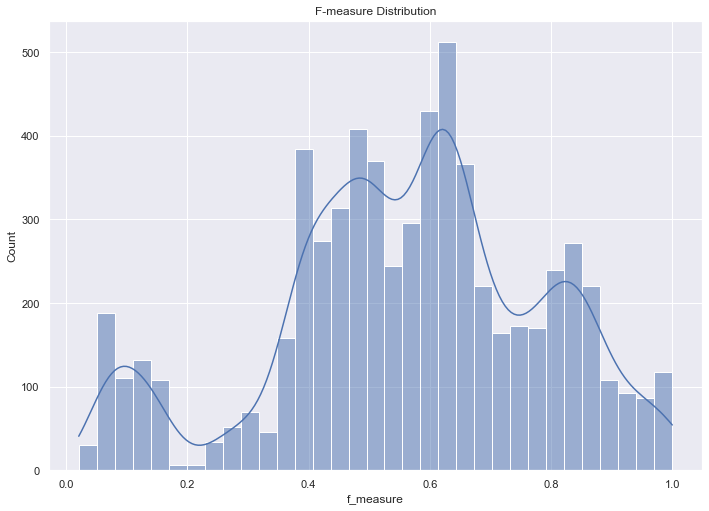

In [265]:
sns.histplot(results_finito2['f_measure'], kde=True).set(title='F-measure Distribution')
plt.show()


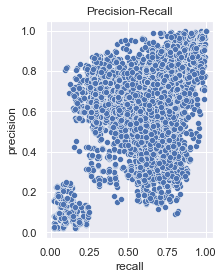

In [254]:
sns.scatterplot(x='recall', y='precision',data=results_finito2)
plt.title('Precision-Recall')
plt.show()

In [255]:
'''import matplotlib.pyplot as plt
import seaborn as sns

# Seaborn stilini ayarla
sns.set(style="whitegrid", context="talk")

# Varsayalım ki sonuçlarınız "results_finito" adlı DataFrame'de saklı.

# 1. Precision – Recall Scatter Plot (f_measure ile renk/boyut kodlaması)
plt.figure(figsize=(10, 6))
scatter = sns.scatterplot(
    data=results_finito,
    x="precision",
    y="recall",
    hue="f_measure",       # f_measure değerine göre renk
    size="f_measure",      # f_measure değerine göre nokta boyutu
    palette="viridis",
    sizes=(50, 300),
    alpha=0.8
)
plt.title("Precision - Recall Dağılımı (Renk/Boyut: f_measure)")
plt.xlabel("Precision")
plt.ylabel("Recall")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.tight_layout()
plt.show()
'''



'import matplotlib.pyplot as plt\nimport seaborn as sns\n\n# Seaborn stilini ayarla\nsns.set(style="whitegrid", context="talk")\n\n# Varsayalım ki sonuçlarınız "results_finito" adlı DataFrame\'de saklı.\n\n# 1. Precision – Recall Scatter Plot (f_measure ile renk/boyut kodlaması)\nplt.figure(figsize=(10, 6))\nscatter = sns.scatterplot(\n    data=results_finito,\n    x="precision",\n    y="recall",\n    hue="f_measure",       # f_measure değerine göre renk\n    size="f_measure",      # f_measure değerine göre nokta boyutu\n    palette="viridis",\n    sizes=(50, 300),\n    alpha=0.8\n)\nplt.title("Precision - Recall Dağılımı (Renk/Boyut: f_measure)")\nplt.xlabel("Precision")\nplt.ylabel("Recall")\nplt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)\nplt.tight_layout()\nplt.show()\n'

In [256]:
results_finito2.head()

,f_measure,precision,recall,vcf1,vcf2,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration
0,1.0000,1.0000,1.0000,147,147,BWA,Mutect,LL,YES,YES,BWA,Mutect,LL,YES,YES
1,0.7894,0.6939,0.9153,147,148,BWA,Mutect,LL,YES,YES,BWA,Mutect,EA,YES,YES
2,0.8266,0.7608,0.9048,147,150,BWA,Mutect,LL,YES,YES,BWA,Mutect,NC,YES,YES
3,0.9107,0.8496,0.9812,147,153,BWA,Mutect,LL,YES,YES,BWA,Mutect,LL,NO,NO
4,0.7858,0.6873,0.9174,147,154,BWA,Mutect,LL,YES,YES,BWA,Mutect,EA,NO,NO


In [258]:
results_finito2['vcf1_label'] = (
    results_finito2['vcf1'].astype(str) +
    " (" + results_finito2['vcf1_Mapper'] + ", " +
    results_finito2['vcf1_VariantCaller'] + ", " +
    results_finito2['vcf1_isTrimmed'] + ", " +
    results_finito2['vcf1_baseRecalibration'] + ")"
)

results_finito2['vcf2_label'] = (
    results_finito2['vcf2'].astype(str) +
    " (" + results_finito2['vcf2_Mapper'] + ", " +
    results_finito2['vcf2_VariantCaller'] + ", " +
    results_finito2['vcf2_isTrimmed'] + ", " +
    results_finito2['vcf2_baseRecalibration'] + ")"
)

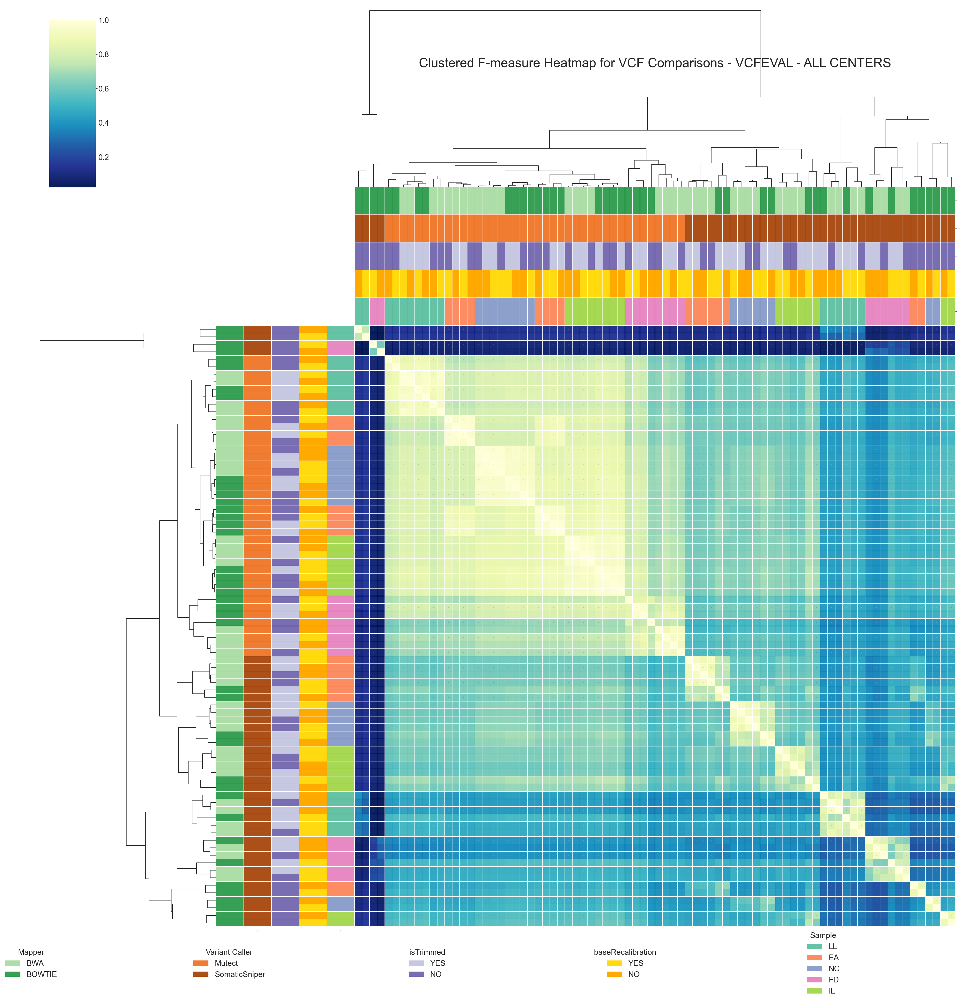

In [271]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Örnek pivot tablo oluşturma (f_measure için)
pivot_f = results_finito2.pivot('vcf1_label', 'vcf2_label', 'f_measure')

# Pivot tablodaki NaN değerlerini -1 ile dolduralım:
pivot_f = pivot_f.fillna(0)


# --- SATIR VE SÜTUN ETİKETLERİ İÇİN ÖZNİTELİK TABLOLARI ---
# Satırlar: vcf1_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
row_attrs = results_finito2.drop_duplicates("vcf1_label").set_index("vcf1_label")[
    ["vcf1_Mapper", "vcf1_VariantCaller", "vcf1_isTrimmed", "vcf1_baseRecalibration", "vcf1_Sample"]
]

# Sütunlar: vcf2_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
col_attrs = results_finito2.drop_duplicates("vcf2_label").set_index("vcf2_label")[
    ["vcf2_Mapper", "vcf2_VariantCaller", "vcf2_isTrimmed", "vcf2_baseRecalibration", "vcf2_Sample"]
]

# --- HER ÖZNİTELİK İÇİN RENK PALETLERİNİN OLUŞTURULMASI ---

# SATIRLAR İÇİN:
# Mapper
lut_mapper = dict(zip(row_attrs["vcf1_Mapper"].unique(), 
                      sns.color_palette("Greens", len(row_attrs["vcf1_Mapper"].unique()))))
row_colors_mapper = row_attrs["vcf1_Mapper"].map(lut_mapper)

# VariantCaller
lut_variant = dict(zip(row_attrs["vcf1_VariantCaller"].unique(), 
                       sns.color_palette("Oranges_d", len(row_attrs["vcf1_VariantCaller"].unique()))))
row_colors_variant = row_attrs["vcf1_VariantCaller"].map(lut_variant)

# isTrimmed
lut_trimmed = dict(zip(row_attrs["vcf1_isTrimmed"].unique(), 
                       sns.color_palette("Purples", len(row_attrs["vcf1_isTrimmed"].unique()))))
row_colors_trimmed = row_attrs["vcf1_isTrimmed"].map(lut_trimmed)

# baseRecalibration
lut_recal = dict(zip(row_attrs["vcf1_baseRecalibration"].unique(), 
                     sns.color_palette("Wistia", len(row_attrs["vcf1_baseRecalibration"].unique()))))
row_colors_recal = row_attrs["vcf1_baseRecalibration"].map(lut_recal)

# Yeni: Sample
lut_sample = dict(zip(row_attrs["vcf1_Sample"].unique(), 
                      sns.color_palette("Set2", len(row_attrs["vcf1_Sample"].unique()))))
row_colors_sample = row_attrs["vcf1_Sample"].map(lut_sample)

# Tüm satır renklerini birleştiriyoruz:
row_colors = pd.concat([row_colors_mapper, row_colors_variant, row_colors_trimmed, row_colors_recal, row_colors_sample], axis=1)

# SÜTUNLAR İÇİN:
# Mapper
lut_mapper2 = dict(zip(col_attrs["vcf2_Mapper"].unique(), 
                       sns.color_palette("Greens", len(col_attrs["vcf2_Mapper"].unique()))))
col_colors_mapper = col_attrs["vcf2_Mapper"].map(lut_mapper2)

# VariantCaller
lut_variant2 = dict(zip(col_attrs["vcf2_VariantCaller"].unique(), 
                        sns.color_palette("Oranges_d", len(col_attrs["vcf2_VariantCaller"].unique()))))
col_colors_variant = col_attrs["vcf2_VariantCaller"].map(lut_variant2)

# isTrimmed
lut_trimmed2 = dict(zip(col_attrs["vcf2_isTrimmed"].unique(), 
                        sns.color_palette("Purples", len(col_attrs["vcf2_isTrimmed"].unique()))))
col_colors_trimmed = col_attrs["vcf2_isTrimmed"].map(lut_trimmed2)

# baseRecalibration
lut_recal2 = dict(zip(col_attrs["vcf2_baseRecalibration"].unique(), 
                      sns.color_palette("Wistia", len(col_attrs["vcf2_baseRecalibration"].unique()))))
col_colors_recal = col_attrs["vcf2_baseRecalibration"].map(lut_recal2)

# Yeni: Sample
lut_sample2 = dict(zip(col_attrs["vcf2_Sample"].unique(), 
                       sns.color_palette("Set2", len(col_attrs["vcf2_Sample"].unique()))))
col_colors_sample = col_attrs["vcf2_Sample"].map(lut_sample2)

# Tüm sütun renklerini birleştiriyoruz:
col_colors = pd.concat([col_colors_mapper, col_colors_variant, col_colors_trimmed, col_colors_recal, col_colors_sample], axis=1)

# --- CLUSTERED HEATMAP OLUŞTURMA ---
sns.set(font_scale=0)
g = sns.clustermap(
    pivot_f,
    annot=True, 
    fmt=".1f",
    cmap="YlGnBu_r",
    linewidths=0.5,
    row_colors=row_colors,
    col_colors=col_colors,
    figsize=(50,50),
    xticklabels=False,  # Sütun etiketlerini kapatır
    yticklabels=False   # Satır etiketlerini kapatır
)
g.ax_heatmap.set_title('Clustered F-measure Heatmap for VCF Comparisons - VCFEVAL - ALL CENTERS', pad=1000, size=50)

g.cax.tick_params(labelsize=30)

# Dendrogram çizgilerinin kalınlığını arttırma:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)

# --- LEGEND OLUŞTURMA ---
# Legend için kullanılacak dictionary'ler ve başlıkları:
legend_dicts = [lut_mapper, lut_variant, lut_trimmed, lut_recal, lut_sample]
legend_titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "Sample"]
legend_params = {'fontsize': 30, 'title_fontsize': 30}

fig = g.fig
# 1 satırda 5 sütun olacak şekilde GridSpec (wspace ile boşluk ayarlanıyor)
gs = GridSpec(1, 5, figure=fig, wspace=0.5)
for i in range(5):
    ax = fig.add_subplot(gs[0, i])
    # Her legend için Patch objeleri oluşturuyoruz:
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=legend_titles[i], loc="center", frameon=False, bbox_to_anchor=(0, -0.04),prop={'size': 30}, **legend_params)
    ax.axis("off")

plt.savefig("Clustered_F-measure_Heatmap_with_Cluster_Colors_ALL_Centers.png", bbox_inches="tight")
plt.show()


# VCFEVAL INDELS

In [36]:
results_finito_indels = pd.DataFrame(columns=RESULTS_COLUMNS)


In [162]:
import os
import subprocess
import shutil
import pandas as pd
from itertools import product
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# Global cache'ler
disease_sample_cache_indels = {}
vcfeval_result_cache_indels = {}

# Execution mode flag (True: paralel, False: seri)
parallel_indels = False  # İstenirse True yapılabilir

# -------------------------------------------------------------------
# Varsayılan: vcfcomparison_df_full_indels, vcf_filenames_indels ve reference_sdf_indels önceden tanımlı
# Örnek:
#   vcfcomparison_df_full_indels = pd.read_csv("vcf_comparison_data.csv")
#   vcf_filenames_indels = { "1": "/path/to/vcf1", "2": "/path/to/vcf2", ... }
#   reference_sdf_indels = "/path/to/reference.sdf"
# -------------------------------------------------------------------

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames_indels: TestCaseNo ile vcf_filenames_indels sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames_indels = {
    str(tc_indels): vcf_filenames_indels[str(tc_indels)]
    for tc_indels in filtered_vcf_df_indels['TestCaseNo']
    if str(tc_indels) in vcf_filenames_indels
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map_indels = {
    str(row_indels['TestCaseNo']): row_indels['VariantCaller']
    for _, row_indels in filtered_vcf_df_indels.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Her iki VCF dosyası arasında karşılaştırma yapılıyor.
vcf_pairs_indels = [
    (key1_indels, vcf1_indels, key2_indels, vcf2_indels)
    for (key1_indels, vcf1_indels), (key2_indels, vcf2_indels) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# İsteğe bağlı: İlk 128 çifti sınırlayabilirsiniz:
# vcf_pairs_indels = vcf_pairs_indels[:128]


# -------------------------------------------------------------------
# Fonksiyonlar
# -------------------------------------------------------------------

def bgzip_and_index_indels(vcf_path_indels):
    """
    VCF dosyasını bgzip ile sıkıştırır ve tabix ile indeksler.
    Eğer vcf_path_indels+'.gz' dosyası zaten varsa, hiçbir işlem yapmaz.
    """
    gz_path = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path}"', shell=True, check=True)


def parse_summary_file_indels(summary_file_indels):
    """
    summary.txt dosyasını okuyup, f_measure, precision ve recall değerlerini sözlük olarak döndürür.
    Örneğin, summary.txt içeriği şu şekilde ise:
    
        Threshold  True-pos-baseline  True-pos-call  False-pos  False-neg  Precision  Sensitivity  F-measure
        ----------------------------------------------------------------------------------------------------
             None                  0              0          0        956        NaN       0.0000        NaN
             
    Bu durumda, parse edilen sözlükte bazı metrikler NaN olacaktır.
    """
    f_measure_indels, precision_indels, recall_indels = None, None, None

    if not os.path.exists(summary_file_indels):
        return None

    with open(summary_file_indels, 'r') as f_indels:
        lines_indels = f_indels.readlines()
        for line_indels in lines_indels:
            parts_indels = line_indels.strip().split()
            if len(parts_indels) > 6 and parts_indels[0] not in ['Threshold', '----------------------------------------------------------------------------------------------------']:
                try:
                    if parts_indels[0] == 'None':
                        # parts_indels[-3] => Precision, parts_indels[-2] => Sensitivity, parts_indels[-1] => F-measure
                        precision_indels = float(parts_indels[-3])
                        recall_indels    = float(parts_indels[-2])
                        f_measure_indels = float(parts_indels[-1])
                except ValueError:
                    continue

    return {'f_measure': f_measure_indels, 'precision': precision_indels, 'recall': recall_indels}


def _get_disease_sample_cached_indels(vcf_path_indels: str, variant_caller_indels: str, isBaseLine_indels: bool = True) -> str:
    """
    vcf_path_indels ve variant_caller_indels bilgisine göre bcftools ile sample listesini elde eder.
    Eğer sample sütunu boşsa "ALT" döner.
    Eğer isBaseLine_indels False ve variant caller "mutect" ise, sample listesindeki ikinci eleman (varsa) kullanılır.
    SomaticSniper için de ikinci sample tercih edilir.
    
    Ek olarak, bcftools sonucunda elde edilen sample değeri, eğer normal sample ise, aşağıdaki tabloda
    tanımlı aynı hasta grubunun TUMOR sample’ına dönüştürülür:
    
        LL    SRR7890851    NORMAL      ->  SRR7890850 (TUMOR)
        FD1   SRR7890880    NORMAL      ->  SRR7890879 (TUMOR)
        IL1   SRR7890874    NORMAL      ->  SRR7890883 (TUMOR)
        NC    SRR7890845    NORMAL      ->  SRR7890844 (TUMOR)
        EA    SRR7890919    NORMAL      ->  SRR7890918 (TUMOR)
    """
    cache_key_indels = (vcf_path_indels, variant_caller_indels, isBaseLine_indels)
    if cache_key_indels in disease_sample_cache_indels:
        return disease_sample_cache_indels[cache_key_indels]

    # Ensure the VCF file is bgzipped and indexed.
    bgzip_and_index_indels(vcf_path_indels)

    cmd_indels = ['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path_indels + '.gz']
    process_indels = subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE)
    decoded_output_indels = process_indels.stdout.decode('utf-8', errors='replace').strip()
    samples_indels = decoded_output_indels.split("\n") if decoded_output_indels else []

    if not samples_indels or (len(samples_indels) == 1 and samples_indels[0] == ''):
        sample_indels = "ALT"
    else:
        if not isBaseLine_indels and variant_caller_indels.lower() == 'mutect':
            sample_indels = samples_indels[1] if len(samples_indels) >= 2 else samples_indels[0]
        elif variant_caller_indels.lower() == 'somaticsniper':
            sample_indels = samples_indels[1] if len(samples_indels) >= 2 else samples_indels[0]
        elif variant_caller_indels.lower() == 'strelka':
            sample_indels = "ALT"
        else:
            sample_indels = samples_indels[1]

    # Normal sample’dan TUMOR sample’a dönüşümü sağlayan sözlük
    normal_to_tumor_indels = {
        "SRR7890851": "SRR7890850",  # LL: Normal -> Tumor
        "SRR7890880": "SRR7890879",  # FD1: Normal -> Tumor
        "SRR7890874": "SRR7890883",  # IL1: Normal -> Tumor
        "SRR7890845": "SRR7890844",  # NC: Normal -> Tumor
        "SRR7890919": "SRR7890918",  # EA: Normal -> Tumor
    }

    if sample_indels in normal_to_tumor_indels:
        sample_indels = normal_to_tumor_indels[sample_indels]

    disease_sample_cache_indels[cache_key_indels] = sample_indels
    return sample_indels


def run_vcfeval_if_not_exists_indels(vcf1_indels, vcf2_indels, output_dir_indels, variant_caller1_indels, variant_caller2_indels, progress_bar_indels=None):
    """
    İki VCF dosyası için vcfeval çalıştırır.
    Eğer summary.txt dosyası mevcutsa, parse edip döndürür;
    ancak parse edilen sonuçta herhangi bir metrik NaN ise,
    _get_disease_sample_cached_indels fonksiyonunda vcf2_indels için isBaseLine_indels=False kullanılarak alternatif sample seçimiyle,
    aynı output_dir_indels altında yeniden çalıştırılır.
    Sonuç cache'lenir.
    """
    cache_key_indels = (vcf1_indels, variant_caller1_indels, vcf2_indels, variant_caller2_indels)
    if cache_key_indels in vcfeval_result_cache_indels:
        return vcfeval_result_cache_indels[cache_key_indels]

    summary_file_indels = os.path.join(output_dir_indels, 'summary.txt')

    if os.path.exists(summary_file_indels):
        result_indels = parse_summary_file_indels(summary_file_indels)
        if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
            tqdm.write("NaN values found in summary.txt. Rerunning vcfeval with alternative sample selection.")
            if os.path.exists(output_dir_indels):
                shutil.rmtree(output_dir_indels)
            sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
            sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
            cmd_indels = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1_indels}.gz" '
                f'--calls "{vcf2_indels}.gz" '
                f'-o "{output_dir_indels}" '
                f'--squash-ploidy '
                f'--sample {sample1_indels},{sample2_indels}'
            )
            tqdm.write(cmd_indels)
            result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process_indels.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process_indels.returncode, cmd_indels,
                    output=result_process_indels.stdout, stderr=result_process_indels.stderr
                )
            result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
        vcfeval_result_cache_indels[cache_key_indels] = result_indels
        return result_indels

    if os.path.exists(output_dir_indels):
        shutil.rmtree(output_dir_indels)
    sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
    sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=True)
    cmd_indels = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1_indels}.gz" '
        f'--calls "{vcf2_indels}.gz" '
        f'-o "{output_dir_indels}" '
        f'--squash-ploidy '
        f'--sample {sample1_indels},{sample2_indels}'
    )
    tqdm.write(cmd_indels)
    result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result_process_indels.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
        raise subprocess.CalledProcessError(
            result_process_indels.returncode, cmd_indels,
            output=result_process_indels.stdout, stderr=result_process_indels.stderr
        )
    result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
        if os.path.exists(output_dir_indels):
            shutil.rmtree(output_dir_indels)
        sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
        sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
        cmd_indels = (
            f'rtg vcfeval '
            f'--template "{reference_sdf}" '
            f'--baseline "{vcf1_indels}.gz" '
            f'--calls "{vcf2_indels}.gz" '
            f'-o "{output_dir_indels}" '
            f'--squash-ploidy '
            f'--sample {sample1_indels},{sample2_indels}'
        )
        tqdm.write("Rerunning vcfeval with alternative sample selection:")
        tqdm.write(cmd_indels)
        result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        if result_process_indels.returncode != 0:
            tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
            raise subprocess.CalledProcessError(
                result_process_indels.returncode, cmd_indels,
                output=result_process_indels.stdout, stderr=result_process_indels.stderr
            )
        result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    vcfeval_result_cache_indels[cache_key_indels] = result_indels
    return result_indels

# -------------------------------------------------------------------
# MAIN
# -------------------------------------------------------------------

output_base_dir_indels = "vcf_evaluation_results_compare_all_indels"
os.makedirs(output_base_dir_indels, exist_ok=True)

results_list_indels = []

progress_bar_indels = tqdm(vcf_pairs_indels, desc="Comparing VCF files", ncols=100)
for key1_indels, vcf1_indels, key2_indels, vcf2_indels in progress_bar_indels:
    progress_bar_indels.set_description(f"Comparing {key1_indels} vs {key2_indels}")
    output_dir_indels = os.path.join(output_base_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    variant_caller1_indels = variant_caller_map_indels.get(key1_indels, 'default')
    variant_caller2_indels = variant_caller_map_indels.get(key2_indels, 'default')
    done_file_indels = os.path.join(output_dir_indels, 'done')

    if os.path.exists(done_file_indels):
        tqdm.write(f"Done file exists for {key1_indels} vs {key2_indels}. Retrieving results.")
        summary_path_indels = os.path.join(output_dir_indels, 'summary.txt')
        result_indels = parse_summary_file_indels(summary_path_indels)
        if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
            tqdm.write(f"NaN values found in summary.txt for {key1_indels} vs {key2_indels}. Rerunning vcfeval with alternative sample selection.")
            if os.path.exists(output_dir_indels):
                shutil.rmtree(output_dir_indels)
            sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
            sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
            cmd_indels = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1_indels}.gz" '
                f'--calls "{vcf2_indels}.gz" '
                f'-o "{output_dir_indels}" '
                f'--squash-ploidy '
                f'--sample {sample1_indels},{sample2_indels}'
            )
            tqdm.write(cmd_indels)
            result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process_indels.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process_indels.returncode, cmd_indels,
                    output=result_process_indels.stdout, stderr=result_process_indels.stderr
                )
            result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    else:
        if os.path.exists(output_dir_indels):
            tqdm.write(f"Directory exists for {key1_indels} vs {key2_indels}. Removing and recalculating.")
            shutil.rmtree(output_dir_indels)
        result_indels = run_vcfeval_if_not_exists_indels(vcf1_indels, vcf2_indels, output_dir_indels, variant_caller1_indels, variant_caller2_indels, progress_bar_indels)
    
    if result_indels:
        result_indels.update({'vcf1': key1_indels, 'vcf2': key2_indels})
        results_list_indels.append(result_indels)
    progress_bar_indels.update(1)

results_finito_indels = pd.DataFrame(results_list_indels)
print(results_finito_indels)


Comparing 1 vs 133:   1%|▏                                       | 36/6400 [00:00<00:37, 171.50it/s]

Done file exists for 1 vs 1. Retrieving results.
Done file exists for 1 vs 2. Retrieving results.
Done file exists for 1 vs 3. Retrieving results.
Done file exists for 1 vs 4. Retrieving results.
Done file exists for 1 vs 5. Retrieving results.
Done file exists for 1 vs 6. Retrieving results.
Done file exists for 1 vs 7. Retrieving results.
Done file exists for 1 vs 8. Retrieving results.
Done file exists for 1 vs 9. Retrieving results.
Done file exists for 1 vs 10. Retrieving results.
Done file exists for 1 vs 11. Retrieving results.
Done file exists for 1 vs 12. Retrieving results.
Done file exists for 1 vs 13. Retrieving results.
Done file exists for 1 vs 14. Retrieving results.
Done file exists for 1 vs 15. Retrieving results.
Done file exists for 1 vs 16. Retrieving results.
Done file exists for 1 vs 65. Retrieving results.
Done file exists for 1 vs 66. Retrieving results.
Done file exists for 1 vs 67. Retrieving results.
Done file exists for 1 vs 68. Retrieving results.
Done file

Comparing 1 vs 261:   1%|▍                                       | 68/6400 [00:00<00:38, 164.88it/s]

Done file exists for 1 vs 133. Retrieving results.
Done file exists for 1 vs 134. Retrieving results.
Done file exists for 1 vs 135. Retrieving results.
Done file exists for 1 vs 136. Retrieving results.
Done file exists for 1 vs 137. Retrieving results.
Done file exists for 1 vs 138. Retrieving results.
Done file exists for 1 vs 139. Retrieving results.
Done file exists for 1 vs 140. Retrieving results.
Done file exists for 1 vs 141. Retrieving results.
Done file exists for 1 vs 142. Retrieving results.
Done file exists for 1 vs 143. Retrieving results.
Done file exists for 1 vs 144. Retrieving results.
Done file exists for 1 vs 193. Retrieving results.
Done file exists for 1 vs 194. Retrieving results.
Done file exists for 1 vs 195. Retrieving results.
Done file exists for 1 vs 196. Retrieving results.
Done file exists for 1 vs 197. Retrieving results.
Done file exists for 1 vs 198. Retrieving results.
Done file exists for 1 vs 199. Retrieving results.
Done file exists for 1 vs 200. 

Comparing 2 vs 68:   2%|▋                                        | 99/6400 [00:00<00:38, 165.41it/s]

Done file exists for 1 vs 261. Retrieving results.
Done file exists for 1 vs 262. Retrieving results.
Done file exists for 1 vs 263. Retrieving results.
Done file exists for 1 vs 264. Retrieving results.
Done file exists for 1 vs 265. Retrieving results.
Done file exists for 1 vs 266. Retrieving results.
Done file exists for 1 vs 267. Retrieving results.
Done file exists for 1 vs 268. Retrieving results.
Done file exists for 1 vs 269. Retrieving results.
Done file exists for 1 vs 270. Retrieving results.
Done file exists for 1 vs 271. Retrieving results.
Done file exists for 1 vs 272. Retrieving results.
Done file exists for 2 vs 1. Retrieving results.
Done file exists for 2 vs 2. Retrieving results.
Done file exists for 2 vs 3. Retrieving results.
Done file exists for 2 vs 4. Retrieving results.
Done file exists for 2 vs 5. Retrieving results.
Done file exists for 2 vs 6. Retrieving results.
Done file exists for 2 vs 7. Retrieving results.
Done file exists for 2 vs 8. Retrieving resul

Comparing 2 vs 194:   2%|▊                                      | 129/6400 [00:00<00:40, 154.99it/s]

Done file exists for 2 vs 69. Retrieving results.
Done file exists for 2 vs 70. Retrieving results.
Done file exists for 2 vs 71. Retrieving results.
Done file exists for 2 vs 72. Retrieving results.
Done file exists for 2 vs 73. Retrieving results.
Done file exists for 2 vs 74. Retrieving results.
Done file exists for 2 vs 75. Retrieving results.
Done file exists for 2 vs 76. Retrieving results.
Done file exists for 2 vs 77. Retrieving results.
Done file exists for 2 vs 78. Retrieving results.
Done file exists for 2 vs 79. Retrieving results.
Done file exists for 2 vs 80. Retrieving results.
Done file exists for 2 vs 129. Retrieving results.
Done file exists for 2 vs 130. Retrieving results.
Done file exists for 2 vs 131. Retrieving results.
Done file exists for 2 vs 132. Retrieving results.
Done file exists for 2 vs 133. Retrieving results.
Done file exists for 2 vs 134. Retrieving results.
Done file exists for 2 vs 135. Retrieving results.
Done file exists for 2 vs 136. Retrieving r

Comparing 2 vs 271:   2%|▉                                      | 158/6400 [00:01<00:42, 147.21it/s]

Done file exists for 2 vs 195. Retrieving results.
Done file exists for 2 vs 196. Retrieving results.
Done file exists for 2 vs 197. Retrieving results.
Done file exists for 2 vs 198. Retrieving results.
Done file exists for 2 vs 199. Retrieving results.
Done file exists for 2 vs 200. Retrieving results.
Done file exists for 2 vs 201. Retrieving results.
Done file exists for 2 vs 202. Retrieving results.
Done file exists for 2 vs 203. Retrieving results.
Done file exists for 2 vs 204. Retrieving results.
Done file exists for 2 vs 205. Retrieving results.
Done file exists for 2 vs 206. Retrieving results.
Done file exists for 2 vs 207. Retrieving results.
Done file exists for 2 vs 208. Retrieving results.
Done file exists for 2 vs 257. Retrieving results.
Done file exists for 2 vs 258. Retrieving results.
Done file exists for 2 vs 259. Retrieving results.
Done file exists for 2 vs 260. Retrieving results.
Done file exists for 2 vs 261. Retrieving results.
Done file exists for 2 vs 262. 

Comparing 3 vs 74:   3%|█▏                                      | 185/6400 [00:01<00:43, 142.12it/s]

Done file exists for 2 vs 271. Retrieving results.
Done file exists for 2 vs 272. Retrieving results.
Done file exists for 3 vs 1. Retrieving results.
Done file exists for 3 vs 2. Retrieving results.
Done file exists for 3 vs 3. Retrieving results.
Done file exists for 3 vs 4. Retrieving results.
Done file exists for 3 vs 5. Retrieving results.
Done file exists for 3 vs 6. Retrieving results.
Done file exists for 3 vs 7. Retrieving results.
Done file exists for 3 vs 8. Retrieving results.
Done file exists for 3 vs 9. Retrieving results.
Done file exists for 3 vs 10. Retrieving results.
Done file exists for 3 vs 11. Retrieving results.
Done file exists for 3 vs 12. Retrieving results.
Done file exists for 3 vs 13. Retrieving results.
Done file exists for 3 vs 14. Retrieving results.
Done file exists for 3 vs 15. Retrieving results.
Done file exists for 3 vs 16. Retrieving results.
Done file exists for 3 vs 65. Retrieving results.
Done file exists for 3 vs 66. Retrieving results.
Done fi

Comparing 3 vs 195:   3%|█▎                                     | 210/6400 [00:01<00:47, 129.83it/s]

Done file exists for 3 vs 75. Retrieving results.
Done file exists for 3 vs 76. Retrieving results.
Done file exists for 3 vs 77. Retrieving results.
Done file exists for 3 vs 78. Retrieving results.
Done file exists for 3 vs 79. Retrieving results.
Done file exists for 3 vs 80. Retrieving results.
Done file exists for 3 vs 129. Retrieving results.
Done file exists for 3 vs 130. Retrieving results.
Done file exists for 3 vs 131. Retrieving results.
Done file exists for 3 vs 132. Retrieving results.
Done file exists for 3 vs 133. Retrieving results.
Done file exists for 3 vs 134. Retrieving results.
Done file exists for 3 vs 135. Retrieving results.
Done file exists for 3 vs 136. Retrieving results.
Done file exists for 3 vs 137. Retrieving results.
Done file exists for 3 vs 138. Retrieving results.
Done file exists for 3 vs 139. Retrieving results.
Done file exists for 3 vs 140. Retrieving results.
Done file exists for 3 vs 141. Retrieving results.
Done file exists for 3 vs 142. Retrie

Done file exists for 3 vs 195. Retrieving results.
Done file exists for 3 vs 196. Retrieving results.
Done file exists for 3 vs 197. Retrieving results.
Done file exists for 3 vs 198. Retrieving results.
Done file exists for 3 vs 199. Retrieving results.
Done file exists for 3 vs 200. Retrieving results.
Done file exists for 3 vs 201. Retrieving results.
Done file exists for 3 vs 202. Retrieving results.
Done file exists for 3 vs 203. Retrieving results.
Done file exists for 3 vs 204. Retrieving results.
Done file exists for 3 vs 205. Retrieving results.
Done file exists for 3 vs 206. Retrieving results.
Done file exists for 3 vs 207. Retrieving results.
Done file exists for 3 vs 208. Retrieving results.
Done file exists for 3 vs 257. Retrieving results.
Done file exists for 3 vs 258. Retrieving results.
Done file exists for 3 vs 259. Retrieving results.
Done file exists for 3 vs 260. Retrieving results.
Done file exists for 3 vs 261. Retrieving results.
Done file exists for 3 vs 262. 

Comparing 4 vs 74:   4%|█▋                                      | 265/6400 [00:01<00:47, 130.19it/s]


Done file exists for 3 vs 271. Retrieving results.
Done file exists for 3 vs 272. Retrieving results.
Done file exists for 4 vs 1. Retrieving results.
Done file exists for 4 vs 2. Retrieving results.
Done file exists for 4 vs 3. Retrieving results.
Done file exists for 4 vs 4. Retrieving results.
Done file exists for 4 vs 5. Retrieving results.
Done file exists for 4 vs 6. Retrieving results.
Done file exists for 4 vs 7. Retrieving results.
Done file exists for 4 vs 8. Retrieving results.
Done file exists for 4 vs 9. Retrieving results.
Done file exists for 4 vs 10. Retrieving results.
Done file exists for 4 vs 11. Retrieving results.
Done file exists for 4 vs 12. Retrieving results.
Done file exists for 4 vs 13. Retrieving results.
Done file exists for 4 vs 14. Retrieving results.
Done file exists for 4 vs 15. Retrieving results.
Done file exists for 4 vs 16. Retrieving results.
Done file exists for 4 vs 65. Retrieving results.
Done file exists for 4 vs 66. Retrieving results.
Done f

Comparing 4 vs 201:   5%|█▊                                     | 296/6400 [00:02<00:43, 140.87it/s]

Done file exists for 4 vs 75. Retrieving results.
Done file exists for 4 vs 76. Retrieving results.
Done file exists for 4 vs 77. Retrieving results.
Done file exists for 4 vs 78. Retrieving results.
Done file exists for 4 vs 79. Retrieving results.
Done file exists for 4 vs 80. Retrieving results.
Done file exists for 4 vs 129. Retrieving results.
Done file exists for 4 vs 130. Retrieving results.
Done file exists for 4 vs 131. Retrieving results.
Done file exists for 4 vs 132. Retrieving results.
Done file exists for 4 vs 133. Retrieving results.
Done file exists for 4 vs 134. Retrieving results.
Done file exists for 4 vs 135. Retrieving results.
Done file exists for 4 vs 136. Retrieving results.
Done file exists for 4 vs 137. Retrieving results.
Done file exists for 4 vs 138. Retrieving results.
Done file exists for 4 vs 139. Retrieving results.
Done file exists for 4 vs 140. Retrieving results.
Done file exists for 4 vs 141. Retrieving results.
Done file exists for 4 vs 142. Retrie

Comparing 5 vs 9:   5%|██                                       | 328/6400 [00:02<00:41, 146.55it/s]

Done file exists for 4 vs 202. Retrieving results.
Done file exists for 4 vs 203. Retrieving results.
Done file exists for 4 vs 204. Retrieving results.
Done file exists for 4 vs 205. Retrieving results.
Done file exists for 4 vs 206. Retrieving results.
Done file exists for 4 vs 207. Retrieving results.
Done file exists for 4 vs 208. Retrieving results.
Done file exists for 4 vs 257. Retrieving results.
Done file exists for 4 vs 258. Retrieving results.
Done file exists for 4 vs 259. Retrieving results.
Done file exists for 4 vs 260. Retrieving results.
Done file exists for 4 vs 261. Retrieving results.
Done file exists for 4 vs 262. Retrieving results.
Done file exists for 4 vs 263. Retrieving results.
Done file exists for 4 vs 264. Retrieving results.
Done file exists for 4 vs 265. Retrieving results.
Done file exists for 4 vs 266. Retrieving results.
Done file exists for 4 vs 267. Retrieving results.
Done file exists for 4 vs 268. Retrieving results.
Done file exists for 4 vs 269. 

Done file exists for 5 vs 10. Retrieving results.
Done file exists for 5 vs 11. Retrieving results.
Done file exists for 5 vs 12. Retrieving results.
Done file exists for 5 vs 13. Retrieving results.
Done file exists for 5 vs 14. Retrieving results.
Done file exists for 5 vs 15. Retrieving results.
Done file exists for 5 vs 16. Retrieving results.
Done file exists for 5 vs 65. Retrieving results.
Done file exists for 5 vs 66. Retrieving results.
Done file exists for 5 vs 67. Retrieving results.
Done file exists for 5 vs 68. Retrieving results.
Done file exists for 5 vs 69. Retrieving results.
Done file exists for 5 vs 70. Retrieving results.
Done file exists for 5 vs 71. Retrieving results.
Done file exists for 5 vs 72. Retrieving results.
Done file exists for 5 vs 73. Retrieving results.
Done file exists for 5 vs 74. Retrieving results.
Done file exists for 5 vs 75. Retrieving results.
Done file exists for 5 vs 76. Retrieving results.
Done file exists for 5 vs 77. Retrieving results.


Comparing 5 vs 259:   6%|██▎                                    | 386/6400 [00:02<00:41, 143.24it/s]

Done file exists for 5 vs 135. Retrieving results.
Done file exists for 5 vs 136. Retrieving results.
Done file exists for 5 vs 137. Retrieving results.
Done file exists for 5 vs 138. Retrieving results.
Done file exists for 5 vs 139. Retrieving results.
Done file exists for 5 vs 140. Retrieving results.
Done file exists for 5 vs 141. Retrieving results.
Done file exists for 5 vs 142. Retrieving results.
Done file exists for 5 vs 143. Retrieving results.
Done file exists for 5 vs 144. Retrieving results.
Done file exists for 5 vs 193. Retrieving results.
Done file exists for 5 vs 194. Retrieving results.
Done file exists for 5 vs 195. Retrieving results.
Done file exists for 5 vs 196. Retrieving results.
Done file exists for 5 vs 197. Retrieving results.
Done file exists for 5 vs 198. Retrieving results.
Done file exists for 5 vs 199. Retrieving results.
Done file exists for 5 vs 200. Retrieving results.
Done file exists for 5 vs 201. Retrieving results.
Done file exists for 5 vs 202. 

Comparing 6 vs 14:   6%|██▌                                     | 413/6400 [00:02<00:44, 133.50it/s]

Done file exists for 5 vs 259. Retrieving results.
Done file exists for 5 vs 260. Retrieving results.
Done file exists for 5 vs 261. Retrieving results.
Done file exists for 5 vs 262. Retrieving results.
Done file exists for 5 vs 263. Retrieving results.
Done file exists for 5 vs 264. Retrieving results.
Done file exists for 5 vs 265. Retrieving results.
Done file exists for 5 vs 266. Retrieving results.
Done file exists for 5 vs 267. Retrieving results.
Done file exists for 5 vs 268. Retrieving results.
Done file exists for 5 vs 269. Retrieving results.
Done file exists for 5 vs 270. Retrieving results.
Done file exists for 5 vs 271. Retrieving results.
Done file exists for 5 vs 272. Retrieving results.
Done file exists for 6 vs 1. Retrieving results.
Done file exists for 6 vs 2. Retrieving results.
Done file exists for 6 vs 3. Retrieving results.
Done file exists for 6 vs 4. Retrieving results.
Done file exists for 6 vs 5. Retrieving results.
Done file exists for 6 vs 6. Retrieving r

Comparing 6 vs 139:   7%|██▋                                    | 442/6400 [00:03<00:42, 140.87it/s]

Done file exists for 6 vs 14. Retrieving results.
Done file exists for 6 vs 15. Retrieving results.
Done file exists for 6 vs 16. Retrieving results.
Done file exists for 6 vs 65. Retrieving results.
Done file exists for 6 vs 66. Retrieving results.
Done file exists for 6 vs 67. Retrieving results.
Done file exists for 6 vs 68. Retrieving results.
Done file exists for 6 vs 69. Retrieving results.
Done file exists for 6 vs 70. Retrieving results.
Done file exists for 6 vs 71. Retrieving results.
Done file exists for 6 vs 72. Retrieving results.
Done file exists for 6 vs 73. Retrieving results.
Done file exists for 6 vs 74. Retrieving results.
Done file exists for 6 vs 75. Retrieving results.
Done file exists for 6 vs 76. Retrieving results.
Done file exists for 6 vs 77. Retrieving results.
Done file exists for 6 vs 78. Retrieving results.
Done file exists for 6 vs 79. Retrieving results.
Done file exists for 6 vs 80. Retrieving results.
Done file exists for 6 vs 129. Retrieving results.

Comparing 6 vs 265:   7%|██▉                                    | 472/6400 [00:03<00:41, 143.84it/s]

Done file exists for 6 vs 139. Retrieving results.
Done file exists for 6 vs 140. Retrieving results.
Done file exists for 6 vs 141. Retrieving results.
Done file exists for 6 vs 142. Retrieving results.
Done file exists for 6 vs 143. Retrieving results.
Done file exists for 6 vs 144. Retrieving results.
Done file exists for 6 vs 193. Retrieving results.
Done file exists for 6 vs 194. Retrieving results.
Done file exists for 6 vs 195. Retrieving results.
Done file exists for 6 vs 196. Retrieving results.
Done file exists for 6 vs 197. Retrieving results.
Done file exists for 6 vs 198. Retrieving results.
Done file exists for 6 vs 199. Retrieving results.
Done file exists for 6 vs 200. Retrieving results.
Done file exists for 6 vs 201. Retrieving results.
Done file exists for 6 vs 202. Retrieving results.
Done file exists for 6 vs 203. Retrieving results.
Done file exists for 6 vs 204. Retrieving results.
Done file exists for 6 vs 205. Retrieving results.
Done file exists for 6 vs 206. 

Comparing 7 vs 70:   8%|███▏                                    | 501/6400 [00:03<00:40, 145.84it/s]

Done file exists for 6 vs 265. Retrieving results.
Done file exists for 6 vs 266. Retrieving results.
Done file exists for 6 vs 267. Retrieving results.
Done file exists for 6 vs 268. Retrieving results.
Done file exists for 6 vs 269. Retrieving results.
Done file exists for 6 vs 270. Retrieving results.
Done file exists for 6 vs 271. Retrieving results.
Done file exists for 6 vs 272. Retrieving results.
Done file exists for 7 vs 1. Retrieving results.
Done file exists for 7 vs 2. Retrieving results.
Done file exists for 7 vs 3. Retrieving results.
Done file exists for 7 vs 4. Retrieving results.
Done file exists for 7 vs 5. Retrieving results.
Done file exists for 7 vs 6. Retrieving results.
Done file exists for 7 vs 7. Retrieving results.
Done file exists for 7 vs 8. Retrieving results.
Done file exists for 7 vs 9. Retrieving results.
Done file exists for 7 vs 10. Retrieving results.
Done file exists for 7 vs 11. Retrieving results.
Done file exists for 7 vs 12. Retrieving results.
D

Comparing 7 vs 133:   8%|███▏                                   | 516/6400 [00:03<00:40, 144.76it/s]

Done file exists for 7 vs 71. Retrieving results.
Done file exists for 7 vs 72. Retrieving results.
Done file exists for 7 vs 73. Retrieving results.
Done file exists for 7 vs 74. Retrieving results.
Done file exists for 7 vs 75. Retrieving results.
Done file exists for 7 vs 76. Retrieving results.
Done file exists for 7 vs 77. Retrieving results.
Done file exists for 7 vs 78. Retrieving results.
Done file exists for 7 vs 79. Retrieving results.
Done file exists for 7 vs 80. Retrieving results.
Done file exists for 7 vs 129. Retrieving results.
Done file exists for 7 vs 130. Retrieving results.
Done file exists for 7 vs 131. Retrieving results.
Done file exists for 7 vs 132. Retrieving results.
Done file exists for 7 vs 133. Retrieving results.


Comparing 7 vs 257:   8%|███▎                                   | 544/6400 [00:03<00:49, 117.52it/s]

Done file exists for 7 vs 134. Retrieving results.
Done file exists for 7 vs 135. Retrieving results.
Done file exists for 7 vs 136. Retrieving results.
Done file exists for 7 vs 137. Retrieving results.
Done file exists for 7 vs 138. Retrieving results.
Done file exists for 7 vs 139. Retrieving results.
Done file exists for 7 vs 140. Retrieving results.
Done file exists for 7 vs 141. Retrieving results.
Done file exists for 7 vs 142. Retrieving results.
Done file exists for 7 vs 143. Retrieving results.
Done file exists for 7 vs 144. Retrieving results.
Done file exists for 7 vs 193. Retrieving results.
Done file exists for 7 vs 194. Retrieving results.
Done file exists for 7 vs 195. Retrieving results.
Done file exists for 7 vs 196. Retrieving results.
Done file exists for 7 vs 197. Retrieving results.
Done file exists for 7 vs 198. Retrieving results.
Done file exists for 7 vs 199. Retrieving results.
Done file exists for 7 vs 200. Retrieving results.
Done file exists for 7 vs 201. 

Comparing 8 vs 14:   9%|███▌                                    | 573/6400 [00:04<00:46, 126.14it/s]

Done file exists for 7 vs 257. Retrieving results.
Done file exists for 7 vs 258. Retrieving results.
Done file exists for 7 vs 259. Retrieving results.
Done file exists for 7 vs 260. Retrieving results.
Done file exists for 7 vs 261. Retrieving results.
Done file exists for 7 vs 262. Retrieving results.
Done file exists for 7 vs 263. Retrieving results.
Done file exists for 7 vs 264. Retrieving results.
Done file exists for 7 vs 265. Retrieving results.
Done file exists for 7 vs 266. Retrieving results.
Done file exists for 7 vs 267. Retrieving results.
Done file exists for 7 vs 268. Retrieving results.
Done file exists for 7 vs 269. Retrieving results.
Done file exists for 7 vs 270. Retrieving results.
Done file exists for 7 vs 271. Retrieving results.
Done file exists for 7 vs 272. Retrieving results.
Done file exists for 8 vs 1. Retrieving results.
Done file exists for 8 vs 2. Retrieving results.
Done file exists for 8 vs 3. Retrieving results.
Done file exists for 8 vs 4. Retrievi

Comparing 8 vs 140:   9%|███▋                                   | 603/6400 [00:04<00:42, 137.55it/s]

Done file exists for 8 vs 14. Retrieving results.
Done file exists for 8 vs 15. Retrieving results.
Done file exists for 8 vs 16. Retrieving results.
Done file exists for 8 vs 65. Retrieving results.
Done file exists for 8 vs 66. Retrieving results.
Done file exists for 8 vs 67. Retrieving results.
Done file exists for 8 vs 68. Retrieving results.
Done file exists for 8 vs 69. Retrieving results.
Done file exists for 8 vs 70. Retrieving results.
Done file exists for 8 vs 71. Retrieving results.
Done file exists for 8 vs 72. Retrieving results.
Done file exists for 8 vs 73. Retrieving results.
Done file exists for 8 vs 74. Retrieving results.
Done file exists for 8 vs 75. Retrieving results.
Done file exists for 8 vs 76. Retrieving results.
Done file exists for 8 vs 77. Retrieving results.
Done file exists for 8 vs 78. Retrieving results.
Done file exists for 8 vs 79. Retrieving results.
Done file exists for 8 vs 80. Retrieving results.
Done file exists for 8 vs 129. Retrieving results.

Comparing 8 vs 266:  10%|███▊                                   | 633/6400 [00:04<00:40, 143.27it/s]

Done file exists for 8 vs 140. Retrieving results.
Done file exists for 8 vs 141. Retrieving results.
Done file exists for 8 vs 142. Retrieving results.
Done file exists for 8 vs 143. Retrieving results.
Done file exists for 8 vs 144. Retrieving results.
Done file exists for 8 vs 193. Retrieving results.
Done file exists for 8 vs 194. Retrieving results.
Done file exists for 8 vs 195. Retrieving results.
Done file exists for 8 vs 196. Retrieving results.
Done file exists for 8 vs 197. Retrieving results.
Done file exists for 8 vs 198. Retrieving results.
Done file exists for 8 vs 199. Retrieving results.
Done file exists for 8 vs 200. Retrieving results.
Done file exists for 8 vs 201. Retrieving results.
Done file exists for 8 vs 202. Retrieving results.
Done file exists for 8 vs 203. Retrieving results.
Done file exists for 8 vs 204. Retrieving results.
Done file exists for 8 vs 205. Retrieving results.
Done file exists for 8 vs 206. Retrieving results.
Done file exists for 8 vs 207. 

Comparing 9 vs 73:  10%|████▏                                   | 664/6400 [00:04<00:39, 146.07it/s]

Done file exists for 8 vs 267. Retrieving results.
Done file exists for 8 vs 268. Retrieving results.
Done file exists for 8 vs 269. Retrieving results.
Done file exists for 8 vs 270. Retrieving results.
Done file exists for 8 vs 271. Retrieving results.
Done file exists for 8 vs 272. Retrieving results.
Done file exists for 9 vs 1. Retrieving results.
Done file exists for 9 vs 2. Retrieving results.
Done file exists for 9 vs 3. Retrieving results.
Done file exists for 9 vs 4. Retrieving results.
Done file exists for 9 vs 5. Retrieving results.
Done file exists for 9 vs 6. Retrieving results.
Done file exists for 9 vs 7. Retrieving results.
Done file exists for 9 vs 8. Retrieving results.
Done file exists for 9 vs 9. Retrieving results.
Done file exists for 9 vs 10. Retrieving results.
Done file exists for 9 vs 11. Retrieving results.
Done file exists for 9 vs 12. Retrieving results.
Done file exists for 9 vs 13. Retrieving results.
Done file exists for 9 vs 14. Retrieving results.
Don

Comparing 9 vs 199:  11%|████▏                                  | 694/6400 [00:04<00:39, 146.30it/s]

Done file exists for 9 vs 74. Retrieving results.
Done file exists for 9 vs 75. Retrieving results.
Done file exists for 9 vs 76. Retrieving results.
Done file exists for 9 vs 77. Retrieving results.
Done file exists for 9 vs 78. Retrieving results.
Done file exists for 9 vs 79. Retrieving results.
Done file exists for 9 vs 80. Retrieving results.
Done file exists for 9 vs 129. Retrieving results.
Done file exists for 9 vs 130. Retrieving results.
Done file exists for 9 vs 131. Retrieving results.
Done file exists for 9 vs 132. Retrieving results.
Done file exists for 9 vs 133. Retrieving results.
Done file exists for 9 vs 134. Retrieving results.
Done file exists for 9 vs 135. Retrieving results.
Done file exists for 9 vs 136. Retrieving results.
Done file exists for 9 vs 137. Retrieving results.
Done file exists for 9 vs 138. Retrieving results.
Done file exists for 9 vs 139. Retrieving results.
Done file exists for 9 vs 140. Retrieving results.
Done file exists for 9 vs 141. Retriev

Comparing 10 vs 7:  11%|████▌                                   | 726/6400 [00:05<00:37, 150.87it/s]

Done file exists for 9 vs 200. Retrieving results.
Done file exists for 9 vs 201. Retrieving results.
Done file exists for 9 vs 202. Retrieving results.
Done file exists for 9 vs 203. Retrieving results.
Done file exists for 9 vs 204. Retrieving results.
Done file exists for 9 vs 205. Retrieving results.
Done file exists for 9 vs 206. Retrieving results.
Done file exists for 9 vs 207. Retrieving results.
Done file exists for 9 vs 208. Retrieving results.
Done file exists for 9 vs 257. Retrieving results.
Done file exists for 9 vs 258. Retrieving results.
Done file exists for 9 vs 259. Retrieving results.
Done file exists for 9 vs 260. Retrieving results.
Done file exists for 9 vs 261. Retrieving results.
Done file exists for 9 vs 262. Retrieving results.
Done file exists for 9 vs 263. Retrieving results.
Done file exists for 9 vs 264. Retrieving results.
Done file exists for 9 vs 265. Retrieving results.
Done file exists for 9 vs 266. Retrieving results.
Done file exists for 9 vs 267. 

Comparing 10 vs 134:  12%|████▌                                 | 758/6400 [00:05<00:37, 149.91it/s]

Done file exists for 10 vs 8. Retrieving results.
Done file exists for 10 vs 9. Retrieving results.
Done file exists for 10 vs 10. Retrieving results.
Done file exists for 10 vs 11. Retrieving results.
Done file exists for 10 vs 12. Retrieving results.
Done file exists for 10 vs 13. Retrieving results.
Done file exists for 10 vs 14. Retrieving results.
Done file exists for 10 vs 15. Retrieving results.
Done file exists for 10 vs 16. Retrieving results.
Done file exists for 10 vs 65. Retrieving results.
Done file exists for 10 vs 66. Retrieving results.
Done file exists for 10 vs 67. Retrieving results.
Done file exists for 10 vs 68. Retrieving results.
Done file exists for 10 vs 69. Retrieving results.
Done file exists for 10 vs 70. Retrieving results.
Done file exists for 10 vs 71. Retrieving results.
Done file exists for 10 vs 72. Retrieving results.
Done file exists for 10 vs 73. Retrieving results.
Done file exists for 10 vs 74. Retrieving results.
Done file exists for 10 vs 75. Re

Done file exists for 10 vs 135. Retrieving results.
Done file exists for 10 vs 136. Retrieving results.
Done file exists for 10 vs 137. Retrieving results.
Done file exists for 10 vs 138. Retrieving results.
Done file exists for 10 vs 139. Retrieving results.
Done file exists for 10 vs 140. Retrieving results.
Done file exists for 10 vs 141. Retrieving results.
Done file exists for 10 vs 142. Retrieving results.
Done file exists for 10 vs 143. Retrieving results.
Done file exists for 10 vs 144. Retrieving results.
Done file exists for 10 vs 193. Retrieving results.
Done file exists for 10 vs 194. Retrieving results.
Done file exists for 10 vs 195. Retrieving results.
Done file exists for 10 vs 196. Retrieving results.
Done file exists for 10 vs 197. Retrieving results.
Done file exists for 10 vs 198. Retrieving results.
Done file exists for 10 vs 199. Retrieving results.
Done file exists for 10 vs 200. Retrieving results.
Done file exists for 10 vs 201. Retrieving results.
Done file ex

Comparing 11 vs 66:  13%|████▉                                  | 817/6400 [00:05<00:37, 147.85it/s]

Done file exists for 10 vs 260. Retrieving results.
Done file exists for 10 vs 261. Retrieving results.
Done file exists for 10 vs 262. Retrieving results.
Done file exists for 10 vs 263. Retrieving results.
Done file exists for 10 vs 264. Retrieving results.
Done file exists for 10 vs 265. Retrieving results.
Done file exists for 10 vs 266. Retrieving results.
Done file exists for 10 vs 267. Retrieving results.
Done file exists for 10 vs 268. Retrieving results.
Done file exists for 10 vs 269. Retrieving results.
Done file exists for 10 vs 270. Retrieving results.
Done file exists for 10 vs 271. Retrieving results.
Done file exists for 10 vs 272. Retrieving results.
Done file exists for 11 vs 1. Retrieving results.
Done file exists for 11 vs 2. Retrieving results.
Done file exists for 11 vs 3. Retrieving results.
Done file exists for 11 vs 4. Retrieving results.
Done file exists for 11 vs 5. Retrieving results.
Done file exists for 11 vs 6. Retrieving results.
Done file exists for 11 

Comparing 11 vs 193:  13%|█████                                 | 848/6400 [00:05<00:37, 147.37it/s]

Done file exists for 11 vs 67. Retrieving results.
Done file exists for 11 vs 68. Retrieving results.
Done file exists for 11 vs 69. Retrieving results.
Done file exists for 11 vs 70. Retrieving results.
Done file exists for 11 vs 71. Retrieving results.
Done file exists for 11 vs 72. Retrieving results.
Done file exists for 11 vs 73. Retrieving results.
Done file exists for 11 vs 74. Retrieving results.
Done file exists for 11 vs 75. Retrieving results.
Done file exists for 11 vs 76. Retrieving results.
Done file exists for 11 vs 77. Retrieving results.
Done file exists for 11 vs 78. Retrieving results.
Done file exists for 11 vs 79. Retrieving results.
Done file exists for 11 vs 80. Retrieving results.
Done file exists for 11 vs 129. Retrieving results.
Done file exists for 11 vs 130. Retrieving results.
Done file exists for 11 vs 131. Retrieving results.
Done file exists for 11 vs 132. Retrieving results.
Done file exists for 11 vs 133. Retrieving results.
Done file exists for 11 vs

Comparing 11 vs 270:  14%|█████▏                                | 877/6400 [00:06<00:37, 146.51it/s]

Done file exists for 11 vs 194. Retrieving results.
Done file exists for 11 vs 195. Retrieving results.
Done file exists for 11 vs 196. Retrieving results.
Done file exists for 11 vs 197. Retrieving results.
Done file exists for 11 vs 198. Retrieving results.
Done file exists for 11 vs 199. Retrieving results.
Done file exists for 11 vs 200. Retrieving results.
Done file exists for 11 vs 201. Retrieving results.
Done file exists for 11 vs 202. Retrieving results.
Done file exists for 11 vs 203. Retrieving results.
Done file exists for 11 vs 204. Retrieving results.
Done file exists for 11 vs 205. Retrieving results.
Done file exists for 11 vs 206. Retrieving results.
Done file exists for 11 vs 207. Retrieving results.
Done file exists for 11 vs 208. Retrieving results.
Done file exists for 11 vs 257. Retrieving results.
Done file exists for 11 vs 258. Retrieving results.
Done file exists for 11 vs 259. Retrieving results.
Done file exists for 11 vs 260. Retrieving results.
Done file ex

Comparing 12 vs 75:  14%|█████▌                                 | 906/6400 [00:06<00:38, 142.82it/s]

Done file exists for 11 vs 270. Retrieving results.
Done file exists for 11 vs 271. Retrieving results.
Done file exists for 11 vs 272. Retrieving results.
Done file exists for 12 vs 1. Retrieving results.
Done file exists for 12 vs 2. Retrieving results.
Done file exists for 12 vs 3. Retrieving results.
Done file exists for 12 vs 4. Retrieving results.
Done file exists for 12 vs 5. Retrieving results.
Done file exists for 12 vs 6. Retrieving results.
Done file exists for 12 vs 7. Retrieving results.
Done file exists for 12 vs 8. Retrieving results.
Done file exists for 12 vs 9. Retrieving results.
Done file exists for 12 vs 10. Retrieving results.
Done file exists for 12 vs 11. Retrieving results.
Done file exists for 12 vs 12. Retrieving results.
Done file exists for 12 vs 13. Retrieving results.
Done file exists for 12 vs 14. Retrieving results.
Done file exists for 12 vs 15. Retrieving results.
Done file exists for 12 vs 16. Retrieving results.
Done file exists for 12 vs 65. Retrie

Comparing 12 vs 201:  15%|█████▌                                | 936/6400 [00:06<00:37, 144.58it/s]

Done file exists for 12 vs 76. Retrieving results.
Done file exists for 12 vs 77. Retrieving results.
Done file exists for 12 vs 78. Retrieving results.
Done file exists for 12 vs 79. Retrieving results.
Done file exists for 12 vs 80. Retrieving results.
Done file exists for 12 vs 129. Retrieving results.
Done file exists for 12 vs 130. Retrieving results.
Done file exists for 12 vs 131. Retrieving results.
Done file exists for 12 vs 132. Retrieving results.
Done file exists for 12 vs 133. Retrieving results.
Done file exists for 12 vs 134. Retrieving results.
Done file exists for 12 vs 135. Retrieving results.
Done file exists for 12 vs 136. Retrieving results.
Done file exists for 12 vs 137. Retrieving results.
Done file exists for 12 vs 138. Retrieving results.
Done file exists for 12 vs 139. Retrieving results.
Done file exists for 12 vs 140. Retrieving results.
Done file exists for 12 vs 141. Retrieving results.
Done file exists for 12 vs 142. Retrieving results.
Done file exists 

Comparing 13 vs 6:  15%|██████                                  | 965/6400 [00:06<00:37, 145.54it/s]

Done file exists for 12 vs 201. Retrieving results.
Done file exists for 12 vs 202. Retrieving results.
Done file exists for 12 vs 203. Retrieving results.
Done file exists for 12 vs 204. Retrieving results.
Done file exists for 12 vs 205. Retrieving results.
Done file exists for 12 vs 206. Retrieving results.
Done file exists for 12 vs 207. Retrieving results.
Done file exists for 12 vs 208. Retrieving results.
Done file exists for 12 vs 257. Retrieving results.
Done file exists for 12 vs 258. Retrieving results.
Done file exists for 12 vs 259. Retrieving results.
Done file exists for 12 vs 260. Retrieving results.
Done file exists for 12 vs 261. Retrieving results.
Done file exists for 12 vs 262. Retrieving results.
Done file exists for 12 vs 263. Retrieving results.
Done file exists for 12 vs 264. Retrieving results.
Done file exists for 12 vs 265. Retrieving results.
Done file exists for 12 vs 266. Retrieving results.
Done file exists for 12 vs 267. Retrieving results.
Done file ex

Comparing 13 vs 131:  16%|█████▉                                | 994/6400 [00:06<00:37, 144.00it/s]

Done file exists for 13 vs 7. Retrieving results.
Done file exists for 13 vs 8. Retrieving results.
Done file exists for 13 vs 9. Retrieving results.
Done file exists for 13 vs 10. Retrieving results.
Done file exists for 13 vs 11. Retrieving results.
Done file exists for 13 vs 12. Retrieving results.
Done file exists for 13 vs 13. Retrieving results.
Done file exists for 13 vs 14. Retrieving results.
Done file exists for 13 vs 15. Retrieving results.
Done file exists for 13 vs 16. Retrieving results.
Done file exists for 13 vs 65. Retrieving results.
Done file exists for 13 vs 66. Retrieving results.
Done file exists for 13 vs 67. Retrieving results.
Done file exists for 13 vs 68. Retrieving results.
Done file exists for 13 vs 69. Retrieving results.
Done file exists for 13 vs 70. Retrieving results.
Done file exists for 13 vs 71. Retrieving results.
Done file exists for 13 vs 72. Retrieving results.
Done file exists for 13 vs 73. Retrieving results.
Done file exists for 13 vs 74. Ret

Comparing 13 vs 257:  16%|█████▉                               | 1024/6400 [00:07<00:37, 142.50it/s]

Done file exists for 13 vs 132. Retrieving results.
Done file exists for 13 vs 133. Retrieving results.
Done file exists for 13 vs 134. Retrieving results.
Done file exists for 13 vs 135. Retrieving results.
Done file exists for 13 vs 136. Retrieving results.
Done file exists for 13 vs 137. Retrieving results.
Done file exists for 13 vs 138. Retrieving results.
Done file exists for 13 vs 139. Retrieving results.
Done file exists for 13 vs 140. Retrieving results.
Done file exists for 13 vs 141. Retrieving results.
Done file exists for 13 vs 142. Retrieving results.
Done file exists for 13 vs 143. Retrieving results.
Done file exists for 13 vs 144. Retrieving results.
Done file exists for 13 vs 193. Retrieving results.
Done file exists for 13 vs 194. Retrieving results.
Done file exists for 13 vs 195. Retrieving results.
Done file exists for 13 vs 196. Retrieving results.
Done file exists for 13 vs 197. Retrieving results.
Done file exists for 13 vs 198. Retrieving results.
Done file ex

Done file exists for 13 vs 257. Retrieving results.
Done file exists for 13 vs 258. Retrieving results.
Done file exists for 13 vs 259. Retrieving results.
Done file exists for 13 vs 260. Retrieving results.
Done file exists for 13 vs 261. Retrieving results.
Done file exists for 13 vs 262. Retrieving results.
Done file exists for 13 vs 263. Retrieving results.
Done file exists for 13 vs 264. Retrieving results.
Done file exists for 13 vs 265. Retrieving results.
Done file exists for 13 vs 266. Retrieving results.
Done file exists for 13 vs 267. Retrieving results.
Done file exists for 13 vs 268. Retrieving results.
Done file exists for 13 vs 269. Retrieving results.
Done file exists for 13 vs 270. Retrieving results.
Done file exists for 13 vs 271. Retrieving results.
Done file exists for 13 vs 272. Retrieving results.
Done file exists for 14 vs 1. Retrieving results.
Done file exists for 14 vs 2. Retrieving results.
Done file exists for 14 vs 3. Retrieving results.
Done file exists f

Comparing 14 vs 142:  17%|██████▎                              | 1085/6400 [00:07<00:36, 146.41it/s]

Done file exists for 14 vs 16. Retrieving results.
Done file exists for 14 vs 65. Retrieving results.
Done file exists for 14 vs 66. Retrieving results.
Done file exists for 14 vs 67. Retrieving results.
Done file exists for 14 vs 68. Retrieving results.
Done file exists for 14 vs 69. Retrieving results.
Done file exists for 14 vs 70. Retrieving results.
Done file exists for 14 vs 71. Retrieving results.
Done file exists for 14 vs 72. Retrieving results.
Done file exists for 14 vs 73. Retrieving results.
Done file exists for 14 vs 74. Retrieving results.
Done file exists for 14 vs 75. Retrieving results.
Done file exists for 14 vs 76. Retrieving results.
Done file exists for 14 vs 77. Retrieving results.
Done file exists for 14 vs 78. Retrieving results.
Done file exists for 14 vs 79. Retrieving results.
Done file exists for 14 vs 80. Retrieving results.
Done file exists for 14 vs 129. Retrieving results.
Done file exists for 14 vs 130. Retrieving results.
Done file exists for 14 vs 13

Comparing 14 vs 268:  17%|██████▍                              | 1115/6400 [00:07<00:36, 146.56it/s]

Done file exists for 14 vs 142. Retrieving results.
Done file exists for 14 vs 143. Retrieving results.
Done file exists for 14 vs 144. Retrieving results.
Done file exists for 14 vs 193. Retrieving results.
Done file exists for 14 vs 194. Retrieving results.
Done file exists for 14 vs 195. Retrieving results.
Done file exists for 14 vs 196. Retrieving results.
Done file exists for 14 vs 197. Retrieving results.
Done file exists for 14 vs 198. Retrieving results.
Done file exists for 14 vs 199. Retrieving results.
Done file exists for 14 vs 200. Retrieving results.
Done file exists for 14 vs 201. Retrieving results.
Done file exists for 14 vs 202. Retrieving results.
Done file exists for 14 vs 203. Retrieving results.
Done file exists for 14 vs 204. Retrieving results.
Done file exists for 14 vs 205. Retrieving results.
Done file exists for 14 vs 206. Retrieving results.
Done file exists for 14 vs 207. Retrieving results.
Done file exists for 14 vs 208. Retrieving results.
Done file ex

Comparing 15 vs 74:  18%|██████▊                               | 1145/6400 [00:07<00:35, 148.50it/s]

Done file exists for 14 vs 269. Retrieving results.
Done file exists for 14 vs 270. Retrieving results.
Done file exists for 14 vs 271. Retrieving results.
Done file exists for 14 vs 272. Retrieving results.
Done file exists for 15 vs 1. Retrieving results.
Done file exists for 15 vs 2. Retrieving results.
Done file exists for 15 vs 3. Retrieving results.
Done file exists for 15 vs 4. Retrieving results.
Done file exists for 15 vs 5. Retrieving results.
Done file exists for 15 vs 6. Retrieving results.
Done file exists for 15 vs 7. Retrieving results.
Done file exists for 15 vs 8. Retrieving results.
Done file exists for 15 vs 9. Retrieving results.
Done file exists for 15 vs 10. Retrieving results.
Done file exists for 15 vs 11. Retrieving results.
Done file exists for 15 vs 12. Retrieving results.
Done file exists for 15 vs 13. Retrieving results.
Done file exists for 15 vs 14. Retrieving results.
Done file exists for 15 vs 15. Retrieving results.
Done file exists for 15 vs 16. Retri

Comparing 15 vs 200:  18%|██████▊                              | 1175/6400 [00:08<00:35, 146.02it/s]

Done file exists for 15 vs 75. Retrieving results.
Done file exists for 15 vs 76. Retrieving results.
Done file exists for 15 vs 77. Retrieving results.
Done file exists for 15 vs 78. Retrieving results.
Done file exists for 15 vs 79. Retrieving results.
Done file exists for 15 vs 80. Retrieving results.
Done file exists for 15 vs 129. Retrieving results.
Done file exists for 15 vs 130. Retrieving results.
Done file exists for 15 vs 131. Retrieving results.
Done file exists for 15 vs 132. Retrieving results.
Done file exists for 15 vs 133. Retrieving results.
Done file exists for 15 vs 134. Retrieving results.
Done file exists for 15 vs 135. Retrieving results.
Done file exists for 15 vs 136. Retrieving results.
Done file exists for 15 vs 137. Retrieving results.
Done file exists for 15 vs 138. Retrieving results.
Done file exists for 15 vs 139. Retrieving results.
Done file exists for 15 vs 140. Retrieving results.
Done file exists for 15 vs 141. Retrieving results.
Done file exists f

Comparing 16 vs 6:  19%|███████▎                               | 1205/6400 [00:08<00:35, 145.86it/s]

Done file exists for 15 vs 201. Retrieving results.
Done file exists for 15 vs 202. Retrieving results.
Done file exists for 15 vs 203. Retrieving results.
Done file exists for 15 vs 204. Retrieving results.
Done file exists for 15 vs 205. Retrieving results.
Done file exists for 15 vs 206. Retrieving results.
Done file exists for 15 vs 207. Retrieving results.
Done file exists for 15 vs 208. Retrieving results.
Done file exists for 15 vs 257. Retrieving results.
Done file exists for 15 vs 258. Retrieving results.
Done file exists for 15 vs 259. Retrieving results.
Done file exists for 15 vs 260. Retrieving results.
Done file exists for 15 vs 261. Retrieving results.
Done file exists for 15 vs 262. Retrieving results.
Done file exists for 15 vs 263. Retrieving results.
Done file exists for 15 vs 264. Retrieving results.
Done file exists for 15 vs 265. Retrieving results.
Done file exists for 15 vs 266. Retrieving results.
Done file exists for 15 vs 267. Retrieving results.
Done file ex

Comparing 16 vs 132:  19%|███████▏                             | 1235/6400 [00:08<00:35, 145.17it/s]

Done file exists for 16 vs 7. Retrieving results.
Done file exists for 16 vs 8. Retrieving results.
Done file exists for 16 vs 9. Retrieving results.
Done file exists for 16 vs 10. Retrieving results.
Done file exists for 16 vs 11. Retrieving results.
Done file exists for 16 vs 12. Retrieving results.
Done file exists for 16 vs 13. Retrieving results.
Done file exists for 16 vs 14. Retrieving results.
Done file exists for 16 vs 15. Retrieving results.
Done file exists for 16 vs 16. Retrieving results.
Done file exists for 16 vs 65. Retrieving results.
Done file exists for 16 vs 66. Retrieving results.
Done file exists for 16 vs 67. Retrieving results.
Done file exists for 16 vs 68. Retrieving results.
Done file exists for 16 vs 69. Retrieving results.
Done file exists for 16 vs 70. Retrieving results.
Done file exists for 16 vs 71. Retrieving results.
Done file exists for 16 vs 72. Retrieving results.
Done file exists for 16 vs 73. Retrieving results.
Done file exists for 16 vs 74. Ret

Comparing 16 vs 259:  20%|███████▎                             | 1266/6400 [00:08<00:34, 147.82it/s]

Done file exists for 16 vs 133. Retrieving results.
Done file exists for 16 vs 134. Retrieving results.
Done file exists for 16 vs 135. Retrieving results.
Done file exists for 16 vs 136. Retrieving results.
Done file exists for 16 vs 137. Retrieving results.
Done file exists for 16 vs 138. Retrieving results.
Done file exists for 16 vs 139. Retrieving results.
Done file exists for 16 vs 140. Retrieving results.
Done file exists for 16 vs 141. Retrieving results.
Done file exists for 16 vs 142. Retrieving results.
Done file exists for 16 vs 143. Retrieving results.
Done file exists for 16 vs 144. Retrieving results.
Done file exists for 16 vs 193. Retrieving results.
Done file exists for 16 vs 194. Retrieving results.
Done file exists for 16 vs 195. Retrieving results.
Done file exists for 16 vs 196. Retrieving results.
Done file exists for 16 vs 197. Retrieving results.
Done file exists for 16 vs 198. Retrieving results.
Done file exists for 16 vs 199. Retrieving results.
Done file ex

Comparing 65 vs 65:  20%|███████▋                              | 1296/6400 [00:09<00:34, 148.59it/s]

Done file exists for 16 vs 260. Retrieving results.
Done file exists for 16 vs 261. Retrieving results.
Done file exists for 16 vs 262. Retrieving results.
Done file exists for 16 vs 263. Retrieving results.
Done file exists for 16 vs 264. Retrieving results.
Done file exists for 16 vs 265. Retrieving results.
Done file exists for 16 vs 266. Retrieving results.
Done file exists for 16 vs 267. Retrieving results.
Done file exists for 16 vs 268. Retrieving results.
Done file exists for 16 vs 269. Retrieving results.
Done file exists for 16 vs 270. Retrieving results.
Done file exists for 16 vs 271. Retrieving results.
Done file exists for 16 vs 272. Retrieving results.
Done file exists for 65 vs 1. Retrieving results.
Done file exists for 65 vs 2. Retrieving results.
Done file exists for 65 vs 3. Retrieving results.
Done file exists for 65 vs 4. Retrieving results.
Done file exists for 65 vs 5. Retrieving results.
Done file exists for 65 vs 6. Retrieving results.
Done file exists for 65 

Done file exists for 65 vs 66. Retrieving results.
Done file exists for 65 vs 67. Retrieving results.
Done file exists for 65 vs 68. Retrieving results.
Done file exists for 65 vs 69. Retrieving results.
Done file exists for 65 vs 70. Retrieving results.
Done file exists for 65 vs 71. Retrieving results.
Done file exists for 65 vs 72. Retrieving results.
Done file exists for 65 vs 73. Retrieving results.
Done file exists for 65 vs 74. Retrieving results.
Done file exists for 65 vs 75. Retrieving results.
Done file exists for 65 vs 76. Retrieving results.
Done file exists for 65 vs 77. Retrieving results.
Done file exists for 65 vs 78. Retrieving results.
Done file exists for 65 vs 79. Retrieving results.
Done file exists for 65 vs 80. Retrieving results.
Done file exists for 65 vs 129. Retrieving results.
Done file exists for 65 vs 130. Retrieving results.
Done file exists for 65 vs 131. Retrieving results.
Done file exists for 65 vs 132. Retrieving results.
Done file exists for 65 vs 

Comparing 66 vs 1:  21%|████████▎                              | 1360/6400 [00:09<00:33, 150.22it/s]

Done file exists for 65 vs 194. Retrieving results.
Done file exists for 65 vs 195. Retrieving results.
Done file exists for 65 vs 196. Retrieving results.
Done file exists for 65 vs 197. Retrieving results.
Done file exists for 65 vs 198. Retrieving results.
Done file exists for 65 vs 199. Retrieving results.
Done file exists for 65 vs 200. Retrieving results.
Done file exists for 65 vs 201. Retrieving results.
Done file exists for 65 vs 202. Retrieving results.
Done file exists for 65 vs 203. Retrieving results.
Done file exists for 65 vs 204. Retrieving results.
Done file exists for 65 vs 205. Retrieving results.
Done file exists for 65 vs 206. Retrieving results.
Done file exists for 65 vs 207. Retrieving results.
Done file exists for 65 vs 208. Retrieving results.
Done file exists for 65 vs 257. Retrieving results.
Done file exists for 65 vs 258. Retrieving results.
Done file exists for 65 vs 259. Retrieving results.
Done file exists for 65 vs 260. Retrieving results.
Done file ex

Done file exists for 66 vs 2. Retrieving results.
Done file exists for 66 vs 3. Retrieving results.
Done file exists for 66 vs 4. Retrieving results.
Done file exists for 66 vs 5. Retrieving results.
Done file exists for 66 vs 6. Retrieving results.
Done file exists for 66 vs 7. Retrieving results.
Done file exists for 66 vs 8. Retrieving results.
Done file exists for 66 vs 9. Retrieving results.
Done file exists for 66 vs 10. Retrieving results.
Done file exists for 66 vs 11. Retrieving results.
Done file exists for 66 vs 12. Retrieving results.
Done file exists for 66 vs 13. Retrieving results.
Done file exists for 66 vs 14. Retrieving results.
Done file exists for 66 vs 15. Retrieving results.
Done file exists for 66 vs 16. Retrieving results.
Done file exists for 66 vs 65. Retrieving results.
Done file exists for 66 vs 66. Retrieving results.
Done file exists for 66 vs 67. Retrieving results.
Done file exists for 66 vs 68. Retrieving results.
Done file exists for 66 vs 69. Retrievi

Comparing 66 vs 204:  22%|████████▏                            | 1419/6400 [00:09<00:34, 146.04it/s]

Done file exists for 66 vs 79. Retrieving results.
Done file exists for 66 vs 80. Retrieving results.
Done file exists for 66 vs 129. Retrieving results.
Done file exists for 66 vs 130. Retrieving results.
Done file exists for 66 vs 131. Retrieving results.
Done file exists for 66 vs 132. Retrieving results.
Done file exists for 66 vs 133. Retrieving results.
Done file exists for 66 vs 134. Retrieving results.
Done file exists for 66 vs 135. Retrieving results.
Done file exists for 66 vs 136. Retrieving results.
Done file exists for 66 vs 137. Retrieving results.
Done file exists for 66 vs 138. Retrieving results.
Done file exists for 66 vs 139. Retrieving results.
Done file exists for 66 vs 140. Retrieving results.
Done file exists for 66 vs 141. Retrieving results.
Done file exists for 66 vs 142. Retrieving results.
Done file exists for 66 vs 143. Retrieving results.
Done file exists for 66 vs 144. Retrieving results.
Done file exists for 66 vs 193. Retrieving results.
Done file exis

Comparing 67 vs 11:  23%|████████▌                             | 1450/6400 [00:10<00:33, 146.26it/s]

Done file exists for 66 vs 205. Retrieving results.
Done file exists for 66 vs 206. Retrieving results.
Done file exists for 66 vs 207. Retrieving results.
Done file exists for 66 vs 208. Retrieving results.
Done file exists for 66 vs 257. Retrieving results.
Done file exists for 66 vs 258. Retrieving results.
Done file exists for 66 vs 259. Retrieving results.
Done file exists for 66 vs 260. Retrieving results.
Done file exists for 66 vs 261. Retrieving results.
Done file exists for 66 vs 262. Retrieving results.
Done file exists for 66 vs 263. Retrieving results.
Done file exists for 66 vs 264. Retrieving results.
Done file exists for 66 vs 265. Retrieving results.
Done file exists for 66 vs 266. Retrieving results.
Done file exists for 66 vs 267. Retrieving results.
Done file exists for 66 vs 268. Retrieving results.
Done file exists for 66 vs 269. Retrieving results.
Done file exists for 66 vs 270. Retrieving results.
Done file exists for 66 vs 271. Retrieving results.
Done file ex

Comparing 67 vs 137:  23%|████████▌                            | 1480/6400 [00:10<00:33, 147.83it/s]

Done file exists for 67 vs 12. Retrieving results.
Done file exists for 67 vs 13. Retrieving results.
Done file exists for 67 vs 14. Retrieving results.
Done file exists for 67 vs 15. Retrieving results.
Done file exists for 67 vs 16. Retrieving results.
Done file exists for 67 vs 65. Retrieving results.
Done file exists for 67 vs 66. Retrieving results.
Done file exists for 67 vs 67. Retrieving results.
Done file exists for 67 vs 68. Retrieving results.
Done file exists for 67 vs 69. Retrieving results.
Done file exists for 67 vs 70. Retrieving results.
Done file exists for 67 vs 71. Retrieving results.
Done file exists for 67 vs 72. Retrieving results.
Done file exists for 67 vs 73. Retrieving results.
Done file exists for 67 vs 74. Retrieving results.
Done file exists for 67 vs 75. Retrieving results.
Done file exists for 67 vs 76. Retrieving results.
Done file exists for 67 vs 77. Retrieving results.
Done file exists for 67 vs 78. Retrieving results.
Done file exists for 67 vs 79. 

Comparing 67 vs 263:  24%|████████▋                            | 1510/6400 [00:10<00:33, 145.71it/s]

Done file exists for 67 vs 138. Retrieving results.
Done file exists for 67 vs 139. Retrieving results.
Done file exists for 67 vs 140. Retrieving results.
Done file exists for 67 vs 141. Retrieving results.
Done file exists for 67 vs 142. Retrieving results.
Done file exists for 67 vs 143. Retrieving results.
Done file exists for 67 vs 144. Retrieving results.
Done file exists for 67 vs 193. Retrieving results.
Done file exists for 67 vs 194. Retrieving results.
Done file exists for 67 vs 195. Retrieving results.
Done file exists for 67 vs 196. Retrieving results.
Done file exists for 67 vs 197. Retrieving results.
Done file exists for 67 vs 198. Retrieving results.
Done file exists for 67 vs 199. Retrieving results.
Done file exists for 67 vs 200. Retrieving results.
Done file exists for 67 vs 201. Retrieving results.
Done file exists for 67 vs 202. Retrieving results.
Done file exists for 67 vs 203. Retrieving results.
Done file exists for 67 vs 204. Retrieving results.
Done file ex

Comparing 68 vs 69:  24%|█████████▏                            | 1540/6400 [00:10<00:33, 145.70it/s]

Done file exists for 67 vs 263. Retrieving results.
Done file exists for 67 vs 264. Retrieving results.
Done file exists for 67 vs 265. Retrieving results.
Done file exists for 67 vs 266. Retrieving results.
Done file exists for 67 vs 267. Retrieving results.
Done file exists for 67 vs 268. Retrieving results.
Done file exists for 67 vs 269. Retrieving results.
Done file exists for 67 vs 270. Retrieving results.
Done file exists for 67 vs 271. Retrieving results.
Done file exists for 67 vs 272. Retrieving results.
Done file exists for 68 vs 1. Retrieving results.
Done file exists for 68 vs 2. Retrieving results.
Done file exists for 68 vs 3. Retrieving results.
Done file exists for 68 vs 4. Retrieving results.
Done file exists for 68 vs 5. Retrieving results.
Done file exists for 68 vs 6. Retrieving results.
Done file exists for 68 vs 7. Retrieving results.
Done file exists for 68 vs 8. Retrieving results.
Done file exists for 68 vs 9. Retrieving results.
Done file exists for 68 vs 10.

Comparing 68 vs 194:  25%|█████████                            | 1569/6400 [00:10<00:33, 143.04it/s]

Done file exists for 68 vs 69. Retrieving results.
Done file exists for 68 vs 70. Retrieving results.
Done file exists for 68 vs 71. Retrieving results.
Done file exists for 68 vs 72. Retrieving results.
Done file exists for 68 vs 73. Retrieving results.
Done file exists for 68 vs 74. Retrieving results.
Done file exists for 68 vs 75. Retrieving results.
Done file exists for 68 vs 76. Retrieving results.
Done file exists for 68 vs 77. Retrieving results.
Done file exists for 68 vs 78. Retrieving results.
Done file exists for 68 vs 79. Retrieving results.
Done file exists for 68 vs 80. Retrieving results.
Done file exists for 68 vs 129. Retrieving results.
Done file exists for 68 vs 130. Retrieving results.
Done file exists for 68 vs 131. Retrieving results.
Done file exists for 68 vs 132. Retrieving results.
Done file exists for 68 vs 133. Retrieving results.
Done file exists for 68 vs 134. Retrieving results.
Done file exists for 68 vs 135. Retrieving results.
Done file exists for 68 

Comparing 68 vs 272:  25%|█████████▏                           | 1599/6400 [00:11<00:33, 144.09it/s]

Done file exists for 68 vs 195. Retrieving results.
Done file exists for 68 vs 196. Retrieving results.
Done file exists for 68 vs 197. Retrieving results.
Done file exists for 68 vs 198. Retrieving results.
Done file exists for 68 vs 199. Retrieving results.
Done file exists for 68 vs 200. Retrieving results.
Done file exists for 68 vs 201. Retrieving results.
Done file exists for 68 vs 202. Retrieving results.
Done file exists for 68 vs 203. Retrieving results.
Done file exists for 68 vs 204. Retrieving results.
Done file exists for 68 vs 205. Retrieving results.
Done file exists for 68 vs 206. Retrieving results.
Done file exists for 68 vs 207. Retrieving results.
Done file exists for 68 vs 208. Retrieving results.
Done file exists for 68 vs 257. Retrieving results.
Done file exists for 68 vs 258. Retrieving results.
Done file exists for 68 vs 259. Retrieving results.
Done file exists for 68 vs 260. Retrieving results.
Done file exists for 68 vs 261. Retrieving results.
Done file ex

Comparing 69 vs 75:  25%|█████████▋                            | 1626/6400 [00:11<00:33, 142.31it/s]

Done file exists for 69 vs 1. Retrieving results.
Done file exists for 69 vs 2. Retrieving results.
Done file exists for 69 vs 3. Retrieving results.
Done file exists for 69 vs 4. Retrieving results.
Done file exists for 69 vs 5. Retrieving results.
Done file exists for 69 vs 6. Retrieving results.
Done file exists for 69 vs 7. Retrieving results.
Done file exists for 69 vs 8. Retrieving results.
Done file exists for 69 vs 9. Retrieving results.
Done file exists for 69 vs 10. Retrieving results.
Done file exists for 69 vs 11. Retrieving results.
Done file exists for 69 vs 12. Retrieving results.
Done file exists for 69 vs 13. Retrieving results.
Done file exists for 69 vs 14. Retrieving results.
Done file exists for 69 vs 15. Retrieving results.
Done file exists for 69 vs 16. Retrieving results.
Done file exists for 69 vs 65. Retrieving results.
Done file exists for 69 vs 66. Retrieving results.
Done file exists for 69 vs 67. Retrieving results.
Done file exists for 69 vs 68. Retrievin

Comparing 69 vs 202:  26%|█████████▌                           | 1657/6400 [00:11<00:33, 143.32it/s]

Done file exists for 69 vs 76. Retrieving results.
Done file exists for 69 vs 77. Retrieving results.
Done file exists for 69 vs 78. Retrieving results.
Done file exists for 69 vs 79. Retrieving results.
Done file exists for 69 vs 80. Retrieving results.
Done file exists for 69 vs 129. Retrieving results.
Done file exists for 69 vs 130. Retrieving results.
Done file exists for 69 vs 131. Retrieving results.
Done file exists for 69 vs 132. Retrieving results.
Done file exists for 69 vs 133. Retrieving results.
Done file exists for 69 vs 134. Retrieving results.
Done file exists for 69 vs 135. Retrieving results.
Done file exists for 69 vs 136. Retrieving results.
Done file exists for 69 vs 137. Retrieving results.
Done file exists for 69 vs 138. Retrieving results.
Done file exists for 69 vs 139. Retrieving results.
Done file exists for 69 vs 140. Retrieving results.
Done file exists for 69 vs 141. Retrieving results.
Done file exists for 69 vs 142. Retrieving results.
Done file exists 

Comparing 70 vs 8:  26%|██████████▎                            | 1687/6400 [00:11<00:32, 144.18it/s]

Done file exists for 69 vs 202. Retrieving results.
Done file exists for 69 vs 203. Retrieving results.
Done file exists for 69 vs 204. Retrieving results.
Done file exists for 69 vs 205. Retrieving results.
Done file exists for 69 vs 206. Retrieving results.
Done file exists for 69 vs 207. Retrieving results.
Done file exists for 69 vs 208. Retrieving results.
Done file exists for 69 vs 257. Retrieving results.
Done file exists for 69 vs 258. Retrieving results.
Done file exists for 69 vs 259. Retrieving results.
Done file exists for 69 vs 260. Retrieving results.
Done file exists for 69 vs 261. Retrieving results.
Done file exists for 69 vs 262. Retrieving results.
Done file exists for 69 vs 263. Retrieving results.
Done file exists for 69 vs 264. Retrieving results.
Done file exists for 69 vs 265. Retrieving results.
Done file exists for 69 vs 266. Retrieving results.
Done file exists for 69 vs 267. Retrieving results.
Done file exists for 69 vs 268. Retrieving results.
Done file ex

Comparing 70 vs 132:  27%|█████████▉                           | 1715/6400 [00:11<00:32, 143.34it/s]

Done file exists for 70 vs 8. Retrieving results.
Done file exists for 70 vs 9. Retrieving results.
Done file exists for 70 vs 10. Retrieving results.
Done file exists for 70 vs 11. Retrieving results.
Done file exists for 70 vs 12. Retrieving results.
Done file exists for 70 vs 13. Retrieving results.
Done file exists for 70 vs 14. Retrieving results.
Done file exists for 70 vs 15. Retrieving results.
Done file exists for 70 vs 16. Retrieving results.
Done file exists for 70 vs 65. Retrieving results.
Done file exists for 70 vs 66. Retrieving results.
Done file exists for 70 vs 67. Retrieving results.
Done file exists for 70 vs 68. Retrieving results.
Done file exists for 70 vs 69. Retrieving results.
Done file exists for 70 vs 70. Retrieving results.
Done file exists for 70 vs 71. Retrieving results.
Done file exists for 70 vs 72. Retrieving results.
Done file exists for 70 vs 73. Retrieving results.
Done file exists for 70 vs 74. Retrieving results.
Done file exists for 70 vs 75. Re

Done file exists for 70 vs 133. Retrieving results.
Done file exists for 70 vs 134. Retrieving results.
Done file exists for 70 vs 135. Retrieving results.
Done file exists for 70 vs 136. Retrieving results.
Done file exists for 70 vs 137. Retrieving results.
Done file exists for 70 vs 138. Retrieving results.
Done file exists for 70 vs 139. Retrieving results.
Done file exists for 70 vs 140. Retrieving results.
Done file exists for 70 vs 141. Retrieving results.
Done file exists for 70 vs 142. Retrieving results.
Done file exists for 70 vs 143. Retrieving results.
Done file exists for 70 vs 144. Retrieving results.
Done file exists for 70 vs 193. Retrieving results.
Done file exists for 70 vs 194. Retrieving results.
Done file exists for 70 vs 195. Retrieving results.
Done file exists for 70 vs 196. Retrieving results.
Done file exists for 70 vs 197. Retrieving results.
Done file exists for 70 vs 198. Retrieving results.
Done file exists for 70 vs 199. Retrieving results.
Done file ex

Comparing 71 vs 66:  28%|██████████▌                           | 1777/6400 [00:12<00:31, 147.80it/s]


Done file exists for 70 vs 260. Retrieving results.
Done file exists for 70 vs 261. Retrieving results.
Done file exists for 70 vs 262. Retrieving results.
Done file exists for 70 vs 263. Retrieving results.
Done file exists for 70 vs 264. Retrieving results.
Done file exists for 70 vs 265. Retrieving results.
Done file exists for 70 vs 266. Retrieving results.
Done file exists for 70 vs 267. Retrieving results.
Done file exists for 70 vs 268. Retrieving results.
Done file exists for 70 vs 269. Retrieving results.
Done file exists for 70 vs 270. Retrieving results.
Done file exists for 70 vs 271. Retrieving results.
Done file exists for 70 vs 272. Retrieving results.
Done file exists for 71 vs 1. Retrieving results.
Done file exists for 71 vs 2. Retrieving results.
Done file exists for 71 vs 3. Retrieving results.
Done file exists for 71 vs 4. Retrieving results.
Done file exists for 71 vs 5. Retrieving results.
Done file exists for 71 vs 6. Retrieving results.
Done file exists for 71

Comparing 71 vs 144:  28%|██████████▍                          | 1807/6400 [00:12<00:32, 142.14it/s]

Done file exists for 71 vs 67. Retrieving results.
Done file exists for 71 vs 68. Retrieving results.
Done file exists for 71 vs 69. Retrieving results.
Done file exists for 71 vs 70. Retrieving results.
Done file exists for 71 vs 71. Retrieving results.
Done file exists for 71 vs 72. Retrieving results.
Done file exists for 71 vs 73. Retrieving results.
Done file exists for 71 vs 74. Retrieving results.
Done file exists for 71 vs 75. Retrieving results.
Done file exists for 71 vs 76. Retrieving results.
Done file exists for 71 vs 77. Retrieving results.
Done file exists for 71 vs 78. Retrieving results.
Done file exists for 71 vs 79. Retrieving results.
Done file exists for 71 vs 80. Retrieving results.
Done file exists for 71 vs 129. Retrieving results.
Done file exists for 71 vs 130. Retrieving results.
Done file exists for 71 vs 131. Retrieving results.
Done file exists for 71 vs 132. Retrieving results.
Done file exists for 71 vs 133. Retrieving results.
Done file exists for 71 vs

Done file exists for 71 vs 144. Retrieving results.
Done file exists for 71 vs 193. Retrieving results.
Done file exists for 71 vs 194. Retrieving results.
Done file exists for 71 vs 195. Retrieving results.
Done file exists for 71 vs 196. Retrieving results.
Done file exists for 71 vs 197. Retrieving results.
Done file exists for 71 vs 198. Retrieving results.
Done file exists for 71 vs 199. Retrieving results.
Done file exists for 71 vs 200. Retrieving results.
Done file exists for 71 vs 201. Retrieving results.
Done file exists for 71 vs 202. Retrieving results.
Done file exists for 71 vs 203. Retrieving results.
Done file exists for 71 vs 204. Retrieving results.
Done file exists for 71 vs 205. Retrieving results.
Done file exists for 71 vs 206. Retrieving results.
Done file exists for 71 vs 207. Retrieving results.
Done file exists for 71 vs 208. Retrieving results.
Done file exists for 71 vs 257. Retrieving results.
Done file exists for 71 vs 258. Retrieving results.
Done file ex

Comparing 72 vs 74:  29%|███████████                           | 1865/6400 [00:12<00:32, 139.43it/s]

Done file exists for 71 vs 269. Retrieving results.
Done file exists for 71 vs 270. Retrieving results.
Done file exists for 71 vs 271. Retrieving results.
Done file exists for 71 vs 272. Retrieving results.
Done file exists for 72 vs 1. Retrieving results.
Done file exists for 72 vs 2. Retrieving results.
Done file exists for 72 vs 3. Retrieving results.
Done file exists for 72 vs 4. Retrieving results.
Done file exists for 72 vs 5. Retrieving results.
Done file exists for 72 vs 6. Retrieving results.
Done file exists for 72 vs 7. Retrieving results.
Done file exists for 72 vs 8. Retrieving results.
Done file exists for 72 vs 9. Retrieving results.
Done file exists for 72 vs 10. Retrieving results.
Done file exists for 72 vs 11. Retrieving results.
Done file exists for 72 vs 12. Retrieving results.
Done file exists for 72 vs 13. Retrieving results.
Done file exists for 72 vs 14. Retrieving results.
Done file exists for 72 vs 15. Retrieving results.
Done file exists for 72 vs 16. Retri

Comparing 72 vs 198:  30%|██████████▉                          | 1893/6400 [00:13<00:31, 142.00it/s]

Done file exists for 72 vs 74. Retrieving results.
Done file exists for 72 vs 75. Retrieving results.
Done file exists for 72 vs 76. Retrieving results.
Done file exists for 72 vs 77. Retrieving results.
Done file exists for 72 vs 78. Retrieving results.
Done file exists for 72 vs 79. Retrieving results.
Done file exists for 72 vs 80. Retrieving results.
Done file exists for 72 vs 129. Retrieving results.
Done file exists for 72 vs 130. Retrieving results.
Done file exists for 72 vs 131. Retrieving results.
Done file exists for 72 vs 132. Retrieving results.
Done file exists for 72 vs 133. Retrieving results.
Done file exists for 72 vs 134. Retrieving results.
Done file exists for 72 vs 135. Retrieving results.
Done file exists for 72 vs 136. Retrieving results.
Done file exists for 72 vs 137. Retrieving results.
Done file exists for 72 vs 138. Retrieving results.
Done file exists for 72 vs 139. Retrieving results.
Done file exists for 72 vs 140. Retrieving results.
Done file exists fo

Comparing 72 vs 272:  30%|███████████                          | 1919/6400 [00:13<00:33, 135.02it/s]

Done file exists for 72 vs 199. Retrieving results.
Done file exists for 72 vs 200. Retrieving results.
Done file exists for 72 vs 201. Retrieving results.
Done file exists for 72 vs 202. Retrieving results.
Done file exists for 72 vs 203. Retrieving results.
Done file exists for 72 vs 204. Retrieving results.
Done file exists for 72 vs 205. Retrieving results.
Done file exists for 72 vs 206. Retrieving results.
Done file exists for 72 vs 207. Retrieving results.
Done file exists for 72 vs 208. Retrieving results.
Done file exists for 72 vs 257. Retrieving results.
Done file exists for 72 vs 258. Retrieving results.
Done file exists for 72 vs 259. Retrieving results.
Done file exists for 72 vs 260. Retrieving results.
Done file exists for 72 vs 261. Retrieving results.
Done file exists for 72 vs 262. Retrieving results.
Done file exists for 72 vs 263. Retrieving results.
Done file exists for 72 vs 264. Retrieving results.
Done file exists for 72 vs 265. Retrieving results.
Done file ex

Comparing 73 vs 76:  30%|███████████▌                          | 1947/6400 [00:13<00:34, 130.61it/s]

Done file exists for 73 vs 1. Retrieving results.
Done file exists for 73 vs 2. Retrieving results.
Done file exists for 73 vs 3. Retrieving results.
Done file exists for 73 vs 4. Retrieving results.
Done file exists for 73 vs 5. Retrieving results.
Done file exists for 73 vs 6. Retrieving results.
Done file exists for 73 vs 7. Retrieving results.
Done file exists for 73 vs 8. Retrieving results.
Done file exists for 73 vs 9. Retrieving results.
Done file exists for 73 vs 10. Retrieving results.
Done file exists for 73 vs 11. Retrieving results.
Done file exists for 73 vs 12. Retrieving results.
Done file exists for 73 vs 13. Retrieving results.
Done file exists for 73 vs 14. Retrieving results.
Done file exists for 73 vs 15. Retrieving results.
Done file exists for 73 vs 16. Retrieving results.
Done file exists for 73 vs 65. Retrieving results.
Done file exists for 73 vs 66. Retrieving results.
Done file exists for 73 vs 67. Retrieving results.
Done file exists for 73 vs 68. Retrievin

Comparing 73 vs 201:  31%|███████████▍                         | 1976/6400 [00:13<00:32, 138.09it/s]

Done file exists for 73 vs 77. Retrieving results.
Done file exists for 73 vs 78. Retrieving results.
Done file exists for 73 vs 79. Retrieving results.
Done file exists for 73 vs 80. Retrieving results.
Done file exists for 73 vs 129. Retrieving results.
Done file exists for 73 vs 130. Retrieving results.
Done file exists for 73 vs 131. Retrieving results.
Done file exists for 73 vs 132. Retrieving results.
Done file exists for 73 vs 133. Retrieving results.
Done file exists for 73 vs 134. Retrieving results.
Done file exists for 73 vs 135. Retrieving results.
Done file exists for 73 vs 136. Retrieving results.
Done file exists for 73 vs 137. Retrieving results.
Done file exists for 73 vs 138. Retrieving results.
Done file exists for 73 vs 139. Retrieving results.
Done file exists for 73 vs 140. Retrieving results.
Done file exists for 73 vs 141. Retrieving results.
Done file exists for 73 vs 142. Retrieving results.
Done file exists for 73 vs 143. Retrieving results.
Done file exists

Comparing 74 vs 7:  31%|████████████▏                          | 2006/6400 [00:13<00:31, 138.72it/s]

Done file exists for 73 vs 202. Retrieving results.
Done file exists for 73 vs 203. Retrieving results.
Done file exists for 73 vs 204. Retrieving results.
Done file exists for 73 vs 205. Retrieving results.
Done file exists for 73 vs 206. Retrieving results.
Done file exists for 73 vs 207. Retrieving results.
Done file exists for 73 vs 208. Retrieving results.
Done file exists for 73 vs 257. Retrieving results.
Done file exists for 73 vs 258. Retrieving results.
Done file exists for 73 vs 259. Retrieving results.
Done file exists for 73 vs 260. Retrieving results.
Done file exists for 73 vs 261. Retrieving results.
Done file exists for 73 vs 262. Retrieving results.
Done file exists for 73 vs 263. Retrieving results.
Done file exists for 73 vs 264. Retrieving results.
Done file exists for 73 vs 265. Retrieving results.
Done file exists for 73 vs 266. Retrieving results.
Done file exists for 73 vs 267. Retrieving results.
Done file exists for 73 vs 268. Retrieving results.
Done file ex

Comparing 74 vs 134:  32%|███████████▊                         | 2037/6400 [00:14<00:30, 144.23it/s]

Done file exists for 74 vs 7. Retrieving results.
Done file exists for 74 vs 8. Retrieving results.
Done file exists for 74 vs 9. Retrieving results.
Done file exists for 74 vs 10. Retrieving results.
Done file exists for 74 vs 11. Retrieving results.
Done file exists for 74 vs 12. Retrieving results.
Done file exists for 74 vs 13. Retrieving results.
Done file exists for 74 vs 14. Retrieving results.
Done file exists for 74 vs 15. Retrieving results.
Done file exists for 74 vs 16. Retrieving results.
Done file exists for 74 vs 65. Retrieving results.
Done file exists for 74 vs 66. Retrieving results.
Done file exists for 74 vs 67. Retrieving results.
Done file exists for 74 vs 68. Retrieving results.
Done file exists for 74 vs 69. Retrieving results.
Done file exists for 74 vs 70. Retrieving results.
Done file exists for 74 vs 71. Retrieving results.
Done file exists for 74 vs 72. Retrieving results.
Done file exists for 74 vs 73. Retrieving results.
Done file exists for 74 vs 74. Ret

Comparing 74 vs 260:  32%|███████████▉                         | 2067/6400 [00:14<00:29, 146.37it/s]

Done file exists for 74 vs 134. Retrieving results.
Done file exists for 74 vs 135. Retrieving results.
Done file exists for 74 vs 136. Retrieving results.
Done file exists for 74 vs 137. Retrieving results.
Done file exists for 74 vs 138. Retrieving results.
Done file exists for 74 vs 139. Retrieving results.
Done file exists for 74 vs 140. Retrieving results.
Done file exists for 74 vs 141. Retrieving results.
Done file exists for 74 vs 142. Retrieving results.
Done file exists for 74 vs 143. Retrieving results.
Done file exists for 74 vs 144. Retrieving results.
Done file exists for 74 vs 193. Retrieving results.
Done file exists for 74 vs 194. Retrieving results.
Done file exists for 74 vs 195. Retrieving results.
Done file exists for 74 vs 196. Retrieving results.
Done file exists for 74 vs 197. Retrieving results.
Done file exists for 74 vs 198. Retrieving results.
Done file exists for 74 vs 199. Retrieving results.
Done file exists for 74 vs 200. Retrieving results.
Done file ex

Done file exists for 74 vs 261. Retrieving results.
Done file exists for 74 vs 262. Retrieving results.
Done file exists for 74 vs 263. Retrieving results.
Done file exists for 74 vs 264. Retrieving results.
Done file exists for 74 vs 265. Retrieving results.
Done file exists for 74 vs 266. Retrieving results.
Done file exists for 74 vs 267. Retrieving results.
Done file exists for 74 vs 268. Retrieving results.
Done file exists for 74 vs 269. Retrieving results.
Done file exists for 74 vs 270. Retrieving results.
Done file exists for 74 vs 271. Retrieving results.
Done file exists for 74 vs 272. Retrieving results.
Done file exists for 75 vs 1. Retrieving results.
Done file exists for 75 vs 2. Retrieving results.
Done file exists for 75 vs 3. Retrieving results.
Done file exists for 75 vs 4. Retrieving results.
Done file exists for 75 vs 5. Retrieving results.
Done file exists for 75 vs 6. Retrieving results.
Done file exists for 75 vs 7. Retrieving results.
Done file exists for 75 vs

Comparing 75 vs 144:  33%|████████████▎                        | 2127/6400 [00:14<00:28, 147.53it/s]

Done file exists for 75 vs 66. Retrieving results.
Done file exists for 75 vs 67. Retrieving results.
Done file exists for 75 vs 68. Retrieving results.
Done file exists for 75 vs 69. Retrieving results.
Done file exists for 75 vs 70. Retrieving results.
Done file exists for 75 vs 71. Retrieving results.
Done file exists for 75 vs 72. Retrieving results.
Done file exists for 75 vs 73. Retrieving results.
Done file exists for 75 vs 74. Retrieving results.
Done file exists for 75 vs 75. Retrieving results.
Done file exists for 75 vs 76. Retrieving results.
Done file exists for 75 vs 77. Retrieving results.
Done file exists for 75 vs 78. Retrieving results.
Done file exists for 75 vs 79. Retrieving results.
Done file exists for 75 vs 80. Retrieving results.
Done file exists for 75 vs 129. Retrieving results.
Done file exists for 75 vs 130. Retrieving results.
Done file exists for 75 vs 131. Retrieving results.
Done file exists for 75 vs 132. Retrieving results.
Done file exists for 75 vs 

Comparing 75 vs 272:  34%|████████████▍                        | 2159/6400 [00:14<00:28, 146.91it/s]

Done file exists for 75 vs 144. Retrieving results.
Done file exists for 75 vs 193. Retrieving results.
Done file exists for 75 vs 194. Retrieving results.
Done file exists for 75 vs 195. Retrieving results.
Done file exists for 75 vs 196. Retrieving results.
Done file exists for 75 vs 197. Retrieving results.
Done file exists for 75 vs 198. Retrieving results.
Done file exists for 75 vs 199. Retrieving results.
Done file exists for 75 vs 200. Retrieving results.
Done file exists for 75 vs 201. Retrieving results.
Done file exists for 75 vs 202. Retrieving results.
Done file exists for 75 vs 203. Retrieving results.
Done file exists for 75 vs 204. Retrieving results.
Done file exists for 75 vs 205. Retrieving results.
Done file exists for 75 vs 206. Retrieving results.
Done file exists for 75 vs 207. Retrieving results.
Done file exists for 75 vs 208. Retrieving results.
Done file exists for 75 vs 257. Retrieving results.
Done file exists for 75 vs 258. Retrieving results.
Done file ex

Done file exists for 75 vs 272. Retrieving results.
Done file exists for 76 vs 1. Retrieving results.
Done file exists for 76 vs 2. Retrieving results.
Done file exists for 76 vs 3. Retrieving results.
Done file exists for 76 vs 4. Retrieving results.
Done file exists for 76 vs 5. Retrieving results.
Done file exists for 76 vs 6. Retrieving results.
Done file exists for 76 vs 7. Retrieving results.
Done file exists for 76 vs 8. Retrieving results.
Done file exists for 76 vs 9. Retrieving results.
Done file exists for 76 vs 10. Retrieving results.
Done file exists for 76 vs 11. Retrieving results.
Done file exists for 76 vs 12. Retrieving results.
Done file exists for 76 vs 13. Retrieving results.
Done file exists for 76 vs 14. Retrieving results.
Done file exists for 76 vs 15. Retrieving results.
Done file exists for 76 vs 16. Retrieving results.
Done file exists for 76 vs 65. Retrieving results.
Done file exists for 76 vs 66. Retrieving results.
Done file exists for 76 vs 67. Retrievi

Comparing 76 vs 202:  35%|████████████▊                        | 2217/6400 [00:15<00:28, 144.67it/s]

Done file exists for 76 vs 77. Retrieving results.
Done file exists for 76 vs 78. Retrieving results.
Done file exists for 76 vs 79. Retrieving results.
Done file exists for 76 vs 80. Retrieving results.
Done file exists for 76 vs 129. Retrieving results.
Done file exists for 76 vs 130. Retrieving results.
Done file exists for 76 vs 131. Retrieving results.
Done file exists for 76 vs 132. Retrieving results.
Done file exists for 76 vs 133. Retrieving results.
Done file exists for 76 vs 134. Retrieving results.
Done file exists for 76 vs 135. Retrieving results.
Done file exists for 76 vs 136. Retrieving results.
Done file exists for 76 vs 137. Retrieving results.
Done file exists for 76 vs 138. Retrieving results.
Done file exists for 76 vs 139. Retrieving results.
Done file exists for 76 vs 140. Retrieving results.
Done file exists for 76 vs 141. Retrieving results.
Done file exists for 76 vs 142. Retrieving results.
Done file exists for 76 vs 143. Retrieving results.
Done file exists

Comparing 77 vs 7:  35%|█████████████▋                         | 2246/6400 [00:15<00:29, 141.02it/s]

Done file exists for 76 vs 203. Retrieving results.
Done file exists for 76 vs 204. Retrieving results.
Done file exists for 76 vs 205. Retrieving results.
Done file exists for 76 vs 206. Retrieving results.
Done file exists for 76 vs 207. Retrieving results.
Done file exists for 76 vs 208. Retrieving results.
Done file exists for 76 vs 257. Retrieving results.
Done file exists for 76 vs 258. Retrieving results.
Done file exists for 76 vs 259. Retrieving results.
Done file exists for 76 vs 260. Retrieving results.
Done file exists for 76 vs 261. Retrieving results.
Done file exists for 76 vs 262. Retrieving results.
Done file exists for 76 vs 263. Retrieving results.
Done file exists for 76 vs 264. Retrieving results.
Done file exists for 76 vs 265. Retrieving results.
Done file exists for 76 vs 266. Retrieving results.
Done file exists for 76 vs 267. Retrieving results.
Done file exists for 76 vs 268. Retrieving results.
Done file exists for 76 vs 269. Retrieving results.
Done file ex

Comparing 77 vs 134:  36%|█████████████▏                       | 2277/6400 [00:15<00:28, 143.83it/s]

Done file exists for 77 vs 7. Retrieving results.
Done file exists for 77 vs 8. Retrieving results.
Done file exists for 77 vs 9. Retrieving results.
Done file exists for 77 vs 10. Retrieving results.
Done file exists for 77 vs 11. Retrieving results.
Done file exists for 77 vs 12. Retrieving results.
Done file exists for 77 vs 13. Retrieving results.
Done file exists for 77 vs 14. Retrieving results.
Done file exists for 77 vs 15. Retrieving results.
Done file exists for 77 vs 16. Retrieving results.
Done file exists for 77 vs 65. Retrieving results.
Done file exists for 77 vs 66. Retrieving results.
Done file exists for 77 vs 67. Retrieving results.
Done file exists for 77 vs 68. Retrieving results.
Done file exists for 77 vs 69. Retrieving results.
Done file exists for 77 vs 70. Retrieving results.
Done file exists for 77 vs 71. Retrieving results.
Done file exists for 77 vs 72. Retrieving results.
Done file exists for 77 vs 73. Retrieving results.
Done file exists for 77 vs 74. Ret

Comparing 77 vs 260:  36%|█████████████▎                       | 2307/6400 [00:16<00:27, 148.61it/s]

Done file exists for 77 vs 134. Retrieving results.
Done file exists for 77 vs 135. Retrieving results.
Done file exists for 77 vs 136. Retrieving results.
Done file exists for 77 vs 137. Retrieving results.
Done file exists for 77 vs 138. Retrieving results.
Done file exists for 77 vs 139. Retrieving results.
Done file exists for 77 vs 140. Retrieving results.
Done file exists for 77 vs 141. Retrieving results.
Done file exists for 77 vs 142. Retrieving results.
Done file exists for 77 vs 143. Retrieving results.
Done file exists for 77 vs 144. Retrieving results.
Done file exists for 77 vs 193. Retrieving results.
Done file exists for 77 vs 194. Retrieving results.
Done file exists for 77 vs 195. Retrieving results.
Done file exists for 77 vs 196. Retrieving results.
Done file exists for 77 vs 197. Retrieving results.
Done file exists for 77 vs 198. Retrieving results.
Done file exists for 77 vs 199. Retrieving results.
Done file exists for 77 vs 200. Retrieving results.
Done file ex

Done file exists for 77 vs 261. Retrieving results.
Done file exists for 77 vs 262. Retrieving results.
Done file exists for 77 vs 263. Retrieving results.
Done file exists for 77 vs 264. Retrieving results.
Done file exists for 77 vs 265. Retrieving results.
Done file exists for 77 vs 266. Retrieving results.
Done file exists for 77 vs 267. Retrieving results.
Done file exists for 77 vs 268. Retrieving results.
Done file exists for 77 vs 269. Retrieving results.
Done file exists for 77 vs 270. Retrieving results.
Done file exists for 77 vs 271. Retrieving results.
Done file exists for 77 vs 272. Retrieving results.
Done file exists for 78 vs 1. Retrieving results.
Done file exists for 78 vs 2. Retrieving results.
Done file exists for 78 vs 3. Retrieving results.
Done file exists for 78 vs 4. Retrieving results.
Done file exists for 78 vs 5. Retrieving results.
Done file exists for 78 vs 6. Retrieving results.
Done file exists for 78 vs 7. Retrieving results.
Done file exists for 78 vs

Comparing 78 vs 193:  37%|█████████████▋                       | 2368/6400 [00:16<00:26, 151.34it/s]

Done file exists for 78 vs 67. Retrieving results.
Done file exists for 78 vs 68. Retrieving results.
Done file exists for 78 vs 69. Retrieving results.
Done file exists for 78 vs 70. Retrieving results.
Done file exists for 78 vs 71. Retrieving results.
Done file exists for 78 vs 72. Retrieving results.
Done file exists for 78 vs 73. Retrieving results.
Done file exists for 78 vs 74. Retrieving results.
Done file exists for 78 vs 75. Retrieving results.
Done file exists for 78 vs 76. Retrieving results.
Done file exists for 78 vs 77. Retrieving results.
Done file exists for 78 vs 78. Retrieving results.
Done file exists for 78 vs 79. Retrieving results.
Done file exists for 78 vs 80. Retrieving results.
Done file exists for 78 vs 129. Retrieving results.
Done file exists for 78 vs 130. Retrieving results.
Done file exists for 78 vs 131. Retrieving results.
Done file exists for 78 vs 132. Retrieving results.
Done file exists for 78 vs 133. Retrieving results.
Done file exists for 78 vs

Comparing 78 vs 271:  37%|█████████████▊                       | 2398/6400 [00:16<00:27, 147.61it/s]

Done file exists for 78 vs 193. Retrieving results.
Done file exists for 78 vs 194. Retrieving results.
Done file exists for 78 vs 195. Retrieving results.
Done file exists for 78 vs 196. Retrieving results.
Done file exists for 78 vs 197. Retrieving results.
Done file exists for 78 vs 198. Retrieving results.
Done file exists for 78 vs 199. Retrieving results.
Done file exists for 78 vs 200. Retrieving results.
Done file exists for 78 vs 201. Retrieving results.
Done file exists for 78 vs 202. Retrieving results.
Done file exists for 78 vs 203. Retrieving results.
Done file exists for 78 vs 204. Retrieving results.
Done file exists for 78 vs 205. Retrieving results.
Done file exists for 78 vs 206. Retrieving results.
Done file exists for 78 vs 207. Retrieving results.
Done file exists for 78 vs 208. Retrieving results.
Done file exists for 78 vs 257. Retrieving results.
Done file exists for 78 vs 258. Retrieving results.
Done file exists for 78 vs 259. Retrieving results.
Done file ex

Comparing 79 vs 78:  38%|██████████████▍                       | 2429/6400 [00:16<00:26, 149.27it/s]

Done file exists for 78 vs 272. Retrieving results.
Done file exists for 79 vs 1. Retrieving results.
Done file exists for 79 vs 2. Retrieving results.
Done file exists for 79 vs 3. Retrieving results.
Done file exists for 79 vs 4. Retrieving results.
Done file exists for 79 vs 5. Retrieving results.
Done file exists for 79 vs 6. Retrieving results.
Done file exists for 79 vs 7. Retrieving results.
Done file exists for 79 vs 8. Retrieving results.
Done file exists for 79 vs 9. Retrieving results.
Done file exists for 79 vs 10. Retrieving results.
Done file exists for 79 vs 11. Retrieving results.
Done file exists for 79 vs 12. Retrieving results.
Done file exists for 79 vs 13. Retrieving results.
Done file exists for 79 vs 14. Retrieving results.
Done file exists for 79 vs 15. Retrieving results.
Done file exists for 79 vs 16. Retrieving results.
Done file exists for 79 vs 65. Retrieving results.
Done file exists for 79 vs 66. Retrieving results.
Done file exists for 79 vs 67. Retrievi

Done file exists for 79 vs 79. Retrieving results.
Done file exists for 79 vs 80. Retrieving results.
Done file exists for 79 vs 129. Retrieving results.
Done file exists for 79 vs 130. Retrieving results.
Done file exists for 79 vs 131. Retrieving results.
Done file exists for 79 vs 132. Retrieving results.
Done file exists for 79 vs 133. Retrieving results.
Done file exists for 79 vs 134. Retrieving results.
Done file exists for 79 vs 135. Retrieving results.
Done file exists for 79 vs 136. Retrieving results.
Done file exists for 79 vs 137. Retrieving results.
Done file exists for 79 vs 138. Retrieving results.
Done file exists for 79 vs 139. Retrieving results.
Done file exists for 79 vs 140. Retrieving results.
Done file exists for 79 vs 141. Retrieving results.
Done file exists for 79 vs 142. Retrieving results.
Done file exists for 79 vs 143. Retrieving results.
Done file exists for 79 vs 144. Retrieving results.
Done file exists for 79 vs 193. Retrieving results.
Done file exis

Comparing 80 vs 13:  39%|██████████████▊                       | 2492/6400 [00:17<00:26, 149.68it/s]

Done file exists for 79 vs 206. Retrieving results.
Done file exists for 79 vs 207. Retrieving results.
Done file exists for 79 vs 208. Retrieving results.
Done file exists for 79 vs 257. Retrieving results.
Done file exists for 79 vs 258. Retrieving results.
Done file exists for 79 vs 259. Retrieving results.
Done file exists for 79 vs 260. Retrieving results.
Done file exists for 79 vs 261. Retrieving results.
Done file exists for 79 vs 262. Retrieving results.
Done file exists for 79 vs 263. Retrieving results.
Done file exists for 79 vs 264. Retrieving results.
Done file exists for 79 vs 265. Retrieving results.
Done file exists for 79 vs 266. Retrieving results.
Done file exists for 79 vs 267. Retrieving results.
Done file exists for 79 vs 268. Retrieving results.
Done file exists for 79 vs 269. Retrieving results.
Done file exists for 79 vs 270. Retrieving results.
Done file exists for 79 vs 271. Retrieving results.
Done file exists for 79 vs 272. Retrieving results.
Done file ex

Comparing 80 vs 141:  39%|██████████████▌                      | 2524/6400 [00:17<00:24, 156.58it/s]

Done file exists for 80 vs 13. Retrieving results.
Done file exists for 80 vs 14. Retrieving results.
Done file exists for 80 vs 15. Retrieving results.
Done file exists for 80 vs 16. Retrieving results.
Done file exists for 80 vs 65. Retrieving results.
Done file exists for 80 vs 66. Retrieving results.
Done file exists for 80 vs 67. Retrieving results.
Done file exists for 80 vs 68. Retrieving results.
Done file exists for 80 vs 69. Retrieving results.
Done file exists for 80 vs 70. Retrieving results.
Done file exists for 80 vs 71. Retrieving results.
Done file exists for 80 vs 72. Retrieving results.
Done file exists for 80 vs 73. Retrieving results.
Done file exists for 80 vs 74. Retrieving results.
Done file exists for 80 vs 75. Retrieving results.
Done file exists for 80 vs 76. Retrieving results.
Done file exists for 80 vs 77. Retrieving results.
Done file exists for 80 vs 78. Retrieving results.
Done file exists for 80 vs 79. Retrieving results.
Done file exists for 80 vs 80. 

Comparing 80 vs 272:  40%|██████████████▊                      | 2559/6400 [00:17<00:23, 160.33it/s]

Done file exists for 80 vs 142. Retrieving results.
Done file exists for 80 vs 143. Retrieving results.
Done file exists for 80 vs 144. Retrieving results.
Done file exists for 80 vs 193. Retrieving results.
Done file exists for 80 vs 194. Retrieving results.
Done file exists for 80 vs 195. Retrieving results.
Done file exists for 80 vs 196. Retrieving results.
Done file exists for 80 vs 197. Retrieving results.
Done file exists for 80 vs 198. Retrieving results.
Done file exists for 80 vs 199. Retrieving results.
Done file exists for 80 vs 200. Retrieving results.
Done file exists for 80 vs 201. Retrieving results.
Done file exists for 80 vs 202. Retrieving results.
Done file exists for 80 vs 203. Retrieving results.
Done file exists for 80 vs 204. Retrieving results.
Done file exists for 80 vs 205. Retrieving results.
Done file exists for 80 vs 206. Retrieving results.
Done file exists for 80 vs 207. Retrieving results.
Done file exists for 80 vs 208. Retrieving results.
Done file ex

Comparing 129 vs 78:  40%|██████████████▉                      | 2589/6400 [00:17<00:24, 158.30it/s]

Done file exists for 80 vs 272. Retrieving results.
Done file exists for 129 vs 1. Retrieving results.
Done file exists for 129 vs 2. Retrieving results.
Done file exists for 129 vs 3. Retrieving results.
Done file exists for 129 vs 4. Retrieving results.
Done file exists for 129 vs 5. Retrieving results.
Done file exists for 129 vs 6. Retrieving results.
Done file exists for 129 vs 7. Retrieving results.
Done file exists for 129 vs 8. Retrieving results.
Done file exists for 129 vs 9. Retrieving results.
Done file exists for 129 vs 10. Retrieving results.
Done file exists for 129 vs 11. Retrieving results.
Done file exists for 129 vs 12. Retrieving results.
Done file exists for 129 vs 13. Retrieving results.
Done file exists for 129 vs 14. Retrieving results.
Done file exists for 129 vs 15. Retrieving results.
Done file exists for 129 vs 16. Retrieving results.
Done file exists for 129 vs 65. Retrieving results.
Done file exists for 129 vs 66. Retrieving results.
Done file exists for 

Comparing 129 vs 204:  41%|██████████████▋                     | 2619/6400 [00:18<00:25, 149.11it/s]

Done file exists for 129 vs 79. Retrieving results.
Done file exists for 129 vs 80. Retrieving results.
Done file exists for 129 vs 129. Retrieving results.
Done file exists for 129 vs 130. Retrieving results.
Done file exists for 129 vs 131. Retrieving results.
Done file exists for 129 vs 132. Retrieving results.
Done file exists for 129 vs 133. Retrieving results.
Done file exists for 129 vs 134. Retrieving results.
Done file exists for 129 vs 135. Retrieving results.
Done file exists for 129 vs 136. Retrieving results.
Done file exists for 129 vs 137. Retrieving results.
Done file exists for 129 vs 138. Retrieving results.
Done file exists for 129 vs 139. Retrieving results.
Done file exists for 129 vs 140. Retrieving results.
Done file exists for 129 vs 141. Retrieving results.
Done file exists for 129 vs 142. Retrieving results.
Done file exists for 129 vs 143. Retrieving results.
Done file exists for 129 vs 144. Retrieving results.
Done file exists for 129 vs 193. Retrieving resu

Done file exists for 129 vs 205. Retrieving results.
Done file exists for 129 vs 206. Retrieving results.
Done file exists for 129 vs 207. Retrieving results.
Done file exists for 129 vs 208. Retrieving results.
Done file exists for 129 vs 257. Retrieving results.
Done file exists for 129 vs 258. Retrieving results.
Done file exists for 129 vs 259. Retrieving results.
Done file exists for 129 vs 260. Retrieving results.
Done file exists for 129 vs 261. Retrieving results.
Done file exists for 129 vs 262. Retrieving results.
Done file exists for 129 vs 263. Retrieving results.
Done file exists for 129 vs 264. Retrieving results.
Done file exists for 129 vs 265. Retrieving results.
Done file exists for 129 vs 266. Retrieving results.
Done file exists for 129 vs 267. Retrieving results.
Done file exists for 129 vs 268. Retrieving results.
Done file exists for 129 vs 269. Retrieving results.
Done file exists for 129 vs 270. Retrieving results.
Done file exists for 129 vs 271. Retrieving re

Comparing 130 vs 137:  42%|███████████████                     | 2680/6400 [00:18<00:24, 149.25it/s]

Done file exists for 130 vs 12. Retrieving results.
Done file exists for 130 vs 13. Retrieving results.
Done file exists for 130 vs 14. Retrieving results.
Done file exists for 130 vs 15. Retrieving results.
Done file exists for 130 vs 16. Retrieving results.
Done file exists for 130 vs 65. Retrieving results.
Done file exists for 130 vs 66. Retrieving results.
Done file exists for 130 vs 67. Retrieving results.
Done file exists for 130 vs 68. Retrieving results.
Done file exists for 130 vs 69. Retrieving results.
Done file exists for 130 vs 70. Retrieving results.
Done file exists for 130 vs 71. Retrieving results.
Done file exists for 130 vs 72. Retrieving results.
Done file exists for 130 vs 73. Retrieving results.
Done file exists for 130 vs 74. Retrieving results.
Done file exists for 130 vs 75. Retrieving results.
Done file exists for 130 vs 76. Retrieving results.
Done file exists for 130 vs 77. Retrieving results.
Done file exists for 130 vs 78. Retrieving results.
Done file ex

Done file exists for 130 vs 138. Retrieving results.
Done file exists for 130 vs 139. Retrieving results.
Done file exists for 130 vs 140. Retrieving results.
Done file exists for 130 vs 141. Retrieving results.
Done file exists for 130 vs 142. Retrieving results.
Done file exists for 130 vs 143. Retrieving results.
Done file exists for 130 vs 144. Retrieving results.
Done file exists for 130 vs 193. Retrieving results.
Done file exists for 130 vs 194. Retrieving results.
Done file exists for 130 vs 195. Retrieving results.
Done file exists for 130 vs 196. Retrieving results.
Done file exists for 130 vs 197. Retrieving results.
Done file exists for 130 vs 198. Retrieving results.
Done file exists for 130 vs 199. Retrieving results.
Done file exists for 130 vs 200. Retrieving results.
Done file exists for 130 vs 201. Retrieving results.
Done file exists for 130 vs 202. Retrieving results.
Done file exists for 130 vs 203. Retrieving results.
Done file exists for 130 vs 204. Retrieving re

Comparing 131 vs 70:  43%|███████████████▊                     | 2741/6400 [00:18<00:24, 148.06it/s]

Done file exists for 130 vs 264. Retrieving results.
Done file exists for 130 vs 265. Retrieving results.
Done file exists for 130 vs 266. Retrieving results.
Done file exists for 130 vs 267. Retrieving results.
Done file exists for 130 vs 268. Retrieving results.
Done file exists for 130 vs 269. Retrieving results.
Done file exists for 130 vs 270. Retrieving results.
Done file exists for 130 vs 271. Retrieving results.
Done file exists for 130 vs 272. Retrieving results.
Done file exists for 131 vs 1. Retrieving results.
Done file exists for 131 vs 2. Retrieving results.
Done file exists for 131 vs 3. Retrieving results.
Done file exists for 131 vs 4. Retrieving results.
Done file exists for 131 vs 5. Retrieving results.
Done file exists for 131 vs 6. Retrieving results.
Done file exists for 131 vs 7. Retrieving results.
Done file exists for 131 vs 8. Retrieving results.
Done file exists for 131 vs 9. Retrieving results.
Done file exists for 131 vs 10. Retrieving results.
Done file ex

Comparing 131 vs 198:  43%|███████████████▌                    | 2773/6400 [00:19<00:23, 151.78it/s]

Done file exists for 131 vs 71. Retrieving results.
Done file exists for 131 vs 72. Retrieving results.
Done file exists for 131 vs 73. Retrieving results.
Done file exists for 131 vs 74. Retrieving results.
Done file exists for 131 vs 75. Retrieving results.
Done file exists for 131 vs 76. Retrieving results.
Done file exists for 131 vs 77. Retrieving results.
Done file exists for 131 vs 78. Retrieving results.
Done file exists for 131 vs 79. Retrieving results.
Done file exists for 131 vs 80. Retrieving results.
Done file exists for 131 vs 129. Retrieving results.
Done file exists for 131 vs 130. Retrieving results.
Done file exists for 131 vs 131. Retrieving results.
Done file exists for 131 vs 132. Retrieving results.
Done file exists for 131 vs 133. Retrieving results.
Done file exists for 131 vs 134. Retrieving results.
Done file exists for 131 vs 135. Retrieving results.
Done file exists for 131 vs 136. Retrieving results.
Done file exists for 131 vs 137. Retrieving results.
Don

Comparing 132 vs 5:  44%|████████████████▋                     | 2804/6400 [00:19<00:23, 151.10it/s]

Done file exists for 131 vs 198. Retrieving results.
Done file exists for 131 vs 199. Retrieving results.
Done file exists for 131 vs 200. Retrieving results.
Done file exists for 131 vs 201. Retrieving results.
Done file exists for 131 vs 202. Retrieving results.
Done file exists for 131 vs 203. Retrieving results.
Done file exists for 131 vs 204. Retrieving results.
Done file exists for 131 vs 205. Retrieving results.
Done file exists for 131 vs 206. Retrieving results.
Done file exists for 131 vs 207. Retrieving results.
Done file exists for 131 vs 208. Retrieving results.
Done file exists for 131 vs 257. Retrieving results.
Done file exists for 131 vs 258. Retrieving results.
Done file exists for 131 vs 259. Retrieving results.
Done file exists for 131 vs 260. Retrieving results.
Done file exists for 131 vs 261. Retrieving results.
Done file exists for 131 vs 262. Retrieving results.
Done file exists for 131 vs 263. Retrieving results.
Done file exists for 131 vs 264. Retrieving re

Done file exists for 132 vs 6. Retrieving results.
Done file exists for 132 vs 7. Retrieving results.
Done file exists for 132 vs 8. Retrieving results.
Done file exists for 132 vs 9. Retrieving results.
Done file exists for 132 vs 10. Retrieving results.
Done file exists for 132 vs 11. Retrieving results.
Done file exists for 132 vs 12. Retrieving results.
Done file exists for 132 vs 13. Retrieving results.
Done file exists for 132 vs 14. Retrieving results.
Done file exists for 132 vs 15. Retrieving results.
Done file exists for 132 vs 16. Retrieving results.
Done file exists for 132 vs 65. Retrieving results.
Done file exists for 132 vs 66. Retrieving results.
Done file exists for 132 vs 67. Retrieving results.
Done file exists for 132 vs 68. Retrieving results.
Done file exists for 132 vs 69. Retrieving results.
Done file exists for 132 vs 70. Retrieving results.
Done file exists for 132 vs 71. Retrieving results.
Done file exists for 132 vs 72. Retrieving results.
Done file exists

Comparing 132 vs 260:  45%|████████████████▏                   | 2867/6400 [00:19<00:23, 153.09it/s]

Done file exists for 132 vs 133. Retrieving results.
Done file exists for 132 vs 134. Retrieving results.
Done file exists for 132 vs 135. Retrieving results.
Done file exists for 132 vs 136. Retrieving results.
Done file exists for 132 vs 137. Retrieving results.
Done file exists for 132 vs 138. Retrieving results.
Done file exists for 132 vs 139. Retrieving results.
Done file exists for 132 vs 140. Retrieving results.
Done file exists for 132 vs 141. Retrieving results.
Done file exists for 132 vs 142. Retrieving results.
Done file exists for 132 vs 143. Retrieving results.
Done file exists for 132 vs 144. Retrieving results.
Done file exists for 132 vs 193. Retrieving results.
Done file exists for 132 vs 194. Retrieving results.
Done file exists for 132 vs 195. Retrieving results.
Done file exists for 132 vs 196. Retrieving results.
Done file exists for 132 vs 197. Retrieving results.
Done file exists for 132 vs 198. Retrieving results.
Done file exists for 132 vs 199. Retrieving re

Comparing 133 vs 65:  45%|████████████████▋                    | 2896/6400 [00:19<00:23, 152.26it/s]

Done file exists for 132 vs 260. Retrieving results.
Done file exists for 132 vs 261. Retrieving results.
Done file exists for 132 vs 262. Retrieving results.
Done file exists for 132 vs 263. Retrieving results.
Done file exists for 132 vs 264. Retrieving results.
Done file exists for 132 vs 265. Retrieving results.
Done file exists for 132 vs 266. Retrieving results.
Done file exists for 132 vs 267. Retrieving results.
Done file exists for 132 vs 268. Retrieving results.
Done file exists for 132 vs 269. Retrieving results.
Done file exists for 132 vs 270. Retrieving results.
Done file exists for 132 vs 271. Retrieving results.
Done file exists for 132 vs 272. Retrieving results.
Done file exists for 133 vs 1. Retrieving results.
Done file exists for 133 vs 2. Retrieving results.
Done file exists for 133 vs 3. Retrieving results.
Done file exists for 133 vs 4. Retrieving results.
Done file exists for 133 vs 5. Retrieving results.
Done file exists for 133 vs 6. Retrieving results.
Done 

Done file exists for 133 vs 66. Retrieving results.
Done file exists for 133 vs 67. Retrieving results.
Done file exists for 133 vs 68. Retrieving results.
Done file exists for 133 vs 69. Retrieving results.
Done file exists for 133 vs 70. Retrieving results.
Done file exists for 133 vs 71. Retrieving results.
Done file exists for 133 vs 72. Retrieving results.
Done file exists for 133 vs 73. Retrieving results.
Done file exists for 133 vs 74. Retrieving results.
Done file exists for 133 vs 75. Retrieving results.
Done file exists for 133 vs 76. Retrieving results.
Done file exists for 133 vs 77. Retrieving results.
Done file exists for 133 vs 78. Retrieving results.
Done file exists for 133 vs 79. Retrieving results.
Done file exists for 133 vs 80. Retrieving results.
Done file exists for 133 vs 129. Retrieving results.
Done file exists for 133 vs 130. Retrieving results.
Done file exists for 133 vs 131. Retrieving results.
Done file exists for 133 vs 132. Retrieving results.
Done fil

Comparing 133 vs 271:  46%|████████████████▋                   | 2958/6400 [00:20<00:22, 151.66it/s]

Done file exists for 133 vs 193. Retrieving results.
Done file exists for 133 vs 194. Retrieving results.
Done file exists for 133 vs 195. Retrieving results.
Done file exists for 133 vs 196. Retrieving results.
Done file exists for 133 vs 197. Retrieving results.
Done file exists for 133 vs 198. Retrieving results.
Done file exists for 133 vs 199. Retrieving results.
Done file exists for 133 vs 200. Retrieving results.
Done file exists for 133 vs 201. Retrieving results.
Done file exists for 133 vs 202. Retrieving results.
Done file exists for 133 vs 203. Retrieving results.
Done file exists for 133 vs 204. Retrieving results.
Done file exists for 133 vs 205. Retrieving results.
Done file exists for 133 vs 206. Retrieving results.
Done file exists for 133 vs 207. Retrieving results.
Done file exists for 133 vs 208. Retrieving results.
Done file exists for 133 vs 257. Retrieving results.
Done file exists for 133 vs 258. Retrieving results.
Done file exists for 133 vs 259. Retrieving re

Comparing 134 vs 79:  47%|█████████████████▎                   | 2990/6400 [00:20<00:22, 150.67it/s]

Done file exists for 133 vs 272. Retrieving results.
Done file exists for 134 vs 1. Retrieving results.
Done file exists for 134 vs 2. Retrieving results.
Done file exists for 134 vs 3. Retrieving results.
Done file exists for 134 vs 4. Retrieving results.
Done file exists for 134 vs 5. Retrieving results.
Done file exists for 134 vs 6. Retrieving results.
Done file exists for 134 vs 7. Retrieving results.
Done file exists for 134 vs 8. Retrieving results.
Done file exists for 134 vs 9. Retrieving results.
Done file exists for 134 vs 10. Retrieving results.
Done file exists for 134 vs 11. Retrieving results.
Done file exists for 134 vs 12. Retrieving results.
Done file exists for 134 vs 13. Retrieving results.
Done file exists for 134 vs 14. Retrieving results.
Done file exists for 134 vs 15. Retrieving results.
Done file exists for 134 vs 16. Retrieving results.
Done file exists for 134 vs 65. Retrieving results.
Done file exists for 134 vs 66. Retrieving results.
Done file exists for

Comparing 134 vs 207:  47%|████████████████▉                   | 3022/6400 [00:20<00:22, 152.51it/s]

Done file exists for 134 vs 79. Retrieving results.
Done file exists for 134 vs 80. Retrieving results.
Done file exists for 134 vs 129. Retrieving results.
Done file exists for 134 vs 130. Retrieving results.
Done file exists for 134 vs 131. Retrieving results.
Done file exists for 134 vs 132. Retrieving results.
Done file exists for 134 vs 133. Retrieving results.
Done file exists for 134 vs 134. Retrieving results.
Done file exists for 134 vs 135. Retrieving results.
Done file exists for 134 vs 136. Retrieving results.
Done file exists for 134 vs 137. Retrieving results.
Done file exists for 134 vs 138. Retrieving results.
Done file exists for 134 vs 139. Retrieving results.
Done file exists for 134 vs 140. Retrieving results.
Done file exists for 134 vs 141. Retrieving results.
Done file exists for 134 vs 142. Retrieving results.
Done file exists for 134 vs 143. Retrieving results.
Done file exists for 134 vs 144. Retrieving results.
Done file exists for 134 vs 193. Retrieving resu

Comparing 135 vs 13:  48%|█████████████████▋                   | 3052/6400 [00:20<00:21, 152.64it/s]

Done file exists for 134 vs 207. Retrieving results.
Done file exists for 134 vs 208. Retrieving results.
Done file exists for 134 vs 257. Retrieving results.
Done file exists for 134 vs 258. Retrieving results.
Done file exists for 134 vs 259. Retrieving results.
Done file exists for 134 vs 260. Retrieving results.
Done file exists for 134 vs 261. Retrieving results.
Done file exists for 134 vs 262. Retrieving results.
Done file exists for 134 vs 263. Retrieving results.
Done file exists for 134 vs 264. Retrieving results.
Done file exists for 134 vs 265. Retrieving results.
Done file exists for 134 vs 266. Retrieving results.
Done file exists for 134 vs 267. Retrieving results.
Done file exists for 134 vs 268. Retrieving results.
Done file exists for 134 vs 269. Retrieving results.
Done file exists for 134 vs 270. Retrieving results.
Done file exists for 134 vs 271. Retrieving results.
Done file exists for 134 vs 272. Retrieving results.
Done file exists for 135 vs 1. Retrieving resu

Comparing 135 vs 140:  48%|█████████████████▎                  | 3083/6400 [00:21<00:21, 152.12it/s]

Done file exists for 135 vs 13. Retrieving results.
Done file exists for 135 vs 14. Retrieving results.
Done file exists for 135 vs 15. Retrieving results.
Done file exists for 135 vs 16. Retrieving results.
Done file exists for 135 vs 65. Retrieving results.
Done file exists for 135 vs 66. Retrieving results.
Done file exists for 135 vs 67. Retrieving results.
Done file exists for 135 vs 68. Retrieving results.
Done file exists for 135 vs 69. Retrieving results.
Done file exists for 135 vs 70. Retrieving results.
Done file exists for 135 vs 71. Retrieving results.
Done file exists for 135 vs 72. Retrieving results.
Done file exists for 135 vs 73. Retrieving results.
Done file exists for 135 vs 74. Retrieving results.
Done file exists for 135 vs 75. Retrieving results.
Done file exists for 135 vs 76. Retrieving results.
Done file exists for 135 vs 77. Retrieving results.
Done file exists for 135 vs 78. Retrieving results.
Done file exists for 135 vs 79. Retrieving results.
Done file ex

Comparing 135 vs 266:  49%|█████████████████▌                  | 3113/6400 [00:21<00:22, 149.35it/s]

Done file exists for 135 vs 140. Retrieving results.
Done file exists for 135 vs 141. Retrieving results.
Done file exists for 135 vs 142. Retrieving results.
Done file exists for 135 vs 143. Retrieving results.
Done file exists for 135 vs 144. Retrieving results.
Done file exists for 135 vs 193. Retrieving results.
Done file exists for 135 vs 194. Retrieving results.
Done file exists for 135 vs 195. Retrieving results.
Done file exists for 135 vs 196. Retrieving results.
Done file exists for 135 vs 197. Retrieving results.
Done file exists for 135 vs 198. Retrieving results.
Done file exists for 135 vs 199. Retrieving results.
Done file exists for 135 vs 200. Retrieving results.
Done file exists for 135 vs 201. Retrieving results.
Done file exists for 135 vs 202. Retrieving results.
Done file exists for 135 vs 203. Retrieving results.
Done file exists for 135 vs 204. Retrieving results.
Done file exists for 135 vs 205. Retrieving results.
Done file exists for 135 vs 206. Retrieving re

Comparing 136 vs 73:  49%|██████████████████▏                  | 3144/6400 [00:21<00:21, 151.24it/s]

Done file exists for 135 vs 266. Retrieving results.
Done file exists for 135 vs 267. Retrieving results.
Done file exists for 135 vs 268. Retrieving results.
Done file exists for 135 vs 269. Retrieving results.
Done file exists for 135 vs 270. Retrieving results.
Done file exists for 135 vs 271. Retrieving results.
Done file exists for 135 vs 272. Retrieving results.
Done file exists for 136 vs 1. Retrieving results.
Done file exists for 136 vs 2. Retrieving results.
Done file exists for 136 vs 3. Retrieving results.
Done file exists for 136 vs 4. Retrieving results.
Done file exists for 136 vs 5. Retrieving results.
Done file exists for 136 vs 6. Retrieving results.
Done file exists for 136 vs 7. Retrieving results.
Done file exists for 136 vs 8. Retrieving results.
Done file exists for 136 vs 9. Retrieving results.
Done file exists for 136 vs 10. Retrieving results.
Done file exists for 136 vs 11. Retrieving results.
Done file exists for 136 vs 12. Retrieving results.
Done file exis

Comparing 136 vs 199:  50%|█████████████████▊                  | 3174/6400 [00:21<00:21, 148.86it/s]

Done file exists for 136 vs 73. Retrieving results.
Done file exists for 136 vs 74. Retrieving results.
Done file exists for 136 vs 75. Retrieving results.
Done file exists for 136 vs 76. Retrieving results.
Done file exists for 136 vs 77. Retrieving results.
Done file exists for 136 vs 78. Retrieving results.
Done file exists for 136 vs 79. Retrieving results.
Done file exists for 136 vs 80. Retrieving results.
Done file exists for 136 vs 129. Retrieving results.
Done file exists for 136 vs 130. Retrieving results.
Done file exists for 136 vs 131. Retrieving results.
Done file exists for 136 vs 132. Retrieving results.
Done file exists for 136 vs 133. Retrieving results.
Done file exists for 136 vs 134. Retrieving results.
Done file exists for 136 vs 135. Retrieving results.
Done file exists for 136 vs 136. Retrieving results.
Done file exists for 136 vs 137. Retrieving results.
Done file exists for 136 vs 138. Retrieving results.
Done file exists for 136 vs 139. Retrieving results.
D

Done file exists for 136 vs 199. Retrieving results.
Done file exists for 136 vs 200. Retrieving results.
Done file exists for 136 vs 201. Retrieving results.
Done file exists for 136 vs 202. Retrieving results.
Done file exists for 136 vs 203. Retrieving results.
Done file exists for 136 vs 204. Retrieving results.
Done file exists for 136 vs 205. Retrieving results.
Done file exists for 136 vs 206. Retrieving results.
Done file exists for 136 vs 207. Retrieving results.
Done file exists for 136 vs 208. Retrieving results.
Done file exists for 136 vs 257. Retrieving results.
Done file exists for 136 vs 258. Retrieving results.
Done file exists for 136 vs 259. Retrieving results.
Done file exists for 136 vs 260. Retrieving results.
Done file exists for 136 vs 261. Retrieving results.
Done file exists for 136 vs 262. Retrieving results.
Done file exists for 136 vs 263. Retrieving results.
Done file exists for 136 vs 264. Retrieving results.
Done file exists for 136 vs 265. Retrieving re

Comparing 137 vs 133:  51%|██████████████████▏                 | 3236/6400 [00:22<00:20, 150.97it/s]

Done file exists for 137 vs 5. Retrieving results.
Done file exists for 137 vs 6. Retrieving results.
Done file exists for 137 vs 7. Retrieving results.
Done file exists for 137 vs 8. Retrieving results.
Done file exists for 137 vs 9. Retrieving results.
Done file exists for 137 vs 10. Retrieving results.
Done file exists for 137 vs 11. Retrieving results.
Done file exists for 137 vs 12. Retrieving results.
Done file exists for 137 vs 13. Retrieving results.
Done file exists for 137 vs 14. Retrieving results.
Done file exists for 137 vs 15. Retrieving results.
Done file exists for 137 vs 16. Retrieving results.
Done file exists for 137 vs 65. Retrieving results.
Done file exists for 137 vs 66. Retrieving results.
Done file exists for 137 vs 67. Retrieving results.
Done file exists for 137 vs 68. Retrieving results.
Done file exists for 137 vs 69. Retrieving results.
Done file exists for 137 vs 70. Retrieving results.
Done file exists for 137 vs 71. Retrieving results.
Done file exists 

Comparing 137 vs 262:  51%|██████████████████▍                 | 3269/6400 [00:22<00:20, 155.54it/s]

Done file exists for 137 vs 133. Retrieving results.
Done file exists for 137 vs 134. Retrieving results.
Done file exists for 137 vs 135. Retrieving results.
Done file exists for 137 vs 136. Retrieving results.
Done file exists for 137 vs 137. Retrieving results.
Done file exists for 137 vs 138. Retrieving results.
Done file exists for 137 vs 139. Retrieving results.
Done file exists for 137 vs 140. Retrieving results.
Done file exists for 137 vs 141. Retrieving results.
Done file exists for 137 vs 142. Retrieving results.
Done file exists for 137 vs 143. Retrieving results.
Done file exists for 137 vs 144. Retrieving results.
Done file exists for 137 vs 193. Retrieving results.
Done file exists for 137 vs 194. Retrieving results.
Done file exists for 137 vs 195. Retrieving results.
Done file exists for 137 vs 196. Retrieving results.
Done file exists for 137 vs 197. Retrieving results.
Done file exists for 137 vs 198. Retrieving results.
Done file exists for 137 vs 199. Retrieving re

Comparing 138 vs 68:  52%|███████████████████                  | 3299/6400 [00:22<00:19, 155.97it/s]

Done file exists for 137 vs 262. Retrieving results.
Done file exists for 137 vs 263. Retrieving results.
Done file exists for 137 vs 264. Retrieving results.
Done file exists for 137 vs 265. Retrieving results.
Done file exists for 137 vs 266. Retrieving results.
Done file exists for 137 vs 267. Retrieving results.
Done file exists for 137 vs 268. Retrieving results.
Done file exists for 137 vs 269. Retrieving results.
Done file exists for 137 vs 270. Retrieving results.
Done file exists for 137 vs 271. Retrieving results.
Done file exists for 137 vs 272. Retrieving results.
Done file exists for 138 vs 1. Retrieving results.
Done file exists for 138 vs 2. Retrieving results.
Done file exists for 138 vs 3. Retrieving results.
Done file exists for 138 vs 4. Retrieving results.
Done file exists for 138 vs 5. Retrieving results.
Done file exists for 138 vs 6. Retrieving results.
Done file exists for 138 vs 7. Retrieving results.
Done file exists for 138 vs 8. Retrieving results.
Done file

Comparing 138 vs 196:  52%|██████████████████▋                 | 3331/6400 [00:22<00:19, 154.79it/s]

Done file exists for 138 vs 69. Retrieving results.
Done file exists for 138 vs 70. Retrieving results.
Done file exists for 138 vs 71. Retrieving results.
Done file exists for 138 vs 72. Retrieving results.
Done file exists for 138 vs 73. Retrieving results.
Done file exists for 138 vs 74. Retrieving results.
Done file exists for 138 vs 75. Retrieving results.
Done file exists for 138 vs 76. Retrieving results.
Done file exists for 138 vs 77. Retrieving results.
Done file exists for 138 vs 78. Retrieving results.
Done file exists for 138 vs 79. Retrieving results.
Done file exists for 138 vs 80. Retrieving results.
Done file exists for 138 vs 129. Retrieving results.
Done file exists for 138 vs 130. Retrieving results.
Done file exists for 138 vs 131. Retrieving results.
Done file exists for 138 vs 132. Retrieving results.
Done file exists for 138 vs 133. Retrieving results.
Done file exists for 138 vs 134. Retrieving results.
Done file exists for 138 vs 135. Retrieving results.
Done 

Comparing 139 vs 2:  53%|███████████████████▉                  | 3361/6400 [00:22<00:20, 149.39it/s]

Done file exists for 138 vs 197. Retrieving results.
Done file exists for 138 vs 198. Retrieving results.
Done file exists for 138 vs 199. Retrieving results.
Done file exists for 138 vs 200. Retrieving results.
Done file exists for 138 vs 201. Retrieving results.
Done file exists for 138 vs 202. Retrieving results.
Done file exists for 138 vs 203. Retrieving results.
Done file exists for 138 vs 204. Retrieving results.
Done file exists for 138 vs 205. Retrieving results.
Done file exists for 138 vs 206. Retrieving results.
Done file exists for 138 vs 207. Retrieving results.
Done file exists for 138 vs 208. Retrieving results.
Done file exists for 138 vs 257. Retrieving results.
Done file exists for 138 vs 258. Retrieving results.
Done file exists for 138 vs 259. Retrieving results.
Done file exists for 138 vs 260. Retrieving results.
Done file exists for 138 vs 261. Retrieving results.
Done file exists for 138 vs 262. Retrieving results.
Done file exists for 138 vs 263. Retrieving re

Comparing 139 vs 79:  53%|███████████████████▌                 | 3390/6400 [00:23<00:20, 145.21it/s]

Done file exists for 139 vs 2. Retrieving results.
Done file exists for 139 vs 3. Retrieving results.
Done file exists for 139 vs 4. Retrieving results.
Done file exists for 139 vs 5. Retrieving results.
Done file exists for 139 vs 6. Retrieving results.
Done file exists for 139 vs 7. Retrieving results.
Done file exists for 139 vs 8. Retrieving results.
Done file exists for 139 vs 9. Retrieving results.
Done file exists for 139 vs 10. Retrieving results.
Done file exists for 139 vs 11. Retrieving results.
Done file exists for 139 vs 12. Retrieving results.
Done file exists for 139 vs 13. Retrieving results.
Done file exists for 139 vs 14. Retrieving results.
Done file exists for 139 vs 15. Retrieving results.
Done file exists for 139 vs 16. Retrieving results.
Done file exists for 139 vs 65. Retrieving results.
Done file exists for 139 vs 66. Retrieving results.
Done file exists for 139 vs 67. Retrieving results.
Done file exists for 139 vs 68. Retrieving results.
Done file exists for

Comparing 139 vs 206:  53%|███████████████████▏                | 3421/6400 [00:23<00:19, 149.82it/s]

Done file exists for 139 vs 79. Retrieving results.
Done file exists for 139 vs 80. Retrieving results.
Done file exists for 139 vs 129. Retrieving results.
Done file exists for 139 vs 130. Retrieving results.
Done file exists for 139 vs 131. Retrieving results.
Done file exists for 139 vs 132. Retrieving results.
Done file exists for 139 vs 133. Retrieving results.
Done file exists for 139 vs 134. Retrieving results.
Done file exists for 139 vs 135. Retrieving results.
Done file exists for 139 vs 136. Retrieving results.
Done file exists for 139 vs 137. Retrieving results.
Done file exists for 139 vs 138. Retrieving results.
Done file exists for 139 vs 139. Retrieving results.
Done file exists for 139 vs 140. Retrieving results.
Done file exists for 139 vs 141. Retrieving results.
Done file exists for 139 vs 142. Retrieving results.
Done file exists for 139 vs 143. Retrieving results.
Done file exists for 139 vs 144. Retrieving results.
Done file exists for 139 vs 193. Retrieving resu

Comparing 140 vs 14:  54%|███████████████████▉                 | 3453/6400 [00:23<00:19, 152.97it/s]

Done file exists for 139 vs 207. Retrieving results.
Done file exists for 139 vs 208. Retrieving results.
Done file exists for 139 vs 257. Retrieving results.
Done file exists for 139 vs 258. Retrieving results.
Done file exists for 139 vs 259. Retrieving results.
Done file exists for 139 vs 260. Retrieving results.
Done file exists for 139 vs 261. Retrieving results.
Done file exists for 139 vs 262. Retrieving results.
Done file exists for 139 vs 263. Retrieving results.
Done file exists for 139 vs 264. Retrieving results.
Done file exists for 139 vs 265. Retrieving results.
Done file exists for 139 vs 266. Retrieving results.
Done file exists for 139 vs 267. Retrieving results.
Done file exists for 139 vs 268. Retrieving results.
Done file exists for 139 vs 269. Retrieving results.
Done file exists for 139 vs 270. Retrieving results.
Done file exists for 139 vs 271. Retrieving results.
Done file exists for 139 vs 272. Retrieving results.
Done file exists for 140 vs 1. Retrieving resu

Comparing 140 vs 141:  54%|███████████████████▌                | 3484/6400 [00:23<00:19, 152.00it/s]

Done file exists for 140 vs 14. Retrieving results.
Done file exists for 140 vs 15. Retrieving results.
Done file exists for 140 vs 16. Retrieving results.
Done file exists for 140 vs 65. Retrieving results.
Done file exists for 140 vs 66. Retrieving results.
Done file exists for 140 vs 67. Retrieving results.
Done file exists for 140 vs 68. Retrieving results.
Done file exists for 140 vs 69. Retrieving results.
Done file exists for 140 vs 70. Retrieving results.
Done file exists for 140 vs 71. Retrieving results.
Done file exists for 140 vs 72. Retrieving results.
Done file exists for 140 vs 73. Retrieving results.
Done file exists for 140 vs 74. Retrieving results.
Done file exists for 140 vs 75. Retrieving results.
Done file exists for 140 vs 76. Retrieving results.
Done file exists for 140 vs 77. Retrieving results.
Done file exists for 140 vs 78. Retrieving results.
Done file exists for 140 vs 79. Retrieving results.
Done file exists for 140 vs 80. Retrieving results.
Done file ex

Comparing 140 vs 268:  55%|███████████████████▊                | 3515/6400 [00:23<00:19, 151.62it/s]

Done file exists for 140 vs 142. Retrieving results.
Done file exists for 140 vs 143. Retrieving results.
Done file exists for 140 vs 144. Retrieving results.
Done file exists for 140 vs 193. Retrieving results.
Done file exists for 140 vs 194. Retrieving results.
Done file exists for 140 vs 195. Retrieving results.
Done file exists for 140 vs 196. Retrieving results.
Done file exists for 140 vs 197. Retrieving results.
Done file exists for 140 vs 198. Retrieving results.
Done file exists for 140 vs 199. Retrieving results.
Done file exists for 140 vs 200. Retrieving results.
Done file exists for 140 vs 201. Retrieving results.
Done file exists for 140 vs 202. Retrieving results.
Done file exists for 140 vs 203. Retrieving results.
Done file exists for 140 vs 204. Retrieving results.
Done file exists for 140 vs 205. Retrieving results.
Done file exists for 140 vs 206. Retrieving results.
Done file exists for 140 vs 207. Retrieving results.
Done file exists for 140 vs 208. Retrieving re

Comparing 141 vs 76:  55%|████████████████████▌                | 3547/6400 [00:24<00:18, 151.13it/s]

Done file exists for 140 vs 269. Retrieving results.
Done file exists for 140 vs 270. Retrieving results.
Done file exists for 140 vs 271. Retrieving results.
Done file exists for 140 vs 272. Retrieving results.
Done file exists for 141 vs 1. Retrieving results.
Done file exists for 141 vs 2. Retrieving results.
Done file exists for 141 vs 3. Retrieving results.
Done file exists for 141 vs 4. Retrieving results.
Done file exists for 141 vs 5. Retrieving results.
Done file exists for 141 vs 6. Retrieving results.
Done file exists for 141 vs 7. Retrieving results.
Done file exists for 141 vs 8. Retrieving results.
Done file exists for 141 vs 9. Retrieving results.
Done file exists for 141 vs 10. Retrieving results.
Done file exists for 141 vs 11. Retrieving results.
Done file exists for 141 vs 12. Retrieving results.
Done file exists for 141 vs 13. Retrieving results.
Done file exists for 141 vs 14. Retrieving results.
Done file exists for 141 vs 15. Retrieving results.
Done file exists 

Comparing 141 vs 202:  56%|████████████████████                | 3577/6400 [00:24<00:18, 151.81it/s]

Done file exists for 141 vs 76. Retrieving results.
Done file exists for 141 vs 77. Retrieving results.
Done file exists for 141 vs 78. Retrieving results.
Done file exists for 141 vs 79. Retrieving results.
Done file exists for 141 vs 80. Retrieving results.
Done file exists for 141 vs 129. Retrieving results.
Done file exists for 141 vs 130. Retrieving results.
Done file exists for 141 vs 131. Retrieving results.
Done file exists for 141 vs 132. Retrieving results.
Done file exists for 141 vs 133. Retrieving results.
Done file exists for 141 vs 134. Retrieving results.
Done file exists for 141 vs 135. Retrieving results.
Done file exists for 141 vs 136. Retrieving results.
Done file exists for 141 vs 137. Retrieving results.
Done file exists for 141 vs 138. Retrieving results.
Done file exists for 141 vs 139. Retrieving results.
Done file exists for 141 vs 140. Retrieving results.
Done file exists for 141 vs 141. Retrieving results.
Done file exists for 141 vs 142. Retrieving results

Comparing 142 vs 9:  56%|█████████████████████▍                | 3608/6400 [00:24<00:18, 149.10it/s]

Done file exists for 141 vs 203. Retrieving results.
Done file exists for 141 vs 204. Retrieving results.
Done file exists for 141 vs 205. Retrieving results.
Done file exists for 141 vs 206. Retrieving results.
Done file exists for 141 vs 207. Retrieving results.
Done file exists for 141 vs 208. Retrieving results.
Done file exists for 141 vs 257. Retrieving results.
Done file exists for 141 vs 258. Retrieving results.
Done file exists for 141 vs 259. Retrieving results.
Done file exists for 141 vs 260. Retrieving results.
Done file exists for 141 vs 261. Retrieving results.
Done file exists for 141 vs 262. Retrieving results.
Done file exists for 141 vs 263. Retrieving results.
Done file exists for 141 vs 264. Retrieving results.
Done file exists for 141 vs 265. Retrieving results.
Done file exists for 141 vs 266. Retrieving results.
Done file exists for 141 vs 267. Retrieving results.
Done file exists for 141 vs 268. Retrieving results.
Done file exists for 141 vs 269. Retrieving re

Comparing 142 vs 137:  57%|████████████████████▍               | 3640/6400 [00:24<00:18, 151.71it/s]

Done file exists for 142 vs 10. Retrieving results.
Done file exists for 142 vs 11. Retrieving results.
Done file exists for 142 vs 12. Retrieving results.
Done file exists for 142 vs 13. Retrieving results.
Done file exists for 142 vs 14. Retrieving results.
Done file exists for 142 vs 15. Retrieving results.
Done file exists for 142 vs 16. Retrieving results.
Done file exists for 142 vs 65. Retrieving results.
Done file exists for 142 vs 66. Retrieving results.
Done file exists for 142 vs 67. Retrieving results.
Done file exists for 142 vs 68. Retrieving results.
Done file exists for 142 vs 69. Retrieving results.
Done file exists for 142 vs 70. Retrieving results.
Done file exists for 142 vs 71. Retrieving results.
Done file exists for 142 vs 72. Retrieving results.
Done file exists for 142 vs 73. Retrieving results.
Done file exists for 142 vs 74. Retrieving results.
Done file exists for 142 vs 75. Retrieving results.
Done file exists for 142 vs 76. Retrieving results.
Done file ex

Comparing 142 vs 264:  57%|████████████████████▋               | 3671/6400 [00:25<00:17, 151.71it/s]

Done file exists for 142 vs 138. Retrieving results.
Done file exists for 142 vs 139. Retrieving results.
Done file exists for 142 vs 140. Retrieving results.
Done file exists for 142 vs 141. Retrieving results.
Done file exists for 142 vs 142. Retrieving results.
Done file exists for 142 vs 143. Retrieving results.
Done file exists for 142 vs 144. Retrieving results.
Done file exists for 142 vs 193. Retrieving results.
Done file exists for 142 vs 194. Retrieving results.
Done file exists for 142 vs 195. Retrieving results.
Done file exists for 142 vs 196. Retrieving results.
Done file exists for 142 vs 197. Retrieving results.
Done file exists for 142 vs 198. Retrieving results.
Done file exists for 142 vs 199. Retrieving results.
Done file exists for 142 vs 200. Retrieving results.
Done file exists for 142 vs 201. Retrieving results.
Done file exists for 142 vs 202. Retrieving results.
Done file exists for 142 vs 203. Retrieving results.
Done file exists for 142 vs 204. Retrieving re

Comparing 143 vs 70:  58%|█████████████████████▍               | 3701/6400 [00:25<00:17, 151.37it/s]

Done file exists for 142 vs 264. Retrieving results.
Done file exists for 142 vs 265. Retrieving results.
Done file exists for 142 vs 266. Retrieving results.
Done file exists for 142 vs 267. Retrieving results.
Done file exists for 142 vs 268. Retrieving results.
Done file exists for 142 vs 269. Retrieving results.
Done file exists for 142 vs 270. Retrieving results.
Done file exists for 142 vs 271. Retrieving results.
Done file exists for 142 vs 272. Retrieving results.
Done file exists for 143 vs 1. Retrieving results.
Done file exists for 143 vs 2. Retrieving results.
Done file exists for 143 vs 3. Retrieving results.
Done file exists for 143 vs 4. Retrieving results.
Done file exists for 143 vs 5. Retrieving results.
Done file exists for 143 vs 6. Retrieving results.
Done file exists for 143 vs 7. Retrieving results.
Done file exists for 143 vs 8. Retrieving results.
Done file exists for 143 vs 9. Retrieving results.
Done file exists for 143 vs 10. Retrieving results.
Done file ex

Comparing 143 vs 198:  58%|████████████████████▉               | 3733/6400 [00:25<00:17, 152.15it/s]

Done file exists for 143 vs 71. Retrieving results.
Done file exists for 143 vs 72. Retrieving results.
Done file exists for 143 vs 73. Retrieving results.
Done file exists for 143 vs 74. Retrieving results.
Done file exists for 143 vs 75. Retrieving results.
Done file exists for 143 vs 76. Retrieving results.
Done file exists for 143 vs 77. Retrieving results.
Done file exists for 143 vs 78. Retrieving results.
Done file exists for 143 vs 79. Retrieving results.
Done file exists for 143 vs 80. Retrieving results.
Done file exists for 143 vs 129. Retrieving results.
Done file exists for 143 vs 130. Retrieving results.
Done file exists for 143 vs 131. Retrieving results.
Done file exists for 143 vs 132. Retrieving results.
Done file exists for 143 vs 133. Retrieving results.
Done file exists for 143 vs 134. Retrieving results.
Done file exists for 143 vs 135. Retrieving results.
Done file exists for 143 vs 136. Retrieving results.
Done file exists for 143 vs 137. Retrieving results.
Don

Comparing 144 vs 6:  59%|██████████████████████▎               | 3765/6400 [00:25<00:17, 154.10it/s]

Done file exists for 143 vs 198. Retrieving results.
Done file exists for 143 vs 199. Retrieving results.
Done file exists for 143 vs 200. Retrieving results.
Done file exists for 143 vs 201. Retrieving results.
Done file exists for 143 vs 202. Retrieving results.
Done file exists for 143 vs 203. Retrieving results.
Done file exists for 143 vs 204. Retrieving results.
Done file exists for 143 vs 205. Retrieving results.
Done file exists for 143 vs 206. Retrieving results.
Done file exists for 143 vs 207. Retrieving results.
Done file exists for 143 vs 208. Retrieving results.
Done file exists for 143 vs 257. Retrieving results.
Done file exists for 143 vs 258. Retrieving results.
Done file exists for 143 vs 259. Retrieving results.
Done file exists for 143 vs 260. Retrieving results.
Done file exists for 143 vs 261. Retrieving results.
Done file exists for 143 vs 262. Retrieving results.
Done file exists for 143 vs 263. Retrieving results.
Done file exists for 143 vs 264. Retrieving re

Done file exists for 144 vs 7. Retrieving results.
Done file exists for 144 vs 8. Retrieving results.
Done file exists for 144 vs 9. Retrieving results.
Done file exists for 144 vs 10. Retrieving results.
Done file exists for 144 vs 11. Retrieving results.
Done file exists for 144 vs 12. Retrieving results.
Done file exists for 144 vs 13. Retrieving results.
Done file exists for 144 vs 14. Retrieving results.
Done file exists for 144 vs 15. Retrieving results.
Done file exists for 144 vs 16. Retrieving results.
Done file exists for 144 vs 65. Retrieving results.
Done file exists for 144 vs 66. Retrieving results.
Done file exists for 144 vs 67. Retrieving results.
Done file exists for 144 vs 68. Retrieving results.
Done file exists for 144 vs 69. Retrieving results.
Done file exists for 144 vs 70. Retrieving results.
Done file exists for 144 vs 71. Retrieving results.
Done file exists for 144 vs 72. Retrieving results.
Done file exists for 144 vs 73. Retrieving results.
Done file exist

Done file exists for 144 vs 135. Retrieving results.
Done file exists for 144 vs 136. Retrieving results.
Done file exists for 144 vs 137. Retrieving results.
Done file exists for 144 vs 138. Retrieving results.
Done file exists for 144 vs 139. Retrieving results.
Done file exists for 144 vs 140. Retrieving results.
Done file exists for 144 vs 141. Retrieving results.
Done file exists for 144 vs 142. Retrieving results.
Done file exists for 144 vs 143. Retrieving results.
Done file exists for 144 vs 144. Retrieving results.
Done file exists for 144 vs 193. Retrieving results.
Done file exists for 144 vs 194. Retrieving results.
Done file exists for 144 vs 195. Retrieving results.
Done file exists for 144 vs 196. Retrieving results.
Done file exists for 144 vs 197. Retrieving results.
Done file exists for 144 vs 198. Retrieving results.
Done file exists for 144 vs 199. Retrieving results.
Done file exists for 144 vs 200. Retrieving results.
Done file exists for 144 vs 201. Retrieving re

Comparing 193 vs 68:  60%|██████████████████████▎              | 3859/6400 [00:26<00:16, 151.60it/s]

Done file exists for 144 vs 262. Retrieving results.
Done file exists for 144 vs 263. Retrieving results.
Done file exists for 144 vs 264. Retrieving results.
Done file exists for 144 vs 265. Retrieving results.
Done file exists for 144 vs 266. Retrieving results.
Done file exists for 144 vs 267. Retrieving results.
Done file exists for 144 vs 268. Retrieving results.
Done file exists for 144 vs 269. Retrieving results.
Done file exists for 144 vs 270. Retrieving results.
Done file exists for 144 vs 271. Retrieving results.
Done file exists for 144 vs 272. Retrieving results.
Done file exists for 193 vs 1. Retrieving results.
Done file exists for 193 vs 2. Retrieving results.
Done file exists for 193 vs 3. Retrieving results.
Done file exists for 193 vs 4. Retrieving results.
Done file exists for 193 vs 5. Retrieving results.
Done file exists for 193 vs 6. Retrieving results.
Done file exists for 193 vs 7. Retrieving results.
Done file exists for 193 vs 8. Retrieving results.
Done file

Comparing 193 vs 197:  61%|█████████████████████▉              | 3892/6400 [00:26<00:16, 155.58it/s]

Done file exists for 193 vs 69. Retrieving results.
Done file exists for 193 vs 70. Retrieving results.
Done file exists for 193 vs 71. Retrieving results.
Done file exists for 193 vs 72. Retrieving results.
Done file exists for 193 vs 73. Retrieving results.
Done file exists for 193 vs 74. Retrieving results.
Done file exists for 193 vs 75. Retrieving results.
Done file exists for 193 vs 76. Retrieving results.
Done file exists for 193 vs 77. Retrieving results.
Done file exists for 193 vs 78. Retrieving results.
Done file exists for 193 vs 79. Retrieving results.
Done file exists for 193 vs 80. Retrieving results.
Done file exists for 193 vs 129. Retrieving results.
Done file exists for 193 vs 130. Retrieving results.
Done file exists for 193 vs 131. Retrieving results.
Done file exists for 193 vs 132. Retrieving results.
Done file exists for 193 vs 133. Retrieving results.
Done file exists for 193 vs 134. Retrieving results.
Done file exists for 193 vs 135. Retrieving results.
Done 

Comparing 194 vs 6:  61%|███████████████████████▎              | 3925/6400 [00:26<00:15, 157.14it/s]

Done file exists for 193 vs 198. Retrieving results.
Done file exists for 193 vs 199. Retrieving results.
Done file exists for 193 vs 200. Retrieving results.
Done file exists for 193 vs 201. Retrieving results.
Done file exists for 193 vs 202. Retrieving results.
Done file exists for 193 vs 203. Retrieving results.
Done file exists for 193 vs 204. Retrieving results.
Done file exists for 193 vs 205. Retrieving results.
Done file exists for 193 vs 206. Retrieving results.
Done file exists for 193 vs 207. Retrieving results.
Done file exists for 193 vs 208. Retrieving results.
Done file exists for 193 vs 257. Retrieving results.
Done file exists for 193 vs 258. Retrieving results.
Done file exists for 193 vs 259. Retrieving results.
Done file exists for 193 vs 260. Retrieving results.
Done file exists for 193 vs 261. Retrieving results.
Done file exists for 193 vs 262. Retrieving results.
Done file exists for 193 vs 263. Retrieving results.
Done file exists for 193 vs 264. Retrieving re

Comparing 194 vs 133:  62%|██████████████████████▎             | 3956/6400 [00:26<00:15, 156.15it/s]

Done file exists for 194 vs 6. Retrieving results.
Done file exists for 194 vs 7. Retrieving results.
Done file exists for 194 vs 8. Retrieving results.
Done file exists for 194 vs 9. Retrieving results.
Done file exists for 194 vs 10. Retrieving results.
Done file exists for 194 vs 11. Retrieving results.
Done file exists for 194 vs 12. Retrieving results.
Done file exists for 194 vs 13. Retrieving results.
Done file exists for 194 vs 14. Retrieving results.
Done file exists for 194 vs 15. Retrieving results.
Done file exists for 194 vs 16. Retrieving results.
Done file exists for 194 vs 65. Retrieving results.
Done file exists for 194 vs 66. Retrieving results.
Done file exists for 194 vs 67. Retrieving results.
Done file exists for 194 vs 68. Retrieving results.
Done file exists for 194 vs 69. Retrieving results.
Done file exists for 194 vs 70. Retrieving results.
Done file exists for 194 vs 71. Retrieving results.
Done file exists for 194 vs 72. Retrieving results.
Done file exists

Comparing 194 vs 260:  62%|██████████████████████▍             | 3987/6400 [00:27<00:15, 151.18it/s]

Done file exists for 194 vs 134. Retrieving results.
Done file exists for 194 vs 135. Retrieving results.
Done file exists for 194 vs 136. Retrieving results.
Done file exists for 194 vs 137. Retrieving results.
Done file exists for 194 vs 138. Retrieving results.
Done file exists for 194 vs 139. Retrieving results.
Done file exists for 194 vs 140. Retrieving results.
Done file exists for 194 vs 141. Retrieving results.
Done file exists for 194 vs 142. Retrieving results.
Done file exists for 194 vs 143. Retrieving results.
Done file exists for 194 vs 144. Retrieving results.
Done file exists for 194 vs 193. Retrieving results.
Done file exists for 194 vs 194. Retrieving results.
Done file exists for 194 vs 195. Retrieving results.
Done file exists for 194 vs 196. Retrieving results.
Done file exists for 194 vs 197. Retrieving results.
Done file exists for 194 vs 198. Retrieving results.
Done file exists for 194 vs 199. Retrieving results.
Done file exists for 194 vs 200. Retrieving re

Comparing 195 vs 68:  63%|███████████████████████▏             | 4019/6400 [00:27<00:15, 151.12it/s]

Done file exists for 194 vs 261. Retrieving results.
Done file exists for 194 vs 262. Retrieving results.
Done file exists for 194 vs 263. Retrieving results.
Done file exists for 194 vs 264. Retrieving results.
Done file exists for 194 vs 265. Retrieving results.
Done file exists for 194 vs 266. Retrieving results.
Done file exists for 194 vs 267. Retrieving results.
Done file exists for 194 vs 268. Retrieving results.
Done file exists for 194 vs 269. Retrieving results.
Done file exists for 194 vs 270. Retrieving results.
Done file exists for 194 vs 271. Retrieving results.
Done file exists for 194 vs 272. Retrieving results.
Done file exists for 195 vs 1. Retrieving results.
Done file exists for 195 vs 2. Retrieving results.
Done file exists for 195 vs 3. Retrieving results.
Done file exists for 195 vs 4. Retrieving results.
Done file exists for 195 vs 5. Retrieving results.
Done file exists for 195 vs 6. Retrieving results.
Done file exists for 195 vs 7. Retrieving results.
Done fi

Comparing 195 vs 195:  63%|██████████████████████▊             | 4050/6400 [00:27<00:15, 151.68it/s]

Done file exists for 195 vs 68. Retrieving results.
Done file exists for 195 vs 69. Retrieving results.
Done file exists for 195 vs 70. Retrieving results.
Done file exists for 195 vs 71. Retrieving results.
Done file exists for 195 vs 72. Retrieving results.
Done file exists for 195 vs 73. Retrieving results.
Done file exists for 195 vs 74. Retrieving results.
Done file exists for 195 vs 75. Retrieving results.
Done file exists for 195 vs 76. Retrieving results.
Done file exists for 195 vs 77. Retrieving results.
Done file exists for 195 vs 78. Retrieving results.
Done file exists for 195 vs 79. Retrieving results.
Done file exists for 195 vs 80. Retrieving results.
Done file exists for 195 vs 129. Retrieving results.
Done file exists for 195 vs 130. Retrieving results.
Done file exists for 195 vs 131. Retrieving results.
Done file exists for 195 vs 132. Retrieving results.
Done file exists for 195 vs 133. Retrieving results.
Done file exists for 195 vs 134. Retrieving results.
Done f

Comparing 196 vs 1:  64%|████████████████████████▏             | 4080/6400 [00:27<00:15, 152.78it/s]

Done file exists for 195 vs 195. Retrieving results.
Done file exists for 195 vs 196. Retrieving results.
Done file exists for 195 vs 197. Retrieving results.
Done file exists for 195 vs 198. Retrieving results.
Done file exists for 195 vs 199. Retrieving results.
Done file exists for 195 vs 200. Retrieving results.
Done file exists for 195 vs 201. Retrieving results.
Done file exists for 195 vs 202. Retrieving results.
Done file exists for 195 vs 203. Retrieving results.
Done file exists for 195 vs 204. Retrieving results.
Done file exists for 195 vs 205. Retrieving results.
Done file exists for 195 vs 206. Retrieving results.
Done file exists for 195 vs 207. Retrieving results.
Done file exists for 195 vs 208. Retrieving results.
Done file exists for 195 vs 257. Retrieving results.
Done file exists for 195 vs 258. Retrieving results.
Done file exists for 195 vs 259. Retrieving results.
Done file exists for 195 vs 260. Retrieving results.
Done file exists for 195 vs 261. Retrieving re

Done file exists for 196 vs 2. Retrieving results.
Done file exists for 196 vs 3. Retrieving results.
Done file exists for 196 vs 4. Retrieving results.
Done file exists for 196 vs 5. Retrieving results.
Done file exists for 196 vs 6. Retrieving results.
Done file exists for 196 vs 7. Retrieving results.
Done file exists for 196 vs 8. Retrieving results.
Done file exists for 196 vs 9. Retrieving results.
Done file exists for 196 vs 10. Retrieving results.
Done file exists for 196 vs 11. Retrieving results.
Done file exists for 196 vs 12. Retrieving results.
Done file exists for 196 vs 13. Retrieving results.
Done file exists for 196 vs 14. Retrieving results.
Done file exists for 196 vs 15. Retrieving results.
Done file exists for 196 vs 16. Retrieving results.
Done file exists for 196 vs 65. Retrieving results.
Done file exists for 196 vs 66. Retrieving results.
Done file exists for 196 vs 67. Retrieving results.
Done file exists for 196 vs 68. Retrieving results.
Done file exists for

Done file exists for 196 vs 129. Retrieving results.
Done file exists for 196 vs 130. Retrieving results.
Done file exists for 196 vs 131. Retrieving results.
Done file exists for 196 vs 132. Retrieving results.
Done file exists for 196 vs 133. Retrieving results.
Done file exists for 196 vs 134. Retrieving results.
Done file exists for 196 vs 135. Retrieving results.
Done file exists for 196 vs 136. Retrieving results.
Done file exists for 196 vs 137. Retrieving results.
Done file exists for 196 vs 138. Retrieving results.
Done file exists for 196 vs 139. Retrieving results.
Done file exists for 196 vs 140. Retrieving results.
Done file exists for 196 vs 141. Retrieving results.
Done file exists for 196 vs 142. Retrieving results.
Done file exists for 196 vs 143. Retrieving results.
Done file exists for 196 vs 144. Retrieving results.
Done file exists for 196 vs 193. Retrieving results.
Done file exists for 196 vs 194. Retrieving results.
Done file exists for 196 vs 195. Retrieving re

Comparing 197 vs 14:  65%|████████████████████████▏            | 4173/6400 [00:28<00:14, 150.83it/s]

Done file exists for 196 vs 207. Retrieving results.
Done file exists for 196 vs 208. Retrieving results.
Done file exists for 196 vs 257. Retrieving results.
Done file exists for 196 vs 258. Retrieving results.
Done file exists for 196 vs 259. Retrieving results.
Done file exists for 196 vs 260. Retrieving results.
Done file exists for 196 vs 261. Retrieving results.
Done file exists for 196 vs 262. Retrieving results.
Done file exists for 196 vs 263. Retrieving results.
Done file exists for 196 vs 264. Retrieving results.
Done file exists for 196 vs 265. Retrieving results.
Done file exists for 196 vs 266. Retrieving results.
Done file exists for 196 vs 267. Retrieving results.
Done file exists for 196 vs 268. Retrieving results.
Done file exists for 196 vs 269. Retrieving results.
Done file exists for 196 vs 270. Retrieving results.
Done file exists for 196 vs 271. Retrieving results.
Done file exists for 196 vs 272. Retrieving results.
Done file exists for 197 vs 1. Retrieving resu

Done file exists for 197 vs 14. Retrieving results.
Done file exists for 197 vs 15. Retrieving results.
Done file exists for 197 vs 16. Retrieving results.
Done file exists for 197 vs 65. Retrieving results.
Done file exists for 197 vs 66. Retrieving results.
Done file exists for 197 vs 67. Retrieving results.
Done file exists for 197 vs 68. Retrieving results.
Done file exists for 197 vs 69. Retrieving results.
Done file exists for 197 vs 70. Retrieving results.
Done file exists for 197 vs 71. Retrieving results.
Done file exists for 197 vs 72. Retrieving results.
Done file exists for 197 vs 73. Retrieving results.
Done file exists for 197 vs 74. Retrieving results.
Done file exists for 197 vs 75. Retrieving results.
Done file exists for 197 vs 76. Retrieving results.
Done file exists for 197 vs 77. Retrieving results.
Done file exists for 197 vs 78. Retrieving results.
Done file exists for 197 vs 79. Retrieving results.
Done file exists for 197 vs 80. Retrieving results.
Done file ex

Done file exists for 197 vs 141. Retrieving results.
Done file exists for 197 vs 142. Retrieving results.
Done file exists for 197 vs 143. Retrieving results.
Done file exists for 197 vs 144. Retrieving results.
Done file exists for 197 vs 193. Retrieving results.
Done file exists for 197 vs 194. Retrieving results.
Done file exists for 197 vs 195. Retrieving results.
Done file exists for 197 vs 196. Retrieving results.
Done file exists for 197 vs 197. Retrieving results.
Done file exists for 197 vs 198. Retrieving results.
Done file exists for 197 vs 199. Retrieving results.
Done file exists for 197 vs 200. Retrieving results.
Done file exists for 197 vs 201. Retrieving results.
Done file exists for 197 vs 202. Retrieving results.
Done file exists for 197 vs 203. Retrieving results.
Done file exists for 197 vs 204. Retrieving results.
Done file exists for 197 vs 205. Retrieving results.
Done file exists for 197 vs 206. Retrieving results.
Done file exists for 197 vs 207. Retrieving re

Comparing 198 vs 77:  67%|████████████████████████▋            | 4268/6400 [00:28<00:13, 154.45it/s]

Done file exists for 197 vs 270. Retrieving results.
Done file exists for 197 vs 271. Retrieving results.
Done file exists for 197 vs 272. Retrieving results.
Done file exists for 198 vs 1. Retrieving results.
Done file exists for 198 vs 2. Retrieving results.
Done file exists for 198 vs 3. Retrieving results.
Done file exists for 198 vs 4. Retrieving results.
Done file exists for 198 vs 5. Retrieving results.
Done file exists for 198 vs 6. Retrieving results.
Done file exists for 198 vs 7. Retrieving results.
Done file exists for 198 vs 8. Retrieving results.
Done file exists for 198 vs 9. Retrieving results.
Done file exists for 198 vs 10. Retrieving results.
Done file exists for 198 vs 11. Retrieving results.
Done file exists for 198 vs 12. Retrieving results.
Done file exists for 198 vs 13. Retrieving results.
Done file exists for 198 vs 14. Retrieving results.
Done file exists for 198 vs 15. Retrieving results.
Done file exists for 198 vs 16. Retrieving results.
Done file exists f

Comparing 198 vs 205:  67%|████████████████████████▏           | 4300/6400 [00:29<00:13, 154.47it/s]

Done file exists for 198 vs 78. Retrieving results.
Done file exists for 198 vs 79. Retrieving results.
Done file exists for 198 vs 80. Retrieving results.
Done file exists for 198 vs 129. Retrieving results.
Done file exists for 198 vs 130. Retrieving results.
Done file exists for 198 vs 131. Retrieving results.
Done file exists for 198 vs 132. Retrieving results.
Done file exists for 198 vs 133. Retrieving results.
Done file exists for 198 vs 134. Retrieving results.
Done file exists for 198 vs 135. Retrieving results.
Done file exists for 198 vs 136. Retrieving results.
Done file exists for 198 vs 137. Retrieving results.
Done file exists for 198 vs 138. Retrieving results.
Done file exists for 198 vs 139. Retrieving results.
Done file exists for 198 vs 140. Retrieving results.
Done file exists for 198 vs 141. Retrieving results.
Done file exists for 198 vs 142. Retrieving results.
Done file exists for 198 vs 143. Retrieving results.
Done file exists for 198 vs 144. Retrieving resul

Comparing 199 vs 13:  68%|█████████████████████████            | 4332/6400 [00:29<00:13, 154.62it/s]

Done file exists for 198 vs 206. Retrieving results.
Done file exists for 198 vs 207. Retrieving results.
Done file exists for 198 vs 208. Retrieving results.
Done file exists for 198 vs 257. Retrieving results.
Done file exists for 198 vs 258. Retrieving results.
Done file exists for 198 vs 259. Retrieving results.
Done file exists for 198 vs 260. Retrieving results.
Done file exists for 198 vs 261. Retrieving results.
Done file exists for 198 vs 262. Retrieving results.
Done file exists for 198 vs 263. Retrieving results.
Done file exists for 198 vs 264. Retrieving results.
Done file exists for 198 vs 265. Retrieving results.
Done file exists for 198 vs 266. Retrieving results.
Done file exists for 198 vs 267. Retrieving results.
Done file exists for 198 vs 268. Retrieving results.
Done file exists for 198 vs 269. Retrieving results.
Done file exists for 198 vs 270. Retrieving results.
Done file exists for 198 vs 271. Retrieving results.
Done file exists for 198 vs 272. Retrieving re

Comparing 199 vs 140:  68%|████████████████████████▌           | 4363/6400 [00:29<00:13, 154.85it/s]

Done file exists for 199 vs 14. Retrieving results.
Done file exists for 199 vs 15. Retrieving results.
Done file exists for 199 vs 16. Retrieving results.
Done file exists for 199 vs 65. Retrieving results.
Done file exists for 199 vs 66. Retrieving results.
Done file exists for 199 vs 67. Retrieving results.
Done file exists for 199 vs 68. Retrieving results.
Done file exists for 199 vs 69. Retrieving results.
Done file exists for 199 vs 70. Retrieving results.
Done file exists for 199 vs 71. Retrieving results.
Done file exists for 199 vs 72. Retrieving results.
Done file exists for 199 vs 73. Retrieving results.
Done file exists for 199 vs 74. Retrieving results.
Done file exists for 199 vs 75. Retrieving results.
Done file exists for 199 vs 76. Retrieving results.
Done file exists for 199 vs 77. Retrieving results.
Done file exists for 199 vs 78. Retrieving results.
Done file exists for 199 vs 79. Retrieving results.
Done file exists for 199 vs 80. Retrieving results.
Done file ex

Comparing 199 vs 268:  69%|████████████████████████▋           | 4395/6400 [00:29<00:12, 154.26it/s]

Done file exists for 199 vs 141. Retrieving results.
Done file exists for 199 vs 142. Retrieving results.
Done file exists for 199 vs 143. Retrieving results.
Done file exists for 199 vs 144. Retrieving results.
Done file exists for 199 vs 193. Retrieving results.
Done file exists for 199 vs 194. Retrieving results.
Done file exists for 199 vs 195. Retrieving results.
Done file exists for 199 vs 196. Retrieving results.
Done file exists for 199 vs 197. Retrieving results.
Done file exists for 199 vs 198. Retrieving results.
Done file exists for 199 vs 199. Retrieving results.
Done file exists for 199 vs 200. Retrieving results.
Done file exists for 199 vs 201. Retrieving results.
Done file exists for 199 vs 202. Retrieving results.
Done file exists for 199 vs 203. Retrieving results.
Done file exists for 199 vs 204. Retrieving results.
Done file exists for 199 vs 205. Retrieving results.
Done file exists for 199 vs 206. Retrieving results.
Done file exists for 199 vs 207. Retrieving re

Comparing 200 vs 76:  69%|█████████████████████████▌           | 4427/6400 [00:29<00:12, 156.77it/s]

Done file exists for 199 vs 269. Retrieving results.
Done file exists for 199 vs 270. Retrieving results.
Done file exists for 199 vs 271. Retrieving results.
Done file exists for 199 vs 272. Retrieving results.
Done file exists for 200 vs 1. Retrieving results.
Done file exists for 200 vs 2. Retrieving results.
Done file exists for 200 vs 3. Retrieving results.
Done file exists for 200 vs 4. Retrieving results.
Done file exists for 200 vs 5. Retrieving results.
Done file exists for 200 vs 6. Retrieving results.
Done file exists for 200 vs 7. Retrieving results.
Done file exists for 200 vs 8. Retrieving results.
Done file exists for 200 vs 9. Retrieving results.
Done file exists for 200 vs 10. Retrieving results.
Done file exists for 200 vs 11. Retrieving results.
Done file exists for 200 vs 12. Retrieving results.
Done file exists for 200 vs 13. Retrieving results.
Done file exists for 200 vs 14. Retrieving results.
Done file exists for 200 vs 15. Retrieving results.
Done file exists 

Comparing 200 vs 203:  70%|█████████████████████████           | 4458/6400 [00:30<00:12, 150.08it/s]

Done file exists for 200 vs 77. Retrieving results.
Done file exists for 200 vs 78. Retrieving results.
Done file exists for 200 vs 79. Retrieving results.
Done file exists for 200 vs 80. Retrieving results.
Done file exists for 200 vs 129. Retrieving results.
Done file exists for 200 vs 130. Retrieving results.
Done file exists for 200 vs 131. Retrieving results.
Done file exists for 200 vs 132. Retrieving results.
Done file exists for 200 vs 133. Retrieving results.
Done file exists for 200 vs 134. Retrieving results.
Done file exists for 200 vs 135. Retrieving results.
Done file exists for 200 vs 136. Retrieving results.
Done file exists for 200 vs 137. Retrieving results.
Done file exists for 200 vs 138. Retrieving results.
Done file exists for 200 vs 139. Retrieving results.
Done file exists for 200 vs 140. Retrieving results.
Done file exists for 200 vs 141. Retrieving results.
Done file exists for 200 vs 142. Retrieving results.
Done file exists for 200 vs 143. Retrieving result

Comparing 201 vs 8:  70%|██████████████████████████▋           | 4487/6400 [00:30<00:13, 146.05it/s]

Done file exists for 200 vs 204. Retrieving results.
Done file exists for 200 vs 205. Retrieving results.
Done file exists for 200 vs 206. Retrieving results.
Done file exists for 200 vs 207. Retrieving results.
Done file exists for 200 vs 208. Retrieving results.
Done file exists for 200 vs 257. Retrieving results.
Done file exists for 200 vs 258. Retrieving results.
Done file exists for 200 vs 259. Retrieving results.
Done file exists for 200 vs 260. Retrieving results.
Done file exists for 200 vs 261. Retrieving results.
Done file exists for 200 vs 262. Retrieving results.
Done file exists for 200 vs 263. Retrieving results.
Done file exists for 200 vs 264. Retrieving results.
Done file exists for 200 vs 265. Retrieving results.
Done file exists for 200 vs 266. Retrieving results.
Done file exists for 200 vs 267. Retrieving results.
Done file exists for 200 vs 268. Retrieving results.
Done file exists for 200 vs 269. Retrieving results.
Done file exists for 200 vs 270. Retrieving re

Comparing 201 vs 133:  71%|█████████████████████████▍          | 4516/6400 [00:30<00:13, 142.55it/s]

Done file exists for 201 vs 9. Retrieving results.
Done file exists for 201 vs 10. Retrieving results.
Done file exists for 201 vs 11. Retrieving results.
Done file exists for 201 vs 12. Retrieving results.
Done file exists for 201 vs 13. Retrieving results.
Done file exists for 201 vs 14. Retrieving results.
Done file exists for 201 vs 15. Retrieving results.
Done file exists for 201 vs 16. Retrieving results.
Done file exists for 201 vs 65. Retrieving results.
Done file exists for 201 vs 66. Retrieving results.
Done file exists for 201 vs 67. Retrieving results.
Done file exists for 201 vs 68. Retrieving results.
Done file exists for 201 vs 69. Retrieving results.
Done file exists for 201 vs 70. Retrieving results.
Done file exists for 201 vs 71. Retrieving results.
Done file exists for 201 vs 72. Retrieving results.
Done file exists for 201 vs 73. Retrieving results.
Done file exists for 201 vs 74. Retrieving results.
Done file exists for 201 vs 75. Retrieving results.
Done file exi

Done file exists for 201 vs 134. Retrieving results.
Done file exists for 201 vs 135. Retrieving results.
Done file exists for 201 vs 136. Retrieving results.
Done file exists for 201 vs 137. Retrieving results.
Done file exists for 201 vs 138. Retrieving results.
Done file exists for 201 vs 139. Retrieving results.
Done file exists for 201 vs 140. Retrieving results.
Done file exists for 201 vs 141. Retrieving results.
Done file exists for 201 vs 142. Retrieving results.
Done file exists for 201 vs 143. Retrieving results.
Done file exists for 201 vs 144. Retrieving results.
Done file exists for 201 vs 193. Retrieving results.
Done file exists for 201 vs 194. Retrieving results.
Done file exists for 201 vs 195. Retrieving results.
Done file exists for 201 vs 196. Retrieving results.
Done file exists for 201 vs 197. Retrieving results.
Done file exists for 201 vs 198. Retrieving results.
Done file exists for 201 vs 199. Retrieving results.
Done file exists for 201 vs 200. Retrieving re

Comparing 202 vs 69:  72%|██████████████████████████▍          | 4580/6400 [00:30<00:11, 153.55it/s]

Done file exists for 201 vs 261. Retrieving results.
Done file exists for 201 vs 262. Retrieving results.
Done file exists for 201 vs 263. Retrieving results.
Done file exists for 201 vs 264. Retrieving results.
Done file exists for 201 vs 265. Retrieving results.
Done file exists for 201 vs 266. Retrieving results.
Done file exists for 201 vs 267. Retrieving results.
Done file exists for 201 vs 268. Retrieving results.
Done file exists for 201 vs 269. Retrieving results.
Done file exists for 201 vs 270. Retrieving results.
Done file exists for 201 vs 271. Retrieving results.
Done file exists for 201 vs 272. Retrieving results.
Done file exists for 202 vs 1. Retrieving results.
Done file exists for 202 vs 2. Retrieving results.
Done file exists for 202 vs 3. Retrieving results.
Done file exists for 202 vs 4. Retrieving results.
Done file exists for 202 vs 5. Retrieving results.
Done file exists for 202 vs 6. Retrieving results.
Done file exists for 202 vs 7. Retrieving results.
Done fi

Comparing 202 vs 196:  72%|█████████████████████████▉          | 4611/6400 [00:31<00:11, 151.25it/s]

Done file exists for 202 vs 70. Retrieving results.
Done file exists for 202 vs 71. Retrieving results.
Done file exists for 202 vs 72. Retrieving results.
Done file exists for 202 vs 73. Retrieving results.
Done file exists for 202 vs 74. Retrieving results.
Done file exists for 202 vs 75. Retrieving results.
Done file exists for 202 vs 76. Retrieving results.
Done file exists for 202 vs 77. Retrieving results.
Done file exists for 202 vs 78. Retrieving results.
Done file exists for 202 vs 79. Retrieving results.
Done file exists for 202 vs 80. Retrieving results.
Done file exists for 202 vs 129. Retrieving results.
Done file exists for 202 vs 130. Retrieving results.
Done file exists for 202 vs 131. Retrieving results.
Done file exists for 202 vs 132. Retrieving results.
Done file exists for 202 vs 133. Retrieving results.
Done file exists for 202 vs 134. Retrieving results.
Done file exists for 202 vs 135. Retrieving results.
Done file exists for 202 vs 136. Retrieving results.
Done

Comparing 203 vs 3:  73%|███████████████████████████▌          | 4642/6400 [00:31<00:11, 151.45it/s]

Done file exists for 202 vs 197. Retrieving results.
Done file exists for 202 vs 198. Retrieving results.
Done file exists for 202 vs 199. Retrieving results.
Done file exists for 202 vs 200. Retrieving results.
Done file exists for 202 vs 201. Retrieving results.
Done file exists for 202 vs 202. Retrieving results.
Done file exists for 202 vs 203. Retrieving results.
Done file exists for 202 vs 204. Retrieving results.
Done file exists for 202 vs 205. Retrieving results.
Done file exists for 202 vs 206. Retrieving results.
Done file exists for 202 vs 207. Retrieving results.
Done file exists for 202 vs 208. Retrieving results.
Done file exists for 202 vs 257. Retrieving results.
Done file exists for 202 vs 258. Retrieving results.
Done file exists for 202 vs 259. Retrieving results.
Done file exists for 202 vs 260. Retrieving results.
Done file exists for 202 vs 261. Retrieving results.
Done file exists for 202 vs 262. Retrieving results.
Done file exists for 202 vs 263. Retrieving re

Done file exists for 203 vs 4. Retrieving results.
Done file exists for 203 vs 5. Retrieving results.
Done file exists for 203 vs 6. Retrieving results.
Done file exists for 203 vs 7. Retrieving results.
Done file exists for 203 vs 8. Retrieving results.
Done file exists for 203 vs 9. Retrieving results.
Done file exists for 203 vs 10. Retrieving results.
Done file exists for 203 vs 11. Retrieving results.
Done file exists for 203 vs 12. Retrieving results.
Done file exists for 203 vs 13. Retrieving results.
Done file exists for 203 vs 14. Retrieving results.
Done file exists for 203 vs 15. Retrieving results.
Done file exists for 203 vs 16. Retrieving results.
Done file exists for 203 vs 65. Retrieving results.
Done file exists for 203 vs 66. Retrieving results.
Done file exists for 203 vs 67. Retrieving results.
Done file exists for 203 vs 68. Retrieving results.
Done file exists for 203 vs 69. Retrieving results.
Done file exists for 203 vs 70. Retrieving results.
Done file exists f

Done file exists for 203 vs 132. Retrieving results.
Done file exists for 203 vs 133. Retrieving results.
Done file exists for 203 vs 134. Retrieving results.
Done file exists for 203 vs 135. Retrieving results.
Done file exists for 203 vs 136. Retrieving results.
Done file exists for 203 vs 137. Retrieving results.
Done file exists for 203 vs 138. Retrieving results.
Done file exists for 203 vs 139. Retrieving results.
Done file exists for 203 vs 140. Retrieving results.
Done file exists for 203 vs 141. Retrieving results.
Done file exists for 203 vs 142. Retrieving results.
Done file exists for 203 vs 143. Retrieving results.
Done file exists for 203 vs 144. Retrieving results.
Done file exists for 203 vs 193. Retrieving results.
Done file exists for 203 vs 194. Retrieving results.
Done file exists for 203 vs 195. Retrieving results.
Done file exists for 203 vs 196. Retrieving results.
Done file exists for 203 vs 197. Retrieving results.
Done file exists for 203 vs 198. Retrieving re

Comparing 204 vs 65:  74%|███████████████████████████▍         | 4736/6400 [00:32<00:11, 150.98it/s]

Done file exists for 203 vs 259. Retrieving results.
Done file exists for 203 vs 260. Retrieving results.
Done file exists for 203 vs 261. Retrieving results.
Done file exists for 203 vs 262. Retrieving results.
Done file exists for 203 vs 263. Retrieving results.
Done file exists for 203 vs 264. Retrieving results.
Done file exists for 203 vs 265. Retrieving results.
Done file exists for 203 vs 266. Retrieving results.
Done file exists for 203 vs 267. Retrieving results.
Done file exists for 203 vs 268. Retrieving results.
Done file exists for 203 vs 269. Retrieving results.
Done file exists for 203 vs 270. Retrieving results.
Done file exists for 203 vs 271. Retrieving results.
Done file exists for 203 vs 272. Retrieving results.
Done file exists for 204 vs 1. Retrieving results.
Done file exists for 204 vs 2. Retrieving results.
Done file exists for 204 vs 3. Retrieving results.
Done file exists for 204 vs 4. Retrieving results.
Done file exists for 204 vs 5. Retrieving results.
Don

Comparing 204 vs 193:  74%|██████████████████████████▊         | 4768/6400 [00:32<00:10, 152.39it/s]

Done file exists for 204 vs 66. Retrieving results.
Done file exists for 204 vs 67. Retrieving results.
Done file exists for 204 vs 68. Retrieving results.
Done file exists for 204 vs 69. Retrieving results.
Done file exists for 204 vs 70. Retrieving results.
Done file exists for 204 vs 71. Retrieving results.
Done file exists for 204 vs 72. Retrieving results.
Done file exists for 204 vs 73. Retrieving results.
Done file exists for 204 vs 74. Retrieving results.
Done file exists for 204 vs 75. Retrieving results.
Done file exists for 204 vs 76. Retrieving results.
Done file exists for 204 vs 77. Retrieving results.
Done file exists for 204 vs 78. Retrieving results.
Done file exists for 204 vs 79. Retrieving results.
Done file exists for 204 vs 80. Retrieving results.
Done file exists for 204 vs 129. Retrieving results.
Done file exists for 204 vs 130. Retrieving results.
Done file exists for 204 vs 131. Retrieving results.
Done file exists for 204 vs 132. Retrieving results.
Done fil

Comparing 205 vs 1:  75%|████████████████████████████▌         | 4800/6400 [00:32<00:10, 151.99it/s]

Done file exists for 204 vs 194. Retrieving results.
Done file exists for 204 vs 195. Retrieving results.
Done file exists for 204 vs 196. Retrieving results.
Done file exists for 204 vs 197. Retrieving results.
Done file exists for 204 vs 198. Retrieving results.
Done file exists for 204 vs 199. Retrieving results.
Done file exists for 204 vs 200. Retrieving results.
Done file exists for 204 vs 201. Retrieving results.
Done file exists for 204 vs 202. Retrieving results.
Done file exists for 204 vs 203. Retrieving results.
Done file exists for 204 vs 204. Retrieving results.
Done file exists for 204 vs 205. Retrieving results.
Done file exists for 204 vs 206. Retrieving results.
Done file exists for 204 vs 207. Retrieving results.
Done file exists for 204 vs 208. Retrieving results.
Done file exists for 204 vs 257. Retrieving results.
Done file exists for 204 vs 258. Retrieving results.
Done file exists for 204 vs 259. Retrieving results.
Done file exists for 204 vs 260. Retrieving re

Comparing 205 vs 79:  75%|███████████████████████████▉         | 4830/6400 [00:32<00:10, 152.82it/s]

Done file exists for 205 vs 1. Retrieving results.
Done file exists for 205 vs 2. Retrieving results.
Done file exists for 205 vs 3. Retrieving results.
Done file exists for 205 vs 4. Retrieving results.
Done file exists for 205 vs 5. Retrieving results.
Done file exists for 205 vs 6. Retrieving results.
Done file exists for 205 vs 7. Retrieving results.
Done file exists for 205 vs 8. Retrieving results.
Done file exists for 205 vs 9. Retrieving results.
Done file exists for 205 vs 10. Retrieving results.
Done file exists for 205 vs 11. Retrieving results.
Done file exists for 205 vs 12. Retrieving results.
Done file exists for 205 vs 13. Retrieving results.
Done file exists for 205 vs 14. Retrieving results.
Done file exists for 205 vs 15. Retrieving results.
Done file exists for 205 vs 16. Retrieving results.
Done file exists for 205 vs 65. Retrieving results.
Done file exists for 205 vs 66. Retrieving results.
Done file exists for 205 vs 67. Retrieving results.
Done file exists for 

Comparing 205 vs 207:  76%|███████████████████████████▎        | 4862/6400 [00:32<00:10, 153.36it/s]

Done file exists for 205 vs 79. Retrieving results.
Done file exists for 205 vs 80. Retrieving results.
Done file exists for 205 vs 129. Retrieving results.
Done file exists for 205 vs 130. Retrieving results.
Done file exists for 205 vs 131. Retrieving results.
Done file exists for 205 vs 132. Retrieving results.
Done file exists for 205 vs 133. Retrieving results.
Done file exists for 205 vs 134. Retrieving results.
Done file exists for 205 vs 135. Retrieving results.
Done file exists for 205 vs 136. Retrieving results.
Done file exists for 205 vs 137. Retrieving results.
Done file exists for 205 vs 138. Retrieving results.
Done file exists for 205 vs 139. Retrieving results.
Done file exists for 205 vs 140. Retrieving results.
Done file exists for 205 vs 141. Retrieving results.
Done file exists for 205 vs 142. Retrieving results.
Done file exists for 205 vs 143. Retrieving results.
Done file exists for 205 vs 144. Retrieving results.
Done file exists for 205 vs 193. Retrieving resu

Comparing 206 vs 11:  76%|████████████████████████████▎        | 4890/6400 [00:33<00:10, 147.70it/s]

Done file exists for 205 vs 207. Retrieving results.
Done file exists for 205 vs 208. Retrieving results.
Done file exists for 205 vs 257. Retrieving results.
Done file exists for 205 vs 258. Retrieving results.
Done file exists for 205 vs 259. Retrieving results.
Done file exists for 205 vs 260. Retrieving results.
Done file exists for 205 vs 261. Retrieving results.
Done file exists for 205 vs 262. Retrieving results.
Done file exists for 205 vs 263. Retrieving results.
Done file exists for 205 vs 264. Retrieving results.
Done file exists for 205 vs 265. Retrieving results.
Done file exists for 205 vs 266. Retrieving results.
Done file exists for 205 vs 267. Retrieving results.
Done file exists for 205 vs 268. Retrieving results.
Done file exists for 205 vs 269. Retrieving results.
Done file exists for 205 vs 270. Retrieving results.
Done file exists for 205 vs 271. Retrieving results.
Done file exists for 205 vs 272. Retrieving results.
Done file exists for 206 vs 1. Retrieving resu

Comparing 206 vs 135:  77%|███████████████████████████▋        | 4918/6400 [00:33<00:10, 140.21it/s]

Done file exists for 206 vs 12. Retrieving results.
Done file exists for 206 vs 13. Retrieving results.
Done file exists for 206 vs 14. Retrieving results.
Done file exists for 206 vs 15. Retrieving results.
Done file exists for 206 vs 16. Retrieving results.
Done file exists for 206 vs 65. Retrieving results.
Done file exists for 206 vs 66. Retrieving results.
Done file exists for 206 vs 67. Retrieving results.
Done file exists for 206 vs 68. Retrieving results.
Done file exists for 206 vs 69. Retrieving results.
Done file exists for 206 vs 70. Retrieving results.
Done file exists for 206 vs 71. Retrieving results.
Done file exists for 206 vs 72. Retrieving results.
Done file exists for 206 vs 73. Retrieving results.
Done file exists for 206 vs 74. Retrieving results.
Done file exists for 206 vs 75. Retrieving results.
Done file exists for 206 vs 76. Retrieving results.
Done file exists for 206 vs 77. Retrieving results.
Done file exists for 206 vs 78. Retrieving results.
Done file ex

Comparing 206 vs 261:  77%|███████████████████████████▊        | 4948/6400 [00:33<00:09, 145.26it/s]

Done file exists for 206 vs 135. Retrieving results.
Done file exists for 206 vs 136. Retrieving results.
Done file exists for 206 vs 137. Retrieving results.
Done file exists for 206 vs 138. Retrieving results.
Done file exists for 206 vs 139. Retrieving results.
Done file exists for 206 vs 140. Retrieving results.
Done file exists for 206 vs 141. Retrieving results.
Done file exists for 206 vs 142. Retrieving results.
Done file exists for 206 vs 143. Retrieving results.
Done file exists for 206 vs 144. Retrieving results.
Done file exists for 206 vs 193. Retrieving results.
Done file exists for 206 vs 194. Retrieving results.
Done file exists for 206 vs 195. Retrieving results.
Done file exists for 206 vs 196. Retrieving results.
Done file exists for 206 vs 197. Retrieving results.
Done file exists for 206 vs 198. Retrieving results.
Done file exists for 206 vs 199. Retrieving results.
Done file exists for 206 vs 200. Retrieving results.
Done file exists for 206 vs 201. Retrieving re

Comparing 207 vs 69:  78%|████████████████████████████▊        | 4980/6400 [00:33<00:09, 146.06it/s]

Done file exists for 206 vs 262. Retrieving results.
Done file exists for 206 vs 263. Retrieving results.
Done file exists for 206 vs 264. Retrieving results.
Done file exists for 206 vs 265. Retrieving results.
Done file exists for 206 vs 266. Retrieving results.
Done file exists for 206 vs 267. Retrieving results.
Done file exists for 206 vs 268. Retrieving results.
Done file exists for 206 vs 269. Retrieving results.
Done file exists for 206 vs 270. Retrieving results.
Done file exists for 206 vs 271. Retrieving results.
Done file exists for 206 vs 272. Retrieving results.
Done file exists for 207 vs 1. Retrieving results.
Done file exists for 207 vs 2. Retrieving results.
Done file exists for 207 vs 3. Retrieving results.
Done file exists for 207 vs 4. Retrieving results.
Done file exists for 207 vs 5. Retrieving results.
Done file exists for 207 vs 6. Retrieving results.
Done file exists for 207 vs 7. Retrieving results.
Done file exists for 207 vs 8. Retrieving results.
Done file

Done file exists for 207 vs 69. Retrieving results.
Done file exists for 207 vs 70. Retrieving results.
Done file exists for 207 vs 71. Retrieving results.
Done file exists for 207 vs 72. Retrieving results.
Done file exists for 207 vs 73. Retrieving results.
Done file exists for 207 vs 74. Retrieving results.
Done file exists for 207 vs 75. Retrieving results.
Done file exists for 207 vs 76. Retrieving results.
Done file exists for 207 vs 77. Retrieving results.
Done file exists for 207 vs 78. Retrieving results.
Done file exists for 207 vs 79. Retrieving results.
Done file exists for 207 vs 80. Retrieving results.
Done file exists for 207 vs 129. Retrieving results.
Done file exists for 207 vs 130. Retrieving results.
Done file exists for 207 vs 131. Retrieving results.
Done file exists for 207 vs 132. Retrieving results.
Done file exists for 207 vs 133. Retrieving results.
Done file exists for 207 vs 134. Retrieving results.
Done file exists for 207 vs 135. Retrieving results.
Done 

Comparing 208 vs 4:  79%|█████████████████████████████▉        | 5043/6400 [00:34<00:08, 150.86it/s]

Done file exists for 207 vs 196. Retrieving results.
Done file exists for 207 vs 197. Retrieving results.
Done file exists for 207 vs 198. Retrieving results.
Done file exists for 207 vs 199. Retrieving results.
Done file exists for 207 vs 200. Retrieving results.
Done file exists for 207 vs 201. Retrieving results.
Done file exists for 207 vs 202. Retrieving results.
Done file exists for 207 vs 203. Retrieving results.
Done file exists for 207 vs 204. Retrieving results.
Done file exists for 207 vs 205. Retrieving results.
Done file exists for 207 vs 206. Retrieving results.
Done file exists for 207 vs 207. Retrieving results.
Done file exists for 207 vs 208. Retrieving results.
Done file exists for 207 vs 257. Retrieving results.
Done file exists for 207 vs 258. Retrieving results.
Done file exists for 207 vs 259. Retrieving results.
Done file exists for 207 vs 260. Retrieving results.
Done file exists for 207 vs 261. Retrieving results.
Done file exists for 207 vs 262. Retrieving re

Comparing 208 vs 130:  79%|████████████████████████████▌       | 5073/6400 [00:34<00:08, 147.74it/s]

Done file exists for 208 vs 5. Retrieving results.
Done file exists for 208 vs 6. Retrieving results.
Done file exists for 208 vs 7. Retrieving results.
Done file exists for 208 vs 8. Retrieving results.
Done file exists for 208 vs 9. Retrieving results.
Done file exists for 208 vs 10. Retrieving results.
Done file exists for 208 vs 11. Retrieving results.
Done file exists for 208 vs 12. Retrieving results.
Done file exists for 208 vs 13. Retrieving results.
Done file exists for 208 vs 14. Retrieving results.
Done file exists for 208 vs 15. Retrieving results.
Done file exists for 208 vs 16. Retrieving results.
Done file exists for 208 vs 65. Retrieving results.
Done file exists for 208 vs 66. Retrieving results.
Done file exists for 208 vs 67. Retrieving results.
Done file exists for 208 vs 68. Retrieving results.
Done file exists for 208 vs 69. Retrieving results.
Done file exists for 208 vs 70. Retrieving results.
Done file exists for 208 vs 71. Retrieving results.
Done file exists 

Done file exists for 208 vs 130. Retrieving results.
Done file exists for 208 vs 131. Retrieving results.
Done file exists for 208 vs 132. Retrieving results.
Done file exists for 208 vs 133. Retrieving results.
Done file exists for 208 vs 134. Retrieving results.
Done file exists for 208 vs 135. Retrieving results.
Done file exists for 208 vs 136. Retrieving results.
Done file exists for 208 vs 137. Retrieving results.
Done file exists for 208 vs 138. Retrieving results.
Done file exists for 208 vs 139. Retrieving results.
Done file exists for 208 vs 140. Retrieving results.
Done file exists for 208 vs 141. Retrieving results.
Done file exists for 208 vs 142. Retrieving results.
Done file exists for 208 vs 143. Retrieving results.
Done file exists for 208 vs 144. Retrieving results.
Done file exists for 208 vs 193. Retrieving results.
Done file exists for 208 vs 194. Retrieving results.
Done file exists for 208 vs 195. Retrieving results.
Done file exists for 208 vs 196. Retrieving re

Comparing 257 vs 15:  80%|█████████████████████████████▋       | 5134/6400 [00:34<00:08, 152.25it/s]

Done file exists for 208 vs 257. Retrieving results.
Done file exists for 208 vs 258. Retrieving results.
Done file exists for 208 vs 259. Retrieving results.
Done file exists for 208 vs 260. Retrieving results.
Done file exists for 208 vs 261. Retrieving results.
Done file exists for 208 vs 262. Retrieving results.
Done file exists for 208 vs 263. Retrieving results.
Done file exists for 208 vs 264. Retrieving results.
Done file exists for 208 vs 265. Retrieving results.
Done file exists for 208 vs 266. Retrieving results.
Done file exists for 208 vs 267. Retrieving results.
Done file exists for 208 vs 268. Retrieving results.
Done file exists for 208 vs 269. Retrieving results.
Done file exists for 208 vs 270. Retrieving results.
Done file exists for 208 vs 271. Retrieving results.
Done file exists for 208 vs 272. Retrieving results.
Done file exists for 257 vs 1. Retrieving results.
Done file exists for 257 vs 2. Retrieving results.
Done file exists for 257 vs 3. Retrieving results.

Comparing 257 vs 142:  81%|█████████████████████████████       | 5165/6400 [00:34<00:08, 150.23it/s]

Done file exists for 257 vs 16. Retrieving results.
Done file exists for 257 vs 65. Retrieving results.
Done file exists for 257 vs 66. Retrieving results.
Done file exists for 257 vs 67. Retrieving results.
Done file exists for 257 vs 68. Retrieving results.
Done file exists for 257 vs 69. Retrieving results.
Done file exists for 257 vs 70. Retrieving results.
Done file exists for 257 vs 71. Retrieving results.
Done file exists for 257 vs 72. Retrieving results.
Done file exists for 257 vs 73. Retrieving results.
Done file exists for 257 vs 74. Retrieving results.
Done file exists for 257 vs 75. Retrieving results.
Done file exists for 257 vs 76. Retrieving results.
Done file exists for 257 vs 77. Retrieving results.
Done file exists for 257 vs 78. Retrieving results.
Done file exists for 257 vs 79. Retrieving results.
Done file exists for 257 vs 80. Retrieving results.
Done file exists for 257 vs 129. Retrieving results.
Done file exists for 257 vs 130. Retrieving results.
Done file 

Comparing 257 vs 272:  81%|█████████████████████████████▏      | 5199/6400 [00:35<00:07, 158.93it/s]

Done file exists for 257 vs 143. Retrieving results.
Done file exists for 257 vs 144. Retrieving results.
Done file exists for 257 vs 193. Retrieving results.
Done file exists for 257 vs 194. Retrieving results.
Done file exists for 257 vs 195. Retrieving results.
Done file exists for 257 vs 196. Retrieving results.
Done file exists for 257 vs 197. Retrieving results.
Done file exists for 257 vs 198. Retrieving results.
Done file exists for 257 vs 199. Retrieving results.
Done file exists for 257 vs 200. Retrieving results.
Done file exists for 257 vs 201. Retrieving results.
Done file exists for 257 vs 202. Retrieving results.
Done file exists for 257 vs 203. Retrieving results.
Done file exists for 257 vs 204. Retrieving results.
Done file exists for 257 vs 205. Retrieving results.
Done file exists for 257 vs 206. Retrieving results.
Done file exists for 257 vs 207. Retrieving results.
Done file exists for 257 vs 208. Retrieving results.
Done file exists for 257 vs 257. Retrieving re

Comparing 258 vs 79:  82%|██████████████████████████████▏      | 5230/6400 [00:35<00:07, 151.75it/s]

Done file exists for 258 vs 1. Retrieving results.
Done file exists for 258 vs 2. Retrieving results.
Done file exists for 258 vs 3. Retrieving results.
Done file exists for 258 vs 4. Retrieving results.
Done file exists for 258 vs 5. Retrieving results.
Done file exists for 258 vs 6. Retrieving results.
Done file exists for 258 vs 7. Retrieving results.
Done file exists for 258 vs 8. Retrieving results.
Done file exists for 258 vs 9. Retrieving results.
Done file exists for 258 vs 10. Retrieving results.
Done file exists for 258 vs 11. Retrieving results.
Done file exists for 258 vs 12. Retrieving results.
Done file exists for 258 vs 13. Retrieving results.
Done file exists for 258 vs 14. Retrieving results.
Done file exists for 258 vs 15. Retrieving results.
Done file exists for 258 vs 16. Retrieving results.
Done file exists for 258 vs 65. Retrieving results.
Done file exists for 258 vs 66. Retrieving results.
Done file exists for 258 vs 67. Retrieving results.
Done file exists for 

Done file exists for 258 vs 79. Retrieving results.
Done file exists for 258 vs 80. Retrieving results.
Done file exists for 258 vs 129. Retrieving results.
Done file exists for 258 vs 130. Retrieving results.
Done file exists for 258 vs 131. Retrieving results.
Done file exists for 258 vs 132. Retrieving results.
Done file exists for 258 vs 133. Retrieving results.
Done file exists for 258 vs 134. Retrieving results.
Done file exists for 258 vs 135. Retrieving results.
Done file exists for 258 vs 136. Retrieving results.
Done file exists for 258 vs 137. Retrieving results.
Done file exists for 258 vs 138. Retrieving results.
Done file exists for 258 vs 139. Retrieving results.
Done file exists for 258 vs 140. Retrieving results.
Done file exists for 258 vs 141. Retrieving results.
Done file exists for 258 vs 142. Retrieving results.
Done file exists for 258 vs 143. Retrieving results.
Done file exists for 258 vs 144. Retrieving results.
Done file exists for 258 vs 193. Retrieving resu

Comparing 259 vs 9:  83%|███████████████████████████████▍      | 5288/6400 [00:35<00:07, 148.82it/s]


Done file exists for 258 vs 204. Retrieving results.
Done file exists for 258 vs 205. Retrieving results.
Done file exists for 258 vs 206. Retrieving results.
Done file exists for 258 vs 207. Retrieving results.
Done file exists for 258 vs 208. Retrieving results.
Done file exists for 258 vs 257. Retrieving results.
Done file exists for 258 vs 258. Retrieving results.
Done file exists for 258 vs 259. Retrieving results.
Done file exists for 258 vs 260. Retrieving results.
Done file exists for 258 vs 261. Retrieving results.
Done file exists for 258 vs 262. Retrieving results.
Done file exists for 258 vs 263. Retrieving results.
Done file exists for 258 vs 264. Retrieving results.
Done file exists for 258 vs 265. Retrieving results.
Done file exists for 258 vs 266. Retrieving results.
Done file exists for 258 vs 267. Retrieving results.
Done file exists for 258 vs 268. Retrieving results.
Done file exists for 258 vs 269. Retrieving results.
Done file exists for 258 vs 270. Retrieving r

Comparing 259 vs 140:  83%|█████████████████████████████▉      | 5323/6400 [00:35<00:06, 157.29it/s]

Done file exists for 259 vs 10. Retrieving results.
Done file exists for 259 vs 11. Retrieving results.
Done file exists for 259 vs 12. Retrieving results.
Done file exists for 259 vs 13. Retrieving results.
Done file exists for 259 vs 14. Retrieving results.
Done file exists for 259 vs 15. Retrieving results.
Done file exists for 259 vs 16. Retrieving results.
Done file exists for 259 vs 65. Retrieving results.
Done file exists for 259 vs 66. Retrieving results.
Done file exists for 259 vs 67. Retrieving results.
Done file exists for 259 vs 68. Retrieving results.
Done file exists for 259 vs 69. Retrieving results.
Done file exists for 259 vs 70. Retrieving results.
Done file exists for 259 vs 71. Retrieving results.
Done file exists for 259 vs 72. Retrieving results.
Done file exists for 259 vs 73. Retrieving results.
Done file exists for 259 vs 74. Retrieving results.
Done file exists for 259 vs 75. Retrieving results.
Done file exists for 259 vs 76. Retrieving results.
Done file ex

Comparing 259 vs 267:  84%|██████████████████████████████      | 5354/6400 [00:36<00:06, 154.25it/s]

Done file exists for 259 vs 140. Retrieving results.
Done file exists for 259 vs 141. Retrieving results.
Done file exists for 259 vs 142. Retrieving results.
Done file exists for 259 vs 143. Retrieving results.
Done file exists for 259 vs 144. Retrieving results.
Done file exists for 259 vs 193. Retrieving results.
Done file exists for 259 vs 194. Retrieving results.
Done file exists for 259 vs 195. Retrieving results.
Done file exists for 259 vs 196. Retrieving results.
Done file exists for 259 vs 197. Retrieving results.
Done file exists for 259 vs 198. Retrieving results.
Done file exists for 259 vs 199. Retrieving results.
Done file exists for 259 vs 200. Retrieving results.
Done file exists for 259 vs 201. Retrieving results.
Done file exists for 259 vs 202. Retrieving results.
Done file exists for 259 vs 203. Retrieving results.
Done file exists for 259 vs 204. Retrieving results.
Done file exists for 259 vs 205. Retrieving results.
Done file exists for 259 vs 206. Retrieving re

Comparing 260 vs 74:  84%|███████████████████████████████▏     | 5385/6400 [00:36<00:06, 154.63it/s]

Done file exists for 259 vs 268. Retrieving results.
Done file exists for 259 vs 269. Retrieving results.
Done file exists for 259 vs 270. Retrieving results.
Done file exists for 259 vs 271. Retrieving results.
Done file exists for 259 vs 272. Retrieving results.
Done file exists for 260 vs 1. Retrieving results.
Done file exists for 260 vs 2. Retrieving results.
Done file exists for 260 vs 3. Retrieving results.
Done file exists for 260 vs 4. Retrieving results.
Done file exists for 260 vs 5. Retrieving results.
Done file exists for 260 vs 6. Retrieving results.
Done file exists for 260 vs 7. Retrieving results.
Done file exists for 260 vs 8. Retrieving results.
Done file exists for 260 vs 9. Retrieving results.
Done file exists for 260 vs 10. Retrieving results.
Done file exists for 260 vs 11. Retrieving results.
Done file exists for 260 vs 12. Retrieving results.
Done file exists for 260 vs 13. Retrieving results.
Done file exists for 260 vs 14. Retrieving results.
Done file exists

Comparing 260 vs 202:  85%|██████████████████████████████▍     | 5417/6400 [00:36<00:06, 154.01it/s]

Done file exists for 260 vs 74. Retrieving results.
Done file exists for 260 vs 75. Retrieving results.
Done file exists for 260 vs 76. Retrieving results.
Done file exists for 260 vs 77. Retrieving results.
Done file exists for 260 vs 78. Retrieving results.
Done file exists for 260 vs 79. Retrieving results.
Done file exists for 260 vs 80. Retrieving results.
Done file exists for 260 vs 129. Retrieving results.
Done file exists for 260 vs 130. Retrieving results.
Done file exists for 260 vs 131. Retrieving results.
Done file exists for 260 vs 132. Retrieving results.
Done file exists for 260 vs 133. Retrieving results.
Done file exists for 260 vs 134. Retrieving results.
Done file exists for 260 vs 135. Retrieving results.
Done file exists for 260 vs 136. Retrieving results.
Done file exists for 260 vs 137. Retrieving results.
Done file exists for 260 vs 138. Retrieving results.
Done file exists for 260 vs 139. Retrieving results.
Done file exists for 260 vs 140. Retrieving results.


Comparing 261 vs 11:  85%|███████████████████████████████▌     | 5450/6400 [00:36<00:06, 156.56it/s]

Done file exists for 260 vs 203. Retrieving results.
Done file exists for 260 vs 204. Retrieving results.
Done file exists for 260 vs 205. Retrieving results.
Done file exists for 260 vs 206. Retrieving results.
Done file exists for 260 vs 207. Retrieving results.
Done file exists for 260 vs 208. Retrieving results.
Done file exists for 260 vs 257. Retrieving results.
Done file exists for 260 vs 258. Retrieving results.
Done file exists for 260 vs 259. Retrieving results.
Done file exists for 260 vs 260. Retrieving results.
Done file exists for 260 vs 261. Retrieving results.
Done file exists for 260 vs 262. Retrieving results.
Done file exists for 260 vs 263. Retrieving results.
Done file exists for 260 vs 264. Retrieving results.
Done file exists for 260 vs 265. Retrieving results.
Done file exists for 260 vs 266. Retrieving results.
Done file exists for 260 vs 267. Retrieving results.
Done file exists for 260 vs 268. Retrieving results.
Done file exists for 260 vs 269. Retrieving re

Comparing 261 vs 138:  86%|██████████████████████████████▊     | 5481/6400 [00:36<00:05, 156.89it/s]

Done file exists for 261 vs 11. Retrieving results.
Done file exists for 261 vs 12. Retrieving results.
Done file exists for 261 vs 13. Retrieving results.
Done file exists for 261 vs 14. Retrieving results.
Done file exists for 261 vs 15. Retrieving results.
Done file exists for 261 vs 16. Retrieving results.
Done file exists for 261 vs 65. Retrieving results.
Done file exists for 261 vs 66. Retrieving results.
Done file exists for 261 vs 67. Retrieving results.
Done file exists for 261 vs 68. Retrieving results.
Done file exists for 261 vs 69. Retrieving results.
Done file exists for 261 vs 70. Retrieving results.
Done file exists for 261 vs 71. Retrieving results.
Done file exists for 261 vs 72. Retrieving results.
Done file exists for 261 vs 73. Retrieving results.
Done file exists for 261 vs 74. Retrieving results.
Done file exists for 261 vs 75. Retrieving results.
Done file exists for 261 vs 76. Retrieving results.
Done file exists for 261 vs 77. Retrieving results.
Done file ex

Comparing 261 vs 267:  86%|███████████████████████████████     | 5514/6400 [00:37<00:05, 156.43it/s]

Done file exists for 261 vs 139. Retrieving results.
Done file exists for 261 vs 140. Retrieving results.
Done file exists for 261 vs 141. Retrieving results.
Done file exists for 261 vs 142. Retrieving results.
Done file exists for 261 vs 143. Retrieving results.
Done file exists for 261 vs 144. Retrieving results.
Done file exists for 261 vs 193. Retrieving results.
Done file exists for 261 vs 194. Retrieving results.
Done file exists for 261 vs 195. Retrieving results.
Done file exists for 261 vs 196. Retrieving results.
Done file exists for 261 vs 197. Retrieving results.
Done file exists for 261 vs 198. Retrieving results.
Done file exists for 261 vs 199. Retrieving results.
Done file exists for 261 vs 200. Retrieving results.
Done file exists for 261 vs 201. Retrieving results.
Done file exists for 261 vs 202. Retrieving results.
Done file exists for 261 vs 203. Retrieving results.
Done file exists for 261 vs 204. Retrieving results.
Done file exists for 261 vs 205. Retrieving re

Comparing 262 vs 75:  87%|████████████████████████████████     | 5546/6400 [00:37<00:05, 157.39it/s]

Done file exists for 261 vs 267. Retrieving results.
Done file exists for 261 vs 268. Retrieving results.
Done file exists for 261 vs 269. Retrieving results.
Done file exists for 261 vs 270. Retrieving results.
Done file exists for 261 vs 271. Retrieving results.
Done file exists for 261 vs 272. Retrieving results.
Done file exists for 262 vs 1. Retrieving results.
Done file exists for 262 vs 2. Retrieving results.
Done file exists for 262 vs 3. Retrieving results.
Done file exists for 262 vs 4. Retrieving results.
Done file exists for 262 vs 5. Retrieving results.
Done file exists for 262 vs 6. Retrieving results.
Done file exists for 262 vs 7. Retrieving results.
Done file exists for 262 vs 8. Retrieving results.
Done file exists for 262 vs 9. Retrieving results.
Done file exists for 262 vs 10. Retrieving results.
Done file exists for 262 vs 11. Retrieving results.
Done file exists for 262 vs 12. Retrieving results.
Done file exists for 262 vs 13. Retrieving results.
Done file exist

Done file exists for 262 vs 75. Retrieving results.
Done file exists for 262 vs 76. Retrieving results.
Done file exists for 262 vs 77. Retrieving results.
Done file exists for 262 vs 78. Retrieving results.
Done file exists for 262 vs 79. Retrieving results.
Done file exists for 262 vs 80. Retrieving results.
Done file exists for 262 vs 129. Retrieving results.
Done file exists for 262 vs 130. Retrieving results.
Done file exists for 262 vs 131. Retrieving results.
Done file exists for 262 vs 132. Retrieving results.
Done file exists for 262 vs 133. Retrieving results.
Done file exists for 262 vs 134. Retrieving results.
Done file exists for 262 vs 135. Retrieving results.
Done file exists for 262 vs 136. Retrieving results.
Done file exists for 262 vs 137. Retrieving results.
Done file exists for 262 vs 138. Retrieving results.
Done file exists for 262 vs 139. Retrieving results.
Done file exists for 262 vs 140. Retrieving results.
Done file exists for 262 vs 141. Retrieving results.

Comparing 263 vs 9:  88%|█████████████████████████████████▎    | 5608/6400 [00:37<00:05, 157.63it/s]

Done file exists for 262 vs 201. Retrieving results.
Done file exists for 262 vs 202. Retrieving results.
Done file exists for 262 vs 203. Retrieving results.
Done file exists for 262 vs 204. Retrieving results.
Done file exists for 262 vs 205. Retrieving results.
Done file exists for 262 vs 206. Retrieving results.
Done file exists for 262 vs 207. Retrieving results.
Done file exists for 262 vs 208. Retrieving results.
Done file exists for 262 vs 257. Retrieving results.
Done file exists for 262 vs 258. Retrieving results.
Done file exists for 262 vs 259. Retrieving results.
Done file exists for 262 vs 260. Retrieving results.
Done file exists for 262 vs 261. Retrieving results.
Done file exists for 262 vs 262. Retrieving results.
Done file exists for 262 vs 263. Retrieving results.
Done file exists for 262 vs 264. Retrieving results.
Done file exists for 262 vs 265. Retrieving results.
Done file exists for 262 vs 266. Retrieving results.
Done file exists for 262 vs 267. Retrieving re

Done file exists for 263 vs 9. Retrieving results.
Done file exists for 263 vs 10. Retrieving results.
Done file exists for 263 vs 11. Retrieving results.
Done file exists for 263 vs 12. Retrieving results.
Done file exists for 263 vs 13. Retrieving results.
Done file exists for 263 vs 14. Retrieving results.
Done file exists for 263 vs 15. Retrieving results.
Done file exists for 263 vs 16. Retrieving results.
Done file exists for 263 vs 65. Retrieving results.
Done file exists for 263 vs 66. Retrieving results.
Done file exists for 263 vs 67. Retrieving results.
Done file exists for 263 vs 68. Retrieving results.
Done file exists for 263 vs 69. Retrieving results.
Done file exists for 263 vs 70. Retrieving results.
Done file exists for 263 vs 71. Retrieving results.
Done file exists for 263 vs 72. Retrieving results.
Done file exists for 263 vs 73. Retrieving results.
Done file exists for 263 vs 74. Retrieving results.
Done file exists for 263 vs 75. Retrieving results.
Done file exi

Done file exists for 263 vs 138. Retrieving results.
Done file exists for 263 vs 139. Retrieving results.
Done file exists for 263 vs 140. Retrieving results.
Done file exists for 263 vs 141. Retrieving results.
Done file exists for 263 vs 142. Retrieving results.
Done file exists for 263 vs 143. Retrieving results.
Done file exists for 263 vs 144. Retrieving results.
Done file exists for 263 vs 193. Retrieving results.
Done file exists for 263 vs 194. Retrieving results.
Done file exists for 263 vs 195. Retrieving results.
Done file exists for 263 vs 196. Retrieving results.
Done file exists for 263 vs 197. Retrieving results.
Done file exists for 263 vs 198. Retrieving results.
Done file exists for 263 vs 199. Retrieving results.
Done file exists for 263 vs 200. Retrieving results.
Done file exists for 263 vs 201. Retrieving results.
Done file exists for 263 vs 202. Retrieving results.
Done file exists for 263 vs 203. Retrieving results.
Done file exists for 263 vs 204. Retrieving re

Done file exists for 263 vs 267. Retrieving results.
Done file exists for 263 vs 268. Retrieving results.
Done file exists for 263 vs 269. Retrieving results.
Done file exists for 263 vs 270. Retrieving results.
Done file exists for 263 vs 271. Retrieving results.
Done file exists for 263 vs 272. Retrieving results.
Done file exists for 264 vs 1. Retrieving results.
Done file exists for 264 vs 2. Retrieving results.
Done file exists for 264 vs 3. Retrieving results.
Done file exists for 264 vs 4. Retrieving results.
Done file exists for 264 vs 5. Retrieving results.
Done file exists for 264 vs 6. Retrieving results.
Done file exists for 264 vs 7. Retrieving results.
Done file exists for 264 vs 8. Retrieving results.
Done file exists for 264 vs 9. Retrieving results.
Done file exists for 264 vs 10. Retrieving results.
Done file exists for 264 vs 11. Retrieving results.
Done file exists for 264 vs 12. Retrieving results.
Done file exists for 264 vs 13. Retrieving results.
Done file exist

Comparing 264 vs 204:  90%|████████████████████████████████▎   | 5739/6400 [00:38<00:04, 163.12it/s]

Done file exists for 264 vs 74. Retrieving results.
Done file exists for 264 vs 75. Retrieving results.
Done file exists for 264 vs 76. Retrieving results.
Done file exists for 264 vs 77. Retrieving results.
Done file exists for 264 vs 78. Retrieving results.
Done file exists for 264 vs 79. Retrieving results.
Done file exists for 264 vs 80. Retrieving results.
Done file exists for 264 vs 129. Retrieving results.
Done file exists for 264 vs 130. Retrieving results.
Done file exists for 264 vs 131. Retrieving results.
Done file exists for 264 vs 132. Retrieving results.
Done file exists for 264 vs 133. Retrieving results.
Done file exists for 264 vs 134. Retrieving results.
Done file exists for 264 vs 135. Retrieving results.
Done file exists for 264 vs 136. Retrieving results.
Done file exists for 264 vs 137. Retrieving results.
Done file exists for 264 vs 138. Retrieving results.
Done file exists for 264 vs 139. Retrieving results.
Done file exists for 264 vs 140. Retrieving results.


Comparing 265 vs 11:  90%|█████████████████████████████████▎   | 5770/6400 [00:38<00:04, 155.27it/s]

Done file exists for 264 vs 205. Retrieving results.
Done file exists for 264 vs 206. Retrieving results.
Done file exists for 264 vs 207. Retrieving results.
Done file exists for 264 vs 208. Retrieving results.
Done file exists for 264 vs 257. Retrieving results.
Done file exists for 264 vs 258. Retrieving results.
Done file exists for 264 vs 259. Retrieving results.
Done file exists for 264 vs 260. Retrieving results.
Done file exists for 264 vs 261. Retrieving results.
Done file exists for 264 vs 262. Retrieving results.
Done file exists for 264 vs 263. Retrieving results.
Done file exists for 264 vs 264. Retrieving results.
Done file exists for 264 vs 265. Retrieving results.
Done file exists for 264 vs 266. Retrieving results.
Done file exists for 264 vs 267. Retrieving results.
Done file exists for 264 vs 268. Retrieving results.
Done file exists for 264 vs 269. Retrieving results.
Done file exists for 264 vs 270. Retrieving results.
Done file exists for 264 vs 271. Retrieving re

Comparing 265 vs 140:  91%|████████████████████████████████▋   | 5803/6400 [00:38<00:03, 158.58it/s]

Done file exists for 265 vs 11. Retrieving results.
Done file exists for 265 vs 12. Retrieving results.
Done file exists for 265 vs 13. Retrieving results.
Done file exists for 265 vs 14. Retrieving results.
Done file exists for 265 vs 15. Retrieving results.
Done file exists for 265 vs 16. Retrieving results.
Done file exists for 265 vs 65. Retrieving results.
Done file exists for 265 vs 66. Retrieving results.
Done file exists for 265 vs 67. Retrieving results.
Done file exists for 265 vs 68. Retrieving results.
Done file exists for 265 vs 69. Retrieving results.
Done file exists for 265 vs 70. Retrieving results.
Done file exists for 265 vs 71. Retrieving results.
Done file exists for 265 vs 72. Retrieving results.
Done file exists for 265 vs 73. Retrieving results.
Done file exists for 265 vs 74. Retrieving results.
Done file exists for 265 vs 75. Retrieving results.
Done file exists for 265 vs 76. Retrieving results.
Done file exists for 265 vs 77. Retrieving results.
Done file ex

Comparing 265 vs 267:  91%|████████████████████████████████▊   | 5834/6400 [00:39<00:03, 155.28it/s]

Done file exists for 265 vs 140. Retrieving results.
Done file exists for 265 vs 141. Retrieving results.
Done file exists for 265 vs 142. Retrieving results.
Done file exists for 265 vs 143. Retrieving results.
Done file exists for 265 vs 144. Retrieving results.
Done file exists for 265 vs 193. Retrieving results.
Done file exists for 265 vs 194. Retrieving results.
Done file exists for 265 vs 195. Retrieving results.
Done file exists for 265 vs 196. Retrieving results.
Done file exists for 265 vs 197. Retrieving results.
Done file exists for 265 vs 198. Retrieving results.
Done file exists for 265 vs 199. Retrieving results.
Done file exists for 265 vs 200. Retrieving results.
Done file exists for 265 vs 201. Retrieving results.
Done file exists for 265 vs 202. Retrieving results.
Done file exists for 265 vs 203. Retrieving results.
Done file exists for 265 vs 204. Retrieving results.
Done file exists for 265 vs 205. Retrieving results.
Done file exists for 265 vs 206. Retrieving re

Comparing 266 vs 11:  91%|█████████████████████████████████▊   | 5850/6400 [00:39<00:03, 154.16it/s]

Done file exists for 265 vs 267. Retrieving results.
Done file exists for 265 vs 268. Retrieving results.
Done file exists for 265 vs 269. Retrieving results.
Done file exists for 265 vs 270. Retrieving results.
Done file exists for 265 vs 271. Retrieving results.
Done file exists for 265 vs 272. Retrieving results.
Done file exists for 266 vs 1. Retrieving results.
Done file exists for 266 vs 2. Retrieving results.
Done file exists for 266 vs 3. Retrieving results.
Done file exists for 266 vs 4. Retrieving results.
Done file exists for 266 vs 5. Retrieving results.
Done file exists for 266 vs 6. Retrieving results.
Done file exists for 266 vs 7. Retrieving results.
Done file exists for 266 vs 8. Retrieving results.
Done file exists for 266 vs 9. Retrieving results.
Done file exists for 266 vs 10. Retrieving results.
Done file exists for 266 vs 11. Retrieving results.


Comparing 266 vs 138:  92%|█████████████████████████████████   | 5881/6400 [00:39<00:04, 127.04it/s]

Done file exists for 266 vs 12. Retrieving results.
Done file exists for 266 vs 13. Retrieving results.
Done file exists for 266 vs 14. Retrieving results.
Done file exists for 266 vs 15. Retrieving results.
Done file exists for 266 vs 16. Retrieving results.
Done file exists for 266 vs 65. Retrieving results.
Done file exists for 266 vs 66. Retrieving results.
Done file exists for 266 vs 67. Retrieving results.
Done file exists for 266 vs 68. Retrieving results.
Done file exists for 266 vs 69. Retrieving results.
Done file exists for 266 vs 70. Retrieving results.
Done file exists for 266 vs 71. Retrieving results.
Done file exists for 266 vs 72. Retrieving results.
Done file exists for 266 vs 73. Retrieving results.
Done file exists for 266 vs 74. Retrieving results.
Done file exists for 266 vs 75. Retrieving results.
Done file exists for 266 vs 76. Retrieving results.
Done file exists for 266 vs 77. Retrieving results.
Done file exists for 266 vs 78. Retrieving results.
Done file ex

Comparing 266 vs 263:  92%|█████████████████████████████████▏  | 5910/6400 [00:39<00:03, 132.49it/s]

Done file exists for 266 vs 138. Retrieving results.
Done file exists for 266 vs 139. Retrieving results.
Done file exists for 266 vs 140. Retrieving results.
Done file exists for 266 vs 141. Retrieving results.
Done file exists for 266 vs 142. Retrieving results.
Done file exists for 266 vs 143. Retrieving results.
Done file exists for 266 vs 144. Retrieving results.
Done file exists for 266 vs 193. Retrieving results.
Done file exists for 266 vs 194. Retrieving results.
Done file exists for 266 vs 195. Retrieving results.
Done file exists for 266 vs 196. Retrieving results.
Done file exists for 266 vs 197. Retrieving results.
Done file exists for 266 vs 198. Retrieving results.
Done file exists for 266 vs 199. Retrieving results.
Done file exists for 266 vs 200. Retrieving results.
Done file exists for 266 vs 201. Retrieving results.
Done file exists for 266 vs 202. Retrieving results.
Done file exists for 266 vs 203. Retrieving results.
Done file exists for 266 vs 204. Retrieving re

Done file exists for 266 vs 263. Retrieving results.
Done file exists for 266 vs 264. Retrieving results.
Done file exists for 266 vs 265. Retrieving results.
Done file exists for 266 vs 266. Retrieving results.
Done file exists for 266 vs 267. Retrieving results.
Done file exists for 266 vs 268. Retrieving results.
Done file exists for 266 vs 269. Retrieving results.
Done file exists for 266 vs 270. Retrieving results.
Done file exists for 266 vs 271. Retrieving results.
Done file exists for 266 vs 272. Retrieving results.
Done file exists for 267 vs 1. Retrieving results.
Done file exists for 267 vs 2. Retrieving results.
Done file exists for 267 vs 3. Retrieving results.
Done file exists for 267 vs 4. Retrieving results.
Done file exists for 267 vs 5. Retrieving results.
Done file exists for 267 vs 6. Retrieving results.
Done file exists for 267 vs 7. Retrieving results.
Done file exists for 267 vs 8. Retrieving results.
Done file exists for 267 vs 9. Retrieving results.
Done file e

Comparing 267 vs 197:  93%|█████████████████████████████████▌  | 5972/6400 [00:40<00:02, 149.02it/s]

Done file exists for 267 vs 70. Retrieving results.
Done file exists for 267 vs 71. Retrieving results.
Done file exists for 267 vs 72. Retrieving results.
Done file exists for 267 vs 73. Retrieving results.
Done file exists for 267 vs 74. Retrieving results.
Done file exists for 267 vs 75. Retrieving results.
Done file exists for 267 vs 76. Retrieving results.
Done file exists for 267 vs 77. Retrieving results.
Done file exists for 267 vs 78. Retrieving results.
Done file exists for 267 vs 79. Retrieving results.
Done file exists for 267 vs 80. Retrieving results.
Done file exists for 267 vs 129. Retrieving results.
Done file exists for 267 vs 130. Retrieving results.
Done file exists for 267 vs 131. Retrieving results.
Done file exists for 267 vs 132. Retrieving results.
Done file exists for 267 vs 133. Retrieving results.
Done file exists for 267 vs 134. Retrieving results.
Done file exists for 267 vs 135. Retrieving results.
Done file exists for 267 vs 136. Retrieving results.
Done

Comparing 268 vs 7:  94%|███████████████████████████████████▋  | 6006/6400 [00:40<00:02, 156.91it/s]

Done file exists for 267 vs 198. Retrieving results.
Done file exists for 267 vs 199. Retrieving results.
Done file exists for 267 vs 200. Retrieving results.
Done file exists for 267 vs 201. Retrieving results.
Done file exists for 267 vs 202. Retrieving results.
Done file exists for 267 vs 203. Retrieving results.
Done file exists for 267 vs 204. Retrieving results.
Done file exists for 267 vs 205. Retrieving results.
Done file exists for 267 vs 206. Retrieving results.
Done file exists for 267 vs 207. Retrieving results.
Done file exists for 267 vs 208. Retrieving results.
Done file exists for 267 vs 257. Retrieving results.
Done file exists for 267 vs 258. Retrieving results.
Done file exists for 267 vs 259. Retrieving results.
Done file exists for 267 vs 260. Retrieving results.
Done file exists for 267 vs 261. Retrieving results.
Done file exists for 267 vs 262. Retrieving results.
Done file exists for 267 vs 263. Retrieving results.
Done file exists for 267 vs 264. Retrieving re

Comparing 268 vs 135:  94%|█████████████████████████████████▉  | 6038/6400 [00:40<00:02, 156.00it/s]

Done file exists for 268 vs 8. Retrieving results.
Done file exists for 268 vs 9. Retrieving results.
Done file exists for 268 vs 10. Retrieving results.
Done file exists for 268 vs 11. Retrieving results.
Done file exists for 268 vs 12. Retrieving results.
Done file exists for 268 vs 13. Retrieving results.
Done file exists for 268 vs 14. Retrieving results.
Done file exists for 268 vs 15. Retrieving results.
Done file exists for 268 vs 16. Retrieving results.
Done file exists for 268 vs 65. Retrieving results.
Done file exists for 268 vs 66. Retrieving results.
Done file exists for 268 vs 67. Retrieving results.
Done file exists for 268 vs 68. Retrieving results.
Done file exists for 268 vs 69. Retrieving results.
Done file exists for 268 vs 70. Retrieving results.
Done file exists for 268 vs 71. Retrieving results.
Done file exists for 268 vs 72. Retrieving results.
Done file exists for 268 vs 73. Retrieving results.
Done file exists for 268 vs 74. Retrieving results.
Done file exis

Comparing 268 vs 263:  95%|██████████████████████████████████▏ | 6070/6400 [00:40<00:02, 155.95it/s]

Done file exists for 268 vs 136. Retrieving results.
Done file exists for 268 vs 137. Retrieving results.
Done file exists for 268 vs 138. Retrieving results.
Done file exists for 268 vs 139. Retrieving results.
Done file exists for 268 vs 140. Retrieving results.
Done file exists for 268 vs 141. Retrieving results.
Done file exists for 268 vs 142. Retrieving results.
Done file exists for 268 vs 143. Retrieving results.
Done file exists for 268 vs 144. Retrieving results.
Done file exists for 268 vs 193. Retrieving results.
Done file exists for 268 vs 194. Retrieving results.
Done file exists for 268 vs 195. Retrieving results.
Done file exists for 268 vs 196. Retrieving results.
Done file exists for 268 vs 197. Retrieving results.
Done file exists for 268 vs 198. Retrieving results.
Done file exists for 268 vs 199. Retrieving results.
Done file exists for 268 vs 200. Retrieving results.
Done file exists for 268 vs 201. Retrieving results.
Done file exists for 268 vs 202. Retrieving re

Comparing 269 vs 70:  95%|███████████████████████████████████▎ | 6101/6400 [00:40<00:01, 155.30it/s]

Done file exists for 268 vs 263. Retrieving results.
Done file exists for 268 vs 264. Retrieving results.
Done file exists for 268 vs 265. Retrieving results.
Done file exists for 268 vs 266. Retrieving results.
Done file exists for 268 vs 267. Retrieving results.
Done file exists for 268 vs 268. Retrieving results.
Done file exists for 268 vs 269. Retrieving results.
Done file exists for 268 vs 270. Retrieving results.
Done file exists for 268 vs 271. Retrieving results.
Done file exists for 268 vs 272. Retrieving results.
Done file exists for 269 vs 1. Retrieving results.
Done file exists for 269 vs 2. Retrieving results.
Done file exists for 269 vs 3. Retrieving results.
Done file exists for 269 vs 4. Retrieving results.
Done file exists for 269 vs 5. Retrieving results.
Done file exists for 269 vs 6. Retrieving results.
Done file exists for 269 vs 7. Retrieving results.
Done file exists for 269 vs 8. Retrieving results.
Done file exists for 269 vs 9. Retrieving results.
Done file e

Comparing 269 vs 197:  96%|██████████████████████████████████▍ | 6132/6400 [00:41<00:01, 156.02it/s]

Done file exists for 269 vs 70. Retrieving results.
Done file exists for 269 vs 71. Retrieving results.
Done file exists for 269 vs 72. Retrieving results.
Done file exists for 269 vs 73. Retrieving results.
Done file exists for 269 vs 74. Retrieving results.
Done file exists for 269 vs 75. Retrieving results.
Done file exists for 269 vs 76. Retrieving results.
Done file exists for 269 vs 77. Retrieving results.
Done file exists for 269 vs 78. Retrieving results.
Done file exists for 269 vs 79. Retrieving results.
Done file exists for 269 vs 80. Retrieving results.
Done file exists for 269 vs 129. Retrieving results.
Done file exists for 269 vs 130. Retrieving results.
Done file exists for 269 vs 131. Retrieving results.
Done file exists for 269 vs 132. Retrieving results.
Done file exists for 269 vs 133. Retrieving results.
Done file exists for 269 vs 134. Retrieving results.
Done file exists for 269 vs 135. Retrieving results.
Done file exists for 269 vs 136. Retrieving results.
Done

Comparing 270 vs 3:  96%|████████████████████████████████████▌ | 6162/6400 [00:41<00:01, 150.41it/s]

Done file exists for 269 vs 198. Retrieving results.
Done file exists for 269 vs 199. Retrieving results.
Done file exists for 269 vs 200. Retrieving results.
Done file exists for 269 vs 201. Retrieving results.
Done file exists for 269 vs 202. Retrieving results.
Done file exists for 269 vs 203. Retrieving results.
Done file exists for 269 vs 204. Retrieving results.
Done file exists for 269 vs 205. Retrieving results.
Done file exists for 269 vs 206. Retrieving results.
Done file exists for 269 vs 207. Retrieving results.
Done file exists for 269 vs 208. Retrieving results.
Done file exists for 269 vs 257. Retrieving results.
Done file exists for 269 vs 258. Retrieving results.
Done file exists for 269 vs 259. Retrieving results.
Done file exists for 269 vs 260. Retrieving results.
Done file exists for 269 vs 261. Retrieving results.
Done file exists for 269 vs 262. Retrieving results.
Done file exists for 269 vs 263. Retrieving results.
Done file exists for 269 vs 264. Retrieving re

Comparing 270 vs 132:  97%|██████████████████████████████████▊ | 6195/6400 [00:41<00:01, 154.34it/s]

Done file exists for 270 vs 4. Retrieving results.
Done file exists for 270 vs 5. Retrieving results.
Done file exists for 270 vs 6. Retrieving results.
Done file exists for 270 vs 7. Retrieving results.
Done file exists for 270 vs 8. Retrieving results.
Done file exists for 270 vs 9. Retrieving results.
Done file exists for 270 vs 10. Retrieving results.
Done file exists for 270 vs 11. Retrieving results.
Done file exists for 270 vs 12. Retrieving results.
Done file exists for 270 vs 13. Retrieving results.
Done file exists for 270 vs 14. Retrieving results.
Done file exists for 270 vs 15. Retrieving results.
Done file exists for 270 vs 16. Retrieving results.
Done file exists for 270 vs 65. Retrieving results.
Done file exists for 270 vs 66. Retrieving results.
Done file exists for 270 vs 67. Retrieving results.
Done file exists for 270 vs 68. Retrieving results.
Done file exists for 270 vs 69. Retrieving results.
Done file exists for 270 vs 70. Retrieving results.
Done file exists f

Comparing 270 vs 258:  97%|███████████████████████████████████ | 6226/6400 [00:41<00:01, 153.52it/s]

Done file exists for 270 vs 132. Retrieving results.
Done file exists for 270 vs 133. Retrieving results.
Done file exists for 270 vs 134. Retrieving results.
Done file exists for 270 vs 135. Retrieving results.
Done file exists for 270 vs 136. Retrieving results.
Done file exists for 270 vs 137. Retrieving results.
Done file exists for 270 vs 138. Retrieving results.
Done file exists for 270 vs 139. Retrieving results.
Done file exists for 270 vs 140. Retrieving results.
Done file exists for 270 vs 141. Retrieving results.
Done file exists for 270 vs 142. Retrieving results.
Done file exists for 270 vs 143. Retrieving results.
Done file exists for 270 vs 144. Retrieving results.
Done file exists for 270 vs 193. Retrieving results.
Done file exists for 270 vs 194. Retrieving results.
Done file exists for 270 vs 195. Retrieving results.
Done file exists for 270 vs 196. Retrieving results.
Done file exists for 270 vs 197. Retrieving results.
Done file exists for 270 vs 198. Retrieving re

Comparing 271 vs 65:  98%|████████████████████████████████████▏| 6256/6400 [00:42<00:00, 152.30it/s]

Done file exists for 270 vs 259. Retrieving results.
Done file exists for 270 vs 260. Retrieving results.
Done file exists for 270 vs 261. Retrieving results.
Done file exists for 270 vs 262. Retrieving results.
Done file exists for 270 vs 263. Retrieving results.
Done file exists for 270 vs 264. Retrieving results.
Done file exists for 270 vs 265. Retrieving results.
Done file exists for 270 vs 266. Retrieving results.
Done file exists for 270 vs 267. Retrieving results.
Done file exists for 270 vs 268. Retrieving results.
Done file exists for 270 vs 269. Retrieving results.
Done file exists for 270 vs 270. Retrieving results.
Done file exists for 270 vs 271. Retrieving results.
Done file exists for 270 vs 272. Retrieving results.
Done file exists for 271 vs 1. Retrieving results.
Done file exists for 271 vs 2. Retrieving results.
Done file exists for 271 vs 3. Retrieving results.
Done file exists for 271 vs 4. Retrieving results.
Done file exists for 271 vs 5. Retrieving results.
Don

Comparing 271 vs 194:  98%|███████████████████████████████████▍| 6289/6400 [00:42<00:00, 151.99it/s]

Done file exists for 271 vs 66. Retrieving results.
Done file exists for 271 vs 67. Retrieving results.
Done file exists for 271 vs 68. Retrieving results.
Done file exists for 271 vs 69. Retrieving results.
Done file exists for 271 vs 70. Retrieving results.
Done file exists for 271 vs 71. Retrieving results.
Done file exists for 271 vs 72. Retrieving results.
Done file exists for 271 vs 73. Retrieving results.
Done file exists for 271 vs 74. Retrieving results.
Done file exists for 271 vs 75. Retrieving results.
Done file exists for 271 vs 76. Retrieving results.
Done file exists for 271 vs 77. Retrieving results.
Done file exists for 271 vs 78. Retrieving results.
Done file exists for 271 vs 79. Retrieving results.
Done file exists for 271 vs 80. Retrieving results.
Done file exists for 271 vs 129. Retrieving results.
Done file exists for 271 vs 130. Retrieving results.
Done file exists for 271 vs 131. Retrieving results.
Done file exists for 271 vs 132. Retrieving results.
Done fil

Comparing 272 vs 1:  99%|█████████████████████████████████████▌| 6320/6400 [00:42<00:00, 153.45it/s]

Done file exists for 271 vs 194. Retrieving results.
Done file exists for 271 vs 195. Retrieving results.
Done file exists for 271 vs 196. Retrieving results.
Done file exists for 271 vs 197. Retrieving results.
Done file exists for 271 vs 198. Retrieving results.
Done file exists for 271 vs 199. Retrieving results.
Done file exists for 271 vs 200. Retrieving results.
Done file exists for 271 vs 201. Retrieving results.
Done file exists for 271 vs 202. Retrieving results.
Done file exists for 271 vs 203. Retrieving results.
Done file exists for 271 vs 204. Retrieving results.
Done file exists for 271 vs 205. Retrieving results.
Done file exists for 271 vs 206. Retrieving results.
Done file exists for 271 vs 207. Retrieving results.
Done file exists for 271 vs 208. Retrieving results.
Done file exists for 271 vs 257. Retrieving results.
Done file exists for 271 vs 258. Retrieving results.
Done file exists for 271 vs 259. Retrieving results.
Done file exists for 271 vs 260. Retrieving re

Comparing 272 vs 130:  99%|███████████████████████████████████▋| 6353/6400 [00:42<00:00, 154.81it/s]

Done file exists for 272 vs 2. Retrieving results.
Done file exists for 272 vs 3. Retrieving results.
Done file exists for 272 vs 4. Retrieving results.
Done file exists for 272 vs 5. Retrieving results.
Done file exists for 272 vs 6. Retrieving results.
Done file exists for 272 vs 7. Retrieving results.
Done file exists for 272 vs 8. Retrieving results.
Done file exists for 272 vs 9. Retrieving results.
Done file exists for 272 vs 10. Retrieving results.
Done file exists for 272 vs 11. Retrieving results.
Done file exists for 272 vs 12. Retrieving results.
Done file exists for 272 vs 13. Retrieving results.
Done file exists for 272 vs 14. Retrieving results.
Done file exists for 272 vs 15. Retrieving results.
Done file exists for 272 vs 16. Retrieving results.
Done file exists for 272 vs 65. Retrieving results.
Done file exists for 272 vs 66. Retrieving results.
Done file exists for 272 vs 67. Retrieving results.
Done file exists for 272 vs 68. Retrieving results.
Done file exists for

Comparing 272 vs 258: 100%|███████████████████████████████████▉| 6385/6400 [00:42<00:00, 156.18it/s]

Done file exists for 272 vs 130. Retrieving results.
Done file exists for 272 vs 131. Retrieving results.
Done file exists for 272 vs 132. Retrieving results.
Done file exists for 272 vs 133. Retrieving results.
Done file exists for 272 vs 134. Retrieving results.
Done file exists for 272 vs 135. Retrieving results.
Done file exists for 272 vs 136. Retrieving results.
Done file exists for 272 vs 137. Retrieving results.
Done file exists for 272 vs 138. Retrieving results.
Done file exists for 272 vs 139. Retrieving results.
Done file exists for 272 vs 140. Retrieving results.
Done file exists for 272 vs 141. Retrieving results.
Done file exists for 272 vs 142. Retrieving results.
Done file exists for 272 vs 143. Retrieving results.
Done file exists for 272 vs 144. Retrieving results.
Done file exists for 272 vs 193. Retrieving results.
Done file exists for 272 vs 194. Retrieving results.
Done file exists for 272 vs 195. Retrieving results.
Done file exists for 272 vs 196. Retrieving re

Comparing 272 vs 272: 100%|████████████████████████████████████| 6400/6400 [00:42<00:00, 149.08it/s]


Done file exists for 272 vs 259. Retrieving results.
Done file exists for 272 vs 260. Retrieving results.
Done file exists for 272 vs 261. Retrieving results.
Done file exists for 272 vs 262. Retrieving results.
Done file exists for 272 vs 263. Retrieving results.
Done file exists for 272 vs 264. Retrieving results.
Done file exists for 272 vs 265. Retrieving results.
Done file exists for 272 vs 266. Retrieving results.
Done file exists for 272 vs 267. Retrieving results.
Done file exists for 272 vs 268. Retrieving results.
Done file exists for 272 vs 269. Retrieving results.
Done file exists for 272 vs 270. Retrieving results.
Done file exists for 272 vs 271. Retrieving results.
Done file exists for 272 vs 272. Retrieving results.
      f_measure  precision  recall vcf1 vcf2
0        1.0000     1.0000  1.0000    1    1
1        0.0000     0.0000  0.0000    1    2
2        0.5238     0.8800  0.3729    1    3
3        0.0000     0.0000  0.0000    1    4
4        0.9748     0.9667  0.983

In [163]:
results_finito_indels

,f_measure,precision,recall,vcf1,vcf2
0,1.0000,1.0000,1.0000,1,1
1,0.0000,0.0000,0.0000,1,2
2,0.5238,0.8800,0.3729,1,3
3,0.0000,0.0000,0.0000,1,4
4,0.9748,0.9667,0.9831,1,5
...,...,...,...,...,...
6395,0.9412,1.0000,0.8889,272,268
6396,0.0000,0.0000,0.0000,272,269
6397,0.4706,0.5000,0.4444,272,270
6398,0.0000,0.0000,0.0000,272,271


In [164]:
# Assume df_generateds_r_p_indels is already loaded into df_generateds_r_p_indels
df = results_finito_indels.copy()

# Filter rows where Inter/Union is 0.0
df_filtered = df[df["f_measure"] == 0.0].copy()

In [165]:
len(df_filtered)/6400

0.685

In [303]:
import os
import subprocess
import shutil
import pandas as pd
from itertools import product
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# Global cache'ler
disease_sample_cache_indels = {}
vcfeval_result_cache_indels = {}

# Execution mode flag (True: paralel, False: seri)
parallel_indels = False  # İstenirse True yapılabilir

# -------------------------------------------------------------------
# Varsayılan: vcfcomparison_df_full_indels, vcf_filenames_indels ve reference_sdf_indels önceden tanımlı
# Örnek:
#   vcfcomparison_df_full_indels = pd.read_csv("vcf_comparison_data.csv")
#   vcf_filenames_indels = { "1": "/path/to/vcf1", "2": "/path/to/vcf2", ... }
#   reference_sdf_indels = "/path/to/reference.sdf"
# -------------------------------------------------------------------

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames_indels: TestCaseNo ile vcf_filenames_indels sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames_indels = {
    str(tc_indels): vcf_filenames_indels[str(tc_indels)]
    for tc_indels in filtered_vcf_df_indels['TestCaseNo']
    if str(tc_indels) in vcf_filenames_indels
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map_indels = {
    str(row_indels['TestCaseNo']): row_indels['VariantCaller']
    for _, row_indels in filtered_vcf_df_indels.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Her iki VCF dosyası arasında karşılaştırma yapılıyor.
vcf_pairs_indels = [
    (key1_indels, vcf1_indels, key2_indels, vcf2_indels)
    for (key1_indels, vcf1_indels), (key2_indels, vcf2_indels) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# İsteğe bağlı: İlk 128 çifti sınırlayabilirsiniz:
# vcf_pairs_indels = vcf_pairs_indels[:128]

# -------------------------------------------------------------------
# Fonksiyonlar
# -------------------------------------------------------------------

def parse_summary_file_indels(summary_file_indels):
    """
    summary.txt dosyasını okuyup, f_measure, precision ve recall değerlerini sözlük olarak döndürür.
    Örneğin, summary.txt içeriği şu şekilde ise:
    
        Threshold  True-pos-baseline  True-pos-call  False-pos  False-neg  Precision  Sensitivity  F-measure
        ----------------------------------------------------------------------------------------------------
             None                  0              0          0        956        NaN       0.0000        NaN
             
    Bu durumda, parse edilen sözlükte bazı metrikler NaN olacaktır.
    """
    f_measure_indels, precision_indels, recall_indels = None, None, None

    if not os.path.exists(summary_file_indels):
        return None

    with open(summary_file_indels, 'r') as f_indels:
        lines_indels = f_indels.readlines()
        for line_indels in lines_indels:
            parts_indels = line_indels.strip().split()
            if len(parts_indels) > 6 and parts_indels[0] not in ['Threshold', '----------------------------------------------------------------------------------------------------']:
                try:
                    if parts_indels[0] == 'None':
                        # parts_indels[-3] => Precision, parts_indels[-2] => Sensitivity, parts_indels[-1] => F-measure
                        precision_indels = float(parts_indels[-3])
                        recall_indels    = float(parts_indels[-2])
                        f_measure_indels = float(parts_indels[-1])
                except ValueError:
                    continue

    return {'f_measure': f_measure_indels, 'precision': precision_indels, 'recall': recall_indels}


def _get_disease_sample_cached_indels(vcf_path_indels: str, variant_caller_indels: str, isBaseLine_indels: bool = True) -> str:
    """
    vcf_path_indels ve variant_caller_indels bilgisine göre bcftools ile sample listesini elde eder.
    Eğer sample sütunu boşsa "ALT" döner.
    Eğer isBaseLine_indels False ve variant caller "mutect" ise, sample listesindeki ikinci eleman (varsa) kullanılır.
    SomaticSniper için de ikinci sample tercih edilir.
    
    Ek olarak, bcftools sonucunda elde edilen sample değeri, eğer normal sample ise, aşağıdaki tabloda
    tanımlı aynı hasta grubunun TUMOR sample’ına dönüştürülür:
    
        LL    SRR7890851    NORMAL      ->  SRR7890850 (TUMOR)
        FD1   SRR7890880    NORMAL      ->  SRR7890879 (TUMOR)
        IL1   SRR7890874    NORMAL      ->  SRR7890883 (TUMOR)
        NC    SRR7890845    NORMAL      ->  SRR7890844 (TUMOR)
        EA    SRR7890919    NORMAL      ->  SRR7890918 (TUMOR)
    """
    cache_key_indels = (vcf_path_indels, variant_caller_indels, isBaseLine_indels)
    if cache_key_indels in disease_sample_cache_indels:
        return disease_sample_cache_indels[cache_key_indels]

    cmd_indels = ['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path_indels + '.gz']
    process_indels = subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE)
    decoded_output_indels = process_indels.stdout.decode('utf-8', errors='replace').strip()
    samples_indels = decoded_output_indels.split("\n") if decoded_output_indels else []

    if not samples_indels or (len(samples_indels) == 1 and samples_indels[0] == ''):
        sample_indels = "ALT"
    else:
        if not isBaseLine_indels and variant_caller_indels.lower() == 'mutect':
            sample_indels = samples_indels[1] if len(samples_indels) >= 2 else samples_indels[0]
        elif variant_caller_indels.lower() == 'somaticsniper':
            sample_indels = samples_indels[1] if len(samples_indels) >= 2 else samples_indels[0]
        else:
            sample_indels = samples_indels[0]

    # Normal sample’dan TUMOR sample’a dönüşümü sağlayan sözlük
    normal_to_tumor_indels = {
        "SRR7890851": "SRR7890850",  # LL: Normal -> Tumor
        "SRR7890880": "SRR7890879",  # FD1: Normal -> Tumor
        "SRR7890874": "SRR7890883",  # IL1: Normal -> Tumor
        "SRR7890845": "SRR7890844",  # NC: Normal -> Tumor
        "SRR7890919": "SRR7890918",  # EA: Normal -> Tumor
    }

    if sample_indels in normal_to_tumor_indels:
        sample_indels = normal_to_tumor_indels[sample_indels]

    disease_sample_cache_indels[cache_key_indels] = sample_indels
    return sample_indels


def run_vcfeval_if_not_exists_indels(vcf1_indels, vcf2_indels, output_dir_indels, variant_caller1_indels, variant_caller2_indels, progress_bar_indels=None):
    """
    İki VCF dosyası için vcfeval çalıştırır.
    Eğer summary.txt dosyası mevcutsa, parse edip döndürür;
    ancak parse edilen sonuçta herhangi bir metrik NaN ise,
    _get_disease_sample_cached_indels fonksiyonunda vcf2_indels için isBaseLine_indels=False kullanılarak alternatif sample seçimiyle,
    aynı output_dir_indels altında yeniden çalıştırılır.
    Sonuç cache'lenir.
    """
    cache_key_indels = (vcf1_indels, variant_caller1_indels, vcf2_indels, variant_caller2_indels)
    if cache_key_indels in vcfeval_result_cache_indels:
        return vcfeval_result_cache_indels[cache_key_indels]

    summary_file_indels = os.path.join(output_dir_indels, 'summary.txt')

    if os.path.exists(summary_file_indels):
        result_indels = parse_summary_file_indels(summary_file_indels)
        if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
            tqdm.write("NaN values found in summary.txt. Rerunning vcfeval with alternative sample selection.")
            if os.path.exists(output_dir_indels):
                shutil.rmtree(output_dir_indels)
            sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
            sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
            cmd_indels = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1_indels}.gz" '
                f'--calls "{vcf2_indels}.gz" '
                f'-o "{output_dir_indels}" '
                f'--squash-ploidy '
                f'--sample {sample1_indels},{sample2_indels}'
            )
            tqdm.write(cmd_indels)
            result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process_indels.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process_indels.returncode, cmd_indels,
                    output=result_process_indels.stdout, stderr=result_process_indels.stderr
                )
            result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
        vcfeval_result_cache_indels[cache_key_indels] = result_indels
        return result_indels

    if os.path.exists(output_dir_indels):
        shutil.rmtree(output_dir_indels)
    sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
    sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=True)
    cmd_indels = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1_indels}.gz" '
        f'--calls "{vcf2_indels}.gz" '
        f'-o "{output_dir_indels}" '
        f'--squash-ploidy '
        f'--sample {sample1_indels},{sample2_indels}'
    )
    tqdm.write(cmd_indels)
    result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result_process_indels.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
        raise subprocess.CalledProcessError(
            result_process_indels.returncode, cmd_indels,
            output=result_process_indels.stdout, stderr=result_process_indels.stderr
        )
    result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
        if os.path.exists(output_dir_indels):
            shutil.rmtree(output_dir_indels)
        sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
        sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
        cmd_indels = (
            f'rtg vcfeval '
            f'--template "{reference_sdf}" '
            f'--baseline "{vcf1_indels}.gz" '
            f'--calls "{vcf2_indels}.gz" '
            f'-o "{output_dir_indels}" '
            f'--squash-ploidy '
            f'--sample {sample1_indels},{sample2_indels}'
        )
        tqdm.write("Rerunning vcfeval with alternative sample selection:")
        tqdm.write(cmd_indels)
        result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        if result_process_indels.returncode != 0:
            tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
            raise subprocess.CalledProcessError(
                result_process_indels.returncode, cmd_indels,
                output=result_process_indels.stdout, stderr=result_process_indels.stderr
            )
        result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    vcfeval_result_cache_indels[cache_key_indels] = result_indels
    return result_indels

# -------------------------------------------------------------------
# MAIN
# -------------------------------------------------------------------

output_base_dir_indels = "vcf_evaluation_results_compare_all_indels"
os.makedirs(output_base_dir_indels, exist_ok=True)

results_list_indels = []

progress_bar_indels = tqdm(vcf_pairs_indels, desc="Comparing VCF files", ncols=100)
for key1_indels, vcf1_indels, key2_indels, vcf2_indels in progress_bar_indels:
    progress_bar_indels.set_description(f"Comparing {key1_indels} vs {key2_indels}")
    output_dir_indels = os.path.join(output_base_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    variant_caller1_indels = variant_caller_map_indels.get(key1_indels, 'default')
    variant_caller2_indels = variant_caller_map_indels.get(key2_indels, 'default')
    done_file_indels = os.path.join(output_dir_indels, 'done')

    if os.path.exists(done_file_indels):
        tqdm.write(f"Done file exists for {key1_indels} vs {key2_indels}. Retrieving results.")
        summary_path_indels = os.path.join(output_dir_indels, 'summary.txt')
        result_indels = parse_summary_file_indels(summary_path_indels)
        if result_indels is not None and any(pd.isna(result_indels[m]) for m in result_indels):
            tqdm.write(f"NaN values found in summary.txt for {key1_indels} vs {key2_indels}. Rerunning vcfeval with alternative sample selection.")
            if os.path.exists(output_dir_indels):
                shutil.rmtree(output_dir_indels)
            sample1_indels = _get_disease_sample_cached_indels(vcf1_indels, variant_caller1_indels, isBaseLine_indels=True)
            sample2_indels = _get_disease_sample_cached_indels(vcf2_indels, variant_caller2_indels, isBaseLine_indels=False)
            cmd_indels = (
                f'rtg vcfeval '
                f'--template "{reference_sdf}" '
                f'--baseline "{vcf1_indels}.gz" '
                f'--calls "{vcf2_indels}.gz" '
                f'-o "{output_dir_indels}" '
                f'--squash-ploidy '
                f'--sample {sample1_indels},{sample2_indels}'
            )
            tqdm.write(cmd_indels)
            result_process_indels = subprocess.run(cmd_indels, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
            if result_process_indels.returncode != 0:
                tqdm.write(f"Error running vcfeval: {result_process_indels.stderr.decode()}")
                raise subprocess.CalledProcessError(
                    result_process_indels.returncode, cmd_indels,
                    output=result_process_indels.stdout, stderr=result_process_indels.stderr
                )
            result_indels = parse_summary_file_indels(os.path.join(output_dir_indels, 'summary.txt'))
    else:
        if os.path.exists(output_dir_indels):
            tqdm.write(f"Directory exists for {key1_indels} vs {key2_indels}. Removing and recalculating.")
            shutil.rmtree(output_dir_indels)
        result_indels = run_vcfeval_if_not_exists_indels(vcf1_indels, vcf2_indels, output_dir_indels, variant_caller1_indels, variant_caller2_indels, progress_bar_indels)
    
    if result_indels:
        result_indels.update({'vcf1': key1_indels, 'vcf2': key2_indels})
        results_list_indels.append(result_indels)
    progress_bar_indels.update(1)

results_finito_indels = pd.DataFrame(results_list_indels)
print(results_finito_indels)


Comparing 1 vs 2:   0%|                                            | 1/6400 [00:00<12:55,  8.25it/s]


Done file exists for 1 vs 1. Retrieving results.


CalledProcessError: Command '['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', 'vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz']' returned non-zero exit status 255.

In [310]:
# NaN içeren satırları listeleyelim:
nan_rows = results_finito_indels[results_finito_indels.isnull().any(axis=1)]

nan_rows
#print("NaN içeren satırlar:")
#print(nan_rows)




,f_measure,precision,recall,vcf1,vcf2


In [224]:
import os
import subprocess
import shutil
import pandas as pd
from itertools import product
from concurrent.futures import ThreadPoolExecutor, as_completed
from tqdm import tqdm

# Global cache'ler
disease_sample_cache_indels = {}
vcfeval_result_cache_indels = {}

# Execution mode flag (True: paralel, False: seri)
parallel_indels = False  # İstenirse True yapılabilir

# -------------------------------------------------------------------
# Varsayılan: vcfcomparison_df_full_indels, vcf_filenames_indels ve reference_sdf önceden tanımlı
# Örnek:
#   vcfcomparison_df_full_indels = pd.read_csv("vcf_comparison_data.csv")
#   vcf_filenames_indels = { "1": "/path/to/vcf1", "2": "/path/to/vcf2", ... }
#   reference_sdf = "/path/to/reference.sdf"
# -------------------------------------------------------------------

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  # Örneğin: Strelka hariç
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         # Sample: LL
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           # Environment: Uhem + COSAP
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     # Duplicates: MARK
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames: TestCaseNo ile vcf_filenames_indels sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Burada, her iki VCF dosyası arasında karşılaştırma yapıyoruz.
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
#vcf_pairs_indels = vcf_pairs_indels[:128]  # İlk 128 çifti sınırlıyoruz

# -------------------------------------------------------------------
# Fonksiyonlar
# -------------------------------------------------------------------

def bgzip_and_index(vcf_path):
    """
    VCF dosyasını bgzip ile sıkıştırır ve tabix ile indeksler.
    Eğer vcf_path+'.gz' dosyası zaten varsa, hiçbir işlem yapmaz.
    """
    gz_path = vcf_path + '.gz'
    if not os.path.exists(gz_path):
        subprocess.run(f'bgzip -c "{vcf_path}" > "{gz_path}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path}"', shell=True, check=True)


def parse_summary_file(summary_file):
    """
    summary.txt dosyasını okuyup, f_measure, precision ve recall değerlerini sözlük olarak döndürür.
    """
    f_measure, precision, recall = None, None, None

    if not os.path.exists(summary_file):
        return None

    with open(summary_file, 'r') as f:
        lines = f.readlines()

        # Dosya içeriğinde metrikleri arıyoruz.
        for line in lines:
            parts = line.strip().split()
            if len(parts) > 6 and parts[0] != 'Threshold' and parts[0] != '----------------------------------------------------------------------------------------------------':
                try:
                    if parts[0] == 'None':
                        f_measure = float(parts[-1])
                        precision = float(parts[-3])
                        recall = float(parts[-2])
                except ValueError:
                    continue

    return {'f_measure': f_measure, 'precision': precision, 'recall': recall}


def _get_disease_sample_cached(vcf_path: str, variant_caller: str) -> str:
    """
    bcftools ile sample listesini elde eder.
    Öncelikle vcf_path'in bgzip ve tabix işlemleri yapılır (eğer yapılmamışsa).
    """
    # VCF dosyasının sıkıştırılmış ve indekslenmiş olduğundan emin olalım.
    bgzip_and_index(vcf_path)

    cache_key = (vcf_path, variant_caller)
    if cache_key in disease_sample_cache_indels:
        return disease_sample_cache_indels[cache_key]

    # bcftools ile sample listesini elde ediyoruz.
    cmd = ['/Users/P33833/miniconda3/bin/bcftools', 'query', '--list-samples', vcf_path + '.gz']
    process = subprocess.run(cmd, check=True, stdout=subprocess.PIPE)
    output_bytes = process.stdout

    decoded_output = output_bytes.decode('utf-8', errors='replace').strip()
    samples = decoded_output.split("\n") if decoded_output else []

    # Eğer sample sütunu yoksa veya boşsa, "ALT" değeri kullanılacak.
    if not samples or (len(samples) == 1 and samples[0] == ''):
        sample = "ALT"
    else:
        # Mutect için bcftools çıktısındaki ilk sample, SomaticSniper için ikinci sample alınmalı.
        if variant_caller.lower() == 'somaticsniper':
            # Eğer ikinci sample mevcutsa, onu kullan; aksi halde ilk sample'ı al.
            sample = samples[1] if len(samples) >= 2 else samples[0]
        else:
            sample = samples[0] 

    disease_sample_cache_indels[cache_key] = sample
    return sample


def run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar=None):
    """
    İki VCF dosyası için vcfeval çalıştırır. Eğer summary.txt dosyası zaten mevcutsa,
    önceden hesaplanmış sonuçları parse edip döndürür. Sonuç, cache'e kaydedilir.
    """
    cache_key = (vcf1, variant_caller1, vcf2, variant_caller2)
    if cache_key in vcfeval_result_cache_indels:
        return vcfeval_result_cache_indels[cache_key]

    summary_file = os.path.join(output_dir, 'summary.txt')

    if os.path.exists(summary_file):
        result = parse_summary_file(summary_file)
        vcfeval_result_cache_indels[cache_key] = result
        return result

    # VCF dosyalarının bgzip ve tabix işlemlerini yapalım (zaten yapılmışsa es geçer)
    bgzip_and_index(vcf1)
    bgzip_and_index(vcf2)

    # Variant caller bilgilerine göre sample bilgilerini alıyoruz.
    sample1 = _get_disease_sample_cached(vcf1, variant_caller1)
    sample2 = _get_disease_sample_cached(vcf2, variant_caller2)
    
    cmd = (
        f'rtg vcfeval '
        f'--template "{reference_sdf}" '
        f'--baseline "{vcf1}.gz" '
        f'--calls "{vcf2}.gz" '
        f'-o "{output_dir}" '
        f'--squash-ploidy '
        f'--sample {sample1},{sample2}'
    )
    print(cmd)
    result_process = subprocess.run(cmd, shell=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    if result_process.returncode != 0:
        tqdm.write(f"Error running vcfeval: {result_process.stderr.decode()}")
        raise subprocess.CalledProcessError(
            result_process.returncode, cmd, output=result_process.stdout, stderr=result_process.stderr
        )

    parsed_result = parse_summary_file(summary_file)
    vcfeval_result_cache_indels[cache_key] = parsed_result
    return parsed_result

# -------------------------------------------------------------------
# MAIN
# -------------------------------------------------------------------

output_base_dir = "vcf_evaluation_results_compare_all_indels"
os.makedirs(output_base_dir, exist_ok=True)

results_list_indels = []

if parallel_indels:
    with ThreadPoolExecutor(max_workers=(os.cpu_count() or 4) * 2) as executor:
        futures = {
            executor.submit(
                run_vcfeval_if_not_exists, 
                vcf1, 
                vcf2, 
                os.path.join(output_base_dir, f"{key1}_vs_{key2}"),
                variant_caller_map_indels.get(key1, 'default'),
                variant_caller_map_indels.get(key2, 'default'),
                tqdm
            ): (key1, key2)
            for key1, vcf1, key2, vcf2 in vcf_pairs_indels
        }
        
        progress_bar = tqdm(total=len(futures), desc="Comparing VCF files", ncols=100)
        for future in as_completed(futures):
            key1, key2 = futures[future]
            progress_bar.set_description(f"Comparing {key1} vs {key2}")
            try:
                result = future.result()
                if result:
                    result.update({'vcf1': key1, 'vcf2': key2})
                    results_list_indels.append(result)
            except subprocess.CalledProcessError as e:
                tqdm.write(f"Error comparing {key1} vs {key2}: {e.stderr.decode()}")
            progress_bar.update(1)
        progress_bar.close()
else:
    progress_bar = tqdm(vcf_pairs_indels, desc="Comparing VCF files", ncols=100)
    for key1, vcf1, key2, vcf2 in progress_bar:
        progress_bar.set_description(f"Comparing {key1} vs {key2}")
        output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
        variant_caller1 = variant_caller_map_indels.get(key1, 'default')
        variant_caller2 = variant_caller_map_indels.get(key2, 'default')
        done_file = os.path.join(output_dir, 'done')

        if os.path.exists(done_file):
            tqdm.write(f"Done file exists for {key1} vs {key2}. Retrieving results.")
            result = parse_summary_file(os.path.join(output_dir, 'summary.txt'))
        else:
            if os.path.exists(output_dir):
                tqdm.write(f"Directory exists for {key1} vs {key2}. Removing and recalculating.")
                shutil.rmtree(output_dir)
            result = run_vcfeval_if_not_exists(vcf1, vcf2, output_dir, variant_caller1, variant_caller2, progress_bar)
        
        if result:
            result.update({'vcf1': key1, 'vcf2': key2})
            results_list_indels.append(result)

results_finito_indels = pd.DataFrame(results_list_indels)
print(results_finito_indels)


Comparing 1 vs 65:   0%|                                                   | 0/1600 [00:00<?, ?it/s]

Done file exists for 1 vs 1. Retrieving results.
Done file exists for 1 vs 3. Retrieving results.
Done file exists for 1 vs 5. Retrieving results.
Done file exists for 1 vs 7. Retrieving results.
Done file exists for 1 vs 9. Retrieving results.
Done file exists for 1 vs 11. Retrieving results.
Done file exists for 1 vs 13. Retrieving results.
Done file exists for 1 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 67:   1%|▏                                          | 9/1600 [00:10<31:04,  1.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 69:   1%|▎                                       | 10/1600 [00:21<1:49:53,  4.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 71:   1%|▎                                       | 11/1600 [00:33<2:47:35,  6.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 73:   1%|▎                                       | 12/1600 [00:44<3:28:03,  7.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 75:   1%|▎                                       | 13/1600 [00:55<3:56:39,  8.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 77:   1%|▎                                       | 14/1600 [01:06<4:11:43,  9.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 79:   1%|▍                                       | 15/1600 [01:17<4:22:59,  9.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 1 vs 129:   1%|▍                                      | 16/1600 [01:28<4:31:47, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 131:   1%|▍                                      | 17/1600 [01:39<4:37:01, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 133:   1%|▍                                      | 18/1600 [01:50<4:38:24, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 135:   1%|▍                                      | 19/1600 [02:01<4:39:55, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 137:   1%|▍                                      | 20/1600 [02:11<4:38:32, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 139:   1%|▌                                      | 21/1600 [02:23<4:47:14, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 141:   1%|▌                                      | 22/1600 [02:35<4:54:47, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 143:   1%|▌                                      | 23/1600 [02:46<4:52:07, 11.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 1 vs 193:   2%|▌                                      | 24/1600 [02:57<4:52:32, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 195:   2%|▌                                      | 25/1600 [03:08<4:54:49, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 197:   2%|▋                                      | 26/1600 [03:20<4:53:57, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 199:   2%|▋                                      | 27/1600 [03:31<4:52:44, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 201:   2%|▋                                      | 28/1600 [03:42<4:51:35, 11.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 203:   2%|▋                                      | 29/1600 [03:53<4:53:43, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 205:   2%|▋                                      | 30/1600 [04:04<4:54:37, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 207:   2%|▊                                      | 31/1600 [04:15<4:47:37, 11.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 1 vs 257:   2%|▊                                      | 32/1600 [04:26<4:52:04, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 259:   2%|▊                                      | 33/1600 [04:38<4:52:54, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 261:   2%|▊                                      | 34/1600 [04:49<4:49:38, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 263:   2%|▊                                      | 35/1600 [04:59<4:44:09, 10.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 265:   2%|▉                                      | 36/1600 [05:09<4:40:26, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 267:   2%|▉                                      | 37/1600 [05:20<4:39:37, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 269:   2%|▉                                      | 38/1600 [05:31<4:40:13, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 1 vs 271:   2%|▉                                      | 39/1600 [05:42<4:39:08, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/1_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 65:   2%|█                                       | 40/1600 [05:52<4:39:12, 10.74s/it]

Done file exists for 3 vs 1. Retrieving results.
Done file exists for 3 vs 3. Retrieving results.
Done file exists for 3 vs 5. Retrieving results.
Done file exists for 3 vs 7. Retrieving results.
Done file exists for 3 vs 9. Retrieving results.
Done file exists for 3 vs 11. Retrieving results.
Done file exists for 3 vs 13. Retrieving results.
Done file exists for 3 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 67:   3%|█▏                                      | 49/1600 [06:03<3:23:41,  7.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 69:   3%|█▎                                      | 50/1600 [06:14<3:45:53,  8.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 71:   3%|█▎                                      | 51/1600 [06:26<4:07:39,  9.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 73:   3%|█▎                                      | 52/1600 [06:37<4:20:27, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 75:   3%|█▎                                      | 53/1600 [06:48<4:26:11, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 77:   3%|█▎                                      | 54/1600 [06:58<4:29:24, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 79:   3%|█▍                                      | 55/1600 [07:09<4:32:25, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 3 vs 129:   4%|█▎                                     | 56/1600 [07:20<4:33:28, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 131:   4%|█▍                                     | 57/1600 [07:31<4:33:39, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 133:   4%|█▍                                     | 58/1600 [07:41<4:33:23, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 135:   4%|█▍                                     | 59/1600 [07:52<4:34:26, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 137:   4%|█▍                                     | 60/1600 [08:03<4:35:40, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 139:   4%|█▍                                     | 61/1600 [08:14<4:36:30, 10.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 141:   4%|█▌                                     | 62/1600 [08:25<4:39:35, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 143:   4%|█▌                                     | 63/1600 [08:36<4:41:26, 10.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 3 vs 193:   4%|█▌                                     | 64/1600 [08:47<4:39:20, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 195:   4%|█▌                                     | 65/1600 [08:58<4:37:06, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 197:   4%|█▌                                     | 66/1600 [09:08<4:33:25, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 199:   4%|█▋                                     | 67/1600 [09:19<4:33:20, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 201:   4%|█▋                                     | 68/1600 [09:29<4:33:15, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 203:   4%|█▋                                     | 69/1600 [09:40<4:33:00, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 205:   4%|█▋                                     | 70/1600 [09:51<4:33:37, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 207:   4%|█▋                                     | 71/1600 [10:02<4:34:46, 10.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 3 vs 257:   4%|█▊                                     | 72/1600 [10:12<4:31:47, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 259:   5%|█▊                                     | 73/1600 [10:23<4:35:07, 10.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 261:   5%|█▊                                     | 74/1600 [10:35<4:39:22, 10.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 263:   5%|█▊                                     | 75/1600 [10:46<4:39:06, 10.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 265:   5%|█▊                                     | 76/1600 [10:56<4:34:02, 10.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 267:   5%|█▉                                     | 77/1600 [11:07<4:35:31, 10.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 269:   5%|█▉                                     | 78/1600 [11:18<4:35:17, 10.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 3 vs 271:   5%|█▉                                     | 79/1600 [11:29<4:35:50, 10.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/3_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 65:   5%|██                                      | 80/1600 [11:40<4:34:12, 10.82s/it]

Done file exists for 5 vs 1. Retrieving results.
Done file exists for 5 vs 3. Retrieving results.
Done file exists for 5 vs 5. Retrieving results.
Done file exists for 5 vs 7. Retrieving results.
Done file exists for 5 vs 9. Retrieving results.
Done file exists for 5 vs 11. Retrieving results.
Done file exists for 5 vs 13. Retrieving results.
Done file exists for 5 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 67:   6%|██▏                                     | 89/1600 [11:50<3:19:45,  7.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 69:   6%|██▎                                     | 90/1600 [12:01<3:39:53,  8.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 71:   6%|██▎                                     | 91/1600 [12:12<3:54:51,  9.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 73:   6%|██▎                                     | 92/1600 [12:23<4:08:21,  9.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 75:   6%|██▎                                     | 93/1600 [12:34<4:18:07, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 77:   6%|██▎                                     | 94/1600 [12:45<4:24:54, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 79:   6%|██▍                                     | 95/1600 [12:56<4:27:05, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 5 vs 129:   6%|██▎                                    | 96/1600 [13:06<4:24:34, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 131:   6%|██▎                                    | 97/1600 [13:17<4:24:49, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 133:   6%|██▍                                    | 98/1600 [13:28<4:24:46, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 135:   6%|██▍                                    | 99/1600 [13:38<4:25:40, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 137:   6%|██▍                                   | 100/1600 [13:49<4:25:16, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 139:   6%|██▍                                   | 101/1600 [14:00<4:27:11, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 141:   6%|██▍                                   | 102/1600 [14:11<4:28:05, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 143:   6%|██▍                                   | 103/1600 [14:22<4:30:10, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 5 vs 193:   6%|██▍                                   | 104/1600 [14:33<4:34:06, 10.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 195:   7%|██▍                                   | 105/1600 [14:44<4:30:29, 10.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 197:   7%|██▌                                   | 106/1600 [14:54<4:27:29, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 199:   7%|██▌                                   | 107/1600 [15:05<4:26:19, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 201:   7%|██▌                                   | 108/1600 [15:15<4:25:27, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 203:   7%|██▌                                   | 109/1600 [15:26<4:22:21, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 205:   7%|██▌                                   | 110/1600 [15:36<4:24:31, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 207:   7%|██▋                                   | 111/1600 [15:47<4:25:48, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 5 vs 257:   7%|██▋                                   | 112/1600 [15:58<4:24:44, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 259:   7%|██▋                                   | 113/1600 [16:09<4:25:43, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 261:   7%|██▋                                   | 114/1600 [16:20<4:26:30, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 263:   7%|██▋                                   | 115/1600 [16:31<4:28:29, 10.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 265:   7%|██▊                                   | 116/1600 [16:42<4:31:29, 10.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 267:   7%|██▊                                   | 117/1600 [16:52<4:26:02, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 269:   7%|██▊                                   | 118/1600 [17:02<4:21:26, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 5 vs 271:   7%|██▊                                   | 119/1600 [17:13<4:21:55, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/5_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 65:   8%|██▉                                    | 120/1600 [17:24<4:22:19, 10.63s/it]

Done file exists for 7 vs 1. Retrieving results.
Done file exists for 7 vs 3. Retrieving results.
Done file exists for 7 vs 5. Retrieving results.
Done file exists for 7 vs 7. Retrieving results.
Done file exists for 7 vs 9. Retrieving results.
Done file exists for 7 vs 11. Retrieving results.
Done file exists for 7 vs 13. Retrieving results.
Done file exists for 7 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 67:   8%|███▏                                   | 129/1600 [17:34<3:11:08,  7.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 69:   8%|███▏                                   | 130/1600 [17:45<3:32:47,  8.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 71:   8%|███▏                                   | 131/1600 [17:56<3:47:28,  9.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 73:   8%|███▏                                   | 132/1600 [18:06<3:54:49,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 75:   8%|███▏                                   | 133/1600 [18:17<4:03:02,  9.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 77:   8%|███▎                                   | 134/1600 [18:27<4:07:23, 10.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 79:   8%|███▎                                   | 135/1600 [18:38<4:14:31, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 7 vs 129:   8%|███▏                                  | 136/1600 [18:49<4:18:12, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 131:   9%|███▎                                  | 137/1600 [19:00<4:17:29, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 133:   9%|███▎                                  | 138/1600 [19:10<4:16:17, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 135:   9%|███▎                                  | 139/1600 [19:21<4:15:08, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 137:   9%|███▎                                  | 140/1600 [19:31<4:16:29, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 139:   9%|███▎                                  | 141/1600 [19:42<4:17:01, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 141:   9%|███▎                                  | 142/1600 [19:52<4:15:21, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 143:   9%|███▍                                  | 143/1600 [20:03<4:14:22, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 7 vs 193:   9%|███▍                                  | 144/1600 [20:13<4:14:55, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 195:   9%|███▍                                  | 145/1600 [20:24<4:17:30, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 197:   9%|███▍                                  | 146/1600 [20:35<4:19:13, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 199:   9%|███▍                                  | 147/1600 [20:46<4:20:02, 10.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 201:   9%|███▌                                  | 148/1600 [20:57<4:24:42, 10.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 203:   9%|███▌                                  | 149/1600 [21:08<4:23:48, 10.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 205:   9%|███▌                                  | 150/1600 [21:19<4:24:37, 10.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 207:   9%|███▌                                  | 151/1600 [21:31<4:31:26, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 7 vs 257:  10%|███▌                                  | 152/1600 [21:42<4:27:25, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 259:  10%|███▋                                  | 153/1600 [21:53<4:24:45, 10.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 261:  10%|███▋                                  | 154/1600 [22:03<4:20:33, 10.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 263:  10%|███▋                                  | 155/1600 [22:13<4:15:45, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 265:  10%|███▋                                  | 156/1600 [22:24<4:19:46, 10.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 267:  10%|███▋                                  | 157/1600 [22:35<4:18:55, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 269:  10%|███▊                                  | 158/1600 [22:46<4:18:38, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 7 vs 271:  10%|███▊                                  | 159/1600 [22:56<4:16:29, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/7_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 65:  10%|████                                   | 166/1600 [23:06<2:55:26,  7.34s/it]

Done file exists for 9 vs 1. Retrieving results.
Done file exists for 9 vs 3. Retrieving results.
Done file exists for 9 vs 5. Retrieving results.
Done file exists for 9 vs 7. Retrieving results.
Done file exists for 9 vs 9. Retrieving results.
Done file exists for 9 vs 11. Retrieving results.
Done file exists for 9 vs 13. Retrieving results.
Done file exists for 9 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 67:  11%|████                                   | 169/1600 [23:16<2:25:43,  6.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 69:  11%|████                                   | 169/1600 [23:27<2:25:43,  6.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 71:  11%|████▏                                  | 171/1600 [23:38<2:58:00,  7.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 73:  11%|████▏                                  | 172/1600 [23:48<3:19:54,  8.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 75:  11%|████▏                                  | 173/1600 [23:59<3:35:33,  9.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 77:  11%|████▏                                  | 174/1600 [24:09<3:41:40,  9.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 79:  11%|████▎                                  | 175/1600 [24:20<3:52:52,  9.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 9 vs 129:  11%|████▏                                 | 176/1600 [24:31<4:02:28, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 131:  11%|████▏                                 | 177/1600 [24:41<4:04:13, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 133:  11%|████▏                                 | 178/1600 [24:52<4:06:23, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 135:  11%|████▎                                 | 179/1600 [25:02<4:06:29, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 137:  11%|████▎                                 | 180/1600 [25:13<4:06:17, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 139:  11%|████▎                                 | 181/1600 [25:23<4:08:07, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 141:  11%|████▎                                 | 182/1600 [25:34<4:07:53, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 143:  11%|████▎                                 | 183/1600 [25:45<4:09:38, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 9 vs 193:  12%|████▎                                 | 184/1600 [25:55<4:11:44, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 195:  12%|████▍                                 | 185/1600 [26:06<4:10:35, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 197:  12%|████▍                                 | 186/1600 [26:16<4:08:48, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 199:  12%|████▍                                 | 187/1600 [26:28<4:13:14, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 201:  12%|████▍                                 | 188/1600 [26:39<4:14:59, 10.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 203:  12%|████▍                                 | 189/1600 [26:49<4:11:51, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 205:  12%|████▌                                 | 190/1600 [27:00<4:10:13, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 207:  12%|████▌                                 | 191/1600 [27:10<4:08:22, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 9 vs 257:  12%|████▌                                 | 192/1600 [27:20<4:05:56, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 259:  12%|████▌                                 | 193/1600 [27:31<4:04:44, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 261:  12%|████▌                                 | 194/1600 [27:41<4:04:21, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 263:  12%|████▋                                 | 195/1600 [27:52<4:07:16, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 265:  12%|████▋                                 | 196/1600 [28:02<4:01:30, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 267:  12%|████▋                                 | 197/1600 [28:13<4:05:21, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 269:  12%|████▋                                 | 198/1600 [28:24<4:12:35, 10.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 9 vs 271:  12%|████▋                                 | 199/1600 [28:36<4:18:16, 11.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/9_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 65:  12%|████▊                                 | 200/1600 [28:46<4:13:36, 10.87s/it]

Done file exists for 11 vs 1. Retrieving results.
Done file exists for 11 vs 3. Retrieving results.
Done file exists for 11 vs 5. Retrieving results.
Done file exists for 11 vs 7. Retrieving results.
Done file exists for 11 vs 9. Retrieving results.
Done file exists for 11 vs 11. Retrieving results.
Done file exists for 11 vs 13. Retrieving results.
Done file exists for 11 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 67:  13%|████▉                                 | 209/1600 [28:57<3:04:36,  7.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 69:  13%|████▉                                 | 210/1600 [29:07<3:20:14,  8.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 71:  13%|█████                                 | 211/1600 [29:17<3:32:15,  9.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 73:  13%|█████                                 | 212/1600 [29:28<3:41:17,  9.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 75:  13%|█████                                 | 213/1600 [29:38<3:47:55,  9.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 77:  13%|█████                                 | 214/1600 [29:49<3:50:41,  9.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 79:  13%|█████                                 | 215/1600 [29:59<3:53:26, 10.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 11 vs 129:  14%|████▉                                | 216/1600 [30:10<3:55:30, 10.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 131:  14%|█████                                | 217/1600 [30:21<4:00:47, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 133:  14%|█████                                | 218/1600 [30:32<4:05:00, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 135:  14%|█████                                | 219/1600 [30:43<4:06:47, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 137:  14%|█████                                | 220/1600 [30:53<4:04:28, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 139:  14%|█████                                | 221/1600 [31:04<4:05:40, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 141:  14%|█████▏                               | 222/1600 [31:14<4:04:34, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 143:  14%|█████▏                               | 223/1600 [31:25<4:05:53, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 11 vs 193:  14%|█████▏                               | 224/1600 [31:38<4:19:56, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 195:  14%|█████▏                               | 225/1600 [31:51<4:29:18, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 197:  14%|█████▏                               | 226/1600 [32:02<4:28:38, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 199:  14%|█████▏                               | 227/1600 [32:14<4:28:13, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 201:  14%|█████▎                               | 228/1600 [32:26<4:31:11, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 203:  14%|█████▎                               | 229/1600 [32:38<4:31:06, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 205:  14%|█████▎                               | 230/1600 [32:50<4:31:53, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 207:  14%|█████▎                               | 231/1600 [33:01<4:21:49, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 11 vs 257:  14%|█████▎                               | 232/1600 [33:11<4:14:15, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 259:  15%|█████▍                               | 233/1600 [33:23<4:18:21, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 261:  15%|█████▍                               | 234/1600 [33:34<4:15:32, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 263:  15%|█████▍                               | 235/1600 [33:44<4:11:10, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 265:  15%|█████▍                               | 236/1600 [33:55<4:07:19, 10.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 267:  15%|█████▍                               | 237/1600 [34:06<4:08:05, 10.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 269:  15%|█████▌                               | 238/1600 [34:17<4:05:49, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 11 vs 271:  15%|█████▌                               | 239/1600 [34:27<4:06:28, 10.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/11_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 65:  15%|█████▋                                | 240/1600 [34:39<4:08:01, 10.94s/it]

Done file exists for 13 vs 1. Retrieving results.
Done file exists for 13 vs 3. Retrieving results.
Done file exists for 13 vs 5. Retrieving results.
Done file exists for 13 vs 7. Retrieving results.
Done file exists for 13 vs 9. Retrieving results.
Done file exists for 13 vs 11. Retrieving results.
Done file exists for 13 vs 13. Retrieving results.
Done file exists for 13 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 67:  16%|█████▉                                | 249/1600 [34:50<3:00:39,  8.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 69:  16%|█████▉                                | 250/1600 [35:00<3:16:21,  8.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 71:  16%|█████▉                                | 251/1600 [35:10<3:28:27,  9.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 73:  16%|█████▉                                | 252/1600 [35:21<3:37:53,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 75:  16%|██████                                | 253/1600 [35:32<3:45:13, 10.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 77:  16%|██████                                | 254/1600 [35:43<3:49:19, 10.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 79:  16%|██████                                | 255/1600 [35:53<3:50:47, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 13 vs 129:  16%|█████▉                               | 256/1600 [36:03<3:50:03, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 131:  16%|█████▉                               | 257/1600 [36:14<3:53:16, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 133:  16%|█████▉                               | 258/1600 [36:25<3:56:00, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 135:  16%|█████▉                               | 259/1600 [36:36<4:00:48, 10.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 137:  16%|██████                               | 260/1600 [36:47<4:00:19, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 139:  16%|██████                               | 261/1600 [36:58<3:59:54, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 141:  16%|██████                               | 262/1600 [37:08<3:58:35, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 143:  16%|██████                               | 263/1600 [37:19<3:57:48, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 13 vs 193:  16%|██████                               | 264/1600 [37:29<3:52:48, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 195:  17%|██████▏                              | 265/1600 [37:40<3:54:41, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 197:  17%|██████▏                              | 266/1600 [37:50<3:52:21, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 199:  17%|██████▏                              | 267/1600 [38:00<3:53:12, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 201:  17%|██████▏                              | 268/1600 [38:11<3:55:51, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 203:  17%|██████▏                              | 269/1600 [38:22<3:55:03, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 205:  17%|██████▏                              | 270/1600 [38:33<4:00:45, 10.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 207:  17%|██████▎                              | 271/1600 [38:44<4:00:54, 10.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 13 vs 257:  17%|██████▎                              | 272/1600 [38:56<4:05:40, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 259:  17%|██████▎                              | 273/1600 [39:07<4:04:15, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 261:  17%|██████▎                              | 274/1600 [39:17<3:59:03, 10.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 263:  17%|██████▎                              | 275/1600 [39:27<3:55:15, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 265:  17%|██████▍                              | 276/1600 [39:38<3:53:53, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 267:  17%|██████▍                              | 277/1600 [39:48<3:51:22, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 269:  17%|██████▍                              | 278/1600 [39:58<3:50:25, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 13 vs 271:  17%|██████▍                              | 279/1600 [40:09<3:49:36, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/13_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 65:  18%|██████▋                               | 280/1600 [40:19<3:49:45, 10.44s/it]

Done file exists for 15 vs 1. Retrieving results.
Done file exists for 15 vs 3. Retrieving results.
Done file exists for 15 vs 5. Retrieving results.
Done file exists for 15 vs 7. Retrieving results.
Done file exists for 15 vs 9. Retrieving results.
Done file exists for 15 vs 11. Retrieving results.
Done file exists for 15 vs 13. Retrieving results.
Done file exists for 15 vs 15. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_65" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 67:  18%|██████▊                               | 289/1600 [40:31<2:48:01,  7.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_67" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 69:  18%|██████▉                               | 290/1600 [40:42<3:10:29,  8.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_69" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 71:  18%|██████▉                               | 291/1600 [40:52<3:21:42,  9.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_71" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 73:  18%|██████▉                               | 292/1600 [41:03<3:29:22,  9.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_73" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 75:  18%|██████▉                               | 293/1600 [41:13<3:34:35,  9.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_75" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 77:  18%|██████▉                               | 294/1600 [41:24<3:39:07, 10.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_77" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 79:  18%|███████                               | 295/1600 [41:34<3:43:40, 10.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_79" --squash-ploidy --sample SRR7890850,SRR7890874


Comparing 15 vs 129:  18%|██████▊                              | 296/1600 [41:45<3:45:38, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_129" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 131:  19%|██████▊                              | 297/1600 [41:56<3:47:44, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_131" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 133:  19%|██████▉                              | 298/1600 [42:06<3:46:20, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_133" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 135:  19%|██████▉                              | 299/1600 [42:17<3:47:18, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_135" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 137:  19%|██████▉                              | 300/1600 [42:28<3:53:05, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_137" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 139:  19%|██████▉                              | 301/1600 [42:39<3:53:23, 10.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_139" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 141:  19%|██████▉                              | 302/1600 [42:50<3:53:13, 10.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_141" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 143:  19%|███████                              | 303/1600 [43:00<3:50:01, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_143" --squash-ploidy --sample SRR7890850,SRR7890918


Comparing 15 vs 193:  19%|███████                              | 304/1600 [43:10<3:47:45, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_193" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 195:  19%|███████                              | 305/1600 [43:21<3:47:44, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_195" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 197:  19%|███████                              | 306/1600 [43:32<3:49:43, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_197" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 199:  19%|███████                              | 307/1600 [43:42<3:49:43, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_199" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 201:  19%|███████                              | 308/1600 [43:53<3:50:52, 10.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_201" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 203:  19%|███████▏                             | 309/1600 [44:04<3:49:49, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_203" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 205:  19%|███████▏                             | 310/1600 [44:14<3:46:45, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_205" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 207:  19%|███████▏                             | 311/1600 [44:25<3:46:24, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_207" --squash-ploidy --sample SRR7890850,SRR7890844


Comparing 15 vs 257:  20%|███████▏                             | 312/1600 [44:35<3:47:22, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_257" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 259:  20%|███████▏                             | 313/1600 [44:46<3:47:56, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_259" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 261:  20%|███████▎                             | 314/1600 [44:56<3:45:39, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_261" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 263:  20%|███████▎                             | 315/1600 [45:07<3:44:30, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_263" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 265:  20%|███████▎                             | 316/1600 [45:17<3:43:04, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_265" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 267:  20%|███████▎                             | 317/1600 [45:29<3:50:06, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_267" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 269:  20%|███████▎                             | 318/1600 [45:41<3:58:27, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_269" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 15 vs 271:  20%|███████▍                             | 319/1600 [45:52<4:02:11, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/15_vs_271" --squash-ploidy --sample SRR7890850,SRR7890879


Comparing 65 vs 1:  20%|███████▊                               | 320/1600 [46:04<4:03:31, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 3:  20%|███████▊                               | 321/1600 [46:17<4:13:56, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 5:  20%|███████▊                               | 322/1600 [46:34<4:44:01, 13.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 7:  20%|███████▊                               | 323/1600 [46:47<4:42:12, 13.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 9:  20%|███████▉                               | 324/1600 [46:59<4:32:47, 12.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 11:  20%|███████▋                              | 325/1600 [47:10<4:24:23, 12.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 13:  20%|███████▋                              | 326/1600 [47:22<4:20:50, 12.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 15:  20%|███████▊                              | 327/1600 [47:34<4:19:23, 12.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 65 vs 65:  20%|███████▊                              | 328/1600 [47:47<4:19:41, 12.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 67:  21%|███████▊                              | 329/1600 [47:58<4:16:40, 12.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 69:  21%|███████▊                              | 330/1600 [48:10<4:12:38, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 71:  21%|███████▊                              | 331/1600 [48:22<4:13:02, 11.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 73:  21%|███████▉                              | 332/1600 [48:35<4:21:48, 12.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 75:  21%|███████▉                              | 333/1600 [48:48<4:21:32, 12.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 77:  21%|███████▉                              | 334/1600 [48:59<4:17:29, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 79:  21%|███████▉                              | 335/1600 [49:12<4:17:09, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 65 vs 129:  21%|███████▊                             | 336/1600 [49:24<4:14:55, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 131:  21%|███████▊                             | 337/1600 [49:36<4:15:20, 12.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 133:  21%|███████▊                             | 338/1600 [49:48<4:15:53, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 135:  21%|███████▊                             | 339/1600 [50:00<4:16:02, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 137:  21%|███████▊                             | 340/1600 [50:12<4:14:33, 12.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 139:  21%|███████▉                             | 341/1600 [50:25<4:17:05, 12.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 141:  21%|███████▉                             | 342/1600 [50:38<4:20:36, 12.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 143:  21%|███████▉                             | 343/1600 [50:50<4:22:47, 12.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 65 vs 193:  22%|███████▉                             | 344/1600 [51:02<4:18:35, 12.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 195:  22%|███████▉                             | 345/1600 [51:14<4:16:24, 12.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 197:  22%|████████                             | 346/1600 [51:26<4:15:29, 12.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 199:  22%|████████                             | 347/1600 [51:38<4:12:41, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 201:  22%|████████                             | 348/1600 [51:51<4:13:49, 12.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 203:  22%|████████                             | 349/1600 [52:03<4:12:24, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 205:  22%|████████                             | 350/1600 [52:14<4:10:59, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 207:  22%|████████                             | 351/1600 [52:26<4:10:34, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 65 vs 257:  22%|████████▏                            | 352/1600 [52:39<4:14:35, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 259:  22%|████████▏                            | 353/1600 [52:52<4:15:58, 12.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 261:  22%|████████▏                            | 354/1600 [53:04<4:18:44, 12.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 263:  22%|████████▏                            | 355/1600 [53:17<4:16:21, 12.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 265:  22%|████████▏                            | 356/1600 [53:28<4:12:40, 12.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 267:  22%|████████▎                            | 357/1600 [53:41<4:14:12, 12.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 269:  22%|████████▎                            | 358/1600 [53:53<4:14:30, 12.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 65 vs 271:  22%|████████▎                            | 359/1600 [54:06<4:14:50, 12.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/65_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 1:  22%|████████▊                              | 360/1600 [54:17<4:11:38, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 3:  23%|████████▊                              | 361/1600 [54:31<4:18:40, 12.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 5:  23%|████████▊                              | 362/1600 [54:43<4:14:22, 12.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 7:  23%|████████▊                              | 363/1600 [54:53<4:04:20, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 9:  23%|████████▊                              | 364/1600 [55:03<3:53:10, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 11:  23%|████████▋                             | 365/1600 [55:14<3:46:24, 11.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 13:  23%|████████▋                             | 366/1600 [55:24<3:40:17, 10.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 15:  23%|████████▋                             | 367/1600 [55:34<3:39:47, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 67 vs 65:  23%|████████▋                             | 368/1600 [55:45<3:37:40, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 67:  23%|████████▊                             | 369/1600 [55:55<3:35:41, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 69:  23%|████████▊                             | 370/1600 [56:05<3:34:00, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 71:  23%|████████▊                             | 371/1600 [56:16<3:34:01, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 73:  23%|████████▊                             | 372/1600 [56:26<3:34:41, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 75:  23%|████████▊                             | 373/1600 [56:37<3:36:01, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 77:  23%|████████▉                             | 374/1600 [56:47<3:31:07, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 79:  23%|████████▉                             | 375/1600 [56:57<3:32:01, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 67 vs 129:  24%|████████▋                            | 376/1600 [57:08<3:30:26, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 131:  24%|████████▋                            | 377/1600 [57:17<3:27:26, 10.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 133:  24%|████████▋                            | 378/1600 [57:28<3:29:44, 10.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 135:  24%|████████▊                            | 379/1600 [57:39<3:32:27, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 137:  24%|████████▊                            | 380/1600 [57:50<3:34:29, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 139:  24%|████████▊                            | 381/1600 [57:59<3:28:37, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 141:  24%|████████▊                            | 382/1600 [58:09<3:25:00, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 143:  24%|████████▊                            | 383/1600 [58:20<3:30:15, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 67 vs 193:  24%|████████▉                            | 384/1600 [58:31<3:33:02, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 195:  24%|████████▉                            | 385/1600 [58:41<3:33:29, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 197:  24%|████████▉                            | 386/1600 [58:52<3:33:22, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 199:  24%|████████▉                            | 387/1600 [59:03<3:34:21, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 201:  24%|████████▉                            | 388/1600 [59:13<3:32:37, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 203:  24%|████████▉                            | 389/1600 [59:24<3:33:36, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 205:  24%|█████████                            | 390/1600 [59:34<3:33:12, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 207:  24%|█████████                            | 391/1600 [59:44<3:30:51, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 67 vs 257:  24%|█████████                            | 392/1600 [59:55<3:29:06, 10.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 259:  25%|████████▌                          | 393/1600 [1:00:05<3:27:47, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 261:  25%|████████▌                          | 394/1600 [1:00:15<3:27:35, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 263:  25%|████████▋                          | 395/1600 [1:00:26<3:28:24, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 265:  25%|████████▋                          | 396/1600 [1:00:36<3:30:38, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 267:  25%|████████▋                          | 397/1600 [1:00:47<3:29:34, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 269:  25%|████████▋                          | 398/1600 [1:00:57<3:30:16, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 67 vs 271:  25%|████████▋                          | 399/1600 [1:01:07<3:27:12, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/67_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 1:  25%|█████████▎                           | 400/1600 [1:01:18<3:28:24, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 3:  25%|█████████▎                           | 401/1600 [1:01:29<3:30:41, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 5:  25%|█████████▎                           | 402/1600 [1:01:40<3:31:39, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 7:  25%|█████████▎                           | 403/1600 [1:01:50<3:30:21, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 9:  25%|█████████▎                           | 404/1600 [1:02:00<3:29:15, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 11:  25%|█████████                           | 405/1600 [1:02:11<3:28:35, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 13:  25%|█████████▏                          | 406/1600 [1:02:22<3:32:46, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 15:  25%|█████████▏                          | 407/1600 [1:02:33<3:33:42, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 69 vs 65:  26%|█████████▏                          | 408/1600 [1:02:43<3:31:48, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 67:  26%|█████████▏                          | 409/1600 [1:02:54<3:28:50, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 69:  26%|█████████▏                          | 410/1600 [1:03:04<3:28:19, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 71:  26%|█████████▏                          | 411/1600 [1:03:14<3:27:46, 10.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 73:  26%|█████████▎                          | 412/1600 [1:03:25<3:26:54, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 75:  26%|█████████▎                          | 413/1600 [1:03:35<3:27:28, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 77:  26%|█████████▎                          | 414/1600 [1:03:46<3:26:45, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 79:  26%|█████████▎                          | 415/1600 [1:03:56<3:26:00, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 69 vs 129:  26%|█████████                          | 416/1600 [1:04:07<3:25:38, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 131:  26%|█████████                          | 417/1600 [1:04:17<3:27:04, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 133:  26%|█████████▏                         | 418/1600 [1:04:28<3:29:48, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 135:  26%|█████████▏                         | 419/1600 [1:04:39<3:29:22, 10.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 137:  26%|█████████▏                         | 420/1600 [1:04:49<3:27:57, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 139:  26%|█████████▏                         | 421/1600 [1:05:00<3:27:34, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 141:  26%|█████████▏                         | 422/1600 [1:05:10<3:25:56, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 143:  26%|█████████▎                         | 423/1600 [1:05:21<3:26:15, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 69 vs 193:  26%|█████████▎                         | 424/1600 [1:05:32<3:27:52, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 195:  27%|█████████▎                         | 425/1600 [1:05:42<3:27:34, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 197:  27%|█████████▎                         | 426/1600 [1:05:53<3:27:05, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 199:  27%|█████████▎                         | 427/1600 [1:06:03<3:26:15, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 201:  27%|█████████▎                         | 428/1600 [1:06:14<3:26:39, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 203:  27%|█████████▍                         | 429/1600 [1:06:25<3:29:44, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 205:  27%|█████████▍                         | 430/1600 [1:06:36<3:30:48, 10.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 207:  27%|█████████▍                         | 431/1600 [1:06:47<3:30:08, 10.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 69 vs 257:  27%|█████████▍                         | 432/1600 [1:06:57<3:28:13, 10.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 259:  27%|█████████▍                         | 433/1600 [1:07:08<3:27:09, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 261:  27%|█████████▍                         | 434/1600 [1:07:18<3:25:35, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 263:  27%|█████████▌                         | 435/1600 [1:07:28<3:22:20, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 265:  27%|█████████▌                         | 436/1600 [1:07:39<3:25:54, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 267:  27%|█████████▌                         | 437/1600 [1:07:50<3:25:53, 10.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 269:  27%|█████████▌                         | 438/1600 [1:08:00<3:25:15, 10.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 69 vs 271:  27%|█████████▌                         | 439/1600 [1:08:11<3:24:26, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/69_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 1:  28%|██████████▏                          | 440/1600 [1:08:22<3:27:24, 10.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 3:  28%|██████████▏                          | 441/1600 [1:08:33<3:27:34, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 5:  28%|██████████▏                          | 442/1600 [1:08:43<3:27:33, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 7:  28%|██████████▏                          | 443/1600 [1:08:54<3:25:24, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 9:  28%|██████████▎                          | 444/1600 [1:09:04<3:24:06, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 11:  28%|██████████                          | 445/1600 [1:09:15<3:21:50, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 13:  28%|██████████                          | 446/1600 [1:09:25<3:22:04, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 15:  28%|██████████                          | 447/1600 [1:09:35<3:19:56, 10.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 71 vs 65:  28%|██████████                          | 448/1600 [1:09:46<3:20:39, 10.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 67:  28%|██████████                          | 449/1600 [1:09:56<3:20:11, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 69:  28%|██████████▏                         | 450/1600 [1:10:07<3:19:38, 10.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 71:  28%|██████████▏                         | 451/1600 [1:10:18<3:22:32, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 73:  28%|██████████▏                         | 452/1600 [1:10:29<3:27:15, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 75:  28%|██████████▏                         | 453/1600 [1:10:40<3:29:10, 10.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 77:  28%|██████████▏                         | 454/1600 [1:10:51<3:27:04, 10.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 79:  28%|██████████▏                         | 455/1600 [1:11:01<3:23:22, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 71 vs 129:  28%|█████████▉                         | 456/1600 [1:11:11<3:21:48, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 131:  29%|█████████▉                         | 457/1600 [1:11:22<3:20:56, 10.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 133:  29%|██████████                         | 458/1600 [1:11:33<3:22:20, 10.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 135:  29%|██████████                         | 459/1600 [1:11:43<3:20:52, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 137:  29%|██████████                         | 460/1600 [1:11:54<3:19:57, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 139:  29%|██████████                         | 461/1600 [1:12:04<3:17:59, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 141:  29%|██████████                         | 462/1600 [1:12:14<3:18:57, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 143:  29%|██████████▏                        | 463/1600 [1:12:26<3:22:33, 10.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 71 vs 193:  29%|██████████▏                        | 464/1600 [1:12:36<3:22:03, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 195:  29%|██████████▏                        | 465/1600 [1:12:47<3:20:06, 10.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 197:  29%|██████████▏                        | 466/1600 [1:12:57<3:18:57, 10.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 199:  29%|██████████▏                        | 467/1600 [1:13:07<3:18:15, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 201:  29%|██████████▏                        | 468/1600 [1:13:18<3:17:34, 10.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 203:  29%|██████████▎                        | 469/1600 [1:13:29<3:19:17, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 205:  29%|██████████▎                        | 470/1600 [1:13:39<3:18:03, 10.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 207:  29%|██████████▎                        | 471/1600 [1:13:49<3:16:27, 10.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 71 vs 257:  30%|██████████▎                        | 472/1600 [1:13:59<3:14:34, 10.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 259:  30%|██████████▎                        | 473/1600 [1:14:10<3:12:51, 10.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 261:  30%|██████████▎                        | 474/1600 [1:14:20<3:11:58, 10.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 263:  30%|██████████▍                        | 475/1600 [1:14:33<3:26:58, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 265:  30%|██████████▍                        | 476/1600 [1:14:44<3:31:13, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 267:  30%|██████████▍                        | 477/1600 [1:14:56<3:33:56, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 269:  30%|██████████▍                        | 478/1600 [1:15:08<3:35:18, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 71 vs 271:  30%|██████████▍                        | 479/1600 [1:15:19<3:35:24, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/71_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 1:  30%|███████████                          | 480/1600 [1:15:31<3:34:39, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 3:  30%|███████████                          | 481/1600 [1:15:41<3:29:16, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 5:  30%|███████████▏                         | 482/1600 [1:15:52<3:23:31, 10.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 7:  30%|███████████▏                         | 483/1600 [1:16:02<3:18:53, 10.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 9:  30%|███████████▏                         | 484/1600 [1:16:13<3:20:47, 10.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 11:  30%|██████████▉                         | 485/1600 [1:16:24<3:19:54, 10.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 13:  30%|██████████▉                         | 486/1600 [1:16:34<3:19:38, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 15:  30%|██████████▉                         | 487/1600 [1:16:44<3:15:48, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 73 vs 65:  30%|██████████▉                         | 488/1600 [1:16:56<3:22:26, 10.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 67:  31%|███████████                         | 489/1600 [1:17:08<3:26:19, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 69:  31%|███████████                         | 490/1600 [1:17:19<3:28:29, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 71:  31%|███████████                         | 491/1600 [1:17:33<3:42:35, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 73:  31%|███████████                         | 492/1600 [1:17:45<3:41:53, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 75:  31%|███████████                         | 493/1600 [1:17:57<3:38:39, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 77:  31%|███████████                         | 494/1600 [1:18:08<3:36:25, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 79:  31%|███████████▏                        | 495/1600 [1:18:20<3:35:57, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 73 vs 129:  31%|██████████▊                        | 496/1600 [1:18:32<3:37:32, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 131:  31%|██████████▊                        | 497/1600 [1:18:44<3:37:05, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 133:  31%|██████████▉                        | 498/1600 [1:18:55<3:36:21, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 135:  31%|██████████▉                        | 499/1600 [1:19:07<3:34:15, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 137:  31%|██████████▉                        | 500/1600 [1:19:19<3:34:13, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 139:  31%|██████████▉                        | 501/1600 [1:19:30<3:35:03, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 141:  31%|██████████▉                        | 502/1600 [1:19:42<3:33:10, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 143:  31%|███████████                        | 503/1600 [1:19:53<3:31:53, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 73 vs 193:  32%|███████████                        | 504/1600 [1:20:05<3:32:21, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 195:  32%|███████████                        | 505/1600 [1:20:16<3:27:56, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 197:  32%|███████████                        | 506/1600 [1:20:28<3:31:42, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 199:  32%|███████████                        | 507/1600 [1:20:40<3:36:01, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 201:  32%|███████████                        | 508/1600 [1:20:52<3:34:32, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 203:  32%|███████████▏                       | 509/1600 [1:21:03<3:27:32, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 205:  32%|███████████▏                       | 510/1600 [1:21:14<3:27:08, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 207:  32%|███████████▏                       | 511/1600 [1:21:26<3:28:17, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 73 vs 257:  32%|███████████▏                       | 512/1600 [1:21:37<3:27:33, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 259:  32%|███████████▏                       | 513/1600 [1:21:48<3:27:46, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 261:  32%|███████████▏                       | 514/1600 [1:22:00<3:26:41, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 263:  32%|███████████▎                       | 515/1600 [1:22:11<3:26:12, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 265:  32%|███████████▎                       | 516/1600 [1:22:23<3:27:32, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 267:  32%|███████████▎                       | 517/1600 [1:22:35<3:31:30, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 269:  32%|███████████▎                       | 518/1600 [1:22:46<3:28:10, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 73 vs 271:  32%|███████████▎                       | 519/1600 [1:22:57<3:26:33, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/73_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 1:  32%|████████████                         | 520/1600 [1:23:09<3:26:31, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 3:  33%|████████████                         | 521/1600 [1:23:21<3:28:00, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 5:  33%|████████████                         | 522/1600 [1:23:33<3:30:38, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 7:  33%|████████████                         | 523/1600 [1:23:45<3:31:38, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 9:  33%|████████████                         | 524/1600 [1:23:56<3:30:29, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 11:  33%|███████████▊                        | 525/1600 [1:24:08<3:28:51, 11.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 13:  33%|███████████▊                        | 526/1600 [1:24:20<3:29:08, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 15:  33%|███████████▊                        | 527/1600 [1:24:32<3:33:53, 11.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 75 vs 65:  33%|███████████▉                        | 528/1600 [1:24:44<3:32:46, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 67:  33%|███████████▉                        | 529/1600 [1:24:56<3:30:32, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 69:  33%|███████████▉                        | 530/1600 [1:25:07<3:29:30, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 71:  33%|███████████▉                        | 531/1600 [1:25:19<3:30:10, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 73:  33%|███████████▉                        | 532/1600 [1:25:31<3:29:54, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 75:  33%|███████████▉                        | 533/1600 [1:25:42<3:28:05, 11.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 77:  33%|████████████                        | 534/1600 [1:25:54<3:25:40, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 79:  33%|████████████                        | 535/1600 [1:26:05<3:26:24, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 75 vs 129:  34%|███████████▋                       | 536/1600 [1:26:17<3:27:46, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 131:  34%|███████████▋                       | 537/1600 [1:26:30<3:31:24, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 133:  34%|███████████▊                       | 538/1600 [1:26:42<3:31:01, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 135:  34%|███████████▊                       | 539/1600 [1:26:54<3:34:48, 12.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 137:  34%|███████████▊                       | 540/1600 [1:27:06<3:34:01, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 139:  34%|███████████▊                       | 541/1600 [1:27:17<3:28:06, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 141:  34%|███████████▊                       | 542/1600 [1:27:29<3:28:27, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 143:  34%|███████████▉                       | 543/1600 [1:27:41<3:27:50, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 75 vs 193:  34%|███████████▉                       | 544/1600 [1:27:53<3:27:20, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 195:  34%|███████████▉                       | 545/1600 [1:28:04<3:24:23, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 197:  34%|███████████▉                       | 546/1600 [1:28:16<3:25:25, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 199:  34%|███████████▉                       | 547/1600 [1:28:28<3:28:39, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 201:  34%|███████████▉                       | 548/1600 [1:28:40<3:28:27, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 203:  34%|████████████                       | 549/1600 [1:28:52<3:28:52, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 205:  34%|████████████                       | 550/1600 [1:29:04<3:28:28, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 207:  34%|████████████                       | 551/1600 [1:29:15<3:23:39, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 75 vs 257:  34%|████████████                       | 552/1600 [1:29:26<3:21:35, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 259:  35%|████████████                       | 553/1600 [1:29:38<3:20:32, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 261:  35%|████████████                       | 554/1600 [1:29:49<3:21:08, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 263:  35%|████████████▏                      | 555/1600 [1:30:01<3:21:28, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 265:  35%|████████████▏                      | 556/1600 [1:30:12<3:19:30, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 267:  35%|████████████▏                      | 557/1600 [1:30:24<3:20:08, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 269:  35%|████████████▏                      | 558/1600 [1:30:36<3:24:33, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 75 vs 271:  35%|████████████▏                      | 559/1600 [1:30:48<3:23:39, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/75_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 1:  35%|████████████▉                        | 560/1600 [1:30:59<3:22:18, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 3:  35%|████████████▉                        | 561/1600 [1:31:11<3:21:49, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 5:  35%|████████████▉                        | 562/1600 [1:31:23<3:22:04, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 7:  35%|█████████████                        | 563/1600 [1:31:34<3:21:46, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 9:  35%|█████████████                        | 564/1600 [1:31:46<3:21:01, 11.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 11:  35%|████████████▋                       | 565/1600 [1:31:57<3:19:55, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 13:  35%|████████████▋                       | 566/1600 [1:32:09<3:20:17, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 15:  35%|████████████▊                       | 567/1600 [1:32:21<3:19:15, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 77 vs 65:  36%|████████████▊                       | 568/1600 [1:32:33<3:23:44, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 67:  36%|████████████▊                       | 569/1600 [1:32:45<3:22:58, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 69:  36%|████████████▊                       | 570/1600 [1:32:56<3:20:39, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 71:  36%|████████████▊                       | 571/1600 [1:33:08<3:18:12, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 73:  36%|████████████▊                       | 572/1600 [1:33:19<3:17:38, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 75:  36%|████████████▉                       | 573/1600 [1:33:31<3:17:39, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 77:  36%|████████████▉                       | 574/1600 [1:33:42<3:17:30, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 79:  36%|████████████▉                       | 575/1600 [1:33:54<3:16:47, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 77 vs 129:  36%|████████████▌                      | 576/1600 [1:34:05<3:16:59, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 131:  36%|████████████▌                      | 577/1600 [1:34:17<3:17:44, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 133:  36%|████████████▋                      | 578/1600 [1:34:29<3:21:42, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 135:  36%|████████████▋                      | 579/1600 [1:34:41<3:22:40, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 137:  36%|████████████▋                      | 580/1600 [1:34:53<3:20:25, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 139:  36%|████████████▋                      | 581/1600 [1:35:04<3:19:17, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 141:  36%|████████████▋                      | 582/1600 [1:35:16<3:18:41, 11.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 143:  36%|████████████▊                      | 583/1600 [1:35:28<3:19:22, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 77 vs 193:  36%|████████████▊                      | 584/1600 [1:35:40<3:19:49, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 195:  37%|████████████▊                      | 585/1600 [1:35:51<3:17:51, 11.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 197:  37%|████████████▊                      | 586/1600 [1:36:03<3:17:00, 11.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 199:  37%|████████████▊                      | 587/1600 [1:36:14<3:15:34, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 201:  37%|████████████▊                      | 588/1600 [1:36:26<3:17:03, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 203:  37%|████████████▉                      | 589/1600 [1:36:38<3:18:07, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 205:  37%|████████████▉                      | 590/1600 [1:36:50<3:19:15, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 207:  37%|████████████▉                      | 591/1600 [1:37:01<3:15:59, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 77 vs 257:  37%|████████████▉                      | 592/1600 [1:37:13<3:14:42, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 259:  37%|████████████▉                      | 593/1600 [1:37:25<3:16:12, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 261:  37%|████████████▉                      | 594/1600 [1:37:37<3:16:36, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 263:  37%|█████████████                      | 595/1600 [1:37:48<3:15:11, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 265:  37%|█████████████                      | 596/1600 [1:38:00<3:16:57, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 267:  37%|█████████████                      | 597/1600 [1:38:11<3:14:04, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 269:  37%|█████████████                      | 598/1600 [1:38:23<3:15:39, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 77 vs 271:  37%|█████████████                      | 599/1600 [1:38:36<3:19:28, 11.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/77_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 1:  38%|█████████████▉                       | 600/1600 [1:38:48<3:18:04, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_1" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 3:  38%|█████████████▉                       | 601/1600 [1:38:59<3:13:56, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_3" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 5:  38%|█████████████▉                       | 602/1600 [1:39:10<3:12:51, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_5" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 7:  38%|█████████████▉                       | 603/1600 [1:39:22<3:13:33, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_7" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 9:  38%|█████████████▉                       | 604/1600 [1:39:34<3:16:13, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_9" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 11:  38%|█████████████▌                      | 605/1600 [1:39:47<3:22:59, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_11" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 13:  38%|█████████████▋                      | 606/1600 [1:40:00<3:26:42, 12.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_13" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 15:  38%|█████████████▋                      | 607/1600 [1:40:12<3:22:30, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_15" --squash-ploidy --sample SRR7890874,SRR7890850


Comparing 79 vs 65:  38%|█████████████▋                      | 608/1600 [1:40:25<3:23:56, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_65" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 67:  38%|█████████████▋                      | 609/1600 [1:40:36<3:20:16, 12.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_67" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 69:  38%|█████████████▋                      | 610/1600 [1:40:47<3:11:56, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_69" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 71:  38%|█████████████▋                      | 611/1600 [1:40:57<3:05:21, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_71" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 73:  38%|█████████████▊                      | 612/1600 [1:41:07<3:00:24, 10.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_73" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 75:  38%|█████████████▊                      | 613/1600 [1:41:18<2:56:54, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_75" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 77:  38%|█████████████▊                      | 614/1600 [1:41:28<2:55:10, 10.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_77" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 79:  38%|█████████████▊                      | 615/1600 [1:41:38<2:53:31, 10.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_79" --squash-ploidy --sample SRR7890874,SRR7890874


Comparing 79 vs 129:  38%|█████████████▍                     | 616/1600 [1:41:49<2:53:55, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_129" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 131:  39%|█████████████▍                     | 617/1600 [1:42:00<2:52:41, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_131" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 133:  39%|█████████████▌                     | 618/1600 [1:42:10<2:52:46, 10.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_133" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 135:  39%|█████████████▌                     | 619/1600 [1:42:22<2:57:23, 10.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_135" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 137:  39%|█████████████▌                     | 620/1600 [1:42:32<2:56:40, 10.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_137" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 139:  39%|█████████████▌                     | 621/1600 [1:42:43<2:55:25, 10.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_139" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 141:  39%|█████████████▌                     | 622/1600 [1:42:53<2:53:30, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_141" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 143:  39%|█████████████▋                     | 623/1600 [1:43:04<2:51:39, 10.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_143" --squash-ploidy --sample SRR7890874,SRR7890918


Comparing 79 vs 193:  39%|█████████████▋                     | 624/1600 [1:43:14<2:50:08, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_193" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 195:  39%|█████████████▋                     | 625/1600 [1:43:24<2:48:20, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_195" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 197:  39%|█████████████▋                     | 626/1600 [1:43:35<2:51:59, 10.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_197" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 199:  39%|█████████████▋                     | 627/1600 [1:43:46<2:50:27, 10.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_199" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 201:  39%|█████████████▋                     | 628/1600 [1:43:56<2:49:59, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_201" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 203:  39%|█████████████▊                     | 629/1600 [1:44:06<2:47:53, 10.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_203" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 205:  39%|█████████████▊                     | 630/1600 [1:44:16<2:46:47, 10.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_205" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 207:  39%|█████████████▊                     | 631/1600 [1:44:27<2:49:31, 10.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_207" --squash-ploidy --sample SRR7890874,SRR7890844


Comparing 79 vs 257:  40%|█████████████▊                     | 632/1600 [1:44:38<2:49:12, 10.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_257" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 259:  40%|█████████████▊                     | 633/1600 [1:44:48<2:47:49, 10.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_259" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 261:  40%|█████████████▊                     | 634/1600 [1:44:58<2:46:21, 10.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_261" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 263:  40%|█████████████▉                     | 635/1600 [1:45:09<2:47:49, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_263" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 265:  40%|█████████████▉                     | 636/1600 [1:45:19<2:48:06, 10.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_265" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 267:  40%|█████████████▉                     | 637/1600 [1:45:30<2:51:13, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_267" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 269:  40%|█████████████▉                     | 638/1600 [1:45:41<2:50:41, 10.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_269" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 79 vs 271:  40%|█████████████▉                     | 639/1600 [1:45:52<2:50:57, 10.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/79_vs_271" --squash-ploidy --sample SRR7890874,SRR7890879


Comparing 129 vs 1:  40%|██████████████▍                     | 640/1600 [1:46:02<2:49:41, 10.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 3:  40%|██████████████▍                     | 641/1600 [1:46:15<2:58:36, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 5:  40%|██████████████▍                     | 642/1600 [1:46:26<2:59:42, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 7:  40%|██████████████▍                     | 643/1600 [1:46:37<2:58:52, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 9:  40%|██████████████▍                     | 644/1600 [1:46:48<2:55:49, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 11:  40%|██████████████                     | 645/1600 [1:46:59<2:54:22, 10.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 13:  40%|██████████████▏                    | 646/1600 [1:47:09<2:53:22, 10.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 15:  40%|██████████████▏                    | 647/1600 [1:47:21<2:56:48, 11.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 129 vs 65:  40%|██████████████▏                    | 648/1600 [1:47:37<3:18:00, 12.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 67:  41%|██████████████▏                    | 649/1600 [1:47:49<3:16:13, 12.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 69:  41%|██████████████▏                    | 650/1600 [1:48:01<3:13:35, 12.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 71:  41%|██████████████▏                    | 651/1600 [1:48:13<3:15:42, 12.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 73:  41%|██████████████▎                    | 652/1600 [1:48:26<3:17:03, 12.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 75:  41%|██████████████▎                    | 653/1600 [1:48:39<3:18:39, 12.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 77:  41%|██████████████▎                    | 654/1600 [1:48:51<3:16:36, 12.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 79:  41%|██████████████▎                    | 655/1600 [1:49:03<3:14:43, 12.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 129 vs 193:  41%|██████████████                    | 663/1600 [1:49:16<2:17:20,  8.79s/it]

Done file exists for 129 vs 129. Retrieving results.
Done file exists for 129 vs 131. Retrieving results.
Done file exists for 129 vs 133. Retrieving results.
Done file exists for 129 vs 135. Retrieving results.
Done file exists for 129 vs 137. Retrieving results.
Done file exists for 129 vs 139. Retrieving results.
Done file exists for 129 vs 141. Retrieving results.
Done file exists for 129 vs 143. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 195:  42%|██████████████▏                   | 665/1600 [1:49:29<2:05:01,  8.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 197:  42%|██████████████▏                   | 666/1600 [1:49:41<2:23:26,  9.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 199:  42%|██████████████▏                   | 667/1600 [1:49:53<2:37:00, 10.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 201:  42%|██████████████▏                   | 668/1600 [1:50:04<2:41:56, 10.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 203:  42%|██████████████▏                   | 669/1600 [1:50:14<2:41:00, 10.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 205:  42%|██████████████▏                   | 670/1600 [1:50:26<2:47:50, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 207:  42%|██████████████▎                   | 671/1600 [1:50:39<2:54:47, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 129 vs 257:  42%|██████████████▎                   | 672/1600 [1:50:50<2:53:03, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 259:  42%|██████████████▎                   | 673/1600 [1:51:01<2:52:14, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 261:  42%|██████████████▎                   | 674/1600 [1:51:12<2:51:04, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 263:  42%|██████████████▎                   | 675/1600 [1:51:23<2:52:18, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 265:  42%|██████████████▎                   | 676/1600 [1:51:34<2:51:22, 11.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 267:  42%|██████████████▍                   | 677/1600 [1:51:45<2:51:06, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 269:  42%|██████████████▍                   | 678/1600 [1:51:57<2:53:11, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 129 vs 271:  42%|██████████████▍                   | 679/1600 [1:52:08<2:52:00, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/129_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 1:  42%|███████████████▎                    | 680/1600 [1:52:20<2:54:04, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 3:  43%|███████████████▎                    | 681/1600 [1:52:32<2:59:21, 11.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 5:  43%|███████████████▎                    | 682/1600 [1:52:44<3:00:53, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 7:  43%|███████████████▎                    | 683/1600 [1:52:55<2:57:54, 11.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 9:  43%|███████████████▍                    | 684/1600 [1:53:07<2:56:21, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 11:  43%|██████████████▉                    | 685/1600 [1:53:18<2:56:08, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 13:  43%|███████████████                    | 686/1600 [1:53:30<2:56:56, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 15:  43%|███████████████                    | 687/1600 [1:53:41<2:55:53, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 131 vs 65:  43%|███████████████                    | 688/1600 [1:53:53<2:56:47, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 67:  43%|███████████████                    | 689/1600 [1:54:05<2:55:52, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 69:  43%|███████████████                    | 690/1600 [1:54:16<2:54:30, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 71:  43%|███████████████                    | 691/1600 [1:54:28<2:57:10, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 73:  43%|███████████████▏                   | 692/1600 [1:54:40<2:56:57, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 75:  43%|███████████████▏                   | 693/1600 [1:54:51<2:54:45, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 77:  43%|███████████████▏                   | 694/1600 [1:55:03<2:54:24, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 79:  43%|███████████████▏                   | 695/1600 [1:55:14<2:54:58, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 131 vs 193:  44%|██████████████▊                   | 696/1600 [1:55:27<2:58:47, 11.87s/it]

Done file exists for 131 vs 129. Retrieving results.
Done file exists for 131 vs 131. Retrieving results.
Done file exists for 131 vs 133. Retrieving results.
Done file exists for 131 vs 135. Retrieving results.
Done file exists for 131 vs 137. Retrieving results.
Done file exists for 131 vs 139. Retrieving results.
Done file exists for 131 vs 141. Retrieving results.
Done file exists for 131 vs 143. Retrieving results.
rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 195:  44%|██████████████▉                   | 705/1600 [1:55:39<2:10:08,  8.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 197:  44%|███████████████                   | 706/1600 [1:55:51<2:24:32,  9.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 199:  44%|███████████████                   | 707/1600 [1:56:03<2:34:08, 10.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 201:  44%|███████████████                   | 708/1600 [1:56:15<2:41:01, 10.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 203:  44%|███████████████                   | 709/1600 [1:56:28<2:49:34, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 205:  44%|███████████████                   | 710/1600 [1:56:41<2:56:01, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 207:  44%|███████████████                   | 711/1600 [1:56:54<2:59:05, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 131 vs 257:  44%|███████████████▏                  | 712/1600 [1:57:06<3:00:02, 12.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 259:  45%|███████████████▏                  | 713/1600 [1:57:17<2:57:10, 11.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 261:  45%|███████████████▏                  | 714/1600 [1:57:29<2:56:19, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 263:  45%|███████████████▏                  | 715/1600 [1:57:41<2:57:07, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 265:  45%|███████████████▏                  | 716/1600 [1:57:53<2:55:50, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 267:  45%|███████████████▏                  | 717/1600 [1:58:05<2:56:39, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 269:  45%|███████████████▎                  | 718/1600 [1:58:17<2:56:44, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 131 vs 271:  45%|███████████████▎                  | 719/1600 [1:58:31<3:02:06, 12.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/131_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 1:  45%|████████████████▏                   | 720/1600 [1:58:43<3:02:20, 12.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 3:  45%|████████████████▏                   | 721/1600 [1:58:55<3:00:29, 12.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 5:  45%|████████████████▏                   | 722/1600 [1:59:07<2:58:09, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 7:  45%|████████████████▎                   | 723/1600 [1:59:19<2:56:18, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 9:  45%|████████████████▎                   | 724/1600 [1:59:31<2:54:01, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 11:  45%|███████████████▊                   | 725/1600 [1:59:42<2:52:51, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 13:  45%|███████████████▉                   | 726/1600 [1:59:54<2:52:53, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 15:  45%|███████████████▉                   | 727/1600 [2:00:06<2:52:59, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 133 vs 65:  46%|███████████████▉                   | 728/1600 [2:00:18<2:52:16, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 67:  46%|███████████████▉                   | 729/1600 [2:00:31<2:56:24, 12.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 69:  46%|███████████████▉                   | 730/1600 [2:00:43<2:56:17, 12.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 71:  46%|███████████████▉                   | 731/1600 [2:00:55<2:55:38, 12.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 73:  46%|████████████████                   | 732/1600 [2:01:07<2:54:33, 12.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 75:  46%|████████████████                   | 733/1600 [2:01:19<2:53:35, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 77:  46%|████████████████                   | 734/1600 [2:01:31<2:54:54, 12.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 79:  46%|████████████████                   | 735/1600 [2:01:44<2:56:54, 12.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 133 vs 129:  46%|███████████████▋                  | 736/1600 [2:01:56<2:55:25, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 131:  46%|███████████████▋                  | 737/1600 [2:02:08<2:54:41, 12.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 133:  46%|███████████████▋                  | 738/1600 [2:02:20<2:53:43, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 135:  46%|███████████████▋                  | 739/1600 [2:02:33<2:56:57, 12.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 137:  46%|███████████████▋                  | 740/1600 [2:02:44<2:54:36, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 139:  46%|███████████████▋                  | 741/1600 [2:02:56<2:53:18, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 141:  46%|███████████████▊                  | 742/1600 [2:03:09<2:54:05, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 143:  46%|███████████████▊                  | 743/1600 [2:03:20<2:51:48, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 133 vs 193:  46%|███████████████▊                  | 744/1600 [2:03:32<2:48:52, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 195:  47%|███████████████▊                  | 745/1600 [2:03:44<2:48:40, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 197:  47%|███████████████▊                  | 746/1600 [2:03:55<2:47:58, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 199:  47%|███████████████▊                  | 747/1600 [2:04:07<2:47:15, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 201:  47%|███████████████▉                  | 748/1600 [2:04:19<2:46:39, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 203:  47%|███████████████▉                  | 749/1600 [2:04:31<2:50:45, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 205:  47%|███████████████▉                  | 750/1600 [2:04:45<2:55:02, 12.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 207:  47%|███████████████▉                  | 751/1600 [2:04:56<2:51:23, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 133 vs 257:  47%|███████████████▉                  | 752/1600 [2:05:08<2:49:27, 11.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 259:  47%|████████████████                  | 753/1600 [2:05:19<2:45:18, 11.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 261:  47%|████████████████                  | 754/1600 [2:05:31<2:47:07, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 263:  47%|████████████████                  | 755/1600 [2:05:43<2:47:08, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 265:  47%|████████████████                  | 756/1600 [2:05:55<2:47:14, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 267:  47%|████████████████                  | 757/1600 [2:06:07<2:47:05, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 269:  47%|████████████████                  | 758/1600 [2:06:19<2:46:18, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 133 vs 271:  47%|████████████████▏                 | 759/1600 [2:06:32<2:53:14, 12.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/133_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 1:  48%|█████████████████                   | 760/1600 [2:06:44<2:52:19, 12.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 3:  48%|█████████████████                   | 761/1600 [2:06:56<2:50:47, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 5:  48%|█████████████████▏                  | 762/1600 [2:07:08<2:48:26, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 7:  48%|█████████████████▏                  | 763/1600 [2:07:19<2:44:31, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 9:  48%|█████████████████▏                  | 764/1600 [2:07:32<2:48:06, 12.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 11:  48%|████████████████▋                  | 765/1600 [2:07:44<2:47:44, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 13:  48%|████████████████▊                  | 766/1600 [2:07:56<2:47:21, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 15:  48%|████████████████▊                  | 767/1600 [2:08:08<2:46:34, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 135 vs 65:  48%|████████████████▊                  | 768/1600 [2:08:19<2:45:01, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 67:  48%|████████████████▊                  | 769/1600 [2:08:32<2:49:03, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 69:  48%|████████████████▊                  | 770/1600 [2:08:45<2:49:16, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 71:  48%|████████████████▊                  | 771/1600 [2:08:57<2:48:00, 12.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 73:  48%|████████████████▉                  | 772/1600 [2:09:08<2:45:59, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 75:  48%|████████████████▉                  | 773/1600 [2:09:20<2:44:43, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 77:  48%|████████████████▉                  | 774/1600 [2:09:32<2:44:42, 11.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 79:  48%|████████████████▉                  | 775/1600 [2:09:44<2:45:20, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 135 vs 129:  48%|████████████████▍                 | 776/1600 [2:09:56<2:45:21, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 131:  49%|████████████████▌                 | 777/1600 [2:10:09<2:45:46, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 133:  49%|████████████████▌                 | 778/1600 [2:10:21<2:45:03, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 135:  49%|████████████████▌                 | 779/1600 [2:10:34<2:48:54, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 137:  49%|████████████████▌                 | 780/1600 [2:10:46<2:48:36, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 139:  49%|████████████████▌                 | 781/1600 [2:10:58<2:46:58, 12.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 141:  49%|████████████████▌                 | 782/1600 [2:11:10<2:44:58, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 143:  49%|████████████████▋                 | 783/1600 [2:11:21<2:43:29, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 135 vs 193:  49%|████████████████▋                 | 784/1600 [2:11:34<2:43:46, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 195:  49%|████████████████▋                 | 785/1600 [2:11:45<2:42:17, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 197:  49%|████████████████▋                 | 786/1600 [2:11:57<2:40:51, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 199:  49%|████████████████▋                 | 787/1600 [2:12:09<2:40:31, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 201:  49%|████████████████▋                 | 788/1600 [2:12:20<2:38:37, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 203:  49%|████████████████▊                 | 789/1600 [2:12:33<2:42:04, 11.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 205:  49%|████████████████▊                 | 790/1600 [2:12:45<2:42:14, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 207:  49%|████████████████▊                 | 791/1600 [2:12:56<2:39:46, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 135 vs 257:  50%|████████████████▊                 | 792/1600 [2:13:08<2:39:12, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 259:  50%|████████████████▊                 | 793/1600 [2:13:20<2:39:19, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 261:  50%|████████████████▊                 | 794/1600 [2:13:32<2:38:42, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 263:  50%|████████████████▉                 | 795/1600 [2:13:43<2:37:38, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 265:  50%|████████████████▉                 | 796/1600 [2:13:55<2:37:36, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 267:  50%|████████████████▉                 | 797/1600 [2:14:07<2:37:09, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 269:  50%|████████████████▉                 | 798/1600 [2:14:19<2:36:54, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 135 vs 271:  50%|████████████████▉                 | 799/1600 [2:14:31<2:40:22, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/135_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 1:  50%|██████████████████                  | 800/1600 [2:14:43<2:40:22, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 3:  50%|██████████████████                  | 801/1600 [2:14:55<2:40:23, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 5:  50%|██████████████████                  | 802/1600 [2:15:08<2:40:38, 12.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 7:  50%|██████████████████                  | 803/1600 [2:15:19<2:38:18, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 9:  50%|██████████████████                  | 804/1600 [2:15:31<2:36:46, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 11:  50%|█████████████████▌                 | 805/1600 [2:15:43<2:38:57, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 13:  50%|█████████████████▋                 | 806/1600 [2:15:55<2:38:31, 11.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 15:  50%|█████████████████▋                 | 807/1600 [2:16:07<2:37:21, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 137 vs 65:  50%|█████████████████▋                 | 808/1600 [2:16:18<2:36:33, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 67:  51%|█████████████████▋                 | 809/1600 [2:16:31<2:40:26, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 69:  51%|█████████████████▋                 | 810/1600 [2:16:44<2:40:56, 12.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 71:  51%|█████████████████▋                 | 811/1600 [2:16:56<2:40:29, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 73:  51%|█████████████████▊                 | 812/1600 [2:17:08<2:38:24, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 75:  51%|█████████████████▊                 | 813/1600 [2:17:20<2:37:51, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 77:  51%|█████████████████▊                 | 814/1600 [2:17:32<2:37:45, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 79:  51%|█████████████████▊                 | 815/1600 [2:17:43<2:36:11, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 137 vs 129:  51%|█████████████████▎                | 816/1600 [2:17:55<2:35:29, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 131:  51%|█████████████████▎                | 817/1600 [2:18:07<2:35:31, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 133:  51%|█████████████████▍                | 818/1600 [2:18:19<2:34:39, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 135:  51%|█████████████████▍                | 819/1600 [2:18:32<2:37:41, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 137:  51%|█████████████████▍                | 820/1600 [2:18:44<2:39:20, 12.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 139:  51%|█████████████████▍                | 821/1600 [2:18:56<2:37:04, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 141:  51%|█████████████████▍                | 822/1600 [2:19:08<2:36:14, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 143:  51%|█████████████████▍                | 823/1600 [2:19:20<2:36:33, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 137 vs 193:  52%|█████████████████▌                | 824/1600 [2:19:32<2:36:36, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 195:  52%|█████████████████▌                | 825/1600 [2:19:44<2:35:56, 12.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 197:  52%|█████████████████▌                | 826/1600 [2:19:56<2:35:54, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 199:  52%|█████████████████▌                | 827/1600 [2:20:08<2:33:38, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 201:  52%|█████████████████▌                | 828/1600 [2:20:19<2:32:16, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 203:  52%|█████████████████▌                | 829/1600 [2:20:32<2:36:26, 12.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 205:  52%|█████████████████▋                | 830/1600 [2:20:45<2:37:10, 12.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 207:  52%|█████████████████▋                | 831/1600 [2:20:57<2:35:37, 12.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 137 vs 257:  52%|█████████████████▋                | 832/1600 [2:21:10<2:37:57, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 259:  52%|█████████████████▋                | 833/1600 [2:21:22<2:37:43, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 261:  52%|█████████████████▋                | 834/1600 [2:21:34<2:36:15, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 263:  52%|█████████████████▋                | 835/1600 [2:21:46<2:34:27, 12.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 265:  52%|█████████████████▊                | 836/1600 [2:21:57<2:32:03, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 267:  52%|█████████████████▊                | 837/1600 [2:22:09<2:30:39, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 269:  52%|█████████████████▊                | 838/1600 [2:22:21<2:29:59, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 137 vs 271:  52%|█████████████████▊                | 839/1600 [2:22:34<2:34:43, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/137_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 1:  52%|██████████████████▉                 | 840/1600 [2:22:46<2:34:37, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 3:  53%|██████████████████▉                 | 841/1600 [2:22:57<2:31:30, 11.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 5:  53%|██████████████████▉                 | 842/1600 [2:23:09<2:30:12, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 7:  53%|██████████████████▉                 | 843/1600 [2:23:21<2:29:48, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 9:  53%|██████████████████▉                 | 844/1600 [2:23:33<2:30:34, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 11:  53%|██████████████████▍                | 845/1600 [2:23:45<2:29:07, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 13:  53%|██████████████████▌                | 846/1600 [2:23:57<2:29:09, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 15:  53%|██████████████████▌                | 847/1600 [2:24:08<2:28:23, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 139 vs 65:  53%|██████████████████▌                | 848/1600 [2:24:20<2:28:33, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 67:  53%|██████████████████▌                | 849/1600 [2:24:33<2:31:04, 12.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 69:  53%|██████████████████▌                | 850/1600 [2:24:45<2:30:42, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 71:  53%|██████████████████▌                | 851/1600 [2:24:57<2:29:38, 11.99s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 73:  53%|██████████████████▋                | 852/1600 [2:25:09<2:29:32, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 75:  53%|██████████████████▋                | 853/1600 [2:25:21<2:29:01, 11.97s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 77:  53%|██████████████████▋                | 854/1600 [2:25:34<2:36:03, 12.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 79:  53%|██████████████████▋                | 855/1600 [2:25:47<2:34:30, 12.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 139 vs 129:  54%|██████████████████▏               | 856/1600 [2:25:59<2:33:21, 12.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 131:  54%|██████████████████▏               | 857/1600 [2:26:11<2:31:56, 12.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 133:  54%|██████████████████▏               | 858/1600 [2:26:23<2:31:34, 12.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 135:  54%|██████████████████▎               | 859/1600 [2:26:36<2:34:41, 12.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 137:  54%|██████████████████▎               | 860/1600 [2:26:48<2:32:49, 12.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 139:  54%|██████████████████▎               | 861/1600 [2:27:00<2:31:44, 12.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 141:  54%|██████████████████▎               | 862/1600 [2:27:12<2:26:57, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 143:  54%|██████████████████▎               | 863/1600 [2:27:23<2:26:45, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 139 vs 193:  54%|██████████████████▎               | 864/1600 [2:27:38<2:37:19, 12.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 195:  54%|██████████████████▍               | 865/1600 [2:27:51<2:35:44, 12.71s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 197:  54%|██████████████████▍               | 866/1600 [2:28:02<2:29:44, 12.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 199:  54%|██████████████████▍               | 867/1600 [2:28:14<2:28:38, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 201:  54%|██████████████████▍               | 868/1600 [2:28:27<2:30:40, 12.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 203:  54%|██████████████████▍               | 869/1600 [2:28:39<2:31:21, 12.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 205:  54%|██████████████████▍               | 870/1600 [2:28:52<2:30:50, 12.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 207:  54%|██████████████████▌               | 871/1600 [2:29:03<2:28:14, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 139 vs 257:  55%|██████████████████▌               | 872/1600 [2:29:16<2:28:02, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 259:  55%|██████████████████▌               | 873/1600 [2:29:28<2:27:26, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 261:  55%|██████████████████▌               | 874/1600 [2:29:40<2:26:17, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 263:  55%|██████████████████▌               | 875/1600 [2:29:52<2:25:55, 12.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 265:  55%|██████████████████▌               | 876/1600 [2:30:04<2:27:19, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 267:  55%|██████████████████▋               | 877/1600 [2:30:16<2:24:55, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 269:  55%|██████████████████▋               | 878/1600 [2:30:29<2:28:04, 12.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 139 vs 271:  55%|██████████████████▋               | 879/1600 [2:30:42<2:30:14, 12.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/139_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 1:  55%|███████████████████▊                | 880/1600 [2:30:54<2:28:41, 12.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 3:  55%|███████████████████▊                | 881/1600 [2:31:06<2:26:36, 12.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 5:  55%|███████████████████▊                | 882/1600 [2:31:17<2:24:37, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 7:  55%|███████████████████▊                | 883/1600 [2:31:29<2:24:20, 12.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 9:  55%|███████████████████▉                | 884/1600 [2:31:41<2:23:50, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 11:  55%|███████████████████▎               | 885/1600 [2:31:53<2:21:42, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 13:  55%|███████████████████▍               | 886/1600 [2:32:05<2:20:46, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 15:  55%|███████████████████▍               | 887/1600 [2:32:16<2:18:54, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 141 vs 65:  56%|███████████████████▍               | 888/1600 [2:32:29<2:21:30, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 67:  56%|███████████████████▍               | 889/1600 [2:32:41<2:21:38, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 69:  56%|███████████████████▍               | 890/1600 [2:32:52<2:20:55, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 71:  56%|███████████████████▍               | 891/1600 [2:33:04<2:20:22, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 73:  56%|███████████████████▌               | 892/1600 [2:33:16<2:19:24, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 75:  56%|███████████████████▌               | 893/1600 [2:33:28<2:19:15, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 77:  56%|███████████████████▌               | 894/1600 [2:33:39<2:18:21, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 79:  56%|███████████████████▌               | 895/1600 [2:33:51<2:18:12, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 141 vs 129:  56%|███████████████████               | 896/1600 [2:34:03<2:17:11, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 131:  56%|███████████████████               | 897/1600 [2:34:14<2:16:53, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 133:  56%|███████████████████               | 898/1600 [2:34:27<2:19:34, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 135:  56%|███████████████████               | 899/1600 [2:34:39<2:20:38, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 137:  56%|███████████████████▏              | 900/1600 [2:34:51<2:20:32, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 139:  56%|███████████████████▏              | 901/1600 [2:35:03<2:19:19, 11.96s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 141:  56%|███████████████████▏              | 902/1600 [2:35:15<2:18:12, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 143:  56%|███████████████████▏              | 903/1600 [2:35:26<2:17:26, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 141 vs 193:  56%|███████████████████▏              | 904/1600 [2:35:38<2:16:16, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 195:  57%|███████████████████▏              | 905/1600 [2:35:50<2:16:39, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 197:  57%|███████████████████▎              | 906/1600 [2:36:02<2:17:39, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 199:  57%|███████████████████▎              | 907/1600 [2:36:14<2:18:02, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 201:  57%|███████████████████▎              | 908/1600 [2:36:26<2:19:06, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 203:  57%|███████████████████▎              | 909/1600 [2:36:40<2:24:30, 12.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 205:  57%|███████████████████▎              | 910/1600 [2:36:52<2:21:31, 12.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 207:  57%|███████████████████▎              | 911/1600 [2:37:03<2:19:34, 12.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 141 vs 257:  57%|███████████████████▍              | 912/1600 [2:37:15<2:17:40, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 259:  57%|███████████████████▍              | 913/1600 [2:37:27<2:17:10, 11.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 261:  57%|███████████████████▍              | 914/1600 [2:37:39<2:15:52, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 263:  57%|███████████████████▍              | 915/1600 [2:37:50<2:14:46, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 265:  57%|███████████████████▍              | 916/1600 [2:38:02<2:14:33, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 267:  57%|███████████████████▍              | 917/1600 [2:38:14<2:13:11, 11.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 269:  57%|███████████████████▌              | 918/1600 [2:38:26<2:15:05, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 141 vs 271:  57%|███████████████████▌              | 919/1600 [2:38:38<2:16:32, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/141_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 1:  57%|████████████████████▋               | 920/1600 [2:38:50<2:16:43, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_1" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 3:  58%|████████████████████▋               | 921/1600 [2:39:02<2:15:02, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_3" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 5:  58%|████████████████████▋               | 922/1600 [2:39:14<2:13:51, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_5" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 7:  58%|████████████████████▊               | 923/1600 [2:39:25<2:12:48, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_7" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 9:  58%|████████████████████▊               | 924/1600 [2:39:37<2:12:56, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_9" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 11:  58%|████████████████████▏              | 925/1600 [2:39:49<2:12:19, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_11" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 13:  58%|████████████████████▎              | 926/1600 [2:40:01<2:12:44, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_13" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 15:  58%|████████████████████▎              | 927/1600 [2:40:12<2:12:07, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_15" --squash-ploidy --sample SRR7890918,SRR7890850


Comparing 143 vs 65:  58%|████████████████████▎              | 928/1600 [2:40:25<2:12:54, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_65" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 67:  58%|████████████████████▎              | 929/1600 [2:40:37<2:15:10, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_67" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 69:  58%|████████████████████▎              | 930/1600 [2:40:49<2:14:12, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_69" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 71:  58%|████████████████████▎              | 931/1600 [2:41:01<2:13:49, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_71" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 73:  58%|████████████████████▍              | 932/1600 [2:41:13<2:13:47, 12.02s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_73" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 75:  58%|████████████████████▍              | 933/1600 [2:41:25<2:12:22, 11.91s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_75" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 77:  58%|████████████████████▍              | 934/1600 [2:41:36<2:11:02, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_77" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 79:  58%|████████████████████▍              | 935/1600 [2:41:48<2:10:00, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_79" --squash-ploidy --sample SRR7890918,SRR7890874


Comparing 143 vs 129:  58%|███████████████████▉              | 936/1600 [2:41:59<2:06:56, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_129" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 131:  59%|███████████████████▉              | 937/1600 [2:42:11<2:11:06, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_131" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 133:  59%|███████████████████▉              | 938/1600 [2:42:24<2:13:28, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_133" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 135:  59%|███████████████████▉              | 939/1600 [2:42:37<2:16:50, 12.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_135" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 137:  59%|███████████████████▉              | 940/1600 [2:42:49<2:15:41, 12.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_137" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 139:  59%|███████████████████▉              | 941/1600 [2:43:01<2:14:04, 12.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_139" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 141:  59%|████████████████████              | 942/1600 [2:43:13<2:11:54, 12.03s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_141" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 143:  59%|████████████████████              | 943/1600 [2:43:25<2:10:34, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_143" --squash-ploidy --sample SRR7890918,SRR7890918


Comparing 143 vs 193:  59%|████████████████████              | 944/1600 [2:43:36<2:09:42, 11.86s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_193" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 195:  59%|████████████████████              | 945/1600 [2:43:48<2:09:05, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_195" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 197:  59%|████████████████████              | 946/1600 [2:44:00<2:09:28, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_197" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 199:  59%|████████████████████              | 947/1600 [2:44:12<2:07:58, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_199" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 201:  59%|████████████████████▏             | 948/1600 [2:44:23<2:07:56, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_201" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 203:  59%|████████████████████▏             | 949/1600 [2:44:36<2:09:06, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_203" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 205:  59%|████████████████████▏             | 950/1600 [2:44:47<2:09:05, 11.92s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_205" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 207:  59%|████████████████████▏             | 951/1600 [2:44:59<2:08:29, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_207" --squash-ploidy --sample SRR7890918,SRR7890844


Comparing 143 vs 257:  60%|████████████████████▏             | 952/1600 [2:45:11<2:08:01, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_257" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 259:  60%|████████████████████▎             | 953/1600 [2:45:22<2:04:59, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_259" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 261:  60%|████████████████████▎             | 954/1600 [2:45:34<2:04:45, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_261" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 263:  60%|████████████████████▎             | 955/1600 [2:45:45<2:04:34, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_263" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 265:  60%|████████████████████▎             | 956/1600 [2:45:57<2:03:33, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_265" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 267:  60%|████████████████████▎             | 957/1600 [2:46:08<2:04:30, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_267" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 269:  60%|████████████████████▎             | 958/1600 [2:46:21<2:07:08, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_269" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 143 vs 271:  60%|████████████████████▍             | 959/1600 [2:46:34<2:11:26, 12.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/143_vs_271" --squash-ploidy --sample SRR7890918,SRR7890879


Comparing 193 vs 1:  60%|█████████████████████▌              | 960/1600 [2:46:47<2:12:41, 12.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 3:  60%|█████████████████████▌              | 961/1600 [2:47:00<2:15:16, 12.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 5:  60%|█████████████████████▋              | 962/1600 [2:47:12<2:13:15, 12.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 7:  60%|█████████████████████▋              | 963/1600 [2:47:25<2:12:17, 12.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 9:  60%|█████████████████████▋              | 964/1600 [2:47:38<2:14:09, 12.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 11:  60%|█████████████████████              | 965/1600 [2:47:50<2:13:57, 12.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 13:  60%|█████████████████████▏             | 966/1600 [2:48:03<2:12:49, 12.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 15:  60%|█████████████████████▏             | 967/1600 [2:48:15<2:10:48, 12.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 193 vs 65:  60%|█████████████████████▏             | 968/1600 [2:48:27<2:10:32, 12.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 67:  61%|█████████████████████▏             | 969/1600 [2:48:39<2:09:07, 12.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 69:  61%|█████████████████████▏             | 970/1600 [2:48:51<2:07:19, 12.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 71:  61%|█████████████████████▏             | 971/1600 [2:49:03<2:05:53, 12.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 73:  61%|█████████████████████▎             | 972/1600 [2:49:14<2:04:49, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 75:  61%|█████████████████████▎             | 973/1600 [2:49:26<2:03:47, 11.85s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 77:  61%|█████████████████████▎             | 974/1600 [2:49:38<2:04:35, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 79:  61%|█████████████████████▎             | 975/1600 [2:49:50<2:04:23, 11.94s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 193 vs 129:  61%|████████████████████▋             | 976/1600 [2:50:03<2:07:49, 12.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 131:  61%|████████████████████▊             | 977/1600 [2:50:15<2:05:37, 12.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 133:  61%|████████████████████▊             | 978/1600 [2:50:27<2:05:45, 12.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 135:  61%|████████████████████▊             | 979/1600 [2:50:40<2:06:15, 12.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 137:  61%|████████████████████▊             | 980/1600 [2:50:51<2:04:53, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 139:  61%|████████████████████▊             | 981/1600 [2:51:03<2:03:03, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 141:  61%|████████████████████▊             | 982/1600 [2:51:15<2:01:54, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 143:  61%|████████████████████▉             | 983/1600 [2:51:26<2:01:28, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 193 vs 193:  62%|████████████████████▉             | 984/1600 [2:51:38<2:00:49, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 195:  62%|████████████████████▉             | 985/1600 [2:51:49<1:59:08, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 197:  62%|████████████████████▉             | 986/1600 [2:52:01<1:58:15, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 199:  62%|████████████████████▉             | 987/1600 [2:52:12<1:57:34, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 201:  62%|████████████████████▉             | 988/1600 [2:52:24<1:58:02, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 203:  62%|█████████████████████             | 989/1600 [2:52:36<2:00:00, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 205:  62%|█████████████████████             | 990/1600 [2:52:48<1:59:15, 11.73s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 207:  62%|█████████████████████             | 991/1600 [2:52:59<1:57:44, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 193 vs 257:  62%|█████████████████████             | 992/1600 [2:53:11<1:57:38, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 259:  62%|█████████████████████             | 993/1600 [2:53:22<1:57:15, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 261:  62%|█████████████████████             | 994/1600 [2:53:34<1:56:55, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 263:  62%|█████████████████████▏            | 995/1600 [2:53:46<1:57:47, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 265:  62%|█████████████████████▏            | 996/1600 [2:53:57<1:56:41, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 267:  62%|█████████████████████▏            | 997/1600 [2:54:08<1:55:45, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 269:  62%|█████████████████████▏            | 998/1600 [2:54:20<1:56:25, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 193 vs 271:  62%|█████████████████████▏            | 999/1600 [2:54:32<1:57:10, 11.70s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/193_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 1:  62%|█████████████████████▉             | 1000/1600 [2:54:44<1:56:54, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 3:  63%|█████████████████████▉             | 1001/1600 [2:54:54<1:53:34, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 5:  63%|█████████████████████▉             | 1002/1600 [2:55:06<1:52:44, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 7:  63%|█████████████████████▉             | 1003/1600 [2:55:17<1:53:07, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 9:  63%|█████████████████████▉             | 1004/1600 [2:55:28<1:52:24, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 11:  63%|█████████████████████▎            | 1005/1600 [2:55:40<1:53:24, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 13:  63%|█████████████████████▍            | 1006/1600 [2:55:51<1:53:28, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 15:  63%|█████████████████████▍            | 1007/1600 [2:56:03<1:52:11, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 195 vs 65:  63%|█████████████████████▍            | 1008/1600 [2:56:14<1:52:04, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 67:  63%|█████████████████████▍            | 1009/1600 [2:56:26<1:53:49, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 69:  63%|█████████████████████▍            | 1010/1600 [2:56:38<1:54:20, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 71:  63%|█████████████████████▍            | 1011/1600 [2:56:49<1:54:04, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 73:  63%|█████████████████████▌            | 1012/1600 [2:57:01<1:52:51, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 75:  63%|█████████████████████▌            | 1013/1600 [2:57:12<1:51:20, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 77:  63%|█████████████████████▌            | 1014/1600 [2:57:23<1:51:41, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 79:  63%|█████████████████████▌            | 1015/1600 [2:57:35<1:52:40, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 195 vs 129:  64%|████████████████████▉            | 1016/1600 [2:57:47<1:52:03, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 131:  64%|████████████████████▉            | 1017/1600 [2:57:59<1:54:38, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 133:  64%|████████████████████▉            | 1018/1600 [2:58:10<1:52:16, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 135:  64%|█████████████████████            | 1019/1600 [2:58:21<1:51:33, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 137:  64%|█████████████████████            | 1020/1600 [2:58:33<1:51:52, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 139:  64%|█████████████████████            | 1021/1600 [2:58:45<1:52:03, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 141:  64%|█████████████████████            | 1022/1600 [2:58:56<1:51:36, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 143:  64%|█████████████████████            | 1023/1600 [2:59:08<1:50:17, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 195 vs 193:  64%|█████████████████████            | 1024/1600 [2:59:19<1:49:40, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 195:  64%|█████████████████████▏           | 1025/1600 [2:59:31<1:50:45, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 197:  64%|█████████████████████▏           | 1026/1600 [2:59:42<1:49:58, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 199:  64%|█████████████████████▏           | 1027/1600 [2:59:53<1:46:49, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 201:  64%|█████████████████████▏           | 1028/1600 [3:00:04<1:46:55, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 203:  64%|█████████████████████▏           | 1029/1600 [3:00:15<1:46:18, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 205:  64%|█████████████████████▏           | 1030/1600 [3:00:26<1:47:14, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 207:  64%|█████████████████████▎           | 1031/1600 [3:00:39<1:49:35, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 195 vs 257:  64%|█████████████████████▎           | 1032/1600 [3:00:50<1:49:00, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 259:  65%|█████████████████████▎           | 1033/1600 [3:01:01<1:48:11, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 261:  65%|█████████████████████▎           | 1034/1600 [3:01:13<1:47:19, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 263:  65%|█████████████████████▎           | 1035/1600 [3:01:24<1:47:05, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 265:  65%|█████████████████████▎           | 1036/1600 [3:01:35<1:46:51, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 267:  65%|█████████████████████▍           | 1037/1600 [3:01:47<1:47:20, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 269:  65%|█████████████████████▍           | 1038/1600 [3:01:58<1:47:32, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 195 vs 271:  65%|█████████████████████▍           | 1039/1600 [3:02:10<1:46:54, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/195_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 1:  65%|██████████████████████▊            | 1040/1600 [3:02:21<1:47:04, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 3:  65%|██████████████████████▊            | 1041/1600 [3:02:34<1:49:20, 11.74s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 5:  65%|██████████████████████▊            | 1042/1600 [3:02:45<1:49:13, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 7:  65%|██████████████████████▊            | 1043/1600 [3:02:57<1:47:53, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 9:  65%|██████████████████████▊            | 1044/1600 [3:03:08<1:46:44, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 11:  65%|██████████████████████▏           | 1045/1600 [3:03:19<1:45:50, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 13:  65%|██████████████████████▏           | 1046/1600 [3:03:31<1:45:19, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 15:  65%|██████████████████████▏           | 1047/1600 [3:03:42<1:44:22, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 197 vs 65:  66%|██████████████████████▎           | 1048/1600 [3:03:53<1:43:36, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 67:  66%|██████████████████████▎           | 1049/1600 [3:04:04<1:43:06, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 69:  66%|██████████████████████▎           | 1050/1600 [3:04:15<1:42:27, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 71:  66%|██████████████████████▎           | 1051/1600 [3:04:28<1:45:50, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 73:  66%|██████████████████████▎           | 1052/1600 [3:04:41<1:51:10, 12.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 75:  66%|██████████████████████▍           | 1053/1600 [3:04:53<1:49:56, 12.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 77:  66%|██████████████████████▍           | 1054/1600 [3:05:04<1:47:24, 11.80s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 79:  66%|██████████████████████▍           | 1055/1600 [3:05:16<1:45:57, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 197 vs 129:  66%|█████████████████████▊           | 1056/1600 [3:05:27<1:45:02, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 131:  66%|█████████████████████▊           | 1057/1600 [3:05:39<1:45:27, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 133:  66%|█████████████████████▊           | 1058/1600 [3:05:50<1:44:46, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 135:  66%|█████████████████████▊           | 1059/1600 [3:06:02<1:43:45, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 137:  66%|█████████████████████▊           | 1060/1600 [3:06:13<1:43:05, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 139:  66%|█████████████████████▉           | 1061/1600 [3:06:24<1:43:20, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 141:  66%|█████████████████████▉           | 1062/1600 [3:06:36<1:44:27, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 143:  66%|█████████████████████▉           | 1063/1600 [3:06:48<1:43:49, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 197 vs 193:  66%|█████████████████████▉           | 1064/1600 [3:06:59<1:41:06, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 195:  67%|█████████████████████▉           | 1065/1600 [3:07:10<1:41:00, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 197:  67%|█████████████████████▉           | 1066/1600 [3:07:21<1:40:39, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 199:  67%|██████████████████████           | 1067/1600 [3:07:32<1:39:58, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 201:  67%|██████████████████████           | 1068/1600 [3:07:44<1:40:08, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 203:  67%|██████████████████████           | 1069/1600 [3:07:55<1:40:04, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 205:  67%|██████████████████████           | 1070/1600 [3:08:06<1:39:57, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 207:  67%|██████████████████████           | 1071/1600 [3:08:18<1:40:38, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 197 vs 257:  67%|██████████████████████           | 1072/1600 [3:08:30<1:42:05, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 259:  67%|██████████████████████▏          | 1073/1600 [3:08:42<1:42:24, 11.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 261:  67%|██████████████████████▏          | 1074/1600 [3:08:56<1:49:56, 12.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 263:  67%|██████████████████████▏          | 1075/1600 [3:09:08<1:45:46, 12.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 265:  67%|██████████████████████▏          | 1076/1600 [3:09:19<1:43:15, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 267:  67%|██████████████████████▏          | 1077/1600 [3:09:30<1:42:28, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 269:  67%|██████████████████████▏          | 1078/1600 [3:09:41<1:40:47, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 197 vs 271:  67%|██████████████████████▎          | 1079/1600 [3:09:53<1:39:56, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/197_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 1:  68%|███████████████████████▋           | 1080/1600 [3:10:04<1:39:06, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 3:  68%|███████████████████████▋           | 1081/1600 [3:10:15<1:38:31, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 5:  68%|███████████████████████▋           | 1082/1600 [3:10:27<1:37:43, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 7:  68%|███████████████████████▋           | 1083/1600 [3:10:39<1:39:19, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 9:  68%|███████████████████████▋           | 1084/1600 [3:10:50<1:40:00, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 11:  68%|███████████████████████           | 1085/1600 [3:11:02<1:38:44, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 13:  68%|███████████████████████           | 1086/1600 [3:11:13<1:38:24, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 15:  68%|███████████████████████           | 1087/1600 [3:11:24<1:36:55, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 199 vs 65:  68%|███████████████████████           | 1088/1600 [3:11:36<1:37:29, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 67:  68%|███████████████████████▏          | 1089/1600 [3:11:47<1:37:21, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 69:  68%|███████████████████████▏          | 1090/1600 [3:11:59<1:37:08, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 71:  68%|███████████████████████▏          | 1091/1600 [3:12:09<1:35:32, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 73:  68%|███████████████████████▏          | 1092/1600 [3:12:21<1:36:04, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 75:  68%|███████████████████████▏          | 1093/1600 [3:12:33<1:37:44, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 77:  68%|███████████████████████▏          | 1094/1600 [3:12:45<1:37:23, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 79:  68%|███████████████████████▎          | 1095/1600 [3:12:56<1:37:33, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 199 vs 129:  68%|██████████████████████▌          | 1096/1600 [3:13:07<1:36:11, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 131:  69%|██████████████████████▋          | 1097/1600 [3:13:18<1:35:09, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 133:  69%|██████████████████████▋          | 1098/1600 [3:13:31<1:37:07, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 135:  69%|██████████████████████▋          | 1099/1600 [3:13:42<1:36:59, 11.62s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 137:  69%|██████████████████████▋          | 1100/1600 [3:13:53<1:35:30, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 139:  69%|██████████████████████▋          | 1101/1600 [3:14:05<1:34:50, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 141:  69%|██████████████████████▋          | 1102/1600 [3:14:16<1:34:40, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 143:  69%|██████████████████████▋          | 1103/1600 [3:14:28<1:36:34, 11.66s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 199 vs 193:  69%|██████████████████████▊          | 1104/1600 [3:14:40<1:36:28, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 195:  69%|██████████████████████▊          | 1105/1600 [3:14:52<1:36:17, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 197:  69%|██████████████████████▊          | 1106/1600 [3:15:03<1:34:57, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 199:  69%|██████████████████████▊          | 1107/1600 [3:15:15<1:35:05, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 201:  69%|██████████████████████▊          | 1108/1600 [3:15:26<1:34:45, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 203:  69%|██████████████████████▊          | 1109/1600 [3:15:38<1:34:27, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 205:  69%|██████████████████████▉          | 1110/1600 [3:15:49<1:34:17, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 207:  69%|██████████████████████▉          | 1111/1600 [3:16:00<1:32:44, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 199 vs 257:  70%|██████████████████████▉          | 1112/1600 [3:16:12<1:32:56, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 259:  70%|██████████████████████▉          | 1113/1600 [3:16:23<1:32:59, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 261:  70%|██████████████████████▉          | 1114/1600 [3:16:36<1:36:19, 11.89s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 263:  70%|██████████████████████▉          | 1115/1600 [3:16:48<1:35:56, 11.87s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 265:  70%|███████████████████████          | 1116/1600 [3:17:00<1:35:04, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 267:  70%|███████████████████████          | 1117/1600 [3:17:12<1:35:16, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 269:  70%|███████████████████████          | 1118/1600 [3:17:23<1:34:35, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 199 vs 271:  70%|███████████████████████          | 1119/1600 [3:17:35<1:34:10, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/199_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 1:  70%|████████████████████████▌          | 1120/1600 [3:17:46<1:32:31, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 3:  70%|████████████████████████▌          | 1121/1600 [3:17:58<1:33:19, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 5:  70%|████████████████████████▌          | 1122/1600 [3:18:10<1:33:05, 11.68s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 7:  70%|████████████████████████▌          | 1123/1600 [3:18:22<1:33:30, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 9:  70%|████████████████████████▌          | 1124/1600 [3:18:34<1:35:30, 12.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 11:  70%|███████████████████████▉          | 1125/1600 [3:18:46<1:34:11, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 13:  70%|███████████████████████▉          | 1126/1600 [3:18:57<1:32:01, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 15:  70%|███████████████████████▉          | 1127/1600 [3:19:08<1:29:50, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 201 vs 65:  70%|███████████████████████▉          | 1128/1600 [3:19:19<1:30:09, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 67:  71%|███████████████████████▉          | 1129/1600 [3:19:31<1:30:10, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 69:  71%|████████████████████████          | 1130/1600 [3:19:42<1:29:26, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 71:  71%|████████████████████████          | 1131/1600 [3:19:53<1:28:46, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 73:  71%|████████████████████████          | 1132/1600 [3:20:05<1:28:20, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 75:  71%|████████████████████████          | 1133/1600 [3:20:16<1:27:33, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 77:  71%|████████████████████████          | 1134/1600 [3:20:27<1:28:38, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 79:  71%|████████████████████████          | 1135/1600 [3:20:40<1:29:56, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 201 vs 129:  71%|███████████████████████▍         | 1136/1600 [3:20:51<1:29:34, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 131:  71%|███████████████████████▍         | 1137/1600 [3:21:02<1:28:15, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 133:  71%|███████████████████████▍         | 1138/1600 [3:21:13<1:25:39, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 135:  71%|███████████████████████▍         | 1139/1600 [3:21:24<1:26:15, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 137:  71%|███████████████████████▌         | 1140/1600 [3:21:35<1:26:30, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 139:  71%|███████████████████████▌         | 1141/1600 [3:21:47<1:27:20, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 141:  71%|███████████████████████▌         | 1142/1600 [3:21:59<1:27:14, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 143:  71%|███████████████████████▌         | 1143/1600 [3:22:10<1:26:55, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 201 vs 193:  72%|███████████████████████▌         | 1144/1600 [3:22:21<1:26:17, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 195:  72%|███████████████████████▌         | 1145/1600 [3:22:33<1:28:11, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 197:  72%|███████████████████████▋         | 1146/1600 [3:22:45<1:27:36, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 199:  72%|███████████████████████▋         | 1147/1600 [3:22:56<1:25:24, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 201:  72%|███████████████████████▋         | 1148/1600 [3:23:07<1:24:47, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 203:  72%|███████████████████████▋         | 1149/1600 [3:23:18<1:23:50, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 205:  72%|███████████████████████▋         | 1150/1600 [3:23:29<1:24:37, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 207:  72%|███████████████████████▋         | 1151/1600 [3:23:40<1:23:54, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 201 vs 257:  72%|███████████████████████▊         | 1152/1600 [3:23:51<1:23:23, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 259:  72%|███████████████████████▊         | 1153/1600 [3:24:03<1:23:18, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 261:  72%|███████████████████████▊         | 1154/1600 [3:24:13<1:22:13, 11.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 263:  72%|███████████████████████▊         | 1155/1600 [3:24:25<1:22:38, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 265:  72%|███████████████████████▊         | 1156/1600 [3:24:37<1:24:05, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 267:  72%|███████████████████████▊         | 1157/1600 [3:24:48<1:24:14, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 269:  72%|███████████████████████▉         | 1158/1600 [3:25:00<1:24:12, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 201 vs 271:  72%|███████████████████████▉         | 1159/1600 [3:25:10<1:22:09, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/201_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 1:  72%|█████████████████████████▍         | 1160/1600 [3:25:22<1:22:38, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 3:  73%|█████████████████████████▍         | 1161/1600 [3:25:33<1:23:02, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 5:  73%|█████████████████████████▍         | 1162/1600 [3:25:45<1:23:20, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 7:  73%|█████████████████████████▍         | 1163/1600 [3:25:56<1:22:19, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 9:  73%|█████████████████████████▍         | 1164/1600 [3:26:07<1:22:36, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 11:  73%|████████████████████████▊         | 1165/1600 [3:26:18<1:21:24, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 13:  73%|████████████████████████▊         | 1166/1600 [3:26:30<1:23:32, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 15:  73%|████████████████████████▊         | 1167/1600 [3:26:42<1:23:26, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 203 vs 65:  73%|████████████████████████▊         | 1168/1600 [3:26:53<1:22:28, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 67:  73%|████████████████████████▊         | 1169/1600 [3:27:04<1:21:20, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 69:  73%|████████████████████████▊         | 1170/1600 [3:27:16<1:21:24, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 71:  73%|████████████████████████▉         | 1171/1600 [3:27:27<1:20:16, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 73:  73%|████████████████████████▉         | 1172/1600 [3:27:38<1:20:27, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 75:  73%|████████████████████████▉         | 1173/1600 [3:27:49<1:19:49, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 77:  73%|████████████████████████▉         | 1174/1600 [3:28:01<1:19:56, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 79:  73%|████████████████████████▉         | 1175/1600 [3:28:12<1:19:50, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 203 vs 129:  74%|████████████████████████▎        | 1176/1600 [3:28:23<1:20:02, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 131:  74%|████████████████████████▎        | 1177/1600 [3:28:35<1:21:18, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 133:  74%|████████████████████████▎        | 1178/1600 [3:28:47<1:21:02, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 135:  74%|████████████████████████▎        | 1179/1600 [3:28:59<1:22:57, 11.82s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 137:  74%|████████████████████████▎        | 1180/1600 [3:29:12<1:23:49, 11.98s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 139:  74%|████████████████████████▎        | 1181/1600 [3:29:24<1:23:47, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 141:  74%|████████████████████████▍        | 1182/1600 [3:29:36<1:23:16, 11.95s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 143:  74%|████████████████████████▍        | 1183/1600 [3:29:47<1:22:43, 11.90s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 203 vs 193:  74%|████████████████████████▍        | 1184/1600 [3:29:59<1:21:38, 11.78s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 195:  74%|████████████████████████▍        | 1185/1600 [3:30:11<1:21:39, 11.81s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 197:  74%|████████████████████████▍        | 1186/1600 [3:30:23<1:21:58, 11.88s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 199:  74%|████████████████████████▍        | 1187/1600 [3:30:35<1:22:55, 12.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 201:  74%|████████████████████████▌        | 1188/1600 [3:30:47<1:22:23, 12.00s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 203:  74%|████████████████████████▌        | 1189/1600 [3:30:58<1:20:47, 11.79s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 205:  74%|████████████████████████▌        | 1190/1600 [3:31:09<1:19:06, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 207:  74%|████████████████████████▌        | 1191/1600 [3:31:21<1:18:53, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 203 vs 257:  74%|████████████████████████▌        | 1192/1600 [3:31:32<1:18:21, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 259:  75%|████████████████████████▌        | 1193/1600 [3:31:44<1:17:26, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 261:  75%|████████████████████████▋        | 1194/1600 [3:31:55<1:17:40, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 263:  75%|████████████████████████▋        | 1195/1600 [3:32:06<1:16:21, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 265:  75%|████████████████████████▋        | 1196/1600 [3:32:17<1:16:14, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 267:  75%|████████████████████████▋        | 1197/1600 [3:32:30<1:18:42, 11.72s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 269:  75%|████████████████████████▋        | 1198/1600 [3:32:42<1:18:50, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 203 vs 271:  75%|████████████████████████▋        | 1199/1600 [3:32:54<1:18:32, 11.75s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/203_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 1:  75%|██████████████████████████▎        | 1200/1600 [3:33:05<1:17:05, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 3:  75%|██████████████████████████▎        | 1201/1600 [3:33:16<1:16:32, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 5:  75%|██████████████████████████▎        | 1202/1600 [3:33:28<1:16:39, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 7:  75%|██████████████████████████▎        | 1203/1600 [3:33:39<1:16:28, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 9:  75%|██████████████████████████▎        | 1204/1600 [3:33:51<1:15:52, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 11:  75%|█████████████████████████▌        | 1205/1600 [3:34:02<1:15:30, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 13:  75%|█████████████████████████▋        | 1206/1600 [3:34:13<1:14:20, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 15:  75%|█████████████████████████▋        | 1207/1600 [3:34:25<1:15:19, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 205 vs 65:  76%|█████████████████████████▋        | 1208/1600 [3:34:37<1:15:27, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 67:  76%|█████████████████████████▋        | 1209/1600 [3:34:48<1:15:00, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 69:  76%|█████████████████████████▋        | 1210/1600 [3:34:59<1:14:05, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 71:  76%|█████████████████████████▋        | 1211/1600 [3:35:10<1:13:13, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 73:  76%|█████████████████████████▊        | 1212/1600 [3:35:21<1:12:30, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 75:  76%|█████████████████████████▊        | 1213/1600 [3:35:33<1:12:32, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 77:  76%|█████████████████████████▊        | 1214/1600 [3:35:44<1:12:09, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 79:  76%|█████████████████████████▊        | 1215/1600 [3:35:55<1:11:55, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 205 vs 129:  76%|█████████████████████████        | 1216/1600 [3:36:06<1:11:16, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 131:  76%|█████████████████████████        | 1217/1600 [3:36:18<1:11:58, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 133:  76%|█████████████████████████        | 1218/1600 [3:36:30<1:13:38, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 135:  76%|█████████████████████████▏       | 1219/1600 [3:36:42<1:13:40, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 137:  76%|█████████████████████████▏       | 1220/1600 [3:36:53<1:13:24, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 139:  76%|█████████████████████████▏       | 1221/1600 [3:37:05<1:12:49, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 141:  76%|█████████████████████████▏       | 1222/1600 [3:37:16<1:12:03, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 143:  76%|█████████████████████████▏       | 1223/1600 [3:37:27<1:11:32, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 205 vs 193:  76%|█████████████████████████▏       | 1224/1600 [3:37:38<1:10:53, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 195:  77%|█████████████████████████▎       | 1225/1600 [3:37:49<1:10:32, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 197:  77%|█████████████████████████▎       | 1226/1600 [3:38:01<1:10:09, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 199:  77%|█████████████████████████▎       | 1227/1600 [3:38:12<1:09:37, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 201:  77%|█████████████████████████▎       | 1228/1600 [3:38:23<1:09:39, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 203:  77%|█████████████████████████▎       | 1229/1600 [3:38:36<1:13:11, 11.84s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 205:  77%|█████████████████████████▎       | 1230/1600 [3:38:48<1:12:34, 11.77s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 207:  77%|█████████████████████████▍       | 1231/1600 [3:38:59<1:11:40, 11.65s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 205 vs 257:  77%|█████████████████████████▍       | 1232/1600 [3:39:10<1:10:25, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 259:  77%|█████████████████████████▍       | 1233/1600 [3:39:21<1:09:42, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 261:  77%|█████████████████████████▍       | 1234/1600 [3:39:33<1:09:12, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 263:  77%|█████████████████████████▍       | 1235/1600 [3:39:44<1:09:01, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 265:  77%|█████████████████████████▍       | 1236/1600 [3:39:55<1:08:03, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 267:  77%|█████████████████████████▌       | 1237/1600 [3:40:06<1:07:52, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 269:  77%|█████████████████████████▌       | 1238/1600 [3:40:17<1:07:48, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 205 vs 271:  77%|█████████████████████████▌       | 1239/1600 [3:40:30<1:09:09, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/205_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 1:  78%|███████████████████████████▏       | 1240/1600 [3:40:41<1:09:14, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_1" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 3:  78%|███████████████████████████▏       | 1241/1600 [3:40:53<1:08:39, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_3" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 5:  78%|███████████████████████████▏       | 1242/1600 [3:41:04<1:07:54, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_5" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 7:  78%|███████████████████████████▏       | 1243/1600 [3:41:15<1:07:12, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_7" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 9:  78%|███████████████████████████▏       | 1244/1600 [3:41:26<1:06:43, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_9" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 11:  78%|██████████████████████████▍       | 1245/1600 [3:41:37<1:06:12, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_11" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 13:  78%|██████████████████████████▍       | 1246/1600 [3:41:48<1:06:05, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_13" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 15:  78%|██████████████████████████▍       | 1247/1600 [3:41:59<1:05:50, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_15" --squash-ploidy --sample SRR7890844,SRR7890850


Comparing 207 vs 65:  78%|██████████████████████████▌       | 1248/1600 [3:42:11<1:05:51, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_65" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 67:  78%|██████████████████████████▌       | 1249/1600 [3:42:22<1:06:03, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_67" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 69:  78%|██████████████████████████▌       | 1250/1600 [3:42:33<1:05:59, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_69" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 71:  78%|██████████████████████████▌       | 1251/1600 [3:42:45<1:06:13, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_71" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 73:  78%|██████████████████████████▌       | 1252/1600 [3:42:57<1:06:12, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_73" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 75:  78%|██████████████████████████▋       | 1253/1600 [3:43:08<1:05:50, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_75" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 77:  78%|██████████████████████████▋       | 1254/1600 [3:43:19<1:05:33, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_77" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 79:  78%|██████████████████████████▋       | 1255/1600 [3:43:31<1:05:56, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_79" --squash-ploidy --sample SRR7890844,SRR7890874


Comparing 207 vs 129:  78%|█████████████████████████▉       | 1256/1600 [3:43:42<1:05:28, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_129" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 131:  79%|█████████████████████████▉       | 1257/1600 [3:43:53<1:04:47, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_131" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 133:  79%|█████████████████████████▉       | 1258/1600 [3:44:05<1:04:33, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_133" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 135:  79%|█████████████████████████▉       | 1259/1600 [3:44:16<1:03:47, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_135" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 137:  79%|█████████████████████████▉       | 1260/1600 [3:44:28<1:04:56, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_137" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 139:  79%|██████████████████████████       | 1261/1600 [3:44:38<1:03:11, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_139" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 141:  79%|██████████████████████████       | 1262/1600 [3:44:50<1:03:36, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_141" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 143:  79%|██████████████████████████       | 1263/1600 [3:45:01<1:03:15, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_143" --squash-ploidy --sample SRR7890844,SRR7890918


Comparing 207 vs 193:  79%|██████████████████████████       | 1264/1600 [3:45:12<1:02:42, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_193" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 195:  79%|██████████████████████████       | 1265/1600 [3:45:23<1:01:29, 11.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_195" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 197:  79%|██████████████████████████       | 1266/1600 [3:45:34<1:02:20, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_197" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 199:  79%|██████████████████████████▏      | 1267/1600 [3:45:46<1:02:48, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_199" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 201:  79%|██████████████████████████▏      | 1268/1600 [3:45:57<1:02:37, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_201" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 203:  79%|██████████████████████████▏      | 1269/1600 [3:46:08<1:02:07, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_203" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 205:  79%|██████████████████████████▏      | 1270/1600 [3:46:19<1:01:58, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_205" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 207:  79%|██████████████████████████▏      | 1271/1600 [3:46:33<1:05:24, 11.93s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_207" --squash-ploidy --sample SRR7890844,SRR7890844


Comparing 207 vs 257:  80%|██████████████████████████▏      | 1272/1600 [3:46:45<1:04:40, 11.83s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_257" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 259:  80%|██████████████████████████▎      | 1273/1600 [3:46:56<1:03:06, 11.58s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_259" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 261:  80%|██████████████████████████▎      | 1274/1600 [3:47:07<1:02:08, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_261" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 263:  80%|██████████████████████████▎      | 1275/1600 [3:47:18<1:01:37, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_263" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 265:  80%|██████████████████████████▎      | 1276/1600 [3:47:29<1:00:32, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_265" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 267:  80%|██████████████████████████▎      | 1277/1600 [3:47:40<1:00:15, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_267" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 269:  80%|███████████████████████████▉       | 1278/1600 [3:47:51<59:38, 11.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_269" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 207 vs 271:  80%|███████████████████████████▉       | 1279/1600 [3:48:02<59:11, 11.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/207_vs_271" --squash-ploidy --sample SRR7890844,SRR7890879


Comparing 257 vs 1:  80%|█████████████████████████████▌       | 1280/1600 [3:48:13<59:05, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 3:  80%|█████████████████████████████▌       | 1281/1600 [3:48:24<59:47, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 5:  80%|█████████████████████████████▋       | 1282/1600 [3:48:36<59:25, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 7:  80%|█████████████████████████████▋       | 1283/1600 [3:48:47<59:45, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 9:  80%|█████████████████████████████▋       | 1284/1600 [3:48:59<59:49, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 11:  80%|████████████████████████████▉       | 1285/1600 [3:49:10<59:31, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 13:  80%|████████████████████████████▉       | 1286/1600 [3:49:21<59:18, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 15:  80%|████████████████████████████▉       | 1287/1600 [3:49:33<59:15, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 257 vs 65:  80%|████████████████████████████▉       | 1288/1600 [3:49:44<58:47, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 67:  81%|█████████████████████████████       | 1289/1600 [3:49:55<58:46, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 69:  81%|█████████████████████████████       | 1290/1600 [3:50:06<58:25, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 71:  81%|█████████████████████████████       | 1291/1600 [3:50:18<57:58, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 73:  81%|█████████████████████████████       | 1292/1600 [3:50:30<58:48, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 75:  81%|█████████████████████████████       | 1293/1600 [3:50:41<58:48, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 77:  81%|█████████████████████████████       | 1294/1600 [3:50:52<58:04, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 79:  81%|█████████████████████████████▏      | 1295/1600 [3:51:03<57:13, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 257 vs 129:  81%|████████████████████████████▎      | 1296/1600 [3:51:14<56:53, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 131:  81%|████████████████████████████▎      | 1297/1600 [3:51:26<56:59, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 133:  81%|████████████████████████████▍      | 1298/1600 [3:51:38<57:53, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 135:  81%|████████████████████████████▍      | 1299/1600 [3:51:49<57:47, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 137:  81%|████████████████████████████▍      | 1300/1600 [3:52:01<57:18, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 139:  81%|████████████████████████████▍      | 1301/1600 [3:52:12<56:34, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 141:  81%|████████████████████████████▍      | 1302/1600 [3:52:23<56:35, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 143:  81%|████████████████████████████▌      | 1303/1600 [3:52:35<57:21, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 257 vs 193:  82%|████████████████████████████▌      | 1304/1600 [3:52:47<56:56, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 195:  82%|████████████████████████████▌      | 1305/1600 [3:52:58<56:22, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 197:  82%|████████████████████████████▌      | 1306/1600 [3:53:09<55:25, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 199:  82%|████████████████████████████▌      | 1307/1600 [3:53:20<54:43, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 201:  82%|████████████████████████████▌      | 1308/1600 [3:53:31<54:58, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 203:  82%|████████████████████████████▋      | 1309/1600 [3:53:42<54:13, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 205:  82%|████████████████████████████▋      | 1310/1600 [3:53:54<54:07, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 207:  82%|████████████████████████████▋      | 1311/1600 [3:54:05<53:59, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 257 vs 257:  82%|████████████████████████████▋      | 1312/1600 [3:54:16<54:02, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 259:  82%|████████████████████████████▋      | 1313/1600 [3:54:29<55:20, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 261:  82%|████████████████████████████▋      | 1314/1600 [3:54:40<55:29, 11.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 263:  82%|████████████████████████████▊      | 1315/1600 [3:54:52<55:52, 11.76s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 265:  82%|████████████████████████████▊      | 1316/1600 [3:55:04<54:57, 11.61s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 267:  82%|████████████████████████████▊      | 1317/1600 [3:55:15<55:07, 11.69s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 269:  82%|████████████████████████████▊      | 1318/1600 [3:55:27<54:51, 11.67s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 257 vs 271:  82%|████████████████████████████▊      | 1319/1600 [3:55:39<54:26, 11.63s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/257_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 1:  82%|██████████████████████████████▌      | 1320/1600 [3:55:50<53:24, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 3:  83%|██████████████████████████████▌      | 1321/1600 [3:56:01<52:57, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 5:  83%|██████████████████████████████▌      | 1322/1600 [3:56:12<52:26, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 7:  83%|██████████████████████████████▌      | 1323/1600 [3:56:24<52:32, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 9:  83%|██████████████████████████████▌      | 1324/1600 [3:56:35<53:03, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 11:  83%|█████████████████████████████▊      | 1325/1600 [3:56:47<52:37, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 13:  83%|█████████████████████████████▊      | 1326/1600 [3:56:58<51:53, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 15:  83%|█████████████████████████████▊      | 1327/1600 [3:57:09<51:02, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 259 vs 65:  83%|█████████████████████████████▉      | 1328/1600 [3:57:20<51:02, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 67:  83%|█████████████████████████████▉      | 1329/1600 [3:57:32<51:12, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 69:  83%|█████████████████████████████▉      | 1330/1600 [3:57:43<51:16, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 71:  83%|█████████████████████████████▉      | 1331/1600 [3:57:54<50:54, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 73:  83%|█████████████████████████████▉      | 1332/1600 [3:58:06<50:32, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 75:  83%|█████████████████████████████▉      | 1333/1600 [3:58:17<50:02, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 77:  83%|██████████████████████████████      | 1334/1600 [3:58:29<50:48, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 79:  83%|██████████████████████████████      | 1335/1600 [3:58:40<50:31, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 259 vs 129:  84%|█████████████████████████████▏     | 1336/1600 [3:58:52<50:25, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 131:  84%|█████████████████████████████▏     | 1337/1600 [3:59:03<50:11, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 133:  84%|█████████████████████████████▎     | 1338/1600 [3:59:14<49:35, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 135:  84%|█████████████████████████████▎     | 1339/1600 [3:59:26<49:33, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 137:  84%|█████████████████████████████▎     | 1340/1600 [3:59:36<48:33, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 139:  84%|█████████████████████████████▎     | 1341/1600 [3:59:48<48:12, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 141:  84%|█████████████████████████████▎     | 1342/1600 [3:59:59<48:03, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 143:  84%|█████████████████████████████▍     | 1343/1600 [4:00:10<47:49, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 259 vs 193:  84%|█████████████████████████████▍     | 1344/1600 [4:00:21<47:45, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 195:  84%|█████████████████████████████▍     | 1345/1600 [4:00:33<48:39, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 197:  84%|█████████████████████████████▍     | 1346/1600 [4:00:45<48:44, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 199:  84%|█████████████████████████████▍     | 1347/1600 [4:00:56<48:26, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 201:  84%|█████████████████████████████▍     | 1348/1600 [4:01:07<47:52, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 203:  84%|█████████████████████████████▌     | 1349/1600 [4:01:19<47:52, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 205:  84%|█████████████████████████████▌     | 1350/1600 [4:01:30<47:41, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 207:  84%|█████████████████████████████▌     | 1351/1600 [4:01:42<47:08, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 259 vs 257:  84%|█████████████████████████████▌     | 1352/1600 [4:01:53<46:33, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 259:  85%|█████████████████████████████▌     | 1353/1600 [4:02:04<46:33, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 261:  85%|█████████████████████████████▌     | 1354/1600 [4:02:15<46:22, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 263:  85%|█████████████████████████████▋     | 1355/1600 [4:02:27<46:57, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 265:  85%|█████████████████████████████▋     | 1356/1600 [4:02:39<46:39, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 267:  85%|█████████████████████████████▋     | 1357/1600 [4:02:50<46:11, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 269:  85%|█████████████████████████████▋     | 1358/1600 [4:03:01<45:30, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 259 vs 271:  85%|█████████████████████████████▋     | 1359/1600 [4:03:12<45:02, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/259_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 1:  85%|███████████████████████████████▍     | 1360/1600 [4:03:24<45:11, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 3:  85%|███████████████████████████████▍     | 1361/1600 [4:03:35<45:15, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 5:  85%|███████████████████████████████▍     | 1362/1600 [4:03:46<44:52, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 7:  85%|███████████████████████████████▌     | 1363/1600 [4:03:57<44:33, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 9:  85%|███████████████████████████████▌     | 1364/1600 [4:04:09<44:26, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 11:  85%|██████████████████████████████▋     | 1365/1600 [4:04:20<44:09, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 13:  85%|██████████████████████████████▋     | 1366/1600 [4:04:32<45:13, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 15:  85%|██████████████████████████████▊     | 1367/1600 [4:04:44<44:56, 11.57s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 261 vs 65:  86%|██████████████████████████████▊     | 1368/1600 [4:04:55<44:15, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 67:  86%|██████████████████████████████▊     | 1369/1600 [4:05:05<42:55, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 69:  86%|██████████████████████████████▊     | 1370/1600 [4:05:17<42:37, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 71:  86%|██████████████████████████████▊     | 1371/1600 [4:05:28<42:28, 11.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 73:  86%|██████████████████████████████▊     | 1372/1600 [4:05:39<42:36, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 75:  86%|██████████████████████████████▉     | 1373/1600 [4:05:50<42:12, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 77:  86%|██████████████████████████████▉     | 1374/1600 [4:06:01<41:52, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 79:  86%|██████████████████████████████▉     | 1375/1600 [4:06:12<41:42, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 261 vs 129:  86%|██████████████████████████████     | 1376/1600 [4:06:24<42:04, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 131:  86%|██████████████████████████████     | 1377/1600 [4:06:36<42:53, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 133:  86%|██████████████████████████████▏    | 1378/1600 [4:06:47<41:46, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 135:  86%|██████████████████████████████▏    | 1379/1600 [4:06:59<42:17, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 137:  86%|██████████████████████████████▏    | 1380/1600 [4:07:10<42:18, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 139:  86%|██████████████████████████████▏    | 1381/1600 [4:07:22<41:48, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 141:  86%|██████████████████████████████▏    | 1382/1600 [4:07:33<41:27, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 143:  86%|██████████████████████████████▎    | 1383/1600 [4:07:44<40:54, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 261 vs 193:  86%|██████████████████████████████▎    | 1384/1600 [4:07:55<40:43, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 195:  87%|██████████████████████████████▎    | 1385/1600 [4:08:07<40:28, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 197:  87%|██████████████████████████████▎    | 1386/1600 [4:08:18<39:54, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 199:  87%|██████████████████████████████▎    | 1387/1600 [4:08:30<40:35, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 201:  87%|██████████████████████████████▎    | 1388/1600 [4:08:41<40:27, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 203:  87%|██████████████████████████████▍    | 1389/1600 [4:08:52<39:57, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 205:  87%|██████████████████████████████▍    | 1390/1600 [4:09:04<39:52, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 207:  87%|██████████████████████████████▍    | 1391/1600 [4:09:15<39:12, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 261 vs 257:  87%|██████████████████████████████▍    | 1392/1600 [4:09:26<38:43, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 259:  87%|██████████████████████████████▍    | 1393/1600 [4:09:36<38:17, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 261:  87%|██████████████████████████████▍    | 1394/1600 [4:09:48<38:21, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 263:  87%|██████████████████████████████▌    | 1395/1600 [4:09:59<38:08, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 265:  87%|██████████████████████████████▌    | 1396/1600 [4:10:10<37:44, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 267:  87%|██████████████████████████████▌    | 1397/1600 [4:10:22<38:11, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 269:  87%|██████████████████████████████▌    | 1398/1600 [4:10:34<39:02, 11.60s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 261 vs 271:  87%|██████████████████████████████▌    | 1399/1600 [4:10:46<38:58, 11.64s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/261_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 1:  88%|████████████████████████████████▍    | 1400/1600 [4:10:57<38:38, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 3:  88%|████████████████████████████████▍    | 1401/1600 [4:11:08<38:00, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 5:  88%|████████████████████████████████▍    | 1402/1600 [4:11:19<37:27, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 7:  88%|████████████████████████████████▍    | 1403/1600 [4:11:31<37:11, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 9:  88%|████████████████████████████████▍    | 1404/1600 [4:11:42<36:48, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 11:  88%|███████████████████████████████▌    | 1405/1600 [4:11:53<36:36, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 13:  88%|███████████████████████████████▋    | 1406/1600 [4:12:04<36:10, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 15:  88%|███████████████████████████████▋    | 1407/1600 [4:12:15<35:40, 11.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 263 vs 65:  88%|███████████████████████████████▋    | 1408/1600 [4:12:27<36:11, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 67:  88%|███████████████████████████████▋    | 1409/1600 [4:12:38<36:20, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 69:  88%|███████████████████████████████▋    | 1410/1600 [4:12:49<35:30, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 71:  88%|███████████████████████████████▋    | 1411/1600 [4:13:01<35:33, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 73:  88%|███████████████████████████████▊    | 1412/1600 [4:13:12<35:14, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 75:  88%|███████████████████████████████▊    | 1413/1600 [4:13:24<35:30, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 77:  88%|███████████████████████████████▊    | 1414/1600 [4:13:35<35:27, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 79:  88%|███████████████████████████████▊    | 1415/1600 [4:13:46<35:01, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 263 vs 129:  88%|██████████████████████████████▉    | 1416/1600 [4:13:58<34:47, 11.34s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 131:  89%|██████████████████████████████▉    | 1417/1600 [4:14:09<34:38, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 133:  89%|███████████████████████████████    | 1418/1600 [4:14:20<34:21, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 135:  89%|███████████████████████████████    | 1419/1600 [4:14:32<34:19, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 137:  89%|███████████████████████████████    | 1420/1600 [4:14:43<34:13, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 139:  89%|███████████████████████████████    | 1421/1600 [4:14:54<33:56, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 141:  89%|███████████████████████████████    | 1422/1600 [4:15:06<33:45, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 143:  89%|███████████████████████████████▏   | 1423/1600 [4:15:17<33:32, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 263 vs 193:  89%|███████████████████████████████▏   | 1424/1600 [4:15:28<33:11, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 195:  89%|███████████████████████████████▏   | 1425/1600 [4:15:39<32:38, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 197:  89%|███████████████████████████████▏   | 1426/1600 [4:15:51<32:46, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 199:  89%|███████████████████████████████▏   | 1427/1600 [4:16:02<32:14, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 201:  89%|███████████████████████████████▏   | 1428/1600 [4:16:13<31:58, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 203:  89%|███████████████████████████████▎   | 1429/1600 [4:16:24<32:12, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 205:  89%|███████████████████████████████▎   | 1430/1600 [4:16:37<32:40, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 207:  89%|███████████████████████████████▎   | 1431/1600 [4:16:48<32:23, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 263 vs 257:  90%|███████████████████████████████▎   | 1432/1600 [4:16:59<31:40, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 259:  90%|███████████████████████████████▎   | 1433/1600 [4:17:10<31:03, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 261:  90%|███████████████████████████████▎   | 1434/1600 [4:17:21<31:03, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 263:  90%|███████████████████████████████▍   | 1435/1600 [4:17:32<30:54, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 265:  90%|███████████████████████████████▍   | 1436/1600 [4:17:44<30:42, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 267:  90%|███████████████████████████████▍   | 1437/1600 [4:17:55<30:19, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 269:  90%|███████████████████████████████▍   | 1438/1600 [4:18:06<30:12, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 263 vs 271:  90%|███████████████████████████████▍   | 1439/1600 [4:18:17<29:58, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/263_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 1:  90%|█████████████████████████████████▎   | 1440/1600 [4:18:29<30:42, 11.52s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 3:  90%|█████████████████████████████████▎   | 1441/1600 [4:18:41<30:28, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 5:  90%|█████████████████████████████████▎   | 1442/1600 [4:18:52<29:49, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 7:  90%|█████████████████████████████████▎   | 1443/1600 [4:19:03<29:20, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 9:  90%|█████████████████████████████████▍   | 1444/1600 [4:19:14<29:01, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 11:  90%|████████████████████████████████▌   | 1445/1600 [4:19:26<29:24, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 13:  90%|████████████████████████████████▌   | 1446/1600 [4:19:37<29:35, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 15:  90%|████████████████████████████████▌   | 1447/1600 [4:19:48<28:57, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 265 vs 65:  90%|████████████████████████████████▌   | 1448/1600 [4:19:59<28:34, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 67:  91%|████████████████████████████████▌   | 1449/1600 [4:20:10<28:12, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 69:  91%|████████████████████████████████▋   | 1450/1600 [4:20:22<27:58, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 71:  91%|████████████████████████████████▋   | 1451/1600 [4:20:34<28:32, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 73:  91%|████████████████████████████████▋   | 1452/1600 [4:20:45<28:10, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 75:  91%|████████████████████████████████▋   | 1453/1600 [4:20:56<27:49, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 77:  91%|████████████████████████████████▋   | 1454/1600 [4:21:08<27:32, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 79:  91%|████████████████████████████████▋   | 1455/1600 [4:21:19<27:17, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 265 vs 129:  91%|███████████████████████████████▊   | 1456/1600 [4:21:31<27:28, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 131:  91%|███████████████████████████████▊   | 1457/1600 [4:21:42<27:19, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 133:  91%|███████████████████████████████▉   | 1458/1600 [4:21:53<26:56, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 135:  91%|███████████████████████████████▉   | 1459/1600 [4:22:05<26:42, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 137:  91%|███████████████████████████████▉   | 1460/1600 [4:22:16<26:28, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 139:  91%|███████████████████████████████▉   | 1461/1600 [4:22:28<26:51, 11.59s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 141:  91%|███████████████████████████████▉   | 1462/1600 [4:22:39<26:32, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 143:  91%|████████████████████████████████   | 1463/1600 [4:22:51<26:19, 11.53s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 265 vs 193:  92%|████████████████████████████████   | 1464/1600 [4:23:02<25:50, 11.40s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 195:  92%|████████████████████████████████   | 1465/1600 [4:23:13<25:21, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 197:  92%|████████████████████████████████   | 1466/1600 [4:23:24<25:00, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 199:  92%|████████████████████████████████   | 1467/1600 [4:23:35<24:50, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 201:  92%|████████████████████████████████   | 1468/1600 [4:23:47<24:52, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 203:  92%|████████████████████████████████▏  | 1469/1600 [4:23:58<24:32, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 205:  92%|████████████████████████████████▏  | 1470/1600 [4:24:09<24:10, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 207:  92%|████████████████████████████████▏  | 1471/1600 [4:24:20<24:05, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 265 vs 257:  92%|████████████████████████████████▏  | 1472/1600 [4:24:32<24:33, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 259:  92%|████████████████████████████████▏  | 1473/1600 [4:24:44<24:05, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 261:  92%|████████████████████████████████▏  | 1474/1600 [4:24:55<24:00, 11.44s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 263:  92%|████████████████████████████████▎  | 1475/1600 [4:25:06<23:34, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 265:  92%|████████████████████████████████▎  | 1476/1600 [4:25:17<23:12, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 267:  92%|████████████████████████████████▎  | 1477/1600 [4:25:28<22:54, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 269:  92%|████████████████████████████████▎  | 1478/1600 [4:25:40<23:22, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 265 vs 271:  92%|████████████████████████████████▎  | 1479/1600 [4:25:52<23:01, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/265_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 1:  92%|██████████████████████████████████▏  | 1480/1600 [4:26:03<22:46, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 3:  93%|██████████████████████████████████▏  | 1481/1600 [4:26:14<22:27, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 5:  93%|██████████████████████████████████▎  | 1482/1600 [4:26:26<22:26, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 7:  93%|██████████████████████████████████▎  | 1483/1600 [4:26:37<22:19, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 9:  93%|██████████████████████████████████▎  | 1484/1600 [4:26:48<21:58, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 11:  93%|█████████████████████████████████▍  | 1485/1600 [4:27:00<21:45, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 13:  93%|█████████████████████████████████▍  | 1486/1600 [4:27:11<21:23, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 15:  93%|█████████████████████████████████▍  | 1487/1600 [4:27:22<21:09, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 267 vs 65:  93%|█████████████████████████████████▍  | 1488/1600 [4:27:33<20:56, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 67:  93%|█████████████████████████████████▌  | 1489/1600 [4:27:44<20:45, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 69:  93%|█████████████████████████████████▌  | 1490/1600 [4:27:56<20:33, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 71:  93%|█████████████████████████████████▌  | 1491/1600 [4:28:07<20:23, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 73:  93%|█████████████████████████████████▌  | 1492/1600 [4:28:18<20:09, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 75:  93%|█████████████████████████████████▌  | 1493/1600 [4:28:30<20:24, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 77:  93%|█████████████████████████████████▌  | 1494/1600 [4:28:42<20:17, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 79:  93%|█████████████████████████████████▋  | 1495/1600 [4:28:53<20:05, 11.48s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 267 vs 129:  94%|████████████████████████████████▋  | 1496/1600 [4:29:03<19:18, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 131:  94%|████████████████████████████████▋  | 1497/1600 [4:29:14<18:57, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 133:  94%|████████████████████████████████▊  | 1498/1600 [4:29:25<18:51, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 135:  94%|████████████████████████████████▊  | 1499/1600 [4:29:37<18:59, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 137:  94%|████████████████████████████████▊  | 1500/1600 [4:29:48<18:43, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 139:  94%|████████████████████████████████▊  | 1501/1600 [4:29:59<18:28, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 141:  94%|████████████████████████████████▊  | 1502/1600 [4:30:10<18:09, 11.12s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 143:  94%|████████████████████████████████▉  | 1503/1600 [4:30:22<18:07, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 267 vs 193:  94%|████████████████████████████████▉  | 1504/1600 [4:30:34<18:27, 11.54s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 195:  94%|████████████████████████████████▉  | 1505/1600 [4:30:46<18:13, 11.51s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 197:  94%|████████████████████████████████▉  | 1506/1600 [4:30:57<17:57, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 199:  94%|████████████████████████████████▉  | 1507/1600 [4:31:08<17:40, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 201:  94%|████████████████████████████████▉  | 1508/1600 [4:31:19<17:21, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 203:  94%|█████████████████████████████████  | 1509/1600 [4:31:31<17:12, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 205:  94%|█████████████████████████████████  | 1510/1600 [4:31:42<16:54, 11.28s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 207:  94%|█████████████████████████████████  | 1511/1600 [4:31:53<16:41, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 267 vs 257:  94%|█████████████████████████████████  | 1512/1600 [4:32:04<16:29, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 259:  95%|█████████████████████████████████  | 1513/1600 [4:32:15<16:15, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 261:  95%|█████████████████████████████████  | 1514/1600 [4:32:27<16:21, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 263:  95%|█████████████████████████████████▏ | 1515/1600 [4:32:38<15:55, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 265:  95%|█████████████████████████████████▏ | 1516/1600 [4:32:49<15:43, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 267:  95%|█████████████████████████████████▏ | 1517/1600 [4:33:00<15:31, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 269:  95%|█████████████████████████████████▏ | 1518/1600 [4:33:12<15:21, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 267 vs 271:  95%|█████████████████████████████████▏ | 1519/1600 [4:33:23<15:09, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/267_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 1:  95%|███████████████████████████████████▏ | 1520/1600 [4:33:34<15:03, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 3:  95%|███████████████████████████████████▏ | 1521/1600 [4:33:46<14:50, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 5:  95%|███████████████████████████████████▏ | 1522/1600 [4:33:56<14:22, 11.06s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 7:  95%|███████████████████████████████████▏ | 1523/1600 [4:34:07<14:13, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 9:  95%|███████████████████████████████████▏ | 1524/1600 [4:34:19<14:05, 11.13s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 11:  95%|██████████████████████████████████▎ | 1525/1600 [4:34:31<14:13, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 13:  95%|██████████████████████████████████▎ | 1526/1600 [4:34:42<14:00, 11.36s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 15:  95%|██████████████████████████████████▎ | 1527/1600 [4:34:53<13:45, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 269 vs 65:  96%|██████████████████████████████████▍ | 1528/1600 [4:35:04<13:30, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 67:  96%|██████████████████████████████████▍ | 1529/1600 [4:35:15<13:18, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 69:  96%|██████████████████████████████████▍ | 1530/1600 [4:35:26<13:03, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 71:  96%|██████████████████████████████████▍ | 1531/1600 [4:35:38<13:08, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 73:  96%|██████████████████████████████████▍ | 1532/1600 [4:35:50<12:56, 11.42s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 75:  96%|██████████████████████████████████▍ | 1533/1600 [4:36:01<12:36, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 77:  96%|██████████████████████████████████▌ | 1534/1600 [4:36:12<12:17, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 79:  96%|██████████████████████████████████▌ | 1535/1600 [4:36:23<12:10, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 269 vs 129:  96%|█████████████████████████████████▌ | 1536/1600 [4:36:35<12:13, 11.46s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 131:  96%|█████████████████████████████████▌ | 1537/1600 [4:36:47<12:07, 11.55s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 133:  96%|█████████████████████████████████▋ | 1538/1600 [4:36:58<11:50, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 135:  96%|█████████████████████████████████▋ | 1539/1600 [4:37:09<11:35, 11.39s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 137:  96%|█████████████████████████████████▋ | 1540/1600 [4:37:21<11:25, 11.43s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 139:  96%|█████████████████████████████████▋ | 1541/1600 [4:37:31<10:59, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 141:  96%|█████████████████████████████████▋ | 1542/1600 [4:37:42<10:44, 11.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 143:  96%|█████████████████████████████████▊ | 1543/1600 [4:37:54<10:38, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 269 vs 193:  96%|█████████████████████████████████▊ | 1544/1600 [4:38:06<10:35, 11.35s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 195:  97%|█████████████████████████████████▊ | 1545/1600 [4:38:17<10:19, 11.26s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 197:  97%|█████████████████████████████████▊ | 1546/1600 [4:38:28<10:04, 11.20s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 199:  97%|█████████████████████████████████▊ | 1547/1600 [4:38:39<09:51, 11.15s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 201:  97%|█████████████████████████████████▊ | 1548/1600 [4:38:50<09:41, 11.17s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 203:  97%|█████████████████████████████████▉ | 1549/1600 [4:39:01<09:30, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 205:  97%|█████████████████████████████████▉ | 1550/1600 [4:39:12<09:21, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 207:  97%|█████████████████████████████████▉ | 1551/1600 [4:39:23<09:03, 11.09s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 269 vs 257:  97%|█████████████████████████████████▉ | 1552/1600 [4:39:35<08:59, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 259:  97%|█████████████████████████████████▉ | 1553/1600 [4:39:46<08:48, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 261:  97%|█████████████████████████████████▉ | 1554/1600 [4:39:57<08:34, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 263:  97%|██████████████████████████████████ | 1555/1600 [4:40:08<08:23, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 265:  97%|██████████████████████████████████ | 1556/1600 [4:40:19<08:08, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 267:  97%|██████████████████████████████████ | 1557/1600 [4:40:32<08:14, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 269:  97%|██████████████████████████████████ | 1558/1600 [4:40:43<07:57, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 269 vs 271:  97%|██████████████████████████████████ | 1559/1600 [4:40:54<07:47, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/269_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 1:  98%|████████████████████████████████████ | 1560/1600 [4:41:05<07:30, 11.27s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_1" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 3:  98%|████████████████████████████████████ | 1561/1600 [4:41:16<07:17, 11.23s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_3" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 5:  98%|████████████████████████████████████ | 1562/1600 [4:41:27<07:06, 11.22s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_5" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 7:  98%|████████████████████████████████████▏| 1563/1600 [4:41:38<06:52, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_7" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 9:  98%|████████████████████████████████████▏| 1564/1600 [4:41:49<06:39, 11.10s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_9" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 11:  98%|███████████████████████████████████▏| 1565/1600 [4:42:00<06:26, 11.05s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_11" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 13:  98%|███████████████████████████████████▏| 1566/1600 [4:42:11<06:15, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_13" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 15:  98%|███████████████████████████████████▎| 1567/1600 [4:42:23<06:08, 11.18s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_15" --squash-ploidy --sample SRR7890879,SRR7890850


Comparing 271 vs 65:  98%|███████████████████████████████████▎| 1568/1600 [4:42:35<06:05, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_65" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 67:  98%|███████████████████████████████████▎| 1569/1600 [4:42:46<05:55, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_67" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 69:  98%|███████████████████████████████████▎| 1570/1600 [4:42:58<05:41, 11.38s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_69" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 71:  98%|███████████████████████████████████▎| 1571/1600 [4:43:09<05:27, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_71" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 73:  98%|███████████████████████████████████▎| 1572/1600 [4:43:20<05:15, 11.25s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_73" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 75:  98%|███████████████████████████████████▍| 1573/1600 [4:43:31<05:04, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_75" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 77:  98%|███████████████████████████████████▍| 1574/1600 [4:43:42<04:52, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_77" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 79:  98%|███████████████████████████████████▍| 1575/1600 [4:43:53<04:39, 11.19s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_79" --squash-ploidy --sample SRR7890879,SRR7890874


Comparing 271 vs 129:  98%|██████████████████████████████████▍| 1576/1600 [4:44:05<04:27, 11.16s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_129" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 131:  99%|██████████████████████████████████▍| 1577/1600 [4:44:16<04:16, 11.14s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_131" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 133:  99%|██████████████████████████████████▌| 1578/1600 [4:44:27<04:09, 11.33s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_133" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 135:  99%|██████████████████████████████████▌| 1579/1600 [4:44:39<04:01, 11.50s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_135" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 137:  99%|██████████████████████████████████▌| 1580/1600 [4:44:51<03:48, 11.45s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_137" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 139:  99%|██████████████████████████████████▌| 1581/1600 [4:45:02<03:34, 11.29s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_139" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 141:  99%|██████████████████████████████████▌| 1582/1600 [4:45:13<03:23, 11.32s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_141" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 143:  99%|██████████████████████████████████▋| 1583/1600 [4:45:24<03:13, 11.37s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_143" --squash-ploidy --sample SRR7890879,SRR7890918


Comparing 271 vs 193:  99%|██████████████████████████████████▋| 1584/1600 [4:45:36<03:03, 11.47s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_193" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 195:  99%|██████████████████████████████████▋| 1585/1600 [4:45:47<02:49, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_195" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 197:  99%|██████████████████████████████████▋| 1586/1600 [4:45:58<02:38, 11.31s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_197" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 199:  99%|██████████████████████████████████▋| 1587/1600 [4:46:09<02:25, 11.21s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_199" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 201:  99%|██████████████████████████████████▋| 1588/1600 [4:46:21<02:14, 11.24s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_201" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 203:  99%|██████████████████████████████████▊| 1589/1600 [4:46:33<02:07, 11.56s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_203" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 205:  99%|██████████████████████████████████▊| 1590/1600 [4:46:44<01:54, 11.49s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_205" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 207:  99%|██████████████████████████████████▊| 1591/1600 [4:46:56<01:42, 11.41s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_207" --squash-ploidy --sample SRR7890879,SRR7890844


Comparing 271 vs 257: 100%|██████████████████████████████████▊| 1592/1600 [4:47:07<01:30, 11.30s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_257" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 259: 100%|██████████████████████████████████▊| 1593/1600 [4:47:17<01:17, 11.01s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_259" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 261: 100%|██████████████████████████████████▊| 1594/1600 [4:47:28<01:06, 11.07s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_261" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 263: 100%|██████████████████████████████████▉| 1595/1600 [4:47:39<00:55, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_263" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 265: 100%|██████████████████████████████████▉| 1596/1600 [4:47:50<00:44, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_265" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 267: 100%|██████████████████████████████████▉| 1597/1600 [4:48:01<00:33, 11.11s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_267" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 269: 100%|██████████████████████████████████▉| 1598/1600 [4:48:12<00:22, 11.04s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_269" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 271: 100%|██████████████████████████████████▉| 1599/1600 [4:48:23<00:11, 11.08s/it]

rtg vcfeval --template "vcf/referans/hg38_v0_Homo_sapiens_assembly38.sdf" --baseline "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" --calls "vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz" -o "vcf_evaluation_results_compare_all_indels/271_vs_271" --squash-ploidy --sample SRR7890879,SRR7890879


Comparing 271 vs 271: 100%|███████████████████████████████████| 1600/1600 [4:48:35<00:00, 10.82s/it]

      f_measure  precision  recall vcf1 vcf2
0        1.0000     1.0000  1.0000    1    1
1        0.5238     0.8800  0.3729    1    3
2        0.9748     0.9667  0.9831    1    5
3        0.5122     0.9130  0.3559    1    7
4        0.9516     0.9077  1.0000    1    9
...         ...        ...     ...  ...  ...
1595     0.4091     0.5625  0.3214  271  263
1596     0.2368     0.1875  0.3214  271  265
1597     0.5814     0.8333  0.4464  271  267
1598     0.2568     0.2065  0.3393  271  269
1599     1.0000     1.0000  1.0000  271  271

[1600 rows x 5 columns]


In [166]:
# Enrich results_finito with vcfcomparison_df_full data
results_finito2_indels = enrich_results_with_metadata(results_finito_indels, vcfcomparison_df_full_indels)


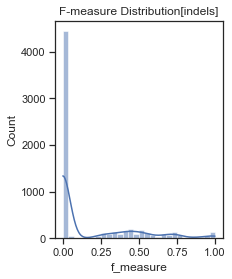

In [167]:
sns.histplot(results_finito2_indels['f_measure'], kde=True).set(title='F-measure Distribution[indels]')
sns.set(font_scale=1)
plt.show()

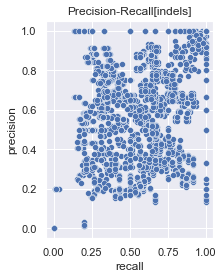

In [168]:
sns.scatterplot(x='recall', y='precision',data=results_finito2_indels)
plt.title('Precision-Recall[indels]')
plt.show()

In [169]:

results_finito2_indels['vcf1_label'] = (
    results_finito2_indels['vcf1'].astype(str) +
    " (" + results_finito2_indels['vcf1_Mapper'] + ", " +
    results_finito2_indels['vcf1_VariantCaller'] + ", " +
    results_finito2_indels['vcf1_isTrimmed'] + ", " +
    results_finito2_indels['vcf1_baseRecalibration'] + ")"
)

results_finito2_indels['vcf2_label'] = (
    results_finito2_indels['vcf2'].astype(str) +
    " (" + results_finito2_indels['vcf2_Mapper'] + ", " +
    results_finito2_indels['vcf2_VariantCaller'] + ", " +
    results_finito2_indels['vcf2_isTrimmed'] + ", " +
    results_finito2_indels['vcf2_baseRecalibration'] + ")"
)

In [170]:
results_finito2_indels

,f_measure,precision,recall,vcf1,vcf2,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration,vcf1_label,vcf2_label
0,1.0000,1.0000,1.0000,1,1,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","1 (BWA, Mutect, yes, yes)"
1,0.0000,0.0000,0.0000,1,2,BWA,Mutect,LL,yes,yes,BWA,Strelka,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","2 (BWA, Strelka, yes, yes)"
2,0.5238,0.8800,0.3729,1,3,BWA,Mutect,LL,yes,yes,Bowtie,Mutect,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","3 (Bowtie, Mutect, yes, yes)"
3,0.0000,0.0000,0.0000,1,4,BWA,Mutect,LL,yes,yes,Bowtie,Strelka,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","4 (Bowtie, Strelka, yes, yes)"
4,0.9748,0.9667,0.9831,1,5,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,no,"1 (BWA, Mutect, yes, yes)","5 (BWA, Mutect, yes, no)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,0.9412,1.0000,0.8889,272,268,Bowtie,Strelka,FD,no,no,Bowtie,Strelka,FD,no,yes,"272 (Bowtie, Strelka, no, no)","268 (Bowtie, Strelka, no, yes)"
6396,0.0000,0.0000,0.0000,272,269,Bowtie,Strelka,FD,no,no,BWA,Mutect,FD,no,no,"272 (Bowtie, Strelka, no, no)","269 (BWA, Mutect, no, no)"
6397,0.4706,0.5000,0.4444,272,270,Bowtie,Strelka,FD,no,no,BWA,Strelka,FD,no,no,"272 (Bowtie, Strelka, no, no)","270 (BWA, Strelka, no, no)"
6398,0.0000,0.0000,0.0000,272,271,Bowtie,Strelka,FD,no,no,Bowtie,Mutect,FD,no,no,"272 (Bowtie, Strelka, no, no)","271 (Bowtie, Mutect, no, no)"


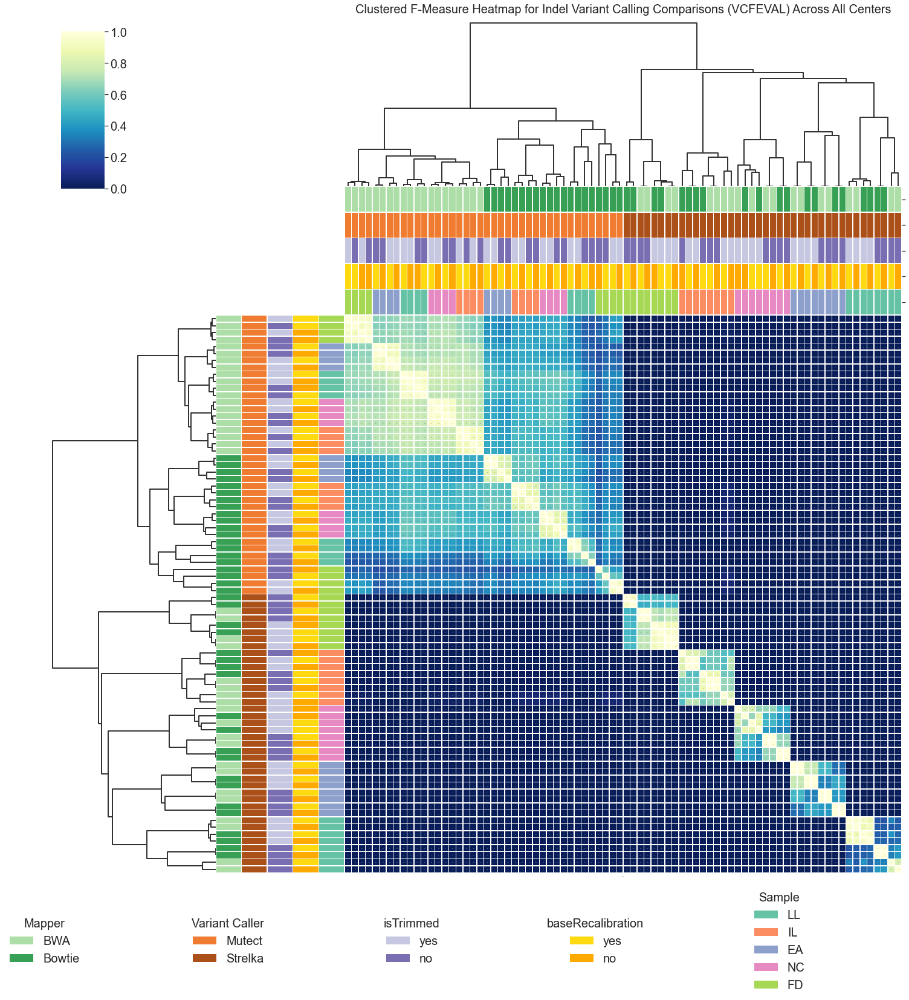

In [171]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Örnek pivot tablo oluşturma (f_measure için)
pivot_f = results_finito2_indels.pivot('vcf1_label', 'vcf2_label', 'f_measure')

# Pivot tablodaki NaN değerlerini -1 ile dolduralım:
pivot_f = pivot_f.fillna(0)


# --- SATIR VE SÜTUN ETİKETLERİ İÇİN ÖZNİTELİK TABLOLARI ---
# Satırlar: vcf1_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
row_attrs = results_finito2_indels.drop_duplicates("vcf1_label").set_index("vcf1_label")[
    ["vcf1_Mapper", "vcf1_VariantCaller", "vcf1_isTrimmed", "vcf1_baseRecalibration", "vcf1_Sample"]
]

# Sütunlar: vcf2_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
col_attrs = results_finito2_indels.drop_duplicates("vcf2_label").set_index("vcf2_label")[
    ["vcf2_Mapper", "vcf2_VariantCaller", "vcf2_isTrimmed", "vcf2_baseRecalibration", "vcf2_Sample"]
]

# --- HER ÖZNİTELİK İÇİN RENK PALETLERİNİN OLUŞTURULMASI ---

# SATIRLAR İÇİN:
# Mapper
lut_mapper = dict(zip(row_attrs["vcf1_Mapper"].unique(), 
                      sns.color_palette("Greens", len(row_attrs["vcf1_Mapper"].unique()))))
row_colors_mapper = row_attrs["vcf1_Mapper"].map(lut_mapper)

# VariantCaller
lut_variant = dict(zip(row_attrs["vcf1_VariantCaller"].unique(), 
                       sns.color_palette("Oranges_d", len(row_attrs["vcf1_VariantCaller"].unique()))))
row_colors_variant = row_attrs["vcf1_VariantCaller"].map(lut_variant)

# isTrimmed
lut_trimmed = dict(zip(row_attrs["vcf1_isTrimmed"].unique(), 
                       sns.color_palette("Purples", len(row_attrs["vcf1_isTrimmed"].unique()))))
row_colors_trimmed = row_attrs["vcf1_isTrimmed"].map(lut_trimmed)

# baseRecalibration
lut_recal = dict(zip(row_attrs["vcf1_baseRecalibration"].unique(), 
                     sns.color_palette("Wistia", len(row_attrs["vcf1_baseRecalibration"].unique()))))
row_colors_recal = row_attrs["vcf1_baseRecalibration"].map(lut_recal)

# Yeni: Sample
lut_sample = dict(zip(row_attrs["vcf1_Sample"].unique(), 
                      sns.color_palette("Set2", len(row_attrs["vcf1_Sample"].unique()))))
row_colors_sample = row_attrs["vcf1_Sample"].map(lut_sample)

# Tüm satır renklerini birleştiriyoruz:
row_colors = pd.concat([row_colors_mapper, row_colors_variant, row_colors_trimmed, row_colors_recal, row_colors_sample], axis=1)

# SÜTUNLAR İÇİN:
# Mapper
lut_mapper2 = dict(zip(col_attrs["vcf2_Mapper"].unique(), 
                       sns.color_palette("Greens", len(col_attrs["vcf2_Mapper"].unique()))))
col_colors_mapper = col_attrs["vcf2_Mapper"].map(lut_mapper2)

# VariantCaller
lut_variant2 = dict(zip(col_attrs["vcf2_VariantCaller"].unique(), 
                        sns.color_palette("Oranges_d", len(col_attrs["vcf2_VariantCaller"].unique()))))
col_colors_variant = col_attrs["vcf2_VariantCaller"].map(lut_variant2)

# isTrimmed
lut_trimmed2 = dict(zip(col_attrs["vcf2_isTrimmed"].unique(), 
                        sns.color_palette("Purples", len(col_attrs["vcf2_isTrimmed"].unique()))))
col_colors_trimmed = col_attrs["vcf2_isTrimmed"].map(lut_trimmed2)

# baseRecalibration
lut_recal2 = dict(zip(col_attrs["vcf2_baseRecalibration"].unique(), 
                      sns.color_palette("Wistia", len(col_attrs["vcf2_baseRecalibration"].unique()))))
col_colors_recal = col_attrs["vcf2_baseRecalibration"].map(lut_recal2)

# Yeni: Sample
lut_sample2 = dict(zip(col_attrs["vcf2_Sample"].unique(), 
                       sns.color_palette("Set2", len(col_attrs["vcf2_Sample"].unique()))))
col_colors_sample = col_attrs["vcf2_Sample"].map(lut_sample2)

# Tüm sütun renklerini birleştiriyoruz:
col_colors = pd.concat([col_colors_mapper, col_colors_variant, col_colors_trimmed, col_colors_recal, col_colors_sample], axis=1)

# --- CLUSTERED HEATMAP OLUŞTURMA ---
sns.set(font_scale=0)
g = sns.clustermap(
    pivot_f,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu_r",
    linewidths=0.5,
    row_colors=row_colors,
    col_colors=col_colors,
    figsize=(20,20),
    xticklabels=False,  # Sütun etiketlerini kapatır
    yticklabels=False   # Satır etiketlerini kapatır
)
g.ax_heatmap.set_title('Clustered F-Measure Heatmap for Indel Variant Calling Comparisons (VCFEVAL) Across All Centers', pad=500, size=20)

# Remove tick labels from the colored row and column colorbars:
if g.ax_row_colors is not None:
    g.ax_row_colors.set_xticks([])
    g.ax_row_colors.set_yticklabels([])

if g.ax_col_colors is not None:
    g.ax_col_colors.set_xticks([])
    g.ax_col_colors.set_yticklabels([])
    
g.cax.tick_params(labelsize=20)

# Dendrogram çizgilerinin kalınlığını arttırma:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)

# --- LEGEND OLUŞTURMA ---
# Legend için kullanılacak dictionary'ler ve başlıkları:
legend_dicts = [lut_mapper, lut_variant, lut_trimmed, lut_recal, lut_sample]
legend_titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "Sample"]
legend_params = {'fontsize': 20, 'title_fontsize': 20}

fig = g.fig
# 1 satırda 5 sütun olacak şekilde GridSpec (wspace ile boşluk ayarlanıyor)
gs = GridSpec(1, 5, figure=fig, wspace=0.5)
for i in range(5):
    ax = fig.add_subplot(gs[0, i])
    # Her legend için Patch objeleri oluşturuyoruz:
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=legend_titles[i], loc="center", frameon=False, bbox_to_anchor=(0, -0.08),prop={'size': 20}, **legend_params)
    ax.axis("off")

plt.savefig("Clustered_F-measure_Heatmap_with_Cluster_Colors_ALL_Centers_Indels.png", bbox_inches="tight")
plt.show()


In [318]:
results_finito_indels

,f_measure,precision,recall,vcf1,vcf2
0,1.0000,1.0000,1.0000,1,1
1,0.0000,0.0000,0.0000,1,2
2,0.5238,0.8800,0.3729,1,3
3,0.0000,0.0000,0.0000,1,4
4,0.9748,0.9667,0.9831,1,5
...,...,...,...,...,...
6395,0.9412,1.0000,0.8889,272,268
6396,0.0000,0.0000,0.0000,272,269
6397,0.4706,0.5000,0.4444,272,270
6398,0.0000,0.0000,0.0000,272,271


In [320]:
# f_measure'ı 0 olmayan satırları filtrele
filtered = results_finito2_indels[results_finito2_indels['f_measure'] != 0]

# f_measure sütununa göre artan şekilde sırala
sorted_filtered = filtered.sort_values('f_measure')

# İlk 10 satırı al ve yazdır
print(sorted_filtered.head(10))


      f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration                   vcf1_label                   vcf2_label
5781     0.0198     0.2000  0.0104  265   70         BWA             Mutect          FD             no                    yes         BWA            Strelka          IL            yes                     no   265 (BWA, Mutect, no, yes)   70 (BWA, Strelka, yes, no)
1432     0.0198     0.0104  0.2000   66  265         BWA            Strelka          IL            yes                    yes         BWA             Mutect          FD             no                    yes  66 (BWA, Strelka, yes, yes)   265 (BWA, Mutect, no, yes)
5777     0.0198     0.2000  0.0104  265   66         BWA             Mutect          FD             no                    yes         BWA            Strelka          IL            yes                    ye

In [321]:
sorted_filtered

,f_measure,precision,recall,vcf1,vcf2,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration,vcf1_label,vcf2_label
5781,0.0198,0.2000,0.0104,265,70,BWA,Mutect,FD,no,yes,BWA,Strelka,IL,yes,no,"265 (BWA, Mutect, no, yes)","70 (BWA, Strelka, yes, no)"
1432,0.0198,0.0104,0.2000,66,265,BWA,Strelka,IL,yes,yes,BWA,Mutect,FD,no,yes,"66 (BWA, Strelka, yes, yes)","265 (BWA, Mutect, no, yes)"
5777,0.0198,0.2000,0.0104,265,66,BWA,Mutect,FD,no,yes,BWA,Strelka,IL,yes,yes,"265 (BWA, Mutect, no, yes)","66 (BWA, Strelka, yes, yes)"
1752,0.0198,0.0104,0.2000,70,265,BWA,Strelka,IL,yes,no,BWA,Mutect,FD,no,yes,"70 (BWA, Strelka, yes, no)","265 (BWA, Mutect, no, yes)"
5141,0.0202,0.2000,0.0106,257,70,BWA,Mutect,FD,yes,yes,BWA,Strelka,IL,yes,no,"257 (BWA, Mutect, yes, yes)","70 (BWA, Strelka, yes, no)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4374,1.0000,1.0000,1.0000,199,199,Bowtie,Mutect,NC,yes,no,Bowtie,Mutect,NC,yes,no,"199 (Bowtie, Mutect, yes, no)","199 (Bowtie, Mutect, yes, no)"
4455,1.0000,1.0000,1.0000,200,200,Bowtie,Strelka,NC,yes,no,Bowtie,Strelka,NC,yes,no,"200 (Bowtie, Strelka, yes, no)","200 (Bowtie, Strelka, yes, no)"
4536,1.0000,1.0000,1.0000,201,201,BWA,Mutect,NC,no,yes,BWA,Mutect,NC,no,yes,"201 (BWA, Mutect, no, yes)","201 (BWA, Mutect, no, yes)"
3155,1.0000,1.0000,1.0000,136,132,Bowtie,Strelka,EA,yes,no,Bowtie,Strelka,EA,yes,yes,"136 (Bowtie, Strelka, yes, no)","132 (Bowtie, Strelka, yes, yes)"


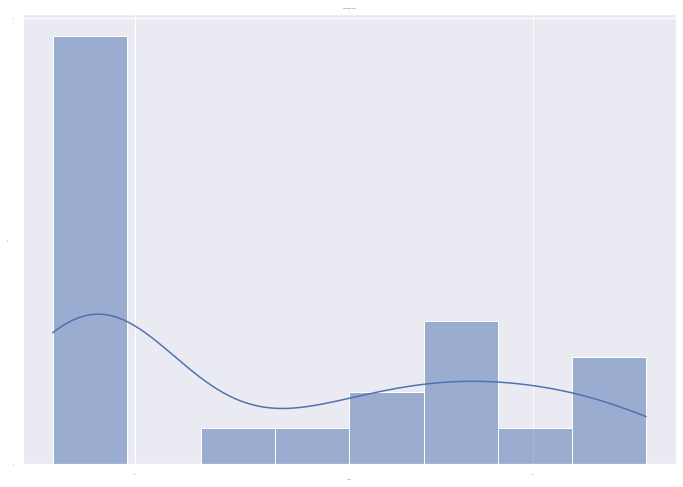

In [336]:
sns.histplot(sorted_filtered['f_measure'], kde=True).set(title='F-measure Distribution[indels]')
sns.set(font_scale=10)

plt.show()

In [332]:
# f_measure'ı 0 olmayan satırları filtrele
filtered = results_finito2_indels[results_finito2_indels['f_measure'] != 0]

# vcf1_VariantCaller ve vcf2_VariantCaller sütunlarının her ikisi de "strelka" olan satırları seç
filtered = filtered[
    ((filtered['vcf1_VariantCaller'] == 'Strelka') & (filtered['vcf2_VariantCaller'] == 'Mutect')) |
    ((filtered['vcf1_VariantCaller'] == 'Mutect') & (filtered['vcf2_VariantCaller'] == 'Strelka'))
]


# f_measure sütununa göre artan şekilde sırala
sorted_filtered = filtered.sort_values('f_measure')

# İlk 10 satırı al ve yazdır
print(sorted_filtered.head(10))


      f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration                   vcf1_label                   vcf2_label
1752     0.0198     0.0104  0.2000   70  265         BWA            Strelka          IL            yes                     no         BWA             Mutect          FD             no                    yes   70 (BWA, Strelka, yes, no)   265 (BWA, Mutect, no, yes)
1432     0.0198     0.0104  0.2000   66  265         BWA            Strelka          IL            yes                    yes         BWA             Mutect          FD             no                    yes  66 (BWA, Strelka, yes, yes)   265 (BWA, Mutect, no, yes)
5781     0.0198     0.2000  0.0104  265   70         BWA             Mutect          FD             no                    yes         BWA            Strelka          IL            yes                     n

In [333]:
print(sorted_filtered)

      f_measure  precision  recall vcf1 vcf2 vcf1_Mapper vcf1_VariantCaller vcf1_Sample vcf1_isTrimmed vcf1_baseRecalibration vcf2_Mapper vcf2_VariantCaller vcf2_Sample vcf2_isTrimmed vcf2_baseRecalibration                      vcf1_label                      vcf2_label
1752     0.0198     0.0104  0.2000   70  265         BWA            Strelka          IL            yes                     no         BWA             Mutect          FD             no                    yes      70 (BWA, Strelka, yes, no)      265 (BWA, Mutect, no, yes)
1432     0.0198     0.0104  0.2000   66  265         BWA            Strelka          IL            yes                    yes         BWA             Mutect          FD             no                    yes     66 (BWA, Strelka, yes, yes)      265 (BWA, Mutect, no, yes)
5781     0.0198     0.2000  0.0104  265   70         BWA             Mutect          FD             no                    yes         BWA            Strelka          IL            yes    

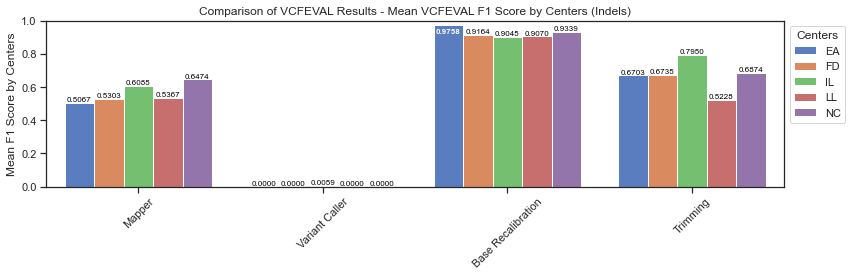

In [180]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Make a copy of the vcfeval results DataFrame
df_vcfeval = results_finito2_indels.copy()

# The DataFrame already contains separate columns for pipeline parameters:
#   vcf1_Mapper, vcf1_VariantCaller, vcf1_Sample, vcf1_isTrimmed, vcf1_baseRecalibration,
#   vcf2_Mapper, vcf2_VariantCaller, vcf2_Sample, vcf2_isTrimmed, vcf2_baseRecalibration

# 1. Filter for differences in Mapper only
filtered_mapper = df_vcfeval[
    (df_vcfeval['vcf1_Mapper'] != df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_mapper['f_measure'] = pd.to_numeric(filtered_mapper['f_measure'], errors='coerce')
grouped_mapper = filtered_mapper.groupby('vcf1_Sample')['f_measure'].mean().reset_index()
grouped_mapper['Parameter'] = 'Mapper'

# 2. Filter for differences in Variant Caller only
filtered_vc = df_vcfeval[
    (df_vcfeval['vcf1_VariantCaller'] != df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_vc['f_measure'] = pd.to_numeric(filtered_vc['f_measure'], errors='coerce')
grouped_vc = filtered_vc.groupby('vcf1_Sample')['f_measure'].mean().reset_index()
grouped_vc['Parameter'] = 'Variant Caller'

# 3. Filter for differences in Base Recalibration only
filtered_br = df_vcfeval[
    (df_vcfeval['vcf1_baseRecalibration'] != df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_br['f_measure'] = pd.to_numeric(filtered_br['f_measure'], errors='coerce')
grouped_br = filtered_br.groupby('vcf1_Sample')['f_measure'].mean().reset_index()
grouped_br['Parameter'] = 'Base Recalibration'

# 4. Filter for differences in Trimming only
filtered_trim = df_vcfeval[
    (df_vcfeval['vcf1_isTrimmed'] != df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_trim['f_measure'] = pd.to_numeric(filtered_trim['f_measure'], errors='coerce')
grouped_trim = filtered_trim.groupby('vcf1_Sample')['f_measure'].mean().reset_index()
grouped_trim['Parameter'] = 'Trimming'

# Concatenate all grouped DataFrames
grouped_vcfeval = pd.concat([grouped_mapper, grouped_vc, grouped_br, grouped_trim])
grouped_vcfeval['vcf1_Sample'] = grouped_vcfeval['vcf1_Sample'].str.upper()

# Plotting the bar plot for the averaged vcfeval F-measure values
sns.set(style="ticks")
plt.figure(figsize=(12, 4))
ax = sns.barplot(data=grouped_vcfeval, x='Parameter', y='f_measure', hue='vcf1_Sample',
                 ci=None, palette=sns.color_palette("muted"))

# Add data labels to each bar with conditional formatting and bold text
for p in ax.patches:
    height = p.get_height()
    label = format(height, '.4f')
    if height > 0.95:
        # Place the label inside the bar (a little below the top) with white bold text
        ax.annotate(label,
                    (p.get_x() + p.get_width() / 2, height - 0.02),
                    ha='center', va='top', fontsize=8, color='white', fontweight='bold')
    else:
        # Otherwise, place the label at the top of the bar with black bold text
        ax.annotate(label,
                    (p.get_x() + p.get_width() / 2, height),
                    ha='center', va='bottom', fontsize=8, color='black')



#ax.set(xticklabels=[])        # Remove x-axis tick labels
ax.tick_params(bottom=True)   # Remove x-axis ticks
ax.set(xlabel=None)            # Remove x-axis label
plt.ylabel('Mean F1 Score by Centers')
plt.title('Comparison of VCFEVAL Results - Mean VCFEVAL F1 Score by Centers (Indels)')
plt.legend(title='Centers', bbox_to_anchor=(1.0, 1), loc='upper left')
plt.xticks(rotation=45)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.savefig("Comparison of VCFEVAL Results - Mean VCFEVAL F1 Score by Centers (Indels).png", bbox_inches='tight')  # PDF olarak kaydet
plt.show()

In [345]:
df_vcfeval.columns

Index(['f_measure', 'precision', 'recall', 'vcf1', 'vcf2', 'vcf1_Mapper', 'vcf1_VariantCaller', 'vcf1_Sample', 'vcf1_isTrimmed', 'vcf1_baseRecalibration', 'vcf2_Mapper', 'vcf2_VariantCaller', 'vcf2_Sample', 'vcf2_isTrimmed', 'vcf2_baseRecalibration', 'vcf1_label', 'vcf2_label'], dtype='object')

ValueError: The condensed distance matrix must contain only finite values.

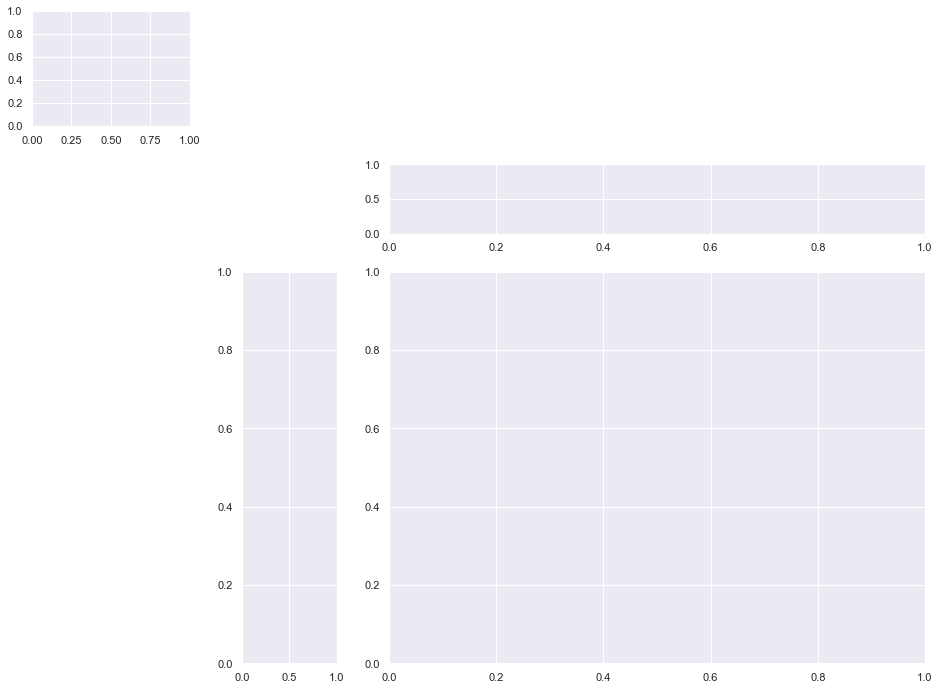

In [174]:

results_finito2['vcf1_label'] = (
    results_finito2['vcf1'].astype(str) +
    " (" + results_finito2['vcf1_Mapper'] + ", " +
    results_finito2['vcf1_VariantCaller'] + ", " +
    results_finito2['vcf1_isTrimmed'] + ", " +
    results_finito2['vcf1_baseRecalibration'] + ")"
)

results_finito2['vcf2_label'] = (
    results_finito2['vcf2'].astype(str) +
    " (" + results_finito2['vcf2_Mapper'] + ", " +
    results_finito2['vcf2_VariantCaller'] + ", " +
    results_finito2['vcf2_isTrimmed'] + ", " +
    results_finito2['vcf2_baseRecalibration'] + ")"
)

# Pivot tabloyu oluşturuyoruz (örneğin, f_measure için):
pivot_f = results_finito2.pivot('vcf1_label', 'vcf2_label', 'f_measure')

# --- SATIR VE SÜTUN ETİKETLERİ İÇİN RENK ATAMALARI ---
# Satır renkleri için: vcf1 etiketine ait attribute bilgilerini (Mapper, VariantCaller, isTrimmed, baseRecalibration) kullanıyoruz.
row_attrs = results_finito2.drop_duplicates("vcf1_label").set_index("vcf1_label")[["vcf1_Mapper", "vcf1_VariantCaller", "vcf1_isTrimmed", "vcf1_baseRecalibration"]]
# Aynı şekilde, sütun renkleri için:
col_attrs = results_finito2.drop_duplicates("vcf2_label").set_index("vcf2_label")[["vcf2_Mapper", "vcf2_VariantCaller", "vcf2_isTrimmed", "vcf2_baseRecalibration"]]

# Her attribute için renk paletleri tanımlayalım:
# --- Satırlar için ---
lut_mapper = dict(zip(row_attrs["vcf1_Mapper"].unique(), sns.color_palette("Greens", len(row_attrs["vcf1_Mapper"].unique()))))
row_colors_mapper = row_attrs["vcf1_Mapper"].map(lut_mapper)

lut_variant = dict(zip(row_attrs["vcf1_VariantCaller"].unique(), sns.color_palette("Oranges_d", len(row_attrs["vcf1_VariantCaller"].unique()))))
row_colors_variant = row_attrs["vcf1_VariantCaller"].map(lut_variant)

lut_trimmed = dict(zip(row_attrs["vcf1_isTrimmed"].unique(), sns.color_palette("Purples", len(row_attrs["vcf1_isTrimmed"].unique()))))
row_colors_trimmed = row_attrs["vcf1_isTrimmed"].map(lut_trimmed)

lut_recal = dict(zip(row_attrs["vcf1_baseRecalibration"].unique(), sns.color_palette("Wistia", len(row_attrs["vcf1_baseRecalibration"].unique()))))
row_colors_recal = row_attrs["vcf1_baseRecalibration"].map(lut_recal)

# Tüm satır renklerini birleştiriyoruz:
row_colors = pd.concat([row_colors_mapper, row_colors_variant, row_colors_trimmed, row_colors_recal], axis=1)

# --- Sütunlar için ---
lut_mapper2 = dict(zip(col_attrs["vcf2_Mapper"].unique(), sns.color_palette("Greens", len(col_attrs["vcf2_Mapper"].unique()))))
col_colors_mapper = col_attrs["vcf2_Mapper"].map(lut_mapper2)

lut_variant2 = dict(zip(col_attrs["vcf2_VariantCaller"].unique(), sns.color_palette("Oranges_d", len(col_attrs["vcf2_VariantCaller"].unique()))))
col_colors_variant = col_attrs["vcf2_VariantCaller"].map(lut_variant2)

lut_trimmed2 = dict(zip(col_attrs["vcf2_isTrimmed"].unique(), sns.color_palette("Purples", len(col_attrs["vcf2_isTrimmed"].unique()))))
col_colors_trimmed = col_attrs["vcf2_isTrimmed"].map(lut_trimmed2)

lut_recal2 = dict(zip(col_attrs["vcf2_baseRecalibration"].unique(), sns.color_palette("Wistia", len(col_attrs["vcf2_baseRecalibration"].unique()))))
col_colors_recal = col_attrs["vcf2_baseRecalibration"].map(lut_recal2)

col_colors = pd.concat([col_colors_mapper, col_colors_variant, col_colors_trimmed, col_colors_recal], axis=1)

# --- Clustered Heatmap Oluşturma ---
sns.set(font_scale=1)
g = sns.clustermap(
    pivot_f,
    annot=True,
    fmt=".3f",
    cmap="YlGnBu_r",
    linewidths=0.5,
    row_colors=row_colors,
    col_colors=col_colors,
    figsize=(16, 12)
)
g.ax_heatmap.set_title('Clustered F-measure Heatmap for VCF Comparisons - VCFEVAL', pad=220, size=20)

# Dendrogram çizgilerinin kalınlığını arttıralım:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(1)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(1)

# --- Legend Oluşturma ---
# Legend için kullanılacak dictionary'leri ve başlıkları tanımlayalım:
legend_dicts = [lut_mapper, lut_variant, lut_trimmed, lut_recal]
legend_titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration"]
legend_colors = ["Greens", "Oranges_d", "Purples", "Wistia"]
legend_params = {'fontsize': 12, 'title_fontsize': 14}

fig = g.fig
# GridSpec kullanarak legend'ları alt kısımda düzenleyelim (örneğin 1 satır, 4 sütun):
gs = GridSpec(1, 4, figure=fig, wspace=0.5)
for i in range(4):
    ax = fig.add_subplot(gs[0, i])
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=legend_titles[i], loc="center", frameon=False,bbox_to_anchor=(0,-0.5), **legend_params)
    ax.axis("off")

plt.savefig("Clustered_F-measure_Heatmap_with_Cluster_Colors_EA.png", bbox_inches="tight")
plt.show()


## Hap.py

mamba install -c conda-forge -c bioconda hap.py

In [34]:
#!mamba install -c conda-forge -c bioconda hap.py
!chmod +x hap.py


chmod: hap.py: No such file or directory


In [36]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define file paths
reference_fasta = "vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"
output_base_dir = "happy_results_22-02"
os.makedirs(output_base_dir, exist_ok=True)

# Filter vcfcomparison_df_full based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]
filtered_vcf_df['TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Merge filtered TestCaseNo with vcf_filenames to extract file paths
filtered_vcf_filenames = {
    str(tc): vcf_filenames[str(tc)]
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files (limit to 120 comparisons)
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
] # Limit to the first 120 pairs


# Function to run Hap.py
def run_happy(truth_vcf, query_vcf, output_dir):
    """Runs Hap.py for a given truth and query VCF pair."""
    output_prefix = os.path.join(output_dir, f"{os.path.basename(truth_vcf)}_vs_{os.path.basename(query_vcf)}")
    summary_file = f"{output_prefix}.summary.csv"
    
    # Skip if already processed
    if os.path.exists(summary_file):
        return summary_file
    
    # Hap.py command
    cmd = [
        "hap.py", truth_vcf, query_vcf,
        "-r", reference_fasta,
        "-o", output_prefix
    ]
    print(cmd)
    try:
        subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return summary_file
    except subprocess.CalledProcessError as e:
        tqdm.write(f"Error running Hap.py for {truth_vcf} vs {query_vcf}: {e.stderr.decode()}")
        return None

# Run Hap.py for all pairs
results = []
progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
for key1, truth_vcf, key2, query_vcf in progress_bar:
    progress_bar.set_description(f"Processing {os.path.basename(truth_vcf)} vs {os.path.basename(query_vcf)}")
    result_file = run_happy(truth_vcf, query_vcf, output_base_dir)
    if result_file and os.path.exists(result_file):
        results.append(result_file)

# Parse Results
def parse_summary_csv(summary_file):
    """Parses Hap.py summary.csv file to extract metrics."""
    try:
        df = pd.read_csv(summary_file)
        metrics = df.loc[(df["Type"] == "ALL") & (df["Filter"] == "ALL"), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        return metrics.to_dict(orient="records")[0]  # Extract first row as a dictionary
    except Exception as e:
        tqdm.write(f"Error parsing {summary_file}: {str(e)}")
        return None

metrics_list = []
for result_file in results:
    metrics = parse_summary_csv(result_file)
    if metrics:
        metrics["summary_file"] = result_file
        metrics_list.append(metrics)

# Create DataFrame
results_df = pd.DataFrame(metrics_list)

# Save results to CSV
results_csv = os.path.join(output_base_dir, "hap.py_results_summary.csv")
results_df.to_csv(results_csv, index=False)

print(f"Results saved to {results_csv}")


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Processing snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf vs snp_SRR7890880


['hap.py', 'vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', 'vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', 'vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', 'happy_results_22-02/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf_vs_snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf']


PermissionError: [Errno 13] Permission denied: 'hap.py'

## DOCKER

## Baysan indellere öncelik ver dedi.

seri olsun istersen bu ;

In [71]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    VCF dosyasını bgzip ile sıkıştırır ve tabix ile indeksler.
    Eğer vcf_path_indels+'.gz' dosyası zaten varsa, hiçbir işlem yapmaz.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    # If file_path_indels is not absolute, prepend host_base_dir_indels.
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (to use the .vcf.gz file)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  
    (vcfcomparison_df_full_indels['Sample'] == 'FD') &                         
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames_indels: TestCaseNo ile vcf_filenames_indels sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames_indels = {
    str(tc_indels): vcf_filenames_indels[str(tc_indels)]
    for tc_indels in filtered_vcf_df_indels['TestCaseNo']
    if str(tc_indels) in vcf_filenames_indels
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map_indels = {
    str(row_indels['TestCaseNo']): row_indels['VariantCaller']
    for _, row_indels in filtered_vcf_df_indels.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz.
vcf_pairs_indels = [
    (key1_indels, vcf1_indels, key2_indels, vcf2_indels)
    for (key1_indels, vcf1_indels), (key2_indels, vcf2_indels) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
#vcf_pairs_indels = vcf_pairs_indels[:128]  # İlk 128 çifti sınırlayabilirsiniz

# Function to run Hap.py in Docker
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension to use the gzipped VCF file.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert to full absolute container paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, don't run Hap.py again.
    if os.path.exists(summary_file_indels):
        return summary_file_indels

    # Docker command to run Hap.py
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py", truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
    ]

    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return summary_file_indels
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# Run Hap.py for all pairs
results_indels = []
progress_bar_indels = tqdm(vcf_pairs_indels, desc="Comparing VCF files", ncols=100)
for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in progress_bar_indels:
    progress_bar_indels.set_description(f"Processing {key1_indels} vs {key2_indels}")
    result_file_indels = run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_base_dir_indels, key1_indels, key2_indels)
    if result_file_indels is None:
        tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; breaking out of loop.")
        break
    if os.path.exists(result_file_indels):
        results_indels.append(result_file_indels)

# Parse Results
def parse_summary_csv_indels(summary_file_indels):
    """Parses Hap.py summary.csv file to extract metrics."""
    try:
        df_indels = pd.read_csv(summary_file_indels)
        metrics_indels = df_indels.loc[(df_indels["Type"] == "ALL") & (df_indels["Filter"] == "ALL"), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

metrics_list_indels = []
for result_file_indels in results_indels:
    metrics_indels = parse_summary_csv_indels(result_file_indels)
    if metrics_indels:
        metrics_indels["summary_file_indels"] = result_file_indels
        metrics_list_indels.append(metrics_indels)

# Create DataFrame
results_df_indels = pd.DataFrame(metrics_list_indels)

# Save results to CSV
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing 269 vs 257:   0%|                                                 | 0/64 [00:00<?, ?it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/269_vs_257/269_vs_257']


Processing 269 vs 257:  75%|██████████████████████████████          | 48/64 [00:08<00:02,  5.77it/s]


KeyboardInterrupt: 

## 25.02.2025 - 14.06

In [74]:
import os
import subprocess
import pandas as pd
from itertools import combinations
from tqdm import tqdm

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# VCF karşılaştırma DataFrame'ini istenen koşullara göre filtreleyelim.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  # Örneğin: Strelka hariç
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         # Sample: LL
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           # Environment: Uhem + COSAP
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     # Duplicates: MARK
].copy()

# TestCaseNo sütunundaki değeri düzenleyelim (boşlukla ayrılan son parçayı alıyoruz)
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# filtered_vcf_filenames: TestCaseNo ile vcf_filenames_indels sözlüğünü eşleştiriyoruz.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# TestCaseNo ile VariantCaller bilgisini eşleştiren bir harita oluşturuyoruz.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# VCF çiftlerini (pair) oluşturuyoruz. Burada, her iki VCF dosyası arasında karşılaştırma yapıyoruz.
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
#vcf_pairs_indels = vcf_pairs_indels[:128]  # İlk 128 çifti sınırlıyoruz

# Optionally, include self-comparisons if needed via combinations_with_replacement.

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the gzipped VCF file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to full absolute container paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, parse it immediately, add test case columns, and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            results_df_indels = pd.DataFrame(metrics_list_indels)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Construct the Docker command to run Hap.py.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py", truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Run Hap.py for All Pairs Serially ---
results_indels = []
for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in tqdm(vcf_pairs_indels, desc="Processing VCF pairs", ncols=100):
    result_tuple = run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_base_dir_indels, key1_indels, key2_indels)
    if result_tuple is None:
        tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; stopping execution.")
        break
    if os.path.exists(result_tuple[0]):
        results_indels.append(result_tuple)
        # Update CSV after each successful result.
        results_df_indels = pd.DataFrame(metrics_list_indels)
        results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
        results_df_indels.to_csv(results_csv_indels, index=False)

# Create final DataFrame and save final results to CSV (including test case columns).
results_df_indels = pd.DataFrame(metrics_list_indels)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:   1%|▍                                      | 77/6400 [00:01<01:24, 74.53it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/2_vs_2/2_vs_2']


Processing VCF pairs:   1%|▍                                      | 81/6400 [00:30<39:18,  2.68it/s]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-26 09:48:42,693 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-26 09:49:04,750 WARNING  No calls for location chr1 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr10 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr11 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr12 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr14 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr15 in query!
2025-02-26 09:49:04,751 WARNING  No calls for location chr17 in query!
2025-02-2

# 26.02.2025 - 21.52

In [88]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    # Trace the folder conversion: host base dir is replaced by container base dir.
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# Filter the VCF comparison DataFrame according to desired conditions.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  # e.g., exclude Strelka
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         # e.g., specific sample
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           # Environment: Uhem + COSAP
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     # Duplicates: MARK
].copy()

# Adjust the TestCaseNo column: take the last space-separated token.
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map TestCaseNo to VCF filenames using the vcf_filenames_indels dictionary.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# Create a mapping from TestCaseNo to VariantCaller.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# Create VCF pairs (all combinations between two VCF files).
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# Optionally limit pairs (e.g., the first 128 pairs): vcf_pairs_indels = vcf_pairs_indels[:128]

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the .vcf.gz file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to container file paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV already exists, parse its metrics and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            results_df_indels = pd.DataFrame(metrics_list_indels)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Construct the Docker command.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py",  # Hap.py executable in the container
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Run Hap.py for All Pairs Serially ---
results_indels = []
for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in tqdm(vcf_pairs_indels, desc="Processing VCF pairs", ncols=100):
    result_tuple = run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_base_dir_indels, key1_indels, key2_indels)
    if result_tuple is None:
        tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; stopping execution.")
        ##break
    elif os.path.exists(result_tuple[0]):
        results_indels.append(result_tuple)
        # Update summary CSV after each successful result.
        results_df_indels = pd.DataFrame(metrics_list_indels)
        results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
        results_df_indels.to_csv(results_csv_indels, index=False)

# Create final DataFrame and save final results to CSV.
results_df_indels = pd.DataFrame(metrics_list_indels)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:   1%|▍                                      | 75/6400 [00:00<01:20, 78.12it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/2_vs_2/2_vs_2']


Processing VCF pairs:   1%|▍                                    | 82/6400 [00:30<2:16:31,  1.30s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 06:49:18,788 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:49:41,457 WARNING  No calls for location chr1 in query!
2025-02-27 06:49:41,457 WARNING  No calls for location chr10 in query!
2025-02-27 06:49:41,457 WARNING  No calls for location chr11 in query!
2025-02-27 06:49:41,457 WARNING  No calls for location chr12 in query!
2025-02-27 06:49:41,457 WARNING  No calls for location chr14 in query!
2025-02-27 06:49:41,457 WARNING  No calls for location chr15 in query!
2025-02-27 06:49:41,458 WARNING  No calls for location chr17 in query!
2025-02-2

Processing VCF pairs:   1%|▍                                    | 84/6400 [01:00<9:24:00,  5.36s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 06:49:48,815 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:50:11,017 WARNING  No calls for location chr1 in query!
2025-02-27 06:50:11,017 WARNING  No calls for location chr10 in query!
2025-02-27 06:50:11,017 WARNING  No calls for location chr11 in query!
2025-02-27 06:50:11,017 WARNING  No calls for location chr12 in query!
2025-02-27 06:50:11,018 WARNING  No calls for location chr14 in query!
2025-02-27 06:50:11,018 WARNING  No calls for location chr15 in query!
2025-02-27 06:50:11,018 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   1%|▍                                   | 86/6400 [01:31<14:42:07,  8.38s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 06:50:18,511 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:50:41,968 WARNING  No calls for location chr1 in query!
2025-02-27 06:50:41,968 WARNING  No calls for location chr10 in query!
2025-02-27 06:50:41,968 WARNING  No calls for location chr11 in query!
2025-02-27 06:50:41,968 WARNING  No calls for location chr12 in query!
2025-02-27 06:50:41,968 WARNING  No calls for location chr14 in query!
2025-02-27 06:50:41,969 WARNING  No calls for location chr15 in query!
2025-02-27 06:50:41,969 WARNING  No calls for location chr17 in query!
2025-02-2

Processing VCF pairs:   1%|▍                                   | 88/6400 [02:01<18:02:45, 10.29s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 06:50:49,287 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:51:11,496 WARNING  No calls for location chr1 in query!
2025-02-27 06:51:11,496 WARNING  No calls for location chr10 in query!
2025-02-27 06:51:11,497 WARNING  No calls for location chr11 in query!
2025-02-27 06:51:11,497 WARNING  No calls for location chr12 in query!
2025-02-27 06:51:11,497 WARNING  No calls for location chr14 in query!
2025-02-27 06:51:11,497 WARNING  No calls for location chr15 in query!
2025-02-27 06:51:11,497 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   1%|▌                                   | 90/6400 [02:32<20:47:20, 11.86s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 06:51:19,951 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:51:42,583 WARNING  No calls for location chr1 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location chr10 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location chr11 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location chr12 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location chr14 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location chr15 in query!
2025-02-27 06:51:42,583 WARNING  No calls for location c

Processing VCF pairs:   1%|▌                                   | 92/6400 [03:01<22:14:10, 12.69s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 06:51:49,726 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:52:11,736 WARNING  No calls for location chr1 in query!
2025-02-27 06:52:11,736 WARNING  No calls for location chr10 in query!
2025-02-27 06:52:11,736 WARNING  No calls for location chr11 in query!
2025-02-27 06:52:11,737 WARNING  No calls for location chr12 in query!
2025-02-27 06:52:11,737 WARNING  No calls for location chr14 in query!
2025-02-27 06:52:11,737 WARNING  No calls for location chr15 in query!
2025-02-27 06:52:11,737 WARNING  No calls for locati

Processing VCF pairs:   1%|▌                                   | 94/6400 [03:30<23:18:27, 13.31s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 06:52:18,973 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:52:41,284 WARNING  No calls for location chr1 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location chr10 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location chr11 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location chr12 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location chr14 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location chr15 in query!
2025-02-27 06:52:41,285 WARNING  No calls for location c

Processing VCF pairs:   2%|▌                                   | 96/6400 [03:59<23:55:45, 13.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 06:52:48,426 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:53:10,368 WARNING  No calls for location chr1 in query!
2025-02-27 06:53:10,369 WARNING  No calls for location chr10 in query!
2025-02-27 06:53:10,369 WARNING  No calls for location chr11 in query!
2025-02-27 06:53:10,369 WARNING  No calls for location chr12 in query!
2025-02-27 06:53:10,369 WARNING  No calls for location chr14 in query!
2025-02-27 06:53:10,369 WARNING  No calls for location chr15 in query!
2025-02-27 06:53:10,369 WARNING  No calls for locati

Processing VCF pairs:   2%|▌                                   | 98/6400 [04:28<24:20:12, 13.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 06:53:17,616 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:53:39,206 WARNING  No calls for location chr1 in query!
2025-02-27 06:53:39,206 WARNING  No calls for location chr10 in query!
2025-02-27 06:53:39,206 WARNING  No calls for location chr11 in query!
2025-02-27 06:53:39,206 WARNING  No calls for location chr12 in query!
2025-02-27 06:53:39,207 WARNING  No calls for location chr14 in query!
2025-02-27 06:53:39,207 WARNING  No calls for location chr15 in query!
2025-02-27 06:53:39,207 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   2%|▌                                  | 100/6400 [04:58<24:44:30, 14.14s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 06:53:46,386 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:54:08,374 WARNING  No calls for location chr1 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr10 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr11 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr12 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr14 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr15 in query!
2025-02-27 06:54:08,375 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   2%|▌                                  | 102/6400 [05:27<25:03:39, 14.33s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 06:54:15,820 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:54:38,050 WARNING  No calls for location chr1 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr10 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr11 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr12 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr14 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr15 in query!
2025-02-27 06:54:38,051 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   2%|▌                                  | 104/6400 [05:57<25:23:12, 14.52s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 06:54:45,456 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:55:07,996 WARNING  No calls for location chr1 in query!
2025-02-27 06:55:07,996 WARNING  No calls for location chr10 in query!
2025-02-27 06:55:07,996 WARNING  No calls for location chr11 in query!
2025-02-27 06:55:07,997 WARNING  No calls for location chr12 in query!
2025-02-27 06:55:07,997 WARNING  No calls for location chr14 in query!
2025-02-27 06:55:07,997 WARNING  No calls for location chr15 in query!
2025-02-27 06:55:07,997 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   2%|▌                                  | 106/6400 [06:26<25:27:27, 14.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 06:55:15,379 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:55:37,412 WARNING  No calls for location chr1 in query!
2025-02-27 06:55:37,412 WARNING  No calls for location chr10 in query!
2025-02-27 06:55:37,412 WARNING  No calls for location chr11 in query!
2025-02-27 06:55:37,413 WARNING  No calls for location chr12 in query!
2025-02-27 06:55:37,413 WARNING  No calls for location chr14 in query!
2025-02-27 06:55:37,413 WARNING  No calls for location chr15 in query!
2025-02-27 06:55:37,413 WARNING  No calls for location chr

Processing VCF pairs:   2%|▌                                  | 108/6400 [06:56<25:36:27, 14.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 06:55:44,616 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:56:07,096 WARNING  No calls for location chr1 in query!
2025-02-27 06:56:07,096 WARNING  No calls for location chr10 in query!
2025-02-27 06:56:07,096 WARNING  No calls for location chr11 in query!
2025-02-27 06:56:07,096 WARNING  No calls for location chr12 in query!
2025-02-27 06:56:07,096 WARNING  No calls for location chr14 in query!
2025-02-27 06:56:07,096 WARNING  No calls for location chr15 in query!
2025-02-27 06:56:07,096 WARNING  No calls for locat

Processing VCF pairs:   2%|▌                                  | 110/6400 [07:25<25:31:51, 14.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 06:56:14,514 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:56:36,096 WARNING  No calls for location chr1 in query!
2025-02-27 06:56:36,096 WARNING  No calls for location chr10 in query!
2025-02-27 06:56:36,096 WARNING  No calls for location chr11 in query!
2025-02-27 06:56:36,096 WARNING  No calls for location chr12 in query!
2025-02-27 06:56:36,096 WARNING  No calls for location chr14 in query!
2025-02-27 06:56:36,096 WARNING  No calls for location chr15 in query!
2025-02-27 06:56:36,097 WARNING  No calls for location chr

Processing VCF pairs:   2%|▌                                  | 112/6400 [07:54<25:32:17, 14.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 06:56:43,684 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:57:05,396 WARNING  No calls for location chr1 in query!
2025-02-27 06:57:05,396 WARNING  No calls for location chr10 in query!
2025-02-27 06:57:05,396 WARNING  No calls for location chr11 in query!
2025-02-27 06:57:05,396 WARNING  No calls for location chr12 in query!
2025-02-27 06:57:05,396 WARNING  No calls for location chr14 in query!
2025-02-27 06:57:05,396 WARNING  No calls for location chr15 in query!
2025-02-27 06:57:05,396 WARNING  No calls for locat

Processing VCF pairs:   2%|▌                                  | 114/6400 [08:24<25:37:22, 14.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 06:57:12,832 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:57:34,959 WARNING  No calls for location chr1 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr10 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr11 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr12 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr14 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr15 in query!
2025-02-27 06:57:34,960 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   2%|▋                                  | 116/6400 [08:55<25:57:36, 14.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 06:57:42,505 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:58:05,706 WARNING  No calls for location chr1 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr10 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr11 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr12 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr14 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr15 in query!
2025-02-27 06:58:05,707 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   2%|▋                                  | 118/6400 [09:25<26:03:36, 14.93s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 06:58:13,164 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:58:35,838 WARNING  No calls for location chr1 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr10 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr11 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr12 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr14 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr15 in query!
2025-02-27 06:58:35,839 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   2%|▋                                  | 120/6400 [09:54<25:56:51, 14.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 06:58:43,205 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:59:05,114 WARNING  No calls for location chr1 in query!
2025-02-27 06:59:05,114 WARNING  No calls for location chr10 in query!
2025-02-27 06:59:05,114 WARNING  No calls for location chr11 in query!
2025-02-27 06:59:05,114 WARNING  No calls for location chr12 in query!
2025-02-27 06:59:05,114 WARNING  No calls for location chr14 in query!
2025-02-27 06:59:05,114 WARNING  No calls for location chr15 in query!
2025-02-27 06:59:05,115 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   2%|▋                                  | 122/6400 [10:24<26:02:30, 14.93s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 06:59:12,547 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 06:59:35,462 WARNING  No calls for location chr1 in query!
2025-02-27 06:59:35,462 WARNING  No calls for location chr10 in query!
2025-02-27 06:59:35,462 WARNING  No calls for location chr11 in query!
2025-02-27 06:59:35,462 WARNING  No calls for location chr12 in query!
2025-02-27 06:59:35,462 WARNING  No calls for location chr14 in query!
2025-02-27 06:59:35,462 WARNING  No calls for location chr15 in query!
2025-02-27 06:59:35,463 WARNING  No calls for location chr

Processing VCF pairs:   2%|▋                                  | 124/6400 [10:54<25:52:01, 14.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 06:59:42,870 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:00:04,648 WARNING  No calls for location chr1 in query!
2025-02-27 07:00:04,648 WARNING  No calls for location chr10 in query!
2025-02-27 07:00:04,649 WARNING  No calls for location chr11 in query!
2025-02-27 07:00:04,649 WARNING  No calls for location chr12 in query!
2025-02-27 07:00:04,649 WARNING  No calls for location chr14 in query!
2025-02-27 07:00:04,649 WARNING  No calls for location chr15 in query!
2025-02-27 07:00:04,649 WARNING  No calls for location

Processing VCF pairs:   2%|▋                                  | 126/6400 [11:25<26:14:44, 15.06s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 07:00:13,148 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:00:35,778 WARNING  No calls for location chr1 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr10 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr11 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr12 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr14 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr15 in query!
2025-02-27 07:00:35,778 WARNING  No calls for location chr

Processing VCF pairs:   2%|▋                                  | 128/6400 [11:55<26:10:56, 15.03s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 07:00:43,336 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:01:05,632 WARNING  No calls for location chr1 in query!
2025-02-27 07:01:05,632 WARNING  No calls for location chr10 in query!
2025-02-27 07:01:05,632 WARNING  No calls for location chr11 in query!
2025-02-27 07:01:05,632 WARNING  No calls for location chr12 in query!
2025-02-27 07:01:05,632 WARNING  No calls for location chr14 in query!
2025-02-27 07:01:05,633 WARNING  No calls for location chr15 in query!
2025-02-27 07:01:05,633 WARNING  No calls for location

Processing VCF pairs:   2%|▋                                  | 130/6400 [12:24<26:00:36, 14.93s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 07:01:13,064 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:01:35,134 WARNING  No calls for location chr1 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr10 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr11 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr12 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr14 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr15 in query!
2025-02-27 07:01:35,134 WARNING  No calls for location chr17 in query!
2025

Processing VCF pairs:   2%|▋                                  | 132/6400 [12:53<25:48:28, 14.82s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 07:01:42,289 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:02:04,183 WARNING  No calls for location chr1 in query!
2025-02-27 07:02:04,183 WARNING  No calls for location chr10 in query!
2025-02-27 07:02:04,183 WARNING  No calls for location chr11 in query!
2025-02-27 07:02:04,183 WARNING  No calls for location chr12 in query!
2025-02-27 07:02:04,183 WARNING  No calls for location chr14 in query!
2025-02-27 07:02:04,184 WARNING  No calls for location chr15 in query!
2025-02-27 07:02:04,184 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   2%|▋                                  | 134/6400 [13:22<25:34:10, 14.69s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 07:02:11,424 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:02:33,121 WARNING  No calls for location chr1 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr10 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr11 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr12 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr14 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr15 in query!
2025-02-27 07:02:33,121 WARNING  No calls for location chr17 in query!
2025

Processing VCF pairs:   2%|▋                                  | 136/6400 [13:51<25:19:36, 14.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 07:02:40,325 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:03:01,568 WARNING  No calls for location chr1 in query!
2025-02-27 07:03:01,568 WARNING  No calls for location chr10 in query!
2025-02-27 07:03:01,568 WARNING  No calls for location chr11 in query!
2025-02-27 07:03:01,569 WARNING  No calls for location chr12 in query!
2025-02-27 07:03:01,569 WARNING  No calls for location chr14 in query!
2025-02-27 07:03:01,569 WARNING  No calls for location chr15 in query!
2025-02-27 07:03:01,569 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   2%|▊                                  | 138/6400 [14:20<25:18:27, 14.55s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 07:03:08,685 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:03:30,469 WARNING  No calls for location chr1 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location chr10 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location chr11 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location chr12 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location chr14 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location chr15 in query!
2025-02-27 07:03:30,469 WARNING  No calls for location 

Processing VCF pairs:   2%|▊                                  | 140/6400 [14:49<25:22:56, 14.60s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:03:37,930 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:03:59,995 WARNING  No calls for location chr1 in query!
2025-02-27 07:03:59,995 WARNING  No calls for location chr10 in query!
2025-02-27 07:03:59,995 WARNING  No calls for location chr11 in query!
2025-02-27 07:03:59,996 WARNING  No calls for location chr12 in query!
2025-02-27 07:03:59,996 WARNING  No calls for location chr14 in query!
2025-02-27 07:03:59,996 WARNING  No calls for location chr15 in query!
2025-02-27 07:03:59,996 WARNING  No calls for location

Processing VCF pairs:   2%|▊                                  | 142/6400 [15:21<26:00:59, 14.97s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 07:04:07,209 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:04:31,602 WARNING  No calls for location chr1 in query!
2025-02-27 07:04:31,602 WARNING  No calls for location chr10 in query!
2025-02-27 07:04:31,602 WARNING  No calls for location chr11 in query!
2025-02-27 07:04:31,603 WARNING  No calls for location chr12 in query!
2025-02-27 07:04:31,603 WARNING  No calls for location chr14 in query!
2025-02-27 07:04:31,603 WARNING  No calls for location chr15 in query!
2025-02-27 07:04:31,603 WARNING  No calls for location 

Processing VCF pairs:   2%|▊                                  | 144/6400 [15:52<26:14:38, 15.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:04:39,318 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:05:02,444 WARNING  No calls for location chr1 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location chr10 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location chr11 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location chr12 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location chr14 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location chr15 in query!
2025-02-27 07:05:02,445 WARNING  No calls for location

Processing VCF pairs:   2%|▊                                  | 146/6400 [16:22<26:17:11, 15.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:05:09,946 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:05:32,898 WARNING  No calls for location chr1 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr10 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr11 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr12 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr14 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr15 in query!
2025-02-27 07:05:32,899 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   2%|▊                                  | 148/6400 [16:53<26:27:38, 15.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 07:05:40,391 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:06:03,764 WARNING  No calls for location chr1 in query!
2025-02-27 07:06:03,764 WARNING  No calls for location chr10 in query!
2025-02-27 07:06:03,764 WARNING  No calls for location chr11 in query!
2025-02-27 07:06:03,764 WARNING  No calls for location chr12 in query!
2025-02-27 07:06:03,764 WARNING  No calls for location chr14 in query!
2025-02-27 07:06:03,764 WARNING  No calls for location chr15 in query!
2025-02-27 07:06:03,765 WARNING  No calls for location chr17 in query!
20

Processing VCF pairs:   2%|▊                                  | 150/6400 [17:24<26:35:39, 15.32s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:06:11,416 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:06:34,756 WARNING  No calls for location chr1 in query!
2025-02-27 07:06:34,756 WARNING  No calls for location chr10 in query!
2025-02-27 07:06:34,756 WARNING  No calls for location chr11 in query!
2025-02-27 07:06:34,756 WARNING  No calls for location chr12 in query!
2025-02-27 07:06:34,756 WARNING  No calls for location chr14 in query!
2025-02-27 07:06:34,756 WARNING  No calls for location chr15 in query!
2025-02-27 07:06:34,757 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   2%|▊                                  | 152/6400 [17:55<26:38:02, 15.35s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 07:06:42,422 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:07:05,664 WARNING  No calls for location chr1 in query!
2025-02-27 07:07:05,664 WARNING  No calls for location chr10 in query!
2025-02-27 07:07:05,664 WARNING  No calls for location chr11 in query!
2025-02-27 07:07:05,664 WARNING  No calls for location chr12 in query!
2025-02-27 07:07:05,665 WARNING  No calls for location chr14 in query!
2025-02-27 07:07:05,665 WARNING  No calls for location chr15 in query!
2025-02-27 07:07:05,665 WARNING  No calls for location chr17 in query!
20

Processing VCF pairs:   2%|▊                                  | 154/6400 [18:26<26:38:29, 15.36s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 07:07:13,479 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:07:36,367 WARNING  No calls for location chr1 in query!
2025-02-27 07:07:36,367 WARNING  No calls for location chr10 in query!
2025-02-27 07:07:36,367 WARNING  No calls for location chr11 in query!
2025-02-27 07:07:36,367 WARNING  No calls for location chr12 in query!
2025-02-27 07:07:36,368 WARNING  No calls for location chr14 in query!
2025-02-27 07:07:36,368 WARNING  No calls for location chr15 in query!
2025-02-27 07:07:36,368 WARNING  No calls for location ch

Processing VCF pairs:   2%|▊                                  | 156/6400 [18:57<26:47:00, 15.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 07:07:44,987 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:08:07,675 WARNING  No calls for location chr1 in query!
2025-02-27 07:08:07,676 WARNING  No calls for location chr10 in query!
2025-02-27 07:08:07,676 WARNING  No calls for location chr11 in query!
2025-02-27 07:08:07,676 WARNING  No calls for location chr12 in query!
2025-02-27 07:08:07,676 WARNING  No calls for location chr14 in query!
2025-02-27 07:08:07,676 WARNING  No calls for location chr15 in query!
2025-02-27 07:08:07,676 WARNING  No calls for locat

Processing VCF pairs:   2%|▊                                  | 158/6400 [19:27<26:40:30, 15.38s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 07:08:15,584 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:08:38,144 WARNING  No calls for location chr1 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location chr10 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location chr11 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location chr12 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location chr14 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location chr15 in query!
2025-02-27 07:08:38,144 WARNING  No calls for location ch

Processing VCF pairs:   3%|▉                                  | 165/6400 [19:59<18:45:47, 10.83s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 07:08:45,849 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:09:09,493 WARNING  No calls for location chr1 in query!
2025-02-27 07:09:09,493 WARNING  No calls for location chr10 in query!
2025-02-27 07:09:09,494 WARNING  No calls for location chr11 in query!
2025-02-27 07:09:09,494 WARNING  No calls for location chr12 in query!
2025-02-27 07:09:09,494 WARNING  No calls for location chr14 in query!
2025-02-27 07:09:09,494 WARNING  No calls for location chr15 in query!
2025-02-27 07:09:09,494 WARNING  No calls for locat

Processing VCF pairs:   4%|█▍                                    | 237/6400 [20:00<12:35,  8.16it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/4_vs_2/4_vs_2']


Processing VCF pairs:   4%|█▎                                  | 242/6400 [20:32<3:24:28,  1.99s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:09:18,830 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:09:42,806 WARNING  No calls for location chr1 in query!
2025-02-27 07:09:42,806 WARNING  No calls for location chr10 in query!
2025-02-27 07:09:42,807 WARNING  No calls for location chr11 in query!
2025-02-27 07:09:42,807 WARNING  No calls for location chr12 in query!
2025-02-27 07:09:42,807 WARNING  No calls for location chr14 in query!
2025-02-27 07:09:42,807 WARNING  No calls for location chr15 in query!
2025-02-27 07:09:42,807 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   4%|█▎                                 | 244/6400 [21:04<10:32:53,  6.17s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 07:09:50,998 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:10:14,474 WARNING  No calls for location chr1 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr10 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr11 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr12 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr14 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr15 in query!
2025-02-27 07:10:14,474 WARNING  No calls for location chr17 in query!
2

Processing VCF pairs:   4%|█▎                                 | 246/6400 [21:35<15:20:36,  8.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:10:22,706 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:10:45,626 WARNING  No calls for location chr1 in query!
2025-02-27 07:10:45,626 WARNING  No calls for location chr10 in query!
2025-02-27 07:10:45,626 WARNING  No calls for location chr11 in query!
2025-02-27 07:10:45,626 WARNING  No calls for location chr12 in query!
2025-02-27 07:10:45,627 WARNING  No calls for location chr14 in query!
2025-02-27 07:10:45,627 WARNING  No calls for location chr15 in query!
2025-02-27 07:10:45,627 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   4%|█▎                                 | 248/6400 [22:07<19:01:06, 11.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 07:10:53,760 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:11:17,965 WARNING  No calls for location chr1 in query!
2025-02-27 07:11:17,965 WARNING  No calls for location chr10 in query!
2025-02-27 07:11:17,965 WARNING  No calls for location chr11 in query!
2025-02-27 07:11:17,966 WARNING  No calls for location chr12 in query!
2025-02-27 07:11:17,966 WARNING  No calls for location chr14 in query!
2025-02-27 07:11:17,966 WARNING  No calls for location chr15 in query!
2025-02-27 07:11:17,966 WARNING  No calls for location chr17 in query!
2

Processing VCF pairs:   4%|█▎                                 | 250/6400 [22:39<21:31:14, 12.60s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 07:11:26,039 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:11:49,935 WARNING  No calls for location chr1 in query!
2025-02-27 07:11:49,935 WARNING  No calls for location chr10 in query!
2025-02-27 07:11:49,935 WARNING  No calls for location chr11 in query!
2025-02-27 07:11:49,935 WARNING  No calls for location chr12 in query!
2025-02-27 07:11:49,936 WARNING  No calls for location chr14 in query!
2025-02-27 07:11:49,936 WARNING  No calls for location chr15 in query!
2025-02-27 07:11:49,936 WARNING  No calls for locati

Processing VCF pairs:   4%|█▍                                 | 252/6400 [23:11<23:17:38, 13.64s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 07:11:58,180 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:12:22,062 WARNING  No calls for location chr1 in query!
2025-02-27 07:12:22,062 WARNING  No calls for location chr10 in query!
2025-02-27 07:12:22,062 WARNING  No calls for location chr11 in query!
2025-02-27 07:12:22,062 WARNING  No calls for location chr12 in query!
2025-02-27 07:12:22,062 WARNING  No calls for location chr14 in query!
2025-02-27 07:12:22,063 WARNING  No calls for location chr15 in query!
2025-02-27 07:12:22,063 WARNING  No calls for lo

Processing VCF pairs:   4%|█▍                                 | 254/6400 [23:43<24:20:33, 14.26s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:12:29,736 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:12:53,461 WARNING  No calls for location chr1 in query!
2025-02-27 07:12:53,461 WARNING  No calls for location chr10 in query!
2025-02-27 07:12:53,461 WARNING  No calls for location chr11 in query!
2025-02-27 07:12:53,461 WARNING  No calls for location chr12 in query!
2025-02-27 07:12:53,462 WARNING  No calls for location chr14 in query!
2025-02-27 07:12:53,462 WARNING  No calls for location chr15 in query!
2025-02-27 07:12:53,462 WARNING  No calls for locati

Processing VCF pairs:   4%|█▍                                 | 256/6400 [24:15<25:13:57, 14.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 07:13:01,770 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:13:25,552 WARNING  No calls for location chr1 in query!
2025-02-27 07:13:25,553 WARNING  No calls for location chr10 in query!
2025-02-27 07:13:25,553 WARNING  No calls for location chr11 in query!
2025-02-27 07:13:25,553 WARNING  No calls for location chr12 in query!
2025-02-27 07:13:25,553 WARNING  No calls for location chr14 in query!
2025-02-27 07:13:25,553 WARNING  No calls for location chr15 in query!
2025-02-27 07:13:25,553 WARNING  No calls for lo

Processing VCF pairs:   4%|█▍                                 | 258/6400 [24:46<25:38:38, 15.03s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 07:13:33,671 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:13:56,582 WARNING  No calls for location chr1 in query!
2025-02-27 07:13:56,582 WARNING  No calls for location chr10 in query!
2025-02-27 07:13:56,582 WARNING  No calls for location chr11 in query!
2025-02-27 07:13:56,583 WARNING  No calls for location chr12 in query!
2025-02-27 07:13:56,583 WARNING  No calls for location chr14 in query!
2025-02-27 07:13:56,583 WARNING  No calls for location chr15 in query!
2025-02-27 07:13:56,583 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   4%|█▍                                 | 260/6400 [25:18<26:03:20, 15.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 07:14:04,742 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:14:28,471 WARNING  No calls for location chr1 in query!
2025-02-27 07:14:28,471 WARNING  No calls for location chr10 in query!
2025-02-27 07:14:28,471 WARNING  No calls for location chr11 in query!
2025-02-27 07:14:28,472 WARNING  No calls for location chr12 in query!
2025-02-27 07:14:28,472 WARNING  No calls for location chr14 in query!
2025-02-27 07:14:28,472 WARNING  No calls for location chr15 in query!
2025-02-27 07:14:28,472 WARNING  No calls for location chr17 in que

Processing VCF pairs:   4%|█▍                                 | 262/6400 [25:50<26:34:23, 15.59s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 07:14:37,190 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:15:01,075 WARNING  No calls for location chr1 in query!
2025-02-27 07:15:01,075 WARNING  No calls for location chr10 in query!
2025-02-27 07:15:01,076 WARNING  No calls for location chr11 in query!
2025-02-27 07:15:01,076 WARNING  No calls for location chr12 in query!
2025-02-27 07:15:01,076 WARNING  No calls for location chr14 in query!
2025-02-27 07:15:01,076 WARNING  No calls for location chr15 in query!
2025-02-27 07:15:01,076 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   4%|█▍                                 | 264/6400 [26:22<26:47:42, 15.72s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 07:15:09,361 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:15:33,101 WARNING  No calls for location chr1 in query!
2025-02-27 07:15:33,101 WARNING  No calls for location chr10 in query!
2025-02-27 07:15:33,101 WARNING  No calls for location chr11 in query!
2025-02-27 07:15:33,101 WARNING  No calls for location chr12 in query!
2025-02-27 07:15:33,102 WARNING  No calls for location chr14 in query!
2025-02-27 07:15:33,102 WARNING  No calls for location chr15 in query!
2025-02-27 07:15:33,102 WARNING  No calls for location chr17 in que

Processing VCF pairs:   4%|█▍                                 | 266/6400 [26:55<27:05:36, 15.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 07:15:41,617 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:16:05,461 WARNING  No calls for location chr1 in query!
2025-02-27 07:16:05,461 WARNING  No calls for location chr10 in query!
2025-02-27 07:16:05,462 WARNING  No calls for location chr11 in query!
2025-02-27 07:16:05,462 WARNING  No calls for location chr12 in query!
2025-02-27 07:16:05,462 WARNING  No calls for location chr14 in query!
2025-02-27 07:16:05,463 WARNING  No calls for location chr15 in query!
2025-02-27 07:16:05,463 WARNING  No calls for location

Processing VCF pairs:   4%|█▍                                 | 268/6400 [27:27<27:06:55, 15.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 07:16:13,925 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:16:37,684 WARNING  No calls for location chr1 in query!
2025-02-27 07:16:37,685 WARNING  No calls for location chr10 in query!
2025-02-27 07:16:37,685 WARNING  No calls for location chr11 in query!
2025-02-27 07:16:37,685 WARNING  No calls for location chr12 in query!
2025-02-27 07:16:37,685 WARNING  No calls for location chr14 in query!
2025-02-27 07:16:37,685 WARNING  No calls for location chr15 in query!
2025-02-27 07:16:37,686 WARNING  No calls for l

Processing VCF pairs:   4%|█▍                                 | 270/6400 [27:59<27:15:02, 16.00s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 07:16:46,244 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:17:10,072 WARNING  No calls for location chr1 in query!
2025-02-27 07:17:10,072 WARNING  No calls for location chr10 in query!
2025-02-27 07:17:10,072 WARNING  No calls for location chr11 in query!
2025-02-27 07:17:10,073 WARNING  No calls for location chr12 in query!
2025-02-27 07:17:10,073 WARNING  No calls for location chr14 in query!
2025-02-27 07:17:10,073 WARNING  No calls for location chr15 in query!
2025-02-27 07:17:10,073 WARNING  No calls for location

Processing VCF pairs:   4%|█▍                                 | 272/6400 [28:32<27:27:38, 16.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 07:17:18,541 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:17:42,863 WARNING  No calls for location chr1 in query!
2025-02-27 07:17:42,864 WARNING  No calls for location chr10 in query!
2025-02-27 07:17:42,864 WARNING  No calls for location chr11 in query!
2025-02-27 07:17:42,864 WARNING  No calls for location chr12 in query!
2025-02-27 07:17:42,864 WARNING  No calls for location chr14 in query!
2025-02-27 07:17:42,864 WARNING  No calls for location chr15 in query!
2025-02-27 07:17:42,864 WARNING  No calls for l

Processing VCF pairs:   4%|█▍                                 | 274/6400 [29:05<27:29:42, 16.16s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:17:51,479 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:18:15,395 WARNING  No calls for location chr1 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr10 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr11 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr12 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr14 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr15 in query!
2025-02-27 07:18:15,395 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   4%|█▌                                 | 276/6400 [29:38<27:46:02, 16.32s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 07:18:23,894 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:18:48,507 WARNING  No calls for location chr1 in query!
2025-02-27 07:18:48,508 WARNING  No calls for location chr10 in query!
2025-02-27 07:18:48,508 WARNING  No calls for location chr11 in query!
2025-02-27 07:18:48,509 WARNING  No calls for location chr12 in query!
2025-02-27 07:18:48,509 WARNING  No calls for location chr14 in query!
2025-02-27 07:18:48,509 WARNING  No calls for location chr15 in query!
2025-02-27 07:18:48,509 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   4%|█▌                                 | 278/6400 [30:14<28:38:07, 16.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 07:18:57,323 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:19:24,466 WARNING  No calls for location chr1 in query!
2025-02-27 07:19:24,466 WARNING  No calls for location chr10 in query!
2025-02-27 07:19:24,466 WARNING  No calls for location chr11 in query!
2025-02-27 07:19:24,466 WARNING  No calls for location chr12 in query!
2025-02-27 07:19:24,467 WARNING  No calls for location chr14 in query!
2025-02-27 07:19:24,467 WARNING  No calls for location chr15 in query!
2025-02-27 07:19:24,467 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   4%|█▌                                 | 280/6400 [30:48<28:48:29, 16.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 07:19:33,291 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:19:59,234 WARNING  No calls for location chr1 in query!
2025-02-27 07:19:59,234 WARNING  No calls for location chr10 in query!
2025-02-27 07:19:59,235 WARNING  No calls for location chr11 in query!
2025-02-27 07:19:59,235 WARNING  No calls for location chr12 in query!
2025-02-27 07:19:59,235 WARNING  No calls for location chr14 in query!
2025-02-27 07:19:59,235 WARNING  No calls for location chr15 in query!
2025-02-27 07:19:59,236 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   4%|█▌                                 | 282/6400 [31:21<28:28:18, 16.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 07:20:07,739 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:20:31,813 WARNING  No calls for location chr1 in query!
2025-02-27 07:20:31,813 WARNING  No calls for location chr10 in query!
2025-02-27 07:20:31,813 WARNING  No calls for location chr11 in query!
2025-02-27 07:20:31,813 WARNING  No calls for location chr12 in query!
2025-02-27 07:20:31,813 WARNING  No calls for location chr14 in query!
2025-02-27 07:20:31,813 WARNING  No calls for location chr15 in query!
2025-02-27 07:20:31,814 WARNING  No calls for location

Processing VCF pairs:   4%|█▌                                 | 284/6400 [31:54<28:16:13, 16.64s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 07:20:40,532 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:21:04,592 WARNING  No calls for location chr1 in query!
2025-02-27 07:21:04,593 WARNING  No calls for location chr10 in query!
2025-02-27 07:21:04,593 WARNING  No calls for location chr11 in query!
2025-02-27 07:21:04,593 WARNING  No calls for location chr12 in query!
2025-02-27 07:21:04,593 WARNING  No calls for location chr14 in query!
2025-02-27 07:21:04,593 WARNING  No calls for location chr15 in query!
2025-02-27 07:21:04,593 WARNING  No calls for loca

Processing VCF pairs:   4%|█▌                                 | 286/6400 [32:27<28:13:01, 16.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 07:21:13,382 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:21:37,697 WARNING  No calls for location chr1 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location chr10 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location chr11 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location chr12 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location chr14 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location chr15 in query!
2025-02-27 07:21:37,697 WARNING  No calls for location

Processing VCF pairs:   4%|█▌                                 | 288/6400 [33:01<28:19:01, 16.68s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 07:21:46,529 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:22:11,345 WARNING  No calls for location chr1 in query!
2025-02-27 07:22:11,345 WARNING  No calls for location chr10 in query!
2025-02-27 07:22:11,345 WARNING  No calls for location chr11 in query!
2025-02-27 07:22:11,346 WARNING  No calls for location chr12 in query!
2025-02-27 07:22:11,346 WARNING  No calls for location chr14 in query!
2025-02-27 07:22:11,346 WARNING  No calls for location chr15 in query!
2025-02-27 07:22:11,346 WARNING  No calls for loca

Processing VCF pairs:   5%|█▌                                 | 290/6400 [33:34<28:24:02, 16.73s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 07:22:20,068 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:22:45,158 WARNING  No calls for location chr1 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr10 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr11 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr12 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr14 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr15 in query!
2025-02-27 07:22:45,158 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   5%|█▌                                 | 292/6400 [34:08<28:22:05, 16.72s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 07:22:53,707 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:23:18,467 WARNING  No calls for location chr1 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr10 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr11 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr12 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr14 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr15 in query!
2025-02-27 07:23:18,468 WARNING  No calls for location chr17 in que

Processing VCF pairs:   5%|█▌                                 | 294/6400 [34:42<28:31:47, 16.82s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 07:23:26,994 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:23:52,558 WARNING  No calls for location chr1 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr10 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr11 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr12 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr14 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr15 in query!
2025-02-27 07:23:52,558 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   5%|█▌                                 | 296/6400 [35:15<28:22:51, 16.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 07:24:01,078 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:24:25,610 WARNING  No calls for location chr1 in query!
2025-02-27 07:24:25,610 WARNING  No calls for location chr10 in query!
2025-02-27 07:24:25,611 WARNING  No calls for location chr11 in query!
2025-02-27 07:24:25,611 WARNING  No calls for location chr12 in query!
2025-02-27 07:24:25,611 WARNING  No calls for location chr14 in query!
2025-02-27 07:24:25,611 WARNING  No calls for location chr15 in query!
2025-02-27 07:24:25,611 WARNING  No calls for location chr17 in que

Processing VCF pairs:   5%|█▋                                 | 298/6400 [35:49<28:28:07, 16.80s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 07:24:34,186 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:24:59,455 WARNING  No calls for location chr1 in query!
2025-02-27 07:24:59,455 WARNING  No calls for location chr10 in query!
2025-02-27 07:24:59,455 WARNING  No calls for location chr11 in query!
2025-02-27 07:24:59,456 WARNING  No calls for location chr12 in query!
2025-02-27 07:24:59,456 WARNING  No calls for location chr14 in query!
2025-02-27 07:24:59,456 WARNING  No calls for location chr15 in query!
2025-02-27 07:24:59,456 WARNING  No calls for locat

Processing VCF pairs:   5%|█▋                                 | 300/6400 [36:24<28:45:30, 16.97s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:25:08,591 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:25:34,248 WARNING  No calls for location chr1 in query!
2025-02-27 07:25:34,248 WARNING  No calls for location chr10 in query!
2025-02-27 07:25:34,248 WARNING  No calls for location chr11 in query!
2025-02-27 07:25:34,249 WARNING  No calls for location chr12 in query!
2025-02-27 07:25:34,249 WARNING  No calls for location chr14 in query!
2025-02-27 07:25:34,249 WARNING  No calls for location chr15 in query!
2025-02-27 07:25:34,249 WARNING  No calls for loca

Processing VCF pairs:   5%|█▋                                 | 302/6400 [36:58<28:45:36, 16.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 07:25:42,917 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:26:07,963 WARNING  No calls for location chr1 in query!
2025-02-27 07:26:07,963 WARNING  No calls for location chr10 in query!
2025-02-27 07:26:07,964 WARNING  No calls for location chr11 in query!
2025-02-27 07:26:07,964 WARNING  No calls for location chr12 in query!
2025-02-27 07:26:07,964 WARNING  No calls for location chr14 in query!
2025-02-27 07:26:07,964 WARNING  No calls for location chr15 in query!
2025-02-27 07:26:07,964 WARNING  No calls for locat

Processing VCF pairs:   5%|█▋                                 | 304/6400 [37:36<29:57:44, 17.69s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:26:16,988 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:26:46,667 WARNING  No calls for location chr1 in query!
2025-02-27 07:26:46,668 WARNING  No calls for location chr10 in query!
2025-02-27 07:26:46,668 WARNING  No calls for location chr11 in query!
2025-02-27 07:26:46,668 WARNING  No calls for location chr12 in query!
2025-02-27 07:26:46,668 WARNING  No calls for location chr14 in query!
2025-02-27 07:26:46,668 WARNING  No calls for location chr15 in query!
2025-02-27 07:26:46,668 WARNING  No calls for loca

Processing VCF pairs:   5%|█▋                                 | 306/6400 [38:12<30:05:07, 17.77s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:26:57,452 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:27:22,859 WARNING  No calls for location chr1 in query!
2025-02-27 07:27:22,859 WARNING  No calls for location chr10 in query!
2025-02-27 07:27:22,859 WARNING  No calls for location chr11 in query!
2025-02-27 07:27:22,860 WARNING  No calls for location chr12 in query!
2025-02-27 07:27:22,860 WARNING  No calls for location chr14 in query!
2025-02-27 07:27:22,860 WARNING  No calls for location chr15 in query!
2025-02-27 07:27:22,860 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   5%|█▋                                 | 308/6400 [38:48<30:13:54, 17.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 07:27:31,860 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:27:58,986 WARNING  No calls for location chr1 in query!
2025-02-27 07:27:58,986 WARNING  No calls for location chr10 in query!
2025-02-27 07:27:58,987 WARNING  No calls for location chr11 in query!
2025-02-27 07:27:58,987 WARNING  No calls for location chr12 in query!
2025-02-27 07:27:58,987 WARNING  No calls for location chr14 in query!
2025-02-27 07:27:58,987 WARNING  No calls for location chr15 in query!
2025-02-27 07:27:58,987 WARNING  No calls for location chr17 in query

Processing VCF pairs:   5%|█▋                                 | 310/6400 [39:23<29:59:47, 17.73s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:28:07,907 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:28:33,887 WARNING  No calls for location chr1 in query!
2025-02-27 07:28:33,887 WARNING  No calls for location chr10 in query!
2025-02-27 07:28:33,887 WARNING  No calls for location chr11 in query!
2025-02-27 07:28:33,887 WARNING  No calls for location chr12 in query!
2025-02-27 07:28:33,887 WARNING  No calls for location chr14 in query!
2025-02-27 07:28:33,887 WARNING  No calls for location chr15 in query!
2025-02-27 07:28:33,888 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   5%|█▋                                 | 312/6400 [39:59<30:00:57, 17.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 07:28:43,058 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:29:09,471 WARNING  No calls for location chr1 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr10 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr11 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr12 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr14 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr15 in query!
2025-02-27 07:29:09,472 WARNING  No calls for location chr17 in query

Processing VCF pairs:   5%|█▋                                 | 314/6400 [40:33<29:43:05, 17.58s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 07:29:18,395 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:29:43,849 WARNING  No calls for location chr1 in query!
2025-02-27 07:29:43,849 WARNING  No calls for location chr10 in query!
2025-02-27 07:29:43,849 WARNING  No calls for location chr11 in query!
2025-02-27 07:29:43,849 WARNING  No calls for location chr12 in query!
2025-02-27 07:29:43,849 WARNING  No calls for location chr14 in query!
2025-02-27 07:29:43,849 WARNING  No calls for location chr15 in query!
2025-02-27 07:29:43,849 WARNING  No calls for locatio

Processing VCF pairs:   5%|█▋                                 | 316/6400 [41:08<29:34:45, 17.50s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 07:29:52,648 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:30:18,315 WARNING  No calls for location chr1 in query!
2025-02-27 07:30:18,315 WARNING  No calls for location chr10 in query!
2025-02-27 07:30:18,315 WARNING  No calls for location chr11 in query!
2025-02-27 07:30:18,315 WARNING  No calls for location chr12 in query!
2025-02-27 07:30:18,315 WARNING  No calls for location chr14 in query!
2025-02-27 07:30:18,315 WARNING  No calls for location chr15 in query!
2025-02-27 07:30:18,315 WARNING  No calls for l

Processing VCF pairs:   5%|█▋                                 | 318/6400 [41:42<29:28:28, 17.45s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 07:30:27,465 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:30:53,102 WARNING  No calls for location chr1 in query!
2025-02-27 07:30:53,102 WARNING  No calls for location chr10 in query!
2025-02-27 07:30:53,102 WARNING  No calls for location chr11 in query!
2025-02-27 07:30:53,102 WARNING  No calls for location chr12 in query!
2025-02-27 07:30:53,102 WARNING  No calls for location chr14 in query!
2025-02-27 07:30:53,102 WARNING  No calls for location chr15 in query!
2025-02-27 07:30:53,102 WARNING  No calls for locatio

Processing VCF pairs:   5%|█▊                                 | 324/6400 [42:17<20:30:12, 12.15s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         88
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 07:31:01,935 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:31:27,298 WARNING  No calls for location chr1 in query!
2025-02-27 07:31:27,298 WARNING  No calls for location chr10 in query!
2025-02-27 07:31:27,298 WARNING  No calls for location chr11 in query!
2025-02-27 07:31:27,298 WARNING  No calls for location chr12 in query!
2025-02-27 07:31:27,298 WARNING  No calls for location chr14 in query!
2025-02-27 07:31:27,298 WARNING  No calls for location chr15 in query!
2025-02-27 07:31:27,298 WARNING  No calls for l

Processing VCF pairs:   6%|██▎                                   | 399/6400 [42:18<06:17, 15.91it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/6_vs_2/6_vs_2']


Processing VCF pairs:   6%|██▎                                 | 402/6400 [42:58<6:35:12,  3.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:31:38,819 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:32:08,190 WARNING  No calls for location chr1 in query!
2025-02-27 07:32:08,191 WARNING  No calls for location chr10 in query!
2025-02-27 07:32:08,191 WARNING  No calls for location chr11 in query!
2025-02-27 07:32:08,192 WARNING  No calls for location chr12 in query!
2025-02-27 07:32:08,192 WARNING  No calls for location chr14 in query!
2025-02-27 07:32:08,192 WARNING  No calls for location chr15 in query!
2025-02-27 07:32:08,193 WARNING  No calls for location chr17 in query!
2025-02-2

Processing VCF pairs:   6%|██▏                                | 404/6400 [43:33<13:28:08,  8.09s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 07:32:17,865 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:32:43,751 WARNING  No calls for location chr1 in query!
2025-02-27 07:32:43,751 WARNING  No calls for location chr10 in query!
2025-02-27 07:32:43,751 WARNING  No calls for location chr11 in query!
2025-02-27 07:32:43,752 WARNING  No calls for location chr12 in query!
2025-02-27 07:32:43,753 WARNING  No calls for location chr14 in query!
2025-02-27 07:32:43,753 WARNING  No calls for location chr15 in query!
2025-02-27 07:32:43,753 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   6%|██▏                                | 406/6400 [44:08<18:08:25, 10.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:32:52,995 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:33:18,676 WARNING  No calls for location chr1 in query!
2025-02-27 07:33:18,676 WARNING  No calls for location chr10 in query!
2025-02-27 07:33:18,676 WARNING  No calls for location chr11 in query!
2025-02-27 07:33:18,676 WARNING  No calls for location chr12 in query!
2025-02-27 07:33:18,677 WARNING  No calls for location chr14 in query!
2025-02-27 07:33:18,677 WARNING  No calls for location chr15 in query!
2025-02-27 07:33:18,677 WARNING  No calls for location chr17 in query!
2025-02-2

Processing VCF pairs:   6%|██▏                                | 408/6400 [44:42<21:16:43, 12.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 07:33:27,578 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:33:53,036 WARNING  No calls for location chr1 in query!
2025-02-27 07:33:53,036 WARNING  No calls for location chr10 in query!
2025-02-27 07:33:53,036 WARNING  No calls for location chr11 in query!
2025-02-27 07:33:53,036 WARNING  No calls for location chr12 in query!
2025-02-27 07:33:53,036 WARNING  No calls for location chr14 in query!
2025-02-27 07:33:53,037 WARNING  No calls for location chr15 in query!
2025-02-27 07:33:53,037 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   6%|██▏                                | 410/6400 [45:17<23:27:30, 14.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 07:34:01,894 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:34:27,357 WARNING  No calls for location chr1 in query!
2025-02-27 07:34:27,357 WARNING  No calls for location chr10 in query!
2025-02-27 07:34:27,358 WARNING  No calls for location chr11 in query!
2025-02-27 07:34:27,358 WARNING  No calls for location chr12 in query!
2025-02-27 07:34:27,358 WARNING  No calls for location chr14 in query!
2025-02-27 07:34:27,358 WARNING  No calls for location chr15 in query!
2025-02-27 07:34:27,358 WARNING  No calls for location c

Processing VCF pairs:   6%|██▎                                | 412/6400 [45:51<24:53:05, 14.96s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 07:34:36,186 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:35:01,278 WARNING  No calls for location chr1 in query!
2025-02-27 07:35:01,278 WARNING  No calls for location chr10 in query!
2025-02-27 07:35:01,278 WARNING  No calls for location chr11 in query!
2025-02-27 07:35:01,278 WARNING  No calls for location chr12 in query!
2025-02-27 07:35:01,278 WARNING  No calls for location chr14 in query!
2025-02-27 07:35:01,278 WARNING  No calls for location chr15 in query!
2025-02-27 07:35:01,278 WARNING  No calls for locati

Processing VCF pairs:   6%|██▎                                | 414/6400 [46:28<26:43:21, 16.07s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:35:10,139 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:35:37,899 WARNING  No calls for location chr1 in query!
2025-02-27 07:35:37,899 WARNING  No calls for location chr10 in query!
2025-02-27 07:35:37,899 WARNING  No calls for location chr11 in query!
2025-02-27 07:35:37,899 WARNING  No calls for location chr12 in query!
2025-02-27 07:35:37,899 WARNING  No calls for location chr14 in query!
2025-02-27 07:35:37,899 WARNING  No calls for location chr15 in query!
2025-02-27 07:35:37,900 WARNING  No calls for location c

Processing VCF pairs:   6%|██▎                                | 416/6400 [47:05<27:52:32, 16.77s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 07:35:48,416 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:36:15,491 WARNING  No calls for location chr1 in query!
2025-02-27 07:36:15,491 WARNING  No calls for location chr10 in query!
2025-02-27 07:36:15,492 WARNING  No calls for location chr11 in query!
2025-02-27 07:36:15,492 WARNING  No calls for location chr12 in query!
2025-02-27 07:36:15,492 WARNING  No calls for location chr14 in query!
2025-02-27 07:36:15,492 WARNING  No calls for location chr15 in query!
2025-02-27 07:36:15,492 WARNING  No calls for locati

Processing VCF pairs:   7%|██▎                                | 418/6400 [47:38<27:53:25, 16.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 07:36:24,079 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:36:49,026 WARNING  No calls for location chr1 in query!
2025-02-27 07:36:49,026 WARNING  No calls for location chr10 in query!
2025-02-27 07:36:49,026 WARNING  No calls for location chr11 in query!
2025-02-27 07:36:49,026 WARNING  No calls for location chr12 in query!
2025-02-27 07:36:49,026 WARNING  No calls for location chr14 in query!
2025-02-27 07:36:49,027 WARNING  No calls for location chr15 in query!
2025-02-27 07:36:49,027 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   7%|██▎                                | 420/6400 [48:12<27:52:29, 16.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 07:36:57,850 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:37:22,638 WARNING  No calls for location chr1 in query!
2025-02-27 07:37:22,638 WARNING  No calls for location chr10 in query!
2025-02-27 07:37:22,638 WARNING  No calls for location chr11 in query!
2025-02-27 07:37:22,639 WARNING  No calls for location chr12 in query!
2025-02-27 07:37:22,639 WARNING  No calls for location chr14 in query!
2025-02-27 07:37:22,639 WARNING  No calls for location chr15 in query!
2025-02-27 07:37:22,639 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   7%|██▎                                | 422/6400 [48:46<27:52:50, 16.79s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 07:37:31,553 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:37:56,197 WARNING  No calls for location chr1 in query!
2025-02-27 07:37:56,197 WARNING  No calls for location chr10 in query!
2025-02-27 07:37:56,197 WARNING  No calls for location chr11 in query!
2025-02-27 07:37:56,197 WARNING  No calls for location chr12 in query!
2025-02-27 07:37:56,197 WARNING  No calls for location chr14 in query!
2025-02-27 07:37:56,197 WARNING  No calls for location chr15 in query!
2025-02-27 07:37:56,198 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   7%|██▎                                | 424/6400 [49:20<27:58:30, 16.85s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 07:38:05,060 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:38:30,261 WARNING  No calls for location chr1 in query!
2025-02-27 07:38:30,262 WARNING  No calls for location chr10 in query!
2025-02-27 07:38:30,262 WARNING  No calls for location chr11 in query!
2025-02-27 07:38:30,262 WARNING  No calls for location chr12 in query!
2025-02-27 07:38:30,262 WARNING  No calls for location chr14 in query!
2025-02-27 07:38:30,263 WARNING  No calls for location chr15 in query!
2025-02-27 07:38:30,263 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   7%|██▎                                | 426/6400 [49:53<28:01:21, 16.89s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 07:38:39,194 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:39:04,135 WARNING  No calls for location chr1 in query!
2025-02-27 07:39:04,135 WARNING  No calls for location chr10 in query!
2025-02-27 07:39:04,136 WARNING  No calls for location chr11 in query!
2025-02-27 07:39:04,137 WARNING  No calls for location chr12 in query!
2025-02-27 07:39:04,138 WARNING  No calls for location chr14 in query!
2025-02-27 07:39:04,138 WARNING  No calls for location chr15 in query!
2025-02-27 07:39:04,138 WARNING  No calls for location chr

Processing VCF pairs:   7%|██▎                                | 428/6400 [50:28<28:13:51, 17.02s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 07:39:12,945 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:39:38,810 WARNING  No calls for location chr1 in query!
2025-02-27 07:39:38,810 WARNING  No calls for location chr10 in query!
2025-02-27 07:39:38,810 WARNING  No calls for location chr11 in query!
2025-02-27 07:39:38,810 WARNING  No calls for location chr12 in query!
2025-02-27 07:39:38,810 WARNING  No calls for location chr14 in query!
2025-02-27 07:39:38,810 WARNING  No calls for location chr15 in query!
2025-02-27 07:39:38,810 WARNING  No calls for locat

Processing VCF pairs:   7%|██▎                                | 430/6400 [51:03<28:33:34, 17.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 07:39:48,379 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:40:14,185 WARNING  No calls for location chr1 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr10 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr11 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr12 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr14 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr15 in query!
2025-02-27 07:40:14,186 WARNING  No calls for location chr

Processing VCF pairs:   7%|██▎                                | 432/6400 [51:39<28:50:42, 17.40s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 07:40:23,260 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:40:49,872 WARNING  No calls for location chr1 in query!
2025-02-27 07:40:49,872 WARNING  No calls for location chr10 in query!
2025-02-27 07:40:49,873 WARNING  No calls for location chr11 in query!
2025-02-27 07:40:49,873 WARNING  No calls for location chr12 in query!
2025-02-27 07:40:49,873 WARNING  No calls for location chr14 in query!
2025-02-27 07:40:49,874 WARNING  No calls for location chr15 in query!
2025-02-27 07:40:49,874 WARNING  No calls for locat

Processing VCF pairs:   7%|██▎                                | 434/6400 [52:16<29:16:39, 17.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:40:59,279 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:41:26,135 WARNING  No calls for location chr1 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr10 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr11 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr12 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr14 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr15 in query!
2025-02-27 07:41:26,136 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   7%|██▍                                | 436/6400 [52:51<29:11:45, 17.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 07:41:35,718 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:42:01,477 WARNING  No calls for location chr1 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr10 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr11 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr12 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr14 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr15 in query!
2025-02-27 07:42:01,478 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   7%|██▍                                | 438/6400 [53:26<29:12:38, 17.64s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 07:42:10,944 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:42:36,550 WARNING  No calls for location chr1 in query!
2025-02-27 07:42:36,551 WARNING  No calls for location chr10 in query!
2025-02-27 07:42:36,551 WARNING  No calls for location chr11 in query!
2025-02-27 07:42:36,551 WARNING  No calls for location chr12 in query!
2025-02-27 07:42:36,552 WARNING  No calls for location chr14 in query!
2025-02-27 07:42:36,552 WARNING  No calls for location chr15 in query!
2025-02-27 07:42:36,552 WARNING  No calls for location chr17 in query!
2025-02

Processing VCF pairs:   7%|██▍                                | 440/6400 [54:01<29:02:47, 17.54s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 07:42:45,984 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:43:11,486 WARNING  No calls for location chr1 in query!
2025-02-27 07:43:11,486 WARNING  No calls for location chr10 in query!
2025-02-27 07:43:11,487 WARNING  No calls for location chr11 in query!
2025-02-27 07:43:11,487 WARNING  No calls for location chr12 in query!
2025-02-27 07:43:11,487 WARNING  No calls for location chr14 in query!
2025-02-27 07:43:11,487 WARNING  No calls for location chr15 in query!
2025-02-27 07:43:11,487 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   7%|██▍                                | 442/6400 [54:37<29:13:02, 17.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 07:43:21,184 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:43:46,940 WARNING  No calls for location chr1 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr10 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr11 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr12 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr14 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr15 in query!
2025-02-27 07:43:46,940 WARNING  No calls for location chr

Processing VCF pairs:   7%|██▍                                | 444/6400 [55:12<29:07:12, 17.60s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 07:43:56,604 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:44:22,243 WARNING  No calls for location chr1 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location chr10 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location chr11 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location chr12 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location chr14 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location chr15 in query!
2025-02-27 07:44:22,244 WARNING  No calls for location

Processing VCF pairs:   7%|██▍                                | 446/6400 [55:47<29:05:50, 17.59s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 07:44:31,566 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:44:57,338 WARNING  No calls for location chr1 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr10 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr11 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr12 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr14 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr15 in query!
2025-02-27 07:44:57,338 WARNING  No calls for location chr

Processing VCF pairs:   7%|██▍                                | 448/6400 [56:23<29:16:08, 17.70s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 07:45:06,903 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:45:33,308 WARNING  No calls for location chr1 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location chr10 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location chr11 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location chr12 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location chr14 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location chr15 in query!
2025-02-27 07:45:33,309 WARNING  No calls for location

Processing VCF pairs:   7%|██▍                                | 450/6400 [56:58<29:11:11, 17.66s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 07:45:42,425 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:46:08,424 WARNING  No calls for location chr1 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr10 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr11 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr12 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr14 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr15 in query!
2025-02-27 07:46:08,425 WARNING  No calls for location chr17 in query!
2025

Processing VCF pairs:   7%|██▍                                | 452/6400 [57:33<29:16:00, 17.71s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 07:46:17,589 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:46:44,065 WARNING  No calls for location chr1 in query!
2025-02-27 07:46:44,065 WARNING  No calls for location chr10 in query!
2025-02-27 07:46:44,065 WARNING  No calls for location chr11 in query!
2025-02-27 07:46:44,066 WARNING  No calls for location chr12 in query!
2025-02-27 07:46:44,066 WARNING  No calls for location chr14 in query!
2025-02-27 07:46:44,066 WARNING  No calls for location chr15 in query!
2025-02-27 07:46:44,066 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   7%|██▍                                | 454/6400 [58:08<29:02:30, 17.58s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 07:46:52,871 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:47:18,568 WARNING  No calls for location chr1 in query!
2025-02-27 07:47:18,568 WARNING  No calls for location chr10 in query!
2025-02-27 07:47:18,568 WARNING  No calls for location chr11 in query!
2025-02-27 07:47:18,568 WARNING  No calls for location chr12 in query!
2025-02-27 07:47:18,568 WARNING  No calls for location chr14 in query!
2025-02-27 07:47:18,569 WARNING  No calls for location chr15 in query!
2025-02-27 07:47:18,569 WARNING  No calls for location chr17 in query!
2025

Processing VCF pairs:   7%|██▍                                | 456/6400 [58:44<29:14:57, 17.71s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 07:47:27,620 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:47:54,437 WARNING  No calls for location chr1 in query!
2025-02-27 07:47:54,437 WARNING  No calls for location chr10 in query!
2025-02-27 07:47:54,437 WARNING  No calls for location chr11 in query!
2025-02-27 07:47:54,438 WARNING  No calls for location chr12 in query!
2025-02-27 07:47:54,438 WARNING  No calls for location chr14 in query!
2025-02-27 07:47:54,438 WARNING  No calls for location chr15 in query!
2025-02-27 07:47:54,439 WARNING  No calls for location chr17 in query!


Processing VCF pairs:   7%|██▌                                | 458/6400 [59:21<29:33:57, 17.91s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 07:48:04,961 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:48:31,055 WARNING  No calls for location chr1 in query!
2025-02-27 07:48:31,055 WARNING  No calls for location chr10 in query!
2025-02-27 07:48:31,055 WARNING  No calls for location chr11 in query!
2025-02-27 07:48:31,056 WARNING  No calls for location chr12 in query!
2025-02-27 07:48:31,056 WARNING  No calls for location chr14 in query!
2025-02-27 07:48:31,056 WARNING  No calls for location chr15 in query!
2025-02-27 07:48:31,056 WARNING  No calls for location 

Processing VCF pairs:   7%|██▌                                | 460/6400 [59:55<29:08:20, 17.66s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:48:40,468 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:49:05,556 WARNING  No calls for location chr1 in query!
2025-02-27 07:49:05,556 WARNING  No calls for location chr10 in query!
2025-02-27 07:49:05,556 WARNING  No calls for location chr11 in query!
2025-02-27 07:49:05,556 WARNING  No calls for location chr12 in query!
2025-02-27 07:49:05,557 WARNING  No calls for location chr14 in query!
2025-02-27 07:49:05,557 WARNING  No calls for location chr15 in query!
2025-02-27 07:49:05,557 WARNING  No calls for location

Processing VCF pairs:   7%|██▍                              | 462/6400 [1:00:29<28:51:08, 17.49s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 07:49:14,600 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:49:39,833 WARNING  No calls for location chr1 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location chr10 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location chr11 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location chr12 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location chr14 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location chr15 in query!
2025-02-27 07:49:39,834 WARNING  No calls for location 

Processing VCF pairs:   7%|██▍                              | 464/6400 [1:01:04<28:48:27, 17.47s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:49:48,903 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:50:14,643 WARNING  No calls for location chr1 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location chr10 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location chr11 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location chr12 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location chr14 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location chr15 in query!
2025-02-27 07:50:14,643 WARNING  No calls for location

Processing VCF pairs:   7%|██▍                              | 466/6400 [1:01:38<28:32:19, 17.31s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:50:23,547 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:50:48,566 WARNING  No calls for location chr1 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr10 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr11 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr12 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr14 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr15 in query!
2025-02-27 07:50:48,567 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   7%|██▍                              | 468/6400 [1:02:12<28:22:55, 17.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 07:50:57,698 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:51:22,644 WARNING  No calls for location chr1 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr10 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr11 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr12 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr14 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr15 in query!
2025-02-27 07:51:22,645 WARNING  No calls for location chr17 in query!
20

Processing VCF pairs:   7%|██▍                              | 470/6400 [1:02:46<28:21:23, 17.21s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 07:51:31,355 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:51:56,529 WARNING  No calls for location chr1 in query!
2025-02-27 07:51:56,529 WARNING  No calls for location chr10 in query!
2025-02-27 07:51:56,529 WARNING  No calls for location chr11 in query!
2025-02-27 07:51:56,529 WARNING  No calls for location chr12 in query!
2025-02-27 07:51:56,530 WARNING  No calls for location chr14 in query!
2025-02-27 07:51:56,530 WARNING  No calls for location chr15 in query!
2025-02-27 07:51:56,530 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   7%|██▍                              | 472/6400 [1:03:20<28:09:33, 17.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 07:52:06,007 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:52:30,633 WARNING  No calls for location chr1 in query!
2025-02-27 07:52:30,633 WARNING  No calls for location chr10 in query!
2025-02-27 07:52:30,633 WARNING  No calls for location chr11 in query!
2025-02-27 07:52:30,633 WARNING  No calls for location chr12 in query!
2025-02-27 07:52:30,634 WARNING  No calls for location chr14 in query!
2025-02-27 07:52:30,634 WARNING  No calls for location chr15 in query!
2025-02-27 07:52:30,634 WARNING  No calls for location chr17 in query!
20

Processing VCF pairs:   7%|██▍                              | 474/6400 [1:03:53<27:58:16, 16.99s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 07:52:39,512 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:53:04,151 WARNING  No calls for location chr1 in query!
2025-02-27 07:53:04,151 WARNING  No calls for location chr10 in query!
2025-02-27 07:53:04,151 WARNING  No calls for location chr11 in query!
2025-02-27 07:53:04,152 WARNING  No calls for location chr12 in query!
2025-02-27 07:53:04,152 WARNING  No calls for location chr14 in query!
2025-02-27 07:53:04,153 WARNING  No calls for location chr15 in query!
2025-02-27 07:53:04,153 WARNING  No calls for location ch

Processing VCF pairs:   7%|██▍                              | 476/6400 [1:04:27<27:48:04, 16.89s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 07:53:12,866 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:53:37,348 WARNING  No calls for location chr1 in query!
2025-02-27 07:53:37,348 WARNING  No calls for location chr10 in query!
2025-02-27 07:53:37,348 WARNING  No calls for location chr11 in query!
2025-02-27 07:53:37,348 WARNING  No calls for location chr12 in query!
2025-02-27 07:53:37,348 WARNING  No calls for location chr14 in query!
2025-02-27 07:53:37,348 WARNING  No calls for location chr15 in query!
2025-02-27 07:53:37,348 WARNING  No calls for locat

Processing VCF pairs:   7%|██▍                              | 478/6400 [1:05:01<27:47:40, 16.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 07:53:46,539 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:54:11,258 WARNING  No calls for location chr1 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location chr10 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location chr11 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location chr12 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location chr14 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location chr15 in query!
2025-02-27 07:54:11,258 WARNING  No calls for location ch

Processing VCF pairs:   8%|██▍                              | 484/6400 [1:05:34<19:21:35, 11.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 07:54:19,872 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:54:44,485 WARNING  No calls for location chr1 in query!
2025-02-27 07:54:44,485 WARNING  No calls for location chr10 in query!
2025-02-27 07:54:44,485 WARNING  No calls for location chr11 in query!
2025-02-27 07:54:44,485 WARNING  No calls for location chr12 in query!
2025-02-27 07:54:44,485 WARNING  No calls for location chr14 in query!
2025-02-27 07:54:44,486 WARNING  No calls for location chr15 in query!
2025-02-27 07:54:44,486 WARNING  No calls for locat

Processing VCF pairs:   9%|███▏                                | 560/6400 [1:05:36<05:02, 19.28it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/8_vs_2/8_vs_2']


Processing VCF pairs:   9%|██▉                               | 562/6400 [1:06:08<7:57:06,  4.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:54:54,788 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:55:19,061 WARNING  No calls for location chr1 in query!
2025-02-27 07:55:19,061 WARNING  No calls for location chr10 in query!
2025-02-27 07:55:19,061 WARNING  No calls for location chr11 in query!
2025-02-27 07:55:19,062 WARNING  No calls for location chr12 in query!
2025-02-27 07:55:19,062 WARNING  No calls for location chr14 in query!
2025-02-27 07:55:19,062 WARNING  No calls for location chr15 in query!
2025-02-27 07:55:19,062 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   9%|██▉                              | 564/6400 [1:06:42<13:52:29,  8.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 07:55:27,875 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:55:53,308 WARNING  No calls for location chr1 in query!
2025-02-27 07:55:53,308 WARNING  No calls for location chr10 in query!
2025-02-27 07:55:53,308 WARNING  No calls for location chr11 in query!
2025-02-27 07:55:53,309 WARNING  No calls for location chr12 in query!
2025-02-27 07:55:53,309 WARNING  No calls for location chr14 in query!
2025-02-27 07:55:53,309 WARNING  No calls for location chr15 in query!
2025-02-27 07:55:53,309 WARNING  No calls for location chr17 in query!
2

Processing VCF pairs:   9%|██▉                              | 566/6400 [1:07:16<17:47:52, 10.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 07:56:02,063 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:56:26,465 WARNING  No calls for location chr1 in query!
2025-02-27 07:56:26,465 WARNING  No calls for location chr10 in query!
2025-02-27 07:56:26,465 WARNING  No calls for location chr11 in query!
2025-02-27 07:56:26,466 WARNING  No calls for location chr12 in query!
2025-02-27 07:56:26,466 WARNING  No calls for location chr14 in query!
2025-02-27 07:56:26,466 WARNING  No calls for location chr15 in query!
2025-02-27 07:56:26,466 WARNING  No calls for location chr17 in query!
2025-

Processing VCF pairs:   9%|██▉                              | 568/6400 [1:07:49<20:31:31, 12.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 07:56:35,228 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:56:59,792 WARNING  No calls for location chr1 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr10 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr11 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr12 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr14 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr15 in query!
2025-02-27 07:56:59,792 WARNING  No calls for location chr17 in query!
2

Processing VCF pairs:   9%|██▉                              | 570/6400 [1:08:23<22:35:04, 13.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 07:57:08,303 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:57:33,685 WARNING  No calls for location chr1 in query!
2025-02-27 07:57:33,685 WARNING  No calls for location chr10 in query!
2025-02-27 07:57:33,685 WARNING  No calls for location chr11 in query!
2025-02-27 07:57:33,685 WARNING  No calls for location chr12 in query!
2025-02-27 07:57:33,685 WARNING  No calls for location chr14 in query!
2025-02-27 07:57:33,685 WARNING  No calls for location chr15 in query!
2025-02-27 07:57:33,685 WARNING  No calls for locati

Processing VCF pairs:   9%|██▉                              | 572/6400 [1:08:56<23:51:22, 14.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 07:57:42,203 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:58:06,803 WARNING  No calls for location chr1 in query!
2025-02-27 07:58:06,803 WARNING  No calls for location chr10 in query!
2025-02-27 07:58:06,803 WARNING  No calls for location chr11 in query!
2025-02-27 07:58:06,804 WARNING  No calls for location chr12 in query!
2025-02-27 07:58:06,804 WARNING  No calls for location chr14 in query!
2025-02-27 07:58:06,804 WARNING  No calls for location chr15 in query!
2025-02-27 07:58:06,804 WARNING  No calls for lo

Processing VCF pairs:   9%|██▉                              | 574/6400 [1:09:29<24:39:03, 15.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 07:58:15,356 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:58:39,500 WARNING  No calls for location chr1 in query!
2025-02-27 07:58:39,500 WARNING  No calls for location chr10 in query!
2025-02-27 07:58:39,500 WARNING  No calls for location chr11 in query!
2025-02-27 07:58:39,500 WARNING  No calls for location chr12 in query!
2025-02-27 07:58:39,500 WARNING  No calls for location chr14 in query!
2025-02-27 07:58:39,500 WARNING  No calls for location chr15 in query!
2025-02-27 07:58:39,500 WARNING  No calls for locati

Processing VCF pairs:   9%|██▉                              | 576/6400 [1:10:02<25:14:44, 15.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 07:58:48,092 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:59:12,501 WARNING  No calls for location chr1 in query!
2025-02-27 07:59:12,501 WARNING  No calls for location chr10 in query!
2025-02-27 07:59:12,501 WARNING  No calls for location chr11 in query!
2025-02-27 07:59:12,502 WARNING  No calls for location chr12 in query!
2025-02-27 07:59:12,502 WARNING  No calls for location chr14 in query!
2025-02-27 07:59:12,502 WARNING  No calls for location chr15 in query!
2025-02-27 07:59:12,502 WARNING  No calls for lo

Processing VCF pairs:   9%|██▉                              | 578/6400 [1:10:35<25:42:37, 15.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 07:59:21,245 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 07:59:45,700 WARNING  No calls for location chr1 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr10 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr11 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr12 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr14 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr15 in query!
2025-02-27 07:59:45,700 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   9%|██▉                              | 580/6400 [1:11:09<26:10:05, 16.19s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 07:59:54,162 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:00:19,379 WARNING  No calls for location chr1 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr10 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr11 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr12 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr14 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr15 in query!
2025-02-27 08:00:19,379 WARNING  No calls for location chr17 in que

Processing VCF pairs:   9%|███                              | 582/6400 [1:11:42<26:18:31, 16.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 08:00:28,078 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:00:52,330 WARNING  No calls for location chr1 in query!
2025-02-27 08:00:52,330 WARNING  No calls for location chr10 in query!
2025-02-27 08:00:52,330 WARNING  No calls for location chr11 in query!
2025-02-27 08:00:52,331 WARNING  No calls for location chr12 in query!
2025-02-27 08:00:52,331 WARNING  No calls for location chr14 in query!
2025-02-27 08:00:52,331 WARNING  No calls for location chr15 in query!
2025-02-27 08:00:52,331 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   9%|███                              | 584/6400 [1:12:14<26:22:52, 16.33s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 08:01:00,909 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:01:25,250 WARNING  No calls for location chr1 in query!
2025-02-27 08:01:25,250 WARNING  No calls for location chr10 in query!
2025-02-27 08:01:25,250 WARNING  No calls for location chr11 in query!
2025-02-27 08:01:25,250 WARNING  No calls for location chr12 in query!
2025-02-27 08:01:25,251 WARNING  No calls for location chr14 in query!
2025-02-27 08:01:25,252 WARNING  No calls for location chr15 in query!
2025-02-27 08:01:25,252 WARNING  No calls for location chr17 in que

Processing VCF pairs:   9%|███                              | 586/6400 [1:12:48<26:29:39, 16.41s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 08:01:34,064 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:01:58,499 WARNING  No calls for location chr1 in query!
2025-02-27 08:01:58,499 WARNING  No calls for location chr10 in query!
2025-02-27 08:01:58,499 WARNING  No calls for location chr11 in query!
2025-02-27 08:01:58,499 WARNING  No calls for location chr12 in query!
2025-02-27 08:01:58,499 WARNING  No calls for location chr14 in query!
2025-02-27 08:01:58,500 WARNING  No calls for location chr15 in query!
2025-02-27 08:01:58,500 WARNING  No calls for location

Processing VCF pairs:   9%|███                              | 588/6400 [1:13:21<26:32:32, 16.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:02:06,996 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:02:31,521 WARNING  No calls for location chr1 in query!
2025-02-27 08:02:31,522 WARNING  No calls for location chr10 in query!
2025-02-27 08:02:31,522 WARNING  No calls for location chr11 in query!
2025-02-27 08:02:31,522 WARNING  No calls for location chr12 in query!
2025-02-27 08:02:31,522 WARNING  No calls for location chr14 in query!
2025-02-27 08:02:31,522 WARNING  No calls for location chr15 in query!
2025-02-27 08:02:31,522 WARNING  No calls for l

Processing VCF pairs:   9%|███                              | 590/6400 [1:13:54<26:42:35, 16.55s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 08:02:40,344 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:03:05,079 WARNING  No calls for location chr1 in query!
2025-02-27 08:03:05,079 WARNING  No calls for location chr10 in query!
2025-02-27 08:03:05,079 WARNING  No calls for location chr11 in query!
2025-02-27 08:03:05,080 WARNING  No calls for location chr12 in query!
2025-02-27 08:03:05,080 WARNING  No calls for location chr14 in query!
2025-02-27 08:03:05,080 WARNING  No calls for location chr15 in query!
2025-02-27 08:03:05,080 WARNING  No calls for location

Processing VCF pairs:   9%|███                              | 592/6400 [1:14:27<26:39:34, 16.52s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:03:13,714 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:03:37,957 WARNING  No calls for location chr1 in query!
2025-02-27 08:03:37,957 WARNING  No calls for location chr10 in query!
2025-02-27 08:03:37,957 WARNING  No calls for location chr11 in query!
2025-02-27 08:03:37,957 WARNING  No calls for location chr12 in query!
2025-02-27 08:03:37,957 WARNING  No calls for location chr14 in query!
2025-02-27 08:03:37,957 WARNING  No calls for location chr15 in query!
2025-02-27 08:03:37,957 WARNING  No calls for l

Processing VCF pairs:   9%|███                              | 594/6400 [1:15:01<26:49:05, 16.63s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:03:47,157 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:04:11,785 WARNING  No calls for location chr1 in query!
2025-02-27 08:04:11,785 WARNING  No calls for location chr10 in query!
2025-02-27 08:04:11,785 WARNING  No calls for location chr11 in query!
2025-02-27 08:04:11,786 WARNING  No calls for location chr12 in query!
2025-02-27 08:04:11,786 WARNING  No calls for location chr14 in query!
2025-02-27 08:04:11,786 WARNING  No calls for location chr15 in query!
2025-02-27 08:04:11,786 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   9%|███                              | 596/6400 [1:15:35<26:57:46, 16.72s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 08:04:20,537 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:04:45,654 WARNING  No calls for location chr1 in query!
2025-02-27 08:04:45,655 WARNING  No calls for location chr10 in query!
2025-02-27 08:04:45,655 WARNING  No calls for location chr11 in query!
2025-02-27 08:04:45,655 WARNING  No calls for location chr12 in query!
2025-02-27 08:04:45,655 WARNING  No calls for location chr14 in query!
2025-02-27 08:04:45,655 WARNING  No calls for location chr15 in query!
2025-02-27 08:04:45,656 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   9%|███                              | 598/6400 [1:16:08<26:49:54, 16.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:04:54,246 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:05:18,417 WARNING  No calls for location chr1 in query!
2025-02-27 08:05:18,417 WARNING  No calls for location chr10 in query!
2025-02-27 08:05:18,417 WARNING  No calls for location chr11 in query!
2025-02-27 08:05:18,417 WARNING  No calls for location chr12 in query!
2025-02-27 08:05:18,418 WARNING  No calls for location chr14 in query!
2025-02-27 08:05:18,418 WARNING  No calls for location chr15 in query!
2025-02-27 08:05:18,418 WARNING  No calls for location chr17 in query!
202

Processing VCF pairs:   9%|███                              | 600/6400 [1:16:41<26:47:41, 16.63s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 08:05:27,356 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:05:51,807 WARNING  No calls for location chr1 in query!
2025-02-27 08:05:51,807 WARNING  No calls for location chr10 in query!
2025-02-27 08:05:51,808 WARNING  No calls for location chr11 in query!
2025-02-27 08:05:51,808 WARNING  No calls for location chr12 in query!
2025-02-27 08:05:51,808 WARNING  No calls for location chr14 in query!
2025-02-27 08:05:51,808 WARNING  No calls for location chr15 in query!
2025-02-27 08:05:51,808 WARNING  No calls for location chr17 in query!

Processing VCF pairs:   9%|███                              | 602/6400 [1:17:14<26:45:09, 16.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 08:06:00,554 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:06:24,915 WARNING  No calls for location chr1 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location chr10 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location chr11 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location chr12 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location chr14 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location chr15 in query!
2025-02-27 08:06:24,915 WARNING  No calls for location

Processing VCF pairs:   9%|███                              | 604/6400 [1:17:47<26:40:49, 16.57s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 08:06:33,573 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:06:57,858 WARNING  No calls for location chr1 in query!
2025-02-27 08:06:57,858 WARNING  No calls for location chr10 in query!
2025-02-27 08:06:57,858 WARNING  No calls for location chr11 in query!
2025-02-27 08:06:57,859 WARNING  No calls for location chr12 in query!
2025-02-27 08:06:57,859 WARNING  No calls for location chr14 in query!
2025-02-27 08:06:57,859 WARNING  No calls for location chr15 in query!
2025-02-27 08:06:57,860 WARNING  No calls for loca

Processing VCF pairs:   9%|███                              | 606/6400 [1:18:20<26:40:55, 16.58s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 08:07:06,791 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:07:31,017 WARNING  No calls for location chr1 in query!
2025-02-27 08:07:31,017 WARNING  No calls for location chr10 in query!
2025-02-27 08:07:31,017 WARNING  No calls for location chr11 in query!
2025-02-27 08:07:31,018 WARNING  No calls for location chr12 in query!
2025-02-27 08:07:31,018 WARNING  No calls for location chr14 in query!
2025-02-27 08:07:31,018 WARNING  No calls for location chr15 in query!
2025-02-27 08:07:31,018 WARNING  No calls for location

Processing VCF pairs:  10%|███▏                             | 608/6400 [1:18:54<26:44:42, 16.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 08:07:39,819 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:08:04,555 WARNING  No calls for location chr1 in query!
2025-02-27 08:08:04,555 WARNING  No calls for location chr10 in query!
2025-02-27 08:08:04,555 WARNING  No calls for location chr11 in query!
2025-02-27 08:08:04,555 WARNING  No calls for location chr12 in query!
2025-02-27 08:08:04,555 WARNING  No calls for location chr14 in query!
2025-02-27 08:08:04,556 WARNING  No calls for location chr15 in query!
2025-02-27 08:08:04,556 WARNING  No calls for loca

Processing VCF pairs:  10%|███▏                             | 610/6400 [1:19:26<26:36:27, 16.54s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 08:08:13,042 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:08:37,213 WARNING  No calls for location chr1 in query!
2025-02-27 08:08:37,213 WARNING  No calls for location chr10 in query!
2025-02-27 08:08:37,213 WARNING  No calls for location chr11 in query!
2025-02-27 08:08:37,214 WARNING  No calls for location chr12 in query!
2025-02-27 08:08:37,214 WARNING  No calls for location chr14 in query!
2025-02-27 08:08:37,214 WARNING  No calls for location chr15 in query!
2025-02-27 08:08:37,214 WARNING  No calls for location chr17 in query!


Processing VCF pairs:  10%|███▏                             | 612/6400 [1:19:59<26:31:48, 16.50s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 08:08:45,731 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:09:10,103 WARNING  No calls for location chr1 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr10 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr11 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr12 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr14 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr15 in query!
2025-02-27 08:09:10,103 WARNING  No calls for location chr17 in que

Processing VCF pairs:  10%|███▏                             | 614/6400 [1:20:33<26:36:52, 16.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 08:09:18,729 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:09:43,394 WARNING  No calls for location chr1 in query!
2025-02-27 08:09:43,394 WARNING  No calls for location chr10 in query!
2025-02-27 08:09:43,395 WARNING  No calls for location chr11 in query!
2025-02-27 08:09:43,395 WARNING  No calls for location chr12 in query!
2025-02-27 08:09:43,395 WARNING  No calls for location chr14 in query!
2025-02-27 08:09:43,395 WARNING  No calls for location chr15 in query!
2025-02-27 08:09:43,395 WARNING  No calls for location chr17 in query!


Processing VCF pairs:  10%|███▏                             | 616/6400 [1:21:06<26:33:11, 16.53s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 08:09:51,995 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:10:16,370 WARNING  No calls for location chr1 in query!
2025-02-27 08:10:16,370 WARNING  No calls for location chr10 in query!
2025-02-27 08:10:16,370 WARNING  No calls for location chr11 in query!
2025-02-27 08:10:16,370 WARNING  No calls for location chr12 in query!
2025-02-27 08:10:16,371 WARNING  No calls for location chr14 in query!
2025-02-27 08:10:16,371 WARNING  No calls for location chr15 in query!
2025-02-27 08:10:16,371 WARNING  No calls for location chr17 in que

Processing VCF pairs:  10%|███▏                             | 618/6400 [1:21:40<26:46:35, 16.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 08:10:24,899 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:10:50,034 WARNING  No calls for location chr1 in query!
2025-02-27 08:10:50,034 WARNING  No calls for location chr10 in query!
2025-02-27 08:10:50,034 WARNING  No calls for location chr11 in query!
2025-02-27 08:10:50,034 WARNING  No calls for location chr12 in query!
2025-02-27 08:10:50,035 WARNING  No calls for location chr14 in query!
2025-02-27 08:10:50,035 WARNING  No calls for location chr15 in query!
2025-02-27 08:10:50,035 WARNING  No calls for locat

Processing VCF pairs:  10%|███▏                             | 620/6400 [1:22:13<26:44:08, 16.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:10:58,807 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:11:23,517 WARNING  No calls for location chr1 in query!
2025-02-27 08:11:23,517 WARNING  No calls for location chr10 in query!
2025-02-27 08:11:23,517 WARNING  No calls for location chr11 in query!
2025-02-27 08:11:23,518 WARNING  No calls for location chr12 in query!
2025-02-27 08:11:23,518 WARNING  No calls for location chr14 in query!
2025-02-27 08:11:23,518 WARNING  No calls for location chr15 in query!
2025-02-27 08:11:23,518 WARNING  No calls for loca

Processing VCF pairs:  10%|███▏                             | 622/6400 [1:22:46<26:36:43, 16.58s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 08:11:31,973 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:11:56,419 WARNING  No calls for location chr1 in query!
2025-02-27 08:11:56,419 WARNING  No calls for location chr10 in query!
2025-02-27 08:11:56,420 WARNING  No calls for location chr11 in query!
2025-02-27 08:11:56,420 WARNING  No calls for location chr12 in query!
2025-02-27 08:11:56,420 WARNING  No calls for location chr14 in query!
2025-02-27 08:11:56,420 WARNING  No calls for location chr15 in query!
2025-02-27 08:11:56,420 WARNING  No calls for locat

Processing VCF pairs:  10%|███▏                             | 624/6400 [1:23:19<26:33:17, 16.55s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:12:05,239 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:12:29,313 WARNING  No calls for location chr1 in query!
2025-02-27 08:12:29,313 WARNING  No calls for location chr10 in query!
2025-02-27 08:12:29,313 WARNING  No calls for location chr11 in query!
2025-02-27 08:12:29,313 WARNING  No calls for location chr12 in query!
2025-02-27 08:12:29,313 WARNING  No calls for location chr14 in query!
2025-02-27 08:12:29,313 WARNING  No calls for location chr15 in query!
2025-02-27 08:12:29,313 WARNING  No calls for loca

Processing VCF pairs:  10%|███▏                             | 626/6400 [1:23:52<26:39:13, 16.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:12:37,998 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:13:02,943 WARNING  No calls for location chr1 in query!
2025-02-27 08:13:02,943 WARNING  No calls for location chr10 in query!
2025-02-27 08:13:02,944 WARNING  No calls for location chr11 in query!
2025-02-27 08:13:02,944 WARNING  No calls for location chr12 in query!
2025-02-27 08:13:02,944 WARNING  No calls for location chr14 in query!
2025-02-27 08:13:02,944 WARNING  No calls for location chr15 in query!
2025-02-27 08:13:02,944 WARNING  No calls for location chr17 in query!

Processing VCF pairs:  10%|███▏                             | 628/6400 [1:24:25<26:36:42, 16.60s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 08:13:11,832 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:13:36,030 WARNING  No calls for location chr1 in query!
2025-02-27 08:13:36,030 WARNING  No calls for location chr10 in query!
2025-02-27 08:13:36,031 WARNING  No calls for location chr11 in query!
2025-02-27 08:13:36,031 WARNING  No calls for location chr12 in query!
2025-02-27 08:13:36,031 WARNING  No calls for location chr14 in query!
2025-02-27 08:13:36,031 WARNING  No calls for location chr15 in query!
2025-02-27 08:13:36,031 WARNING  No calls for location chr17 in query

Processing VCF pairs:  10%|███▏                             | 630/6400 [1:24:59<26:40:09, 16.64s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:13:44,743 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:14:09,436 WARNING  No calls for location chr1 in query!
2025-02-27 08:14:09,436 WARNING  No calls for location chr10 in query!
2025-02-27 08:14:09,436 WARNING  No calls for location chr11 in query!
2025-02-27 08:14:09,436 WARNING  No calls for location chr12 in query!
2025-02-27 08:14:09,437 WARNING  No calls for location chr14 in query!
2025-02-27 08:14:09,437 WARNING  No calls for location chr15 in query!
2025-02-27 08:14:09,437 WARNING  No calls for location chr17 in query!

Processing VCF pairs:  10%|███▎                             | 632/6400 [1:25:32<26:37:50, 16.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 08:14:18,103 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:14:42,704 WARNING  No calls for location chr1 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr10 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr11 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr12 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr14 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr15 in query!
2025-02-27 08:14:42,705 WARNING  No calls for location chr17 in query

Processing VCF pairs:  10%|███▎                             | 634/6400 [1:26:05<26:31:52, 16.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 08:14:51,284 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:15:15,464 WARNING  No calls for location chr1 in query!
2025-02-27 08:15:15,464 WARNING  No calls for location chr10 in query!
2025-02-27 08:15:15,464 WARNING  No calls for location chr11 in query!
2025-02-27 08:15:15,464 WARNING  No calls for location chr12 in query!
2025-02-27 08:15:15,464 WARNING  No calls for location chr14 in query!
2025-02-27 08:15:15,464 WARNING  No calls for location chr15 in query!
2025-02-27 08:15:15,464 WARNING  No calls for locatio

Processing VCF pairs:  10%|███▎                             | 636/6400 [1:26:38<26:26:52, 16.52s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 08:15:23,993 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:15:48,277 WARNING  No calls for location chr1 in query!
2025-02-27 08:15:48,277 WARNING  No calls for location chr10 in query!
2025-02-27 08:15:48,277 WARNING  No calls for location chr11 in query!
2025-02-27 08:15:48,277 WARNING  No calls for location chr12 in query!
2025-02-27 08:15:48,277 WARNING  No calls for location chr14 in query!
2025-02-27 08:15:48,278 WARNING  No calls for location chr15 in query!
2025-02-27 08:15:48,278 WARNING  No calls for l

Processing VCF pairs:  10%|███▎                             | 638/6400 [1:27:10<26:22:30, 16.48s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 08:15:56,995 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:16:21,126 WARNING  No calls for location chr1 in query!
2025-02-27 08:16:21,126 WARNING  No calls for location chr10 in query!
2025-02-27 08:16:21,126 WARNING  No calls for location chr11 in query!
2025-02-27 08:16:21,127 WARNING  No calls for location chr12 in query!
2025-02-27 08:16:21,127 WARNING  No calls for location chr14 in query!
2025-02-27 08:16:21,128 WARNING  No calls for location chr15 in query!
2025-02-27 08:16:21,128 WARNING  No calls for locatio

Processing VCF pairs:  10%|███▎                             | 644/6400 [1:27:44<18:37:54, 11.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         84
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 08:16:29,495 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:16:54,908 WARNING  No calls for location chr1 in query!
2025-02-27 08:16:54,908 WARNING  No calls for location chr10 in query!
2025-02-27 08:16:54,908 WARNING  No calls for location chr11 in query!
2025-02-27 08:16:54,908 WARNING  No calls for location chr12 in query!
2025-02-27 08:16:54,908 WARNING  No calls for location chr14 in query!
2025-02-27 08:16:54,908 WARNING  No calls for location chr15 in query!
2025-02-27 08:16:54,908 WARNING  No calls for l

Processing VCF pairs:  11%|████                                | 720/6400 [1:27:46<03:46, 25.08it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/10_vs_2/10_vs_2']


Processing VCF pairs:  11%|███▊                              | 722/6400 [1:28:17<7:21:33,  4.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:17:04,814 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:17:28,906 WARNING  No calls for location chr11 in query!
2025-02-27 08:17:28,906 WARNING  No calls for location chr12 in query!
2025-02-27 08:17:28,906 WARNING  No calls for location chr5 in query!
2025-02-27 08:17:29,436 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:17:29,436 ERROR    Traceback (most recent call last):
2025-02-27 08:17:29,436 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>

Processing VCF pairs:  11%|███▋                             | 724/6400 [1:28:49<12:38:25,  8.02s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:17:36,286 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:18:00,559 WARNING  No calls for location chr11 in query!
2025-02-27 08:18:00,560 WARNING  No calls for location chr12 in query!
2025-02-27 08:18:00,560 WARNING  No calls for location chr5 in query!
2025-02-27 08:18:01,091 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:18:01,091 ERROR    Traceback (most recent call last):
2025-02-27 08:18:01,091 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mod

Processing VCF pairs:  11%|███▋                             | 726/6400 [1:29:21<16:25:57, 10.43s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:18:07,959 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:18:32,671 WARNING  No calls for location chr11 in query!
2025-02-27 08:18:32,671 WARNING  No calls for location chr12 in query!
2025-02-27 08:18:32,671 WARNING  No calls for location chr5 in query!
2025-02-27 08:18:33,198 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:18:33,199 ERROR    Traceback (most recent call last):
2025-02-27 08:18:33,199 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>

Processing VCF pairs:  11%|███▊                             | 728/6400 [1:29:53<19:08:03, 12.14s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 08:18:40,087 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:19:04,921 WARNING  No calls for location chr11 in query!
2025-02-27 08:19:04,921 WARNING  No calls for location chr12 in query!
2025-02-27 08:19:04,921 WARNING  No calls for location chr5 in query!
2025-02-27 08:19:05,447 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:19:05,447 ERROR    Traceback (most recent call last):
2025-02-27 08:19:05,447 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mod

Processing VCF pairs:  11%|███▊                             | 730/6400 [1:30:26<21:00:29, 13.34s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 08:19:12,673 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:19:37,231 WARNING  No calls for location chr11 in query!
2025-02-27 08:19:37,231 WARNING  No calls for location chr12 in query!
2025-02-27 08:19:37,231 WARNING  No calls for location chr5 in query!
2025-02-27 08:19:37,769 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:19:37,769 ERROR    Traceback (most recent call last):
2025-02-27 08:19:37,769 ERROR      File "/opt/hap.py/bin/hap.py

Processing VCF pairs:  11%|███▊                             | 732/6400 [1:30:57<22:10:02, 14.08s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 08:19:44,548 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:20:08,784 WARNING  No calls for location chr11 in query!
2025-02-27 08:20:08,785 WARNING  No calls for location chr12 in query!
2025-02-27 08:20:08,785 WARNING  No calls for location chr5 in query!
2025-02-27 08:20:09,313 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:20:09,313 ERROR    Traceback (most recent call last):
2025-02-27 08:20:09,313 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  11%|███▊                             | 734/6400 [1:31:29<23:00:46, 14.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:20:16,301 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:20:40,542 WARNING  No calls for location chr11 in query!
2025-02-27 08:20:40,542 WARNING  No calls for location chr12 in query!
2025-02-27 08:20:40,543 WARNING  No calls for location chr5 in query!
2025-02-27 08:20:41,074 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:20:41,075 ERROR    Traceback (most recent call last):
2025-02-27 08:20:41,075 ERROR      File "/opt/hap.py/bin/hap.py

Processing VCF pairs:  12%|███▊                             | 736/6400 [1:32:01<23:31:37, 14.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 08:20:47,730 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:21:12,014 WARNING  No calls for location chr11 in query!
2025-02-27 08:21:12,014 WARNING  No calls for location chr12 in query!
2025-02-27 08:21:12,014 WARNING  No calls for location chr5 in query!
2025-02-27 08:21:12,548 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:21:12,548 ERROR    Traceback (most recent call last):
2025-02-27 08:21:12,548 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  12%|███▊                             | 738/6400 [1:32:33<24:00:57, 15.27s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 08:21:19,470 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:21:43,950 WARNING  No calls for location chr11 in query!
2025-02-27 08:21:43,950 WARNING  No calls for location chr12 in query!
2025-02-27 08:21:43,950 WARNING  No calls for location chr5 in query!
2025-02-27 08:21:44,453 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:21:44,453 ERROR    Traceback (most recent call last):
2025-02-27 08:21:44,453 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <modul

Processing VCF pairs:  12%|███▊                             | 740/6400 [1:33:04<24:16:17, 15.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 08:21:51,176 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:22:15,350 WARNING  No calls for location chr11 in query!
2025-02-27 08:22:15,350 WARNING  No calls for location chr12 in query!
2025-02-27 08:22:15,351 WARNING  No calls for location chr5 in query!
2025-02-27 08:22:15,871 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:22:15,871 ERROR    Traceback (most recent call last):
2025-02-27 08:22:15,871 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  12%|███▊                             | 742/6400 [1:33:36<24:24:55, 15.53s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 08:22:22,956 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:22:47,196 WARNING  No calls for location chr11 in query!
2025-02-27 08:22:47,196 WARNING  No calls for location chr12 in query!
2025-02-27 08:22:47,196 WARNING  No calls for location chr5 in query!
2025-02-27 08:22:47,728 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:22:47,728 ERROR    Traceback (most recent call last):
2025-02-27 08:22:47,728 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <modul

Processing VCF pairs:  12%|███▊                             | 744/6400 [1:34:07<24:32:28, 15.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 08:22:54,364 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:23:18,837 WARNING  No calls for location chr11 in query!
2025-02-27 08:23:18,838 WARNING  No calls for location chr12 in query!
2025-02-27 08:23:18,838 WARNING  No calls for location chr5 in query!
2025-02-27 08:23:19,375 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:23:19,375 ERROR    Traceback (most recent call last):
2025-02-27 08:23:19,375 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  12%|███▊                             | 746/6400 [1:34:40<24:45:28, 15.76s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 08:23:26,379 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:23:50,916 WARNING  No calls for location chr11 in query!
2025-02-27 08:23:50,916 WARNING  No calls for location chr12 in query!
2025-02-27 08:23:50,916 WARNING  No calls for location chr5 in query!
2025-02-27 08:23:51,460 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:23:51,460 ERROR    Traceback (most recent call last):
2025-02-27 08:23:51,461 ERROR      File "/opt/hap.py/bin/hap.py",

Processing VCF pairs:  12%|███▊                             | 748/6400 [1:35:11<24:43:20, 15.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:23:58,131 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:24:22,426 WARNING  No calls for location chr11 in query!
2025-02-27 08:24:22,426 WARNING  No calls for location chr12 in query!
2025-02-27 08:24:22,426 WARNING  No calls for location chr5 in query!
2025-02-27 08:24:22,961 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:24:22,961 ERROR    Traceback (most recent call last):
2025-02-27 08:24:22,961 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  12%|███▊                             | 750/6400 [1:35:43<24:44:18, 15.76s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 08:24:29,926 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:24:54,049 WARNING  No calls for location chr11 in query!
2025-02-27 08:24:54,050 WARNING  No calls for location chr12 in query!
2025-02-27 08:24:54,050 WARNING  No calls for location chr5 in query!
2025-02-27 08:24:54,587 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:24:54,587 ERROR    Traceback (most recent call last):
2025-02-27 08:24:54,587 ERROR      File "/opt/hap.py/bin/hap.py",

Processing VCF pairs:  12%|███▉                             | 752/6400 [1:36:16<25:03:35, 15.97s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:25:01,278 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:25:26,978 WARNING  No calls for location chr11 in query!
2025-02-27 08:25:26,978 WARNING  No calls for location chr12 in query!
2025-02-27 08:25:26,978 WARNING  No calls for location chr5 in query!
2025-02-27 08:25:27,499 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:25:27,499 ERROR    Traceback (most recent call last):
2025-02-27 08:25:27,499 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  12%|███▉                             | 754/6400 [1:36:47<24:58:24, 15.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:25:34,147 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:25:58,669 WARNING  No calls for location chr11 in query!
2025-02-27 08:25:58,669 WARNING  No calls for location chr12 in query!
2025-02-27 08:25:58,669 WARNING  No calls for location chr5 in query!
2025-02-27 08:25:59,166 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:25:59,166 ERROR    Traceback (most recent call last):
2025-02-27 08:25:59,167 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <modul

Processing VCF pairs:  12%|███▉                             | 756/6400 [1:37:18<24:48:19, 15.82s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 08:26:05,821 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:26:29,819 WARNING  No calls for location chr11 in query!
2025-02-27 08:26:29,819 WARNING  No calls for location chr12 in query!
2025-02-27 08:26:29,820 WARNING  No calls for location chr5 in query!
2025-02-27 08:26:30,353 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:26:30,353 ERROR    Traceback (most recent call last):
2025-02-27 08:26:30,353 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <m

Processing VCF pairs:  12%|███▉                             | 758/6400 [1:37:50<24:50:30, 15.85s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:26:37,173 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:27:01,608 WARNING  No calls for location chr11 in query!
2025-02-27 08:27:01,608 WARNING  No calls for location chr12 in query!
2025-02-27 08:27:01,608 WARNING  No calls for location chr5 in query!
2025-02-27 08:27:02,150 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:27:02,151 ERROR    Traceback (most recent call last):
2025-02-27 08:27:02,151 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <modul

Processing VCF pairs:  12%|███▉                             | 760/6400 [1:38:22<24:45:07, 15.80s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 08:27:09,045 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:27:32,975 WARNING  No calls for location chr11 in query!
2025-02-27 08:27:32,975 WARNING  No calls for location chr12 in query!
2025-02-27 08:27:32,975 WARNING  No calls for location chr5 in query!
2025-02-27 08:27:33,497 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:27:33,497 ERROR    Traceback (most recent call last):
2025-02-27 08:27:33,497 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <m

Processing VCF pairs:  12%|███▉                             | 762/6400 [1:38:53<24:41:11, 15.76s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 08:27:40,410 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:28:04,397 WARNING  No calls for location chr11 in query!
2025-02-27 08:28:04,397 WARNING  No calls for location chr12 in query!
2025-02-27 08:28:04,397 WARNING  No calls for location chr5 in query!
2025-02-27 08:28:04,926 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:28:04,926 ERROR    Traceback (most recent call last):
2025-02-27 08:28:04,926 ERROR      File "/opt/hap.py/bin/hap.py",

Processing VCF pairs:  12%|███▉                             | 764/6400 [1:39:24<24:32:04, 15.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 08:28:11,710 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:28:35,293 WARNING  No calls for location chr11 in query!
2025-02-27 08:28:35,293 WARNING  No calls for location chr12 in query!
2025-02-27 08:28:35,293 WARNING  No calls for location chr5 in query!
2025-02-27 08:28:35,801 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:28:35,802 ERROR    Traceback (most recent call last):
2025-02-27 08:28:35,802 ERROR      File "/opt/hap.py/bin/hap.

Processing VCF pairs:  12%|███▉                             | 766/6400 [1:39:56<24:48:57, 15.86s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 08:28:42,562 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:29:07,781 WARNING  No calls for location chr11 in query!
2025-02-27 08:29:07,781 WARNING  No calls for location chr12 in query!
2025-02-27 08:29:07,781 WARNING  No calls for location chr5 in query!
2025-02-27 08:29:08,303 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:29:08,304 ERROR    Traceback (most recent call last):
2025-02-27 08:29:08,304 ERROR      File "/opt/hap.py/bin/hap.py",

Processing VCF pairs:  12%|███▉                             | 768/6400 [1:40:28<24:45:54, 15.83s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 08:29:15,079 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:29:39,412 WARNING  No calls for location chr11 in query!
2025-02-27 08:29:39,412 WARNING  No calls for location chr12 in query!
2025-02-27 08:29:39,412 WARNING  No calls for location chr5 in query!
2025-02-27 08:29:39,944 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:29:39,944 ERROR    Traceback (most recent call last):
2025-02-27 08:29:39,944 ERROR      File "/opt/hap.py/bin/hap.

Processing VCF pairs:  12%|███▉                             | 770/6400 [1:40:59<24:36:36, 15.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 08:29:46,548 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:30:10,413 WARNING  No calls for location chr11 in query!
2025-02-27 08:30:10,414 WARNING  No calls for location chr12 in query!
2025-02-27 08:30:10,414 WARNING  No calls for location chr5 in query!
2025-02-27 08:30:10,945 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:30:10,946 ERROR    Traceback (most recent call last):
2025-02-27 08:30:10,946 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  12%|███▉                             | 772/6400 [1:41:30<24:33:15, 15.71s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 08:30:17,401 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:30:41,714 WARNING  No calls for location chr11 in query!
2025-02-27 08:30:41,714 WARNING  No calls for location chr12 in query!
2025-02-27 08:30:41,715 WARNING  No calls for location chr5 in query!
2025-02-27 08:30:42,213 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:30:42,213 ERROR    Traceback (most recent call last):
2025-02-27 08:30:42,214 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  12%|███▉                             | 774/6400 [1:42:02<24:37:20, 15.76s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 08:30:48,602 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:31:13,134 WARNING  No calls for location chr11 in query!
2025-02-27 08:31:13,135 WARNING  No calls for location chr12 in query!
2025-02-27 08:31:13,135 WARNING  No calls for location chr5 in query!
2025-02-27 08:31:13,661 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:31:13,662 ERROR    Traceback (most recent call last):
2025-02-27 08:31:13,662 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  12%|████                             | 776/6400 [1:42:32<24:18:20, 15.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 08:31:20,081 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:31:43,608 WARNING  No calls for location chr11 in query!
2025-02-27 08:31:43,608 WARNING  No calls for location chr12 in query!
2025-02-27 08:31:43,608 WARNING  No calls for location chr5 in query!
2025-02-27 08:31:44,109 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:31:44,109 ERROR    Traceback (most recent call last):
2025-02-27 08:31:44,110 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  12%|████                             | 778/6400 [1:43:04<24:22:18, 15.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 08:31:50,748 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:32:14,936 WARNING  No calls for location chr11 in query!
2025-02-27 08:32:14,937 WARNING  No calls for location chr12 in query!
2025-02-27 08:32:14,937 WARNING  No calls for location chr5 in query!
2025-02-27 08:32:15,463 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:32:15,463 ERROR    Traceback (most recent call last):
2025-02-27 08:32:15,463 ERROR      File "/opt/hap.py/bin/hap.p

Processing VCF pairs:  12%|████                             | 780/6400 [1:43:35<24:23:31, 15.62s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:32:22,355 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:32:46,355 WARNING  No calls for location chr11 in query!
2025-02-27 08:32:46,355 WARNING  No calls for location chr12 in query!
2025-02-27 08:32:46,355 WARNING  No calls for location chr5 in query!
2025-02-27 08:32:46,879 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:32:46,879 ERROR    Traceback (most recent call last):
2025-02-27 08:32:46,880 ERROR      File "/opt/hap.py/bin/hap.

Processing VCF pairs:  12%|████                             | 782/6400 [1:44:07<24:36:37, 15.77s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 08:32:53,619 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:33:18,565 WARNING  No calls for location chr11 in query!
2025-02-27 08:33:18,565 WARNING  No calls for location chr12 in query!
2025-02-27 08:33:18,565 WARNING  No calls for location chr5 in query!
2025-02-27 08:33:19,074 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:33:19,074 ERROR    Traceback (most recent call last):
2025-02-27 08:33:19,074 ERROR      File "/opt/hap.py/bin/hap.p

Processing VCF pairs:  12%|████                             | 784/6400 [1:44:39<24:36:58, 15.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:33:25,847 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:33:50,228 WARNING  No calls for location chr11 in query!
2025-02-27 08:33:50,228 WARNING  No calls for location chr12 in query!
2025-02-27 08:33:50,228 WARNING  No calls for location chr5 in query!
2025-02-27 08:33:50,740 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:33:50,740 ERROR    Traceback (most recent call last):
2025-02-27 08:33:50,740 ERROR      File "/opt/hap.py/bin/hap.

Processing VCF pairs:  12%|████                             | 786/6400 [1:45:10<24:34:58, 15.76s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:33:57,238 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:34:21,382 WARNING  No calls for location chr11 in query!
2025-02-27 08:34:21,382 WARNING  No calls for location chr12 in query!
2025-02-27 08:34:21,383 WARNING  No calls for location chr5 in query!
2025-02-27 08:34:21,887 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:34:21,887 ERROR    Traceback (most recent call last):
2025-02-27 08:34:21,888 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <m

Processing VCF pairs:  12%|████                             | 788/6400 [1:45:42<24:36:07, 15.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 08:34:28,743 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:34:53,324 WARNING  No calls for location chr11 in query!
2025-02-27 08:34:53,324 WARNING  No calls for location chr12 in query!
2025-02-27 08:34:53,324 WARNING  No calls for location chr5 in query!
2025-02-27 08:34:53,842 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:34:53,843 ERROR    Traceback (most recent call last):
2025-02-27 08:34:53,844 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  12%|████                             | 790/6400 [1:46:13<24:27:34, 15.70s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:35:00,350 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:35:24,382 WARNING  No calls for location chr11 in query!
2025-02-27 08:35:24,382 WARNING  No calls for location chr12 in query!
2025-02-27 08:35:24,382 WARNING  No calls for location chr5 in query!
2025-02-27 08:35:24,893 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:35:24,893 ERROR    Traceback (most recent call last):
2025-02-27 08:35:24,893 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <m

Processing VCF pairs:  12%|████                             | 792/6400 [1:46:45<24:34:46, 15.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 08:35:32,182 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:35:56,209 WARNING  No calls for location chr11 in query!
2025-02-27 08:35:56,209 WARNING  No calls for location chr12 in query!
2025-02-27 08:35:56,209 WARNING  No calls for location chr5 in query!
2025-02-27 08:35:56,748 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:35:56,749 ERROR    Traceback (most recent call last):
2025-02-27 08:35:56,749 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  12%|████                             | 794/6400 [1:47:16<24:31:43, 15.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 08:36:03,763 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:36:27,599 WARNING  No calls for location chr11 in query!
2025-02-27 08:36:27,599 WARNING  No calls for location chr12 in query!
2025-02-27 08:36:27,599 WARNING  No calls for location chr5 in query!
2025-02-27 08:36:28,123 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:36:28,124 ERROR    Traceback (most recent call last):
2025-02-27 08:36:28,124 ERROR      File "/opt/hap.py/bin/hap.py"

Processing VCF pairs:  12%|████                             | 796/6400 [1:47:47<24:24:43, 15.68s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 08:36:34,701 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:36:58,700 WARNING  No calls for location chr11 in query!
2025-02-27 08:36:58,700 WARNING  No calls for location chr12 in query!
2025-02-27 08:36:58,700 WARNING  No calls for location chr5 in query!
2025-02-27 08:36:59,209 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:36:59,210 ERROR    Traceback (most recent call last):
2025-02-27 08:36:59,210 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  12%|████                             | 798/6400 [1:48:19<24:23:32, 15.68s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 08:37:06,023 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:37:29,975 WARNING  No calls for location chr11 in query!
2025-02-27 08:37:29,975 WARNING  No calls for location chr12 in query!
2025-02-27 08:37:29,975 WARNING  No calls for location chr5 in query!
2025-02-27 08:37:30,504 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:37:30,504 ERROR    Traceback (most recent call last):
2025-02-27 08:37:30,504 ERROR      File "/opt/hap.py/bin/hap.py"

Processing VCF pairs:  13%|████▏                            | 803/6400 [1:48:50<17:00:30, 10.94s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         47
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 08:37:37,062 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:38:00,913 WARNING  No calls for location chr11 in query!
2025-02-27 08:38:00,914 WARNING  No calls for location chr12 in query!
2025-02-27 08:38:00,914 WARNING  No calls for location chr5 in query!
2025-02-27 08:38:01,453 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:38:01,453 ERROR    Traceback (most recent call last):
2025-02-27 08:38:01,453 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  14%|████▉                               | 878/6400 [1:48:52<03:26, 26.76it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/12_vs_2/12_vs_2']


Processing VCF pairs:  14%|████▋                             | 882/6400 [1:49:24<3:42:52,  2.42s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:38:10,322 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:38:35,376 WARNING  No calls for location chr11 in query!
2025-02-27 08:38:35,376 WARNING  No calls for location chr17 in query!
2025-02-27 08:38:35,376 WARNING  No calls for location chr22 in query!
2025-02-27 08:38:35,873 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:38:35,873 ERROR    Traceback (most recent call last):
2025-02-27 08:38:35,873 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  14%|████▋                             | 884/6400 [1:49:55<9:47:45,  6.39s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:38:42,646 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:39:06,583 WARNING  No calls for location chr11 in query!
2025-02-27 08:39:06,583 WARNING  No calls for location chr17 in query!
2025-02-27 08:39:06,583 WARNING  No calls for location chr22 in query!
2025-02-27 08:39:07,130 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:39:07,130 ERROR    Traceback (most recent call last):
2025-02-27 08:39:07,130 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  14%|████▌                            | 886/6400 [1:50:26<14:03:31,  9.18s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:39:14,062 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:39:37,996 WARNING  No calls for location chr11 in query!
2025-02-27 08:39:37,997 WARNING  No calls for location chr17 in query!
2025-02-27 08:39:37,997 WARNING  No calls for location chr22 in query!
2025-02-27 08:39:38,526 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:39:38,526 ERROR    Traceback (most recent call last):
2025-02-27 08:39:38,526 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  14%|████▌                            | 888/6400 [1:50:59<17:16:41, 11.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 08:39:45,363 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:40:10,229 WARNING  No calls for location chr11 in query!
2025-02-27 08:40:10,229 WARNING  No calls for location chr17 in query!
2025-02-27 08:40:10,229 WARNING  No calls for location chr22 in query!
2025-02-27 08:40:10,755 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:40:10,755 ERROR    Traceback (most recent call last):
2025-02-27 08:40:10,756 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  14%|████▌                            | 890/6400 [1:51:31<19:22:10, 12.66s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 08:40:17,349 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:40:42,073 WARNING  No calls for location chr11 in query!
2025-02-27 08:40:42,073 WARNING  No calls for location chr17 in query!
2025-02-27 08:40:42,074 WARNING  No calls for location chr22 in query!
2025-02-27 08:40:42,581 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:40:42,581 ERROR    Traceback (most recent call last):
2025-02-27 08:40:42,581 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  14%|████▌                            | 892/6400 [1:52:03<20:53:29, 13.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 08:40:49,176 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:41:13,747 WARNING  No calls for location chr11 in query!
2025-02-27 08:41:13,747 WARNING  No calls for location chr17 in query!
2025-02-27 08:41:13,747 WARNING  No calls for location chr22 in query!
2025-02-27 08:41:14,252 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:41:14,252 ERROR    Traceback (most recent call last):
2025-02-27 08:41:14,253 ERROR      File "/opt/hap.py/b

Processing VCF pairs:  14%|████▌                            | 894/6400 [1:52:34<21:46:31, 14.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:41:20,823 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:41:45,191 WARNING  No calls for location chr11 in query!
2025-02-27 08:41:45,191 WARNING  No calls for location chr17 in query!
2025-02-27 08:41:45,191 WARNING  No calls for location chr22 in query!
2025-02-27 08:41:45,699 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:41:45,699 ERROR    Traceback (most recent call last):
2025-02-27 08:41:45,699 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  14%|████▌                            | 896/6400 [1:53:05<22:20:24, 14.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 08:41:52,257 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:42:16,131 WARNING  No calls for location chr11 in query!
2025-02-27 08:42:16,132 WARNING  No calls for location chr17 in query!
2025-02-27 08:42:16,132 WARNING  No calls for location chr22 in query!
2025-02-27 08:42:16,637 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:42:16,637 ERROR    Traceback (most recent call last):
2025-02-27 08:42:16,638 ERROR      File "/opt/hap.py/b

Processing VCF pairs:  14%|████▋                            | 898/6400 [1:53:37<22:55:17, 15.00s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 08:42:23,390 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:42:48,018 WARNING  No calls for location chr11 in query!
2025-02-27 08:42:48,018 WARNING  No calls for location chr17 in query!
2025-02-27 08:42:48,018 WARNING  No calls for location chr22 in query!
2025-02-27 08:42:48,535 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:42:48,535 ERROR    Traceback (most recent call last):
2025-02-27 08:42:48,535 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  14%|████▋                            | 900/6400 [1:54:08<23:12:42, 15.19s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 08:42:55,008 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:43:19,328 WARNING  No calls for location chr11 in query!
2025-02-27 08:43:19,328 WARNING  No calls for location chr17 in query!
2025-02-27 08:43:19,328 WARNING  No calls for location chr22 in query!
2025-02-27 08:43:19,843 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:43:19,843 ERROR    Traceback (most recent call last):
2025-02-27 08:43:19,844 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  14%|████▋                            | 902/6400 [1:54:39<23:17:49, 15.25s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 08:43:26,498 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:43:50,038 WARNING  No calls for location chr11 in query!
2025-02-27 08:43:50,039 WARNING  No calls for location chr17 in query!
2025-02-27 08:43:50,039 WARNING  No calls for location chr22 in query!
2025-02-27 08:43:50,580 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:43:50,581 ERROR    Traceback (most recent call last):
2025-02-27 08:43:50,581 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  14%|████▋                            | 904/6400 [1:55:16<24:47:30, 16.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 08:43:57,100 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:44:27,032 WARNING  No calls for location chr11 in query!
2025-02-27 08:44:27,033 WARNING  No calls for location chr17 in query!
2025-02-27 08:44:27,033 WARNING  No calls for location chr22 in query!
2025-02-27 08:44:27,607 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:44:27,607 ERROR    Traceback (most recent call last):
2025-02-27 08:44:27,608 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  14%|████▋                            | 906/6400 [1:55:50<25:06:33, 16.45s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 08:44:35,242 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:45:00,604 WARNING  No calls for location chr11 in query!
2025-02-27 08:45:00,605 WARNING  No calls for location chr17 in query!
2025-02-27 08:45:00,605 WARNING  No calls for location chr22 in query!
2025-02-27 08:45:01,593 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:45:01,593 ERROR    Traceback (most recent call last):
2025-02-27 08:45:01,593 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  14%|████▋                            | 908/6400 [1:56:28<26:24:41, 17.31s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:45:09,303 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:45:39,413 WARNING  No calls for location chr11 in query!
2025-02-27 08:45:39,413 WARNING  No calls for location chr17 in query!
2025-02-27 08:45:39,413 WARNING  No calls for location chr22 in query!
2025-02-27 08:45:40,016 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:45:40,016 ERROR    Traceback (most recent call last):
2025-02-27 08:45:40,016 ERROR      File "/opt/hap.py/

Processing VCF pairs:  14%|████▋                            | 910/6400 [1:57:08<27:39:16, 18.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 08:45:48,297 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:46:19,152 WARNING  No calls for location chr11 in query!
2025-02-27 08:46:19,153 WARNING  No calls for location chr17 in query!
2025-02-27 08:46:19,153 WARNING  No calls for location chr22 in query!
2025-02-27 08:46:19,828 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:46:19,829 ERROR    Traceback (most recent call last):
2025-02-27 08:46:19,829 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  14%|████▋                            | 912/6400 [1:57:45<27:44:13, 18.19s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 08:46:29,043 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:46:56,555 WARNING  No calls for location chr11 in query!
2025-02-27 08:46:56,555 WARNING  No calls for location chr17 in query!
2025-02-27 08:46:56,556 WARNING  No calls for location chr22 in query!
2025-02-27 08:46:57,027 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:46:57,027 ERROR    Traceback (most recent call last):
2025-02-27 08:46:57,027 ERROR      File "/opt/hap.py/

Processing VCF pairs:  14%|████▋                            | 914/6400 [1:58:14<26:03:55, 17.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:47:03,236 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:47:25,628 WARNING  No calls for location chr11 in query!
2025-02-27 08:47:25,629 WARNING  No calls for location chr17 in query!
2025-02-27 08:47:25,629 WARNING  No calls for location chr22 in query!
2025-02-27 08:47:26,094 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:47:26,094 ERROR    Traceback (most recent call last):
2025-02-27 08:47:26,094 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  14%|████▋                            | 916/6400 [1:58:41<24:29:06, 16.07s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 08:47:31,961 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:47:52,977 WARNING  No calls for location chr11 in query!
2025-02-27 08:47:52,977 WARNING  No calls for location chr17 in query!
2025-02-27 08:47:52,977 WARNING  No calls for location chr22 in query!
2025-02-27 08:47:53,448 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:47:53,448 ERROR    Traceback (most recent call last):
2025-02-27 08:47:53,449 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  14%|████▋                            | 918/6400 [1:59:10<23:34:14, 15.48s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:47:59,597 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:48:21,086 WARNING  No calls for location chr11 in query!
2025-02-27 08:48:21,087 WARNING  No calls for location chr17 in query!
2025-02-27 08:48:21,087 WARNING  No calls for location chr22 in query!
2025-02-27 08:48:21,549 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:48:21,549 ERROR    Traceback (most recent call last):
2025-02-27 08:48:21,549 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  14%|████▋                            | 920/6400 [1:59:37<22:44:58, 14.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 08:48:27,527 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:48:48,518 WARNING  No calls for location chr11 in query!
2025-02-27 08:48:48,518 WARNING  No calls for location chr17 in query!
2025-02-27 08:48:48,518 WARNING  No calls for location chr22 in query!
2025-02-27 08:48:48,983 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:48:48,984 ERROR    Traceback (most recent call last):
2025-02-27 08:48:48,984 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  14%|████▊                            | 922/6400 [2:00:05<22:12:01, 14.59s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 08:48:55,154 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:49:16,136 WARNING  No calls for location chr11 in query!
2025-02-27 08:49:16,137 WARNING  No calls for location chr17 in query!
2025-02-27 08:49:16,137 WARNING  No calls for location chr22 in query!
2025-02-27 08:49:16,580 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:49:16,581 ERROR    Traceback (most recent call last):
2025-02-27 08:49:16,581 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  14%|████▊                            | 924/6400 [2:00:32<21:52:57, 14.39s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 08:49:22,640 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:49:43,910 WARNING  No calls for location chr11 in query!
2025-02-27 08:49:43,910 WARNING  No calls for location chr17 in query!
2025-02-27 08:49:43,910 WARNING  No calls for location chr22 in query!
2025-02-27 08:49:44,374 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:49:44,374 ERROR    Traceback (most recent call last):
2025-02-27 08:49:44,374 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  14%|████▊                            | 926/6400 [2:01:00<21:32:12, 14.16s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 08:49:50,452 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:50:11,275 WARNING  No calls for location chr11 in query!
2025-02-27 08:50:11,275 WARNING  No calls for location chr17 in query!
2025-02-27 08:50:11,275 WARNING  No calls for location chr22 in query!
2025-02-27 08:50:11,725 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:50:11,726 ERROR    Traceback (most recent call last):
2025-02-27 08:50:11,726 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  14%|████▊                            | 928/6400 [2:01:27<21:21:14, 14.05s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 08:50:17,712 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:50:38,752 WARNING  No calls for location chr11 in query!
2025-02-27 08:50:38,752 WARNING  No calls for location chr17 in query!
2025-02-27 08:50:38,752 WARNING  No calls for location chr22 in query!
2025-02-27 08:50:39,204 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:50:39,204 ERROR    Traceback (most recent call last):
2025-02-27 08:50:39,204 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  15%|████▊                            | 930/6400 [2:01:55<21:20:36, 14.05s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 08:50:44,885 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:51:06,940 WARNING  No calls for location chr11 in query!
2025-02-27 08:51:06,940 WARNING  No calls for location chr17 in query!
2025-02-27 08:51:06,940 WARNING  No calls for location chr22 in query!
2025-02-27 08:51:07,384 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:51:07,385 ERROR    Traceback (most recent call last):
2025-02-27 08:51:07,385 ERROR      File "/opt/hap.py/bin/hap.py", line 540, i

Processing VCF pairs:  15%|████▊                            | 932/6400 [2:02:23<21:11:30, 13.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 08:51:13,062 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:51:34,339 WARNING  No calls for location chr11 in query!
2025-02-27 08:51:34,339 WARNING  No calls for location chr17 in query!
2025-02-27 08:51:34,339 WARNING  No calls for location chr22 in query!
2025-02-27 08:51:34,779 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:51:34,779 ERROR    Traceback (most recent call last):
2025-02-27 08:51:34,779 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  15%|████▊                            | 934/6400 [2:02:50<21:03:41, 13.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 08:51:40,579 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:52:01,690 WARNING  No calls for location chr11 in query!
2025-02-27 08:52:01,690 WARNING  No calls for location chr17 in query!
2025-02-27 08:52:01,690 WARNING  No calls for location chr22 in query!
2025-02-27 08:52:02,129 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:52:02,129 ERROR    Traceback (most recent call last):
2025-02-27 08:52:02,129 ERROR      File "/opt/hap.py/bin/hap.py", line 540, i

Processing VCF pairs:  15%|████▊                            | 936/6400 [2:03:18<20:59:33, 13.83s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 08:52:07,816 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:52:29,132 WARNING  No calls for location chr11 in query!
2025-02-27 08:52:29,132 WARNING  No calls for location chr17 in query!
2025-02-27 08:52:29,132 WARNING  No calls for location chr22 in query!
2025-02-27 08:52:29,648 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:52:29,648 ERROR    Traceback (most recent call last):
2025-02-27 08:52:29,649 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  15%|████▊                            | 938/6400 [2:03:45<20:58:50, 13.83s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 08:52:35,444 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:52:56,830 WARNING  No calls for location chr11 in query!
2025-02-27 08:52:56,830 WARNING  No calls for location chr17 in query!
2025-02-27 08:52:56,830 WARNING  No calls for location chr22 in query!
2025-02-27 08:52:57,276 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:52:57,276 ERROR    Traceback (most recent call last):
2025-02-27 08:52:57,276 ERROR      File "/opt/hap.py/bin/

Processing VCF pairs:  15%|████▊                            | 940/6400 [2:04:13<20:59:31, 13.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:53:03,078 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:53:24,524 WARNING  No calls for location chr11 in query!
2025-02-27 08:53:24,524 WARNING  No calls for location chr17 in query!
2025-02-27 08:53:24,524 WARNING  No calls for location chr22 in query!
2025-02-27 08:53:24,980 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:53:24,980 ERROR    Traceback (most recent call last):
2025-02-27 08:53:24,980 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  15%|████▊                            | 942/6400 [2:04:41<21:01:16, 13.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 08:53:30,729 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:53:52,343 WARNING  No calls for location chr11 in query!
2025-02-27 08:53:52,343 WARNING  No calls for location chr17 in query!
2025-02-27 08:53:52,343 WARNING  No calls for location chr22 in query!
2025-02-27 08:53:52,796 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:53:52,796 ERROR    Traceback (most recent call last):
2025-02-27 08:53:52,796 ERROR      File "/opt/hap.py/bin/

Processing VCF pairs:  15%|████▊                            | 944/6400 [2:05:09<21:03:43, 13.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 08:53:58,742 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:54:20,326 WARNING  No calls for location chr11 in query!
2025-02-27 08:54:20,327 WARNING  No calls for location chr17 in query!
2025-02-27 08:54:20,327 WARNING  No calls for location chr22 in query!
2025-02-27 08:54:20,770 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:54:20,770 ERROR    Traceback (most recent call last):
2025-02-27 08:54:20,770 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  15%|████▉                            | 946/6400 [2:05:36<20:58:26, 13.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:54:26,428 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:54:47,769 WARNING  No calls for location chr11 in query!
2025-02-27 08:54:47,769 WARNING  No calls for location chr17 in query!
2025-02-27 08:54:47,769 WARNING  No calls for location chr22 in query!
2025-02-27 08:54:48,215 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:54:48,215 ERROR    Traceback (most recent call last):
2025-02-27 08:54:48,216 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  15%|████▉                            | 948/6400 [2:06:04<20:59:48, 13.86s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 08:54:54,141 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:55:15,646 WARNING  No calls for location chr11 in query!
2025-02-27 08:55:15,646 WARNING  No calls for location chr17 in query!
2025-02-27 08:55:15,646 WARNING  No calls for location chr22 in query!
2025-02-27 08:55:16,091 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:55:16,091 ERROR    Traceback (most recent call last):
2025-02-27 08:55:16,092 ERROR      File "/opt/hap.py/bin/hap.py", line 540,

Processing VCF pairs:  15%|████▉                            | 950/6400 [2:06:32<21:08:29, 13.97s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 08:55:21,835 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:55:44,004 WARNING  No calls for location chr11 in query!
2025-02-27 08:55:44,004 WARNING  No calls for location chr17 in query!
2025-02-27 08:55:44,004 WARNING  No calls for location chr22 in query!
2025-02-27 08:55:44,451 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:55:44,451 ERROR    Traceback (most recent call last):
2025-02-27 08:55:44,452 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  15%|████▉                            | 952/6400 [2:07:01<21:19:48, 14.09s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 08:55:50,283 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:56:12,505 WARNING  No calls for location chr11 in query!
2025-02-27 08:56:12,506 WARNING  No calls for location chr17 in query!
2025-02-27 08:56:12,506 WARNING  No calls for location chr22 in query!
2025-02-27 08:56:12,957 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:56:12,957 ERROR    Traceback (most recent call last):
2025-02-27 08:56:12,958 ERROR      File "/opt/hap.py/bin/hap.py", line 540,

Processing VCF pairs:  15%|████▉                            | 954/6400 [2:07:29<21:14:23, 14.04s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 08:56:18,944 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:56:40,647 WARNING  No calls for location chr11 in query!
2025-02-27 08:56:40,648 WARNING  No calls for location chr17 in query!
2025-02-27 08:56:40,648 WARNING  No calls for location chr22 in query!
2025-02-27 08:56:41,101 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:56:41,102 ERROR    Traceback (most recent call last):
2025-02-27 08:56:41,102 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  15%|████▉                            | 956/6400 [2:07:57<21:11:04, 14.01s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 08:56:46,812 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:57:08,505 WARNING  No calls for location chr11 in query!
2025-02-27 08:57:08,505 WARNING  No calls for location chr17 in query!
2025-02-27 08:57:08,506 WARNING  No calls for location chr22 in query!
2025-02-27 08:57:08,957 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:57:08,958 ERROR    Traceback (most recent call last):
2025-02-27 08:57:08,958 ERROR      File "/opt/hap.py/

Processing VCF pairs:  15%|████▉                            | 958/6400 [2:08:25<21:11:37, 14.02s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 08:57:14,766 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:57:36,323 WARNING  No calls for location chr11 in query!
2025-02-27 08:57:36,323 WARNING  No calls for location chr17 in query!
2025-02-27 08:57:36,323 WARNING  No calls for location chr22 in query!
2025-02-27 08:57:36,763 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:57:36,763 ERROR    Traceback (most recent call last):
2025-02-27 08:57:36,764 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  15%|████▉                            | 963/6400 [2:08:54<15:01:13,  9.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         51
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 08:57:42,456 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:58:05,789 WARNING  No calls for location chr11 in query!
2025-02-27 08:58:05,789 WARNING  No calls for location chr17 in query!
2025-02-27 08:58:05,789 WARNING  No calls for location chr22 in query!
2025-02-27 08:58:06,251 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:58:06,251 ERROR    Traceback (most recent call last):
2025-02-27 08:58:06,251 ERROR      File "/opt/hap.py/

Processing VCF pairs:  16%|█████▋                             | 1041/6400 [2:08:57<02:47, 31.91it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/14_vs_2/14_vs_2']


Processing VCF pairs:  16%|█████▏                          | 1042/6400 [2:09:24<12:06:09,  8.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:58:14,860 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:58:35,910 WARNING  No calls for location chr11 in query!
2025-02-27 08:58:35,910 WARNING  No calls for location chr12 in query!
2025-02-27 08:58:36,348 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:58:36,348 ERROR    Traceback (most recent call last):
2025-02-27 08:58:36,349 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 08:58:36,349 ERROR        main()
2025-02-27 08:58:36,349 E

Processing VCF pairs:  16%|█████▏                          | 1044/6400 [2:09:52<14:36:04,  9.81s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 08:58:42,153 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:59:03,391 WARNING  No calls for location chr11 in query!
2025-02-27 08:59:03,391 WARNING  No calls for location chr12 in query!
2025-02-27 08:59:03,827 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:59:03,827 ERROR    Traceback (most recent call last):
2025-02-27 08:59:03,827 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 08:59:03,827 ERROR        main()
2025-02-27 08:59:03,8

Processing VCF pairs:  16%|█████▏                          | 1046/6400 [2:10:20<16:30:23, 11.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 08:59:09,812 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:59:31,232 WARNING  No calls for location chr11 in query!
2025-02-27 08:59:31,232 WARNING  No calls for location chr12 in query!
2025-02-27 08:59:31,674 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:59:31,674 ERROR    Traceback (most recent call last):
2025-02-27 08:59:31,674 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 08:59:31,674 ERROR        main()
2025-02-27 08:59:31,675 E

Processing VCF pairs:  16%|█████▏                          | 1048/6400 [2:10:48<17:45:05, 11.94s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 08:59:37,579 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 08:59:59,333 WARNING  No calls for location chr11 in query!
2025-02-27 08:59:59,333 WARNING  No calls for location chr12 in query!
2025-02-27 08:59:59,781 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 08:59:59,782 ERROR    Traceback (most recent call last):
2025-02-27 08:59:59,782 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 08:59:59,782 ERROR        main()
2025-02-27 08:59:59,7

Processing VCF pairs:  16%|█████▎                          | 1050/6400 [2:11:16<18:40:01, 12.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 09:00:05,569 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:00:27,052 WARNING  No calls for location chr11 in query!
2025-02-27 09:00:27,052 WARNING  No calls for location chr12 in query!
2025-02-27 09:00:27,490 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:00:27,490 ERROR    Traceback (most recent call last):
2025-02-27 09:00:27,490 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:00:27,491 ERROR        main()
2

Processing VCF pairs:  16%|█████▎                          | 1052/6400 [2:11:43<19:10:59, 12.91s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 09:00:33,467 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:00:54,833 WARNING  No calls for location chr11 in query!
2025-02-27 09:00:54,833 WARNING  No calls for location chr12 in query!
2025-02-27 09:00:55,269 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:00:55,269 ERROR    Traceback (most recent call last):
2025-02-27 09:00:55,269 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:00:55,270 ERROR        main

Processing VCF pairs:  16%|█████▎                          | 1054/6400 [2:12:12<19:46:40, 13.32s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:01:00,946 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:01:23,367 WARNING  No calls for location chr11 in query!
2025-02-27 09:01:23,367 WARNING  No calls for location chr12 in query!
2025-02-27 09:01:23,809 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:01:23,809 ERROR    Traceback (most recent call last):
2025-02-27 09:01:23,809 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:01:23,810 ERROR        main()
2

Processing VCF pairs:  16%|█████▎                          | 1056/6400 [2:12:41<20:19:33, 13.69s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 09:01:29,540 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:01:52,476 WARNING  No calls for location chr11 in query!
2025-02-27 09:01:52,476 WARNING  No calls for location chr12 in query!
2025-02-27 09:01:52,919 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:01:52,919 ERROR    Traceback (most recent call last):
2025-02-27 09:01:52,919 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:01:52,920 ERROR        main

Processing VCF pairs:  17%|█████▎                          | 1058/6400 [2:13:10<20:46:21, 14.00s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 09:01:59,056 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:02:21,937 WARNING  No calls for location chr11 in query!
2025-02-27 09:02:21,938 WARNING  No calls for location chr12 in query!
2025-02-27 09:02:22,382 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:02:22,382 ERROR    Traceback (most recent call last):
2025-02-27 09:02:22,382 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:02:22,382 ERROR        main()
2025-02-27 09:02:22,383

Processing VCF pairs:  17%|█████▎                          | 1060/6400 [2:13:40<21:07:18, 14.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 09:02:28,352 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:02:51,492 WARNING  No calls for location chr11 in query!
2025-02-27 09:02:51,492 WARNING  No calls for location chr12 in query!
2025-02-27 09:02:51,955 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:02:51,955 ERROR    Traceback (most recent call last):
2025-02-27 09:02:51,955 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:02:51,956 ERROR        main()
2025-02-27 09:02

Processing VCF pairs:  17%|█████▎                          | 1062/6400 [2:14:10<21:26:30, 14.46s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 09:02:58,097 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:03:21,433 WARNING  No calls for location chr11 in query!
2025-02-27 09:03:21,433 WARNING  No calls for location chr12 in query!
2025-02-27 09:03:21,888 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:03:21,889 ERROR    Traceback (most recent call last):
2025-02-27 09:03:21,889 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:03:21,889 ERROR        main()
2025-02-27 09:03:21,889

Processing VCF pairs:  17%|█████▎                          | 1064/6400 [2:14:40<21:47:11, 14.70s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 09:03:27,802 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:03:52,013 WARNING  No calls for location chr11 in query!
2025-02-27 09:03:52,013 WARNING  No calls for location chr12 in query!
2025-02-27 09:03:52,450 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:03:52,450 ERROR    Traceback (most recent call last):
2025-02-27 09:03:52,451 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:03:52,451 ERROR        main()
2025-02-27 09:03

Processing VCF pairs:  17%|█████▎                          | 1066/6400 [2:15:11<21:59:12, 14.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 09:03:58,598 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:04:22,330 WARNING  No calls for location chr11 in query!
2025-02-27 09:04:22,330 WARNING  No calls for location chr12 in query!
2025-02-27 09:04:22,794 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:04:22,795 ERROR    Traceback (most recent call last):
2025-02-27 09:04:22,795 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:04:22,795 ERROR        main()
202

Processing VCF pairs:  17%|█████▎                          | 1068/6400 [2:15:41<22:08:44, 14.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:04:28,653 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:04:52,697 WARNING  No calls for location chr11 in query!
2025-02-27 09:04:52,698 WARNING  No calls for location chr12 in query!
2025-02-27 09:04:53,143 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:04:53,143 ERROR    Traceback (most recent call last):
2025-02-27 09:04:53,144 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:04:53,144 ERROR        mai

Processing VCF pairs:  17%|█████▎                          | 1070/6400 [2:16:11<22:10:20, 14.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 09:04:59,526 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:05:22,763 WARNING  No calls for location chr11 in query!
2025-02-27 09:05:22,764 WARNING  No calls for location chr12 in query!
2025-02-27 09:05:23,231 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:05:23,232 ERROR    Traceback (most recent call last):
2025-02-27 09:05:23,232 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:05:23,232 ERROR        main()
202

Processing VCF pairs:  17%|█████▎                          | 1072/6400 [2:16:42<22:15:57, 15.04s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:05:29,189 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:05:53,203 WARNING  No calls for location chr11 in query!
2025-02-27 09:05:53,204 WARNING  No calls for location chr12 in query!
2025-02-27 09:05:53,642 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:05:53,642 ERROR    Traceback (most recent call last):
2025-02-27 09:05:53,642 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:05:53,643 ERROR        mai

Processing VCF pairs:  17%|█████▎                          | 1074/6400 [2:17:12<22:13:20, 15.02s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:05:59,825 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:06:22,956 WARNING  No calls for location chr11 in query!
2025-02-27 09:06:22,957 WARNING  No calls for location chr12 in query!
2025-02-27 09:06:23,417 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:06:23,417 ERROR    Traceback (most recent call last):
2025-02-27 09:06:23,417 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:06:23,418 ERROR        main()
2025-02-27 09:06:23,418

Processing VCF pairs:  17%|█████▍                          | 1076/6400 [2:17:41<22:07:38, 14.96s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 09:06:29,621 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:06:52,795 WARNING  No calls for location chr11 in query!
2025-02-27 09:06:52,795 WARNING  No calls for location chr12 in query!
2025-02-27 09:06:53,243 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:06:53,243 ERROR    Traceback (most recent call last):
2025-02-27 09:06:53,243 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:06:53,244 ERROR        main()
2025-02-27 09:06:53

Processing VCF pairs:  17%|█████▍                          | 1078/6400 [2:18:12<22:15:49, 15.06s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:06:59,497 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:07:23,393 WARNING  No calls for location chr11 in query!
2025-02-27 09:07:23,394 WARNING  No calls for location chr12 in query!
2025-02-27 09:07:23,830 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:07:23,831 ERROR    Traceback (most recent call last):
2025-02-27 09:07:23,831 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:07:23,831 ERROR        main()
2025-02-27 09:07:23,831

Processing VCF pairs:  17%|█████▍                          | 1080/6400 [2:18:42<22:20:31, 15.12s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 09:07:30,009 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:07:53,912 WARNING  No calls for location chr11 in query!
2025-02-27 09:07:53,912 WARNING  No calls for location chr12 in query!
2025-02-27 09:07:54,351 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:07:54,351 ERROR    Traceback (most recent call last):
2025-02-27 09:07:54,351 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:07:54,352 ERROR        main()
2025-02-27 09:07:54

Processing VCF pairs:  17%|█████▍                          | 1082/6400 [2:19:12<22:15:28, 15.07s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 09:08:00,686 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:08:23,736 WARNING  No calls for location chr11 in query!
2025-02-27 09:08:23,736 WARNING  No calls for location chr12 in query!
2025-02-27 09:08:24,186 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:08:24,187 ERROR    Traceback (most recent call last):
2025-02-27 09:08:24,187 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:08:24,187 ERROR        main()
202

Processing VCF pairs:  17%|█████▍                          | 1084/6400 [2:19:42<22:08:24, 14.99s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 09:08:30,440 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:08:53,378 WARNING  No calls for location chr11 in query!
2025-02-27 09:08:53,378 WARNING  No calls for location chr12 in query!
2025-02-27 09:08:53,819 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:08:53,819 ERROR    Traceback (most recent call last):
2025-02-27 09:08:53,819 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:08:53,820 ERROR        main()

Processing VCF pairs:  17%|█████▍                          | 1086/6400 [2:20:12<22:03:46, 14.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 09:08:59,942 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:09:23,092 WARNING  No calls for location chr11 in query!
2025-02-27 09:09:23,092 WARNING  No calls for location chr12 in query!
2025-02-27 09:09:23,559 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:09:23,560 ERROR    Traceback (most recent call last):
2025-02-27 09:09:23,560 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:09:23,560 ERROR        main()
202

Processing VCF pairs:  17%|█████▍                          | 1088/6400 [2:20:41<22:00:24, 14.91s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 09:09:29,681 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:09:52,799 WARNING  No calls for location chr11 in query!
2025-02-27 09:09:52,800 WARNING  No calls for location chr12 in query!
2025-02-27 09:09:53,256 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:09:53,256 ERROR    Traceback (most recent call last):
2025-02-27 09:09:53,256 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:09:53,257 ERROR        main()

Processing VCF pairs:  17%|█████▍                          | 1090/6400 [2:21:11<21:58:15, 14.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 09:09:59,417 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:10:22,451 WARNING  No calls for location chr11 in query!
2025-02-27 09:10:22,452 WARNING  No calls for location chr12 in query!
2025-02-27 09:10:22,905 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:10:22,905 ERROR    Traceback (most recent call last):
2025-02-27 09:10:22,906 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:10:22,906 ERROR        main()
2025-02-27 09:10:22,

Processing VCF pairs:  17%|█████▍                          | 1092/6400 [2:21:41<22:02:48, 14.95s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 09:10:28,983 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:10:52,671 WARNING  No calls for location chr11 in query!
2025-02-27 09:10:52,671 WARNING  No calls for location chr12 in query!
2025-02-27 09:10:53,122 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:10:53,122 ERROR    Traceback (most recent call last):
2025-02-27 09:10:53,123 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:10:53,123 ERROR        main()
2025-02-27 09:10

Processing VCF pairs:  17%|█████▍                          | 1094/6400 [2:22:11<21:56:38, 14.89s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 09:10:58,964 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:11:22,109 WARNING  No calls for location chr11 in query!
2025-02-27 09:11:22,109 WARNING  No calls for location chr12 in query!
2025-02-27 09:11:22,568 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:11:22,569 ERROR    Traceback (most recent call last):
2025-02-27 09:11:22,569 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:11:22,569 ERROR        main()
2025-02-27 09:11:22,

Processing VCF pairs:  17%|█████▍                          | 1096/6400 [2:22:41<22:02:34, 14.96s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 09:11:28,511 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:11:52,440 WARNING  No calls for location chr11 in query!
2025-02-27 09:11:52,441 WARNING  No calls for location chr12 in query!
2025-02-27 09:11:52,881 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:11:52,881 ERROR    Traceback (most recent call last):
2025-02-27 09:11:52,881 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:11:52,881 ERROR        main()
2025-02-27 09:11

Processing VCF pairs:  17%|█████▍                          | 1098/6400 [2:23:11<22:02:15, 14.96s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 09:11:58,824 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:12:22,215 WARNING  No calls for location chr11 in query!
2025-02-27 09:12:22,216 WARNING  No calls for location chr12 in query!
2025-02-27 09:12:22,678 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:12:22,678 ERROR    Traceback (most recent call last):
2025-02-27 09:12:22,678 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:12:22,679 ERROR        main()


Processing VCF pairs:  17%|█████▌                          | 1100/6400 [2:23:41<22:08:48, 15.04s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:12:28,768 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:12:52,737 WARNING  No calls for location chr11 in query!
2025-02-27 09:12:52,737 WARNING  No calls for location chr12 in query!
2025-02-27 09:12:53,201 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:12:53,201 ERROR    Traceback (most recent call last):
2025-02-27 09:12:53,201 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:12:53,202 ERROR        main()

Processing VCF pairs:  17%|█████▌                          | 1102/6400 [2:24:13<22:31:16, 15.30s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 09:12:59,991 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:13:24,529 WARNING  No calls for location chr11 in query!
2025-02-27 09:13:24,529 WARNING  No calls for location chr12 in query!
2025-02-27 09:13:25,017 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:13:25,017 ERROR    Traceback (most recent call last):
2025-02-27 09:13:25,018 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:13:25,018 ERROR        main()


Processing VCF pairs:  17%|█████▌                          | 1104/6400 [2:24:44<22:38:55, 15.40s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:13:31,455 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:13:55,820 WARNING  No calls for location chr11 in query!
2025-02-27 09:13:55,821 WARNING  No calls for location chr12 in query!
2025-02-27 09:13:56,284 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:13:56,284 ERROR    Traceback (most recent call last):
2025-02-27 09:13:56,284 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:13:56,285 ERROR        main()

Processing VCF pairs:  17%|█████▌                          | 1106/6400 [2:25:16<22:55:21, 15.59s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:14:02,605 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:14:27,918 WARNING  No calls for location chr11 in query!
2025-02-27 09:14:27,919 WARNING  No calls for location chr12 in query!
2025-02-27 09:14:28,389 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:14:28,390 ERROR    Traceback (most recent call last):
2025-02-27 09:14:28,390 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:14:28,390 ERROR        main()
2025-02-27 09:14:28

Processing VCF pairs:  17%|█████▌                          | 1108/6400 [2:25:47<22:48:18, 15.51s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 09:14:34,820 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:14:58,372 WARNING  No calls for location chr11 in query!
2025-02-27 09:14:58,372 WARNING  No calls for location chr12 in query!
2025-02-27 09:14:58,828 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:14:58,828 ERROR    Traceback (most recent call last):
2025-02-27 09:14:58,828 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:14:58,829 ERROR        main()
2025-02-27 09:14:5

Processing VCF pairs:  17%|█████▌                          | 1110/6400 [2:26:18<22:41:26, 15.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:15:04,959 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:15:29,094 WARNING  No calls for location chr11 in query!
2025-02-27 09:15:29,094 WARNING  No calls for location chr12 in query!
2025-02-27 09:15:29,549 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:15:29,549 ERROR    Traceback (most recent call last):
2025-02-27 09:15:29,549 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:15:29,549 ERROR        main()
2025-02-27 09:15:29

Processing VCF pairs:  17%|█████▌                          | 1112/6400 [2:26:48<22:32:27, 15.35s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 09:15:35,805 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:15:59,404 WARNING  No calls for location chr11 in query!
2025-02-27 09:15:59,405 WARNING  No calls for location chr12 in query!
2025-02-27 09:15:59,860 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:15:59,860 ERROR    Traceback (most recent call last):
2025-02-27 09:15:59,860 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:15:59,860 ERROR        main()
2025-02-27 09:15:5

Processing VCF pairs:  17%|█████▌                          | 1114/6400 [2:27:18<22:28:05, 15.30s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 09:16:06,079 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:16:29,409 WARNING  No calls for location chr11 in query!
2025-02-27 09:16:29,410 WARNING  No calls for location chr12 in query!
2025-02-27 09:16:29,862 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:16:29,862 ERROR    Traceback (most recent call last):
2025-02-27 09:16:29,862 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:16:29,863 ERROR        main()
20

Processing VCF pairs:  17%|█████▌                          | 1116/6400 [2:27:48<22:10:10, 15.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 09:16:35,990 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:16:59,102 WARNING  No calls for location chr11 in query!
2025-02-27 09:16:59,102 WARNING  No calls for location chr12 in query!
2025-02-27 09:16:59,559 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:16:59,560 ERROR    Traceback (most recent call last):
2025-02-27 09:16:59,560 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:16:59,561 ERROR        mai

Processing VCF pairs:  17%|█████▌                          | 1118/6400 [2:28:19<22:20:44, 15.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 09:17:05,729 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:17:30,148 WARNING  No calls for location chr11 in query!
2025-02-27 09:17:30,149 WARNING  No calls for location chr12 in query!
2025-02-27 09:17:30,592 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:17:30,592 ERROR    Traceback (most recent call last):
2025-02-27 09:17:30,592 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:17:30,593 ERROR        main()
20

Processing VCF pairs:  18%|█████▌                          | 1123/6400 [2:28:49<15:33:17, 10.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         44
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 09:17:36,646 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:18:00,005 WARNING  No calls for location chr11 in query!
2025-02-27 09:18:00,005 WARNING  No calls for location chr12 in query!
2025-02-27 09:18:00,490 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:18:00,490 ERROR    Traceback (most recent call last):
2025-02-27 09:18:00,490 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <module>
2025-02-27 09:18:00,491 ERROR        mai

Processing VCF pairs:  19%|██████▌                            | 1200/6400 [2:28:51<03:05, 28.05it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/16_vs_2/16_vs_2']


Processing VCF pairs:  19%|██████▏                          | 1202/6400 [2:29:20<6:23:12,  4.42s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:18:08,569 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:18:31,786 WARNING  No calls for location chr11 in query!
2025-02-27 09:18:31,786 WARNING  No calls for location chr17 in query!
2025-02-27 09:18:31,786 WARNING  No calls for location chr22 in query!
2025-02-27 09:18:32,269 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:18:32,269 ERROR    Traceback (most recent call last):
2025-02-27 09:18:32,269 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  19%|██████                          | 1204/6400 [2:29:51<11:02:41,  7.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:18:38,554 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:19:02,173 WARNING  No calls for location chr11 in query!
2025-02-27 09:19:02,173 WARNING  No calls for location chr17 in query!
2025-02-27 09:19:02,173 WARNING  No calls for location chr22 in query!
2025-02-27 09:19:02,644 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:19:02,644 ERROR    Traceback (most recent call last):
2025-02-27 09:19:02,644 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  19%|██████                          | 1206/6400 [2:30:21<14:23:58,  9.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:19:08,981 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:19:33,038 WARNING  No calls for location chr11 in query!
2025-02-27 09:19:33,038 WARNING  No calls for location chr17 in query!
2025-02-27 09:19:33,038 WARNING  No calls for location chr22 in query!
2025-02-27 09:19:33,507 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:19:33,507 ERROR    Traceback (most recent call last):
2025-02-27 09:19:33,507 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <mo

Processing VCF pairs:  19%|██████                          | 1208/6400 [2:30:52<16:46:42, 11.63s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 09:19:39,914 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:20:04,017 WARNING  No calls for location chr11 in query!
2025-02-27 09:20:04,018 WARNING  No calls for location chr17 in query!
2025-02-27 09:20:04,018 WARNING  No calls for location chr22 in query!
2025-02-27 09:20:04,499 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:20:04,499 ERROR    Traceback (most recent call last):
2025-02-27 09:20:04,499 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in

Processing VCF pairs:  19%|██████                          | 1210/6400 [2:31:24<18:33:50, 12.88s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 09:20:10,713 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:20:35,576 WARNING  No calls for location chr11 in query!
2025-02-27 09:20:35,577 WARNING  No calls for location chr17 in query!
2025-02-27 09:20:35,577 WARNING  No calls for location chr22 in query!
2025-02-27 09:20:36,036 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:20:36,037 ERROR    Traceback (most recent call last):
2025-02-27 09:20:36,037 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  19%|██████                          | 1212/6400 [2:31:55<19:39:46, 13.64s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 09:20:42,169 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:21:06,426 WARNING  No calls for location chr11 in query!
2025-02-27 09:21:06,426 WARNING  No calls for location chr17 in query!
2025-02-27 09:21:06,427 WARNING  No calls for location chr22 in query!
2025-02-27 09:21:06,956 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:21:06,956 ERROR    Traceback (most recent call last):
2025-02-27 09:21:06,956 ERROR      File "/opt/hap.py/b

Processing VCF pairs:  19%|██████                          | 1214/6400 [2:32:26<20:23:27, 14.15s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:21:13,069 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:21:36,734 WARNING  No calls for location chr11 in query!
2025-02-27 09:21:36,734 WARNING  No calls for location chr17 in query!
2025-02-27 09:21:36,734 WARNING  No calls for location chr22 in query!
2025-02-27 09:21:37,204 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:21:37,204 ERROR    Traceback (most recent call last):
2025-02-27 09:21:37,204 ERROR      File "/opt/hap.py/bin/h

Processing VCF pairs:  19%|██████                          | 1216/6400 [2:32:56<20:54:22, 14.52s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 09:21:44,291 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:22:07,850 WARNING  No calls for location chr11 in query!
2025-02-27 09:22:07,850 WARNING  No calls for location chr17 in query!
2025-02-27 09:22:07,850 WARNING  No calls for location chr22 in query!
2025-02-27 09:22:08,322 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:22:08,322 ERROR    Traceback (most recent call last):
2025-02-27 09:22:08,322 ERROR      File "/opt/hap.py/b

Processing VCF pairs:  19%|██████                          | 1218/6400 [2:33:27<21:13:07, 14.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 09:22:14,618 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:22:38,362 WARNING  No calls for location chr11 in query!
2025-02-27 09:22:38,362 WARNING  No calls for location chr17 in query!
2025-02-27 09:22:38,362 WARNING  No calls for location chr22 in query!
2025-02-27 09:22:38,848 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:22:38,848 ERROR    Traceback (most recent call last):
2025-02-27 09:22:38,848 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  19%|██████                          | 1220/6400 [2:33:57<21:27:42, 14.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 09:22:44,859 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:23:08,842 WARNING  No calls for location chr11 in query!
2025-02-27 09:23:08,842 WARNING  No calls for location chr17 in query!
2025-02-27 09:23:08,842 WARNING  No calls for location chr22 in query!
2025-02-27 09:23:09,325 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:23:09,325 ERROR    Traceback (most recent call last):
2025-02-27 09:23:09,325 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  19%|██████                          | 1222/6400 [2:34:29<21:43:40, 15.11s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 09:23:16,242 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:23:40,118 WARNING  No calls for location chr11 in query!
2025-02-27 09:23:40,118 WARNING  No calls for location chr17 in query!
2025-02-27 09:23:40,118 WARNING  No calls for location chr22 in query!
2025-02-27 09:23:40,553 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:23:40,553 ERROR    Traceback (most recent call last):
2025-02-27 09:23:40,554 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  19%|██████                          | 1224/6400 [2:34:59<21:51:52, 15.21s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 09:23:46,570 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:24:10,643 WARNING  No calls for location chr11 in query!
2025-02-27 09:24:10,643 WARNING  No calls for location chr17 in query!
2025-02-27 09:24:10,643 WARNING  No calls for location chr22 in query!
2025-02-27 09:24:11,128 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:24:11,128 ERROR    Traceback (most recent call last):
2025-02-27 09:24:11,129 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  19%|██████▏                         | 1226/6400 [2:35:29<21:43:06, 15.11s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 09:24:17,744 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:24:40,727 WARNING  No calls for location chr11 in query!
2025-02-27 09:24:40,727 WARNING  No calls for location chr17 in query!
2025-02-27 09:24:40,727 WARNING  No calls for location chr22 in query!
2025-02-27 09:24:41,228 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:24:41,228 ERROR    Traceback (most recent call last):
2025-02-27 09:24:41,229 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  19%|██████▏                         | 1228/6400 [2:36:01<21:56:03, 15.27s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:24:47,826 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:25:11,981 WARNING  No calls for location chr11 in query!
2025-02-27 09:25:11,982 WARNING  No calls for location chr17 in query!
2025-02-27 09:25:11,983 WARNING  No calls for location chr22 in query!
2025-02-27 09:25:12,503 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:25:12,503 ERROR    Traceback (most recent call last):
2025-02-27 09:25:12,503 ERROR      File "/opt/hap.py/

Processing VCF pairs:  19%|██████▏                         | 1230/6400 [2:36:34<22:30:08, 15.67s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 09:25:19,510 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:25:45,230 WARNING  No calls for location chr11 in query!
2025-02-27 09:25:45,230 WARNING  No calls for location chr17 in query!
2025-02-27 09:25:45,231 WARNING  No calls for location chr22 in query!
2025-02-27 09:25:45,739 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:25:45,739 ERROR    Traceback (most recent call last):
2025-02-27 09:25:45,740 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  19%|██████▏                         | 1232/6400 [2:37:05<22:24:46, 15.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:25:52,358 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:26:15,993 WARNING  No calls for location chr11 in query!
2025-02-27 09:26:15,993 WARNING  No calls for location chr17 in query!
2025-02-27 09:26:15,993 WARNING  No calls for location chr22 in query!
2025-02-27 09:26:16,516 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:26:16,516 ERROR    Traceback (most recent call last):
2025-02-27 09:26:16,516 ERROR      File "/opt/hap.py/

Processing VCF pairs:  19%|██████▏                         | 1234/6400 [2:37:37<22:35:32, 15.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:26:23,442 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:26:48,268 WARNING  No calls for location chr11 in query!
2025-02-27 09:26:48,268 WARNING  No calls for location chr17 in query!
2025-02-27 09:26:48,268 WARNING  No calls for location chr22 in query!
2025-02-27 09:26:48,786 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:26:48,786 ERROR    Traceback (most recent call last):
2025-02-27 09:26:48,786 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  19%|██████▏                         | 1236/6400 [2:38:11<23:07:45, 16.12s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 09:26:56,366 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:27:22,118 WARNING  No calls for location chr11 in query!
2025-02-27 09:27:22,119 WARNING  No calls for location chr17 in query!
2025-02-27 09:27:22,119 WARNING  No calls for location chr22 in query!
2025-02-27 09:27:22,665 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:27:22,665 ERROR    Traceback (most recent call last):
2025-02-27 09:27:22,665 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  19%|██████▏                         | 1238/6400 [2:38:44<23:20:37, 16.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:27:30,119 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:27:55,600 WARNING  No calls for location chr11 in query!
2025-02-27 09:27:55,601 WARNING  No calls for location chr17 in query!
2025-02-27 09:27:55,601 WARNING  No calls for location chr22 in query!
2025-02-27 09:27:56,115 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:27:56,115 ERROR    Traceback (most recent call last):
2025-02-27 09:27:56,116 ERROR      File "/opt/hap.py/bin/hap.py", line 540, in <

Processing VCF pairs:  19%|██████▏                         | 1240/6400 [2:39:15<23:04:46, 16.10s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 09:28:03,091 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:28:26,924 WARNING  No calls for location chr11 in query!
2025-02-27 09:28:26,925 WARNING  No calls for location chr17 in query!
2025-02-27 09:28:26,925 WARNING  No calls for location chr22 in query!
2025-02-27 09:28:27,447 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:28:27,447 ERROR    Traceback (most recent call last):
2025-02-27 09:28:27,447 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  19%|██████▏                         | 1242/6400 [2:39:51<23:43:02, 16.55s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 09:28:34,177 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:29:02,123 WARNING  No calls for location chr11 in query!
2025-02-27 09:29:02,123 WARNING  No calls for location chr17 in query!
2025-02-27 09:29:02,123 WARNING  No calls for location chr22 in query!
2025-02-27 09:29:02,663 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:29:02,663 ERROR    Traceback (most recent call last):
2025-02-27 09:29:02,663 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  19%|██████▏                         | 1244/6400 [2:40:23<23:37:57, 16.50s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 09:29:09,482 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:29:34,805 WARNING  No calls for location chr11 in query!
2025-02-27 09:29:34,805 WARNING  No calls for location chr17 in query!
2025-02-27 09:29:34,805 WARNING  No calls for location chr22 in query!
2025-02-27 09:29:35,316 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:29:35,316 ERROR    Traceback (most recent call last):
2025-02-27 09:29:35,316 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  19%|██████▏                         | 1246/6400 [2:40:55<23:23:09, 16.33s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 09:29:42,416 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:30:06,834 WARNING  No calls for location chr11 in query!
2025-02-27 09:30:06,834 WARNING  No calls for location chr17 in query!
2025-02-27 09:30:06,835 WARNING  No calls for location chr22 in query!
2025-02-27 09:30:07,300 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:30:07,300 ERROR    Traceback (most recent call last):
2025-02-27 09:30:07,301 ERROR      File "/opt/hap.py/bin/hap

Processing VCF pairs:  20%|██████▏                         | 1248/6400 [2:41:28<23:18:40, 16.29s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 09:30:14,075 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:30:39,218 WARNING  No calls for location chr11 in query!
2025-02-27 09:30:39,218 WARNING  No calls for location chr17 in query!
2025-02-27 09:30:39,218 WARNING  No calls for location chr22 in query!
2025-02-27 09:30:39,752 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:30:39,752 ERROR    Traceback (most recent call last):
2025-02-27 09:30:39,752 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  20%|██████▎                         | 1250/6400 [2:42:00<23:12:01, 16.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 09:30:46,533 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:31:11,336 WARNING  No calls for location chr11 in query!
2025-02-27 09:31:11,336 WARNING  No calls for location chr17 in query!
2025-02-27 09:31:11,336 WARNING  No calls for location chr22 in query!
2025-02-27 09:31:11,797 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:31:11,797 ERROR    Traceback (most recent call last):
2025-02-27 09:31:11,797 ERROR      File "/opt/hap.py/bin/hap.py", line 540, i

Processing VCF pairs:  20%|██████▎                         | 1252/6400 [2:42:28<22:19:18, 15.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 09:31:17,785 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:31:39,766 WARNING  No calls for location chr11 in query!
2025-02-27 09:31:39,766 WARNING  No calls for location chr17 in query!
2025-02-27 09:31:39,766 WARNING  No calls for location chr22 in query!
2025-02-27 09:31:40,236 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:31:40,236 ERROR    Traceback (most recent call last):
2025-02-27 09:31:40,237 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  20%|██████▎                         | 1254/6400 [2:42:57<21:45:52, 15.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 09:31:46,359 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:32:08,354 WARNING  No calls for location chr11 in query!
2025-02-27 09:32:08,355 WARNING  No calls for location chr17 in query!
2025-02-27 09:32:08,355 WARNING  No calls for location chr22 in query!
2025-02-27 09:32:08,839 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:32:08,839 ERROR    Traceback (most recent call last):
2025-02-27 09:32:08,839 ERROR      File "/opt/hap.py/bin/hap.py", line 540, i

Processing VCF pairs:  20%|██████▎                         | 1256/6400 [2:43:25<21:20:58, 14.94s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 09:32:15,087 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:32:36,965 WARNING  No calls for location chr11 in query!
2025-02-27 09:32:36,965 WARNING  No calls for location chr17 in query!
2025-02-27 09:32:36,965 WARNING  No calls for location chr22 in query!
2025-02-27 09:32:37,466 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:32:37,466 ERROR    Traceback (most recent call last):
2025-02-27 09:32:37,466 ERROR      File "/opt/hap.py/bin/hap.py", line 54

Processing VCF pairs:  20%|██████▎                         | 1258/6400 [2:43:55<21:16:52, 14.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 09:32:43,552 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:33:06,524 WARNING  No calls for location chr11 in query!
2025-02-27 09:33:06,524 WARNING  No calls for location chr17 in query!
2025-02-27 09:33:06,524 WARNING  No calls for location chr22 in query!
2025-02-27 09:33:06,988 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:33:06,988 ERROR    Traceback (most recent call last):
2025-02-27 09:33:06,988 ERROR      File "/opt/hap.py/bin/

Processing VCF pairs:  20%|██████▎                         | 1260/6400 [2:44:24<21:03:17, 14.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:33:13,243 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:33:35,211 WARNING  No calls for location chr11 in query!
2025-02-27 09:33:35,211 WARNING  No calls for location chr17 in query!
2025-02-27 09:33:35,211 WARNING  No calls for location chr22 in query!
2025-02-27 09:33:35,675 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:33:35,675 ERROR    Traceback (most recent call last):
2025-02-27 09:33:35,675 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  20%|██████▎                         | 1262/6400 [2:44:53<20:53:02, 14.63s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 09:33:41,702 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:34:04,089 WARNING  No calls for location chr11 in query!
2025-02-27 09:34:04,089 WARNING  No calls for location chr17 in query!
2025-02-27 09:34:04,089 WARNING  No calls for location chr22 in query!
2025-02-27 09:34:04,582 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:34:04,583 ERROR    Traceback (most recent call last):
2025-02-27 09:34:04,583 ERROR      File "/opt/hap.py/bin/

Processing VCF pairs:  20%|██████▎                         | 1264/6400 [2:45:21<20:46:14, 14.56s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:34:10,860 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:34:32,828 WARNING  No calls for location chr11 in query!
2025-02-27 09:34:32,828 WARNING  No calls for location chr17 in query!
2025-02-27 09:34:32,828 WARNING  No calls for location chr22 in query!
2025-02-27 09:34:33,299 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:34:33,299 ERROR    Traceback (most recent call last):
2025-02-27 09:34:33,299 ERROR      File "/opt/hap.py/bin

Processing VCF pairs:  20%|██████▎                         | 1266/6400 [2:45:50<20:36:36, 14.45s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:34:39,404 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:35:01,197 WARNING  No calls for location chr11 in query!
2025-02-27 09:35:01,197 WARNING  No calls for location chr17 in query!
2025-02-27 09:35:01,197 WARNING  No calls for location chr22 in query!
2025-02-27 09:35:01,668 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:35:01,668 ERROR    Traceback (most recent call last):
2025-02-27 09:35:01,669 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  20%|██████▎                         | 1268/6400 [2:46:18<20:33:02, 14.42s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 09:35:08,018 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:35:29,913 WARNING  No calls for location chr11 in query!
2025-02-27 09:35:29,913 WARNING  No calls for location chr17 in query!
2025-02-27 09:35:29,913 WARNING  No calls for location chr22 in query!
2025-02-27 09:35:30,389 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:35:30,389 ERROR    Traceback (most recent call last):
2025-02-27 09:35:30,389 ERROR      File "/opt/hap.py/bin/hap.py", line 540,

Processing VCF pairs:  20%|██████▎                         | 1270/6400 [2:46:47<20:23:57, 14.32s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:35:36,425 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:35:57,947 WARNING  No calls for location chr11 in query!
2025-02-27 09:35:57,948 WARNING  No calls for location chr17 in query!
2025-02-27 09:35:57,948 WARNING  No calls for location chr22 in query!
2025-02-27 09:35:58,420 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:35:58,420 ERROR    Traceback (most recent call last):
2025-02-27 09:35:58,420 ERROR      File "/opt/hap.py/bin/hap.py", line 540, 

Processing VCF pairs:  20%|██████▎                         | 1272/6400 [2:47:15<20:19:42, 14.27s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 09:36:04,663 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:36:26,355 WARNING  No calls for location chr11 in query!
2025-02-27 09:36:26,356 WARNING  No calls for location chr17 in query!
2025-02-27 09:36:26,356 WARNING  No calls for location chr22 in query!
2025-02-27 09:36:26,826 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:36:26,826 ERROR    Traceback (most recent call last):
2025-02-27 09:36:26,827 ERROR      File "/opt/hap.py/bin/hap.py", line 540,

Processing VCF pairs:  20%|██████▎                         | 1274/6400 [2:47:43<20:19:28, 14.27s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 09:36:33,063 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:36:54,845 WARNING  No calls for location chr11 in query!
2025-02-27 09:36:54,846 WARNING  No calls for location chr17 in query!
2025-02-27 09:36:54,846 WARNING  No calls for location chr22 in query!
2025-02-27 09:36:55,327 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:36:55,327 ERROR    Traceback (most recent call last):
2025-02-27 09:36:55,328 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  20%|██████▍                         | 1276/6400 [2:48:12<20:15:09, 14.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 09:37:01,454 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:37:23,214 WARNING  No calls for location chr11 in query!
2025-02-27 09:37:23,214 WARNING  No calls for location chr17 in query!
2025-02-27 09:37:23,214 WARNING  No calls for location chr22 in query!
2025-02-27 09:37:23,685 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:37:23,686 ERROR    Traceback (most recent call last):
2025-02-27 09:37:23,686 ERROR      File "/opt/hap.py/

Processing VCF pairs:  20%|██████▍                         | 1278/6400 [2:48:40<20:14:12, 14.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 09:37:29,980 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:37:51,616 WARNING  No calls for location chr11 in query!
2025-02-27 09:37:51,616 WARNING  No calls for location chr17 in query!
2025-02-27 09:37:51,616 WARNING  No calls for location chr22 in query!
2025-02-27 09:37:52,097 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:37:52,097 ERROR    Traceback (most recent call last):
2025-02-27 09:37:52,097 ERROR      File "/opt/hap.py/bin/ha

Processing VCF pairs:  20%|██████▍                         | 1283/6400 [2:49:09<14:11:00,  9.98s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         48
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 09:37:58,119 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:38:20,098 WARNING  No calls for location chr11 in query!
2025-02-27 09:38:20,098 WARNING  No calls for location chr17 in query!
2025-02-27 09:38:20,098 WARNING  No calls for location chr22 in query!
2025-02-27 09:38:20,572 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:38:20,572 ERROR    Traceback (most recent call last):
2025-02-27 09:38:20,572 ERROR      File "/opt/hap.py/

Processing VCF pairs:  21%|███████▍                           | 1361/6400 [2:49:11<03:00, 27.84it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/66_vs_2/66_vs_2']


Processing VCF pairs:  21%|██████▊                         | 1362/6400 [2:49:40<11:55:39,  8.52s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:38:29,232 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:38:51,199 WARNING  No calls for location chr11 in query!
2025-02-27 09:38:51,199 WARNING  No calls for location chr12 in query!
2025-02-27 09:38:51,199 WARNING  No calls for location chr17 in query!
2025-02-27 09:38:51,200 WARNING  No calls for location chr19 in query!
2025-02-27 09:38:51,200 WARNING  No calls for location chr8 in query!
2025-02-27 09:38:51,689 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:38:51,689 ERROR    Tr

Processing VCF pairs:  21%|██████▊                         | 1364/6400 [2:50:08<14:23:11, 10.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:38:58,122 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:39:20,008 WARNING  No calls for location chr11 in query!
2025-02-27 09:39:20,008 WARNING  No calls for location chr12 in query!
2025-02-27 09:39:20,008 WARNING  No calls for location chr17 in query!
2025-02-27 09:39:20,009 WARNING  No calls for location chr19 in query!
2025-02-27 09:39:20,009 WARNING  No calls for location chr8 in query!
2025-02-27 09:39:20,477 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:39:20,477 ERROR  

Processing VCF pairs:  21%|██████▊                         | 1366/6400 [2:50:37<15:59:47, 11.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:39:26,873 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:39:48,271 WARNING  No calls for location chr11 in query!
2025-02-27 09:39:48,271 WARNING  No calls for location chr12 in query!
2025-02-27 09:39:48,272 WARNING  No calls for location chr17 in query!
2025-02-27 09:39:48,272 WARNING  No calls for location chr19 in query!
2025-02-27 09:39:48,272 WARNING  No calls for location chr8 in query!
2025-02-27 09:39:48,749 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:39:48,749 ERROR    Tr

Processing VCF pairs:  21%|██████▊                         | 1368/6400 [2:51:05<17:08:42, 12.27s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 09:39:55,170 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:40:16,701 WARNING  No calls for location chr11 in query!
2025-02-27 09:40:16,701 WARNING  No calls for location chr12 in query!
2025-02-27 09:40:16,702 WARNING  No calls for location chr17 in query!
2025-02-27 09:40:16,702 WARNING  No calls for location chr19 in query!
2025-02-27 09:40:16,702 WARNING  No calls for location chr8 in query!
2025-02-27 09:40:17,182 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:40:17,182 ERROR  

Processing VCF pairs:  21%|██████▊                         | 1370/6400 [2:51:34<18:02:46, 12.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 09:40:23,414 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:40:45,514 WARNING  No calls for location chr11 in query!
2025-02-27 09:40:45,514 WARNING  No calls for location chr12 in query!
2025-02-27 09:40:45,514 WARNING  No calls for location chr17 in query!
2025-02-27 09:40:45,515 WARNING  No calls for location chr19 in query!
2025-02-27 09:40:45,515 WARNING  No calls for location chr8 in query!
2025-02-27 09:40:45,998 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 

Processing VCF pairs:  21%|██████▊                         | 1372/6400 [2:52:02<18:35:01, 13.31s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 09:40:52,243 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:41:13,930 WARNING  No calls for location chr11 in query!
2025-02-27 09:41:13,930 WARNING  No calls for location chr12 in query!
2025-02-27 09:41:13,930 WARNING  No calls for location chr17 in query!
2025-02-27 09:41:13,930 WARNING  No calls for location chr19 in query!
2025-02-27 09:41:13,930 WARNING  No calls for location chr8 in query!
2025-02-27 09:41:14,406 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02

Processing VCF pairs:  21%|██████▊                         | 1374/6400 [2:52:32<19:07:51, 13.70s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:41:20,699 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:41:42,965 WARNING  No calls for location chr11 in query!
2025-02-27 09:41:42,965 WARNING  No calls for location chr12 in query!
2025-02-27 09:41:42,965 WARNING  No calls for location chr17 in query!
2025-02-27 09:41:42,965 WARNING  No calls for location chr19 in query!
2025-02-27 09:41:42,966 WARNING  No calls for location chr8 in query!
2025-02-27 09:41:43,449 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 

Processing VCF pairs:  22%|██████▉                         | 1376/6400 [2:53:01<19:25:51, 13.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 09:41:49,671 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:42:12,100 WARNING  No calls for location chr11 in query!
2025-02-27 09:42:12,100 WARNING  No calls for location chr12 in query!
2025-02-27 09:42:12,100 WARNING  No calls for location chr17 in query!
2025-02-27 09:42:12,100 WARNING  No calls for location chr19 in query!
2025-02-27 09:42:12,100 WARNING  No calls for location chr8 in query!
2025-02-27 09:42:12,593 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02

Processing VCF pairs:  22%|██████▉                         | 1378/6400 [2:53:29<19:33:39, 14.02s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 09:42:18,991 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:42:40,561 WARNING  No calls for location chr11 in query!
2025-02-27 09:42:40,561 WARNING  No calls for location chr12 in query!
2025-02-27 09:42:40,561 WARNING  No calls for location chr17 in query!
2025-02-27 09:42:40,561 WARNING  No calls for location chr19 in query!
2025-02-27 09:42:40,561 WARNING  No calls for location chr8 in query!
2025-02-27 09:42:41,032 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:42:41,032 ERROR    

Processing VCF pairs:  22%|██████▉                         | 1380/6400 [2:53:58<19:46:50, 14.19s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 09:42:47,223 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:43:09,818 WARNING  No calls for location chr11 in query!
2025-02-27 09:43:09,818 WARNING  No calls for location chr12 in query!
2025-02-27 09:43:09,819 WARNING  No calls for location chr17 in query!
2025-02-27 09:43:09,819 WARNING  No calls for location chr19 in query!
2025-02-27 09:43:09,819 WARNING  No calls for location chr8 in query!
2025-02-27 09:43:10,273 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:43:10,273 ER

Processing VCF pairs:  22%|██████▉                         | 1382/6400 [2:54:27<19:45:15, 14.17s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 09:43:16,586 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:43:38,060 WARNING  No calls for location chr11 in query!
2025-02-27 09:43:38,061 WARNING  No calls for location chr12 in query!
2025-02-27 09:43:38,061 WARNING  No calls for location chr17 in query!
2025-02-27 09:43:38,061 WARNING  No calls for location chr19 in query!
2025-02-27 09:43:38,061 WARNING  No calls for location chr8 in query!
2025-02-27 09:43:38,551 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:43:38,551 ERROR    

Processing VCF pairs:  22%|██████▉                         | 1384/6400 [2:54:55<19:44:15, 14.17s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 09:43:44,764 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:44:06,330 WARNING  No calls for location chr11 in query!
2025-02-27 09:44:06,330 WARNING  No calls for location chr12 in query!
2025-02-27 09:44:06,331 WARNING  No calls for location chr17 in query!
2025-02-27 09:44:06,331 WARNING  No calls for location chr19 in query!
2025-02-27 09:44:06,331 WARNING  No calls for location chr8 in query!
2025-02-27 09:44:06,837 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:44:06,837 ER

Processing VCF pairs:  22%|██████▉                         | 1386/6400 [2:55:23<19:47:34, 14.21s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 09:44:13,342 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:44:34,977 WARNING  No calls for location chr11 in query!
2025-02-27 09:44:34,977 WARNING  No calls for location chr12 in query!
2025-02-27 09:44:34,977 WARNING  No calls for location chr17 in query!
2025-02-27 09:44:34,977 WARNING  No calls for location chr19 in query!
2025-02-27 09:44:34,977 WARNING  No calls for location chr8 in query!
2025-02-27 09:44:35,471 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09

Processing VCF pairs:  22%|██████▉                         | 1388/6400 [2:55:52<19:50:33, 14.25s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:44:41,814 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:45:03,697 WARNING  No calls for location chr11 in query!
2025-02-27 09:45:03,697 WARNING  No calls for location chr12 in query!
2025-02-27 09:45:03,697 WARNING  No calls for location chr17 in query!
2025-02-27 09:45:03,697 WARNING  No calls for location chr19 in query!
2025-02-27 09:45:03,697 WARNING  No calls for location chr8 in query!
2025-02-27 09:45:04,192 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-0

Processing VCF pairs:  22%|██████▉                         | 1390/6400 [2:56:24<20:27:21, 14.70s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 09:45:10,675 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:45:35,057 WARNING  No calls for location chr11 in query!
2025-02-27 09:45:35,057 WARNING  No calls for location chr12 in query!
2025-02-27 09:45:35,057 WARNING  No calls for location chr17 in query!
2025-02-27 09:45:35,057 WARNING  No calls for location chr19 in query!
2025-02-27 09:45:35,057 WARNING  No calls for location chr8 in query!
2025-02-27 09:45:35,600 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09

Processing VCF pairs:  22%|██████▉                         | 1392/6400 [2:56:55<20:55:24, 15.04s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 09:45:42,300 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:46:06,748 WARNING  No calls for location chr11 in query!
2025-02-27 09:46:06,748 WARNING  No calls for location chr12 in query!
2025-02-27 09:46:06,748 WARNING  No calls for location chr17 in query!
2025-02-27 09:46:06,749 WARNING  No calls for location chr19 in query!
2025-02-27 09:46:06,749 WARNING  No calls for location chr8 in query!
2025-02-27 09:46:07,271 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-0

Processing VCF pairs:  22%|██████▉                         | 1394/6400 [2:57:26<21:01:00, 15.11s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:46:14,088 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:46:37,385 WARNING  No calls for location chr11 in query!
2025-02-27 09:46:37,385 WARNING  No calls for location chr12 in query!
2025-02-27 09:46:37,385 WARNING  No calls for location chr17 in query!
2025-02-27 09:46:37,385 WARNING  No calls for location chr19 in query!
2025-02-27 09:46:37,385 WARNING  No calls for location chr8 in query!
2025-02-27 09:46:37,931 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:46:37,931 ERROR    

Processing VCF pairs:  22%|██████▉                         | 1396/6400 [2:57:57<21:10:18, 15.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 09:46:44,791 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:47:08,298 WARNING  No calls for location chr11 in query!
2025-02-27 09:47:08,299 WARNING  No calls for location chr12 in query!
2025-02-27 09:47:08,300 WARNING  No calls for location chr17 in query!
2025-02-27 09:47:08,300 WARNING  No calls for location chr19 in query!
2025-02-27 09:47:08,301 WARNING  No calls for location chr8 in query!
2025-02-27 09:47:08,852 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:47:08,853 ERROR

Processing VCF pairs:  22%|██████▉                         | 1398/6400 [2:58:29<21:24:53, 15.41s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:47:15,939 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:47:39,862 WARNING  No calls for location chr11 in query!
2025-02-27 09:47:39,862 WARNING  No calls for location chr12 in query!
2025-02-27 09:47:39,862 WARNING  No calls for location chr17 in query!
2025-02-27 09:47:39,862 WARNING  No calls for location chr19 in query!
2025-02-27 09:47:39,862 WARNING  No calls for location chr8 in query!
2025-02-27 09:47:40,404 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:47:40,405 ERROR    

Processing VCF pairs:  22%|███████                         | 1400/6400 [2:59:00<21:34:40, 15.54s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 09:47:47,453 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:48:11,586 WARNING  No calls for location chr11 in query!
2025-02-27 09:48:11,587 WARNING  No calls for location chr12 in query!
2025-02-27 09:48:11,587 WARNING  No calls for location chr17 in query!
2025-02-27 09:48:11,587 WARNING  No calls for location chr19 in query!
2025-02-27 09:48:11,587 WARNING  No calls for location chr8 in query!
2025-02-27 09:48:12,126 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:48:12,126 ERROR

Processing VCF pairs:  22%|███████                         | 1402/6400 [2:59:31<21:34:20, 15.54s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 09:48:19,214 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:48:42,684 WARNING  No calls for location chr11 in query!
2025-02-27 09:48:42,685 WARNING  No calls for location chr12 in query!
2025-02-27 09:48:42,685 WARNING  No calls for location chr17 in query!
2025-02-27 09:48:42,685 WARNING  No calls for location chr19 in query!
2025-02-27 09:48:42,685 WARNING  No calls for location chr8 in query!
2025-02-27 09:48:43,228 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09

Processing VCF pairs:  22%|███████                         | 1404/6400 [3:00:04<21:50:50, 15.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 09:48:50,340 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:49:15,207 WARNING  No calls for location chr11 in query!
2025-02-27 09:49:15,207 WARNING  No calls for location chr12 in query!
2025-02-27 09:49:15,207 WARNING  No calls for location chr17 in query!
2025-02-27 09:49:15,207 WARNING  No calls for location chr19 in query!
2025-02-27 09:49:15,207 WARNING  No calls for location chr8 in query!
2025-02-27 09:49:15,761 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-2

Processing VCF pairs:  22%|███████                         | 1406/6400 [3:00:35<21:53:32, 15.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 09:49:22,794 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:49:46,903 WARNING  No calls for location chr11 in query!
2025-02-27 09:49:46,903 WARNING  No calls for location chr12 in query!
2025-02-27 09:49:46,903 WARNING  No calls for location chr17 in query!
2025-02-27 09:49:46,903 WARNING  No calls for location chr19 in query!
2025-02-27 09:49:46,903 WARNING  No calls for location chr8 in query!
2025-02-27 09:49:47,471 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09

Processing VCF pairs:  22%|███████                         | 1408/6400 [3:01:08<22:00:33, 15.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 09:49:54,582 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:50:18,698 WARNING  No calls for location chr11 in query!
2025-02-27 09:50:18,699 WARNING  No calls for location chr12 in query!
2025-02-27 09:50:18,699 WARNING  No calls for location chr17 in query!
2025-02-27 09:50:18,699 WARNING  No calls for location chr19 in query!
2025-02-27 09:50:18,699 WARNING  No calls for location chr8 in query!
2025-02-27 09:50:19,258 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-2

Processing VCF pairs:  22%|███████                         | 1410/6400 [3:01:40<22:04:08, 15.92s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 09:50:26,263 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:50:51,017 WARNING  No calls for location chr11 in query!
2025-02-27 09:50:51,017 WARNING  No calls for location chr12 in query!
2025-02-27 09:50:51,017 WARNING  No calls for location chr17 in query!
2025-02-27 09:50:51,017 WARNING  No calls for location chr19 in query!
2025-02-27 09:50:51,017 WARNING  No calls for location chr8 in query!
2025-02-27 09:50:51,564 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:50:51,564 ERROR 

Processing VCF pairs:  22%|███████                         | 1412/6400 [3:02:11<22:01:39, 15.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 09:50:58,420 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:51:22,819 WARNING  No calls for location chr11 in query!
2025-02-27 09:51:22,819 WARNING  No calls for location chr12 in query!
2025-02-27 09:51:22,819 WARNING  No calls for location chr17 in query!
2025-02-27 09:51:22,820 WARNING  No calls for location chr19 in query!
2025-02-27 09:51:22,820 WARNING  No calls for location chr8 in query!
2025-02-27 09:51:23,379 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:51:23,379 ER

Processing VCF pairs:  22%|███████                         | 1414/6400 [3:02:44<22:12:30, 16.03s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 09:51:30,369 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:51:55,542 WARNING  No calls for location chr11 in query!
2025-02-27 09:51:55,542 WARNING  No calls for location chr12 in query!
2025-02-27 09:51:55,543 WARNING  No calls for location chr17 in query!
2025-02-27 09:51:55,543 WARNING  No calls for location chr19 in query!
2025-02-27 09:51:55,543 WARNING  No calls for location chr8 in query!
2025-02-27 09:51:56,095 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:51:56,096 ERROR 

Processing VCF pairs:  22%|███████                         | 1416/6400 [3:03:16<22:13:09, 16.05s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 09:52:03,119 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:52:27,604 WARNING  No calls for location chr11 in query!
2025-02-27 09:52:27,604 WARNING  No calls for location chr12 in query!
2025-02-27 09:52:27,604 WARNING  No calls for location chr17 in query!
2025-02-27 09:52:27,604 WARNING  No calls for location chr19 in query!
2025-02-27 09:52:27,604 WARNING  No calls for location chr8 in query!
2025-02-27 09:52:28,170 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:52:28,170 ER

Processing VCF pairs:  22%|███████                         | 1418/6400 [3:03:48<22:10:49, 16.03s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 09:52:35,226 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:52:59,559 WARNING  No calls for location chr11 in query!
2025-02-27 09:52:59,559 WARNING  No calls for location chr12 in query!
2025-02-27 09:52:59,559 WARNING  No calls for location chr17 in query!
2025-02-27 09:52:59,560 WARNING  No calls for location chr19 in query!
2025-02-27 09:52:59,560 WARNING  No calls for location chr8 in query!
2025-02-27 09:53:00,169 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27

Processing VCF pairs:  22%|███████                         | 1420/6400 [3:04:20<22:12:36, 16.06s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:53:07,599 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:53:31,894 WARNING  No calls for location chr11 in query!
2025-02-27 09:53:31,894 WARNING  No calls for location chr12 in query!
2025-02-27 09:53:31,894 WARNING  No calls for location chr17 in query!
2025-02-27 09:53:31,895 WARNING  No calls for location chr19 in query!
2025-02-27 09:53:31,895 WARNING  No calls for location chr8 in query!
2025-02-27 09:53:32,498 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-2

Processing VCF pairs:  22%|███████                         | 1422/6400 [3:04:53<22:13:13, 16.07s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 09:53:39,544 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:54:04,107 WARNING  No calls for location chr11 in query!
2025-02-27 09:54:04,107 WARNING  No calls for location chr12 in query!
2025-02-27 09:54:04,107 WARNING  No calls for location chr17 in query!
2025-02-27 09:54:04,107 WARNING  No calls for location chr19 in query!
2025-02-27 09:54:04,107 WARNING  No calls for location chr8 in query!
2025-02-27 09:54:04,705 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27

Processing VCF pairs:  22%|███████                         | 1424/6400 [3:05:25<22:14:33, 16.09s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 09:54:12,070 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:54:36,416 WARNING  No calls for location chr11 in query!
2025-02-27 09:54:36,416 WARNING  No calls for location chr12 in query!
2025-02-27 09:54:36,417 WARNING  No calls for location chr17 in query!
2025-02-27 09:54:36,418 WARNING  No calls for location chr19 in query!
2025-02-27 09:54:36,418 WARNING  No calls for location chr8 in query!
2025-02-27 09:54:36,989 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-2

Processing VCF pairs:  22%|███████▏                        | 1426/6400 [3:05:58<22:25:54, 16.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:54:44,102 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:55:09,534 WARNING  No calls for location chr11 in query!
2025-02-27 09:55:09,534 WARNING  No calls for location chr12 in query!
2025-02-27 09:55:09,534 WARNING  No calls for location chr17 in query!
2025-02-27 09:55:09,534 WARNING  No calls for location chr19 in query!
2025-02-27 09:55:09,535 WARNING  No calls for location chr8 in query!
2025-02-27 09:55:10,126 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:55:10,126 ERROR

Processing VCF pairs:  22%|███████▏                        | 1428/6400 [3:06:31<22:24:57, 16.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 09:55:17,484 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:55:41,945 WARNING  No calls for location chr11 in query!
2025-02-27 09:55:41,945 WARNING  No calls for location chr12 in query!
2025-02-27 09:55:41,945 WARNING  No calls for location chr17 in query!
2025-02-27 09:55:41,945 WARNING  No calls for location chr19 in query!
2025-02-27 09:55:41,945 WARNING  No calls for location chr8 in query!
2025-02-27 09:55:42,519 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:55:42,519 ERRO

Processing VCF pairs:  22%|███████▏                        | 1430/6400 [3:07:03<22:24:30, 16.23s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 09:55:49,720 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:56:14,424 WARNING  No calls for location chr11 in query!
2025-02-27 09:56:14,425 WARNING  No calls for location chr12 in query!
2025-02-27 09:56:14,425 WARNING  No calls for location chr17 in query!
2025-02-27 09:56:14,425 WARNING  No calls for location chr19 in query!
2025-02-27 09:56:14,425 WARNING  No calls for location chr8 in query!
2025-02-27 09:56:15,010 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:56:15,011 ERROR

Processing VCF pairs:  22%|███████▏                        | 1432/6400 [3:07:35<22:23:09, 16.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 09:56:22,429 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:56:46,811 WARNING  No calls for location chr11 in query!
2025-02-27 09:56:46,811 WARNING  No calls for location chr12 in query!
2025-02-27 09:56:46,811 WARNING  No calls for location chr17 in query!
2025-02-27 09:56:46,811 WARNING  No calls for location chr19 in query!
2025-02-27 09:56:46,811 WARNING  No calls for location chr8 in query!
2025-02-27 09:56:47,395 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:56:47,396 ERRO

Processing VCF pairs:  22%|███████▏                        | 1434/6400 [3:08:08<22:27:02, 16.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 09:56:54,827 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:57:19,609 WARNING  No calls for location chr11 in query!
2025-02-27 09:57:19,609 WARNING  No calls for location chr12 in query!
2025-02-27 09:57:19,609 WARNING  No calls for location chr17 in query!
2025-02-27 09:57:19,609 WARNING  No calls for location chr19 in query!
2025-02-27 09:57:19,610 WARNING  No calls for location chr8 in query!
2025-02-27 09:57:20,224 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 0

Processing VCF pairs:  22%|███████▏                        | 1436/6400 [3:08:41<22:24:26, 16.25s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 09:57:27,334 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:57:51,968 WARNING  No calls for location chr11 in query!
2025-02-27 09:57:51,968 WARNING  No calls for location chr12 in query!
2025-02-27 09:57:51,968 WARNING  No calls for location chr17 in query!
2025-02-27 09:57:51,968 WARNING  No calls for location chr19 in query!
2025-02-27 09:57:51,969 WARNING  No calls for location chr8 in query!
2025-02-27 09:57:52,541 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-0

Processing VCF pairs:  22%|███████▏                        | 1438/6400 [3:09:13<22:26:42, 16.28s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 09:58:00,009 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:58:24,744 WARNING  No calls for location chr11 in query!
2025-02-27 09:58:24,744 WARNING  No calls for location chr12 in query!
2025-02-27 09:58:24,744 WARNING  No calls for location chr17 in query!
2025-02-27 09:58:24,744 WARNING  No calls for location chr19 in query!
2025-02-27 09:58:24,744 WARNING  No calls for location chr8 in query!
2025-02-27 09:58:25,333 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 0

Processing VCF pairs:  23%|███████▏                        | 1442/6400 [3:09:47<15:49:11, 11.49s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         140
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 09:58:32,611 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:58:57,959 WARNING  No calls for location chr11 in query!
2025-02-27 09:58:57,959 WARNING  No calls for location chr12 in query!
2025-02-27 09:58:57,960 WARNING  No calls for location chr17 in query!
2025-02-27 09:58:57,961 WARNING  No calls for location chr19 in query!
2025-02-27 09:58:57,961 WARNING  No calls for location chr8 in query!
2025-02-27 09:58:58,529 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-0

Processing VCF pairs:  24%|████████▎                          | 1520/6400 [3:09:50<03:14, 25.10it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/68_vs_2/68_vs_2']


Processing VCF pairs:  24%|███████▊                         | 1522/6400 [3:10:21<6:25:47,  4.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 09:59:08,259 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 09:59:32,668 WARNING  No calls for location chr11 in query!
2025-02-27 09:59:32,668 WARNING  No calls for location chr12 in query!
2025-02-27 09:59:32,668 WARNING  No calls for location chr17 in query!
2025-02-27 09:59:32,668 WARNING  No calls for location chr19 in query!
2025-02-27 09:59:33,226 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 09:59:33,226 ERROR    Traceback (most recent call last):
2025-02-27 09:59:33,226 ERROR 

Processing VCF pairs:  24%|███████▌                        | 1524/6400 [3:10:54<11:07:40,  8.22s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 09:59:40,443 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:00:05,367 WARNING  No calls for location chr11 in query!
2025-02-27 10:00:05,367 WARNING  No calls for location chr12 in query!
2025-02-27 10:00:05,367 WARNING  No calls for location chr17 in query!
2025-02-27 10:00:05,367 WARNING  No calls for location chr19 in query!
2025-02-27 10:00:05,941 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:00:05,941 ERROR    Traceback (most recent call last):
2025-02-27 10:00:05,941 ER

Processing VCF pairs:  24%|███████▋                        | 1526/6400 [3:11:28<14:40:47, 10.84s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 10:00:13,284 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:00:39,317 WARNING  No calls for location chr11 in query!
2025-02-27 10:00:39,318 WARNING  No calls for location chr12 in query!
2025-02-27 10:00:39,318 WARNING  No calls for location chr17 in query!
2025-02-27 10:00:39,318 WARNING  No calls for location chr19 in query!
2025-02-27 10:00:39,883 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:00:39,883 ERROR    Traceback (most recent call last):
2025-02-27 10:00:39,883 ERROR 

Processing VCF pairs:  24%|███████▋                        | 1528/6400 [3:12:01<16:57:02, 12.53s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 10:00:47,129 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:01:12,146 WARNING  No calls for location chr11 in query!
2025-02-27 10:01:12,147 WARNING  No calls for location chr12 in query!
2025-02-27 10:01:12,147 WARNING  No calls for location chr17 in query!
2025-02-27 10:01:12,147 WARNING  No calls for location chr19 in query!
2025-02-27 10:01:12,743 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:01:12,743 ERROR    Traceback (most recent call last):
2025-02-27 10:01:12,743 ER

Processing VCF pairs:  24%|███████▋                        | 1530/6400 [3:12:34<18:39:57, 13.80s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         47
[I] Non-reference VCF records: 0
2025-02-27 10:01:19,806 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:01:45,646 WARNING  No calls for location chr11 in query!
2025-02-27 10:01:45,646 WARNING  No calls for location chr12 in query!
2025-02-27 10:01:45,646 WARNING  No calls for location chr17 in query!
2025-02-27 10:01:45,647 WARNING  No calls for location chr19 in query!
2025-02-27 10:01:46,212 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:01:46,212 ERROR    Traceback (most recent call last):
2025-0

Processing VCF pairs:  24%|███████▋                        | 1532/6400 [3:13:07<19:43:23, 14.59s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         51
[I] Non-reference VCF records: 0
2025-02-27 10:01:53,259 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:02:18,577 WARNING  No calls for location chr11 in query!
2025-02-27 10:02:18,578 WARNING  No calls for location chr12 in query!
2025-02-27 10:02:18,578 WARNING  No calls for location chr17 in query!
2025-02-27 10:02:18,578 WARNING  No calls for location chr19 in query!
2025-02-27 10:02:19,198 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:02:19,198 ERROR    Traceback (most recent call last):
20

Processing VCF pairs:  24%|███████▋                        | 1534/6400 [3:13:40<20:28:44, 15.15s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 10:02:26,327 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:02:51,544 WARNING  No calls for location chr11 in query!
2025-02-27 10:02:51,544 WARNING  No calls for location chr12 in query!
2025-02-27 10:02:51,544 WARNING  No calls for location chr17 in query!
2025-02-27 10:02:51,544 WARNING  No calls for location chr19 in query!
2025-02-27 10:02:52,119 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:02:52,119 ERROR    Traceback (most recent call last):
2025-0

Processing VCF pairs:  24%|███████▋                        | 1536/6400 [3:14:14<21:08:25, 15.65s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         48
[I] Non-reference VCF records: 0
2025-02-27 10:02:59,289 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:03:24,935 WARNING  No calls for location chr11 in query!
2025-02-27 10:03:24,935 WARNING  No calls for location chr12 in query!
2025-02-27 10:03:24,935 WARNING  No calls for location chr17 in query!
2025-02-27 10:03:24,935 WARNING  No calls for location chr19 in query!
2025-02-27 10:03:25,514 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:03:25,514 ERROR    Traceback (most recent call last):
20

Processing VCF pairs:  24%|███████▋                        | 1538/6400 [3:14:47<21:31:56, 15.94s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         140
[I] Non-reference VCF records: 0
2025-02-27 10:03:32,905 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:03:58,182 WARNING  No calls for location chr11 in query!
2025-02-27 10:03:58,182 WARNING  No calls for location chr12 in query!
2025-02-27 10:03:58,182 WARNING  No calls for location chr17 in query!
2025-02-27 10:03:58,182 WARNING  No calls for location chr19 in query!
2025-02-27 10:03:58,755 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:03:58,756 ERROR    Traceback (most recent call last):
2025-02-27 10:03:58,756 ERRO

Processing VCF pairs:  24%|███████▋                        | 1540/6400 [3:15:20<21:49:27, 16.17s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         135
[I] Non-reference VCF records: 0
2025-02-27 10:04:06,088 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:04:31,759 WARNING  No calls for location chr11 in query!
2025-02-27 10:04:31,759 WARNING  No calls for location chr12 in query!
2025-02-27 10:04:31,759 WARNING  No calls for location chr17 in query!
2025-02-27 10:04:31,759 WARNING  No calls for location chr19 in query!
2025-02-27 10:04:32,328 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:04:32,329 ERROR    Traceback (most recent call last):
2025-02-27 10:04:32,3

Processing VCF pairs:  24%|███████▋                        | 1542/6400 [3:15:55<22:14:39, 16.48s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
2025-02-27 10:04:39,798 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:05:06,253 WARNING  No calls for location chr11 in query!
2025-02-27 10:05:06,254 WARNING  No calls for location chr12 in query!
2025-02-27 10:05:06,254 WARNING  No calls for location chr17 in query!
2025-02-27 10:05:06,254 WARNING  No calls for location chr19 in query!
2025-02-27 10:05:06,845 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:05:06,845 ERROR    Traceback (most recent call last):
2025-02-27 10:05:06,845 ERRO

Processing VCF pairs:  24%|███████▋                        | 1544/6400 [3:16:30<22:35:16, 16.75s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
2025-02-27 10:05:14,009 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:05:40,950 WARNING  No calls for location chr11 in query!
2025-02-27 10:05:40,950 WARNING  No calls for location chr12 in query!
2025-02-27 10:05:40,950 WARNING  No calls for location chr17 in query!
2025-02-27 10:05:40,951 WARNING  No calls for location chr19 in query!
2025-02-27 10:05:41,524 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:05:41,524 ERROR    Traceback (most recent call last):
2025-02-27 10:05:41,5

Processing VCF pairs:  24%|███████▋                        | 1546/6400 [3:17:03<22:37:41, 16.78s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         127
[I] Non-reference VCF records: 0
2025-02-27 10:05:48,873 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:06:14,647 WARNING  No calls for location chr11 in query!
2025-02-27 10:06:14,647 WARNING  No calls for location chr12 in query!
2025-02-27 10:06:14,647 WARNING  No calls for location chr17 in query!
2025-02-27 10:06:14,647 WARNING  No calls for location chr19 in query!
2025-02-27 10:06:15,224 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:06:15,224 ERROR    Traceback (most recent call last):
2025-02-

Processing VCF pairs:  24%|███████▋                        | 1548/6400 [3:17:37<22:40:27, 16.82s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 10:06:22,633 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:06:48,524 WARNING  No calls for location chr11 in query!
2025-02-27 10:06:48,524 WARNING  No calls for location chr12 in query!
2025-02-27 10:06:48,524 WARNING  No calls for location chr17 in query!
2025-02-27 10:06:48,524 WARNING  No calls for location chr19 in query!
2025-02-27 10:06:49,113 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:06:49,113 ERROR    Traceback (most recent call last):
2

Processing VCF pairs:  24%|███████▊                        | 1550/6400 [3:18:11<22:43:48, 16.87s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-02-27 10:06:56,639 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:07:22,439 WARNING  No calls for location chr11 in query!
2025-02-27 10:07:22,439 WARNING  No calls for location chr12 in query!
2025-02-27 10:07:22,439 WARNING  No calls for location chr17 in query!
2025-02-27 10:07:22,439 WARNING  No calls for location chr19 in query!
2025-02-27 10:07:23,014 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:07:23,014 ERROR    Traceback (most recent call last):
2025-02-

Processing VCF pairs:  24%|███████▊                        | 1552/6400 [3:18:45<22:45:53, 16.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         122
[I] Non-reference VCF records: 0
2025-02-27 10:07:30,326 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:07:56,190 WARNING  No calls for location chr11 in query!
2025-02-27 10:07:56,190 WARNING  No calls for location chr12 in query!
2025-02-27 10:07:56,190 WARNING  No calls for location chr17 in query!
2025-02-27 10:07:56,190 WARNING  No calls for location chr19 in query!
2025-02-27 10:07:56,763 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:07:56,764 ERROR    Traceback (most recent call last):
2

Processing VCF pairs:  24%|███████▊                        | 1554/6400 [3:19:20<23:03:09, 17.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 10:08:04,441 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:08:31,617 WARNING  No calls for location chr11 in query!
2025-02-27 10:08:31,618 WARNING  No calls for location chr12 in query!
2025-02-27 10:08:31,618 WARNING  No calls for location chr17 in query!
2025-02-27 10:08:31,618 WARNING  No calls for location chr19 in query!
2025-02-27 10:08:32,289 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:08:32,290 ERROR    Traceback (most recent call last):
2025-02-27 10:08:32,290 ERRO

Processing VCF pairs:  24%|███████▊                        | 1556/6400 [3:19:57<23:34:52, 17.53s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         89
[I] Non-reference VCF records: 0
2025-02-27 10:08:39,933 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:09:08,507 WARNING  No calls for location chr11 in query!
2025-02-27 10:09:08,508 WARNING  No calls for location chr12 in query!
2025-02-27 10:09:08,508 WARNING  No calls for location chr17 in query!
2025-02-27 10:09:08,508 WARNING  No calls for location chr19 in query!
2025-02-27 10:09:09,214 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:09:09,214 ERROR    Traceback (most recent call last):
2025-02-27 10:09:09,214 

Processing VCF pairs:  24%|███████▊                        | 1557/6400 [3:19:58<16:41:59, 12.41s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/68_vs_134/68_vs_134']


Processing VCF pairs:  24%|███████▊                        | 1558/6400 [3:20:33<26:06:35, 19.41s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 10:09:18,265 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:09:44,509 WARNING  No calls for location chr11 in query!
2025-02-27 10:09:44,509 WARNING  No calls for location chr12 in query!
2025-02-27 10:09:44,510 WARNING  No calls for location chr17 in query!
2025-02-27 10:09:44,510 WARNING  No calls for location chr19 in query!
2025-02-27 10:09:45,090 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:09:45,090 ERROR    Traceback (most recent call last):
2025-02-27 10:09:45,090 ERRO

Processing VCF pairs:  24%|███████▊                        | 1560/6400 [3:21:08<25:09:22, 18.71s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         90
[I] Non-reference VCF records: 0
2025-02-27 10:09:52,706 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:10:18,962 WARNING  No calls for location chr11 in query!
2025-02-27 10:10:18,962 WARNING  No calls for location chr12 in query!
2025-02-27 10:10:18,962 WARNING  No calls for location chr17 in query!
2025-02-27 10:10:18,962 WARNING  No calls for location chr19 in query!
2025-02-27 10:10:19,584 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:10:19,585 ERROR    Traceback (most recent call last):
2025-02-27 10:10:19,585 

Processing VCF pairs:  24%|███████▊                        | 1562/6400 [3:21:43<24:47:33, 18.45s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         63
[I] Non-reference VCF records: 0
2025-02-27 10:10:27,296 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:10:54,695 WARNING  No calls for location chr11 in query!
2025-02-27 10:10:54,696 WARNING  No calls for location chr12 in query!
2025-02-27 10:10:54,696 WARNING  No calls for location chr17 in query!
2025-02-27 10:10:54,696 WARNING  No calls for location chr19 in query!
2025-02-27 10:10:55,301 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:10:55,302 ERROR    Traceback (most recent call last):
2025-02-

Processing VCF pairs:  24%|███████▊                        | 1564/6400 [3:22:20<24:44:01, 18.41s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         61
[I] Non-reference VCF records: 0
2025-02-27 10:11:03,083 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:11:31,260 WARNING  No calls for location chr11 in query!
2025-02-27 10:11:31,260 WARNING  No calls for location chr12 in query!
2025-02-27 10:11:31,260 WARNING  No calls for location chr17 in query!
2025-02-27 10:11:31,261 WARNING  No calls for location chr19 in query!
2025-02-27 10:11:31,881 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:11:31,881 ERROR    Traceback (most recent call last):
2025

Processing VCF pairs:  24%|███████▊                        | 1566/6400 [3:22:58<24:57:04, 18.58s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         64
[I] Non-reference VCF records: 0
2025-02-27 10:11:40,088 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:12:09,246 WARNING  No calls for location chr11 in query!
2025-02-27 10:12:09,246 WARNING  No calls for location chr12 in query!
2025-02-27 10:12:09,246 WARNING  No calls for location chr17 in query!
2025-02-27 10:12:09,246 WARNING  No calls for location chr19 in query!
2025-02-27 10:12:09,836 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:12:09,837 ERROR    Traceback (most recent call last):
2025-02-

Processing VCF pairs:  24%|███████▊                        | 1568/6400 [3:23:33<24:25:57, 18.20s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         62
[I] Non-reference VCF records: 0
2025-02-27 10:12:17,623 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:12:43,937 WARNING  No calls for location chr11 in query!
2025-02-27 10:12:43,937 WARNING  No calls for location chr12 in query!
2025-02-27 10:12:43,937 WARNING  No calls for location chr17 in query!
2025-02-27 10:12:43,937 WARNING  No calls for location chr19 in query!
2025-02-27 10:12:44,538 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:12:44,539 ERROR    Traceback (most recent call last):
2025

Processing VCF pairs:  25%|███████▊                        | 1570/6400 [3:24:11<24:44:42, 18.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         75
[I] Non-reference VCF records: 0
2025-02-27 10:12:52,025 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:13:21,985 WARNING  No calls for location chr11 in query!
2025-02-27 10:13:21,986 WARNING  No calls for location chr12 in query!
2025-02-27 10:13:21,986 WARNING  No calls for location chr17 in query!
2025-02-27 10:13:21,986 WARNING  No calls for location chr19 in query!
2025-02-27 10:13:22,568 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:13:22,568 ERROR    Traceback (most recent call last):
2025-02-27 10:13:22,568 E

Processing VCF pairs:  25%|███████▊                        | 1572/6400 [3:24:43<23:51:11, 17.79s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         79
[I] Non-reference VCF records: 0
2025-02-27 10:13:29,915 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:13:54,402 WARNING  No calls for location chr11 in query!
2025-02-27 10:13:54,402 WARNING  No calls for location chr12 in query!
2025-02-27 10:13:54,402 WARNING  No calls for location chr17 in query!
2025-02-27 10:13:54,402 WARNING  No calls for location chr19 in query!
2025-02-27 10:13:54,955 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:13:54,956 ERROR    Traceback (most recent call last):
2025-02-27 10:13:54,9

Processing VCF pairs:  25%|███████▊                        | 1574/6400 [3:25:16<23:23:01, 17.44s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         76
[I] Non-reference VCF records: 0
2025-02-27 10:14:02,044 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:14:27,458 WARNING  No calls for location chr11 in query!
2025-02-27 10:14:27,458 WARNING  No calls for location chr12 in query!
2025-02-27 10:14:27,458 WARNING  No calls for location chr17 in query!
2025-02-27 10:14:27,458 WARNING  No calls for location chr19 in query!
2025-02-27 10:14:28,027 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:14:28,027 ERROR    Traceback (most recent call last):
2025-02-27 10:14:28,028 E

Processing VCF pairs:  25%|███████▉                        | 1576/6400 [3:25:50<23:02:56, 17.20s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         80
[I] Non-reference VCF records: 0
2025-02-27 10:14:35,268 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:15:01,025 WARNING  No calls for location chr11 in query!
2025-02-27 10:15:01,026 WARNING  No calls for location chr12 in query!
2025-02-27 10:15:01,026 WARNING  No calls for location chr17 in query!
2025-02-27 10:15:01,026 WARNING  No calls for location chr19 in query!
2025-02-27 10:15:01,586 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:15:01,586 ERROR    Traceback (most recent call last):
2025-02-27 10:15:01,5

Processing VCF pairs:  25%|███████▉                        | 1578/6400 [3:26:22<22:41:22, 16.94s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         55
[I] Non-reference VCF records: 0
2025-02-27 10:15:08,634 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:15:33,714 WARNING  No calls for location chr11 in query!
2025-02-27 10:15:33,714 WARNING  No calls for location chr12 in query!
2025-02-27 10:15:33,714 WARNING  No calls for location chr17 in query!
2025-02-27 10:15:33,714 WARNING  No calls for location chr19 in query!
2025-02-27 10:15:34,279 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:15:34,280 ERROR    Traceback (most recent call last):
2025-

Processing VCF pairs:  25%|███████▉                        | 1580/6400 [3:26:59<23:11:43, 17.32s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 10:15:42,155 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:16:10,122 WARNING  No calls for location chr11 in query!
2025-02-27 10:16:10,122 WARNING  No calls for location chr12 in query!
2025-02-27 10:16:10,122 WARNING  No calls for location chr17 in query!
2025-02-27 10:16:10,122 WARNING  No calls for location chr19 in query!
2025-02-27 10:16:10,708 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:16:10,708 ERROR    Traceback (most recent call last):
2025

Processing VCF pairs:  25%|███████▉                        | 1582/6400 [3:27:32<22:59:08, 17.17s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         56
[I] Non-reference VCF records: 0
2025-02-27 10:16:18,063 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:16:43,791 WARNING  No calls for location chr11 in query!
2025-02-27 10:16:43,791 WARNING  No calls for location chr12 in query!
2025-02-27 10:16:43,791 WARNING  No calls for location chr17 in query!
2025-02-27 10:16:43,791 WARNING  No calls for location chr19 in query!
2025-02-27 10:16:44,344 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:16:44,344 ERROR    Traceback (most recent call last):
2025-

Processing VCF pairs:  25%|███████▉                        | 1584/6400 [3:28:05<22:36:30, 16.90s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         44
[I] Non-reference VCF records: 0
2025-02-27 10:16:51,801 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:17:16,297 WARNING  No calls for location chr11 in query!
2025-02-27 10:17:16,297 WARNING  No calls for location chr12 in query!
2025-02-27 10:17:16,297 WARNING  No calls for location chr17 in query!
2025-02-27 10:17:16,297 WARNING  No calls for location chr19 in query!
2025-02-27 10:17:16,858 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:17:16,859 ERROR    Traceback (most recent call last):
2025

Processing VCF pairs:  25%|███████▉                        | 1586/6400 [3:28:37<22:13:04, 16.61s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 10:17:23,870 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:17:48,214 WARNING  No calls for location chr11 in query!
2025-02-27 10:17:48,214 WARNING  No calls for location chr12 in query!
2025-02-27 10:17:48,214 WARNING  No calls for location chr17 in query!
2025-02-27 10:17:48,215 WARNING  No calls for location chr19 in query!
2025-02-27 10:17:48,763 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:17:48,763 ERROR    Traceback (most recent call last):
2025-02-27 10:17:48,763 

Processing VCF pairs:  25%|███████▉                        | 1588/6400 [3:29:09<21:55:22, 16.40s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         187
[I] Non-reference VCF records: 0
2025-02-27 10:17:55,984 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:18:20,072 WARNING  No calls for location chr11 in query!
2025-02-27 10:18:20,073 WARNING  No calls for location chr12 in query!
2025-02-27 10:18:20,073 WARNING  No calls for location chr17 in query!
2025-02-27 10:18:20,074 WARNING  No calls for location chr19 in query!
2025-02-27 10:18:20,616 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:18:20,617 ERROR    Traceback (most recent call last):
2025-02-27 10:18:20,617

Processing VCF pairs:  25%|███████▉                        | 1590/6400 [3:29:40<21:41:38, 16.24s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         201
[I] Non-reference VCF records: 0
2025-02-27 10:18:27,562 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:18:51,575 WARNING  No calls for location chr11 in query!
2025-02-27 10:18:51,575 WARNING  No calls for location chr12 in query!
2025-02-27 10:18:51,576 WARNING  No calls for location chr17 in query!
2025-02-27 10:18:51,576 WARNING  No calls for location chr19 in query!
2025-02-27 10:18:52,198 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:18:52,198 ERROR    Traceback (most recent call last):
2025-02-27 10:18:52,199 

Processing VCF pairs:  25%|███████▉                        | 1592/6400 [3:30:12<21:37:10, 16.19s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         185
[I] Non-reference VCF records: 0
2025-02-27 10:18:59,379 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:19:23,885 WARNING  No calls for location chr11 in query!
2025-02-27 10:19:23,885 WARNING  No calls for location chr12 in query!
2025-02-27 10:19:23,885 WARNING  No calls for location chr17 in query!
2025-02-27 10:19:23,885 WARNING  No calls for location chr19 in query!
2025-02-27 10:19:24,454 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:19:24,454 ERROR    Traceback (most recent call last):
2025-02-27 10:19:24,455

Processing VCF pairs:  25%|███████▉                        | 1594/6400 [3:30:44<21:28:49, 16.09s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         116
[I] Non-reference VCF records: 0
2025-02-27 10:19:31,641 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:19:55,428 WARNING  No calls for location chr11 in query!
2025-02-27 10:19:55,428 WARNING  No calls for location chr12 in query!
2025-02-27 10:19:55,428 WARNING  No calls for location chr17 in query!
2025-02-27 10:19:55,428 WARNING  No calls for location chr19 in query!
2025-02-27 10:19:55,994 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:19:55,994 ERROR    Traceback (most recent call last):
2025-02

Processing VCF pairs:  25%|███████▉                        | 1596/6400 [3:31:16<21:25:08, 16.05s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         94
[I] Non-reference VCF records: 0
2025-02-27 10:20:02,964 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:20:27,434 WARNING  No calls for location chr11 in query!
2025-02-27 10:20:27,435 WARNING  No calls for location chr12 in query!
2025-02-27 10:20:27,435 WARNING  No calls for location chr17 in query!
2025-02-27 10:20:27,435 WARNING  No calls for location chr19 in query!
2025-02-27 10:20:27,987 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:20:27,987 ERROR    Traceback (most recent call last):
2

Processing VCF pairs:  25%|███████▉                        | 1598/6400 [3:31:48<21:17:32, 15.96s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         117
[I] Non-reference VCF records: 0
2025-02-27 10:20:35,115 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:20:59,052 WARNING  No calls for location chr11 in query!
2025-02-27 10:20:59,052 WARNING  No calls for location chr12 in query!
2025-02-27 10:20:59,052 WARNING  No calls for location chr17 in query!
2025-02-27 10:20:59,052 WARNING  No calls for location chr19 in query!
2025-02-27 10:20:59,587 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:20:59,588 ERROR    Traceback (most recent call last):
2025-02

Processing VCF pairs:  25%|████████                        | 1601/6400 [3:32:19<14:50:29, 11.13s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: [I] Total VCF records:         135
[I] Non-reference VCF records: 0
[I] Total VCF records:         96
[I] Non-reference VCF records: 0
2025-02-27 10:21:06,450 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:21:30,242 WARNING  No calls for location chr11 in query!
2025-02-27 10:21:30,243 WARNING  No calls for location chr12 in query!
2025-02-27 10:21:30,243 WARNING  No calls for location chr17 in query!
2025-02-27 10:21:30,243 WARNING  No calls for location chr19 in query!
2025-02-27 10:21:30,780 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:21:30,780 ERROR    Traceback (most recent call last):
2

Processing VCF pairs:  26%|█████████▏                         | 1679/6400 [3:32:22<03:17, 23.96it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/70_vs_2/70_vs_2']


Processing VCF pairs:  26%|████████▋                        | 1682/6400 [3:32:53<4:03:19,  3.09s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         133
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 10:21:40,643 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:22:04,172 WARNING  No calls for location chr11 in query!
2025-02-27 10:22:04,173 WARNING  No calls for location chr12 in query!
2025-02-27 10:22:04,173 WARNING  No calls for location chr17 in query!
2025-02-27 10:22:04,173 WARNING  No calls for location chr19 in query!
2025-02-27 10:22:04,173 WARNING  No calls for location chr8 in query!
2025-02-27 10:22:04,716 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:22:04,716 ERROR    Tr

Processing VCF pairs:  26%|████████▋                        | 1684/6400 [3:33:24<8:59:15,  6.86s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         133
[I] Non-reference VCF records: 0
[I] Total VCF records:         88
[I] Non-reference VCF records: 0
2025-02-27 10:22:12,031 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:22:35,583 WARNING  No calls for location chr11 in query!
2025-02-27 10:22:35,583 WARNING  No calls for location chr12 in query!
2025-02-27 10:22:35,583 WARNING  No calls for location chr17 in query!
2025-02-27 10:22:35,583 WARNING  No calls for location chr19 in query!
2025-02-27 10:22:35,583 WARNING  No calls for location chr8 in query!
2025-02-27 10:22:36,177 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:22:36,177 ERROR  

Processing VCF pairs:  26%|████████▍                       | 1686/6400 [3:33:58<12:54:17,  9.86s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         133
[I] Non-reference VCF records: 0
[I] Total VCF records:         87
[I] Non-reference VCF records: 0
2025-02-27 10:22:43,647 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:23:09,188 WARNING  No calls for location chr11 in query!
2025-02-27 10:23:09,188 WARNING  No calls for location chr12 in query!
2025-02-27 10:23:09,188 WARNING  No calls for location chr17 in query!
2025-02-27 10:23:09,189 WARNING  No calls for location chr19 in query!
2025-02-27 10:23:09,189 WARNING  No calls for location chr8 in query!
2025-02-27 10:23:09,832 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:23:09,833 ERROR    Tr

Processing VCF pairs:  26%|████████▍                       | 1688/6400 [3:34:37<16:40:13, 12.74s/it]

Error running Hap.py for vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         133
[I] Non-reference VCF records: 0
[I] Total VCF records:         84
[I] Non-reference VCF records: 0
2025-02-27 10:23:17,821 WARNING  Blocksplit returned no blocks. This can happen when an input contains no valid variants.
2025-02-27 10:23:47,777 WARNING  No calls for location chr11 in query!
2025-02-27 10:23:47,777 WARNING  No calls for location chr12 in query!
2025-02-27 10:23:47,778 WARNING  No calls for location chr17 in query!
2025-02-27 10:23:47,778 WARNING  No calls for location chr19 in query!
2025-02-27 10:23:47,778 WARNING  No calls for location chr8 in query!
2025-02-27 10:23:48,553 ERROR    Input files/regions do not contain variants (0 haplotype blocks were processed).
2025-02-27 10:23:48,553 ERROR  

Processing VCF pairs:  26%|████████▋                        | 1689/6400 [3:35:02<9:59:48,  7.64s/it]


KeyboardInterrupt: 

27.02.25 - 13:27

In [90]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    # Trace the folder conversion: host base dir is replaced by container base dir.
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# Filter the VCF comparison DataFrame according to desired conditions.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  # e.g., exclude Strelka
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         # e.g., specific sample
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           # Environment: Uhem + COSAP
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     # Duplicates: MARK
].copy()

# Adjust the TestCaseNo column: take the last space-separated token.
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map TestCaseNo to VCF filenames using the vcf_filenames_indels dictionary.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# Create a mapping from TestCaseNo to VariantCaller.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# Create VCF pairs (all combinations between two VCF files).
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# Optionally limit pairs (e.g., the first 128 pairs): vcf_pairs_indels = vcf_pairs_indels[:128]

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the .vcf.gz file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to container file paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, parse it immediately, add test case columns, and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            results_df_indels = pd.DataFrame(metrics_list_indels)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Construct the Docker command with the added --set-gt hom parameter.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py",  # Hap.py executable in the container
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels,
        "--set-gt", "hom"    # Added parameter to force genotype to homozygous
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Run Hap.py for All Pairs Serially ---
results_indels = []
for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in tqdm(vcf_pairs_indels, desc="Processing VCF pairs", ncols=100):
    result_tuple = run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_base_dir_indels, key1_indels, key2_indels)
    if result_tuple is None:
        tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; stopping execution.")
        # Optionally, you can break out here instead of continuing.
        # break
    elif os.path.exists(result_tuple[0]):
        results_indels.append(result_tuple)
        # Update summary CSV after each successful result.
        results_df_indels = pd.DataFrame(metrics_list_indels)
        results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
        results_df_indels.to_csv(results_csv_indels, index=False)

# Create final DataFrame and save final results to CSV.
results_df_indels = pd.DataFrame(metrics_list_indels)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:  56%|████████████████████▋                | 3579/6400 [03:09<03:39, 12.87it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_204/141_vs_204', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3581/6400 [04:39<14:53:08, 19.01s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_206/141_vs_206', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3583/6400 [06:08<21:55:51, 28.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_208/141_vs_208', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3585/6400 [07:30<24:11:42, 30.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_258/141_vs_258', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3587/6400 [08:57<26:10:34, 33.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_260/141_vs_260', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3589/6400 [10:24<27:00:49, 34.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_262/141_vs_262', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3591/6400 [11:36<25:04:17, 32.13s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_264/141_vs_264', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3593/6400 [12:50<24:22:57, 31.27s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_266/141_vs_266', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3595/6400 [14:03<23:53:13, 30.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_268/141_vs_268', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3597/6400 [15:14<23:25:27, 30.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_270/141_vs_270', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████               | 3599/6400 [16:30<23:49:57, 30.63s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_272/141_vs_272', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3600/6400 [17:40<33:05:24, 42.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_1/142_vs_1', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3601/6400 [18:06<29:15:15, 37.63s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_2/142_vs_2', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3602/6400 [18:41<28:31:10, 36.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_3/142_vs_3', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3603/6400 [19:10<26:43:13, 34.39s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_4/142_vs_4', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3604/6400 [19:43<26:24:22, 34.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_5/142_vs_5', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3605/6400 [20:17<26:20:08, 33.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_6/142_vs_6', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3606/6400 [20:53<26:53:31, 34.65s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_7/142_vs_7', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3607/6400 [21:24<26:06:53, 33.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_8/142_vs_8', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3608/6400 [22:00<26:30:23, 34.18s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_9/142_vs_9', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3609/6400 [22:30<25:33:37, 32.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_10/142_vs_10', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3610/6400 [23:10<27:10:38, 35.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_11/142_vs_11', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3611/6400 [23:44<26:52:13, 34.68s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_12/142_vs_12', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3612/6400 [24:19<27:00:42, 34.88s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_13/142_vs_13', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3613/6400 [24:51<26:15:22, 33.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_14/142_vs_14', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3614/6400 [25:28<27:03:59, 34.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_15/142_vs_15', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3615/6400 [25:59<26:07:33, 33.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_16/142_vs_16', '--set-gt', 'hom']


Processing VCF pairs:  56%|███████████████████▏              | 3616/6400 [26:33<26:13:57, 33.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_65/142_vs_65', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3617/6400 [27:04<25:31:28, 33.02s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_66/142_vs_66', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3618/6400 [27:42<26:36:48, 34.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_67/142_vs_67', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3619/6400 [28:13<25:52:56, 33.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_68/142_vs_68', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3620/6400 [28:48<26:08:29, 33.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_69/142_vs_69', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3621/6400 [29:21<25:51:59, 33.51s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_70/142_vs_70', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3622/6400 [29:55<25:54:40, 33.58s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_71/142_vs_71', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▏              | 3623/6400 [30:29<26:00:44, 33.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_72/142_vs_72', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3624/6400 [31:03<26:12:07, 33.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_73/142_vs_73', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3625/6400 [31:34<25:28:43, 33.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_74/142_vs_74', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3626/6400 [32:11<26:15:58, 34.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_75/142_vs_75', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3627/6400 [32:43<25:54:36, 33.64s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_76/142_vs_76', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3628/6400 [33:19<26:22:23, 34.25s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_77/142_vs_77', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3629/6400 [33:49<25:27:30, 33.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_78/142_vs_78', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3630/6400 [34:25<26:08:53, 33.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_79/142_vs_79', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3631/6400 [34:55<25:09:52, 32.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_80/142_vs_80', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3632/6400 [35:31<25:49:26, 33.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_129/142_vs_129', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3633/6400 [36:01<24:58:22, 32.49s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_130/142_vs_130', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3634/6400 [36:35<25:25:07, 33.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_131/142_vs_131', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3635/6400 [37:04<24:33:50, 31.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_132/142_vs_132', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3636/6400 [37:39<25:11:14, 32.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_133/142_vs_133', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3637/6400 [38:10<24:44:10, 32.23s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_134/142_vs_134', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3638/6400 [38:48<26:07:04, 34.04s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_135/142_vs_135', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3639/6400 [39:20<25:26:44, 33.18s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_136/142_vs_136', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3640/6400 [39:53<25:36:41, 33.41s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_137/142_vs_137', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3641/6400 [40:24<24:55:16, 32.52s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_138/142_vs_138', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3642/6400 [41:05<26:56:58, 35.18s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_139/142_vs_139', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3643/6400 [41:36<25:55:09, 33.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_140/142_vs_140', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3644/6400 [42:09<25:49:22, 33.73s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_141/142_vs_141', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3645/6400 [42:44<26:05:32, 34.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_142/142_vs_142', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3646/6400 [43:19<26:10:09, 34.21s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_143/142_vs_143', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▎              | 3647/6400 [43:49<25:13:56, 33.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_144/142_vs_144', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3648/6400 [44:24<25:38:09, 33.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_193/142_vs_193', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3649/6400 [44:55<24:58:39, 32.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_194/142_vs_194', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3650/6400 [45:30<25:40:41, 33.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_195/142_vs_195', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3651/6400 [46:03<25:20:56, 33.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_196/142_vs_196', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3652/6400 [46:38<25:48:03, 33.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_197/142_vs_197', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3653/6400 [47:09<25:06:51, 32.91s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_198/142_vs_198', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3654/6400 [47:43<25:24:24, 33.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_199/142_vs_199', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3655/6400 [48:13<24:37:02, 32.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_200/142_vs_200', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3656/6400 [48:45<24:39:45, 32.36s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_201/142_vs_201', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3657/6400 [49:18<24:39:11, 32.36s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_202/142_vs_202', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3658/6400 [49:54<25:30:56, 33.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_203/142_vs_203', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3659/6400 [50:25<24:57:50, 32.79s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_204/142_vs_204', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3660/6400 [51:02<25:56:30, 34.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_205/142_vs_205', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3661/6400 [51:33<25:07:51, 33.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_206/142_vs_206', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3662/6400 [52:06<25:18:54, 33.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_207/142_vs_207', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3663/6400 [52:40<25:26:18, 33.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_208/142_vs_208', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3664/6400 [53:18<26:18:57, 34.63s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_257/142_vs_257', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3665/6400 [53:48<25:14:50, 33.23s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_258/142_vs_258', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3666/6400 [54:25<26:06:51, 34.39s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_259/142_vs_259', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3667/6400 [54:54<24:59:58, 32.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_260/142_vs_260', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3668/6400 [55:34<26:25:52, 34.83s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_261/142_vs_261', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3669/6400 [56:05<25:36:39, 33.76s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_262/142_vs_262', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▍              | 3670/6400 [56:39<25:42:21, 33.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_263/142_vs_263', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▌              | 3671/6400 [57:10<25:03:45, 33.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_264/142_vs_264', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▌              | 3672/6400 [57:50<26:31:09, 35.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_265/142_vs_265', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▌              | 3673/6400 [58:21<25:39:17, 33.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_266/142_vs_266', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▌              | 3674/6400 [58:57<26:07:38, 34.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_267/142_vs_267', '--set-gt', 'hom']


Processing VCF pairs:  57%|███████████████████▌              | 3675/6400 [59:28<25:19:46, 33.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_268/142_vs_268', '--set-gt', 'hom']


Processing VCF pairs:  57%|██████████████████▍             | 3676/6400 [1:00:05<26:04:22, 34.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_269/142_vs_269', '--set-gt', 'hom']


Processing VCF pairs:  57%|██████████████████▍             | 3677/6400 [1:00:37<25:34:43, 33.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_270/142_vs_270', '--set-gt', 'hom']


Processing VCF pairs:  57%|██████████████████▍             | 3678/6400 [1:01:15<26:25:19, 34.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_271/142_vs_271', '--set-gt', 'hom']


Processing VCF pairs:  57%|██████████████████▍             | 3679/6400 [1:01:47<25:49:31, 34.17s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/142_vs_272/142_vs_272', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3681/6400 [1:02:22<18:11:58, 24.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_2/143_vs_2', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3683/6400 [1:03:32<19:57:25, 26.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_4/143_vs_4', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3685/6400 [1:04:39<20:30:12, 27.19s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_6/143_vs_6', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3687/6400 [1:05:47<20:50:28, 27.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_8/143_vs_8', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3689/6400 [1:06:55<20:56:39, 27.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_10/143_vs_10', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3691/6400 [1:08:05<21:12:43, 28.19s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_12/143_vs_12', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3693/6400 [1:09:14<21:17:18, 28.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_14/143_vs_14', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3695/6400 [1:10:23<21:27:37, 28.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_16/143_vs_16', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3697/6400 [1:11:32<21:20:09, 28.42s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_66/143_vs_66', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▍             | 3699/6400 [1:12:48<22:20:15, 29.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_68/143_vs_68', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3701/6400 [1:13:59<22:09:52, 29.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_70/143_vs_70', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3703/6400 [1:15:09<21:55:28, 29.27s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_72/143_vs_72', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3705/6400 [1:16:23<22:24:12, 29.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_74/143_vs_74', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3707/6400 [1:17:35<22:18:15, 29.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_76/143_vs_76', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3709/6400 [1:18:46<21:59:58, 29.43s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_78/143_vs_78', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3711/6400 [1:19:58<22:04:24, 29.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_80/143_vs_80', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3713/6400 [1:21:06<21:27:17, 28.74s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_130/143_vs_130', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3714/6400 [1:22:17<31:02:55, 41.61s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_132/143_vs_132', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3716/6400 [1:23:29<29:46:05, 39.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_134/143_vs_134', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3718/6400 [1:24:42<28:57:36, 38.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_136/143_vs_136', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3721/6400 [1:25:55<19:53:20, 26.73s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_138/143_vs_138', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▌             | 3723/6400 [1:27:05<20:35:40, 27.70s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_140/143_vs_140', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3725/6400 [1:28:10<20:17:58, 27.32s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_142/143_vs_142', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3727/6400 [1:29:19<20:44:43, 27.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_144/143_vs_144', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3729/6400 [1:30:27<20:46:31, 28.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_194/143_vs_194', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3730/6400 [1:31:36<29:44:08, 40.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_196/143_vs_196', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3733/6400 [1:32:43<19:49:51, 26.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_198/143_vs_198', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3734/6400 [1:33:55<29:51:00, 40.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_200/143_vs_200', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3737/6400 [1:35:06<20:09:09, 27.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_202/143_vs_202', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3739/6400 [1:36:17<20:47:45, 28.13s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_204/143_vs_204', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3741/6400 [1:37:27<21:02:02, 28.48s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_206/143_vs_206', '--set-gt', 'hom']


Processing VCF pairs:  58%|██████████████████▋             | 3743/6400 [1:38:34<20:49:42, 28.22s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_208/143_vs_208', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▋             | 3745/6400 [1:39:41<20:33:20, 27.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_258/143_vs_258', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▋             | 3746/6400 [1:40:53<30:18:18, 41.11s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_260/143_vs_260', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▋             | 3749/6400 [1:42:08<20:39:11, 28.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_262/143_vs_262', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▊             | 3751/6400 [1:43:17<20:44:50, 28.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_264/143_vs_264', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▊             | 3753/6400 [1:44:32<21:43:38, 29.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_266/143_vs_266', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▊             | 3755/6400 [1:46:16<26:42:41, 36.36s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_268/143_vs_268', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▊             | 3756/6400 [1:48:06<42:59:07, 58.53s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_270/143_vs_270', '--set-gt', 'hom']


Processing VCF pairs:  59%|██████████████████▊             | 3759/6400 [1:49:28<27:18:52, 37.23s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_272/143_vs_272', '--set-gt', 'hom']


Processing VCF pairs:  59%|███████████████████▍             | 3759/6400 [1:49:28<1:16:54,  1.75s/it]


KeyboardInterrupt: 

# 28.02.2025 - 15.37 BUNU ÇALIŞTIR HEP

In [150]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    # Replace host base dir with container base dir.
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# Filter the VCF comparison DataFrame according to desired conditions.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     
].copy()

# Adjust the TestCaseNo column: take the last space-separated token.
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map TestCaseNo to VCF filenames using the vcf_filenames_indels dictionary.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# Create a mapping from TestCaseNo to VariantCaller.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# Create VCF pairs (all combinations between two VCF files).
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# Optionally limit pairs (e.g., the first 128 pairs): vcf_pairs_indels = vcf_pairs_indels[:128]

# Function to normalize a list of dictionaries so they all have the same keys.
def normalize_metrics(metrics_list):
    all_keys = set()
    for d in metrics_list:
        all_keys.update(d.keys())
    all_keys = list(all_keys)
    norm_list = []
    for d in metrics_list:
        norm_list.append({k: d.get(k, None) for k in all_keys})
    return norm_list

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the .vcf.gz file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to container file paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, parse it, update metrics, and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            norm_metrics = normalize_metrics(metrics_list_indels)
            results_df_indels = pd.DataFrame(norm_metrics)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Construct the Docker command with --set-gt hom parameter.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py",  # Hap.py executable in the container
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels,
        "--set-gt", "hom"  # Force genotype to homozygous
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Parallel Processing with ThreadPoolExecutor ---
results_indels = []
from concurrent.futures import ThreadPoolExecutor, as_completed
max_workers = 8  # Adjust based on your system
with ThreadPoolExecutor(max_workers=max_workers) as executor:
    future_to_pair = {
        executor.submit(run_happy_docker_indels, truth_vcf, query_vcf, output_base_dir_indels, key1, key2): (key1, key2)
        for key1, truth_vcf, key2, query_vcf in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs"):
        pair = future_to_pair[future]
        try:
            result = future.result()
            if result is not None and os.path.exists(result[0]):
                results_indels.append(result)
                # Normalize metrics and update summary CSV after each successful result.
        except Exception as exc:
            tqdm.write(f"Error for pair {pair}: {exc}")

# Create final DataFrame and save final results to CSV.
norm_metrics = normalize_metrics(metrics_list_indels)
results_df_indels = pd.DataFrame(norm_metrics)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs: 100%|██████████| 6400/6400 [05:32<00:00, 19.25it/s]


Results saved to /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/happy_results_indels_summary.csv


In [151]:
#results_df_indels = results_df_indels.dropna(subset=["METRIC.F1_Score"])
results_finito2_indels = results_finito2_indels.fillna(0)


In [152]:
# Enrich results_df_indels with metadata from vcfcomparison_df_full_indels
results_finito2_indels = enrich_results_with_metadata(results_df_indels, vcfcomparison_df_full_indels)

results_finito2_indels


,QUERY.TOTAL,TRUTH.TP,QUERY.UNK,METRIC.Recall,TRUTH.TOTAL,METRIC.Precision,vcf2,QUERY.FP,METRIC.F1_Score,summary_file_indels,TRUTH.FN,vcf1,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration
0,343,59,0,1.000000,59,0.172012,1,284,0.293532,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,yes
1,84,2,0,0.033898,59,0.023810,6,82,0.027972,/Users/P33833/Documents/Python Docs/Bioinforma...,57,1,BWA,Mutect,LL,yes,yes,BWA,Strelka,LL,yes,no
2,84,1,0,0.016949,59,0.011905,4,83,0.013986,/Users/P33833/Documents/Python Docs/Bioinforma...,58,1,BWA,Mutect,LL,yes,yes,Bowtie,Strelka,LL,yes,yes
3,307,42,0,0.711864,59,0.136808,3,265,0.229508,/Users/P33833/Documents/Python Docs/Bioinforma...,17,1,BWA,Mutect,LL,yes,yes,Bowtie,Mutect,LL,yes,yes
4,461,59,0,1.000000,59,0.127983,5,402,0.226923,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,48,8,0,0.888889,9,0.166667,268,40,0.280702,/Users/P33833/Documents/Python Docs/Bioinforma...,1,272,Bowtie,Strelka,FD,no,no,Bowtie,Strelka,FD,no,yes
6396,404,0,0,0.000000,9,0.000000,269,404,NaN,/Users/P33833/Documents/Python Docs/Bioinforma...,9,272,Bowtie,Strelka,FD,no,no,BWA,Mutect,FD,no,no
6397,60,7,0,0.777778,9,0.116667,270,53,0.202899,/Users/P33833/Documents/Python Docs/Bioinforma...,2,272,Bowtie,Strelka,FD,no,no,BWA,Strelka,FD,no,no
6398,610,0,0,0.000000,9,0.000000,271,610,NaN,/Users/P33833/Documents/Python Docs/Bioinforma...,9,272,Bowtie,Strelka,FD,no,no,Bowtie,Mutect,FD,no,no


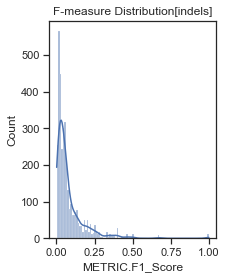

In [153]:
sns.histplot(results_finito2_indels['METRIC.F1_Score'], kde=True).set(title='F-measure Distribution[indels]')
sns.set(font_scale=1)
plt.show()

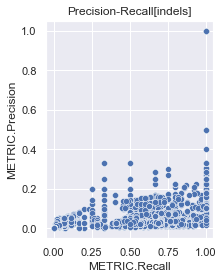

In [154]:
sns.scatterplot(x='METRIC.Recall', y='METRIC.Precision',data=results_finito2_indels)
plt.title('Precision-Recall[indels]')
plt.show()

In [155]:

results_finito2_indels['vcf1_label'] = (
    results_finito2_indels['vcf1'].astype(str) +
    " (" + results_finito2_indels['vcf1_Mapper'] + ", " +
    results_finito2_indels['vcf1_VariantCaller'] + ", " +
    results_finito2_indels['vcf1_isTrimmed'] + ", " +
    results_finito2_indels['vcf1_baseRecalibration'] + ")"
)

results_finito2_indels['vcf2_label'] = (
    results_finito2_indels['vcf2'].astype(str) +
    " (" + results_finito2_indels['vcf2_Mapper'] + ", " +
    results_finito2_indels['vcf2_VariantCaller'] + ", " +
    results_finito2_indels['vcf2_isTrimmed'] + ", " +
    results_finito2_indels['vcf2_baseRecalibration'] + ")"
)

In [156]:
results_finito2_indels

,QUERY.TOTAL,TRUTH.TP,QUERY.UNK,METRIC.Recall,TRUTH.TOTAL,METRIC.Precision,vcf2,QUERY.FP,METRIC.F1_Score,summary_file_indels,TRUTH.FN,vcf1,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration,vcf1_label,vcf2_label
0,343,59,0,1.000000,59,0.172012,1,284,0.293532,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","1 (BWA, Mutect, yes, yes)"
1,84,2,0,0.033898,59,0.023810,6,82,0.027972,/Users/P33833/Documents/Python Docs/Bioinforma...,57,1,BWA,Mutect,LL,yes,yes,BWA,Strelka,LL,yes,no,"1 (BWA, Mutect, yes, yes)","6 (BWA, Strelka, yes, no)"
2,84,1,0,0.016949,59,0.011905,4,83,0.013986,/Users/P33833/Documents/Python Docs/Bioinforma...,58,1,BWA,Mutect,LL,yes,yes,Bowtie,Strelka,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","4 (Bowtie, Strelka, yes, yes)"
3,307,42,0,0.711864,59,0.136808,3,265,0.229508,/Users/P33833/Documents/Python Docs/Bioinforma...,17,1,BWA,Mutect,LL,yes,yes,Bowtie,Mutect,LL,yes,yes,"1 (BWA, Mutect, yes, yes)","3 (Bowtie, Mutect, yes, yes)"
4,461,59,0,1.000000,59,0.127983,5,402,0.226923,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,no,"1 (BWA, Mutect, yes, yes)","5 (BWA, Mutect, yes, no)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,48,8,0,0.888889,9,0.166667,268,40,0.280702,/Users/P33833/Documents/Python Docs/Bioinforma...,1,272,Bowtie,Strelka,FD,no,no,Bowtie,Strelka,FD,no,yes,"272 (Bowtie, Strelka, no, no)","268 (Bowtie, Strelka, no, yes)"
6396,404,0,0,0.000000,9,0.000000,269,404,NaN,/Users/P33833/Documents/Python Docs/Bioinforma...,9,272,Bowtie,Strelka,FD,no,no,BWA,Mutect,FD,no,no,"272 (Bowtie, Strelka, no, no)","269 (BWA, Mutect, no, no)"
6397,60,7,0,0.777778,9,0.116667,270,53,0.202899,/Users/P33833/Documents/Python Docs/Bioinforma...,2,272,Bowtie,Strelka,FD,no,no,BWA,Strelka,FD,no,no,"272 (Bowtie, Strelka, no, no)","270 (BWA, Strelka, no, no)"
6398,610,0,0,0.000000,9,0.000000,271,610,NaN,/Users/P33833/Documents/Python Docs/Bioinforma...,9,272,Bowtie,Strelka,FD,no,no,Bowtie,Mutect,FD,no,no,"272 (Bowtie, Strelka, no, no)","271 (Bowtie, Mutect, no, no)"


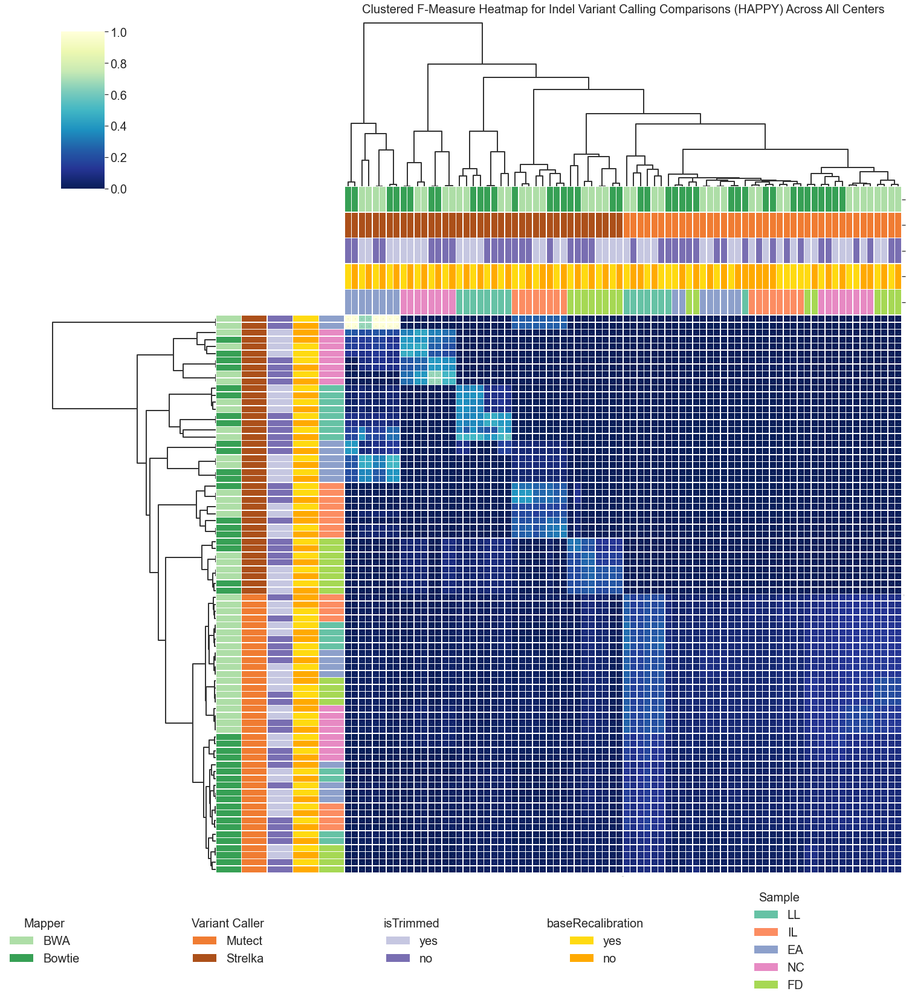

In [157]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Örnek pivot tablo oluşturma (f_measure için)
pivot_f = results_finito2_indels.pivot('vcf1_label', 'vcf2_label', 'METRIC.F1_Score')

# Pivot tablodaki NaN değerlerini -1 ile dolduralım:
pivot_f = pivot_f.fillna(0)


# --- SATIR VE SÜTUN ETİKETLERİ İÇİN ÖZNİTELİK TABLOLARI ---
# Satırlar: vcf1_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
row_attrs = results_finito2_indels.drop_duplicates("vcf1_label").set_index("vcf1_label")[
    ["vcf1_Mapper", "vcf1_VariantCaller", "vcf1_isTrimmed", "vcf1_baseRecalibration", "vcf1_Sample"]
]

# Sütunlar: vcf2_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
col_attrs = results_finito2_indels.drop_duplicates("vcf2_label").set_index("vcf2_label")[
    ["vcf2_Mapper", "vcf2_VariantCaller", "vcf2_isTrimmed", "vcf2_baseRecalibration", "vcf2_Sample"]
]

# --- HER ÖZNİTELİK İÇİN RENK PALETLERİNİN OLUŞTURULMASI ---

# SATIRLAR İÇİN:
# Mapper
lut_mapper = dict(zip(row_attrs["vcf1_Mapper"].unique(), 
                      sns.color_palette("Greens", len(row_attrs["vcf1_Mapper"].unique()))))
row_colors_mapper = row_attrs["vcf1_Mapper"].map(lut_mapper)

# VariantCaller
lut_variant = dict(zip(row_attrs["vcf1_VariantCaller"].unique(), 
                       sns.color_palette("Oranges_d", len(row_attrs["vcf1_VariantCaller"].unique()))))
row_colors_variant = row_attrs["vcf1_VariantCaller"].map(lut_variant)

# isTrimmed
lut_trimmed = dict(zip(row_attrs["vcf1_isTrimmed"].unique(), 
                       sns.color_palette("Purples", len(row_attrs["vcf1_isTrimmed"].unique()))))
row_colors_trimmed = row_attrs["vcf1_isTrimmed"].map(lut_trimmed)

# baseRecalibration
lut_recal = dict(zip(row_attrs["vcf1_baseRecalibration"].unique(), 
                     sns.color_palette("Wistia", len(row_attrs["vcf1_baseRecalibration"].unique()))))
row_colors_recal = row_attrs["vcf1_baseRecalibration"].map(lut_recal)

# Yeni: Sample
lut_sample = dict(zip(row_attrs["vcf1_Sample"].unique(), 
                      sns.color_palette("Set2", len(row_attrs["vcf1_Sample"].unique()))))
row_colors_sample = row_attrs["vcf1_Sample"].map(lut_sample)

# Tüm satır renklerini birleştiriyoruz:
row_colors = pd.concat([row_colors_mapper, row_colors_variant, row_colors_trimmed, row_colors_recal, row_colors_sample], axis=1)

# SÜTUNLAR İÇİN:
# Mapper
lut_mapper2 = dict(zip(col_attrs["vcf2_Mapper"].unique(), 
                       sns.color_palette("Greens", len(col_attrs["vcf2_Mapper"].unique()))))
col_colors_mapper = col_attrs["vcf2_Mapper"].map(lut_mapper2)

# VariantCaller
lut_variant2 = dict(zip(col_attrs["vcf2_VariantCaller"].unique(), 
                        sns.color_palette("Oranges_d", len(col_attrs["vcf2_VariantCaller"].unique()))))
col_colors_variant = col_attrs["vcf2_VariantCaller"].map(lut_variant2)

# isTrimmed
lut_trimmed2 = dict(zip(col_attrs["vcf2_isTrimmed"].unique(), 
                        sns.color_palette("Purples", len(col_attrs["vcf2_isTrimmed"].unique()))))
col_colors_trimmed = col_attrs["vcf2_isTrimmed"].map(lut_trimmed2)

# baseRecalibration
lut_recal2 = dict(zip(col_attrs["vcf2_baseRecalibration"].unique(), 
                      sns.color_palette("Wistia", len(col_attrs["vcf2_baseRecalibration"].unique()))))
col_colors_recal = col_attrs["vcf2_baseRecalibration"].map(lut_recal2)

# Yeni: Sample
lut_sample2 = dict(zip(col_attrs["vcf2_Sample"].unique(), 
                       sns.color_palette("Set2", len(col_attrs["vcf2_Sample"].unique()))))
col_colors_sample = col_attrs["vcf2_Sample"].map(lut_sample2)

# Tüm sütun renklerini birleştiriyoruz:
col_colors = pd.concat([col_colors_mapper, col_colors_variant, col_colors_trimmed, col_colors_recal, col_colors_sample], axis=1)

# --- CLUSTERED HEATMAP OLUŞTURMA ---
sns.set(font_scale=0)
g = sns.clustermap(
    pivot_f,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu_r",
    linewidths=0.5,
    row_colors=row_colors,
    col_colors=col_colors,
    figsize=(20,20),
    xticklabels=False,  # Sütun etiketlerini kapatır
    yticklabels=False   # Satır etiketlerini kapatır
)
g.ax_heatmap.set_title('Clustered F-Measure Heatmap for Indel Variant Calling Comparisons (HAPPY) Across All Centers', pad=500, size=20)

# Remove tick labels from the colored row and column colorbars:
if g.ax_row_colors is not None:
    g.ax_row_colors.set_xticks([])
    g.ax_row_colors.set_yticklabels([])

if g.ax_col_colors is not None:
    g.ax_col_colors.set_xticks([])
    g.ax_col_colors.set_yticklabels([])
    
g.cax.tick_params(labelsize=20)

# Dendrogram çizgilerinin kalınlığını arttırma:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)

# --- LEGEND OLUŞTURMA ---
# Legend için kullanılacak dictionary'ler ve başlıkları:
legend_dicts = [lut_mapper, lut_variant, lut_trimmed, lut_recal, lut_sample]
legend_titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "Sample"]
legend_params = {'fontsize': 20, 'title_fontsize': 20}

fig = g.fig
# 1 satırda 5 sütun olacak şekilde GridSpec (wspace ile boşluk ayarlanıyor)
gs = GridSpec(1, 5, figure=fig, wspace=0.5)
for i in range(5):
    ax = fig.add_subplot(gs[0, i])
    # Her legend için Patch objeleri oluşturuyoruz:
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=legend_titles[i], loc="center", frameon=False, bbox_to_anchor=(0, -0.08),prop={'size': 20}, **legend_params)
    ax.axis("off")

plt.savefig("HAPPY_Clustered_F-measure_Heatmap_with_Cluster_Colors_ALL_Centers_Indels.png", bbox_inches="tight")
plt.show()


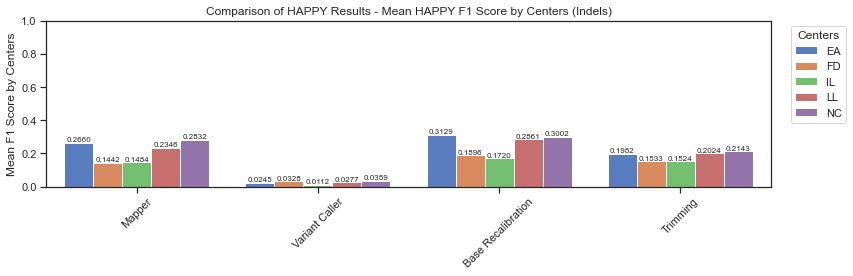

In [161]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Make a copy of the vcfeval results DataFrame
df_vcfeval = results_finito2_indels.copy()

# The DataFrame already contains separate columns for pipeline parameters:
#   vcf1_Mapper, vcf1_VariantCaller, vcf1_Sample, vcf1_isTrimmed, vcf1_baseRecalibration,
#   vcf2_Mapper, vcf2_VariantCaller, vcf2_Sample, vcf2_isTrimmed, vcf2_baseRecalibration

# 1. Filter for differences in Mapper only
filtered_mapper = df_vcfeval[
    (df_vcfeval['vcf1_Mapper'] != df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_mapper['METRIC.F1_Score'] = pd.to_numeric(filtered_mapper['METRIC.F1_Score'], errors='coerce')
grouped_mapper = filtered_mapper.groupby('vcf1_Sample')['METRIC.F1_Score'].mean().reset_index()
grouped_mapper['Parameter'] = 'Mapper'

# 2. Filter for differences in Variant Caller only
filtered_vc = df_vcfeval[
    (df_vcfeval['vcf1_VariantCaller'] != df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_vc['METRIC.F1_Score'] = pd.to_numeric(filtered_vc['METRIC.F1_Score'], errors='coerce')
grouped_vc = filtered_vc.groupby('vcf1_Sample')['METRIC.F1_Score'].mean().reset_index()
grouped_vc['Parameter'] = 'Variant Caller'

# 3. Filter for differences in Base Recalibration only
filtered_br = df_vcfeval[
    (df_vcfeval['vcf1_baseRecalibration'] != df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_br['METRIC.F1_Score'] = pd.to_numeric(filtered_br['METRIC.F1_Score'], errors='coerce')
grouped_br = filtered_br.groupby('vcf1_Sample')['METRIC.F1_Score'].mean().reset_index()
grouped_br['Parameter'] = 'Base Recalibration'

# 4. Filter for differences in Trimming only
filtered_trim = df_vcfeval[
    (df_vcfeval['vcf1_isTrimmed'] != df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_trim['METRIC.F1_Score'] = pd.to_numeric(filtered_trim['METRIC.F1_Score'], errors='coerce')
grouped_trim = filtered_trim.groupby('vcf1_Sample')['METRIC.F1_Score'].mean().reset_index()
grouped_trim['Parameter'] = 'Trimming'

# Concatenate all grouped DataFrames
grouped_vcfeval = pd.concat([grouped_mapper, grouped_vc, grouped_br, grouped_trim])
grouped_vcfeval['vcf1_Sample'] = grouped_vcfeval['vcf1_Sample'].str.upper()

# Plotting the bar plot for the averaged vcfeval F-measure values
sns.set(style="ticks")
plt.figure(figsize=(12, 4))
ax = sns.barplot(data=grouped_vcfeval, x='Parameter', y='METRIC.F1_Score', hue='vcf1_Sample',
                 ci=None, palette=sns.color_palette("muted"))

# Add data labels to each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.4f'),
                (p.get_x() + p.get_width() / 2, p.get_height()),
                ha='center', va='bottom', fontsize=8)

#ax.set(xticklabels=[])        # Remove x-axis tick labels
ax.tick_params(bottom=True)   # Remove x-axis ticks
ax.set(xlabel=None)            # Remove x-axis label
plt.ylabel('Mean F1 Score by Centers')
plt.title('Comparison of HAPPY Results - Mean HAPPY F1 Score by Centers (Indels)')
plt.legend(title='Centers', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45)
ax.set_ylim(0, 1)

plt.tight_layout()
plt.savefig("Comparison of HAPPY Results - Mean HAPPY F1_Score by Centers (Indels).png", bbox_inches='tight')  # PDF olarak kaydet
plt.show()



## 4.03.2025 - 20:37 - Eğer summary 0 çıktıysa tekrardan çalıştır. 

In [36]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

# New output directory for re-run results (when METRIC.F1_Score is invalid)
new_output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_04-03")
os.makedirs(new_output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    # Replace host base dir with container base dir.
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# Filter the VCF comparison DataFrame according to desired conditions.
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    #(vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &  
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &                         
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &           
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')                     
].copy()

# Adjust the TestCaseNo column: take the last space-separated token.
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map TestCaseNo to VCF filenames using the vcf_filenames_indels dictionary.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# Create a mapping from TestCaseNo to VariantCaller.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# Create VCF pairs (all combinations between two VCF files).
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# Optionally limit pairs (e.g., the first 128 pairs): vcf_pairs_indels = vcf_pairs_indels[:128]

# Function to normalize a list of dictionaries so they all have the same keys.
def normalize_metrics(metrics_list):
    all_keys = set()
    for d in metrics_list:
        all_keys.update(d.keys())
    all_keys = list(all_keys)
    norm_list = []
    for d in metrics_list:
        norm_list.append({k: d.get(k, None) for k in all_keys})
    return norm_list

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the .vcf.gz file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to container file paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    # Build the output prefix using the default (old) output directory.
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file exists, parse it.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        # Check if 'METRIC.F1_Score' is valid (not nan, None, or empty).
        if metrics and (metrics.get("METRIC.F1_Score") not in [None, ""] and not pd.isna(metrics.get("METRIC.F1_Score"))):
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            norm_metrics = normalize_metrics(metrics_list_indels)
            results_df_indels = pd.DataFrame(norm_metrics)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
            return (summary_file_indels, key1_indels, key2_indels)
        else:
            # If METRIC.F1_Score is invalid, re-run hap.py using the new output directory.
            pair_output_dir_indels = os.path.join(new_output_base_dir_indels, f"{key1_indels}_vs_{key2_indels}")
            os.makedirs(pair_output_dir_indels, exist_ok=True)
            output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
            summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # Convert the output prefix to container path.
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    
    # Construct the Docker command with --set-gt hom parameter.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py",  # Hap.py executable in the container
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels,
        "--set-gt", "het"  # Force genotype to homozygous
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Parallel Processing with ThreadPoolExecutor ---
results_indels = []
with ThreadPoolExecutor(max_workers=8) as executor:
    future_to_pair = {
        executor.submit(run_happy_docker_indels, truth_vcf, query_vcf, output_base_dir_indels, key1, key2): (key1, key2)
        for key1, truth_vcf, key2, query_vcf in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs"):
        pair = future_to_pair[future]
        try:
            result = future.result()
            if result is not None and os.path.exists(result[0]):
                results_indels.append(result)
                # Normalize metrics and update summary CSV after each successful result.
        except Exception as exc:
            tqdm.write(f"Error for pair {pair}: {exc}")

# Create final DataFrame and save final results to CSV.
norm_metrics = normalize_metrics(metrics_list_indels)
results_df_indels = pd.DataFrame(norm_metrics)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:   0%|          | 15/6400 [00:00<01:37, 65.27it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_66/1_vs_66', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR78908

Processing VCF pairs:   0%|          | 23/6400 [00:00<02:15, 47.18it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_74/1_vs_74', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR789

Processing VCF pairs:   0%|          | 26/6400 [02:57<33:08:51, 18.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_132/1_vs_132', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 33/6400 [02:59<8:12:40,  4.64s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_136/1_vs_136', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 36/6400 [02:59<5:46:01,  3.26s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_140/1_vs_140', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 38/6400 [03:02<4:54:46,  2.78s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_144/1_vs_144', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 45/6400 [03:05<2:42:42,  1.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_196/1_vs_196', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 47/6400 [03:05<1:56:43,  1.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_200/1_vs_200', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 52/6400 [03:05<1:01:45,  1.71it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_204/1_vs_204', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 54/6400 [03:06<46:47,  2.26it/s]  

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_208/1_vs_208', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 72/6400 [04:54<3:20:50,  1.90s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_1/2_vs_1', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 75/6400 [05:05<4:18:03,  2.45s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_3/2_vs_3', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 76/6400 [05:07<4:03:43,  2.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_5/2_vs_5', '--set-gt', 'het']


Processing VCF pairs:   1%|          | 78/6400 [05:10<3:36:45,  2.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_7/2_vs_7', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 80/6400 [05:11<2:36:20,  1.48s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_9/2_vs_9', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 82/6400 [05:11<1:59:18,  1.13s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11/2_vs_11', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 87/6400 [05:14<1:24:36,  1.24it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_13/2_vs_13', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR78908

Processing VCF pairs:   1%|▏         | 88/6400 [05:32<10:37:34,  6.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_65/2_vs_65', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 90/6400 [05:47<11:29:40,  6.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_66/2_vs_66', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 91/6400 [06:12<21:00:27, 11.99s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_67/2_vs_67', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 92/6400 [06:15<16:22:10,  9.34s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_68/2_vs_68', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 93/6400 [06:16<11:35:07,  6.61s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_69/2_vs_69', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 94/6400 [06:17<8:46:48,  5.01s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_70/2_vs_70', '--set-gt', 'het']


Processing VCF pairs:   1%|▏         | 95/6400 [06:18<6:58:33,  3.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_71/2_vs_71', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 96/6400 [06:19<5:18:10,  3.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_72/2_vs_72', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 97/6400 [06:35<11:55:27,  6.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_73/2_vs_73', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 98/6400 [07:12<27:40:05, 15.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_74/2_vs_74', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 99/6400 [07:26<26:45:25, 15.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_75/2_vs_75', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 100/6400 [07:28<19:41:06, 11.25s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_76/2_vs_76', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 101/6400 [07:31<15:33:31,  8.89s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_77/2_vs_77', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 102/6400 [07:44<17:33:34, 10.04s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_78/2_vs_78', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 103/6400 [07:54<17:37:22, 10.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_79/2_vs_79', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 104/6400 [07:57<13:57:49,  7.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_80/2_vs_80', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 105/6400 [07:58<10:12:20,  5.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_131/2_vs_131', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 112/6400 [08:19<7:36:03,  4.35s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_137/2_vs_137', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 114/6400 [08:32<8:48:19,  5.04s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_139/2_vs_139', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 116/6400 [08:42<8:47:04,  5.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_141/2_vs_141', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 118/6400 [08:59<10:28:05,  6.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_143/2_vs_143', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 120/6400 [09:13<11:06:47,  6.37s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_193/2_vs_193', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 122/6400 [09:20<9:37:33,  5.52s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_194/2_vs_194', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 123/6400 [09:30<11:58:16,  6.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_195/2_vs_195', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 124/6400 [09:39<12:52:40,  7.39s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_196/2_vs_196', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 125/6400 [09:56<18:02:30, 10.35s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_197/2_vs_197', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 126/6400 [10:09<19:10:38, 11.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_198/2_vs_198', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 127/6400 [10:10<13:49:42,  7.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_199/2_vs_199', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 128/6400 [10:16<13:01:14,  7.47s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_200/2_vs_200', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 129/6400 [10:23<12:41:42,  7.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_201/2_vs_201', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 130/6400 [10:30<12:48:20,  7.35s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_202/2_vs_202', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 131/6400 [10:46<16:54:23,  9.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_203/2_vs_203', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 132/6400 [10:49<13:43:14,  7.88s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_204/2_vs_204', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 133/6400 [11:01<15:32:41,  8.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_205/2_vs_205', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 134/6400 [11:03<12:00:07,  6.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_206/2_vs_206', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 135/6400 [11:18<16:25:40,  9.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_207/2_vs_207', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 136/6400 [11:37<21:22:41, 12.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_208/2_vs_208', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 137/6400 [11:38<15:42:24,  9.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_257/2_vs_257', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 138/6400 [11:44<14:08:32,  8.13s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_258/2_vs_258', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 139/6400 [11:54<14:52:43,  8.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_259/2_vs_259', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 140/6400 [11:59<12:53:57,  7.42s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_260/2_vs_260', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 141/6400 [12:08<13:57:23,  8.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_261/2_vs_261', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 142/6400 [12:17<14:27:09,  8.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_262/2_vs_262', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 143/6400 [12:25<14:23:51,  8.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_263/2_vs_263', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 144/6400 [12:32<13:15:52,  7.63s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_264/2_vs_264', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 145/6400 [12:52<19:46:23, 11.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_265/2_vs_265', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 146/6400 [13:01<18:34:25, 10.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_266/2_vs_266', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 147/6400 [13:06<15:48:07,  9.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_267/2_vs_267', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 148/6400 [13:14<14:57:50,  8.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_268/2_vs_268', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 149/6400 [13:21<14:18:20,  8.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_269/2_vs_269', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 150/6400 [13:32<15:37:07,  9.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_270/2_vs_270', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 151/6400 [13:46<18:06:35, 10.43s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_271/2_vs_271', '--set-gt', 'het']


Processing VCF pairs:   2%|▏         | 152/6400 [13:47<13:18:14,  7.67s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_272/2_vs_272', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 171/6400 [14:03<3:01:08,  1.74s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_66/3_vs_66', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR789

Processing VCF pairs:   3%|▎         | 173/6400 [14:23<7:13:12,  4.17s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_70/3_vs_70', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 175/6400 [14:31<7:01:44,  4.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_72/3_vs_72', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 177/6400 [14:42<7:41:53,  4.45s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_74/3_vs_74', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 179/6400 [14:48<6:58:14,  4.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_76/3_vs_76', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 181/6400 [15:09<10:28:05,  6.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_78/3_vs_78', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 183/6400 [15:21<10:19:38,  5.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_80/3_vs_80', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 188/6400 [15:55<11:15:48,  6.53s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_130/3_vs_130', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SR

Processing VCF pairs:   3%|▎         | 189/6400 [16:02<11:38:47,  6.75s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_134/3_vs_134', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 191/6400 [16:11<10:29:27,  6.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_136/3_vs_136', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 193/6400 [16:27<11:16:56,  6.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_138/3_vs_138', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 195/6400 [16:28<8:16:39,  4.80s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_140/3_vs_140', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 197/6400 [16:45<10:10:30,  5.91s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_142/3_vs_142', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 199/6400 [17:09<13:16:59,  7.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_144/3_vs_144', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 201/6400 [17:40<17:16:26, 10.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_194/3_vs_194', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 203/6400 [17:44<13:18:00,  7.73s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_196/3_vs_196', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 205/6400 [17:50<10:42:59,  6.23s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_198/3_vs_198', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 207/6400 [17:54<8:37:53,  5.02s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_200/3_vs_200', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 209/6400 [18:05<8:43:13,  5.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_202/3_vs_202', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 211/6400 [18:06<6:27:35,  3.76s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_204/3_vs_204', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 213/6400 [18:15<6:54:53,  4.02s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_206/3_vs_206', '--set-gt', 'het']


Processing VCF pairs:   3%|▎         | 215/6400 [18:43<12:00:21,  6.99s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/3_vs_208/3_vs_208', '--set-gt', 'het']


Processing VCF pairs:   4%|▎         | 231/6400 [19:22<6:18:27,  3.68s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_1/4_vs_1', '--set-gt', 'het']


Processing VCF pairs:   4%|▎         | 234/6400 [19:24<4:44:25,  2.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_3/4_vs_3', '--set-gt', 'het']


Processing VCF pairs:   4%|▎         | 237/6400 [19:29<4:10:56,  2.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_5/4_vs_5', '--set-gt', 'het']


Processing VCF pairs:   4%|▎         | 239/6400 [19:30<3:09:40,  1.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_7/4_vs_7', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 241/6400 [19:45<6:04:03,  3.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_9/4_vs_9', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 242/6400 [19:46<4:47:59,  2.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_11/4_vs_11', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 244/6400 [19:50<4:22:05,  2.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_13/4_vs_13', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 246/6400 [20:10<8:14:15,  4.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_15/4_vs_15', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 248/6400 [20:12<6:13:47,  3.65s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_65/4_vs_65', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 250/6400 [20:13<4:38:14,  2.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_66/4_vs_66', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 251/6400 [20:21<7:16:35,  4.26s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_67/4_vs_67', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 252/6400 [20:21<5:19:02,  3.11s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_68/4_vs_68', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 253/6400 [20:43<14:35:45,  8.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_69/4_vs_69', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 254/6400 [20:44<11:04:17,  6.49s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_70/4_vs_70', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 255/6400 [20:48<9:42:10,  5.68s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_71/4_vs_71', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 256/6400 [21:11<18:20:40, 10.75s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_72/4_vs_72', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 257/6400 [21:16<15:28:06,  9.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_73/4_vs_73', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 258/6400 [21:26<15:46:41,  9.25s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_74/4_vs_74', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 259/6400 [21:55<26:04:51, 15.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_75/4_vs_75', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 260/6400 [21:55<18:27:28, 10.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_76/4_vs_76', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 261/6400 [22:02<16:17:44,  9.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_77/4_vs_77', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 262/6400 [22:04<12:20:47,  7.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_78/4_vs_78', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 263/6400 [22:21<17:30:52, 10.27s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_79/4_vs_79', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 264/6400 [22:24<13:40:25,  8.02s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_80/4_vs_80', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 265/6400 [22:40<17:41:34, 10.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_131/4_vs_131', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 271/6400 [22:53<10:12:37,  6.00s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_137/4_vs_137', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 274/6400 [23:04<9:02:29,  5.31s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_139/4_vs_139', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 276/6400 [23:11<8:09:44,  4.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_141/4_vs_141', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 278/6400 [23:29<10:22:23,  6.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_143/4_vs_143', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 280/6400 [23:34<8:28:57,  4.99s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_193/4_vs_193', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 282/6400 [23:41<7:32:56,  4.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_194/4_vs_194', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 283/6400 [23:55<12:28:10,  7.34s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_195/4_vs_195', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 284/6400 [24:01<11:55:38,  7.02s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_196/4_vs_196', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 285/6400 [24:24<20:07:17, 11.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_197/4_vs_197', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 286/6400 [24:29<16:29:01,  9.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_198/4_vs_198', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 287/6400 [24:36<15:22:52,  9.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_199/4_vs_199', '--set-gt', 'het']


Processing VCF pairs:   4%|▍         | 288/6400 [24:48<16:39:56,  9.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_200/4_vs_200', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 289/6400 [24:50<12:41:43,  7.48s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_201/4_vs_201', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 290/6400 [25:05<16:21:52,  9.64s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_202/4_vs_202', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 291/6400 [25:13<15:55:43,  9.39s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_203/4_vs_203', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 292/6400 [25:16<12:17:12,  7.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_204/4_vs_204', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 293/6400 [25:25<13:27:46,  7.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_205/4_vs_205', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 294/6400 [25:29<11:32:51,  6.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_206/4_vs_206', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 295/6400 [25:39<12:52:42,  7.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_207/4_vs_207', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 296/6400 [25:54<16:53:41,  9.96s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_208/4_vs_208', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 297/6400 [26:06<17:34:17, 10.37s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_257/4_vs_257', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 298/6400 [26:17<17:58:35, 10.61s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_258/4_vs_258', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 299/6400 [26:20<14:11:12,  8.37s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_259/4_vs_259', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 300/6400 [26:31<15:49:18,  9.34s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_260/4_vs_260', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 301/6400 [26:32<11:12:48,  6.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_261/4_vs_261', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 302/6400 [26:45<14:49:11,  8.75s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_262/4_vs_262', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 303/6400 [26:57<16:12:12,  9.57s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_263/4_vs_263', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 304/6400 [26:58<11:41:55,  6.91s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_264/4_vs_264', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 305/6400 [27:18<18:27:07, 10.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_265/4_vs_265', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 306/6400 [27:22<15:06:15,  8.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_266/4_vs_266', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 307/6400 [27:32<15:28:34,  9.14s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_267/4_vs_267', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 308/6400 [27:49<19:32:07, 11.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_268/4_vs_268', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 309/6400 [27:56<17:00:12, 10.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_269/4_vs_269', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 310/6400 [28:06<17:11:17, 10.16s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_270/4_vs_270', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 311/6400 [28:18<17:55:50, 10.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_271/4_vs_271', '--set-gt', 'het']


Processing VCF pairs:   5%|▍         | 312/6400 [28:18<12:49:35,  7.58s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/4_vs_272/4_vs_272', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 329/6400 [28:28<3:20:31,  1.98s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_66/5_vs_66', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 332/6400 [28:31<2:53:23,  1.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_68/5_vs_68', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 333/6400 [28:51<11:44:34,  6.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_70/5_vs_70', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 335/6400 [28:58<10:02:52,  5.96s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_72/5_vs_72', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 337/6400 [29:20<12:31:37,  7.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_74/5_vs_74', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 339/6400 [29:21<9:04:45,  5.39s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_76/5_vs_76', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 341/6400 [29:43<11:53:49,  7.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_78/5_vs_78', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 343/6400 [29:54<11:15:08,  6.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_80/5_vs_80', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 345/6400 [30:38<18:52:01, 11.22s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_132/5_vs_132', '--set-gt', 'het']


Processing VCF pairs:   5%|▌         | 349/6400 [30:42<13:45:36,  8.19s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_136/5_vs_136', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 353/6400 [30:59<11:42:24,  6.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_140/5_vs_140', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 357/6400 [31:01<8:28:38,  5.05s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_144/5_vs_144', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 361/6400 [31:21<8:28:45,  5.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_196/5_vs_196', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 365/6400 [31:23<6:09:08,  3.67s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_200/5_vs_200', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 369/6400 [31:45<7:04:26,  4.22s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_204/5_vs_204', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 373/6400 [31:57<6:26:50,  3.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/5_vs_208/5_vs_208', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 393/6400 [32:46<2:33:59,  1.54s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_1/6_vs_1', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bow

Processing VCF pairs:   6%|▌         | 396/6400 [32:55<3:19:21,  1.99s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_5/6_vs_5', '--set-gt', 'het']


Processing VCF pairs:   6%|▌         | 398/6400 [32:57<2:46:41,  1.67s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_7/6_vs_7', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 400/6400 [33:23<8:31:08,  5.11s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_9/6_vs_9', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 402/6400 [33:24<6:06:08,  3.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_11/6_vs_11', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 404/6400 [33:32<6:22:35,  3.83s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_13/6_vs_13', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 406/6400 [33:38<5:53:09,  3.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_15/6_vs_15', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 408/6400 [33:55<8:28:59,  5.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_65/6_vs_65', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 411/6400 [33:56<4:23:12,  2.64s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_66/6_vs_66', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_b

Processing VCF pairs:   6%|▋         | 412/6400 [33:57<3:12:18,  1.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_68/6_vs_68', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 413/6400 [34:18<12:59:54,  7.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_69/6_vs_69', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 414/6400 [34:24<11:48:56,  7.11s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_70/6_vs_70', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 415/6400 [34:33<12:46:01,  7.68s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_71/6_vs_71', '--set-gt', 'het']


Processing VCF pairs:   6%|▋         | 416/6400 [34:39<11:52:54,  7.15s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_72/6_vs_72', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 417/6400 [34:58<18:09:18, 10.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_73/6_vs_73', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 418/6400 [35:00<13:26:21,  8.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_74/6_vs_74', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 419/6400 [35:37<28:04:09, 16.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_75/6_vs_75', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 420/6400 [35:38<19:59:26, 12.03s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_76/6_vs_76', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 421/6400 [35:42<16:13:51,  9.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_77/6_vs_77', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 422/6400 [35:44<12:15:20,  7.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_78/6_vs_78', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 423/6400 [36:03<17:47:09, 10.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_79/6_vs_79', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 424/6400 [36:10<16:15:54,  9.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_80/6_vs_80', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 425/6400 [36:12<12:17:03,  7.40s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_129/6_vs_129', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 426/6400 [36:22<13:37:09,  8.21s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_131/6_vs_131', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 428/6400 [36:35<12:35:32,  7.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_133/6_vs_133', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 430/6400 [36:51<12:52:56,  7.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_135/6_vs_135', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 432/6400 [37:13<14:35:06,  8.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_137/6_vs_137', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 434/6400 [37:16<10:54:41,  6.58s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_139/6_vs_139', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 436/6400 [37:22<9:10:26,  5.54s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_141/6_vs_141', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 438/6400 [37:41<10:55:04,  6.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_143/6_vs_143', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 440/6400 [37:48<9:24:39,  5.68s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_193/6_vs_193', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 442/6400 [37:49<6:53:45,  4.17s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_194/6_vs_194', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 443/6400 [37:54<7:06:50,  4.30s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_195/6_vs_195', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 444/6400 [38:07<11:24:40,  6.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_196/6_vs_196', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 445/6400 [38:49<29:08:25, 17.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_197/6_vs_197', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 447/6400 [38:51<14:59:44,  9.07s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_198/6_vs_198', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR78

Processing VCF pairs:   7%|▋         | 448/6400 [38:55<12:32:32,  7.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_200/6_vs_200', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 449/6400 [38:57<9:51:38,  5.97s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_201/6_vs_201', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 450/6400 [39:16<16:14:36,  9.83s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_202/6_vs_202', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 451/6400 [39:26<16:08:06,  9.76s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_203/6_vs_203', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 452/6400 [39:32<14:11:23,  8.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_204/6_vs_204', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 453/6400 [39:43<15:44:42,  9.53s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_205/6_vs_205', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 454/6400 [39:46<12:01:38,  7.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_206/6_vs_206', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 455/6400 [39:50<10:37:47,  6.44s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_207/6_vs_207', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 456/6400 [40:18<21:10:00, 12.82s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_208/6_vs_208', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 457/6400 [40:23<17:39:35, 10.70s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_257/6_vs_257', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 458/6400 [40:25<13:08:51,  7.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_258/6_vs_258', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 459/6400 [40:39<16:17:16,  9.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_259/6_vs_259', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 460/6400 [40:43<13:21:11,  8.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_260/6_vs_260', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 461/6400 [40:46<10:54:23,  6.61s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_261/6_vs_261', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 462/6400 [40:59<13:57:30,  8.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_262/6_vs_262', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 463/6400 [41:10<14:58:26,  9.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_263/6_vs_263', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 464/6400 [41:20<15:18:35,  9.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_264/6_vs_264', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 465/6400 [41:39<20:15:40, 12.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_265/6_vs_265', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 466/6400 [41:46<17:51:50, 10.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_266/6_vs_266', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 467/6400 [41:47<12:43:21,  7.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_267/6_vs_267', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 468/6400 [41:56<13:39:52,  8.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_268/6_vs_268', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 469/6400 [42:07<14:43:14,  8.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_269/6_vs_269', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 470/6400 [42:15<14:34:32,  8.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_270/6_vs_270', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 471/6400 [42:29<16:43:23, 10.15s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_271/6_vs_271', '--set-gt', 'het']


Processing VCF pairs:   7%|▋         | 472/6400 [42:35<14:50:41,  9.02s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/6_vs_272/6_vs_272', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 489/6400 [42:47<33:39,  2.93it/s]   

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_66/7_vs_66', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 491/6400 [42:57<2:54:44,  1.77s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_68/7_vs_68', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 493/6400 [43:05<3:59:05,  2.43s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_70/7_vs_70', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 495/6400 [43:25<7:34:27,  4.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_72/7_vs_72', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 497/6400 [43:30<6:38:48,  4.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_74/7_vs_74', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 499/6400 [43:32<5:14:50,  3.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_76/7_vs_76', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 501/6400 [43:53<8:41:08,  5.30s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_78/7_vs_78', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 503/6400 [44:10<10:16:58,  6.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_80/7_vs_80', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 505/6400 [44:29<11:47:33,  7.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_130/7_vs_130', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 507/6400 [44:41<11:14:39,  6.87s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_132/7_vs_132', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 509/6400 [44:43<8:29:16,  5.19s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_134/7_vs_134', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 511/6400 [45:04<10:59:07,  6.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_136/7_vs_136', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 513/6400 [45:16<10:41:38,  6.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_138/7_vs_138', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 515/6400 [45:18<8:01:11,  4.91s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_140/7_vs_140', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 517/6400 [45:35<9:33:01,  5.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_142/7_vs_142', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 519/6400 [45:51<10:50:07,  6.63s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_144/7_vs_144', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 521/6400 [46:13<12:49:37,  7.85s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_194/7_vs_194', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 523/6400 [46:27<12:19:33,  7.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_196/7_vs_196', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 525/6400 [46:30<9:32:53,  5.85s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_198/7_vs_198', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 527/6400 [46:42<9:37:44,  5.90s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_200/7_vs_200', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 529/6400 [46:58<10:38:02,  6.52s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_202/7_vs_202', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 531/6400 [46:59<7:35:35,  4.66s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_204/7_vs_204', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 533/6400 [47:13<8:39:58,  5.32s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_206/7_vs_206', '--set-gt', 'het']


Processing VCF pairs:   8%|▊         | 535/6400 [47:33<11:04:25,  6.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/7_vs_208/7_vs_208', '--set-gt', 'het']


Processing VCF pairs:   9%|▊         | 553/6400 [47:45<2:33:06,  1.57s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_1/8_vs_1', '--set-gt', 'het']


Processing VCF pairs:   9%|▊         | 554/6400 [48:12<14:45:46,  9.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_3/8_vs_3', '--set-gt', 'het']


Processing VCF pairs:   9%|▊         | 556/6400 [48:15<11:13:32,  6.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_5/8_vs_5', '--set-gt', 'het']


Processing VCF pairs:   9%|▊         | 558/6400 [48:19<8:40:39,  5.35s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_7/8_vs_7', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 560/6400 [48:36<10:23:03,  6.40s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_9/8_vs_9', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 562/6400 [48:39<7:57:33,  4.91s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_11/8_vs_11', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 564/6400 [48:41<5:54:17,  3.64s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_13/8_vs_13', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 566/6400 [48:51<6:37:30,  4.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_15/8_vs_15', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 568/6400 [49:08<8:46:53,  5.42s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_65/8_vs_65', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 570/6400 [49:09<6:22:34,  3.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_66/8_vs_66', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 571/6400 [49:09<4:36:01,  2.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_67/8_vs_67', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 572/6400 [49:11<4:18:29,  2.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_68/8_vs_68', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 573/6400 [49:31<12:27:48,  7.70s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_69/8_vs_69', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 574/6400 [49:37<11:38:54,  7.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_70/8_vs_70', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 575/6400 [49:41<10:06:00,  6.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_71/8_vs_71', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 576/6400 [49:44<8:30:32,  5.26s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_72/8_vs_72', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 577/6400 [50:05<16:21:49, 10.12s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_73/8_vs_73', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 578/6400 [50:08<12:53:52,  7.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_74/8_vs_74', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 579/6400 [50:35<21:57:05, 13.58s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_75/8_vs_75', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 580/6400 [50:36<15:43:06,  9.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_76/8_vs_76', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 581/6400 [50:38<12:05:53,  7.48s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_77/8_vs_77', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 582/6400 [50:42<10:18:14,  6.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_78/8_vs_78', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 583/6400 [51:00<16:06:27,  9.97s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_79/8_vs_79', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 584/6400 [51:05<13:50:19,  8.57s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_80/8_vs_80', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 585/6400 [51:06<10:04:20,  6.24s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_129/8_vs_129', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 586/6400 [51:27<17:03:42, 10.56s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_131/8_vs_131', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 588/6400 [51:27<12:06:52,  7.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_133/8_vs_133', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 590/6400 [51:35<10:16:07,  6.36s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_135/8_vs_135', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 592/6400 [52:00<13:21:14,  8.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_137/8_vs_137', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 594/6400 [52:02<9:49:08,  6.09s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_139/8_vs_139', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 596/6400 [52:04<7:17:58,  4.53s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_141/8_vs_141', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 598/6400 [52:24<9:56:28,  6.17s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_143/8_vs_143', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 600/6400 [52:31<8:32:11,  5.30s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_193/8_vs_193', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 602/6400 [52:49<10:24:34,  6.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_194/8_vs_194', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 603/6400 [52:50<7:48:30,  4.85s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_195/8_vs_195', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 604/6400 [52:55<8:00:36,  4.98s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_196/8_vs_196', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 605/6400 [53:22<18:24:19, 11.43s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_197/8_vs_197', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 606/6400 [53:26<14:45:00,  9.16s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_198/8_vs_198', '--set-gt', 'het']


Processing VCF pairs:   9%|▉         | 607/6400 [53:31<12:56:08,  8.04s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_199/8_vs_199', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 608/6400 [53:31<9:12:55,  5.73s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_200/8_vs_200', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 609/6400 [53:40<10:35:48,  6.59s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_201/8_vs_201', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 610/6400 [53:49<11:37:21,  7.23s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_202/8_vs_202', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 611/6400 [54:10<18:31:20, 11.52s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_203/8_vs_203', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 612/6400 [54:16<15:33:53,  9.68s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_204/8_vs_204', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 613/6400 [54:17<11:43:15,  7.29s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_205/8_vs_205', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 614/6400 [54:22<10:30:51,  6.54s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_206/8_vs_206', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 615/6400 [54:31<11:33:35,  7.19s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_207/8_vs_207', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 616/6400 [54:48<16:13:00, 10.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_208/8_vs_208', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 617/6400 [54:52<13:24:35,  8.35s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_257/8_vs_257', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 618/6400 [55:03<14:31:41,  9.05s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_258/8_vs_258', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 619/6400 [55:07<12:07:26,  7.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_259/8_vs_259', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 620/6400 [55:09<9:20:28,  5.82s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_260/8_vs_260', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 621/6400 [55:21<12:46:34,  7.96s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_261/8_vs_261', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 622/6400 [55:37<16:27:05, 10.25s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_262/8_vs_262', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 623/6400 [55:42<13:54:14,  8.66s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_263/8_vs_263', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 624/6400 [55:44<10:35:46,  6.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_264/8_vs_264', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 625/6400 [56:01<15:51:55,  9.89s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_265/8_vs_265', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 626/6400 [56:07<14:00:57,  8.74s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_266/8_vs_266', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 627/6400 [56:14<13:09:53,  8.21s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_267/8_vs_267', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 628/6400 [56:21<12:22:48,  7.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_268/8_vs_268', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 629/6400 [56:30<13:09:47,  8.21s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_269/8_vs_269', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 630/6400 [56:33<10:16:09,  6.41s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_270/8_vs_270', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 631/6400 [56:53<17:07:17, 10.68s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_271/8_vs_271', '--set-gt', 'het']


Processing VCF pairs:  10%|▉         | 632/6400 [56:57<13:55:04,  8.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/8_vs_272/8_vs_272', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 648/6400 [57:04<3:04:21,  1.92s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_66/9_vs_66', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 651/6400 [57:07<2:40:27,  1.67s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_68/9_vs_68', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 653/6400 [57:28<6:57:14,  4.36s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_70/9_vs_70', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 655/6400 [57:30<5:22:38,  3.37s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_72/9_vs_72', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 657/6400 [57:39<5:52:13,  3.68s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_74/9_vs_74', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 659/6400 [57:53<7:20:31,  4.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_76/9_vs_76', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 661/6400 [57:57<6:03:31,  3.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_78/9_vs_78', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 663/6400 [58:18<9:20:36,  5.86s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_80/9_vs_80', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 665/6400 [59:15<20:02:46, 12.58s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_132/9_vs_132', '--set-gt', 'het']


Processing VCF pairs:  10%|█         | 672/6400 [59:16<9:55:30,  6.24s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_136/9_vs_136', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 673/6400 [59:41<18:54:58, 11.89s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_140/9_vs_140', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 677/6400 [59:42<13:18:51,  8.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_144/9_vs_144', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 684/6400 [59:45<6:49:05,  4.29s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_196/9_vs_196', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 686/6400 [59:57<7:39:56,  4.83s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_200/9_vs_200', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 692/6400 [1:00:00<4:04:48,  2.57s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_204/9_vs_204', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 693/6400 [1:00:13<9:05:23,  5.73s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/9_vs_208/9_vs_208', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 712/6400 [1:01:17<3:21:20,  2.12s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_1/10_vs_1', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 715/6400 [1:01:19<2:39:48,  1.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_3/10_vs_3', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 716/6400 [1:01:45<14:23:21,  9.11s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_5/10_vs_5', '--set-gt', 'het']


Processing VCF pairs:  11%|█         | 718/6400 [1:01:46<10:11:25,  6.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_7/10_vs_7', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 720/6400 [1:01:46<7:16:38,  4.61s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_9/10_vs_9', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 722/6400 [1:01:48<5:30:24,  3.49s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_11/10_vs_11', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 724/6400 [1:01:49<3:58:01,  2.52s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_13/10_vs_13', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 726/6400 [1:02:05<6:35:23,  4.18s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_15/10_vs_15', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 728/6400 [1:02:06<4:51:23,  3.08s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_65/10_vs_65', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 730/6400 [1:02:07<3:45:05,  2.38s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_66/10_vs_66', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 731/6400 [1:02:08<2:54:08,  1.84s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_67/10_vs_67', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 732/6400 [1:02:08<2:18:09,  1.46s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_68/10_vs_68', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 733/6400 [1:02:09<2:03:45,  1.31s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_69/10_vs_69', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 734/6400 [1:02:11<2:13:40,  1.42s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_70/10_vs_70', '--set-gt', 'het']


Processing VCF pairs:  11%|█▏        | 735/6400 [1:02:11<1:44:06,  1.10s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_71/10_vs_71', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 736/6400 [1:02:27<8:39:19,  5.50s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_72/10_vs_72', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 737/6400 [1:02:32<8:22:12,  5.32s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_73/10_vs_73', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 738/6400 [1:02:34<6:59:48,  4.45s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_74/10_vs_74', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 739/6400 [1:02:40<7:24:27,  4.71s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_75/10_vs_75', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 740/6400 [1:02:41<5:58:08,  3.80s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_76/10_vs_76', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 742/6400 [1:02:46<4:31:21,  2.88s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_77/10_vs_77', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/

Processing VCF pairs:  12%|█▏        | 743/6400 [1:02:49<4:29:19,  2.86s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_79/10_vs_79', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 744/6400 [1:02:58<7:28:00,  4.75s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_80/10_vs_80', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 745/6400 [1:03:05<8:17:15,  5.28s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_131/10_vs_131', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 751/6400 [1:03:07<4:17:11,  2.73s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_137/10_vs_137', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 754/6400 [1:03:11<3:38:00,  2.32s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_139/10_vs_139', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 756/6400 [1:03:18<4:13:54,  2.70s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_141/10_vs_141', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 758/6400 [1:03:19<3:06:57,  1.99s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_143/10_vs_143', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 760/6400 [1:03:21<2:48:40,  1.79s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_193/10_vs_193', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 762/6400 [1:03:25<2:56:41,  1.88s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_194/10_vs_194', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 763/6400 [1:03:35<6:24:37,  4.09s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_195/10_vs_195', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TEST

Processing VCF pairs:  12%|█▏        | 765/6400 [1:03:37<5:02:31,  3.22s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_197/10_vs_197', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 766/6400 [1:03:42<5:39:30,  3.62s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_198/10_vs_198', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 767/6400 [1:03:50<8:03:55,  5.15s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_199/10_vs_199', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 768/6400 [1:03:54<7:31:02,  4.81s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_200/10_vs_200', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 769/6400 [1:03:56<5:47:33,  3.70s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_201/10_vs_201', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 770/6400 [1:04:02<7:04:08,  4.52s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_202/10_vs_202', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 771/6400 [1:04:03<5:34:49,  3.57s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_203/10_vs_203', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 772/6400 [1:04:05<4:44:45,  3.04s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_204/10_vs_204', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 773/6400 [1:04:12<6:40:51,  4.27s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_205/10_vs_205', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 774/6400 [1:04:14<5:33:04,  3.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_206/10_vs_206', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 775/6400 [1:04:17<5:09:29,  3.30s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_207/10_vs_207', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 776/6400 [1:04:19<4:46:58,  3.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_208/10_vs_208', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 777/6400 [1:04:25<5:51:15,  3.75s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_257/10_vs_257', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 778/6400 [1:04:29<6:04:02,  3.89s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_258/10_vs_258', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 779/6400 [1:04:36<7:39:51,  4.91s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_259/10_vs_259', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 780/6400 [1:04:37<5:45:25,  3.69s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_260/10_vs_260', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 781/6400 [1:04:38<4:32:39,  2.91s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_261/10_vs_261', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 782/6400 [1:04:40<4:14:40,  2.72s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_262/10_vs_262', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 783/6400 [1:04:47<6:09:32,  3.95s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_263/10_vs_263', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 784/6400 [1:04:49<4:59:26,  3.20s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_264/10_vs_264', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 785/6400 [1:04:53<5:30:08,  3.53s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_265/10_vs_265', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 786/6400 [1:05:00<7:10:12,  4.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_266/10_vs_266', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 787/6400 [1:05:01<5:31:40,  3.55s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_267/10_vs_267', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 788/6400 [1:05:03<4:33:15,  2.92s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_268/10_vs_268', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 789/6400 [1:05:11<7:10:19,  4.60s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_269/10_vs_269', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 790/6400 [1:05:14<6:19:36,  4.06s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_270/10_vs_270', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 791/6400 [1:05:14<4:35:17,  2.94s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_271/10_vs_271', '--set-gt', 'het']


Processing VCF pairs:  12%|█▏        | 792/6400 [1:05:15<3:21:46,  2.16s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/10_vs_272/10_vs_272', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 811/6400 [1:05:24<1:08:28,  1.36it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_66/11_vs_66', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCAS

Processing VCF pairs:  13%|█▎        | 814/6400 [1:05:34<2:15:01,  1.45s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_70/11_vs_70', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 816/6400 [1:05:36<2:11:21,  1.41s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_72/11_vs_72', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 818/6400 [1:05:38<1:51:04,  1.19s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_74/11_vs_74', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 819/6400 [1:05:39<2:09:11,  1.39s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_76/11_vs_76', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 821/6400 [1:05:52<4:32:21,  2.93s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_78/11_vs_78', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 823/6400 [1:05:54<3:29:27,  2.25s/it]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_80/11_vs_80', '--set-gt', 'het']


Processing VCF pairs:  13%|█▎        | 842/6400 [1:07:20<3:47:05,  2.45s/it] 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/11_vs_144/11_vs_144', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.

Processing VCF pairs:  13%|█▎        | 842/6400 [1:07:25<7:25:03,  4.80s/it]


Error running Hap.py for vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         1035
[I] Non-reference VCF records: 1035
[I] Total VCF records:         133
[I] Non-reference VCF records: 0
Traceback (most recent call last):
  File "/opt/hap.py/bin/hap.py", line 540, in <module>
    main()
  File "/opt/hap.py/bin/hap.py", line 459, in main
    res = runParallel(pool, Haplo.xcmp.xcmpWrapper, args.locations, args)
  File "/opt/hap.py/lib/python27/Tools/parallel.py", line 97, in runParallel
    result = pool.map(parMapper, izip(par, repeat( { "fun": fun, "args": args, "kwargs": kwargs } )))
  File "/usr/lib/python2.7/multiprocessing/pool.py", line 253, in map
    return self.map_async(func, iterable, chunksize).get()
  File "/usr/lib/python2.7/multiprocessing/pool.py", line 5

Error running Hap.py for vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: [I] Total VCF records:         1035
[I] Non-reference VCF records: 1035
[I] Total VCF records:         123
[I] Non-reference VCF records: 0
2025-03-05 08:11:21,770 WARNING  No calls for location chr13 in query!
Traceback (most recent call last):
  File "/opt/hap.py/bin/hap.py", line 540, in <module>
    main()
  File "/opt/hap.py/bin/hap.py", line 459, in main
    res = runParallel(pool, Haplo.xcmp.xcmpWrapper, args.locations, args)
  File "/opt/hap.py/lib/python27/Tools/parallel.py", line 97, in runParallel
    result = pool.map(parMapper, izip(par, repeat( { "fun": fun, "args": args, "kwargs": kwargs } )))
  File "/usr/lib/python2.7/multiprocessing/pool.py", line 253, in map
    return self.map_async(f

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/12_vs_66/12_vs_66', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTC

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/12_vs_79/12_vs_79', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/12_vs_197/12_vs_197', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/12_vs_258/12_vs_258', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/12_vs_271/12_vs_271', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.rec

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/13_vs_144/13_vs_144', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz',

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/14_vs_65/14_vs_65', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_b

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/14_vs_80/14_vs_80', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/14_vs_197/14_vs_197', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASE

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/14_vs_258/14_vs_258', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCAS

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/14_vs_271/14_vs_271', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/15_vs_198/15_vs_198', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/T

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/16_vs_15/16_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/16_vs_78/16_vs_78', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.g

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/16_vs_195/16_vs_195', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/16_vs_208/16_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recod

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/16_vs_269/16_vs_269', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/66_vs_3/66_vs_3', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR789085

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/66_vs_129/66_vs_129', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/66_vs_143/66_vs_143', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/144/indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/66_vs_266/66_vs_266', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/67_vs_208/67_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/14/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/68_vs_14/68_vs_14', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/68_vs_135/68_vs_135', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/139/indel_SR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/68_vs_203/68_vs_203', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/68_vs_265/68_vs_265', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/69_vs_208/69_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/inde

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/70_vs_15/70_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/16/indel_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/70_vs_198/70_vs_198', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-S

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/71_vs_132/71_vs_132', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_b

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/72_vs_4/72_vs_4', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_b

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/72_vs_67/72_vs_67', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR789087

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/72_vs_193/72_vs_193', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/72_vs_207/72_vs_207', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/72_vs_269/72_vs_269', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/74_vs_4/74_vs_4', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/74_vs_67/74_vs_67', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/74_vs_136/74_vs_136', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_be

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/74_vs_198/74_vs_198', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bed

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/74_vs_259/74_vs_259', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/75_vs_130/75_vs_130', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_2/76_vs_2', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASE

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_15/76_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_132/76_vs_132', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_193/76_vs_193', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_206/76_vs_206', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/76_vs_267/76_vs_267', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.rec

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_1/78_vs_1', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_15/78_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/da

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_133/78_vs_133', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedd

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_194/78_vs_194', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bed

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_207/78_vs_207', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/78_vs_269/78_vs_269', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/78/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/dat

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/79_vs_204/79_vs_204', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/80_vs_12/80_vs_12', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recod

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/80_vs_129/80_vs_129', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/80_vs_193/80_vs_193', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/80_vs_206/80_vs_206', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/80_vs_267/80_vs_267', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.rec

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/130_vs_2/130_vs_2', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR78908

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/130_vs_16/130_vs_16', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/130_vs_139/130_vs_139', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/130_vs_204/130_vs_204', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/130_vs_266/130_vs_266', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/130/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/inde

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/131_vs_80/131_vs_80', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/132_vs_6/132_vs_6', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/132_vs_71/132_vs_71', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/132_vs_194/132_vs_194', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/132_vs_208/132_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/132_vs_270/132_vs_270', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/134_vs_4/134_vs_4', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/134_vs_67/134_vs_67', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/134_vs_143/134_vs_143', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/134_vs_206/134_vs_206', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/134_vs_268/134_vs_268', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/135_vs_136/135_vs_136', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/136_vs_8/136_vs_8', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/136_vs_75/136_vs_75', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/136_vs_196/136_vs_196', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/136_vs_258/136_vs_258', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/137_vs_68/137_vs_68', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/138_vs_7/138_vs_7', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedde

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/138_vs_71/138_vs_71', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_be

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/138_vs_193/138_vs_193', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/138_vs_206/138_vs_206', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/138_vs_267/138_vs_267', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/139_vs_80/139_vs_80', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/140_vs_7/140_vs_7', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCAS

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/140_vs_75/140_vs_75', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.v

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/140_vs_195/140_vs_195', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/140_vs_208/140_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.reco

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/140_vs_269/140_vs_269', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/142_vs_2/142_vs_2', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/16/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/142_vs_16/142_vs_16', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf',

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/142_vs_139/142_vs_139', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/142_vs_203/142_vs_203', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/142_vs_265/142_vs_265', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/142/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/143_vs_76/143_vs_76', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/143_vs_204/143_vs_204', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/144_vs_65/144_vs_65', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTC

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/144_vs_141/144_vs_141', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/144_vs_204/144_vs_204', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.reco

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/144_vs_265/144_vs_265', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/194_vs_7/194_vs_7', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/194_vs_69/194_vs_69', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/194_vs_133/194_vs_133', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/194_vs_257/194_vs_257', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bw

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/194_vs_271/194_vs_271', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/194/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/196_vs_5/196_vs_5', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/196_vs_67/196_vs_67', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR78

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/196_vs_129/196_vs_129', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/131/indel_SR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/196_vs_205/196_vs_205', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_in

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/196_vs_269/196_vs_269', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/198_vs_11/198_vs_11', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/198_vs_73/198_vs_73', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/198_vs_141/198_vs_141', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/143

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/198_vs_261/198_vs_261', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bw

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/199_vs_134/199_vs_134', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/200_vs_9/200_vs_9', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/200_vs_71/200_vs_71', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR78

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/200_vs_137/200_vs_137', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_in

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/200_vs_259/200_vs_259', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/260/inde

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_1/202_vs_1', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_15/202_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_76/202_vs_76', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_137/202_vs_137', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz'

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_203/202_vs_203', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/202_vs_267/202_vs_267', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/203_vs_144/203_vs_144', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.rec

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/204_vs_5/204_vs_5', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASE

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/204_vs_68/204_vs_68', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/204_vs_140/204_vs_140', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.reco

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/204_vs_258/204_vs_258', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/T

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/204_vs_271/204_vs_271', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.re

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/12/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/206_vs_12/206_vs_12', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/73/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/206_vs_73/206_vs_73', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz'

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/206_vs_134/206_vs_134', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCA

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/206_vs_197/206_vs_197', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TEST

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/206_vs_264/206_vs_264', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TE

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/207_vs_138/207_vs_138', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/208_vs_2/208_vs_2', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/208_vs_15/208_vs_15', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recod

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/208_vs_135/208_vs_135', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/208_vs_205/208_vs_205', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vc

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/208_vs_268/208_vs_268', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.r

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/258_vs_11/258_vs_11', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/258_vs_77/258_vs_77', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/78/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/258_vs_140/258_vs_140', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/258_vs_208/258_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indel

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/259_vs_140/259_vs_140', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/260_vs_7/260_vs_7', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/260_vs_74/260_vs_74', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/75/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/260_vs_138/260_vs_138', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/260_vs_205/260_vs_205', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/2

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/261_vs_208/261_vs_208', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/1/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/262_vs_70/262_vs_70', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowti

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/134/indel_SRR7890919_bwa2-SRR7890918_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/262_vs_134/262_vs_134', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_b

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/262_vs_199/262_vs_199', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/262_vs_271/262_vs_271', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/263_vs_204/263_vs_204', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/264_vs_68/264_vs_68', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/264_vs_132/264_vs_132', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/264_vs_195/264_vs_195', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/264_vs_267/264_vs_267', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/264/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/266_vs_77/266_vs_77', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/da

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/266_vs_140/266_vs_140', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf',

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/266_vs_207/266_vs_207', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/267_vs_136/267_vs_136', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/268_vs_1/268_vs_1', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TE

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/268_vs_70/268_vs_70', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/T

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/268_vs_133/268_vs_133', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/268_vs_195/268_vs_195', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/d

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/268_vs_265/268_vs_265', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.rec

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/270_vs_11/270_vs_11', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', 

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/270_vs_77/270_vs_77', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/da

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/270_vs_140/270_vs_140', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf',

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/270_vs_207/270_vs_207', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/270/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/271_vs_136/271_vs_136', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/272_vs_69/272_vs_69', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/272_vs_132/272_vs_132', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/dat

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/272_vs_193/272_vs_193', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/272_vs_263/272_vs_263', '--set-gt', 'het']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/d

KeyboardInterrupt: 

## 5.03.2025 - 16:49 - farklı parametre kombinasyonları denendi 0 çıkanlar için. 

In [ ]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

# New output directory for re-run results (when METRIC.F1_Score is empty/null)
new_output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_04-03")
os.makedirs(new_output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"].isin(["ALL", "PASS"]), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter in ['ALL','PASS'] in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]

def normalize_metrics(metrics_list):
    all_keys = set()
    for d in metrics_list:
        all_keys.update(d.keys())
    all_keys = list(all_keys)
    norm_list = []
    for d in metrics_list:
        norm_list.append({k: d.get(k, None) for k in all_keys})
    return norm_list

# --- Function to Run Hap.py in Docker ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # Eğer summary dosyası varsa ve METRIC.F1_Score boş veya null değilse (0 olabilir) sonucu döndür.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            f1 = metrics.get("METRIC.F1_Score")
            if f1 is not None and not pd.isna(f1) and f1 != "":
                metrics["summary_file_indels"] = summary_file_indels
                metrics["vcf1"] = key1_indels
                metrics["vcf2"] = key2_indels
                metrics_list_indels.append(metrics)
                norm_metrics = normalize_metrics(metrics_list_indels)
                results_df_indels = pd.DataFrame(norm_metrics)
                results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
                results_df_indels.to_csv(results_csv_indels, index=False)
                return (summary_file_indels, key1_indels, key2_indels)
        
        # METRIC.F1_Score boş ya da null ise alternatif kombinasyonları dene.
        alt_param_sets = [
            {"set_gt": "hom"},
            {"set_gt": "hom", "leftshift": True},
            {"set_gt": "hom", "bcftools_norm": True},
            {"set_gt": "hom", "preprocess_truth": True},
            {"set_gt": "hom", "leftshift": True, "bcftools_norm": True},
            {"set_gt": "hom", "no_decompose": True},
            {"set_gt": "hom", "fixchr": True},
            {"set_gt": "hom", "leftshift": True, "no_decompose": True},
            {"set_gt": "hom", "fixchr": True, "leftshift": True},
            {"set_gt": "hom", "no_decompose": True, "bcftools_norm": True},
            {"set_gt": "hom", "leftshift": True, "no_decompose": True, "bcftools_norm": True},
            {"set_gt": "hom", "fixchr": True, "no_decompose": True},
            {"set_gt": "hom", "fixchr": True, "bcftools_norm": True},
            {"set_gt": "hom", "fixchr": True, "preprocess_truth": True}
        ]
        
        for alt in alt_param_sets:
            alt_suffix = "_".join([f"{k}-{str(v)}" for k, v in alt.items()])
            pair_output_dir_alt = os.path.join(new_output_base_dir_indels, f"{key1_indels}_vs_{key2_indels}_alt_{alt_suffix}")
            os.makedirs(pair_output_dir_alt, exist_ok=True)
            output_prefix_alt = os.path.join(pair_output_dir_alt, f"{key1_indels}_vs_{key2_indels}")
            summary_file_alt = f"{output_prefix_alt}.summary.csv"
            
            output_prefix_container_alt = output_prefix_alt.replace(host_base_dir_indels, container_base_dir_indels)
            
            cmd_alt = [
                "docker", "run", "--rm",
                "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
                "-e", f"HGREF={reference_fasta_indels}",
                docker_image_indels,
                "hap.py",
                truth_vcf_container_indels, query_vcf_container_indels,
                "-r", reference_fasta_indels,
                "-o", output_prefix_container_alt
            ]
            for key, val in alt.items():
                if key == "set_gt":
                    cmd_alt.extend(["--set-gt", val])
                elif key == "leftshift" and val is True:
                    cmd_alt.append("--leftshift")
                elif key == "bcftools_norm" and val is True:
                    cmd_alt.append("--bcftools-norm")
                elif key == "preprocess_truth" and val is True:
                    cmd_alt.append("--preprocess-truth")
                elif key == "no_decompose" and val is True:
                    cmd_alt.append("--no-decompose")
                elif key == "fixchr" and val is True:
                    cmd_alt.append("--fixchr")
            
            print("Alternative command:", cmd_alt)
            try:
                subprocess.run(cmd_alt, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
                metrics_alt = parse_summary_csv_indels(summary_file_alt)
                if metrics_alt:
                    f1_alt = metrics_alt.get("METRIC.F1_Score")
                    if f1_alt is not None and not pd.isna(f1_alt) and f1_alt != "":
                        metrics_alt["summary_file_indels"] = summary_file_alt
                        metrics_alt["vcf1"] = key1_indels
                        metrics_alt["vcf2"] = key2_indels
                        metrics_list_indels.append(metrics_alt)
                        norm_metrics = normalize_metrics(metrics_list_indels)
                        results_df_indels = pd.DataFrame(norm_metrics)
                        results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
                        results_df_indels.to_csv(results_csv_indels, index=False)
                        return (summary_file_alt, key1_indels, key2_indels)
            except subprocess.CalledProcessError as e_alt:
                tqdm.write(f"Error running alternative Hap.py for {truth_vcf_indels} vs {query_vcf_indels} with alt {alt}: {e_alt.stderr.decode()}")
        
        # Eğer tüm alternatifler boş/null sonuç veriyorsa mevcut sonucu döndür.
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            norm_metrics = normalize_metrics(metrics_list_indels)
            results_df_indels = pd.DataFrame(norm_metrics)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
            return (summary_file_indels, key1_indels, key2_indels)
    
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py",
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels,
        "--set-gt", "hom"
    ]
    
    print("Default command:", cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Parallel Processing with ThreadPoolExecutor ---
results_indels = []
with ThreadPoolExecutor(max_workers=8) as executor:
    future_to_pair = {
        executor.submit(run_happy_docker_indels, truth_vcf, query_vcf, output_base_dir_indels, key1, key2): (key1, key2)
        for key1, truth_vcf, key2, query_vcf in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs"):
        pair = future_to_pair[future]
        try:
            result = future.result()
            if result is not None and os.path.exists(result[0]):
                results_indels.append(result)
        except Exception as exc:
            tqdm.write(f"Error for pair {pair}: {exc}")

norm_metrics = normalize_metrics(metrics_list_indels)
results_df_indels = pd.DataFrame(norm_metrics)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:   0%|          | 18/6400 [00:00<01:17, 82.57it/s] 

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_66_alt_set_gt-hom/1_vs_66', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TE

Processing VCF pairs:   0%|          | 22/6400 [00:00<03:27, 30.70it/s]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_76_alt_set_gt-hom/1_vs_76', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.re

Processing VCF pairs:   0%|          | 22/6400 [00:20<03:27, 30.70it/s]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_80_alt_set_gt-hom_leftshift-True/1_vs_80', '--set-gt', 'hom', '--leftshift']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bw

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_66_alt_set_gt-hom_bcftools_norm-True/1_vs_66', '--set-gt', 'hom', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secon

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_74_alt_set_gt-hom_leftshift-True_bcftools_norm-True/1_vs_74', '--set-gt', 'hom', '--leftshift', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/inde

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_76_alt_set_gt-hom_no_decompose-True/1_vs_76', '--set-gt', 'hom', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_70_alt_set_gt-hom_leftshift-True_no_decompose-True/1_vs_70', '--set-gt', 'hom', '--leftshift', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_80_alt_set_gt-hom_no_decompose-True_bcftools_norm-True/1_vs_80', '--set-gt', 'hom', '--no-decompose', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_68_alt_set_gt-hom_leftshift-True_no_decompose-True_bcftools_norm-True/1_vs_68', '--set-gt', 'hom', '--leftshift', '--no-decompose', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCAS

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/80/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_80_alt_set_gt-hom_fixchr-True_bcftools_norm-True/1_vs_80', '--set-gt', 'hom', '--fixchr', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/ind

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_68_alt_set_gt-hom_fixchr-True_preprocess_truth-True/1_vs_68', '--set-gt', 'hom', '--fixchr', '--preprocess-truth']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_

Processing VCF pairs:   0%|          | 25/6400 [32:57<350:05:42, 197.70s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_132_alt_set_gt-hom/1_vs_132', '--set-gt', 'hom']


Processing VCF pairs:   0%|          | 29/6400 [33:15<247:18:15, 139.74s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_136_alt_set_gt-hom/1_vs_136', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 33/6400 [33:19<173:32:55, 98.13s/it] 

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_140_alt_set_gt-hom/1_vs_140', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 37/6400 [33:29<122:46:48, 69.47s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_144_alt_set_gt-hom/1_vs_144', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 41/6400 [34:17<92:12:38, 52.20s/it] 

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_196_alt_set_gt-hom/1_vs_196', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 45/6400 [35:12<71:50:21, 40.70s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_200_alt_set_gt-hom/1_vs_200', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/d

Processing VCF pairs:   1%|          | 49/6400 [35:17<50:50:44, 28.82s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_204_alt_set_gt-hom/1_vs_204', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 53/6400 [35:18<35:40:31, 20.23s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_208_alt_set_gt-hom/1_vs_208', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.re

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_200_alt_set_gt-hom_bcftools_norm-True/1_vs_200', '--set-gt', 'hom', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_140_alt_set_gt-hom_leftshift-True_bcftools_norm-True/1_vs_140', '--set-gt', 'hom', '--leftshift', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/208/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_208_alt_set_gt-hom_no_decompose-True/1_vs_208', '--set-gt', 'hom', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_144_alt_set_gt-hom_leftshift-True_no_decompose-True/1_vs_144', '--set-gt', 'hom', '--leftshift', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/204/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_204_alt_set_gt-hom_fixchr-True_leftshift-True/1_vs_204', '--set-gt', 'hom', '--fixchr', '--leftshift']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR78

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_132_alt_set_gt-hom_leftshift-True_no_decompose-True_bcftools_norm-True/1_vs_132', '--set-gt', 'hom', '--leftshift', '--no-decompose', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCAS

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_140_alt_set_gt-hom_fixchr-True_bcftools_norm-True/1_vs_140', '--set-gt', 'hom', '--fixchr', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/ind

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/132/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/1_vs_132_alt_set_gt-hom_fixchr-True_preprocess_truth-True/1_vs_132', '--set-gt', 'hom', '--fixchr', '--preprocess-truth']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_

Processing VCF pairs:   1%|          | 73/6400 [1:03:58<60:26:58, 34.40s/it]  

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_1_alt_set_gt-hom/2_vs_1', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTC

Processing VCF pairs:   1%|          | 74/6400 [1:04:23<55:13:25, 31.43s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_3_alt_set_gt-hom/2_vs_3', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 76/6400 [1:04:29<40:16:15, 22.92s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_5_alt_set_gt-hom/2_vs_5', '--set-gt', 'hom']


Processing VCF pairs:   1%|          | 78/6400 [1:04:47<32:53:25, 18.73s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/7/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_7_alt_set_gt-hom/2_vs_7', '--set-gt', 'hom']


Processing VCF pairs:   1%|▏         | 80/6400 [1:04:56<25:32:56, 14.55s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/9/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_9_alt_set_gt-hom/2_vs_9', '--set-gt', 'hom']


Processing VCF pairs:   1%|▏         | 82/6400 [1:04:59<18:29:25, 10.54s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11_alt_set_gt-hom/2_vs_11', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.reco

Processing VCF pairs:   1%|▏         | 84/6400 [1:05:46<25:18:04, 14.42s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_13_alt_set_gt-hom/2_vs_13', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.v

Processing VCF pairs:   1%|▏         | 86/6400 [1:06:32<29:52:18, 17.03s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/15/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_15_alt_set_gt-hom/2_vs_15', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.reco

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11_alt_set_gt-hom_preprocess_truth-True/2_vs_11', '--set-gt', 'hom', '--preprocess-truth']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SR

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11_alt_set_gt-hom_leftshift-True_bcftools_norm-True/2_vs_11', '--set-gt', 'hom', '--leftshift', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_5_alt_set_gt-hom_leftshift-True_no_decompose-True/2_vs_5', '--set-gt', 'hom', '--leftshift', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11_alt_set_gt-hom_leftshift-True_no_decompose-True/2_vs_11', '--set-gt', 'hom', '--leftshift', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/in

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_13_alt_set_gt-hom_no_decompose-True_bcftools_norm-True/2_vs_13', '--set-gt', 'hom', '--no-decompose', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/11/indel_SRR7890851-SRR7890851bowtie-SRR7890850-SRR7890850bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_11_alt_set_gt-hom_leftshift-True_no_decompose-True_bcftools_norm-True/2_vs_11', '--set-gt', 'hom', '--leftshift', '--no-decompose', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/3/indel_SRR7890851_bowtie-SRR7890850_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_3_alt_set_gt-hom_fixchr-True_preprocess_truth-True/2_vs_3', '--set-gt', 'hom', '--fixchr', '--preprocess-truth']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7

Processing VCF pairs:   1%|▏         | 88/6400 [1:18:26<208:38:58, 119.00s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_65_alt_set_gt-hom/2_vs_65', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TEST

Processing VCF pairs:   1%|▏         | 90/6400 [1:19:31<163:07:10, 93.06s/it] 

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/66/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_66_alt_set_gt-hom/2_vs_66', '--set-gt', 'hom']


Processing VCF pairs:   1%|▏         | 91/6400 [1:19:32<114:41:23, 65.44s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_67_alt_set_gt-hom/2_vs_67', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TES

Processing VCF pairs:   1%|▏         | 92/6400 [1:19:58<94:03:10, 53.68s/it] 

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_68_alt_set_gt-hom/2_vs_68', '--set-gt', 'hom']


Processing VCF pairs:   1%|▏         | 93/6400 [1:19:58<65:56:52, 37.64s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/69/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_69_alt_set_gt-hom/2_vs_69', '--set-gt', 'hom']


Processing VCF pairs:   1%|▏         | 94/6400 [1:20:10<52:32:28, 30.00s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_70_alt_set_gt-hom/2_vs_70', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCA

Processing VCF pairs:   1%|▏         | 95/6400 [1:21:23<75:02:15, 42.84s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_71_alt_set_gt-hom/2_vs_71', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TES

Processing VCF pairs:   2%|▏         | 96/6400 [1:22:33<89:03:32, 50.86s/it]

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_72_alt_set_gt-hom/2_vs_72', '--set-gt', 'hom']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf

Processing VCF pairs:   2%|▏         | 96/6400 [1:22:55<90:45:24, 51.83s/it]


Error running alternative Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz with alt {'set_gt': 'hom'}: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         131
[I] Non-reference VCF records: 0
Traceback (most recent call last):
  File "/opt/hap.py/bin/hap.py", line 540, in <module>
    main()
  File "/opt/hap.py/bin/hap.py", line 394, in main
    convert_gvcf_to_vcf=convert_gvcf_query)
  File "/opt/hap.py/bin/pre.py", line 195, in preprocess
    num_threads=threads)
  File "/opt/hap.py/lib/python27/Tools/bcftools.py", line 257, in preprocessVCF
    runShellCommand(*vargs)
  File "/opt/hap.py/lib/python27/Tools/bcftools.py", line 45, in runShellCommand
    stdout, stderr = po.communicate()
  File "/usr/lib/python2.7/subprocess.py", line 483, in communicate
    re

Error running alternative Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf with alt {'set_gt': 'hom', 'leftshift': True}: [I] Total VCF records:         87
[I] Non-reference VCF records: 0
[I] Total VCF records:         1702
[I] Non-reference VCF records: 1702
Traceback (most recent call last):
  File "/opt/hap.py/bin/hap.py", line 540, in <module>
    main()
  File "/opt/hap.py/bin/hap.py", line 394, in main
    convert_gvcf_to_vcf=convert_gvcf_query)
  File "/opt/hap.py/bin/pre.py", line 206, in preprocess
    haploid_x=gender == "male")
  File "/opt/hap.py/lib/python27/Haplo/partialcredit.py", line 189, in partialCredit
    "pieces": min(40, threads*4)})
  File "/opt/hap.py/lib/python27/Tools/parallel.py", line 97, in runParallel
    result = pool.map(parMapper, izip(par, repeat( { "fun": fun, "args": args,

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_67_alt_set_gt-hom_no_decompose-True/2_vs_67', '--set-gt', 'hom', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secon

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/65/indel_SRR7890874_bwa2-SRR7890883_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_65_alt_set_gt-hom_leftshift-True_no_decompose-True/2_vs_65', '--set-gt', 'hom', '--leftshift', '--no-decompose']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_72_alt_set_gt-hom_leftshift-True_bcftools_norm-True/2_vs_72', '--set-gt', 'hom', '--leftshift', '--bcftools-norm']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bw

Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_04-03/2_vs_68_alt_set_gt-hom_fixchr-True/2_vs_68', '--set-gt', 'hom', '--fixchr']
Alternative command: ['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf

In [34]:
import os
import subprocess
import pandas as pd
from itertools import combinations
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (to use the .vcf.gz file)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary CSV file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses a Hap.py summary CSV file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, then comma-separated.
    """
    try:
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        if "Filter" not in df_indels.columns:
            tqdm.write(f"Error: 'Filter' column not found in {summary_file_indels}. Detected columns: {df_indels.columns.tolist()}")
            return None
        metrics_indels = df_indels.loc[df_indels["Filter"] == "ALL", [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        if metrics_indels.empty:
            tqdm.write(f"Warning: No rows with Filter=='ALL' in {summary_file_indels}.")
            return None
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# (Assumes vcfcomparison_df_full_indels and vcf_filenames_indels are defined)
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

filtered_vcf_filenames_indels = {
    str(tc_indels): vcf_filenames_indels[str(tc_indels)]
    for tc_indels in filtered_vcf_df_indels['TestCaseNo']
    if str(tc_indels) in vcf_filenames_indels
}

variant_caller_map_indels = {
    str(row_indels['TestCaseNo']): row_indels['VariantCaller']
    for _, row_indels in filtered_vcf_df_indels.iterrows()
}

# Use combinations to reduce the number of comparisons (each unordered pair only once)
vcf_pairs_indels = [
    (key1_indels, vcf1_indels, key2_indels, vcf2_indels)
    for (key1_indels, vcf1_indels), (key2_indels, vcf2_indels) in combinations(filtered_vcf_filenames_indels.items(), 2)
]
# If needed, you could add self-comparisons using combinations_with_replacement

# --- Function to Run Hap.py ---
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the gzipped VCF file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to full absolute container paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, immediately parse it, add test case columns, update global list, and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Construct the Docker command to run Hap.py.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py", truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Run Hap.py for All Pairs Concurrently ---
WORKER_COUNT = 5  # Increase number of workers for higher parallelism
results_indels = []
with ThreadPoolExecutor(max_workers=WORKER_COUNT) as executor_indels:
    future_to_pair = {
        executor_indels.submit(
            run_happy_docker_indels,
            truth_vcf_indels, query_vcf_indels,
            output_base_dir_indels, key1_indels, key2_indels
        ): (key1_indels, key2_indels)
        for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs", ncols=100):
        key1_indels, key2_indels = future_to_pair[future]
        result_tuple = future.result()
        if result_tuple is None:
            tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; breaking out of loop.")
            break
        if os.path.exists(result_tuple[0]):
            results_indels.append(result_tuple)
            # Update CSV every 10 successful pairs
            if len(results_indels) % 10 == 0:
                results_df_indels = pd.DataFrame(metrics_list_indels)
                results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
                results_df_indels.to_csv(results_csv_indels, index=False)

# After processing, parse any remaining summary files not yet parsed.
for result_tuple in results_indels:
    summary_file_indels, key1_indels, key2_indels = result_tuple
    if not any(d.get("summary_file_indels") == summary_file_indels for d in metrics_list_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            results_df_indels = pd.DataFrame(metrics_list_indels)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)

# Create final DataFrame and save final results to CSV (including test case columns)
results_df_indels = pd.DataFrame(metrics_list_indels)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:  29%|███████████▏                          | 229/780 [00:02<00:04, 114.19it/s]


['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/75_vs_139/75_vs_139']['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCAS

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/75_vs_263/75_vs_263']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/77_vs_193/77_vs_193']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/77/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/195/i

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/79_vs_129/79_vs_129']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/131

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/79_vs_205/79_vs_205']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/201/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/129_vs_201/129_vs_201']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/129/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/131_vs_197/131_vs_197']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/131/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR78

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/133_vs_193/133_vs_193']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bo

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/133_vs_269/133_vs_269']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/133/indel_SRR7890919_bwa2-SRR7890918_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/135_vs_265/135_vs_265']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/135/indel_SRR7890919_bowtie-SRR7890918_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/137_vs_261/137_vs_261']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/137/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/263/indel_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/139_vs_257/139_vs_257']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/139/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/25

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/141_vs_257/141_vs_257']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/259/indel_

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/207/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/143_vs_207/143_vs_207']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/143/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/193_vs_261/193_vs_261']['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/193/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/259/indel_SRR7890880_bowtie-SRR7890879_bowtie

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/195_vs_261/195_vs_261']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/195/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR78908

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/197_vs_265/197_vs_265']['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/197/indel_SRR7890845_bwa2-SRR7890844_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-S

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/199_vs_269/199_vs_269']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/199/indel_SRR7890845_bowtie-SRR7890844_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/203_vs_257/203_vs_257']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_ind

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/205_vs_267/205_vs_267']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/205/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCAS

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/257_vs_265/257_vs_265']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/257/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/267/indel_SRR7890880-SRR789

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/261/indel_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/271/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/261_vs_271/261_vs_271']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/263/indel_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/265/indel_SRR789

ValueError: Shape of passed values is (310, 12), indices imply (311, 12)

In [39]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "happy_results_indels_22-02")
os.makedirs(output_base_dir_indels, exist_ok=True)

docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file
def bgzip_and_index_indels(vcf_path_indels):
    """
    Compresses a VCF file using bgzip and indexes it with tabix.
    If the gzipped file already exists, does nothing.
    """
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a full absolute container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove .tbi extension if present (so that the .vcf.gz file is used)
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Helper: Parse Hap.py summary.csv file to extract metrics.
def parse_summary_csv_indels(summary_file_indels):
    """Parses Hap.py summary.csv file to extract metrics.
       Tries tab-separated first; if 'Filter' is missing, tries comma-separated.
    """
    try:
        # First try reading as tab-separated
        df_indels = pd.read_csv(summary_file_indels, sep="\t")
        if "Filter" not in df_indels.columns:
            # Try comma-separated
            df_indels = pd.read_csv(summary_file_indels, sep=",")
        # Print columns for debugging (optional)
        # print("Columns in summary file:", df_indels.columns.tolist())
        metrics_indels = df_indels.loc[df_indels["Filter"] == "PASS", [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        return metrics_indels.to_dict(orient="records")[0]
    except Exception as e_indels:
        tqdm.write(f"Error parsing {summary_file_indels}: {str(e_indels)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# Filter the VCF comparison DataFrame (assumes vcfcomparison_df_full_indels and vcf_filenames_indels exist)
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['VariantCaller'].str.lower() != 'strelka') &
    #(vcfcomparison_df_full_indels['Sample'] == 'EA') &
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

filtered_vcf_filenames_indels = {
    str(tc_indels): vcf_filenames_indels[str(tc_indels)]
    for tc_indels in filtered_vcf_df_indels['TestCaseNo']
    if str(tc_indels) in vcf_filenames_indels
}

variant_caller_map_indels = {
    str(row_indels['TestCaseNo']): row_indels['VariantCaller']
    for _, row_indels in filtered_vcf_df_indels.iterrows()
}

vcf_pairs_indels = [
    (key1_indels, vcf1_indels, key2_indels, vcf2_indels)
    for (key1_indels, vcf1_indels), (key2_indels, vcf2_indels) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]
# Optionally limit to first 128 pairs:
# vcf_pairs_indels = vcf_pairs_indels[:128]

# Function to run Hap.py in Docker; returns a tuple (summary_file, key1, key2)
def run_happy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    # Remove .tbi extension so that the gzipped VCF file is used.
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    # Convert host file paths to full absolute container paths.
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    summary_file_indels = f"{output_prefix_indels}.summary.csv"
    
    # If the summary CSV file already exists, parse it immediately, add test case columns, and return.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            # Update CSV immediately
            results_df_indels = pd.DataFrame(metrics_list_indels)
            results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Docker command to run Hap.py
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "hap.py", truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
    ]
    
    print(cmd_indels)
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running Hap.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# Run Hap.py for all pairs concurrently using ThreadPoolExecutor
results_indels = []
with ThreadPoolExecutor(max_workers=4) as executor_indels:
    future_to_pair = {
        executor_indels.submit(
            run_happy_docker_indels,
            truth_vcf_indels, query_vcf_indels,
            output_base_dir_indels, key1_indels, key2_indels
        ): (key1_indels, key2_indels)
        for key1_indels, truth_vcf_indels, key2_indels, query_vcf_indels in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs", ncols=100):
        key1_indels, key2_indels = future_to_pair[future]
        result_tuple = future.result()
        if result_tuple is None:
            tqdm.write(f"Error encountered for {key1_indels} vs {key2_indels}; breaking out of loop.")
            break
        if os.path.exists(result_tuple[0]):
            results_indels.append(result_tuple)

# After processing, parse any remaining summary files that haven't been parsed yet.
for result_tuple in results_indels:
    summary_file_indels, key1_indels, key2_indels = result_tuple
    if not any(d.get("summary_file_indels") == summary_file_indels for d in metrics_list_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)

# Create DataFrame and save final results to CSV, including the test case columns.
results_df_indels = pd.DataFrame(metrics_list_indels)
results_csv_indels = os.path.join(output_base_dir_indels, "happy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs:   3%|▉                                      | 41/1600 [00:00<00:34, 44.90it/s]


Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_65/65_vs_65.summary.csv: list index out of range
Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_67/65_vs_67.summary.csv: list index out of range
Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_71/65_vs_71.summary.csv: list index out of range
Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_69/65_vs_69.summary.csv: list index out of range
Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_75/65_vs_75.summary.csv: list index out of range
Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/65_vs_73/65_vs_73.summary.csv: list index out of range
Error pars

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/141/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/75_vs_141/75_vs_141']
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/74/indel_SRR7890874-SRR7890874bwa2-SRR7890883-SRR7890883bwa2_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: transport is closing: unavailable.

Error running Hap.py for vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/203/indel_SRR7890845-SRR7890845bowtie-SRR7890844-SRR7890844bowtie_mutect.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: transport is closing: unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SR

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/136/indel_SRR7890919_bowtie-SRR7890918_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/144/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/196/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_r

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/206/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o',

Error running Hap.py for vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_i

Error running Hap.py for vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/265/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/266/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/h

Error running Hap.py for vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/268/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/75/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/269/indel_SRR7890880-SRR7890880bwa2-SRR7890879-SRR7890879bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/ref

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

Error parsing /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results_indels_22-02/4_vs_71/4_vs_71.summary.csv: list index out of range
['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/72/indel_SRR7890874_b

Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/1/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/2/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta

Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/5/indel_SRR7890851_bwa2-SRR7890850_bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.f

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/202/indel_SRR7890845-SRR7890845bwa2-SRR7890844-SRR7890844bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/

Error running Hap.py for vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/258/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/262/indel_SRR7890880_bwa2-SRR7890879_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/4/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/272/indel_SRR7890880-SRR7890880bowtie-SRR7890879-SRR7890879bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/4_vs_272/4_vs_272']
Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/13/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_mutect.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix 

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/8/indel_SRR7890851_bowtie-SRR7890850_bowtie_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/10/indel_SRR7890851-SRR7890851bwa2-SRR7890850-SRR7890850bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_

Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/67/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/68/indel_SRR7890874_bowtie-SRR7890883_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assemb

Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/70/indel_SRR7890874_bwa2-SRR7890883_bwa2_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz', '/data/vcf/TESTCASES_bedded_indels/71/indel_SRR7890874_bowtie-SRR7890883_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fa

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/140/indel_SRR7890919-SRR7890919bowtie-SRR7890918-SRR7890918bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/6_vs_140/6_vs_140']
Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/138/indel_SRR7890919-SRR7890919bwa2-SRR7890918-SRR7890918bwa2_strelka.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containe

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/198/indel_SRR7890845_bwa2-SRR7890844_bwa2_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

Error running Hap.py for vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf vs vcf/TESTCASES_bedded_indels/200/indel_SRR7890845_bowtie-SRR7890844_bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-containerd/containerd.sock: connect: connection refused": unavailable.

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded_indels/6/indel_SRR7890851_bwa2-SRR7890850_bwa2_strelka.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded_indels/260/indel_SRR7890880_bowtie-SRR7890879_bowtie_strelka.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_indels_22-02/6_vs_260/6_vs_260']
Error running Hap.py for vcf/TESTCASES_bedded_indels/76/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_strelka.vcf.secondbed.vcf.recode.vcf.gz vs vcf/TESTCASES_bedded_indels/79/indel_SRR7890874-SRR7890874bowtie-SRR7890883-SRR7890883bowtie_mutect.vcf.secondbed.vcf.recode.vcf: docker: Error response from daemon: connection error: desc = "transport: Error while dialing dial unix /var/run/desktop-container

KeyboardInterrupt: 

In [ ]:
for x in range(10):
    os.system("printf '\a'")

In [38]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir = "/data"
output_base_dir = os.path.join(host_base_dir, "happy_results_22-02")
os.makedirs(output_base_dir, exist_ok=True)

docker_image = "itubioinformatics/hap.py"
reference_fasta = f"{container_base_dir}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Filter `vcfcomparison_df_full` based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]
# Explicitly assign using .loc to avoid SettingWithCopyWarning
filtered_vcf_df.loc[:, 'TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map filtered TestCaseNo to file paths
filtered_vcf_filenames = {
    str(tc): os.path.join(container_base_dir, vcf_filenames[str(tc)].replace(host_base_dir, "").lstrip("/"))
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
    if key1 != key2  # Skip cases where key1 == key2
]

# Function to run Hap.py in Docker
def run_happy_docker(truth_vcf, query_vcf, output_dir, key1, key2):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    truth_vcf_container = truth_vcf.replace(host_base_dir, container_base_dir)
    query_vcf_container = query_vcf.replace(host_base_dir, container_base_dir)
    pair_output_dir = os.path.join(output_dir, f"{key1}_vs_{key2}")
    os.makedirs(pair_output_dir, exist_ok=True)
    output_prefix = os.path.join(pair_output_dir, f"{key1}_vs_{key2}")
    output_prefix_container = output_prefix.replace(host_base_dir, container_base_dir)
    summary_file = f"{output_prefix}.summary.csv"
    
    # Skip if already processed
    if os.path.exists(summary_file):
        return summary_file

    # Docker command to run Hap.py
    cmd = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir}:{container_base_dir}",
        "-e", f"HGREF={reference_fasta}",  # Set HGREF environment variable
        docker_image,
        "hap.py", truth_vcf_container, query_vcf_container,
        "-r", reference_fasta,
        "-o", output_prefix_container
    ]

    print(cmd)
    try:
        subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return summary_file
    except subprocess.CalledProcessError as e:
        tqdm.write(f"Error running Hap.py for {truth_vcf} vs {query_vcf}: {e.stderr.decode()}")
        return None

# Run Hap.py for all pairs
results = []
progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
for key1, truth_vcf, key2, query_vcf in progress_bar:
    progress_bar.set_description(f"Processing {key1} vs {key2}")
    result_file = run_happy_docker(truth_vcf, query_vcf, output_base_dir, key1, key2)
    if result_file and os.path.exists(result_file):
        results.append(result_file)

# Parse Results
def parse_summary_csv(summary_file):
    """Parses Hap.py summary.csv file to extract metrics."""
    try:
        df = pd.read_csv(summary_file)
        metrics = df.loc[(df["Type"] == "ALL") & (df["Filter"] == "ALL"), [
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        return metrics.to_dict(orient="records")[0]  # Extract first row as a dictionary
    except Exception as e:
        tqdm.write(f"Error parsing {summary_file}: {str(e)}")
        return None

metrics_list = []
for result_file in results:
    metrics = parse_summary_csv(result_file)
    if metrics:
        metrics["summary_file"] = result_file
        metrics_list.append(metrics)

# Create DataFrame
results_df = pd.DataFrame(metrics_list)

# Save results to CSV
results_csv = os.path.join(output_base_dir, "happy_results_summary.csv")
results_df.to_csv(results_csv, index=False)

print(f"Results saved to {results_csv}")


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Processing 583 vs 584:   0%|                                                | 0/240 [00:00<?, ?it/s]

['docker', 'run', '--rm', '-v', '/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis:/data', '-e', 'HGREF=/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', 'itubioinformatics/hap.py', 'hap.py', '/data/vcf/TESTCASES_bedded/TestCase 583/snp_SRR7890880_bwa2-SRR7890879_bwa2_mutect.vcf.secondbed.vcf.recode.vcf', '/data/vcf/TESTCASES_bedded/TestCase 584/snp_SRR7890880_bowtie-SRR7890879_bowtie_mutect.vcf.secondbed.vcf.recode.vcf', '-r', '/data/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta', '-o', '/data/happy_results_22-02/583_vs_584/583_vs_584']


Processing 583 vs 584:   0%|                                                | 0/240 [01:42<?, ?it/s]


KeyboardInterrupt: 

In [35]:
results_df

""


In [36]:
metrics_list

[]

In [104]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir = "/data"
output_base_dir = os.path.join(host_base_dir, "happy_results")
os.makedirs(output_base_dir, exist_ok=True)

docker_image = "itubioinformatics/hap.py"
reference_fasta = f"{container_base_dir}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Filter `vcfcomparison_df_full` based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]
filtered_vcf_df.loc[:, 'TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map filtered TestCaseNo to file paths
filtered_vcf_filenames = {
    str(tc): os.path.join(container_base_dir, vcf_filenames[str(tc)].replace(host_base_dir, "").lstrip("/"))
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
    if key1 != key2  # Skip cases where key1 == key2
]

# Function to run Hap.py in Docker
def run_happy_docker(key1, truth_vcf, key2, query_vcf):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    truth_vcf_container = truth_vcf.replace(host_base_dir, container_base_dir)
    query_vcf_container = query_vcf.replace(host_base_dir, container_base_dir)
    pair_output_dir = os.path.join(output_base_dir, f"{key1}_vs_{key2}")
    os.makedirs(pair_output_dir, exist_ok=True)
    output_prefix = os.path.join(pair_output_dir, f"{key1}_vs_{key2}")
    output_prefix_container = output_prefix.replace(host_base_dir, container_base_dir)
    summary_file = f"{output_prefix}.summary.csv"

    # Skip if already processed
    if os.path.exists(summary_file):
        return summary_file

    # Docker command to run Hap.py
    cmd = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir}:{container_base_dir}",
        "-e", f"HGREF={reference_fasta}",  # Set HGREF environment variable
        docker_image,
        "hap.py", truth_vcf_container, query_vcf_container,
        "-r", reference_fasta,
        "-o", output_prefix_container
    ]

    try:
        subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return summary_file
    except subprocess.CalledProcessError as e:
        tqdm.write(f"Error running Hap.py for {truth_vcf} vs {query_vcf}: {e.stderr.decode()}")
        return None

# Parse Results
def parse_summary_csv(summary_file):
    """Parses Hap.py summary.csv file to extract metrics."""
    try:
        df = pd.read_csv(summary_file)
        metrics_row = df.loc[(df["Type"] == "SNP") & (df["Filter"] == "ALL")]
        if metrics_row.empty:
            raise ValueError(f"No 'ALL' type and filter rows found in {summary_file}")
        metrics = metrics_row[[
            "METRIC.Recall", "METRIC.Precision", "METRIC.F1_Score",
            "TRUTH.TOTAL", "QUERY.TOTAL", "TRUTH.TP", "TRUTH.FN", "QUERY.FP", "QUERY.UNK"
        ]]
        return metrics.to_dict(orient="records")[0]  # Extract first row as a dictionary
    except Exception as e:
        tqdm.write(f"Error parsing {summary_file}: {str(e)}")
        return None

# Run Hap.py for all pairs
results = []
metrics_list = []
progress_bar = tqdm(vcf_pairs, desc="Processing VCF pairs", ncols=100)

for key1, truth_vcf, key2, query_vcf in progress_bar:
    progress_bar.set_description(f"Processing {key1} vs {key2}")
    result_file = run_happy_docker(key1, truth_vcf, key2, query_vcf)

    if result_file and os.path.exists(result_file):
        results.append(result_file)
        metrics = parse_summary_csv(result_file)
        if metrics:
            metrics["summary_file"] = result_file
            metrics_list.append(metrics)

# Create DataFrame
results_df = pd.DataFrame(metrics_list)

# Save results to CSV
results_csv = os.path.join(output_base_dir, "happy_results_summary.csv")
results_df.to_csv(results_csv, index=False)

print(f"Results saved to {results_csv}")


Processing VCF pairs: 0it [00:00, ?it/s]

Results saved to /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results/happy_results_summary.csv


In [43]:
results_df

,METRIC.Recall,METRIC.Precision,METRIC.F1_Score,TRUTH.TOTAL,QUERY.TOTAL,TRUTH.TP,TRUTH.FN,QUERY.FP,QUERY.UNK,summary_file
0,0.945736,0.418525,0.580262,1290,2915,1220,70,1695,0,/Users/P33833/Documents/Python Docs/Bioinforma...
1,0.000000,0.000000,NaN,1290,16,0,1290,16,0,/Users/P33833/Documents/Python Docs/Bioinforma...
2,0.000000,0.000000,NaN,1290,23,0,1290,23,0,/Users/P33833/Documents/Python Docs/Bioinforma...
3,0.982171,0.374077,0.541800,1290,3387,1267,23,2120,0,/Users/P33833/Documents/Python Docs/Bioinforma...
4,0.939535,0.387716,0.548913,1290,3126,1212,78,1914,0,/Users/P33833/Documents/Python Docs/Bioinforma...
5,0.000000,0.000000,NaN,1290,18,0,1290,18,0,/Users/P33833/Documents/Python Docs/Bioinforma...
6,0.000000,0.000000,NaN,1290,23,0,1290,23,0,/Users/P33833/Documents/Python Docs/Bioinforma...
7,0.985271,0.381567,0.550097,1290,3331,1271,19,2060,0,/Users/P33833/Documents/Python Docs/Bioinforma...
8,0.822481,0.258970,0.393911,1290,4097,1061,229,3036,0,/Users/P33833/Documents/Python Docs/Bioinforma...
9,0.000000,0.000000,NaN,1290,11,0,1290,11,0,/Users/P33833/Documents/Python Docs/Bioinforma...


In [115]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm

# Define paths
host_base_dir = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir = "/data"
output_base_dir = os.path.join(host_base_dir, "happy_results")
os.makedirs(output_base_dir, exist_ok=True)

docker_image = "itubioinformatics/hap.py"
reference_fasta = f"{container_base_dir}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Filter `vcfcomparison_df_full` based on conditions
filtered_vcf_df = vcfcomparison_df_full[
    (vcfcomparison_df_full['VariantCaller'].str.lower() != 'strelka') &  # Exclude strelka
    (vcfcomparison_df_full['Sample'] == 'FD') &                         # Center is FD
    (vcfcomparison_df_full['Environment'] == 'Uhem + COSAP') &          # Environment is Uhem + COSAP
    (vcfcomparison_df_full['Duplicates'] == 'MARK')                     # Duplicates is MARK
]
filtered_vcf_df.loc[:, 'TestCaseNo'] = filtered_vcf_df['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map filtered TestCaseNo to file paths
filtered_vcf_filenames = {
    str(tc): os.path.join(container_base_dir, vcf_filenames[str(tc)].replace(host_base_dir, "").lstrip("/"))
    for tc in filtered_vcf_df['TestCaseNo']
    if str(tc) in vcf_filenames
}

# Generate VCF pairs based on the filtered VCF files
vcf_pairs = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames.items(), repeat=2)
    if key1 != key2  # Skip cases where key1 == key2
]

# Function to run Hap.py in Docker
def run_happy_docker(truth_vcf, query_vcf, output_dir, key1, key2):
    """Runs Hap.py in a Docker container for a given truth and query VCF pair."""
    truth_vcf_container = truth_vcf.replace(host_base_dir, container_base_dir)
    query_vcf_container = query_vcf.replace(host_base_dir, container_base_dir)
    pair_output_dir = os.path.join(output_dir, f"{key1}_vs_{key2}")
    os.makedirs(pair_output_dir, exist_ok=True)
    output_prefix = os.path.join(pair_output_dir, f"{key1}_vs_{key2}")
    output_prefix_container = output_prefix.replace(host_base_dir, container_base_dir)
    summary_file = f"{output_prefix}.summary.csv"
    
    # Skip if already processed
    if os.path.exists(summary_file):
        return summary_file
    
    # Docker command to run Hap.py
    cmd = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir}:{container_base_dir}",
        "-e", f"HGREF={reference_fasta}",  # Set HGREF environment variable
        docker_image,
        "hap.py", truth_vcf_container, query_vcf_container,
        "-r", reference_fasta,
        "-o", output_prefix_container
    ]

    try:
        subprocess.run(cmd, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return summary_file
    except subprocess.CalledProcessError as e:
        tqdm.write(f"Error running Hap.py for {truth_vcf} vs {query_vcf}: {e.stderr.decode()}")
        return None

# Parse Results
def parse_summary_csv(summary_file):
    """Parses Hap.py summary.csv file to extract metrics."""
    try:
        df = pd.read_csv(summary_file)
        # Include all rows and columns in results_df
        return df.to_dict(orient="records")
    except Exception as e:
        tqdm.write(f"Error parsing {summary_file}: {str(e)}")
        return None

# Run Hap.py for all pairs and collect results
results = []
progress_bar = tqdm(vcf_pairs, desc="Comparing VCF files", ncols=100)
for key1, truth_vcf, key2, query_vcf in progress_bar:
    progress_bar.set_description(f"Processing {key1} vs {key2}")
    result_file = run_happy_docker(truth_vcf, query_vcf, output_base_dir, key1, key2)
    if result_file and os.path.exists(result_file):
        parsed_results = parse_summary_csv(result_file)
        if parsed_results:
            for record in parsed_results:
                record["vcf1"] = key1  # Add key1 as vcf1 column
                record["vcf2"] = key2  # Add key2 as vcf2 column
                record["summary_file"] = result_file
                results.append(record)

# Create DataFrame
results_df = pd.DataFrame(results)

# Save results to CSV
results_csv = os.path.join(output_base_dir, "happy_results_summary.csv")
results_df.to_csv(results_csv, index=False)

print(f"Results saved to {results_csv}")


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/pandas/core/indexing.py:966: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

Processing 583 vs 599:   2%|▊                                   | 5/240 [53:24<41:50:11, 640.90s/it]


KeyboardInterrupt: 

In [56]:
def enrich_results_with_metadata(results_df, comparison_df):
    """
    Enriches the results DataFrame with metadata from the comparison DataFrame.

    Parameters:
        results_df (pd.DataFrame): DataFrame containing results (e.g., VCF pair comparisons).
        comparison_df (pd.DataFrame): DataFrame containing metadata for VCFs.

    Returns:
        pd.DataFrame: Enriched DataFrame with metadata columns added for vcf1 and vcf2.
    """
    # Ensure TestCaseNo is a string and remove "TestCase " prefix
    comparison_df['TestCaseNo'] = comparison_df['TestCaseNo'].astype(str).str.replace('TestCase ', '')

    # Select relevant columns for vcf1 and vcf2 metadata
    metadata_columns = ['TestCaseNo', 'Mapper', 'VariantCaller', 'Sample', 'isTrimmed', 'baseRecalibration']

    # Rename columns for merging vcf1 and vcf2 metadata separately
    vcf1_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf1_{col}" for col in metadata_columns}
    )
    vcf2_metadata = comparison_df[metadata_columns].rename(
        columns={col: f"vcf2_{col}" for col in metadata_columns}
    )

    # Merge metadata for vcf1
    enriched_df = results_df.merge(vcf1_metadata, left_on='vcf1', right_on='vcf1_TestCaseNo', how='left')
    
    # Merge metadata for vcf2
    enriched_df = enriched_df.merge(vcf2_metadata, left_on='vcf2', right_on='vcf2_TestCaseNo', how='left')

    # Drop unnecessary TestCaseNo columns from the merge
    enriched_df.drop(['vcf1_TestCaseNo', 'vcf2_TestCaseNo'], axis=1, inplace=True)

    return enriched_df


In [57]:
# Enrich results_df with metadata from vcfcomparison_df_full
results_enriched = enrich_results_with_metadata(results_df, vcfcomparison_df_full)

# Save the enriched DataFrame for further analysis or visualization
results_enriched_csv = os.path.join(output_base_dir, "happy_results_enriched.csv")
results_enriched.to_csv(results_enriched_csv, index=False)

print(f"Enriched results saved to {results_enriched_csv}")


Enriched results saved to /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/happy_results/happy_results_enriched.csv


In [60]:
results_enriched

,Type,Filter,TRUTH.TOTAL,TRUTH.TP,TRUTH.FN,QUERY.TOTAL,QUERY.FP,QUERY.UNK,FP.gt,FP.al,METRIC.Recall,METRIC.Precision,METRIC.Frac_NA,METRIC.F1_Score,TRUTH.TOTAL.TiTv_ratio,QUERY.TOTAL.TiTv_ratio,TRUTH.TOTAL.het_hom_ratio,QUERY.TOTAL.het_hom_ratio,vcf1,vcf2,summary_file,vcf1_label,vcf2_label,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration
0,SNP,ALL,1290,1220,70,2915,1695,0,0,0,0.945736,0.418525,0.0,0.580262,0.837607,0.807192,NaN,NaN,583,584,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","584 (BOWTIE, Mutect, YES, YES)",BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,YES
1,SNP,PASS,1290,999,291,1006,7,0,0,0,0.774419,0.993042,0.0,0.870209,0.837607,0.829091,NaN,NaN,583,584,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","584 (BOWTIE, Mutect, YES, YES)",BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,YES
2,SNP,ALL,1290,0,1290,16,16,0,0,0,0.000000,0.000000,0.0,NaN,0.837607,1.000000,NaN,1.000000,583,587,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","587 (BWA, SomaticSniper, YES, YES)",BWA,Mutect,FD,YES,YES,BWA,SomaticSniper,FD,YES,YES
3,SNP,PASS,1290,0,1290,16,16,0,0,0,0.000000,0.000000,0.0,NaN,0.837607,1.000000,NaN,1.000000,583,587,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","587 (BWA, SomaticSniper, YES, YES)",BWA,Mutect,FD,YES,YES,BWA,SomaticSniper,FD,YES,YES
4,SNP,ALL,1290,0,1290,23,23,0,0,0,0.000000,0.000000,0.0,NaN,0.837607,0.916667,NaN,0.533333,583,588,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","588 (BOWTIE, SomaticSniper, YES, YES)",BWA,Mutect,FD,YES,YES,BOWTIE,SomaticSniper,FD,YES,YES
5,SNP,PASS,1290,0,1290,23,23,0,0,0,0.000000,0.000000,0.0,NaN,0.837607,0.916667,NaN,0.533333,583,588,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","588 (BOWTIE, SomaticSniper, YES, YES)",BWA,Mutect,FD,YES,YES,BOWTIE,SomaticSniper,FD,YES,YES
6,SNP,ALL,1290,1267,23,3387,2120,0,0,0,0.982171,0.374077,0.0,0.541800,0.837607,0.860989,NaN,NaN,583,595,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","595 (BWA, Mutect, YES, NO)",BWA,Mutect,FD,YES,YES,BWA,Mutect,FD,YES,NO
7,SNP,PASS,1290,1258,32,1378,120,0,0,0,0.975194,0.912917,0.0,0.943028,0.837607,0.825166,NaN,NaN,583,595,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","595 (BWA, Mutect, YES, NO)",BWA,Mutect,FD,YES,YES,BWA,Mutect,FD,YES,NO
8,SNP,ALL,1290,1212,78,3126,1914,0,0,0,0.939535,0.387716,0.0,0.548913,0.837607,0.806936,NaN,NaN,583,596,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","596 (BOWTIE, Mutect, YES, NO)",BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,NO
9,SNP,PASS,1290,1048,242,1073,25,0,0,0,0.812403,0.976701,0.0,0.887008,0.837607,0.812500,NaN,NaN,583,596,/Users/P33833/Documents/Python Docs/Bioinforma...,"583 (BWA, Mutect, YES, YES)","596 (BOWTIE, Mutect, YES, NO)",BWA,Mutect,FD,YES,YES,BOWTIE,Mutect,FD,YES,NO


/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/Users/P33833/miniconda3/envs/mywork2/lib/python3.6/site-packages/ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



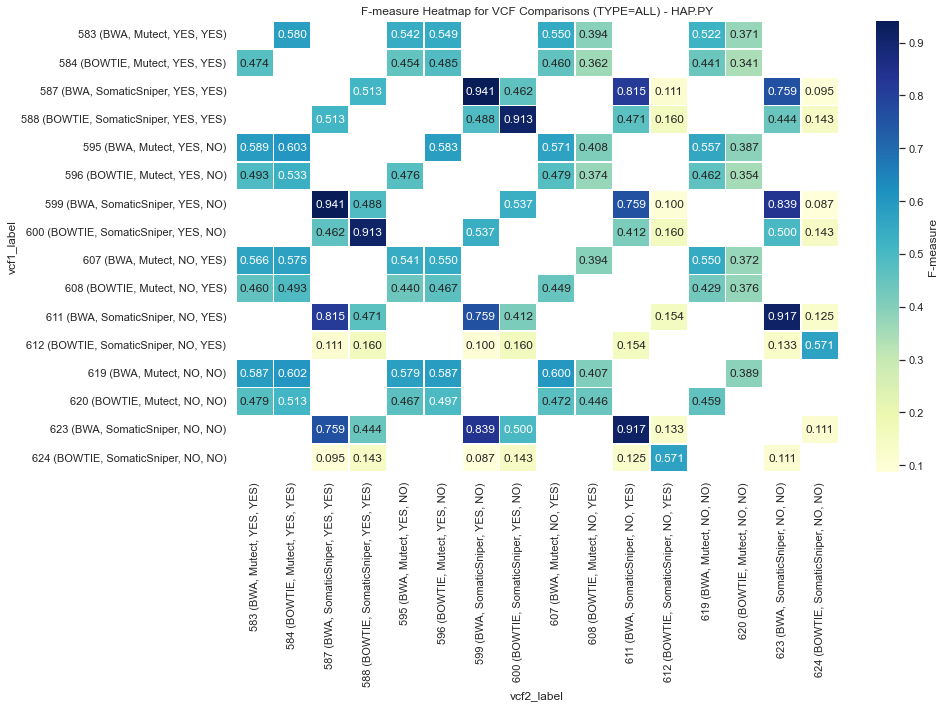

In [68]:
type_value = 'ALL'
# Filter for rows where Filter is "PASS"
filtered_results = results_enriched[results_enriched['Filter'] == type_value]

# Generate detailed labels for each VCF pair
filtered_results['vcf1_label'] = (
    filtered_results['vcf1'].astype(str) +
    " (" + filtered_results['vcf1_Mapper'] + ", " +
    filtered_results['vcf1_VariantCaller'] + ", " +
    filtered_results['vcf1_isTrimmed'] + ", " +
    filtered_results['vcf1_baseRecalibration'] + ")"
)

filtered_results['vcf2_label'] = (
    filtered_results['vcf2'].astype(str) +
    " (" + filtered_results['vcf2_Mapper'] + ", " +
    filtered_results['vcf2_VariantCaller'] + ", " +
    filtered_results['vcf2_isTrimmed'] + ", " +
    filtered_results['vcf2_baseRecalibration'] + ")"
)

# Create pivot tables for heatmaps
pivot_f = filtered_results.pivot('vcf1_label', 'vcf2_label', 'METRIC.F1_Score')
pivot_p = filtered_results.pivot('vcf1_label', 'vcf2_label', 'METRIC.Precision')
pivot_r = filtered_results.pivot('vcf1_label', 'vcf2_label', 'METRIC.Recall')

# Plot F-measure heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(pivot_f, annot=True, cmap='YlGnBu', fmt=".3f", linewidths=0.5, cbar_kws={'label': 'F-measure'})
plt.title('F-measure Heatmap for VCF Comparisons (TYPE='+ type_value + ') - HAP.PY')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig("F-measure Heatmap for VCF Comparisons(TYPE=" + type_value + ") - HAP.PY.pdf", bbox_inches='tight')
plt.show()


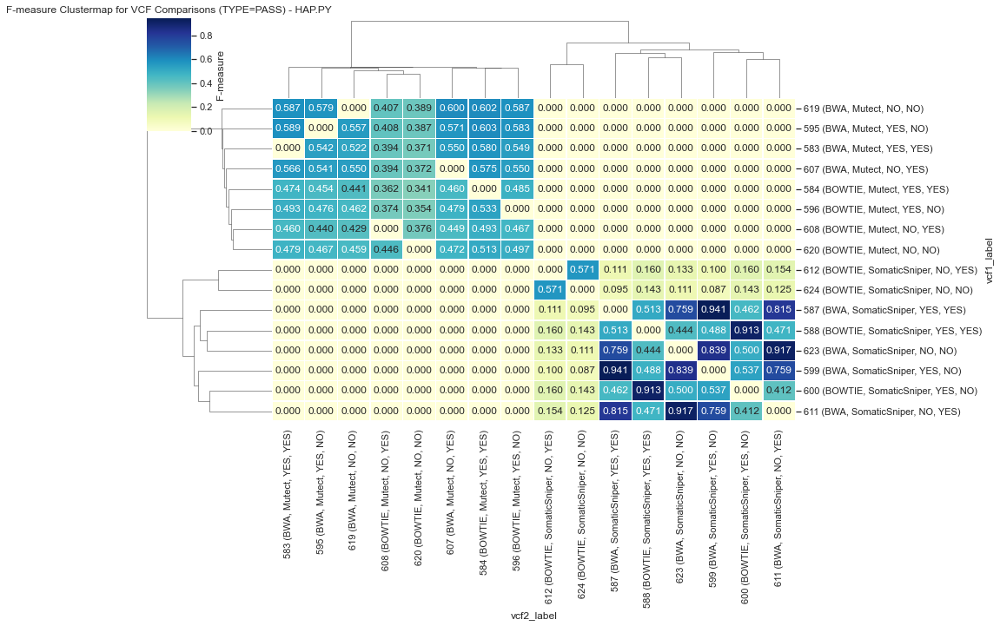

In [79]:
pivot_f = filtered_results.pivot('vcf1_label', 'vcf2_label', 'METRIC.F1_Score').fillna(0)

# Plot clustermap for F-measure
sns.clustermap(
    pivot_f,
    annot=True,
    cmap='YlGnBu',
    fmt=".3f",
    linewidths=0.5,
    figsize=(14, 10),
    cbar_kws={'label': 'F-measure'}
)
plt.title('F-measure Clustermap for VCF Comparisons (TYPE=' + type_value + ') - HAP.PY')
plt.savefig("F-measure Clustermap for VCF Comparisons (TYPE=" + type_value + ") - HAP.PY.pdf", bbox_inches='tight')
plt.show()

# Som.py indels 11.03.2025

In [181]:
import os
import subprocess
import pandas as pd
from itertools import product
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor, as_completed

# Define paths
host_base_dir_indels = "/Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis"
container_base_dir_indels = "/data"
output_base_dir_indels = os.path.join(host_base_dir_indels, "sompy_results_indels")
os.makedirs(output_base_dir_indels, exist_ok=True)

# Docker image and reference
docker_image_indels = "itubioinformatics/hap.py"
reference_fasta_indels = f"{container_base_dir_indels}/vcf/referans/hg38_v0_Homo_sapiens_assembly38.fasta"

# Function to bgzip and index a VCF file if needed.
def bgzip_and_index_indels(vcf_path_indels):
    gz_path_indels = vcf_path_indels + '.gz'
    if not os.path.exists(gz_path_indels):
        subprocess.run(f'bgzip -c "{vcf_path_indels}" > "{gz_path_indels}"', shell=True, check=True)
        subprocess.run(f'tabix -p vcf "{gz_path_indels}"', shell=True, check=True)

# Helper: Convert a host file path to a container path.
def convert_to_container_path_indels(file_path_indels):
    if not os.path.isabs(file_path_indels):
        full_host_path_indels = os.path.join(host_base_dir_indels, file_path_indels)
    else:
        full_host_path_indels = file_path_indels
    return full_host_path_indels.replace(host_base_dir_indels, container_base_dir_indels)

# Helper: Remove a .tbi extension if present.
def remove_tbi_extension_indels(file_path_indels):
    if file_path_indels.endswith('.tbi'):
        return file_path_indels[:-4]
    return file_path_indels

# Statik kolon isimleri (stats.csv dosyaları hep aynı formatta üretiliyor)
STATIC_COLUMNS = [
    "index", "type", "total.truth", "total.query", "tp", "fp", "fn", "unk", "ambi", 
    "recall", "recall_lower", "recall_upper", "recall2", "precision", "precision_lower", 
    "precision_upper", "na", "ambiguous", "fp.region.size", "fp.rate", "sompyversion", "sompycmd"
]

# Statik olarak parse eden fonksiyon
def parse_summary_csv_indels(summary_file_indels):
    """
    stats.csv dosyasını satır satır okuyup, sabit kolon isimlerine göre parse eder.
    "type" sütunundaki değeri "records" olan satırı seçer; bulunamazsa ilk veri satırını kullanır.
    """
    try:
        with open(summary_file_indels, 'r') as f:
            lines = f.readlines()
        if len(lines) < 2:
            tqdm.write(f"Dosya {summary_file_indels} yeterli satır içermiyor.")
            return None
        # İlk satır header olabilir; ama biz statik kolon isimlerini kullanacağız.
        chosen_row = None
        # Veri satırlarını dolaşıyoruz (boş satırları atlıyoruz)
        for line in lines[1:]:
            if not line.strip():
                continue
            parts = line.strip().split(',')
            # Eğer parçaların sayısı STATIC_COLUMNS sayısından az ise atla.
            if len(parts) < len(STATIC_COLUMNS):
                continue
            row_dict = {col: val for col, val in zip(STATIC_COLUMNS, parts)}
            if row_dict["type"].strip().lower() == "indels":
                chosen_row = row_dict
                break
        if chosen_row is None:
            # "records" bulunamadıysa ilk veri satırını kullan.
            parts = lines[1].strip().split(',')
            chosen_row = {col: val for col, val in zip(STATIC_COLUMNS, parts)}
        return chosen_row
    except Exception as e:
        tqdm.write(f"Parse hatası: {str(e)}")
        return None

# Global list to accumulate parsed metrics (will include test case columns 'vcf1' and 'vcf2')
metrics_list_indels = []

# --- DataFrame Filtering ---
# (Varsayıyoruz: vcfcomparison_df_full_indels DataFrame ve vcf_filenames_indels dictionary mevcut)
filtered_vcf_df_indels = vcfcomparison_df_full_indels[
    (vcfcomparison_df_full_indels['Environment'] == 'Uhem + COSAP') &
    (vcfcomparison_df_full_indels['Duplicates'] == 'MARK')
].copy()

# Adjust TestCaseNo column: son boşlukla ayrılmış token'ı al.
filtered_vcf_df_indels['TestCaseNo'] = filtered_vcf_df_indels['TestCaseNo'].apply(lambda x: x.split(' ')[-1])

# Map TestCaseNo to VCF filenames.
filtered_vcf_filenames_indels = {
    str(tc): vcf_filenames_indels[str(tc)]
    for tc in filtered_vcf_df_indels['TestCaseNo']
    if str(tc) in vcf_filenames_indels
}

# Create a mapping from TestCaseNo to VariantCaller.
variant_caller_map_indels = {
    str(row['TestCaseNo']): row['VariantCaller']
    for _, row in filtered_vcf_df_indels.iterrows()
}

# Create VCF pairs (all combinations between two VCF files).
vcf_pairs_indels = [
    (key1, vcf1, key2, vcf2)
    for (key1, vcf1), (key2, vcf2) in product(filtered_vcf_filenames_indels.items(), repeat=2)
]

#vcf_pairs_indels = vcf_pairs_indels[:128]

# Normalize a list of dictionaries so they all have the same keys.
def normalize_metrics(metrics_list):
    all_keys = set()
    for d in metrics_list:
        all_keys.update(d.keys())
    all_keys = list(all_keys)
    norm_list = []
    for d in metrics_list:
        norm_list.append({k: d.get(k, None) for k in all_keys})
    return norm_list

# --- Function to Run som.py in Docker ---
def run_sompy_docker_indels(truth_vcf_indels, query_vcf_indels, output_dir_indels, key1_indels, key2_indels):
    """
    Eğer stats CSV dosyası mevcutsa, som.py'yu tekrar çalıştırmadan direkt dosyayı parse edip metrikleri ekler.
    Aksi halde, Docker içinden som.py çalıştırılır.
    """
    truth_vcf_indels = remove_tbi_extension_indels(truth_vcf_indels)
    query_vcf_indels = remove_tbi_extension_indels(query_vcf_indels)
    
    truth_vcf_container_indels = convert_to_container_path_indels(truth_vcf_indels)
    query_vcf_container_indels = convert_to_container_path_indels(query_vcf_indels)
    
    pair_output_dir_indels = os.path.join(output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    os.makedirs(pair_output_dir_indels, exist_ok=True)
    output_prefix_indels = os.path.join(pair_output_dir_indels, f"{key1_indels}_vs_{key2_indels}")
    output_prefix_container_indels = output_prefix_indels.replace(host_base_dir_indels, container_base_dir_indels)
    # stats dosyası artık .stats.csv uzantısıyla oluşturuluyor.
    summary_file_indels = f"{output_prefix_indels}.stats.csv"
    
    # Eğer stats CSV dosyası zaten varsa, som.py'yı tekrar çalıştırmadan direkt parse et.
    if os.path.exists(summary_file_indels):
        metrics = parse_summary_csv_indels(summary_file_indels)
        if metrics:
            metrics["summary_file_indels"] = summary_file_indels
            metrics["vcf1"] = key1_indels
            metrics["vcf2"] = key2_indels
            metrics_list_indels.append(metrics)
            norm_metrics = normalize_metrics(metrics_list_indels)
            results_df_indels = pd.DataFrame(norm_metrics)
            results_csv_indels = os.path.join(output_base_dir_indels, "sompy_results_indels_summary.csv")
            results_df_indels.to_csv(results_csv_indels, index=False)
        return (summary_file_indels, key1_indels, key2_indels)
    
    # Komutu oluştur: som.py'yi Docker üzerinden çalıştır.
    cmd_indels = [
        "docker", "run", "--rm",
        "-v", f"{host_base_dir_indels}:{container_base_dir_indels}",
        "-e", f"HGREF={reference_fasta_indels}",
        docker_image_indels,
        "som.py",  # som.py kullanılıyor.
        truth_vcf_container_indels, query_vcf_container_indels,
        "-r", reference_fasta_indels,
        "-o", output_prefix_container_indels
        # Gerekirse ek som.py opsiyonları ekleyin (örn. "-f", "fp_regions.bed.gz")
    ]
    
    print("Running command:")
    print(" ".join(cmd_indels))
    try:
        subprocess.run(cmd_indels, check=True, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
        return (summary_file_indels, key1_indels, key2_indels)
    except subprocess.CalledProcessError as e_indels:
        tqdm.write(f"Error running som.py for {truth_vcf_indels} vs {query_vcf_indels}: {e_indels.stderr.decode()}")
        return None

# --- Parallel Processing with ThreadPoolExecutor ---
results_indels = []
max_workers = 10  # Sisteminiz için uygun sayıyı ayarlayın.
with ThreadPoolExecutor(max_workers=max_workers) as executor:
    future_to_pair = {
        executor.submit(run_sompy_docker_indels, truth_vcf, query_vcf, output_base_dir_indels, key1, key2): (key1, key2)
        for key1, truth_vcf, key2, query_vcf in vcf_pairs_indels
    }
    for future in tqdm(as_completed(future_to_pair), total=len(future_to_pair), desc="Processing VCF pairs"):
        pair = future_to_pair[future]
        try:
            result = future.result()
            if result is not None and os.path.exists(result[0]):
                results_indels.append(result)
        except Exception as exc:
            tqdm.write(f"Error for pair {pair}: {exc}")

# Final metrik DataFrame'ini oluştur ve CSV olarak kaydet.
norm_metrics = normalize_metrics(metrics_list_indels)
results_df_indels = pd.DataFrame(norm_metrics)
results_csv_indels = os.path.join(output_base_dir_indels, "sompy_results_indels_summary.csv")
results_df_indels.to_csv(results_csv_indels, index=False)

print(f"Results saved to {results_csv_indels}")


Processing VCF pairs: 100%|██████████| 6400/6400 [10:11<00:00, 10.47it/s]


Results saved to /Users/P33833/Documents/Python Docs/Bioinformatics-StabilityAnalysis/sompy_results_indels/sompy_results_indels_summary.csv


In [182]:
results_df_indels

,precision,index,ambiguous,tp,precision_upper,type,recall,total.truth,sompyversion,summary_file_indels,unk,vcf1,recall_lower,ambi,fp.rate,vcf2,precision_lower,recall_upper,fn,total.query,fp,fp.region.size,sompycmd,recall2,na
0,0.0,0,0.0,0,0.218019360911,indels,0.0,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.0,0,0.00563623104707,2,0.0,0.0606089009503,59,15,15,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0
1,0.0,0,0.0,0,0.247052638,indels,0.0,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.0,0,0.00488473357413,4,0.0,0.0606089009503,59,13,13,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0
2,0.966666666667,0,0.0,58,0.99300961417,indels,0.983050847458,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.923518610966,0,0.000751497472942,5,0.897349125831,1.0,1,60,2,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.983050847458,0.0
3,0.88,0,0.0,22,0.965015248682,indels,0.372881355932,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.25794617091,0,0.00112724620941,3,0.713272458602,0.499949941008,37,25,3,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.372881355932,0.0
4,1.0,0,0.0,59,1.0,indels,1.0,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.93939109905,0,0.0,1,0.93939109905,1.0,0,59,0,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,1.0,0,0.0,8,1.0,indels,0.888888888889,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.585530722559,0,0.0,268,0.630583352447,1.0,1,8,0,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.888888888889,0.0
6396,0.5,0,0.0,4,0.801034388719,indels,0.444444444444,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.172967756673,0,0.00370604282754,270,0.198965611281,0.745906132125,5,8,4,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.444444444444,0.0
6397,0.0,0,0.0,0,0.0393032877395,indels,0.0,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.0,0,0.0852389850334,269,0.0,0.33626711688,9,92,92,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0
6398,0.0,0,0.0,0,0.0637500966624,indels,0.0,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.0,0,0.0518845995855,271,0.0,0.33626711688,9,56,56,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0


In [183]:
# Öncelikle, sütun değerlerinin numeric (float) tipinde olduğundan emin olun.
results_df_indels['precision'] = results_df_indels['precision'].astype(float)
results_df_indels['recall'] = results_df_indels['recall'].astype(float)
results_df_indels['precision_lower'] = results_df_indels['precision_lower'].astype(float)
results_df_indels['recall_lower'] = results_df_indels['recall_lower'].astype(float)
results_df_indels['precision_upper'] = results_df_indels['precision_upper'].astype(float)
results_df_indels['recall_upper'] = results_df_indels['recall_upper'].astype(float)

# Nominal F1 score hesaplanması:
results_df_indels['calculated_F1'] = 2 * (results_df_indels['precision'] * results_df_indels['recall']) / (results_df_indels['precision'] + results_df_indels['recall'])
results_df_indels['calculated_F1'] = results_df_indels['calculated_F1'].fillna(0)

# Lower bound F1 score hesaplanması:
results_df_indels['lower_F1'] = 2 * (results_df_indels['precision_lower'] * results_df_indels['recall_lower']) / (results_df_indels['precision_lower'] + results_df_indels['recall_lower'])
results_df_indels['lower_F1'] = results_df_indels['lower_F1'].fillna(0)

# Upper bound F1 score hesaplanması:
results_df_indels['upper_F1'] = 2 * (results_df_indels['precision_upper'] * results_df_indels['recall_upper']) / (results_df_indels['precision_upper'] + results_df_indels['recall_upper'])
results_df_indels['upper_F1'] = results_df_indels['upper_F1'].fillna(0)

# DataFrame'in güncellenmiş halini inceleyin:
print(results_df_indels[['vcf1', 'vcf2', 'calculated_F1', 'lower_F1', 'upper_F1']])


     vcf1 vcf2  calculated_F1  lower_F1  upper_F1
0       1    2       0.000000  0.000000  0.094850
1       1    4       0.000000  0.000000  0.097338
2       1    5       0.974790  0.910246  0.996493
3       1    3       0.523810  0.378876  0.658663
4       1    1       1.000000  0.939391  1.000000
...   ...  ...            ...       ...       ...
6395  272  268       0.941176  0.607223  1.000000
6396  272  270       0.470588  0.185058  0.772488
6397  272  269       0.000000  0.000000  0.070380
6398  272  271       0.000000  0.000000  0.107181
6399  272  272       1.000000  0.663733  1.000000

[6400 rows x 5 columns]


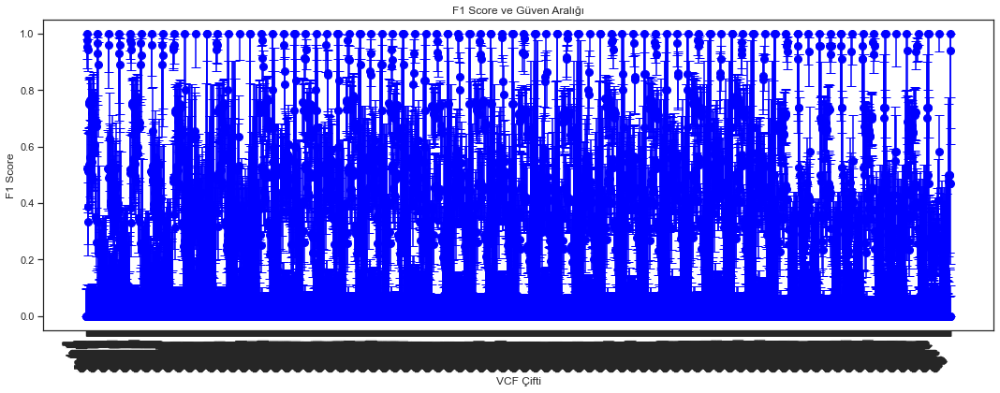

In [184]:
import matplotlib.pyplot as plt
import numpy as np

# Öncelikle, ilgili sütunların numeric olduğundan emin olun.
results_df_indels['calculated_F1'] = results_df_indels['calculated_F1'].astype(float)
results_df_indels['lower_F1'] = results_df_indels['lower_F1'].astype(float)
results_df_indels['upper_F1'] = results_df_indels['upper_F1'].astype(float)

# Error bar hesaplaması: 
# Alt hata: hesaplanan F1 - lower_F1
# Üst hata: upper_F1 - hesaplanan F1
error_lower = results_df_indels['calculated_F1'] - results_df_indels['lower_F1']
error_upper = results_df_indels['upper_F1'] - results_df_indels['calculated_F1']
error = [error_lower.values, error_upper.values]

# X ekseni için etiketler (örneğin vcf1 ve vcf2 bilgilerini birleştirerek)
x_labels = results_df_indels.apply(lambda row: f"{row['vcf1']}\nvs\n{row['vcf2']}", axis=1)
x = np.arange(len(results_df_indels))

plt.figure(figsize=(15, 6))
plt.errorbar(x, results_df_indels['calculated_F1'], yerr=error, fmt='o', capsize=5, markersize=8, color='blue')
plt.xticks(x, x_labels, rotation=45, ha='right')
plt.xlabel("VCF Çifti")
plt.ylabel("F1 Score")
plt.title("F1 Score ve Güven Aralığı")
plt.tight_layout()
plt.show()


In [185]:
results_df_indels

,precision,index,ambiguous,tp,precision_upper,type,recall,total.truth,sompyversion,summary_file_indels,unk,vcf1,recall_lower,ambi,fp.rate,vcf2,precision_lower,recall_upper,fn,total.query,fp,fp.region.size,sompycmd,recall2,na,calculated_F1,lower_F1,upper_F1
0,0.000000,0,0.0,0,0.218019,indels,0.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.000000,0,0.00563623104707,2,0.000000,0.060609,59,15,15,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.094850
1,0.000000,0,0.0,0,0.247053,indels,0.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.000000,0,0.00488473357413,4,0.000000,0.060609,59,13,13,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.097338
2,0.966667,0,0.0,58,0.993010,indels,0.983051,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.923519,0,0.000751497472942,5,0.897349,1.000000,1,60,2,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.983050847458,0.0,0.974790,0.910246,0.996493
3,0.880000,0,0.0,22,0.965015,indels,0.372881,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.257946,0,0.00112724620941,3,0.713272,0.499950,37,25,3,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.372881355932,0.0,0.523810,0.378876,0.658663
4,1.000000,0,0.0,59,1.000000,indels,1.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.939391,0,0.0,1,0.939391,1.000000,0,59,0,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,1.0,0.0,1.000000,0.939391,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,1.000000,0,0.0,8,1.000000,indels,0.888889,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.585531,0,0.0,268,0.630583,1.000000,1,8,0,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.888888888889,0.0,0.941176,0.607223,1.000000
6396,0.500000,0,0.0,4,0.801034,indels,0.444444,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.172968,0,0.00370604282754,270,0.198966,0.745906,5,8,4,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.444444444444,0.0,0.470588,0.185058,0.772488
6397,0.000000,0,0.0,0,0.039303,indels,0.000000,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.000000,0,0.0852389850334,269,0.000000,0.336267,9,92,92,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.070380
6398,0.000000,0,0.0,0,0.063750,indels,0.000000,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.000000,0,0.0518845995855,271,0.000000,0.336267,9,56,56,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.107181


In [186]:
# Count NaN values in the column
nan_count = results_df_indels['upper_F1'].isna().sum()
print("Number of NaN values ratio:", nan_count/6400)



Number of NaN values ratio: 0.0


In [187]:
# Enrich results_df_indels with metadata from vcfcomparison_df_full_indels
results_finito2_indels = enrich_results_with_metadata(results_df_indels, vcfcomparison_df_full_indels)

results_finito2_indels


,precision,index,ambiguous,tp,precision_upper,type,recall,total.truth,sompyversion,summary_file_indels,unk,vcf1,recall_lower,ambi,fp.rate,vcf2,precision_lower,recall_upper,fn,total.query,fp,fp.region.size,sompycmd,recall2,na,calculated_F1,lower_F1,upper_F1,vcf1_Mapper,vcf1_VariantCaller,vcf1_Sample,vcf1_isTrimmed,vcf1_baseRecalibration,vcf2_Mapper,vcf2_VariantCaller,vcf2_Sample,vcf2_isTrimmed,vcf2_baseRecalibration
0,0.000000,0,0.0,0,0.218019,indels,0.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.000000,0,0.00563623104707,2,0.000000,0.060609,59,15,15,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.094850,BWA,Mutect,LL,yes,yes,BWA,Strelka,LL,yes,yes
1,0.000000,0,0.0,0,0.247053,indels,0.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.000000,0,0.00488473357413,4,0.000000,0.060609,59,13,13,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.097338,BWA,Mutect,LL,yes,yes,Bowtie,Strelka,LL,yes,yes
2,0.966667,0,0.0,58,0.993010,indels,0.983051,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.923519,0,0.000751497472942,5,0.897349,1.000000,1,60,2,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.983050847458,0.0,0.974790,0.910246,0.996493,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,no
3,0.880000,0,0.0,22,0.965015,indels,0.372881,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.257946,0,0.00112724620941,3,0.713272,0.499950,37,25,3,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.372881355932,0.0,0.523810,0.378876,0.658663,BWA,Mutect,LL,yes,yes,Bowtie,Mutect,LL,yes,yes
4,1.000000,0,0.0,59,1.000000,indels,1.000000,59,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,1,0.939391,0,0.0,1,0.939391,1.000000,0,59,0,2661352928,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,1.0,0.0,1.000000,0.939391,1.000000,BWA,Mutect,LL,yes,yes,BWA,Mutect,LL,yes,yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6395,1.000000,0,0.0,8,1.000000,indels,0.888889,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.585531,0,0.0,268,0.630583,1.000000,1,8,0,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.888888888889,0.0,0.941176,0.607223,1.000000,Bowtie,Strelka,FD,no,no,Bowtie,Strelka,FD,no,yes
6396,0.500000,0,0.0,4,0.801034,indels,0.444444,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.172968,0,0.00370604282754,270,0.198966,0.745906,5,8,4,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.444444444444,0.0,0.470588,0.185058,0.772488,Bowtie,Strelka,FD,no,no,BWA,Strelka,FD,no,no
6397,0.000000,0,0.0,0,0.039303,indels,0.000000,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.000000,0,0.0852389850334,269,0.000000,0.336267,9,92,92,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.070380,Bowtie,Strelka,FD,no,no,BWA,Mutect,FD,no,no
6398,0.000000,0,0.0,0,0.063750,indels,0.000000,9,som.py-dda5f79,/Users/P33833/Documents/Python Docs/Bioinforma...,0,272,0.000000,0,0.0518845995855,271,0.000000,0.336267,9,56,56,1079318342,/opt/hap.py/bin/som.py /data/vcf/TESTCASES_bed...,0.0,0.0,0.000000,0.000000,0.107181,Bowtie,Strelka,FD,no,no,Bowtie,Mutect,FD,no,no


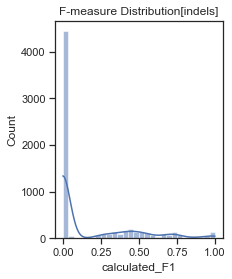

In [188]:
sns.histplot(results_finito2_indels['calculated_F1'], kde=True).set(title='F-measure Distribution[indels]')
sns.set(font_scale=1)
plt.show()

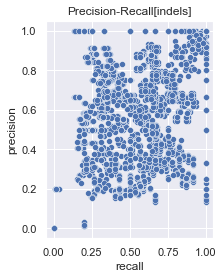

In [189]:
sns.scatterplot(x='recall', y='precision',data=results_finito2_indels)
plt.title('Precision-Recall[indels]')
plt.show()

In [190]:

results_finito2_indels['vcf1_label'] = (
    results_finito2_indels['vcf1'].astype(str) +
    " (" + results_finito2_indels['vcf1_Mapper'] + ", " +
    results_finito2_indels['vcf1_VariantCaller'] + ", " +
    results_finito2_indels['vcf1_isTrimmed'] + ", " +
    results_finito2_indels['vcf1_baseRecalibration'] + ")"
)

results_finito2_indels['vcf2_label'] = (
    results_finito2_indels['vcf2'].astype(str) +
    " (" + results_finito2_indels['vcf2_Mapper'] + ", " +
    results_finito2_indels['vcf2_VariantCaller'] + ", " +
    results_finito2_indels['vcf2_isTrimmed'] + ", " +
    results_finito2_indels['vcf2_baseRecalibration'] + ")"
)

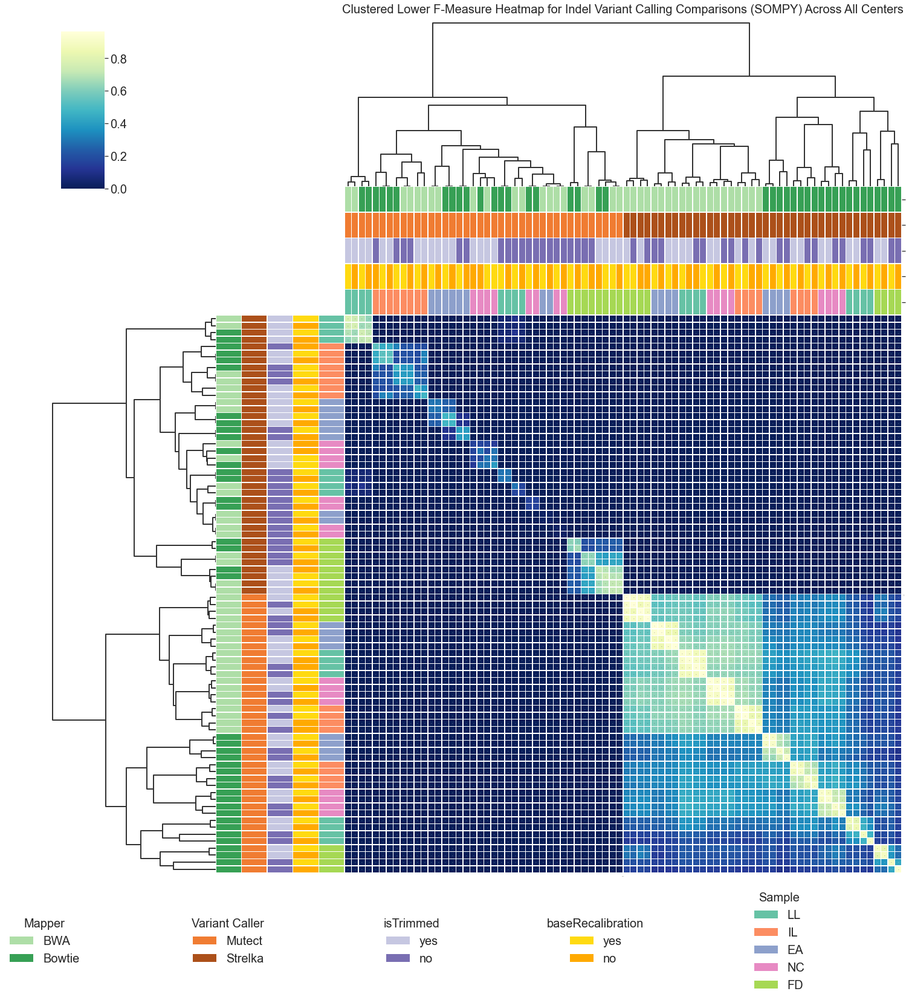

In [191]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Patch

# Örnek pivot tablo oluşturma (f_measure için)
pivot_f = results_finito2_indels.pivot('vcf1_label', 'vcf2_label', 'lower_F1')

# Pivot tablodaki NaN değerlerini -1 ile dolduralım:
pivot_f = pivot_f.fillna(0)


# --- SATIR VE SÜTUN ETİKETLERİ İÇİN ÖZNİTELİK TABLOLARI ---
# Satırlar: vcf1_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
row_attrs = results_finito2_indels.drop_duplicates("vcf1_label").set_index("vcf1_label")[
    ["vcf1_Mapper", "vcf1_VariantCaller", "vcf1_isTrimmed", "vcf1_baseRecalibration", "vcf1_Sample"]
]

# Sütunlar: vcf2_label bazında, Mapper, VariantCaller, isTrimmed, baseRecalibration ve Sample bilgileri
col_attrs = results_finito2_indels.drop_duplicates("vcf2_label").set_index("vcf2_label")[
    ["vcf2_Mapper", "vcf2_VariantCaller", "vcf2_isTrimmed", "vcf2_baseRecalibration", "vcf2_Sample"]
]

# --- HER ÖZNİTELİK İÇİN RENK PALETLERİNİN OLUŞTURULMASI ---

# SATIRLAR İÇİN:
# Mapper
lut_mapper = dict(zip(row_attrs["vcf1_Mapper"].unique(), 
                      sns.color_palette("Greens", len(row_attrs["vcf1_Mapper"].unique()))))
row_colors_mapper = row_attrs["vcf1_Mapper"].map(lut_mapper)

# VariantCaller
lut_variant = dict(zip(row_attrs["vcf1_VariantCaller"].unique(), 
                       sns.color_palette("Oranges_d", len(row_attrs["vcf1_VariantCaller"].unique()))))
row_colors_variant = row_attrs["vcf1_VariantCaller"].map(lut_variant)

# isTrimmed
lut_trimmed = dict(zip(row_attrs["vcf1_isTrimmed"].unique(), 
                       sns.color_palette("Purples", len(row_attrs["vcf1_isTrimmed"].unique()))))
row_colors_trimmed = row_attrs["vcf1_isTrimmed"].map(lut_trimmed)

# baseRecalibration
lut_recal = dict(zip(row_attrs["vcf1_baseRecalibration"].unique(), 
                     sns.color_palette("Wistia", len(row_attrs["vcf1_baseRecalibration"].unique()))))
row_colors_recal = row_attrs["vcf1_baseRecalibration"].map(lut_recal)

# Yeni: Sample
lut_sample = dict(zip(row_attrs["vcf1_Sample"].unique(), 
                      sns.color_palette("Set2", len(row_attrs["vcf1_Sample"].unique()))))
row_colors_sample = row_attrs["vcf1_Sample"].map(lut_sample)

# Tüm satır renklerini birleştiriyoruz:
row_colors = pd.concat([row_colors_mapper, row_colors_variant, row_colors_trimmed, row_colors_recal, row_colors_sample], axis=1)

# SÜTUNLAR İÇİN:
# Mapper
lut_mapper2 = dict(zip(col_attrs["vcf2_Mapper"].unique(), 
                       sns.color_palette("Greens", len(col_attrs["vcf2_Mapper"].unique()))))
col_colors_mapper = col_attrs["vcf2_Mapper"].map(lut_mapper2)

# VariantCaller
lut_variant2 = dict(zip(col_attrs["vcf2_VariantCaller"].unique(), 
                        sns.color_palette("Oranges_d", len(col_attrs["vcf2_VariantCaller"].unique()))))
col_colors_variant = col_attrs["vcf2_VariantCaller"].map(lut_variant2)

# isTrimmed
lut_trimmed2 = dict(zip(col_attrs["vcf2_isTrimmed"].unique(), 
                        sns.color_palette("Purples", len(col_attrs["vcf2_isTrimmed"].unique()))))
col_colors_trimmed = col_attrs["vcf2_isTrimmed"].map(lut_trimmed2)

# baseRecalibration
lut_recal2 = dict(zip(col_attrs["vcf2_baseRecalibration"].unique(), 
                      sns.color_palette("Wistia", len(col_attrs["vcf2_baseRecalibration"].unique()))))
col_colors_recal = col_attrs["vcf2_baseRecalibration"].map(lut_recal2)

# Yeni: Sample
lut_sample2 = dict(zip(col_attrs["vcf2_Sample"].unique(), 
                       sns.color_palette("Set2", len(col_attrs["vcf2_Sample"].unique()))))
col_colors_sample = col_attrs["vcf2_Sample"].map(lut_sample2)

# Tüm sütun renklerini birleştiriyoruz:
col_colors = pd.concat([col_colors_mapper, col_colors_variant, col_colors_trimmed, col_colors_recal, col_colors_sample], axis=1)

# --- CLUSTERED HEATMAP OLUŞTURMA ---
sns.set(font_scale=0)
g = sns.clustermap(
    pivot_f,
    annot=True,
    fmt=".1f",
    cmap="YlGnBu_r",
    linewidths=0.5,
    row_colors=row_colors,
    col_colors=col_colors,
    figsize=(20,20),
    xticklabels=False,  # Sütun etiketlerini kapatır
    yticklabels=False   # Satır etiketlerini kapatır
)
g.ax_heatmap.set_title('Clustered Lower F-Measure Heatmap for Indel Variant Calling Comparisons (SOMPY) Across All Centers', pad=500, size=20)

# Remove tick labels from the colored row and column colorbars:
if g.ax_row_colors is not None:
    g.ax_row_colors.set_xticks([])
    g.ax_row_colors.set_yticklabels([])

if g.ax_col_colors is not None:
    g.ax_col_colors.set_xticks([])
    g.ax_col_colors.set_yticklabels([])
    
g.cax.tick_params(labelsize=20)

# Dendrogram çizgilerinin kalınlığını arttırma:
for a in g.ax_row_dendrogram.collections:
    a.set_linewidth(2)
for a in g.ax_col_dendrogram.collections:
    a.set_linewidth(2)

# --- LEGEND OLUŞTURMA ---
# Legend için kullanılacak dictionary'ler ve başlıkları:
legend_dicts = [lut_mapper, lut_variant, lut_trimmed, lut_recal, lut_sample]
legend_titles = ["Mapper", "Variant Caller", "isTrimmed", "baseRecalibration", "Sample"]
legend_params = {'fontsize': 20, 'title_fontsize': 20}

fig = g.fig
# 1 satırda 5 sütun olacak şekilde GridSpec (wspace ile boşluk ayarlanıyor)
gs = GridSpec(1, 5, figure=fig, wspace=0.5)
for i in range(5):
    ax = fig.add_subplot(gs[0, i])
    # Her legend için Patch objeleri oluşturuyoruz:
    handles = [Patch(facecolor=legend_dicts[i][name]) for name in legend_dicts[i]]
    labels = list(legend_dicts[i].keys())
    ax.legend(handles, labels, title=legend_titles[i], loc="center", frameon=False, bbox_to_anchor=(0, -0.08),prop={'size': 20}, **legend_params)
    ax.axis("off")

plt.savefig("SOMPY_Clustered_Lower_F-measure_Heatmap_with_Cluster_Colors_ALL_Centers_Indels.pdf", bbox_inches="tight")
plt.show()


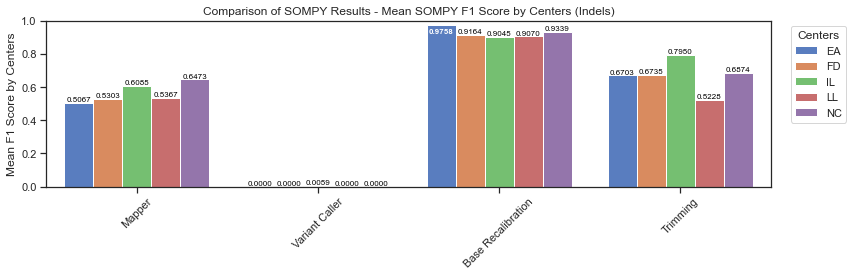

In [196]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Make a copy of the vcfeval results DataFrame
df_vcfeval = results_finito2_indels.copy()

# The DataFrame already contains separate columns for pipeline parameters:
#   vcf1_Mapper, vcf1_VariantCaller, vcf1_Sample, vcf1_isTrimmed, vcf1_baseRecalibration,
#   vcf2_Mapper, vcf2_VariantCaller, vcf2_Sample, vcf2_isTrimmed, vcf2_baseRecalibration

metric_name = 'calculated_F1'

# 1. Filter for differences in Mapper only
filtered_mapper = df_vcfeval[
    (df_vcfeval['vcf1_Mapper'] != df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_mapper[metric_name] = pd.to_numeric(filtered_mapper[metric_name], errors='coerce')
grouped_mapper = filtered_mapper.groupby('vcf1_Sample')[metric_name].mean().reset_index()
grouped_mapper['Parameter'] = 'Mapper'

# 2. Filter for differences in Variant Caller only
filtered_vc = df_vcfeval[
    (df_vcfeval['vcf1_VariantCaller'] != df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_vc[metric_name] = pd.to_numeric(filtered_vc[metric_name], errors='coerce')
grouped_vc = filtered_vc.groupby('vcf1_Sample')[metric_name].mean().reset_index()
grouped_vc['Parameter'] = 'Variant Caller'

# 3. Filter for differences in Base Recalibration only
filtered_br = df_vcfeval[
    (df_vcfeval['vcf1_baseRecalibration'] != df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_isTrimmed'] == df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_br[metric_name] = pd.to_numeric(filtered_br[metric_name], errors='coerce')
grouped_br = filtered_br.groupby('vcf1_Sample')[metric_name].mean().reset_index()
grouped_br['Parameter'] = 'Base Recalibration'

# 4. Filter for differences in Trimming only
filtered_trim = df_vcfeval[
    (df_vcfeval['vcf1_isTrimmed'] != df_vcfeval['vcf2_isTrimmed']) &
    (df_vcfeval['vcf1_Mapper'] == df_vcfeval['vcf2_Mapper']) &
    (df_vcfeval['vcf1_VariantCaller'] == df_vcfeval['vcf2_VariantCaller']) &
    (df_vcfeval['vcf1_baseRecalibration'] == df_vcfeval['vcf2_baseRecalibration']) &
    (df_vcfeval['vcf1_Sample'] == df_vcfeval['vcf2_Sample'])
].copy()
filtered_trim[metric_name] = pd.to_numeric(filtered_trim[metric_name], errors='coerce')
grouped_trim = filtered_trim.groupby('vcf1_Sample')[metric_name].mean().reset_index()
grouped_trim['Parameter'] = 'Trimming'

# Concatenate all grouped DataFrames
grouped_vcfeval = pd.concat([grouped_mapper, grouped_vc, grouped_br, grouped_trim])
grouped_vcfeval['vcf1_Sample'] = grouped_vcfeval['vcf1_Sample'].str.upper()

# Plotting the bar plot for the averaged vcfeval F-measure values
sns.set(style="ticks")
plt.figure(figsize=(12, 4))
ax = sns.barplot(data=grouped_vcfeval, x='Parameter', y=metric_name, hue='vcf1_Sample',
                 ci=None, palette=sns.color_palette("muted"))

# Add data labels to each bar with conditional formatting and bold text
for p in ax.patches:
    height = p.get_height()
    label = format(height, '.4f')
    if height > 0.95:
        # Place the label inside the bar (a little below the top) with white bold text
        ax.annotate(label,
                    (p.get_x() + p.get_width() / 2, height - 0.02),
                    ha='center', va='top', fontsize=8, color='white', fontweight='bold')
    else:
        # Otherwise, place the label at the top of the bar with black bold text
        ax.annotate(label,
                    (p.get_x() + p.get_width() / 2, height),
                    ha='center', va='bottom', fontsize=8, color='black')

#ax.set(xticklabels=[])        # Remove x-axis tick labels
ax.tick_params(bottom=True)   # Remove x-axis ticks
ax.set(xlabel=None)            # Remove x-axis label
plt.ylabel(f'Mean F1 Score by Centers')
plt.title(f'Comparison of SOMPY Results - Mean SOMPY F1 Score by Centers (Indels)')
plt.legend(title='Centers', bbox_to_anchor=(1.02, 1), loc='upper left')
plt.xticks(rotation=45)

ax.set_ylim(0, 1)

plt.tight_layout()
plt.savefig("Comparison of SOMPY Results - Mean SOMPY F1_Score by Centers (Indels).pdf", bbox_inches='tight')  # PDF olarak kaydet
plt.show()
